# Flat10 runs with FaIR v2.1.3
#### originally from: https://github.com/chrisroadmap/flat10/blob/90db2ea64377a6da45ae374e57829223576e1ac9/notebooks/flat10.ipynb#L50
#### modified by gems

In [26]:
import os
# import fair
import fair_local
from fair_local import FAIR
from fair_local.interface import fill, initialise
from fair_local.io import read_properties
import numpy as np
# import matplotlib.pyplot as pl
import matplotlib.pyplot as plt
import pandas as pd
import pooch
import seaborn as sns
from tqdm.auto import tqdm
import xarray as xr

In [27]:
from fair_local.box_model_setup import configure
PE, PS, PL, PO = configure()
pool_names = []

# print(PE['Jtmp']) # temperature anomaly (deg C)
pool_names.append('Tmp_AA (dec C)')# 0
pool_names.append('Tmp_SA (dec C)') # 1 
pool_names.append('Tmp_LL  (dec C)') # 2
pool_names.append('Tmp_NA  (dec C)') # 3
pool_names.append('Tmp_TC (dec C)') # 4 
pool_names.append('Tmp_NADW (dec C)') # 5 
pool_names.append('Tmp_AABW (dec C)') # 6 
# print(PE['Jnut']) # ocean nutrient concentration in each box (mol/m3)
pool_names.append('Nut_AA (mol/m3)') #  7
pool_names.append('Nut_SA (mol/m3)') #  8
pool_names.append('Nut_LL (mol/m3)') #  9
pool_names.append('Nut_NA (mol/m3)') #  10
pool_names.append('Nut_TC (mol/m3)') #  11
pool_names.append('Nut_NADW (mol/m3)') #  12
pool_names.append('Nut_AABW (mol/m3)') #  13
# print(PE['Jcoc']) # ocean DIC (mol/m3))
pool_names.append('DIC_AA (mol/m3)') # Antarctic surface
pool_names.append('DIC_SA (mol/m3)') # Subantarctic surface
pool_names.append('DIC_LL (mol/m3)') # Low latitude surface
pool_names.append('DIC_NA (mol/m3)') # N. Atlantic surface
pool_names.append('DIC_TC (mol/m3)') # Thermocline
pool_names.append('DIC_NADW (mol/m3)') # North Atlantic Deep Water
pool_names.append('DIC_AABW (mol/m3)') # Antarctic Bottom Water
# print(PE['Jcla']) # land carbon
pool_names.append('C_Leaf') # leaf
pool_names.append('C_Root') # root
pool_names.append('C_Wood') # wood
pool_names.append('C_Lit1') # metabolic litter
pool_names.append('C_Lit2') # structural litter
pool_names.append('C_CWDC') # coarse woody debris
pool_names.append('C_SOM1') # soil organic matter 1
pool_names.append('C_SOM2') # soil organic matter 2
pool_names.append('C_SOM3') # soil organic matter 3
# print(PE['Jatm'])
pool_names.append('C_atm') # atmos carbon

# Convert the list to an array if needed
pool_names = np.array(pool_names)

print(pool_names)

['Tmp_AA (dec C)' 'Tmp_SA (dec C)' 'Tmp_LL  (dec C)' 'Tmp_NA  (dec C)'
 'Tmp_TC (dec C)' 'Tmp_NADW (dec C)' 'Tmp_AABW (dec C)' 'Nut_AA (mol/m3)'
 'Nut_SA (mol/m3)' 'Nut_LL (mol/m3)' 'Nut_NA (mol/m3)' 'Nut_TC (mol/m3)'
 'Nut_NADW (mol/m3)' 'Nut_AABW (mol/m3)' 'DIC_AA (mol/m3)'
 'DIC_SA (mol/m3)' 'DIC_LL (mol/m3)' 'DIC_NA (mol/m3)' 'DIC_TC (mol/m3)'
 'DIC_NADW (mol/m3)' 'DIC_AABW (mol/m3)' 'C_Leaf' 'C_Root' 'C_Wood'
 'C_Lit1' 'C_Lit2' 'C_CWDC' 'C_SOM1' 'C_SOM2' 'C_SOM3' 'C_atm']


/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


In [28]:
# FAIR?

In [29]:
fair_local.__version__

'2.1.3'

In [30]:
f = FAIR(n_gasboxes=31, co2_method = 'swann2010')
# f = FAIR(n_gasboxes=4)
f.define_time(0, 320, 1)

In [31]:
f.co2_method

'swann2010'

In [32]:
# scenarios = ['esm-flat10', 'esm-flat10_zec', 'esm-flat10_cdr']
scenarios = ['esm-flat10_zec']
f.define_scenarios(scenarios)

In [33]:
cal_1_2_0_file = pooch.retrieve(
    url = "https://zenodo.org/records/8399112/files/calibrated_constrained_parameters.csv",
    known_hash = "md5:de3b83432b9d071efdd1427ad31e9076"
)

In [34]:
cal_1_2_0_df = pd.read_csv(cal_1_2_0_file, index_col=0)
cal_1_2_0_df = cal_1_2_0_df[0:10]

In [35]:
f.define_configs(list(cal_1_2_0_df.index))

In [36]:
species = ['CO2',
           'CH4', 'N2O'
          ]
properties = {
    "CO2": {
        'type': 'co2',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    },
    "CH4": {
        'type': 'ch4',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    },
    "N2O": {
        'type': 'n2o',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    }
}

In [37]:
f.configs

[1230, 1715, 2658, 3898, 5915, 6306, 6661, 7996, 8383, 9214]

In [38]:
# declare species and properties
f.define_species(species, properties)

In [39]:
f.allocate()

In [40]:
# fill emissions: zero for non-CO2
f.emissions.loc[dict(specie="CH4")] = 0
f.emissions.loc[dict(specie="N2O")] = 0

In [41]:
# constant pre-industrial concentration for non-CO2 GHGs
f.concentration.loc[dict(specie='CH4')] = 808.2490285
f.concentration.loc[dict(specie='N2O')] = 273.021047

In [42]:
np.linspace(9.9, -9.9, 100)  # 100 timepoints, from years 100.5 to 199.5 inclusive

array([ 9.9,  9.7,  9.5,  9.3,  9.1,  8.9,  8.7,  8.5,  8.3,  8.1,  7.9,
        7.7,  7.5,  7.3,  7.1,  6.9,  6.7,  6.5,  6.3,  6.1,  5.9,  5.7,
        5.5,  5.3,  5.1,  4.9,  4.7,  4.5,  4.3,  4.1,  3.9,  3.7,  3.5,
        3.3,  3.1,  2.9,  2.7,  2.5,  2.3,  2.1,  1.9,  1.7,  1.5,  1.3,
        1.1,  0.9,  0.7,  0.5,  0.3,  0.1, -0.1, -0.3, -0.5, -0.7, -0.9,
       -1.1, -1.3, -1.5, -1.7, -1.9, -2.1, -2.3, -2.5, -2.7, -2.9, -3.1,
       -3.3, -3.5, -3.7, -3.9, -4.1, -4.3, -4.5, -4.7, -4.9, -5.1, -5.3,
       -5.5, -5.7, -5.9, -6.1, -6.3, -6.5, -6.7, -6.9, -7.1, -7.3, -7.5,
       -7.7, -7.9, -8.1, -8.3, -8.5, -8.7, -8.9, -9.1, -9.3, -9.5, -9.7,
       -9.9])

In [43]:
# fill emissions of CO2 for each scenario
# f.emissions.loc[dict(specie="CO2", scenario="esm-flat10")] = 10 * 44.009 / 12.011
f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec", timepoints=np.arange(0.5, 100))] = 10 * 44.009 / 12.011
f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec", timepoints=np.arange(100.5, 320))] = 0
# f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(0.5, 100))] = 10 * 44.009 / 12.011
# f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(100.5, 200))] = np.linspace(9.9, -9.9, 100)[:, None] * 44.009 / 12.011
# f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(200.5, 300))] = -10 * 44.009 / 12.011
# f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(300.5, 320))] = 0

In [44]:
GEMS_SPECIES_CONFIG_FILE = os.path.join("fair_local", "defaults", "data", "ar6", "species_configs_properties_gems.csv")
GEMS_SPECIES_CONFIG_FILE

'fair_local/defaults/data/ar6/species_configs_properties_gems.csv'

In [45]:
# Get default species configs
f.fill_species_configs(filename = GEMS_SPECIES_CONFIG_FILE)
# f.fill_species_configs()

In [46]:
# Climate response
fill(f.climate_configs['ocean_heat_capacity'], cal_1_2_0_df.loc[:,'clim_c1':'clim_c3'])
fill(f.climate_configs['ocean_heat_transfer'], cal_1_2_0_df.loc[:,'clim_kappa1':'clim_kappa3'])
fill(f.climate_configs['deep_ocean_efficacy'], cal_1_2_0_df.loc[:,'clim_epsilon'])
fill(f.climate_configs['gamma_autocorrelation'], cal_1_2_0_df.loc[:,'clim_gamma'])
fill(f.climate_configs['stochastic_run'], False)

# carbon cycle
fill(f.species_configs['iirf_0'], cal_1_2_0_df.loc[:, 'cc_r0'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_airborne'], cal_1_2_0_df.loc[:, 'cc_rA'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_uptake'], cal_1_2_0_df.loc[:, 'cc_rU'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_temperature'], cal_1_2_0_df.loc[:, 'cc_rT'].values.squeeze(), specie='CO2')

# Scale CO2 forcing based on its 4xCO2 calibration
fill(f.species_configs["forcing_scale"], cal_1_2_0_df["fscale_CO2"].values.squeeze(), specie='CO2')

# initial condition of CO2 concentration (but not baseline for forcing calculations)
fill(f.species_configs['baseline_concentration'], 284.3169988, specie='CO2')
fill(f.species_configs['baseline_concentration'], 808.2490285, specie='CH4')
fill(f.species_configs['baseline_concentration'], 273.021047, specie='N2O')

In [47]:
# set initial conditions
initialise(f.concentration, f.species_configs['baseline_concentration'])
initialise(f.forcing, 0)
initialise(f.temperature, 0)
initialise(f.airborne_emissions, 0)
initialise(f.cumulative_emissions, 0)

In [48]:
f.run()

Running 10 projections in parallel:   0%|          | 0/320 [00:00<?, ?timesteps/s]

0 gasboxes_old [[[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
    0. 0. 0. 0. 0. 0. 0. 0. 0.]]]]
emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[]
0 np.shape(temp) =  (0, 4)
0 temp =  []
0 np.shape(T[0]) =  (7,)
0 y =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
 1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
 1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
 2.16339765e+00 2.18112806e

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


0 y =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
 1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
 1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
 2.16339765e+00 2.18112806e+00 2.20398011e+00 2.24201865e+00
 2.38229981e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
 6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
 2.69830696e+01 6.60185444e+01 2.80000000e-04]
0 gasboxes_new = [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
 1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
 1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
 2.16339765e+00 2.18112806e+00 2.20398011e+00 2.24201865e+00
 2.38229981e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
 6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
 2.69830696e+01 6.60185444e+01 2.80000000e-04]
0 gasboxes_old [[[[0. 0. 0. 

0 y =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
 1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
 1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
 2.16339765e+00 2.18112806e+00 2.20398011e+00 2.24201865e+00
 2.38229981e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
 6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
 2.69830696e+01 6.60185444e+01 2.80000000e-04]
0 gasboxes_new = [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
 1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
 1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
 2.16339765e+00 2.18112806e+00 2.20398011e+00 2.24201865e+00
 2.38229981e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
 6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
 2.69830696e+01 6.60185444e+01 2.80000000e-04]
0 gasboxes_old [[[[0. 0. 0. 

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]]]


 [[[-7.16780998e-02 -7.79255397e-03 -1.50670960e-04 -5.57111663e-07]]]]
1 np.shape(temp) =  (2, 4)
1 temp =  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-7.16780998e-02 -7.79255397e-03 -1.50670960e-04 -5.57111663e-07]]
1 temp =  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-7.16780998e-02 -7.79255397e-03 -1.50670960e-04 -5.57111663e-07]]
1 ga

1 : sol =  ()
1 gasboxes_new = [1.21882110e-03 1.21978344e-03 3.05395274e-03 1.21765299e-03
 3.39324875e-04 3.09928033e-04 1.67057117e-04 2.11577336e-03
 1.11114089e-03 9.37691756e-05 9.19749714e-04 6.02454748e-04
 1.49419071e-03 3.07225629e-03 2.25427988e+00 2.19166539e+00
 2.16428130e+00 2.18152444e+00 2.20398788e+00 2.24201992e+00
 2.38230000e+00 8.19130839e+00 1.36198124e+02 2.17857827e+02
 6.53888662e+00 4.35925774e+00 2.72296916e+02 8.19694381e+00
 2.69835382e+01 6.60185510e+01 2.84301989e-04]
1 gasboxes_old [[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
    0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11577336e-03
    1.11114089e-03 9.37691752e-05 9.19749720e-04 6.02454746e-04
    1.49419072e-03 3.07225628e-03 2.25389873e+00 2.19120935e+00
    2.16339765e+00 2.18112806e+00 2.20398011e+00 2.24201865e+00
    2.38229981e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
    6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
    2.69830696e+01 6.60185444e+0

1 : sol =  ()
1 gasboxes_new = [1.21882110e-03 1.21978344e-03 3.05395274e-03 1.21765299e-03
 3.39324875e-04 3.09928033e-04 1.67057117e-04 2.11577336e-03
 1.11114089e-03 9.37691756e-05 9.19749714e-04 6.02454748e-04
 1.49419071e-03 3.07225629e-03 2.25427988e+00 2.19166539e+00
 2.16428130e+00 2.18152444e+00 2.20398788e+00 2.24201992e+00
 2.38230000e+00 8.19130839e+00 1.36198124e+02 2.17857827e+02
 6.53888662e+00 4.35925774e+00 2.72296916e+02 8.19694381e+00
 2.69835382e+01 6.60185510e+01 2.84301989e-04]
2 gasboxes_old [[[[1.21882110e-03 1.21978344e-03 3.05395274e-03 1.21765299e-03
    3.39324875e-04 3.09928033e-04 1.67057117e-04 2.11577336e-03
    1.11114089e-03 9.37691756e-05 9.19749714e-04 6.02454748e-04
    1.49419071e-03 3.07225629e-03 2.25427988e+00 2.19166539e+00
    2.16428130e+00 2.18152444e+00 2.20398788e+00 2.24201992e+00
    2.38230000e+00 8.19130839e+00 1.36198124e+02 2.17857827e+02
    6.53888662e+00 4.35925774e+00 2.72296916e+02 8.19694381e+00
    2.69835382e+01 6.60185510e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


2 : sol =  ()
2 gasboxes_new = [4.70612895e-03 4.70984473e-03 1.17919647e-02 4.70161861e-03
 1.31020592e-03 1.19669842e-03 6.45043257e-04 2.11577336e-03
 1.11114089e-03 9.37691760e-05 9.19749708e-04 6.02454751e-04
 1.49419069e-03 3.07225630e-03 2.25500320e+00 2.19270134e+00
 2.16572165e+00 2.18231351e+00 2.20402400e+00 2.24202651e+00
 2.38230109e+00 8.23561873e+00 1.36334141e+02 2.17915637e+02
 6.55211330e+00 4.36807553e+00 2.72298106e+02 8.20342544e+00
 2.69883838e+01 6.60186387e+01 2.88270044e-04]
2 gasboxes_old [[[[1.21882110e-03 1.21978344e-03 3.05395274e-03 1.21765299e-03
    3.39324875e-04 3.09928033e-04 1.67057117e-04 2.11577336e-03
    1.11114089e-03 9.37691756e-05 9.19749714e-04 6.02454748e-04
    1.49419071e-03 3.07225629e-03 2.25427988e+00 2.19166539e+00
    2.16428130e+00 2.18152444e+00 2.20398788e+00 2.24201992e+00
    2.38230000e+00 8.19130839e+00 1.36198124e+02 2.17857827e+02
    6.53888662e+00 4.35925774e+00 2.72296916e+02 8.19694381e+00
    2.69835382e+01 6.60185510e+0

2 : sol =  ()
2 gasboxes_new = [4.70612895e-03 4.70984473e-03 1.17919647e-02 4.70161861e-03
 1.31020592e-03 1.19669842e-03 6.45043257e-04 2.11577336e-03
 1.11114089e-03 9.37691760e-05 9.19749708e-04 6.02454751e-04
 1.49419069e-03 3.07225630e-03 2.25500320e+00 2.19270134e+00
 2.16572165e+00 2.18231351e+00 2.20402400e+00 2.24202651e+00
 2.38230109e+00 8.23561873e+00 1.36334141e+02 2.17915637e+02
 6.55211330e+00 4.36807553e+00 2.72298106e+02 8.20342544e+00
 2.69883838e+01 6.60186387e+01 2.88270044e-04]
2 gasboxes_old [[[[1.21882110e-03 1.21978344e-03 3.05395274e-03 1.21765299e-03
    3.39324875e-04 3.09928033e-04 1.67057117e-04 2.11577336e-03
    1.11114089e-03 9.37691756e-05 9.19749714e-04 6.02454748e-04
    1.49419071e-03 3.07225629e-03 2.25427988e+00 2.19166539e+00
    2.16428130e+00 2.18152444e+00 2.20398788e+00 2.24201992e+00
    2.38230000e+00 8.19130839e+00 1.36198124e+02 2.17857827e+02
    6.53888662e+00 4.35925774e+00 2.72296916e+02 8.19694381e+00
    2.69835382e+01 6.60185510e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


3 : sol =  ()
3 gasboxes_new = [1.02996637e-02 1.03077959e-02 2.58074677e-02 1.02897926e-02
 2.86746931e-03 2.61905091e-03 1.41171836e-03 2.11577337e-03
 1.11114090e-03 9.37691763e-05 9.19749701e-04 6.02454753e-04
 1.49419068e-03 3.07225630e-03 2.25579981e+00 2.19401030e+00
 2.16716347e+00 2.18321490e+00 2.20409330e+00 2.24204020e+00
 2.38230336e+00 8.28582259e+00 1.36542039e+02 2.18007221e+02
 6.57141473e+00 4.38094315e+00 2.72301123e+02 8.21577495e+00
 2.70021664e+01 6.60189333e+01 2.92038814e-04]
3 gasboxes_old [[[[4.70612895e-03 4.70984473e-03 1.17919647e-02 4.70161861e-03
    1.31020592e-03 1.19669842e-03 6.45043257e-04 2.11577336e-03
    1.11114089e-03 9.37691760e-05 9.19749708e-04 6.02454751e-04
    1.49419069e-03 3.07225630e-03 2.25500320e+00 2.19270134e+00
    2.16572165e+00 2.18231351e+00 2.20402400e+00 2.24202651e+00
    2.38230109e+00 8.23561873e+00 1.36334141e+02 2.17915637e+02
    6.55211330e+00 4.36807553e+00 2.72298106e+02 8.20342544e+00
    2.69883838e+01 6.60186387e+0

3 : sol =  ()
3 gasboxes_new = [1.02996637e-02 1.03077959e-02 2.58074677e-02 1.02897926e-02
 2.86746931e-03 2.61905091e-03 1.41171836e-03 2.11577337e-03
 1.11114090e-03 9.37691763e-05 9.19749701e-04 6.02454753e-04
 1.49419068e-03 3.07225630e-03 2.25579981e+00 2.19401030e+00
 2.16716347e+00 2.18321490e+00 2.20409330e+00 2.24204020e+00
 2.38230336e+00 8.28582259e+00 1.36542039e+02 2.18007221e+02
 6.57141473e+00 4.38094315e+00 2.72301123e+02 8.21577495e+00
 2.70021664e+01 6.60189333e+01 2.92038814e-04]
3 gasboxes_old [[[[4.70612895e-03 4.70984473e-03 1.17919647e-02 4.70161861e-03
    1.31020592e-03 1.19669842e-03 6.45043257e-04 2.11577336e-03
    1.11114089e-03 9.37691760e-05 9.19749708e-04 6.02454751e-04
    1.49419069e-03 3.07225630e-03 2.25500320e+00 2.19270134e+00
    2.16572165e+00 2.18231351e+00 2.20402400e+00 2.24202651e+00
    2.38230109e+00 8.23561873e+00 1.36334141e+02 2.17915637e+02
    6.55211330e+00 4.36807553e+00 2.72298106e+02 8.20342544e+00
    2.69883838e+01 6.60186387e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


4 : sol =  ()
4 gasboxes_new = [1.79027815e-02 1.79169168e-02 4.48583047e-02 1.78856235e-02
 4.98420897e-03 4.55241037e-03 2.45383596e-03 2.11577337e-03
 1.11114090e-03 9.37691767e-05 9.19749695e-04 6.02454755e-04
 1.49419067e-03 3.07225631e-03 2.25658698e+00 2.19542020e+00
 2.16853012e+00 2.18412580e+00 2.20419526e+00 2.24206150e+00
 2.38230685e+00 8.33609212e+00 1.36810968e+02 2.18130121e+02
 6.59363418e+00 4.39575612e+00 2.72306746e+02 8.23218265e+00
 2.70270461e+01 6.60195553e+01 2.95654039e-04]
4 gasboxes_old [[[[1.02996637e-02 1.03077959e-02 2.58074677e-02 1.02897926e-02
    2.86746931e-03 2.61905091e-03 1.41171836e-03 2.11577337e-03
    1.11114090e-03 9.37691763e-05 9.19749701e-04 6.02454753e-04
    1.49419068e-03 3.07225630e-03 2.25579981e+00 2.19401030e+00
    2.16716347e+00 2.18321490e+00 2.20409330e+00 2.24204020e+00
    2.38230336e+00 8.28582259e+00 1.36542039e+02 2.18007221e+02
    6.57141473e+00 4.38094315e+00 2.72301123e+02 8.21577495e+00
    2.70021664e+01 6.60189333e+0

4 : sol =  ()
4 gasboxes_new = [1.79027815e-02 1.79169168e-02 4.48583047e-02 1.78856235e-02
 4.98420897e-03 4.55241037e-03 2.45383596e-03 2.11577337e-03
 1.11114090e-03 9.37691767e-05 9.19749695e-04 6.02454755e-04
 1.49419067e-03 3.07225631e-03 2.25658698e+00 2.19542020e+00
 2.16853012e+00 2.18412580e+00 2.20419526e+00 2.24206150e+00
 2.38230685e+00 8.33609212e+00 1.36810968e+02 2.18130121e+02
 6.59363418e+00 4.39575612e+00 2.72306746e+02 8.23218265e+00
 2.70270461e+01 6.60195553e+01 2.95654039e-04]
4 gasboxes_old [[[[1.02996637e-02 1.03077959e-02 2.58074677e-02 1.02897926e-02
    2.86746931e-03 2.61905091e-03 1.41171836e-03 2.11577337e-03
    1.11114090e-03 9.37691763e-05 9.19749701e-04 6.02454753e-04
    1.49419068e-03 3.07225630e-03 2.25579981e+00 2.19401030e+00
    2.16716347e+00 2.18321490e+00 2.20409330e+00 2.24204020e+00
    2.38230336e+00 8.28582259e+00 1.36542039e+02 2.18007221e+02
    6.57141473e+00 4.38094315e+00 2.72301123e+02 8.21577495e+00
    2.70021664e+01 6.60189333e+0

4 : sol =  ()
4 gasboxes_new = [1.79027815e-02 1.79169168e-02 4.48583047e-02 1.78856235e-02
 4.98420897e-03 4.55241037e-03 2.45383596e-03 2.11577337e-03
 1.11114090e-03 9.37691767e-05 9.19749695e-04 6.02454755e-04
 1.49419067e-03 3.07225631e-03 2.25658698e+00 2.19542020e+00
 2.16853012e+00 2.18412580e+00 2.20419526e+00 2.24206150e+00
 2.38230685e+00 8.33609212e+00 1.36810968e+02 2.18130121e+02
 6.59363418e+00 4.39575612e+00 2.72306746e+02 8.23218265e+00
 2.70270461e+01 6.60195553e+01 2.95654039e-04]
4 gasboxes_old [[[[1.02996637e-02 1.03077959e-02 2.58074677e-02 1.02897926e-02
    2.86746931e-03 2.61905091e-03 1.41171836e-03 2.11577337e-03
    1.11114090e-03 9.37691763e-05 9.19749701e-04 6.02454753e-04
    1.49419068e-03 3.07225630e-03 2.25579981e+00 2.19401030e+00
    2.16716347e+00 2.18321490e+00 2.20409330e+00 2.24204020e+00
    2.38230336e+00 8.28582259e+00 1.36542039e+02 2.18007221e+02
    6.57141473e+00 4.38094315e+00 2.72301123e+02 8.21577495e+00
    2.70021664e+01 6.60189333e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


5 : sol =  ()
5 gasboxes_new = [2.73911772e-02 2.74128042e-02 6.86330097e-02 2.73649255e-02
 7.62581789e-03 6.96516792e-03 3.75435826e-03 2.11577338e-03
 1.11114090e-03 9.37691770e-05 9.19749690e-04 6.02454758e-04
 1.49419066e-03 3.07225631e-03 2.25734681e+00 2.19683919e+00
 2.16982923e+00 2.18501537e+00 2.20432743e+00 2.24209020e+00
 2.38231155e+00 8.38471186e+00 1.37130074e+02 2.18281477e+02
 6.61725940e+00 4.41150626e+00 2.72315672e+02 8.25103714e+00
 2.70623553e+01 6.60205907e+01 2.99141203e-04]
5 gasboxes_old [[[[1.79027815e-02 1.79169168e-02 4.48583047e-02 1.78856235e-02
    4.98420897e-03 4.55241037e-03 2.45383596e-03 2.11577337e-03
    1.11114090e-03 9.37691767e-05 9.19749695e-04 6.02454755e-04
    1.49419067e-03 3.07225631e-03 2.25658698e+00 2.19542020e+00
    2.16853012e+00 2.18412580e+00 2.20419526e+00 2.24206150e+00
    2.38230685e+00 8.33609212e+00 1.36810968e+02 2.18130121e+02
    6.59363418e+00 4.39575612e+00 2.72306746e+02 8.23218265e+00
    2.70270461e+01 6.60195553e+0

5 : sol =  ()
5 gasboxes_new = [2.73911772e-02 2.74128042e-02 6.86330097e-02 2.73649255e-02
 7.62581789e-03 6.96516792e-03 3.75435826e-03 2.11577338e-03
 1.11114090e-03 9.37691770e-05 9.19749690e-04 6.02454758e-04
 1.49419066e-03 3.07225631e-03 2.25734681e+00 2.19683919e+00
 2.16982923e+00 2.18501537e+00 2.20432743e+00 2.24209020e+00
 2.38231155e+00 8.38471186e+00 1.37130074e+02 2.18281477e+02
 6.61725940e+00 4.41150626e+00 2.72315672e+02 8.25103714e+00
 2.70623553e+01 6.60205907e+01 2.99141203e-04]
5 gasboxes_old [[[[1.79027815e-02 1.79169168e-02 4.48583047e-02 1.78856235e-02
    4.98420897e-03 4.55241037e-03 2.45383596e-03 2.11577337e-03
    1.11114090e-03 9.37691767e-05 9.19749695e-04 6.02454755e-04
    1.49419067e-03 3.07225631e-03 2.25658698e+00 2.19542020e+00
    2.16853012e+00 2.18412580e+00 2.20419526e+00 2.24206150e+00
    2.38230685e+00 8.33609212e+00 1.36810968e+02 2.18130121e+02
    6.59363418e+00 4.39575612e+00 2.72306746e+02 8.23218265e+00
    2.70270461e+01 6.60195553e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


6 : sol =  ()
6 gasboxes_new = [3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
 1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
 1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
 1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
 2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
 2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
 6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
 2.71066007e+01 6.60220973e+01 3.02515619e-04]
6 gasboxes_old [[[[2.73911772e-02 2.74128042e-02 6.86330097e-02 2.73649255e-02
    7.62581789e-03 6.96516792e-03 3.75435826e-03 2.11577338e-03
    1.11114090e-03 9.37691770e-05 9.19749690e-04 6.02454758e-04
    1.49419066e-03 3.07225631e-03 2.25734681e+00 2.19683919e+00
    2.16982923e+00 2.18501537e+00 2.20432743e+00 2.24209020e+00
    2.38231155e+00 8.38471186e+00 1.37130074e+02 2.18281477e+02
    6.61725940e+00 4.41150626e+00 2.72315672e+02 8.25103714e+00
    2.70623553e+01 6.60205907e+0

6 : sol =  ()
6 gasboxes_new = [3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
 1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
 1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
 1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
 2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
 2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
 6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
 2.71066007e+01 6.60220973e+01 3.02515619e-04]
6 gasboxes_old [[[[2.73911772e-02 2.74128042e-02 6.86330097e-02 2.73649255e-02
    7.62581789e-03 6.96516792e-03 3.75435826e-03 2.11577338e-03
    1.11114090e-03 9.37691770e-05 9.19749690e-04 6.02454758e-04
    1.49419066e-03 3.07225631e-03 2.25734681e+00 2.19683919e+00
    2.16982923e+00 2.18501537e+00 2.20432743e+00 2.24209020e+00
    2.38231155e+00 8.38471186e+00 1.37130074e+02 2.18281477e+02
    6.61725940e+00 4.41150626e+00 2.72315672e+02 8.25103714e+00
    2.70623553e+01 6.60205907e+0

6 : sol =  ()
6 gasboxes_new = [3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
 1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
 1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
 1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
 2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
 2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
 6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
 2.71066007e+01 6.60220973e+01 3.02515619e-04]
6 gasboxes_old [[[[2.73911772e-02 2.74128042e-02 6.86330097e-02 2.73649255e-02
    7.62581789e-03 6.96516792e-03 3.75435826e-03 2.11577338e-03
    1.11114090e-03 9.37691770e-05 9.19749690e-04 6.02454758e-04
    1.49419066e-03 3.07225631e-03 2.25734681e+00 2.19683919e+00
    2.16982923e+00 2.18501537e+00 2.20432743e+00 2.24209020e+00
    2.38231155e+00 8.38471186e+00 1.37130074e+02 2.18281477e+02
    6.61725940e+00 4.41150626e+00 2.72315672e+02 8.25103714e+00
    2.70623553e+01 6.60205907e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


7 : sol =  ()
7 gasboxes_new = [5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
 1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
 1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
 1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
 2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
 2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
 6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
 2.71582317e+01 6.60241193e+01 3.05789374e-04]
7 gasboxes_old [[[[3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
    1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
    1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
    1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
    2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
    2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
    6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
    2.71066007e+01 6.60220973e+0

7 : sol =  ()
7 gasboxes_new = [5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
 1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
 1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
 1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
 2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
 2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
 6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
 2.71582317e+01 6.60241193e+01 3.05789374e-04]
7 gasboxes_old [[[[3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
    1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
    1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
    1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
    2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
    2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
    6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
    2.71066007e+01 6.60220973e+0

7 : sol =  ()
7 gasboxes_new = [5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
 1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
 1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
 1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
 2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
 2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
 6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
 2.71582317e+01 6.60241193e+01 3.05789374e-04]
7 gasboxes_old [[[[3.86794674e-02 3.87100072e-02 9.69176403e-02 3.86423971e-02
    1.07685249e-02 9.83561180e-03 5.30158222e-03 2.11577338e-03
    1.11114090e-03 9.37691774e-05 9.19749684e-04 6.02454760e-04
    1.49419064e-03 3.07225632e-03 2.25807823e+00 2.19822925e+00
    2.17106940e+00 2.18587767e+00 2.20448774e+00 2.24212603e+00
    2.38231741e+00 8.43137695e+00 1.37491194e+02 2.18459164e+02
    6.64174538e+00 4.42783025e+00 2.72328507e+02 8.27159148e+00
    2.71066007e+01 6.60220973e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


8 : sol =  ()
8 gasboxes_new = [6.63621858e-02 6.64145828e-02 1.66281154e-01 6.62985844e-02
 1.84755091e-02 1.68749143e-02 9.09590044e-03 2.11577339e-03
 1.11114091e-03 9.37691781e-05 9.19749672e-04 6.02454764e-04
 1.49419062e-03 3.07225633e-03 2.25946394e+00 2.20086814e+00
 2.17339900e+00 2.18752252e+00 2.20488508e+00 2.24221791e+00
 2.38233248e+00 8.51909097e+00 1.38312329e+02 2.18886071e+02
 6.69228254e+00 4.46152169e+00 2.72368055e+02 8.31619413e+00
 2.72158689e+01 6.60266903e+01 3.08972467e-04]
8 gasboxes_old [[[[5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
    1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
    1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
    1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
    2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
    2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
    6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
    2.71582317e+01 6.60241193e+0

8 : sol =  ()
8 gasboxes_new = [6.63621858e-02 6.64145828e-02 1.66281154e-01 6.62985844e-02
 1.84755091e-02 1.68749143e-02 9.09590044e-03 2.11577339e-03
 1.11114091e-03 9.37691781e-05 9.19749672e-04 6.02454764e-04
 1.49419062e-03 3.07225633e-03 2.25946394e+00 2.20086814e+00
 2.17339900e+00 2.18752252e+00 2.20488508e+00 2.24221791e+00
 2.38233248e+00 8.51909097e+00 1.38312329e+02 2.18886071e+02
 6.69228254e+00 4.46152169e+00 2.72368055e+02 8.31619413e+00
 2.72158689e+01 6.60266903e+01 3.08972467e-04]
8 gasboxes_old [[[[5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
    1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
    1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
    1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
    2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
    2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
    6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
    2.71582317e+01 6.60241193e+0

8 : sol =  ()
8 gasboxes_new = [6.63621858e-02 6.64145828e-02 1.66281154e-01 6.62985844e-02
 1.84755091e-02 1.68749143e-02 9.09590044e-03 2.11577339e-03
 1.11114091e-03 9.37691781e-05 9.19749672e-04 6.02454764e-04
 1.49419062e-03 3.07225633e-03 2.25946394e+00 2.20086814e+00
 2.17339900e+00 2.18752252e+00 2.20488508e+00 2.24221791e+00
 2.38233248e+00 8.51909097e+00 1.38312329e+02 2.18886071e+02
 6.69228254e+00 4.46152169e+00 2.72368055e+02 8.31619413e+00
 2.72158689e+01 6.60266903e+01 3.08972467e-04]
8 gasboxes_old [[[[5.16923085e-02 5.17331227e-02 1.29523411e-01 5.16427667e-02
    1.43913541e-02 1.31445833e-02 7.08518090e-03 2.11577339e-03
    1.11114090e-03 9.37691777e-05 9.19749678e-04 6.02454762e-04
    1.49419063e-03 3.07225633e-03 2.25878313e+00 2.19957397e+00
    2.17225748e+00 2.18671276e+00 2.20467423e+00 2.24216869e+00
    2.38232440e+00 8.47612392e+00 1.37887295e+02 2.18661273e+02
    6.66681093e+00 4.44454062e+00 2.72345803e+02 8.29340811e+00
    2.71582317e+01 6.60241193e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


9 : sol =  ()
9 gasboxes_new = [8.26281660e-02 8.26934060e-02 2.07038189e-01 8.25489754e-02
 2.30040258e-02 2.10111105e-02 1.13253890e-02 2.11577339e-03
 1.11114091e-03 9.37691784e-05 9.19749666e-04 6.02454767e-04
 1.49419061e-03 3.07225634e-03 2.26012294e+00 2.20211189e+00
 2.17449855e+00 2.18830913e+00 2.20511859e+00 2.24227343e+00
 2.38234164e+00 8.56043333e+00 1.38761094e+02 2.19131977e+02
 6.71803421e+00 4.47868947e+00 2.72395706e+02 8.33973064e+00
 2.72783484e+01 6.60298364e+01 3.12073412e-04]
9 gasboxes_old [[[[6.63621858e-02 6.64145828e-02 1.66281154e-01 6.62985844e-02
    1.84755091e-02 1.68749143e-02 9.09590044e-03 2.11577339e-03
    1.11114091e-03 9.37691781e-05 9.19749672e-04 6.02454764e-04
    1.49419062e-03 3.07225633e-03 2.25946394e+00 2.20086814e+00
    2.17339900e+00 2.18752252e+00 2.20488508e+00 2.24221791e+00
    2.38233248e+00 8.51909097e+00 1.38312329e+02 2.18886071e+02
    6.69228254e+00 4.46152169e+00 2.72368055e+02 8.31619413e+00
    2.72158689e+01 6.60266903e+0

9 : sol =  ()
9 gasboxes_new = [8.26281660e-02 8.26934060e-02 2.07038189e-01 8.25489754e-02
 2.30040258e-02 2.10111105e-02 1.13253890e-02 2.11577339e-03
 1.11114091e-03 9.37691784e-05 9.19749666e-04 6.02454767e-04
 1.49419061e-03 3.07225634e-03 2.26012294e+00 2.20211189e+00
 2.17449855e+00 2.18830913e+00 2.20511859e+00 2.24227343e+00
 2.38234164e+00 8.56043333e+00 1.38761094e+02 2.19131977e+02
 6.71803421e+00 4.47868947e+00 2.72395706e+02 8.33973064e+00
 2.72783484e+01 6.60298364e+01 3.12073412e-04]
9 gasboxes_old [[[[6.63621858e-02 6.64145828e-02 1.66281154e-01 6.62985844e-02
    1.84755091e-02 1.68749143e-02 9.09590044e-03 2.11577339e-03
    1.11114091e-03 9.37691781e-05 9.19749672e-04 6.02454764e-04
    1.49419062e-03 3.07225633e-03 2.25946394e+00 2.20086814e+00
    2.17339900e+00 2.18752252e+00 2.20488508e+00 2.24221791e+00
    2.38233248e+00 8.51909097e+00 1.38312329e+02 2.18886071e+02
    6.69228254e+00 4.46152169e+00 2.72368055e+02 8.31619413e+00
    2.72158689e+01 6.60266903e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


10 : sol =  ()
10 gasboxes_new = [1.00434953e-01 1.00514252e-01 2.51655963e-01 1.00338696e-01
 2.79615094e-02 2.55391108e-02 1.37660675e-02 2.11577340e-03
 1.11114091e-03 9.37691788e-05 9.19749660e-04 6.02454769e-04
 1.49419059e-03 3.07225634e-03 2.26076215e+00 2.20330768e+00
 2.17556007e+00 2.18907470e+00 2.20537320e+00 2.24233500e+00
 2.38235184e+00 8.60029748e+00 1.39229110e+02 2.19397548e+02
 6.74396549e+00 4.49597699e+00 2.72429154e+02 8.36384371e+00
 2.73447048e+01 6.60335775e+01 3.15099586e-04]
10 gasboxes_old [[[[8.26281660e-02 8.26934060e-02 2.07038189e-01 8.25489754e-02
    2.30040258e-02 2.10111105e-02 1.13253890e-02 2.11577339e-03
    1.11114091e-03 9.37691784e-05 9.19749666e-04 6.02454767e-04
    1.49419061e-03 3.07225634e-03 2.26012294e+00 2.20211189e+00
    2.17449855e+00 2.18830913e+00 2.20511859e+00 2.24227343e+00
    2.38234164e+00 8.56043333e+00 1.38761094e+02 2.19131977e+02
    6.71803421e+00 4.47868947e+00 2.72395706e+02 8.33973064e+00
    2.72783484e+01 6.60298364

10 : sol =  ()
10 gasboxes_new = [1.00434953e-01 1.00514252e-01 2.51655963e-01 1.00338696e-01
 2.79615094e-02 2.55391108e-02 1.37660675e-02 2.11577340e-03
 1.11114091e-03 9.37691788e-05 9.19749660e-04 6.02454769e-04
 1.49419059e-03 3.07225634e-03 2.26076215e+00 2.20330768e+00
 2.17556007e+00 2.18907470e+00 2.20537320e+00 2.24233500e+00
 2.38235184e+00 8.60029748e+00 1.39229110e+02 2.19397548e+02
 6.74396549e+00 4.49597699e+00 2.72429154e+02 8.36384371e+00
 2.73447048e+01 6.60335775e+01 3.15099586e-04]
10 gasboxes_old [[[[8.26281660e-02 8.26934060e-02 2.07038189e-01 8.25489754e-02
    2.30040258e-02 2.10111105e-02 1.13253890e-02 2.11577339e-03
    1.11114091e-03 9.37691784e-05 9.19749666e-04 6.02454767e-04
    1.49419061e-03 3.07225634e-03 2.26012294e+00 2.20211189e+00
    2.17449855e+00 2.18830913e+00 2.20511859e+00 2.24227343e+00
    2.38234164e+00 8.56043333e+00 1.38761094e+02 2.19131977e+02
    6.71803421e+00 4.47868947e+00 2.72395706e+02 8.33973064e+00
    2.72783484e+01 6.60298364

10 : sol =  ()
10 gasboxes_new = [1.00434953e-01 1.00514252e-01 2.51655963e-01 1.00338696e-01
 2.79615094e-02 2.55391108e-02 1.37660675e-02 2.11577340e-03
 1.11114091e-03 9.37691788e-05 9.19749660e-04 6.02454769e-04
 1.49419059e-03 3.07225634e-03 2.26076215e+00 2.20330768e+00
 2.17556007e+00 2.18907470e+00 2.20537320e+00 2.24233500e+00
 2.38235184e+00 8.60029748e+00 1.39229110e+02 2.19397548e+02
 6.74396549e+00 4.49597699e+00 2.72429154e+02 8.36384371e+00
 2.73447048e+01 6.60335775e+01 3.15099586e-04]
10 gasboxes_old [[[[8.26281660e-02 8.26934060e-02 2.07038189e-01 8.25489754e-02
    2.30040258e-02 2.10111105e-02 1.13253890e-02 2.11577339e-03
    1.11114091e-03 9.37691784e-05 9.19749666e-04 6.02454767e-04
    1.49419061e-03 3.07225634e-03 2.26012294e+00 2.20211189e+00
    2.17449855e+00 2.18830913e+00 2.20511859e+00 2.24227343e+00
    2.38234164e+00 8.56043333e+00 1.38761094e+02 2.19131977e+02
    6.71803421e+00 4.47868947e+00 2.72395706e+02 8.33973064e+00
    2.72783484e+01 6.60298364

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


11 : sol =  ()
11 gasboxes_new = [1.19732133e-01 1.19826669e-01 3.00008160e-01 1.19617382e-01
 3.33339249e-02 3.04460962e-02 1.64110261e-02 2.11577340e-03
 1.11114091e-03 9.37691791e-05 9.19749654e-04 6.02454771e-04
 1.49419058e-03 3.07225635e-03 2.26138333e+00 2.20445885e+00
 2.17658691e+00 2.18982108e+00 2.20564748e+00 2.24240241e+00
 2.38236306e+00 8.63881475e+00 1.39712520e+02 2.19681453e+02
 6.76999288e+00 4.51332859e+00 2.72468755e+02 8.38839095e+00
 2.74141412e+01 6.60379286e+01 3.18057447e-04]
11 gasboxes_old [[[[1.00434953e-01 1.00514252e-01 2.51655963e-01 1.00338696e-01
    2.79615094e-02 2.55391108e-02 1.37660675e-02 2.11577340e-03
    1.11114091e-03 9.37691788e-05 9.19749660e-04 6.02454769e-04
    1.49419059e-03 3.07225634e-03 2.26076215e+00 2.20330768e+00
    2.17556007e+00 2.18907470e+00 2.20537320e+00 2.24233500e+00
    2.38235184e+00 8.60029748e+00 1.39229110e+02 2.19397548e+02
    6.74396549e+00 4.49597699e+00 2.72429154e+02 8.36384371e+00
    2.73447048e+01 6.60335775

emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[0.58010779 0.16342294 0.0996743  0.00709584]]]


 [[[0.64048417 0.18878578 0.1178606  0.00967724]]]]
11 np.shape(temp) =  (2, 4)
11 temp =  [[0.58010779 0.16342294 0.0996743  0.00709584]
 [0.64048417 0.18878578 0.1178606  0.00967724]]
11 temp =  [[0.58010779 0.16342294 0.0996743  0.00709584]
 [0.64048417 0.18878578 0.1178606  0.00967724]]
11 gasboxes_old: [[[[1.00434953e-01 1.00514252e-01 2.51655963e-01 1.00338696e-01
    2.79615094e-02 2.55391108e-02 1.3766

11 : sol =  ()
11 gasboxes_new = [1.19732133e-01 1.19826669e-01 3.00008160e-01 1.19617382e-01
 3.33339249e-02 3.04460962e-02 1.64110261e-02 2.11577340e-03
 1.11114091e-03 9.37691791e-05 9.19749654e-04 6.02454771e-04
 1.49419058e-03 3.07225635e-03 2.26138333e+00 2.20445885e+00
 2.17658691e+00 2.18982108e+00 2.20564748e+00 2.24240241e+00
 2.38236306e+00 8.63881475e+00 1.39712520e+02 2.19681453e+02
 6.76999288e+00 4.51332859e+00 2.72468755e+02 8.38839095e+00
 2.74141412e+01 6.60379286e+01 3.18057447e-04]
12 gasboxes_old [[[[1.19732133e-01 1.19826669e-01 3.00008160e-01 1.19617382e-01
    3.33339249e-02 3.04460962e-02 1.64110261e-02 2.11577340e-03
    1.11114091e-03 9.37691791e-05 9.19749654e-04 6.02454771e-04
    1.49419058e-03 3.07225635e-03 2.26138333e+00 2.20445885e+00
    2.17658691e+00 2.18982108e+00 2.20564748e+00 2.24240241e+00
    2.38236306e+00 8.63881475e+00 1.39712520e+02 2.19681453e+02
    6.76999288e+00 4.51332859e+00 2.72468755e+02 8.38839095e+00
    2.74141412e+01 6.60379286

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


12 : sol =  ()
12 gasboxes_new = [1.40473525e-01 1.40584437e-01 3.51979060e-01 1.40338895e-01
 3.91084148e-02 3.57203228e-02 1.92539348e-02 2.11577341e-03
 1.11114092e-03 9.37691795e-05 9.19749648e-04 6.02454773e-04
 1.49419057e-03 3.07225636e-03 2.26198803e+00 2.20556888e+00
 2.17758201e+00 2.19054993e+00 2.20594011e+00 2.24247546e+00
 2.38237527e+00 8.67610113e+00 1.40208009e+02 2.19982468e+02
 6.79604589e+00 4.53069726e+00 2.72514825e+02 8.41325430e+00
 2.74860002e+01 6.60429005e+01 3.20952688e-04]
12 gasboxes_old [[[[1.19732133e-01 1.19826669e-01 3.00008160e-01 1.19617382e-01
    3.33339249e-02 3.04460962e-02 1.64110261e-02 2.11577340e-03
    1.11114091e-03 9.37691791e-05 9.19749654e-04 6.02454771e-04
    1.49419058e-03 3.07225635e-03 2.26138333e+00 2.20445885e+00
    2.17658691e+00 2.18982108e+00 2.20564748e+00 2.24240241e+00
    2.38236306e+00 8.63881475e+00 1.39712520e+02 2.19681453e+02
    6.76999288e+00 4.51332859e+00 2.72468755e+02 8.38839095e+00
    2.74141412e+01 6.60379286

12 : sol =  ()
12 gasboxes_new = [1.40473525e-01 1.40584437e-01 3.51979060e-01 1.40338895e-01
 3.91084148e-02 3.57203228e-02 1.92539348e-02 2.11577341e-03
 1.11114092e-03 9.37691795e-05 9.19749648e-04 6.02454773e-04
 1.49419057e-03 3.07225636e-03 2.26198803e+00 2.20556888e+00
 2.17758201e+00 2.19054993e+00 2.20594011e+00 2.24247546e+00
 2.38237527e+00 8.67610113e+00 1.40208009e+02 2.19982468e+02
 6.79604589e+00 4.53069726e+00 2.72514825e+02 8.41325430e+00
 2.74860002e+01 6.60429005e+01 3.20952688e-04]
12 gasboxes_old [[[[1.19732133e-01 1.19826669e-01 3.00008160e-01 1.19617382e-01
    3.33339249e-02 3.04460962e-02 1.64110261e-02 2.11577340e-03
    1.11114091e-03 9.37691791e-05 9.19749654e-04 6.02454771e-04
    1.49419058e-03 3.07225635e-03 2.26138333e+00 2.20445885e+00
    2.17658691e+00 2.18982108e+00 2.20564748e+00 2.24240241e+00
    2.38236306e+00 8.63881475e+00 1.39712520e+02 2.19681453e+02
    6.76999288e+00 4.51332859e+00 2.72468755e+02 8.38839095e+00
    2.74141412e+01 6.60379286

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


13 : sol =  ()
13 gasboxes_new = [1.62616265e-01 1.62744661e-01 4.07461266e-01 1.62460414e-01
 4.52730460e-02 4.13508915e-02 2.22889187e-02 2.11577341e-03
 1.11114092e-03 9.37691798e-05 9.19749643e-04 6.02454775e-04
 1.49419056e-03 3.07225636e-03 2.26257759e+00 2.20664112e+00
 2.17854793e+00 2.19126269e+00 2.20624986e+00 2.24255395e+00
 2.38238847e+00 8.71225853e+00 1.40712753e+02 2.20299466e+02
 6.82206539e+00 4.54804359e+00 2.72567636e+02 8.43833607e+00
 2.75597420e+01 6.60485001e+01 3.23790338e-04]
13 gasboxes_old [[[[1.40473525e-01 1.40584437e-01 3.51979060e-01 1.40338895e-01
    3.91084148e-02 3.57203228e-02 1.92539348e-02 2.11577341e-03
    1.11114092e-03 9.37691795e-05 9.19749648e-04 6.02454773e-04
    1.49419057e-03 3.07225636e-03 2.26198803e+00 2.20556888e+00
    2.17758201e+00 2.19054993e+00 2.20594011e+00 2.24247546e+00
    2.38237527e+00 8.67610113e+00 1.40208009e+02 2.19982468e+02
    6.79604589e+00 4.53069726e+00 2.72514825e+02 8.41325430e+00
    2.74860002e+01 6.60429005

13 : sol =  ()
13 gasboxes_new = [1.62616265e-01 1.62744661e-01 4.07461266e-01 1.62460414e-01
 4.52730460e-02 4.13508915e-02 2.22889187e-02 2.11577341e-03
 1.11114092e-03 9.37691798e-05 9.19749643e-04 6.02454775e-04
 1.49419056e-03 3.07225636e-03 2.26257759e+00 2.20664112e+00
 2.17854793e+00 2.19126269e+00 2.20624986e+00 2.24255395e+00
 2.38238847e+00 8.71225853e+00 1.40712753e+02 2.20299466e+02
 6.82206539e+00 4.54804359e+00 2.72567636e+02 8.43833607e+00
 2.75597420e+01 6.60485001e+01 3.23790338e-04]
13 gasboxes_old [[[[1.40473525e-01 1.40584437e-01 3.51979060e-01 1.40338895e-01
    3.91084148e-02 3.57203228e-02 1.92539348e-02 2.11577341e-03
    1.11114092e-03 9.37691795e-05 9.19749648e-04 6.02454773e-04
    1.49419057e-03 3.07225636e-03 2.26198803e+00 2.20556888e+00
    2.17758201e+00 2.19054993e+00 2.20594011e+00 2.24247546e+00
    2.38237527e+00 8.67610113e+00 1.40208009e+02 2.19982468e+02
    6.79604589e+00 4.53069726e+00 2.72514825e+02 8.41325430e+00
    2.74860002e+01 6.60429005

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[0.67555357 0.22950802 0.08114552 0.01213478]]]


 [[[0.72498706 0.25470957 0.09526199 0.0156581 ]]]]
14 np.shape(temp) =  (2, 4)
14 temp =  [[0.67555357 0.22950802 0.08114552 0.01213478]
 [0.72498706 0.25470957 0.09526199 0.0156581 ]]
14 temp =  [[0.67555357 0.22950802 0.08114552 0.01213478]
 [0.72498706 0.25470957 0.09526199 0.0156581 ]]
14 gasboxes_old: [[[[1.62616265e-01 1.62744661e-01 4.07461266e-01 1.62460414e-01
    4.52730460e-02 4.13508915e-02 2.2288

14 : sol =  ()
14 gasboxes_new = [1.86121281e-01 1.86268235e-01 4.66356871e-01 1.85942903e-01
 5.18169403e-02 4.73278665e-02 2.55106221e-02 2.11577341e-03
 1.11114092e-03 9.37691802e-05 9.19749637e-04 6.02454778e-04
 1.49419054e-03 3.07225637e-03 2.26315322e+00 2.20767863e+00
 2.17948694e+00 2.19196062e+00 2.20657562e+00 2.24263772e+00
 2.38240264e+00 8.74737720e+00 1.41224299e+02 2.20631399e+02
 6.84800066e+00 4.56533378e+00 2.72627437e+02 8.46355363e+00
 2.76349143e+01 6.60547322e+01 3.26574891e-04]
14 gasboxes_old [[[[1.62616265e-01 1.62744661e-01 4.07461266e-01 1.62460414e-01
    4.52730460e-02 4.13508915e-02 2.22889187e-02 2.11577341e-03
    1.11114092e-03 9.37691798e-05 9.19749643e-04 6.02454775e-04
    1.49419056e-03 3.07225636e-03 2.26257759e+00 2.20664112e+00
    2.17854793e+00 2.19126269e+00 2.20624986e+00 2.24255395e+00
    2.38238847e+00 8.71225853e+00 1.40712753e+02 2.20299466e+02
    6.82206539e+00 4.54804359e+00 2.72567636e+02 8.43833607e+00
    2.75597420e+01 6.60485001

14 : sol =  ()
14 gasboxes_new = [1.86121281e-01 1.86268235e-01 4.66356871e-01 1.85942903e-01
 5.18169403e-02 4.73278665e-02 2.55106221e-02 2.11577341e-03
 1.11114092e-03 9.37691802e-05 9.19749637e-04 6.02454778e-04
 1.49419054e-03 3.07225637e-03 2.26315322e+00 2.20767863e+00
 2.17948694e+00 2.19196062e+00 2.20657562e+00 2.24263772e+00
 2.38240264e+00 8.74737720e+00 1.41224299e+02 2.20631399e+02
 6.84800066e+00 4.56533378e+00 2.72627437e+02 8.46355363e+00
 2.76349143e+01 6.60547322e+01 3.26574891e-04]
15 gasboxes_old [[[[1.86121281e-01 1.86268235e-01 4.66356871e-01 1.85942903e-01
    5.18169403e-02 4.73278665e-02 2.55106221e-02 2.11577341e-03
    1.11114092e-03 9.37691802e-05 9.19749637e-04 6.02454778e-04
    1.49419054e-03 3.07225637e-03 2.26315322e+00 2.20767863e+00
    2.17948694e+00 2.19196062e+00 2.20657562e+00 2.24263772e+00
    2.38240264e+00 8.74737720e+00 1.41224299e+02 2.20631399e+02
    6.84800066e+00 4.56533378e+00 2.72627437e+02 8.46355363e+00
    2.76349143e+01 6.60547322

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


15 : sol =  ()
15 gasboxes_new = [2.10952432e-01 2.11118991e-01 5.28575321e-01 2.10750255e-01
 5.87300362e-02 5.36420578e-02 2.89140916e-02 2.11577342e-03
 1.11114092e-03 9.37691805e-05 9.19749631e-04 6.02454780e-04
 1.49419053e-03 3.07225637e-03 2.26371597e+00 2.20868417e+00
 2.18040103e+00 2.19264484e+00 2.20691632e+00 2.24272658e+00
 2.38241775e+00 8.78153702e+00 1.41740547e+02 2.20977294e+02
 6.87380895e+00 4.58253930e+00 2.72694446e+02 8.48883792e+00
 2.77111417e+01 6.60615992e+01 3.29310358e-04]
15 gasboxes_old [[[[1.86121281e-01 1.86268235e-01 4.66356871e-01 1.85942903e-01
    5.18169403e-02 4.73278665e-02 2.55106221e-02 2.11577341e-03
    1.11114092e-03 9.37691802e-05 9.19749637e-04 6.02454778e-04
    1.49419054e-03 3.07225637e-03 2.26315322e+00 2.20767863e+00
    2.17948694e+00 2.19196062e+00 2.20657562e+00 2.24263772e+00
    2.38240264e+00 8.74737720e+00 1.41224299e+02 2.20631399e+02
    6.84800066e+00 4.56533378e+00 2.72627437e+02 8.46355363e+00
    2.76349143e+01 6.60547322

15 : sol =  ()
15 gasboxes_new = [2.10952432e-01 2.11118991e-01 5.28575321e-01 2.10750255e-01
 5.87300362e-02 5.36420578e-02 2.89140916e-02 2.11577342e-03
 1.11114092e-03 9.37691805e-05 9.19749631e-04 6.02454780e-04
 1.49419053e-03 3.07225637e-03 2.26371597e+00 2.20868417e+00
 2.18040103e+00 2.19264484e+00 2.20691632e+00 2.24272658e+00
 2.38241775e+00 8.78153702e+00 1.41740547e+02 2.20977294e+02
 6.87380895e+00 4.58253930e+00 2.72694446e+02 8.48883792e+00
 2.77111417e+01 6.60615992e+01 3.29310358e-04]
15 gasboxes_old [[[[1.86121281e-01 1.86268235e-01 4.66356871e-01 1.85942903e-01
    5.18169403e-02 4.73278665e-02 2.55106221e-02 2.11577341e-03
    1.11114092e-03 9.37691802e-05 9.19749637e-04 6.02454778e-04
    1.49419054e-03 3.07225637e-03 2.26315322e+00 2.20767863e+00
    2.17948694e+00 2.19196062e+00 2.20657562e+00 2.24263772e+00
    2.38240264e+00 8.74737720e+00 1.41224299e+02 2.20631399e+02
    6.84800066e+00 4.56533378e+00 2.72627437e+02 8.46355363e+00
    2.76349143e+01 6.60547322

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


16 : sol =  ()
16 gasboxes_new = [2.37076191e-01 2.37263377e-01 5.94032611e-01 2.36848977e-01
 6.60029996e-02 6.02849402e-02 3.24947318e-02 2.11577342e-03
 1.11114092e-03 9.37691809e-05 9.19749625e-04 6.02454782e-04
 1.49419052e-03 3.07225638e-03 2.26426681e+00 2.20966023e+00
 2.18129198e+00 2.19331636e+00 2.20727101e+00 2.24282040e+00
 2.38243380e+00 8.81480893e+00 1.42259703e+02 2.21336247e+02
 6.89945443e+00 4.59963629e+00 2.72768856e+02 8.51413129e+00
 2.77881124e+01 6.60691015e+01 3.32000330e-04]
16 gasboxes_old [[[[2.10952432e-01 2.11118991e-01 5.28575321e-01 2.10750255e-01
    5.87300362e-02 5.36420578e-02 2.89140916e-02 2.11577342e-03
    1.11114092e-03 9.37691805e-05 9.19749631e-04 6.02454780e-04
    1.49419053e-03 3.07225637e-03 2.26371597e+00 2.20868417e+00
    2.18040103e+00 2.19264484e+00 2.20691632e+00 2.24272658e+00
    2.38241775e+00 8.78153702e+00 1.41740547e+02 2.20977294e+02
    6.87380895e+00 4.58253930e+00 2.72694446e+02 8.48883792e+00
    2.77111417e+01 6.60615992

16 : sol =  ()
16 gasboxes_new = [2.37076191e-01 2.37263377e-01 5.94032611e-01 2.36848977e-01
 6.60029996e-02 6.02849402e-02 3.24947318e-02 2.11577342e-03
 1.11114092e-03 9.37691809e-05 9.19749625e-04 6.02454782e-04
 1.49419052e-03 3.07225638e-03 2.26426681e+00 2.20966023e+00
 2.18129198e+00 2.19331636e+00 2.20727101e+00 2.24282040e+00
 2.38243380e+00 8.81480893e+00 1.42259703e+02 2.21336247e+02
 6.89945443e+00 4.59963629e+00 2.72768856e+02 8.51413129e+00
 2.77881124e+01 6.60691015e+01 3.32000330e-04]
16 gasboxes_old [[[[2.10952432e-01 2.11118991e-01 5.28575321e-01 2.10750255e-01
    5.87300362e-02 5.36420578e-02 2.89140916e-02 2.11577342e-03
    1.11114092e-03 9.37691805e-05 9.19749631e-04 6.02454780e-04
    1.49419053e-03 3.07225637e-03 2.26371597e+00 2.20868417e+00
    2.18040103e+00 2.19264484e+00 2.20691632e+00 2.24272658e+00
    2.38241775e+00 8.78153702e+00 1.41740547e+02 2.20977294e+02
    6.87380895e+00 4.58253930e+00 2.72694446e+02 8.48883792e+00
    2.77111417e+01 6.60615992

16 : sol =  ()
16 gasboxes_new = [2.37076191e-01 2.37263377e-01 5.94032611e-01 2.36848977e-01
 6.60029996e-02 6.02849402e-02 3.24947318e-02 2.11577342e-03
 1.11114092e-03 9.37691809e-05 9.19749625e-04 6.02454782e-04
 1.49419052e-03 3.07225638e-03 2.26426681e+00 2.20966023e+00
 2.18129198e+00 2.19331636e+00 2.20727101e+00 2.24282040e+00
 2.38243380e+00 8.81480893e+00 1.42259703e+02 2.21336247e+02
 6.89945443e+00 4.59963629e+00 2.72768856e+02 8.51413129e+00
 2.77881124e+01 6.60691015e+01 3.32000330e-04]
16 gasboxes_old [[[[2.10952432e-01 2.11118991e-01 5.28575321e-01 2.10750255e-01
    5.87300362e-02 5.36420578e-02 2.89140916e-02 2.11577342e-03
    1.11114092e-03 9.37691805e-05 9.19749631e-04 6.02454780e-04
    1.49419053e-03 3.07225637e-03 2.26371597e+00 2.20868417e+00
    2.18040103e+00 2.19264484e+00 2.20691632e+00 2.24272658e+00
    2.38241775e+00 8.78153702e+00 1.41740547e+02 2.20977294e+02
    6.87380895e+00 4.58253930e+00 2.72694446e+02 8.48883792e+00
    2.77111417e+01 6.60615992

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


17 : sol =  ()
17 gasboxes_new = [2.64461365e-01 2.64670173e-01 6.62650578e-01 2.64207905e-01
 7.36271461e-02 6.72485816e-02 3.62482672e-02 2.11577343e-03
 1.11114093e-03 9.37691812e-05 9.19749620e-04 6.02454784e-04
 1.49419051e-03 3.07225638e-03 2.26480657e+00 2.21060899e+00
 2.18216137e+00 2.19397603e+00 2.20763877e+00 2.24291902e+00
 2.38245077e+00 8.84725619e+00 1.42780235e+02 2.21707414e+02
 6.92490735e+00 4.61660490e+00 2.72850832e+02 8.53938577e+00
 2.78655671e+01 6.60772379e+01 3.34648033e-04]
17 gasboxes_old [[[[2.37076191e-01 2.37263377e-01 5.94032611e-01 2.36848977e-01
    6.60029996e-02 6.02849402e-02 3.24947318e-02 2.11577342e-03
    1.11114092e-03 9.37691809e-05 9.19749625e-04 6.02454782e-04
    1.49419052e-03 3.07225638e-03 2.26426681e+00 2.20966023e+00
    2.18129198e+00 2.19331636e+00 2.20727101e+00 2.24282040e+00
    2.38243380e+00 8.81480893e+00 1.42259703e+02 2.21336247e+02
    6.89945443e+00 4.59963629e+00 2.72768856e+02 8.51413129e+00
    2.77881124e+01 6.60691015

17 : sol =  ()
17 gasboxes_new = [2.64461365e-01 2.64670173e-01 6.62650578e-01 2.64207905e-01
 7.36271461e-02 6.72485816e-02 3.62482672e-02 2.11577343e-03
 1.11114093e-03 9.37691812e-05 9.19749620e-04 6.02454784e-04
 1.49419051e-03 3.07225638e-03 2.26480657e+00 2.21060899e+00
 2.18216137e+00 2.19397603e+00 2.20763877e+00 2.24291902e+00
 2.38245077e+00 8.84725619e+00 1.42780235e+02 2.21707414e+02
 6.92490735e+00 4.61660490e+00 2.72850832e+02 8.53938577e+00
 2.78655671e+01 6.60772379e+01 3.34648033e-04]
17 gasboxes_old [[[[2.37076191e-01 2.37263377e-01 5.94032611e-01 2.36848977e-01
    6.60029996e-02 6.02849402e-02 3.24947318e-02 2.11577342e-03
    1.11114092e-03 9.37691809e-05 9.19749625e-04 6.02454782e-04
    1.49419052e-03 3.07225638e-03 2.26426681e+00 2.20966023e+00
    2.18129198e+00 2.19331636e+00 2.20727101e+00 2.24282040e+00
    2.38243380e+00 8.81480893e+00 1.42259703e+02 2.21336247e+02
    6.89945443e+00 4.59963629e+00 2.72768856e+02 8.51413129e+00
    2.77881124e+01 6.60691015

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


18 : sol =  ()
18 gasboxes_new = [2.93078852e-01 2.93310255e-01 7.34356305e-01 2.92797965e-01
 8.15943738e-02 7.45255818e-02 4.01707090e-02 2.11577343e-03
 1.11114093e-03 9.37691815e-05 9.19749614e-04 6.02454786e-04
 1.49419050e-03 3.07225639e-03 2.26533601e+00 2.21153244e+00
 2.18301063e+00 2.19462466e+00 2.20801877e+00 2.24302232e+00
 2.38246865e+00 8.87893536e+00 1.43300843e+02 2.22090008e+02
 6.95014318e+00 4.63342879e+00 2.72940515e+02 8.56456157e+00
 2.79432900e+01 6.60860058e+01 3.37256371e-04]
18 gasboxes_old [[[[2.64461365e-01 2.64670173e-01 6.62650578e-01 2.64207905e-01
    7.36271461e-02 6.72485816e-02 3.62482672e-02 2.11577343e-03
    1.11114093e-03 9.37691812e-05 9.19749620e-04 6.02454784e-04
    1.49419051e-03 3.07225638e-03 2.26480657e+00 2.21060899e+00
    2.18216137e+00 2.19397603e+00 2.20763877e+00 2.24291902e+00
    2.38245077e+00 8.84725619e+00 1.42780235e+02 2.21707414e+02
    6.92490735e+00 4.61660490e+00 2.72850832e+02 8.53938577e+00
    2.78655671e+01 6.60772379

18 : sol =  ()
18 gasboxes_new = [2.93078852e-01 2.93310255e-01 7.34356305e-01 2.92797965e-01
 8.15943738e-02 7.45255818e-02 4.01707090e-02 2.11577343e-03
 1.11114093e-03 9.37691815e-05 9.19749614e-04 6.02454786e-04
 1.49419050e-03 3.07225639e-03 2.26533601e+00 2.21153244e+00
 2.18301063e+00 2.19462466e+00 2.20801877e+00 2.24302232e+00
 2.38246865e+00 8.87893536e+00 1.43300843e+02 2.22090008e+02
 6.95014318e+00 4.63342879e+00 2.72940515e+02 8.56456157e+00
 2.79432900e+01 6.60860058e+01 3.37256371e-04]
18 gasboxes_old [[[[2.64461365e-01 2.64670173e-01 6.62650578e-01 2.64207905e-01
    7.36271461e-02 6.72485816e-02 3.62482672e-02 2.11577343e-03
    1.11114093e-03 9.37691812e-05 9.19749620e-04 6.02454784e-04
    1.49419051e-03 3.07225638e-03 2.26480657e+00 2.21060899e+00
    2.18216137e+00 2.19397603e+00 2.20763877e+00 2.24291902e+00
    2.38245077e+00 8.84725619e+00 1.42780235e+02 2.21707414e+02
    6.92490735e+00 4.61660490e+00 2.72850832e+02 8.53938577e+00
    2.78655671e+01 6.60772379

18 : sol =  ()
18 gasboxes_new = [2.93078852e-01 2.93310255e-01 7.34356305e-01 2.92797965e-01
 8.15943738e-02 7.45255818e-02 4.01707090e-02 2.11577343e-03
 1.11114093e-03 9.37691815e-05 9.19749614e-04 6.02454786e-04
 1.49419050e-03 3.07225639e-03 2.26533601e+00 2.21153244e+00
 2.18301063e+00 2.19462466e+00 2.20801877e+00 2.24302232e+00
 2.38246865e+00 8.87893536e+00 1.43300843e+02 2.22090008e+02
 6.95014318e+00 4.63342879e+00 2.72940515e+02 8.56456157e+00
 2.79432900e+01 6.60860058e+01 3.37256371e-04]
18 gasboxes_old [[[[2.64461365e-01 2.64670173e-01 6.62650578e-01 2.64207905e-01
    7.36271461e-02 6.72485816e-02 3.62482672e-02 2.11577343e-03
    1.11114093e-03 9.37691812e-05 9.19749620e-04 6.02454784e-04
    1.49419051e-03 3.07225638e-03 2.26480657e+00 2.21060899e+00
    2.18216137e+00 2.19397603e+00 2.20763877e+00 2.24291902e+00
    2.38245077e+00 8.84725619e+00 1.42780235e+02 2.21707414e+02
    6.92490735e+00 4.61660490e+00 2.72850832e+02 8.53938577e+00
    2.78655671e+01 6.60772379

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


19 : sol =  ()
19 gasboxes_new = [3.22901431e-01 3.23156382e-01 8.09081585e-01 3.22591963e-01
 8.98971043e-02 8.21090192e-02 4.42583263e-02 2.11577343e-03
 1.11114093e-03 9.37691819e-05 9.19749608e-04 6.02454789e-04
 1.49419048e-03 3.07225640e-03 2.26585581e+00 2.21243231e+00
 2.18384101e+00 2.19526293e+00 2.20841020e+00 2.24313015e+00
 2.38248743e+00 8.90989721e+00 1.43820425e+02 2.22483292e+02
 6.97514198e+00 4.65009466e+00 2.73038028e+02 8.58962589e+00
 2.80211023e+01 6.60954017e+01 3.39827965e-04]
19 gasboxes_old [[[[2.93078852e-01 2.93310255e-01 7.34356305e-01 2.92797965e-01
    8.15943738e-02 7.45255818e-02 4.01707090e-02 2.11577343e-03
    1.11114093e-03 9.37691815e-05 9.19749614e-04 6.02454786e-04
    1.49419050e-03 3.07225639e-03 2.26533601e+00 2.21153244e+00
    2.18301063e+00 2.19462466e+00 2.20801877e+00 2.24302232e+00
    2.38246865e+00 8.87893536e+00 1.43300843e+02 2.22090008e+02
    6.95014318e+00 4.63342879e+00 2.72940515e+02 8.56456157e+00
    2.79432900e+01 6.60860058

19 : sol =  ()
19 gasboxes_new = [-2.15152778e-01  2.24918596e-01  5.30237350e-01 -1.05510175e-01
  1.14821494e-01  9.09533359e-02  4.60067486e-02  2.11297525e-03
  1.10976324e-03  9.33474739e-05  9.19036806e-04  6.02483935e-04
  1.49423130e-03  3.07228880e-03  2.26222099e+00  2.20762342e+00
  2.17821352e+00  2.19145141e+00  2.20820607e+00  2.24309085e+00
  2.38248348e+00  8.83716316e+00  1.43298381e+02  2.22255618e+02
  6.91528869e+00  4.61019246e+00  2.73032897e+02  8.54491576e+00
  2.79772973e+01  6.60949052e+01  3.42384038e-04]
19 gasboxes_old [[[[2.93078852e-01 2.93310255e-01 7.34356305e-01 2.92797965e-01
    8.15943738e-02 7.45255818e-02 4.01707090e-02 2.11577343e-03
    1.11114093e-03 9.37691815e-05 9.19749614e-04 6.02454786e-04
    1.49419050e-03 3.07225639e-03 2.26533601e+00 2.21153244e+00
    2.18301063e+00 2.19462466e+00 2.20801877e+00 2.24302232e+00
    2.38246865e+00 8.87893536e+00 1.43300843e+02 2.22090008e+02
    6.95014318e+00 4.63342879e+00 2.72940515e+02 8.56456157e+0

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


20 : sol =  ()
20 gasboxes_new = [3.53903580e-01 3.54183008e-01 8.86762466e-01 3.53564400e-01
 9.85282316e-02 8.99924033e-02 4.85076206e-02 2.11577344e-03
 1.11114093e-03 9.37691822e-05 9.19749603e-04 6.02454791e-04
 1.49419047e-03 3.07225640e-03 2.26636659e+00 2.21331018e+00
 2.18465367e+00 2.19589148e+00 2.20881234e+00 2.24324240e+00
 2.38250710e+00 8.94018745e+00 1.44338051e+02 2.22886576e+02
 6.99988776e+00 4.66659184e+00 2.73143470e+02 8.61455185e+00
 2.80988556e+01 6.61054209e+01 3.42365189e-04]
20 gasboxes_old [[[[3.22901431e-01 3.23156382e-01 8.09081585e-01 3.22591963e-01
    8.98971043e-02 8.21090192e-02 4.42583263e-02 2.11577343e-03
    1.11114093e-03 9.37691819e-05 9.19749608e-04 6.02454789e-04
    1.49419048e-03 3.07225640e-03 2.26585581e+00 2.21243231e+00
    2.18384101e+00 2.19526293e+00 2.20841020e+00 2.24313015e+00
    2.38248743e+00 8.90989721e+00 1.43820425e+02 2.22483292e+02
    6.97514198e+00 4.65009466e+00 2.73038028e+02 8.58962589e+00
    2.80211023e+01 6.60954017

20 : sol =  ()
20 gasboxes_new = [3.53903580e-01 3.54183008e-01 8.86762466e-01 3.53564400e-01
 9.85282316e-02 8.99924033e-02 4.85076206e-02 2.11577344e-03
 1.11114093e-03 9.37691822e-05 9.19749603e-04 6.02454791e-04
 1.49419047e-03 3.07225640e-03 2.26636659e+00 2.21331018e+00
 2.18465367e+00 2.19589148e+00 2.20881234e+00 2.24324240e+00
 2.38250710e+00 8.94018745e+00 1.44338051e+02 2.22886576e+02
 6.99988776e+00 4.66659184e+00 2.73143470e+02 8.61455185e+00
 2.80988556e+01 6.61054209e+01 3.42365189e-04]
20 gasboxes_old [[[[3.22901431e-01 3.23156382e-01 8.09081585e-01 3.22591963e-01
    8.98971043e-02 8.21090192e-02 4.42583263e-02 2.11577343e-03
    1.11114093e-03 9.37691819e-05 9.19749608e-04 6.02454789e-04
    1.49419048e-03 3.07225640e-03 2.26585581e+00 2.21243231e+00
    2.18384101e+00 2.19526293e+00 2.20841020e+00 2.24313015e+00
    2.38248743e+00 8.90989721e+00 1.43820425e+02 2.22483292e+02
    6.97514198e+00 4.65009466e+00 2.73038028e+02 8.58962589e+00
    2.80211023e+01 6.60954017

20 : sol =  ()
20 gasboxes_new = [3.53903580e-01 3.54183008e-01 8.86762466e-01 3.53564400e-01
 9.85282316e-02 8.99924033e-02 4.85076206e-02 2.11577344e-03
 1.11114093e-03 9.37691822e-05 9.19749603e-04 6.02454791e-04
 1.49419047e-03 3.07225640e-03 2.26636659e+00 2.21331018e+00
 2.18465367e+00 2.19589148e+00 2.20881234e+00 2.24324240e+00
 2.38250710e+00 8.94018745e+00 1.44338051e+02 2.22886576e+02
 6.99988776e+00 4.66659184e+00 2.73143470e+02 8.61455185e+00
 2.80988556e+01 6.61054209e+01 3.42365189e-04]
20 gasboxes_old [[[[3.22901431e-01 3.23156382e-01 8.09081585e-01 3.22591963e-01
    8.98971043e-02 8.21090192e-02 4.42583263e-02 2.11577343e-03
    1.11114093e-03 9.37691819e-05 9.19749608e-04 6.02454789e-04
    1.49419048e-03 3.07225640e-03 2.26585581e+00 2.21243231e+00
    2.18384101e+00 2.19526293e+00 2.20841020e+00 2.24313015e+00
    2.38248743e+00 8.90989721e+00 1.43820425e+02 2.22483292e+02
    6.97514198e+00 4.65009466e+00 2.73038028e+02 8.58962589e+00
    2.80211023e+01 6.60954017

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


21 : sol =  ()
21 gasboxes_new = [3.86061309e-01 3.86366128e-01 9.67338839e-01 3.85691309e-01
 1.07481077e-01 9.81696342e-02 5.29153039e-02 2.11577344e-03
 1.11114093e-03 9.37691825e-05 9.19749597e-04 6.02454793e-04
 1.49419046e-03 3.07225641e-03 2.26686889e+00 2.21416747e+00
 2.18544963e+00 2.19651087e+00 2.20922449e+00 2.24335896e+00
 2.38252766e+00 8.96984733e+00 1.44852943e+02 2.23299212e+02
 7.02436792e+00 4.68291195e+00 2.73256923e+02 8.63931761e+00
 2.81764275e+01 6.61160581e+01 3.44870194e-04]
21 gasboxes_old [[[[3.53903580e-01 3.54183008e-01 8.86762466e-01 3.53564400e-01
    9.85282316e-02 8.99924033e-02 4.85076206e-02 2.11577344e-03
    1.11114093e-03 9.37691822e-05 9.19749603e-04 6.02454791e-04
    1.49419047e-03 3.07225640e-03 2.26636659e+00 2.21331018e+00
    2.18465367e+00 2.19589148e+00 2.20881234e+00 2.24324240e+00
    2.38250710e+00 8.94018745e+00 1.44338051e+02 2.22886576e+02
    6.99988776e+00 4.66659184e+00 2.73143470e+02 8.61455185e+00
    2.80988556e+01 6.61054209

21 : sol =  ()
21 gasboxes_new = [-1.52005927e-01  2.88115305e-01  6.88461964e-01 -4.24238439e-02
  1.32401840e-01  1.07010638e-01  5.46619407e-02  2.11297631e-03
  1.10976332e-03  9.33476553e-05  9.19037007e-04  6.02483917e-04
  1.49423127e-03  3.07228881e-03  2.26321240e+00  2.20933520e+00
  2.17982966e+00  2.19267623e+00  2.20901942e+00  2.24331919e+00
  2.38252362e+00  8.89596218e+00  1.44326093e+02  2.23070406e+02
  6.96435117e+00  4.64290078e+00  2.73252493e+02  8.59434552e+00
  2.81321359e+01  6.61156117e+01  3.47436604e-04]
21 gasboxes_old [[[[-1.82954746e-01  2.57142050e-01  6.10914709e-01 -7.33430014e-02
     1.23785560e-01  9.91408153e-02  5.04199561e-02  2.11247347e-03
     1.10913331e-03  9.33196337e-05  9.18858064e-04  6.02477479e-04
     1.49424409e-03  3.07229997e-03  2.26258009e+00  2.20785000e+00
     2.17905222e+00  2.19182388e+00  2.20847823e+00  2.24317187e+00
     2.38249904e+00  8.93453758e+00  1.43913736e+02  2.22684501e+02
     6.97372168e+00  4.64914779e+00  2

21 : sol =  ()
21 gasboxes_new = [-1.53140645e-01  2.86979690e-01  6.85618743e-01 -4.35574751e-02
  1.32085930e-01  1.06722096e-01  5.45064111e-02  2.11393789e-03
  1.11045391e-03  9.34424908e-05  9.19315225e-04  6.02481518e-04
  1.49421422e-03  3.07227511e-03  2.26383971e+00  2.21075506e+00
  2.17987559e+00  2.19347086e+00  2.20914752e+00  2.24334640e+00
  2.38252701e+00  8.70923265e+00  1.44217909e+02  2.23044674e+02
  6.96676440e+00  4.64450960e+00  2.73258874e+02  8.61891429e+00
  2.81679568e+01  6.61163850e+01  3.47280963e-04]
22 gasboxes_old [[[[-1.53140645e-01  2.86979690e-01  6.85618743e-01 -4.35574751e-02
     1.32085930e-01  1.06722096e-01  5.45064111e-02  2.11393789e-03
     1.11045391e-03  9.34424908e-05  9.19315225e-04  6.02481518e-04
     1.49421422e-03  3.07227511e-03  2.26383971e+00  2.21075506e+00
     2.17987559e+00  2.19347086e+00  2.20914752e+00  2.24334640e+00
     2.38252701e+00  8.70923265e+00  1.44217909e+02  2.23044674e+02
     6.96676440e+00  4.64450960e+00  2

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


22 : sol =  ()
22 gasboxes_new = [-1.19852267e-01  3.20294352e-01  7.69028140e-01 -1.03010006e-02
  1.41353553e-01  1.15186835e-01  5.90690663e-02  2.11393779e-03
  1.11045394e-03  9.34424321e-05  9.19315207e-04  6.02481525e-04
  1.49421421e-03  3.07227511e-03  2.26432095e+00  2.21157680e+00
  2.18064336e+00  2.19406734e+00  2.20956875e+00  2.24346705e+00
  2.38254842e+00  8.73732866e+00  1.44726978e+02  2.23465519e+02
  6.99078387e+00  4.66052258e+00  2.73380782e+02  8.64343127e+00
  2.82451853e+01  6.61276629e+01  3.49763314e-04]
22 gasboxes_old [[[[3.86061309e-01 3.86366128e-01 9.67338839e-01 3.85691309e-01
    1.07481077e-01 9.81696342e-02 5.29153039e-02 2.11577344e-03
    1.11114093e-03 9.37691825e-05 9.19749597e-04 6.02454793e-04
    1.49419046e-03 3.07225641e-03 2.26686889e+00 2.21416747e+00
    2.18544963e+00 2.19651087e+00 2.20922449e+00 2.24335896e+00
    2.38252766e+00 8.96984733e+00 1.44852943e+02 2.23299212e+02
    7.02436792e+00 4.68291195e+00 2.73256923e+02 8.63931761e+0

22 : sol =  ()
22 gasboxes_new = [-1.17532449e-01  3.22616001e-01  7.74840818e-01 -7.98340580e-03
  1.41999400e-01  1.15776730e-01  5.93870310e-02  2.11247527e-03
  1.10913332e-03  9.33198793e-05  9.18858407e-04  6.02477454e-04
  1.49424405e-03  3.07229997e-03  2.26355818e+00  2.20953664e+00
  2.18063671e+00  2.19303625e+00  2.20931094e+00  2.24340846e+00
  2.38254089e+00  8.99229364e+00  1.44935282e+02  2.23517200e+02
  7.02196435e+00  4.68130957e+00  2.73368769e+02  8.62933277e+00
  2.81831732e+01  6.61259426e+01  3.50013890e-04]
22 gasboxes_old [[[[-1.53140645e-01  2.86979690e-01  6.85618743e-01 -4.35574751e-02
     1.32085930e-01  1.06722096e-01  5.45064111e-02  2.11393789e-03
     1.11045391e-03  9.34424908e-05  9.19315225e-04  6.02481518e-04
     1.49421422e-03  3.07227511e-03  2.26383971e+00  2.21075506e+00
     2.17987559e+00  2.19347086e+00  2.20914752e+00  2.24334640e+00
     2.38252701e+00  8.70923265e+00  1.44217909e+02  2.23044674e+02
     6.96676440e+00  4.64450960e+00  2

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


23 : sol =  ()
23 gasboxes_new = [-8.43338106e-02  3.55840852e-01  8.58025359e-01  2.51834154e-02
  1.51242039e-01  1.24218649e-01  6.39373861e-02  2.11298179e-03
  1.10976188e-03  9.33494428e-05  9.19037642e-04  6.02483765e-04
  1.49423122e-03  3.07228879e-03  2.26418610e+00  2.21098172e+00
  2.18138628e+00  2.19388038e+00  2.20987014e+00  2.24356418e+00
  2.38256722e+00  8.95020990e+00  1.45340506e+02  2.23920118e+02
  7.01533368e+00  4.67688912e+00  2.73504325e+02  8.64372281e+00
  2.82847665e+01  6.61387424e+01  3.52364240e-04]
23 gasboxes_old [[[[-1.18721713e-01  3.21425799e-01  7.71860926e-01 -9.17152981e-03
     1.41668304e-01  1.15474318e-01  5.92240251e-02  2.11297846e-03
     1.10976310e-03  9.33482052e-05  9.19037340e-04  6.02483865e-04
     1.49423124e-03  3.07228880e-03  2.26370001e+00  2.21016555e+00
     2.18061483e+00  2.19327958e+00  2.20944046e+00  2.24343967e+00
     2.38254499e+00  8.92387646e+00  1.44835237e+02  2.23491208e+02
     6.98924488e+00  4.65949659e+00  2

23 : sol =  ()
23 gasboxes_new = [-8.19174878e-02  3.58259083e-01  8.64079845e-01  2.75974225e-02
  1.51914753e-01  1.24833083e-01  6.42685782e-02  2.11221861e-03
  1.10858520e-03  9.33112386e-05  9.18743952e-04  6.02466900e-04
  1.49425390e-03  3.07230978e-03  2.26402048e+00  2.21009942e+00
  2.18142774e+00  2.19356251e+00  2.20961279e+00  2.24350052e+00
  2.38255877e+00  9.04473796e+00  1.45532983e+02  2.23972158e+02
  7.06213450e+00  4.70808967e+00  2.73493817e+02  8.66875020e+00
  2.82580361e+01  6.61371234e+01  3.52575842e-04]
23 gasboxes_old [[[[-1.14988586e-01  3.25161873e-01  7.81214877e-01 -5.44198095e-03
     1.42707622e-01  1.16423596e-01  5.97357043e-02  2.11208336e-03
     1.10812290e-03  9.33071729e-05  9.18669282e-04  6.02453956e-04
     1.49426167e-03  3.07231884e-03  2.26355482e+00  2.20918160e+00
     2.18068270e+00  2.19294928e+00  2.20905801e+00  2.24334381e+00
     2.38253220e+00  9.02649178e+00  1.45113547e+02  2.23569932e+02
     7.04658703e+00  4.69772469e+00  2

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[1.12559653 0.5108127  0.4181167  0.00486823]]]


 [[[1.16687174 0.53935649 0.4452434  0.00546531]]]]
24 np.shape(temp) =  (2, 4)
24 temp =  [[1.12559653 0.5108127  0.4181167  0.00486823]
 [1.16687174 0.53935649 0.4452434  0.00546531]]
24 temp =  [[1.12559653 0.5108127  0.4181167  0.00486823]
 [1.16687174 0.53935649 0.4452434  0.00546531]]
24 gasboxes_old: [[[[-8.31524122e-02  3.57023184e-01  8.60985543e-01  2.63636816e-02
     1.51570945e-01  1.24519061e-01 

24 : sol =  ()
24 gasboxes_new = [-4.24000117e-02  3.97807761e-01  9.63097251e-01  6.70770251e-02
  1.62916584e-01  1.34881788e-01  6.96850217e-02  2.11198583e-03
  1.10742119e-03  9.33021153e-05  9.18589642e-04  6.02423249e-04
  1.49427280e-03  3.07233579e-03  2.26454606e+00  2.21081385e+00
  2.18225952e+00  2.19413849e+00  2.20968570e+00  2.24353192e+00
  2.38256854e+00  9.08916912e+00  1.46273668e+02  2.24488605e+02
  7.10178415e+00  4.73452277e+00  2.73621905e+02  8.71153449e+00
  2.83727290e+01  6.61487392e+01  3.55365866e-04]
24 gasboxes_old [[[[-8.19174878e-02  3.58259083e-01  8.64079845e-01  2.75974225e-02
     1.51914753e-01  1.24833083e-01  6.42685782e-02  2.11221861e-03
     1.10858520e-03  9.33112386e-05  9.18743952e-04  6.02466900e-04
     1.49425390e-03  3.07230978e-03  2.26402048e+00  2.21009942e+00
     2.18142774e+00  2.19356251e+00  2.20961279e+00  2.24350052e+00
     2.38255877e+00  9.04473796e+00  1.45532983e+02  2.23972158e+02
     7.06213450e+00  4.70808967e+00  2

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


25 : sol =  ()
25 gasboxes_new = [-8.61350412e-03  4.31620945e-01  1.04775479e+00  1.00831152e-01
  1.72322888e-01  1.43473193e-01  7.43159528e-02  2.11208545e-03
  1.10812289e-03  9.33072670e-05  9.18669783e-04  6.02453945e-04
  1.49426162e-03  3.07231884e-03  2.26496799e+00  2.21160126e+00
  2.18294862e+00  2.19471211e+00  2.21037151e+00  2.24372854e+00
  2.38260131e+00  9.10965864e+00  1.46615538e+02  2.24878403e+02
  7.11694389e+00  4.74462926e+00  2.73774121e+02  8.72563821e+00
  2.84201757e+01  6.61622147e+01  3.57518451e-04]
25 gasboxes_old [[[[-4.76700557e-02  3.92533556e-01  9.49892307e-01  6.18120319e-02
     1.61449381e-01  1.33541695e-01  6.89626857e-02  2.11247867e-03
     1.10913250e-03  9.33204633e-05  9.18858898e-04  6.02477408e-04
     1.49424401e-03  3.07229997e-03  2.26450939e+00  2.21115535e+00
     2.18216126e+00  2.19421967e+00  2.21017865e+00  2.24366137e+00
     2.38258618e+00  9.04724361e+00  1.45941355e+02  2.24382536e+02
     7.06898394e+00  4.71265596e+00  2

25 : sol =  ()
25 gasboxes_new = [-9.89269153e-03  4.30340747e-01  1.04454958e+00  9.95531903e-02
  1.71966757e-01  1.43147915e-01  7.41406216e-02  2.11221789e-03
  1.10858545e-03  9.33111631e-05  9.18743822e-04  6.02466909e-04
  1.49425387e-03  3.07230979e-03  2.26495471e+00  2.21168662e+00
  2.18292467e+00  2.19472800e+00  2.21049651e+00  2.24376120e+00
  2.38260575e+00  9.09999029e+00  1.46529850e+02  2.24852138e+02
  7.10891972e+00  4.73927982e+00  2.73778272e+02  8.71666111e+00
  2.84096928e+01  6.61626611e+01  3.57398927e-04]
25 gasboxes_old [[[[-4.51554821e-02  3.95050115e-01  9.56192976e-01  6.43241956e-02
     1.62149449e-01  1.34181113e-01  6.93073445e-02  2.11208524e-03
     1.10812274e-03  9.33072606e-05  9.18669719e-04  6.02453947e-04
     1.49426163e-03  3.07231884e-03  2.26450375e+00  2.21081195e+00
     2.18220702e+00  2.19413207e+00  2.20992580e+00  2.24359635e+00
     2.38257742e+00  9.08237022e+00  1.46119479e+02  2.24434930e+02
     7.09373757e+00  4.72915838e+00  2

25 : sol =  ()
25 gasboxes_new = [-8.61350412e-03  4.31620945e-01  1.04775479e+00  1.00831152e-01
  1.72322888e-01  1.43473193e-01  7.43159528e-02  2.11208545e-03
  1.10812289e-03  9.33072670e-05  9.18669783e-04  6.02453945e-04
  1.49426162e-03  3.07231884e-03  2.26496799e+00  2.21160126e+00
  2.18294862e+00  2.19471211e+00  2.21037151e+00  2.24372854e+00
  2.38260131e+00  9.10965864e+00  1.46615538e+02  2.24878403e+02
  7.11694389e+00  4.74462926e+00  2.73774121e+02  8.72563821e+00
  2.84201757e+01  6.61622147e+01  3.57518451e-04]
25 gasboxes_old [[[[-4.64416571e-02  3.93762924e-01  9.52970257e-01  6.30392532e-02
     1.61791373e-01  1.33854058e-01  6.91310556e-02  2.11221932e-03
     1.10858534e-03  9.33112895e-05  9.18744120e-04  6.02466892e-04
     1.49425388e-03  3.07230978e-03  2.26449138e+00  2.21090271e+00
     2.18218289e+00  2.19414960e+00  2.21005082e+00  2.24362891e+00
     2.38258183e+00  9.07241400e+00  1.46033784e+02  2.24408595e+02
     7.08557826e+00  4.72371884e+00  2

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


26 : sol =  ()
26 gasboxes_new = [3.03054947e-02 4.70570672e-01 1.14527262e+00 1.39712851e-01
 1.83158100e-01 1.53369714e-01 7.96503663e-02 2.11201900e-03
 1.10773802e-03 9.33046061e-05 9.18621658e-04 6.02439258e-04
 1.49426778e-03 3.07232746e-03 2.26544652e+00 2.21236347e+00
 2.18370313e+00 2.19528620e+00 2.21070257e+00 2.24383195e+00
 2.38262156e+00 9.14080587e+00 1.47186362e+02 2.25354968e+02
 7.14452873e+00 4.76301916e+00 2.73925105e+02 8.75488702e+00
 2.85094012e+01 6.61755784e+01 3.60017004e-04]
26 gasboxes_old [[[[-9.89269153e-03  4.30340747e-01  1.04454958e+00  9.95531903e-02
     1.71966757e-01  1.43147915e-01  7.41406216e-02  2.11221789e-03
     1.10858545e-03  9.33111631e-05  9.18743822e-04  6.02466909e-04
     1.49425387e-03  3.07230979e-03  2.26495471e+00  2.21168662e+00
     2.18292467e+00  2.19472800e+00  2.21049651e+00  2.24376120e+00
     2.38260575e+00  9.09999029e+00  1.46529850e+02  2.24852138e+02
     7.10891972e+00  4.73927982e+00  2.73778272e+02  8.71666111e+00
 

26 : sol =  ()
26 gasboxes_new = [3.16981597e-02 4.71964437e-01 1.14876216e+00 1.41104181e-01
 1.83545823e-01 1.53723848e-01 7.98412512e-02 2.11198632e-03
 1.10742129e-03 9.33021220e-05 9.18589808e-04 6.02423248e-04
 1.49427277e-03 3.07233580e-03 2.26546840e+00 2.21238190e+00
 2.18372955e+00 2.19529233e+00 2.21058428e+00 2.24379970e+00
 2.38261708e+00 9.14327982e+00 1.47260670e+02 2.25381789e+02
 7.14791070e+00 4.76527380e+00 2.73922447e+02 8.75902245e+00
 2.85235093e+01 6.61754284e+01 3.60141421e-04]
26 gasboxes_old [[[[-8.61350412e-03  4.31620945e-01  1.04775479e+00  1.00831152e-01
     1.72322888e-01  1.43473193e-01  7.43159528e-02  2.11208545e-03
     1.10812289e-03  9.33072670e-05  9.18669783e-04  6.02453945e-04
     1.49426162e-03  3.07231884e-03  2.26496799e+00  2.21160126e+00
     2.18294862e+00  2.19471211e+00  2.21037151e+00  2.24372854e+00
     2.38260131e+00  9.10965864e+00  1.46615538e+02  2.24878403e+02
     7.11694389e+00  4.74462926e+00  2.73774121e+02  8.72563821e+00
 

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


27 : sol =  ()
27 gasboxes_new = [6.89342514e-02 5.09229929e-01 1.24206319e+00 1.78304586e-01
 1.93912506e-01 1.63192431e-01 8.49449979e-02 2.11201849e-03
 1.10773797e-03 9.33045931e-05 9.18621496e-04 6.02439265e-04
 1.49426777e-03 3.07232747e-03 2.26589862e+00 2.21312360e+00
 2.18441962e+00 2.19585286e+00 2.21116211e+00 2.24397158e+00
 2.38264711e+00 9.16724348e+00 1.47672164e+02 2.25811186e+02
 7.16719364e+00 4.77812909e+00 2.74087763e+02 8.77834092e+00
 2.85838988e+01 6.61897999e+01 3.62369448e-04]
27 gasboxes_old [[[[3.03054947e-02 4.70570672e-01 1.14527262e+00 1.39712851e-01
    1.83158100e-01 1.53369714e-01 7.96503663e-02 2.11201900e-03
    1.10773802e-03 9.33046061e-05 9.18621658e-04 6.02439258e-04
    1.49426778e-03 3.07232746e-03 2.26544652e+00 2.21236347e+00
    2.18370313e+00 2.19528620e+00 2.21070257e+00 2.24383195e+00
    2.38262156e+00 9.14080587e+00 1.47186362e+02 2.25354968e+02
    7.14452873e+00 4.76301916e+00 2.73925105e+02 8.75488702e+00
    2.85094012e+01 6.61755784

27 : sol =  ()
27 gasboxes_new = [7.17663303e-02 5.12064244e-01 1.24915942e+00 1.81133950e-01
 1.94700969e-01 1.63912587e-01 8.53331754e-02 2.11197197e-03
 1.10716235e-03 9.32995774e-05 9.18568451e-04 6.02406200e-04
 1.49427683e-03 3.07234397e-03 2.26594258e+00 2.21317579e+00
 2.18447259e+00 2.19586739e+00 2.21092904e+00 2.24390726e+00
 2.38263812e+00 9.17142468e+00 1.47815866e+02 2.25864997e+02
 7.17334556e+00 4.78223038e+00 2.74083127e+02 8.78584810e+00
 2.86112172e+01 6.61895994e+01 3.62618775e-04]
27 gasboxes_old [[[[3.46682306e-02 4.74936853e-01 1.15620416e+00 1.44071405e-01
    1.84372703e-01 1.54479093e-01 8.02483425e-02 2.11196712e-03
    1.10695131e-03 9.32969143e-05 9.18553680e-04 6.02388340e-04
    1.49428020e-03 3.07235200e-03 2.26551229e+00 2.21245193e+00
    2.18378318e+00 2.19530935e+00 2.21035800e+00 2.24373628e+00
    2.38260814e+00 9.14655267e+00 1.47395269e+02 2.25436417e+02
    7.15322795e+00 4.76881863e+00 2.73919383e+02 8.76542317e+00
    2.85486571e+01 6.61754317

27 : sol =  ()
27 gasboxes_new = [7.03195698e-02 5.10616341e-01 1.24553433e+00 1.79688576e-01
 1.94298185e-01 1.63544697e-01 8.51348759e-02 2.11198632e-03
 1.10742141e-03 9.33021215e-05 9.18589811e-04 6.02423248e-04
 1.49427275e-03 3.07233581e-03 2.26592054e+00 2.21314330e+00
 2.18444592e+00 2.19585920e+00 2.21104386e+00 2.24393924e+00
 2.38264261e+00 9.16966702e+00 1.47746447e+02 2.25837934e+02
 7.17054683e+00 4.78036455e+00 2.74085065e+02 8.78244959e+00
 2.85980597e+01 6.61896469e+01 3.62494176e-04]
28 gasboxes_old [[[[7.03195698e-02 5.10616341e-01 1.24553433e+00 1.79688576e-01
    1.94298185e-01 1.63544697e-01 8.51348759e-02 2.11198632e-03
    1.10742141e-03 9.33021215e-05 9.18589811e-04 6.02423248e-04
    1.49427275e-03 3.07233581e-03 2.26592054e+00 2.21314330e+00
    2.18444592e+00 2.19585920e+00 2.21104386e+00 2.24393924e+00
    2.38264261e+00 9.16966702e+00 1.47746447e+02 2.25837934e+02
    7.17054683e+00 4.78036455e+00 2.74085065e+02 8.78244959e+00
    2.85980597e+01 6.61896469

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


28 : sol =  ()
28 gasboxes_new = [1.09962348e-01 5.50290420e-01 1.34486570e+00 2.19293361e-01
 2.05334900e-01 1.73625265e-01 9.05684938e-02 2.11198606e-03
 1.10742133e-03 9.33021186e-05 9.18589705e-04 6.02423254e-04
 1.49427275e-03 3.07233581e-03 2.26636709e+00 2.21389068e+00
 2.18515072e+00 2.19641979e+00 2.21150962e+00 2.24408242e+00
 2.38266898e+00 9.19564535e+00 1.48226847e+02 2.26299832e+02
 7.19290256e+00 4.79526837e+00 2.74255865e+02 8.80566491e+00
 2.86720121e+01 6.62044356e+01 3.64825332e-04]
28 gasboxes_old [[[[6.89342514e-02 5.09229929e-01 1.24206319e+00 1.78304586e-01
    1.93912506e-01 1.63192431e-01 8.49449979e-02 2.11201849e-03
    1.10773797e-03 9.33045931e-05 9.18621496e-04 6.02439265e-04
    1.49426777e-03 3.07232747e-03 2.26589862e+00 2.21312360e+00
    2.18441962e+00 2.19585286e+00 2.21116211e+00 2.24397158e+00
    2.38264711e+00 9.16724348e+00 1.47672164e+02 2.25811186e+02
    7.16719364e+00 4.77812909e+00 2.74087763e+02 8.77834092e+00
    2.85838988e+01 6.61897999

28 : sol =  ()
28 gasboxes_new = [1.12901965e-01 5.53232358e-01 1.35223139e+00 2.22230161e-01
 2.06153301e-01 1.74372765e-01 9.09714110e-02 2.11196713e-03
 1.10695149e-03 9.32969144e-05 9.18553676e-04 6.02388342e-04
 1.49428017e-03 3.07235201e-03 2.26641093e+00 2.21396147e+00
 2.18520393e+00 2.19643700e+00 2.21128345e+00 2.24401865e+00
 2.38265996e+00 9.19888193e+00 1.48361214e+02 2.26354112e+02
 7.19819695e+00 4.79879797e+00 2.74252659e+02 8.81204424e+00
 2.86971582e+01 6.62044260e+01 3.65074360e-04]
28 gasboxes_old [[[[7.03195698e-02 5.10616341e-01 1.24553433e+00 1.79688576e-01
    1.94298185e-01 1.63544697e-01 8.51348759e-02 2.11198632e-03
    1.10742141e-03 9.33021215e-05 9.18589811e-04 6.02423248e-04
    1.49427275e-03 3.07233581e-03 2.26592054e+00 2.21314330e+00
    2.18444592e+00 2.19585920e+00 2.21104386e+00 2.24393924e+00
    2.38264261e+00 9.16966702e+00 1.47746447e+02 2.25837934e+02
    7.17054683e+00 4.78036455e+00 2.74085065e+02 8.78244959e+00
    2.85980597e+01 6.61896469

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


29 : sol =  ()
29 gasboxes_new = [1.52042616e-01 5.92403913e-01 1.45030460e+00 2.61333299e-01
 2.17050221e-01 1.84325649e-01 9.63362051e-02 2.11197183e-03
 1.10716236e-03 9.32995771e-05 9.18568381e-04 6.02406206e-04
 1.49427681e-03 3.07234398e-03 2.26683034e+00 2.21465823e+00
 2.18587085e+00 2.19698272e+00 2.21186640e+00 2.24419699e+00
 2.38269164e+00 9.22294017e+00 1.48771116e+02 2.26793997e+02
 7.21774927e+00 4.81183284e+00 2.74432802e+02 8.83203702e+00
 2.87585510e+01 6.62197329e+01 3.67261235e-04]
29 gasboxes_old [[[[1.11401552e-01 5.51730760e-01 1.34847186e+00 2.20731186e-01
    2.05735580e-01 1.73991233e-01 9.07657576e-02 2.11197197e-03
    1.10716245e-03 9.32995773e-05 9.18568451e-04 6.02406201e-04
    1.49427681e-03 3.07234397e-03 2.26638912e+00 2.21392363e+00
    2.18517727e+00 2.19642805e+00 2.21139485e+00 2.24405035e+00
    2.38266447e+00 9.19738194e+00 1.48296236e+02 2.26326820e+02
    7.19568946e+00 4.79712631e+00 2.74253886e+02 8.80905183e+00
    2.86851858e+01 6.62043848

29 : sol =  ()
29 gasboxes_new = [1.55088667e-01 5.95452369e-01 1.45793697e+00 2.64376431e-01
 2.17898255e-01 1.85100215e-01 9.67537106e-02 2.11196723e-03
 1.10678032e-03 9.32941389e-05 9.18542996e-04 6.02369856e-04
 1.49428296e-03 3.07235996e-03 2.26687364e+00 2.21473559e+00
 2.18592389e+00 2.19700094e+00 2.21164701e+00 2.24413379e+00
 2.38268260e+00 9.22582832e+00 1.48896989e+02 2.26848715e+02
 7.22257541e+00 4.81505028e+00 2.74431008e+02 8.83774693e+00
 2.87813811e+01 6.62198915e+01 3.67508814e-04]
29 gasboxes_old [[[[1.16084726e-01 5.56417632e-01 1.36020631e+00 2.25409872e-01
    2.07039395e-01 1.75182094e-01 9.14076546e-02 2.11196987e-03
    1.10664157e-03 9.32912708e-05 9.18534844e-04 6.02350889e-04
    1.49428531e-03 3.07236783e-03 2.26645362e+00 2.21404074e+00
    2.18525690e+00 2.19645554e+00 2.21107058e+00 2.24395640e+00
    2.38265099e+00 9.20164233e+00 1.48479582e+02 2.26409586e+02
    7.20271652e+00 4.80181101e+00 2.74252413e+02 8.81729524e+00
    2.87179187e+01 6.62047501

29 : sol =  ()
29 gasboxes_new = [1.53535278e-01 5.93897753e-01 1.45404470e+00 2.62824531e-01
 2.17465785e-01 1.84705211e-01 9.65407961e-02 2.11196713e-03
 1.10695157e-03 9.32969145e-05 9.18553673e-04 6.02388343e-04
 1.49428016e-03 3.07235202e-03 2.26685214e+00 2.21469616e+00
 2.18589740e+00 2.19699169e+00 2.21175505e+00 2.24416520e+00
 2.38268711e+00 9.22442959e+00 1.48836058e+02 2.26821212e+02
 7.22025092e+00 4.81350061e+00 2.74431532e+02 8.83502375e+00
 2.87705257e+01 6.62197707e+01 3.67385681e-04]
30 gasboxes_old [[[[1.53535278e-01 5.93897753e-01 1.45404470e+00 2.62824531e-01
    2.17465785e-01 1.84705211e-01 9.65407961e-02 2.11196713e-03
    1.10695157e-03 9.32969145e-05 9.18553673e-04 6.02388343e-04
    1.49428016e-03 3.07235202e-03 2.26685214e+00 2.21469616e+00
    2.18589740e+00 2.19699169e+00 2.21175505e+00 2.24416520e+00
    2.38268711e+00 9.22442959e+00 1.48836058e+02 2.26821212e+02
    7.22025092e+00 4.81350061e+00 2.74431532e+02 8.83502375e+00
    2.87705257e+01 6.62197707

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


30 : sol =  ()
30 gasboxes_new = [1.95159609e-01 6.35554949e-01 1.55834117e+00 3.04408970e-01
 2.29054172e-01 1.95289658e-01 1.02246015e-01 2.11196707e-03
 1.10695149e-03 9.32969149e-05 9.18553627e-04 6.02388347e-04
 1.49428015e-03 3.07235202e-03 2.26728827e+00 2.21541827e+00
 2.18658024e+00 2.19754062e+00 2.21223199e+00 2.24431522e+00
 2.38271509e+00 9.24959325e+00 1.49305338e+02 2.27293285e+02
 7.24202165e+00 4.82801443e+00 2.74618529e+02 8.85778295e+00
 2.88432824e+01 6.62356707e+01 3.69677491e-04]
30 gasboxes_old [[[[1.52042616e-01 5.92403913e-01 1.45030460e+00 2.61333299e-01
    2.17050221e-01 1.84325649e-01 9.63362051e-02 2.11197183e-03
    1.10716236e-03 9.32995771e-05 9.18568381e-04 6.02406206e-04
    1.49427681e-03 3.07234398e-03 2.26683034e+00 2.21465823e+00
    2.18587085e+00 2.19698272e+00 2.21186640e+00 2.24419699e+00
    2.38269164e+00 9.22294017e+00 1.48771116e+02 2.26793997e+02
    7.21774927e+00 4.81183284e+00 2.74432802e+02 8.83203702e+00
    2.87585510e+01 6.62197329

30 : sol =  ()
30 gasboxes_new = [1.98310596e-01 6.38708423e-01 1.56623648e+00 3.07556936e-01
 2.29931420e-01 1.96090906e-01 1.02677903e-01 2.11196988e-03
 1.10664169e-03 9.32912711e-05 9.18534836e-04 6.02350892e-04
 1.49428528e-03 3.07236784e-03 2.26733092e+00 2.21549706e+00
 2.18663284e+00 2.19755927e+00 2.21201921e+00 2.24425263e+00
 2.38270603e+00 9.25233481e+00 1.49423465e+02 2.27348406e+02
 7.24652756e+00 4.83101837e+00 2.74618130e+02 8.86302058e+00
 2.88640144e+01 6.62359813e+01 3.69922803e-04]
30 gasboxes_old [[[[1.53535278e-01 5.93897753e-01 1.45404470e+00 2.62824531e-01
    2.17465785e-01 1.84705211e-01 9.65407961e-02 2.11196713e-03
    1.10695157e-03 9.32969145e-05 9.18553673e-04 6.02388343e-04
    1.49428016e-03 3.07235202e-03 2.26685214e+00 2.21469616e+00
    2.18589740e+00 2.19699169e+00 2.21175505e+00 2.24416520e+00
    2.38268711e+00 9.22442959e+00 1.48836058e+02 2.26821212e+02
    7.22025092e+00 4.81350061e+00 2.74431532e+02 8.83502375e+00
    2.87705257e+01 6.62197707

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


31 : sol =  ()
31 gasboxes_new = [2.39499159e-01 6.79929508e-01 1.66944106e+00 3.48706024e-01
 2.41398488e-01 2.06564544e-01 1.08323393e-01 2.11196767e-03
 1.10678663e-03 9.32941219e-05 9.18543436e-04 6.02369770e-04
 1.49428285e-03 3.07235996e-03 2.26774018e+00 2.21616575e+00
 2.18727780e+00 2.19809249e+00 2.21260749e+00 2.24443777e+00
 2.38273948e+00 9.27570659e+00 1.49828042e+02 2.27798196e+02
 7.26574914e+00 4.84383276e+00 2.74814721e+02 8.88295578e+00
 2.89259578e+01 6.62523532e+01 3.72070683e-04]
31 gasboxes_old [[[[1.96705067e-01 6.37101627e-01 1.56221357e+00 3.05952946e-01
    2.29484434e-01 1.95682644e-01 1.02457842e-01 2.11196724e-03
    1.10678039e-03 9.32941391e-05 9.18542992e-04 6.02369858e-04
    1.49428294e-03 3.07235996e-03 2.26730976e+00 2.21545762e+00
    2.18660663e+00 2.19754989e+00 2.21212399e+00 2.24428373e+00
    2.38271055e+00 9.25098531e+00 1.49366229e+02 2.27320710e+02
    7.24434241e+00 4.82956160e+00 2.74617961e+02 8.86050250e+00
    2.88541345e+01 6.62357880

31 : sol =  ()
31 gasboxes_new = [2.42752902e-01 6.83185820e-01 1.67759384e+00 3.51956649e-01
 2.42304343e-01 2.07391922e-01 1.08769366e-01 2.11197397e-03
 1.10653382e-03 9.32883211e-05 9.18528371e-04 6.02331521e-04
 1.49428718e-03 3.07237564e-03 2.26778211e+00 2.21624364e+00
 2.18732973e+00 2.19811126e+00 2.21240112e+00 2.24437579e+00
 2.38273041e+00 9.27837102e+00 1.49939205e+02 2.27853671e+02
 7.27000384e+00 4.84666923e+00 2.74815694e+02 8.88783089e+00
 2.89449308e+01 6.62528009e+01 3.72313012e-04]
31 gasboxes_old [[[[2.01698821e-01 6.42099324e-01 1.57472622e+00 3.10941914e-01
    2.30874716e-01 1.96952482e-01 1.03142309e-01 2.11197846e-03
    1.10643911e-03 9.32853373e-05 9.18522479e-04 6.02311985e-04
    1.49428891e-03 3.07238341e-03 2.26737211e+00 2.21557415e+00
    2.18668432e+00 2.19757797e+00 2.21181908e+00 2.24419160e+00
    2.38269703e+00 9.25494939e+00 1.49528264e+02 2.27404565e+02
    7.25056294e+00 4.83370862e+00 2.74620630e+02 8.86758181e+00
    2.88814261e+01 6.62365736

31 : sol =  ()
31 gasboxes_new = [2.41096398e-01 6.81528008e-01 1.67344320e+00 3.50301732e-01
 2.41843166e-01 2.06970698e-01 1.08542318e-01 2.11197013e-03
 1.10664689e-03 9.32912575e-05 9.18535119e-04 6.02350825e-04
 1.49428520e-03 3.07236783e-03 2.26776132e+00 2.21620492e+00
 2.18730390e+00 2.19810187e+00 2.21250273e+00 2.24440658e+00
 2.38273494e+00 9.27705378e+00 1.49885297e+02 2.27825809e+02
 7.26793510e+00 4.84529007e+00 2.74814843e+02 8.88547762e+00
 2.89358601e+01 6.62525418e+01 3.72192818e-04]
32 gasboxes_old [[[[2.41096398e-01 6.81528008e-01 1.67344320e+00 3.50301732e-01
    2.41843166e-01 2.06970698e-01 1.08542318e-01 2.11197013e-03
    1.10664689e-03 9.32912575e-05 9.18535119e-04 6.02350825e-04
    1.49428520e-03 3.07236783e-03 2.26776132e+00 2.21620492e+00
    2.18730390e+00 2.19810187e+00 2.21250273e+00 2.24440658e+00
    2.38273494e+00 9.27705378e+00 1.49885297e+02 2.27825809e+02
    7.26793510e+00 4.84529007e+00 2.74814843e+02 8.88547762e+00
    2.89358601e+01 6.62525418

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


32 : sol =  ()
32 gasboxes_new = [2.84841396e-01 7.25307546e-01 1.78305335e+00 3.94004806e-01
 2.54021955e-01 2.18094399e-01 1.14538205e-01 2.11197038e-03
 1.10665203e-03 9.32912442e-05 9.18535397e-04 6.02350760e-04
 1.49428512e-03 3.07236782e-03 2.26818725e+00 2.21690189e+00
 2.18796561e+00 2.19863935e+00 2.21299072e+00 2.24456384e+00
 2.38276466e+00 9.30143504e+00 1.50341556e+02 2.28307376e+02
 7.28907191e+00 4.85938127e+00 2.75019565e+02 8.90772010e+00
 2.90070898e+01 6.62696400e+01 3.74445284e-04]
32 gasboxes_old [[[[2.39499159e-01 6.79929508e-01 1.66944106e+00 3.48706024e-01
    2.41398488e-01 2.06564544e-01 1.08323393e-01 2.11196767e-03
    1.10678663e-03 9.32941219e-05 9.18543436e-04 6.02369770e-04
    1.49428285e-03 3.07235996e-03 2.26774018e+00 2.21616575e+00
    2.18727780e+00 2.19809249e+00 2.21260749e+00 2.24443777e+00
    2.38273948e+00 9.27570659e+00 1.49828042e+02 2.27798196e+02
    7.26574914e+00 4.84383276e+00 2.74814721e+02 8.88295578e+00
    2.89259578e+01 6.62523532

32 : sol =  ()
32 gasboxes_new = [2.88195856e-01 7.28664654e-01 1.79145849e+00 3.97356050e-01
 2.54955851e-01 2.18947388e-01 1.14997982e-01 2.11197860e-03
 1.10644604e-03 9.32853228e-05 9.18522668e-04 6.02311921e-04
 1.49428879e-03 3.07238341e-03 2.26822840e+00 2.21697816e+00
 2.18801672e+00 2.19865811e+00 2.21279059e+00 2.24450247e+00
 2.38275558e+00 9.30403678e+00 1.50446323e+02 2.28363163e+02
 7.29310359e+00 4.86206906e+00 2.75021892e+02 8.91228505e+00
 2.90245542e+01 6.62702147e+01 3.74684184e-04]
32 gasboxes_old [[[[2.41096398e-01 6.81528008e-01 1.67344320e+00 3.50301732e-01
    2.41843166e-01 2.06970698e-01 1.08542318e-01 2.11197013e-03
    1.10664689e-03 9.32912575e-05 9.18535119e-04 6.02350825e-04
    1.49428520e-03 3.07236783e-03 2.26776132e+00 2.21620492e+00
    2.18730390e+00 2.19810187e+00 2.21250273e+00 2.24440658e+00
    2.38273494e+00 9.27705378e+00 1.49885297e+02 2.27825809e+02
    7.26793510e+00 4.84529007e+00 2.74814843e+02 8.88547762e+00
    2.89358601e+01 6.62525418

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


33 : sol =  ()
33 gasboxes_new = [3.31172386e-01 7.71675116e-01 1.89914311e+00 4.40291392e-01
 2.66920696e-01 2.29875679e-01 1.20888539e-01 2.11197424e-03
 1.10654231e-03 9.32883009e-05 9.18528714e-04 6.02331425e-04
 1.49428704e-03 3.07237564e-03 2.26862958e+00 2.21762647e+00
 2.18864366e+00 2.19918119e+00 2.21338127e+00 2.24469336e+00
 2.38279061e+00 9.32679666e+00 1.50846186e+02 2.28820488e+02
 7.31200952e+00 4.87467302e+00 2.75232988e+02 8.93210817e+00
 2.90868131e+01 6.62875184e+01 3.76801916e-04]
33 gasboxes_old [[[[2.86489441e-01 7.26956892e-01 1.78718279e+00 3.95651271e-01
    2.54480778e-01 2.18513472e-01 1.14764093e-01 2.11197411e-03
    1.10653809e-03 9.32883109e-05 9.18528544e-04 6.02331472e-04
    1.49428711e-03 3.07237564e-03 2.26820802e+00 2.21694038e+00
    2.18799133e+00 2.19864875e+00 2.21288913e+00 2.24453296e+00
    2.38276011e+00 9.30274883e+00 1.50395475e+02 2.28335155e+02
    7.29114037e+00 4.86076024e+00 2.75020368e+02 8.91007528e+00
    2.90161778e+01 6.62698945

33 : sol =  ()
33 gasboxes_new = [3.34625393e-01 7.75130850e-01 1.90779518e+00 4.43741090e-01
 2.67882028e-01 2.30753727e-01 1.21361824e-01 2.11198353e-03
 1.10637473e-03 9.32822895e-05 9.18517420e-04 6.02292163e-04
 1.49429015e-03 3.07239112e-03 2.26866990e+00 2.21770082e+00
 2.18869384e+00 2.19919984e+00 2.21318719e+00 2.24463262e+00
 2.38278152e+00 9.32934004e+00 1.50945068e+02 2.28876543e+02
 7.31583807e+00 4.87722538e+00 2.75236649e+02 8.93640153e+00
 2.91029796e+01 6.62882114e+01 3.77037037e-04]
33 gasboxes_old [[[[2.91779947e-01 7.32251575e-01 1.80043901e+00 4.00936707e-01
    2.55953677e-01 2.19858769e-01 1.15489234e-01 2.11198857e-03
    1.10631225e-03 9.32792382e-05 9.18512380e-04 6.02272326e-04
    1.49429140e-03 3.07239881e-03 2.26826788e+00 2.21705111e+00
    2.18806620e+00 2.19867648e+00 2.21260243e+00 2.24444269e+00
    2.38274656e+00 9.30653513e+00 1.50539845e+02 2.28419813e+02
    7.29675025e+00 4.86450017e+00 2.75027050e+02 8.91633874e+00
    2.90395744e+01 6.62710356

33 : sol =  ()
33 gasboxes_new = [3.32870187e-01 7.73374257e-01 1.90339722e+00 4.41987565e-01
 2.67393371e-01 2.30307404e-01 1.21121247e-01 2.11197868e-03
 1.10644955e-03 9.32853154e-05 9.18522770e-04 6.02311887e-04
 1.49428872e-03 3.07238340e-03 2.26864994e+00 2.21766406e+00
 2.18866895e+00 2.19919056e+00 2.21328274e+00 2.24466279e+00
 2.38278606e+00 9.32808089e+00 1.50897038e+02 2.28848412e+02
 7.31397195e+00 4.87598130e+00 2.75234463e+02 8.93431877e+00
 2.90952022e+01 6.62878341e+01 3.76920636e-04]
34 gasboxes_old [[[[3.32870187e-01 7.73374257e-01 1.90339722e+00 4.41987565e-01
    2.67393371e-01 2.30307404e-01 1.21121247e-01 2.11197868e-03
    1.10644955e-03 9.32853154e-05 9.18522770e-04 6.02311887e-04
    1.49428872e-03 3.07238340e-03 2.26864994e+00 2.21766406e+00
    2.18866895e+00 2.19919056e+00 2.21328274e+00 2.24466279e+00
    2.38278606e+00 9.32808089e+00 1.50897038e+02 2.28848412e+02
    7.31397195e+00 4.87598130e+00 2.75234463e+02 8.93431877e+00
    2.90952022e+01 6.62878341

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


34 : sol =  ()
34 gasboxes_new = [3.78478658e-01 8.19018740e-01 2.01767660e+00 4.87552326e-01
 2.80090959e-01 2.41904958e-01 1.27372550e-01 2.11197875e-03
 1.10645300e-03 9.32853082e-05 9.18522871e-04 6.02311855e-04
 1.49428866e-03 3.07238340e-03 2.26906729e+00 2.21833965e+00
 2.18931222e+00 2.19971810e+00 2.21377870e+00 2.24482626e+00
 2.38281735e+00 9.35180592e+00 1.51342230e+02 2.29337211e+02
 7.33457681e+00 4.88971787e+00 2.75454915e+02 8.95614388e+00
 2.91652440e+01 6.63059767e+01 3.79141159e-04]
34 gasboxes_old [[[[3.31172386e-01 7.71675116e-01 1.89914311e+00 4.40291392e-01
    2.66920696e-01 2.29875679e-01 1.20888539e-01 2.11197424e-03
    1.10654231e-03 9.32883009e-05 9.18528714e-04 6.02331425e-04
    1.49428704e-03 3.07237564e-03 2.26862958e+00 2.21762647e+00
    2.18864366e+00 2.19918119e+00 2.21338127e+00 2.24469336e+00
    2.38279061e+00 9.32679666e+00 1.50846186e+02 2.28820488e+02
    7.31200952e+00 4.87467302e+00 2.75232988e+02 8.93210817e+00
    2.90868131e+01 6.62875184

34 : sol =  ()
34 gasboxes_new = [3.82027955e-01 8.22570839e-01 2.02656994e+00 4.91098221e-01
 2.81079098e-01 2.42807492e-01 1.27859033e-01 2.11198861e-03
 1.10631690e-03 9.32792321e-05 9.18512431e-04 6.02272305e-04
 1.49429130e-03 3.07239881e-03 2.26910676e+00 2.21841194e+00
 2.18936139e+00 2.19973655e+00 2.21359051e+00 2.24476615e+00
 2.38280825e+00 9.35429151e+00 1.51435687e+02 2.29393490e+02
 7.33821789e+00 4.89214526e+00 2.75459889e+02 8.96019585e+00
 2.91802873e+01 6.63067803e+01 3.79372230e-04]
34 gasboxes_old [[[[3.32870187e-01 7.73374257e-01 1.90339722e+00 4.41987565e-01
    2.67393371e-01 2.30307404e-01 1.21121247e-01 2.11197868e-03
    1.10644955e-03 9.32853154e-05 9.18522770e-04 6.02311887e-04
    1.49428872e-03 3.07238340e-03 2.26864994e+00 2.21766406e+00
    2.18866895e+00 2.19919056e+00 2.21328274e+00 2.24466279e+00
    2.38278606e+00 9.32808089e+00 1.50897038e+02 2.28848412e+02
    7.31397195e+00 4.87598130e+00 2.75234463e+02 8.93431877e+00
    2.90952022e+01 6.62878341

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


35 : sol =  ()
35 gasboxes_new = [4.26747189e-01 8.67325381e-01 2.13862119e+00 5.35774596e-01
 2.93529119e-01 2.54178926e-01 1.33988453e-01 2.11198361e-03
 1.10638043e-03 9.32822795e-05 9.18517533e-04 6.02292122e-04
 1.49429004e-03 3.07239112e-03 2.26950054e+00 2.21904173e+00
 2.18997156e+00 2.20025016e+00 2.21418263e+00 2.24496250e+00
 2.38284485e+00 9.37647547e+00 1.51829974e+02 2.29857241e+02
 7.35678684e+00 4.90452456e+00 2.75685259e+02 8.97984672e+00
 2.92424816e+01 6.63250039e+01 3.81463577e-04]
35 gasboxes_old [[[[3.80225111e-01 8.20766571e-01 2.02205262e+00 4.89297105e-01
    2.80577179e-01 2.42349055e-01 1.27611927e-01 2.11198357e-03
    1.10637760e-03 9.32822844e-05 9.18517477e-04 6.02292142e-04
    1.49429009e-03 3.07239112e-03 2.26908724e+00 2.21837624e+00
    2.18933702e+00 2.19972738e+00 2.21368316e+00 2.24479601e+00
    2.38281279e+00 9.35306146e+00 1.51390258e+02 2.29365258e+02
    7.33644188e+00 4.89096125e+00 2.75457051e+02 8.95822678e+00
    2.91730303e+01 6.63063495

35 : sol =  ()
35 gasboxes_new = [4.30390458e-01 8.70971527e-01 2.14774998e+00 5.39414373e-01
 2.94543421e-01 2.55105355e-01 1.34487815e-01 2.11199378e-03
 1.10627010e-03 9.32761594e-05 9.18507579e-04 6.02252396e-04
 1.49429226e-03 3.07240645e-03 2.26953911e+00 2.21911192e+00
 2.19001967e+00 2.20026835e+00 2.21400016e+00 2.24490300e+00
 2.38283574e+00 9.37890265e+00 1.51918421e+02 2.29913700e+02
 7.36025373e+00 4.90683582e+00 2.75691526e+02 8.98368195e+00
 2.92565455e+01 6.63259111e+01 3.81690392e-04]
35 gasboxes_old [[[[3.85798472e-01 8.26344333e-01 2.03601758e+00 4.94865124e-01
    2.82128826e-01 2.43766278e-01 1.28375837e-01 2.11199896e-03
    1.10622922e-03 9.32730795e-05 9.18502791e-04 6.02232464e-04
    1.49429315e-03 3.07241407e-03 2.26914440e+00 2.21848061e+00
    2.18940865e+00 2.19975434e+00 2.21341362e+00 2.24470760e+00
    2.38279921e+00 9.35667028e+00 1.51519584e+02 2.29450453e+02
    7.34152809e+00 4.89435206e+00 2.75467621e+02 8.96383907e+00
    2.91934864e+01 6.63078024

35 : sol =  ()
35 gasboxes_new = [4.28541153e-01 8.69120762e-01 2.14311625e+00 5.37566840e-01
 2.94028566e-01 2.54635104e-01 1.34234341e-01 2.11198864e-03
 1.10631925e-03 9.32792289e-05 9.18512460e-04 6.02272295e-04
 1.49429125e-03 3.07239880e-03 2.26952005e+00 2.21907727e+00
 2.18999585e+00 2.20025934e+00 2.21408999e+00 2.24493255e+00
 2.38284029e+00 9.37770214e+00 1.51875397e+02 2.29885389e+02
 7.35856169e+00 4.90570779e+00 2.75688046e+02 8.98181547e+00
 2.92497443e+01 6.63254302e+01 3.81578255e-04]
36 gasboxes_old [[[[4.28541153e-01 8.69120762e-01 2.14311625e+00 5.37566840e-01
    2.94028566e-01 2.54635104e-01 1.34234341e-01 2.11198864e-03
    1.10631925e-03 9.32792289e-05 9.18512460e-04 6.02272295e-04
    1.49429125e-03 3.07239880e-03 2.26952005e+00 2.21907727e+00
    2.18999585e+00 2.20025934e+00 2.21408999e+00 2.24493255e+00
    2.38284029e+00 9.37770214e+00 1.51875397e+02 2.29885389e+02
    7.35856169e+00 4.90570779e+00 2.75688046e+02 8.98181547e+00
    2.92497443e+01 6.63254302

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


36 : sol =  ()
36 gasboxes_new = [4.75965384e-01 9.16582438e-01 2.26194531e+00 5.84945621e-01
 3.07231670e-01 2.66694379e-01 1.40734520e-01 2.11198866e-03
 1.10632157e-03 9.32792258e-05 9.18512488e-04 6.02272284e-04
 1.49429120e-03 3.07239880e-03 2.26992947e+00 2.21973305e+00
 2.19062199e+00 2.20077750e+00 2.21459268e+00 2.24510198e+00
 2.38287313e+00 9.40081697e+00 1.52309696e+02 2.30380287e+02
 7.37865181e+00 4.91910120e+00 2.75923933e+02 9.00323360e+00
 2.93186102e+01 6.63445893e+01 3.83769724e-04]
36 gasboxes_old [[[[4.26747189e-01 8.67325381e-01 2.13862119e+00 5.35774596e-01
    2.93529119e-01 2.54178926e-01 1.33988453e-01 2.11198361e-03
    1.10638043e-03 9.32822795e-05 9.18517533e-04 6.02292122e-04
    1.49429004e-03 3.07239112e-03 2.26950054e+00 2.21904173e+00
    2.18997156e+00 2.20025016e+00 2.21418263e+00 2.24496250e+00
    2.38284485e+00 9.37647547e+00 1.51829974e+02 2.29857241e+02
    7.35678684e+00 4.90452456e+00 2.75685259e+02 8.97984672e+00
    2.92424816e+01 6.63250039

36 : sol =  ()
36 gasboxes_new = [4.79700270e-01 9.20320272e-01 2.45455993e+00 9.18538202e-01
 2.83837310e-01 2.59247540e-01 1.42753517e-01 2.11199897e-03
 1.10623233e-03 9.32730789e-05 9.18502789e-04 6.02232473e-04
 1.49429307e-03 3.07241407e-03 2.26996712e+00 2.21980116e+00
 2.19066899e+00 2.20079538e+00 2.21441575e+00 2.24504311e+00
 2.38286401e+00 9.40318494e+00 1.52393508e+02 2.30436883e+02
 7.38195621e+00 4.92130414e+00 2.75931469e+02 9.00687272e+00
 2.93318135e+01 6.63455941e+01 3.83992131e-04]
36 gasboxes_old [[[[4.28541153e-01 8.69120762e-01 2.14311625e+00 5.37566840e-01
    2.94028566e-01 2.54635104e-01 1.34234341e-01 2.11198864e-03
    1.10631925e-03 9.32792289e-05 9.18512460e-04 6.02272295e-04
    1.49429125e-03 3.07239880e-03 2.26952005e+00 2.21907727e+00
    2.18999585e+00 2.20025934e+00 2.21408999e+00 2.24493255e+00
    2.38284029e+00 9.37770214e+00 1.51875397e+02 2.29885389e+02
    7.35856169e+00 4.90570779e+00 2.75688046e+02 8.98181547e+00
    2.92497443e+01 6.63254302

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


37 : sol =  ()
37 gasboxes_new = [5.26121066e-01 9.66777720e-01 2.38761845e+00 6.35053233e-01
 3.21195221e-01 2.79448221e-01 1.47609084e-01 2.11199380e-03
 1.10627392e-03 9.32761563e-05 9.18507601e-04 6.02252391e-04
 1.49429217e-03 3.07240645e-03 2.27035421e+00 2.22041400e+00
 2.19126376e+00 2.20130023e+00 2.21500848e+00 2.24524467e+00
 2.38290217e+00 9.42484143e+00 1.52781664e+02 2.30906072e+02
 7.40018330e+00 4.93345553e+00 2.76170840e+02 9.02631960e+00
 2.93937020e+01 6.63647230e+01 3.86060146e-04]
37 gasboxes_old [[[[4.77805694e-01 9.18424200e-01 2.26655650e+00 5.86784167e-01
    3.07744020e-01 2.67162342e-01 1.40986762e-01 2.11199379e-03
    1.10627203e-03 9.32761578e-05 9.18507590e-04 6.02252393e-04
    1.49429222e-03 3.07240645e-03 2.26994852e+00 2.21976755e+00
    2.19064573e+00 2.20078653e+00 2.21450285e+00 2.24507235e+00
    2.38286856e+00 9.40201437e+00 1.52352710e+02 2.30408514e+02
    7.38034262e+00 4.92022842e+00 2.75927360e+02 9.00509943e+00
    2.93254145e+01 6.63450658

37 : sol =  ()
37 gasboxes_new = [5.29945197e-01 9.70604871e-01 2.39720043e+00 6.38873700e-01
 3.22259875e-01 2.80420641e-01 1.48133237e-01 2.11200418e-03
 1.10620195e-03 9.32699964e-05 9.18498017e-04 6.02212567e-04
 1.49429373e-03 3.07242165e-03 2.27039093e+00 2.22048004e+00
 2.19130963e+00 2.20131776e+00 2.21483694e+00 2.24518641e+00
 2.38289305e+00 9.42714962e+00 1.52861179e+02 2.30962762e+02
 7.40333574e+00 4.93555716e+00 2.76179625e+02 9.02978018e+00
 2.94061434e+01 6.63658198e+01 3.86278038e-04]
37 gasboxes_old [[[[4.83647580e-01 9.24270699e-01 2.28119429e+00 5.92620454e-01
    3.09370426e-01 2.68647847e-01 1.41787477e-01 2.11200938e-03
    1.10617551e-03 9.32669137e-05 9.18493255e-04 6.02192677e-04
    1.49429432e-03 3.07242921e-03 2.27000287e+00 2.21986566e+00
    2.19071391e+00 2.20081243e+00 2.21424948e+00 2.24498578e+00
    2.38285496e+00 9.40544189e+00 1.52469129e+02 2.30493984e+02
    7.38497186e+00 4.92331457e+00 2.75941684e+02 9.01017514e+00
    2.93435824e+01 6.63467953

37 : sol =  ()
37 gasboxes_new = [5.28006543e-01 9.68664686e-01 2.39234282e+00 6.36936904e-01
 3.21720146e-01 2.79927670e-01 1.47867516e-01 2.11199898e-03
 1.10623391e-03 9.32730785e-05 9.18502790e-04 6.02232477e-04
 1.49429303e-03 3.07241407e-03 2.27037280e+00 2.22044746e+00
 2.19128695e+00 2.20130910e+00 2.21492139e+00 2.24521535e+00
 2.38289760e+00 9.42600918e+00 1.52822448e+02 2.30934357e+02
 7.40179563e+00 4.93453042e+00 2.76174896e+02 9.02809200e+00
 2.94001021e+01 6.63652469e+01 3.86170421e-04]
38 gasboxes_old [[[[5.28006543e-01 9.68664686e-01 2.39234282e+00 6.36936904e-01
    3.21720146e-01 2.79927670e-01 1.47867516e-01 2.11199898e-03
    1.10623391e-03 9.32730785e-05 9.18502790e-04 6.02232477e-04
    1.49429303e-03 3.07241407e-03 2.27037280e+00 2.22044746e+00
    2.19128695e+00 2.20130910e+00 2.21492139e+00 2.24521535e+00
    2.38289760e+00 9.42600918e+00 1.52822448e+02 2.30934357e+02
    7.40179563e+00 4.93453042e+00 2.76174896e+02 9.02809200e+00
    2.94001021e+01 6.63652469

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


38 : sol =  ()
38 gasboxes_new = [5.77202455e-01 1.01789944e+00 2.51561111e+00 6.86085666e-01
 3.35416493e-01 2.92437457e-01 1.54610530e-01 2.11199899e-03
 1.10623546e-03 9.32730783e-05 9.18502790e-04 6.02232481e-04
 1.49429299e-03 3.07241407e-03 2.27077491e+00 2.22108493e+00
 2.19189715e+00 2.20181847e+00 2.21542969e+00 2.24539049e+00
 2.38293198e+00 9.44855936e+00 1.53246136e+02 2.31434333e+02
 7.42139246e+00 4.94759497e+00 2.76425882e+02 9.04911842e+00
 2.94678196e+01 6.63853954e+01 3.88335377e-04]
38 gasboxes_old [[[[5.26121066e-01 9.66777720e-01 2.38761845e+00 6.35053233e-01
    3.21195221e-01 2.79448221e-01 1.47609084e-01 2.11199380e-03
    1.10627392e-03 9.32761563e-05 9.18507601e-04 6.02252391e-04
    1.49429217e-03 3.07240645e-03 2.27035421e+00 2.22041400e+00
    2.19126376e+00 2.20130023e+00 2.21500848e+00 2.24524467e+00
    2.38290217e+00 9.42484143e+00 1.52781664e+02 2.30906072e+02
    7.40018330e+00 4.93345553e+00 2.76170840e+02 9.02631960e+00
    2.93937020e+01 6.63647230

38 : sol =  ()
38 gasboxes_new = [5.81113460e-01 1.02181353e+00 2.70866702e+00 1.01985420e+00
 3.12071164e-01 2.85035401e-01 1.56653666e-01 2.11200938e-03
 1.10617759e-03 9.32669168e-05 9.18493237e-04 6.02192705e-04
 1.49429425e-03 3.07242921e-03 2.27081067e+00 2.22114895e+00
 2.19194187e+00 2.20183562e+00 2.21526337e+00 2.24533284e+00
 2.38292285e+00 9.45080752e+00 1.53321662e+02 2.31491075e+02
 7.42440253e+00 4.94960169e+00 2.76435892e+02 9.05241562e+00
 2.94795816e+01 6.63865791e+01 3.88548683e-04]
38 gasboxes_old [[[[5.28006543e-01 9.68664686e-01 2.39234282e+00 6.36936904e-01
    3.21720146e-01 2.79927670e-01 1.47867516e-01 2.11199898e-03
    1.10623391e-03 9.32730785e-05 9.18502790e-04 6.02232477e-04
    1.49429303e-03 3.07241407e-03 2.27037280e+00 2.22044746e+00
    2.19128695e+00 2.20130910e+00 2.21492139e+00 2.24521535e+00
    2.38289760e+00 9.42600918e+00 1.52822448e+02 2.30934357e+02
    7.40179563e+00 4.93453042e+00 2.76174896e+02 9.02809200e+00
    2.94001021e+01 6.63652469

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


39 : sol =  ()
39 gasboxes_new = [6.29198161e-01 1.06993620e+00 2.64589473e+00 7.38031539e-01
 3.49892314e-01 3.05659189e-01 1.61737296e-01 2.11200419e-03
 1.10620450e-03 9.32699978e-05 9.18498006e-04 6.02212587e-04
 1.49429365e-03 3.07242165e-03 2.27119168e+00 2.22174621e+00
 2.19252242e+00 2.20233232e+00 2.21585597e+00 2.24553937e+00
 2.38296255e+00 9.47198088e+00 1.53703363e+02 2.31964821e+02
 7.44229000e+00 4.96152667e+00 2.76688954e+02 9.07164262e+00
 2.95410183e+01 6.64065972e+01 3.90595939e-04]
39 gasboxes_old [[[[5.79131917e-01 1.01983043e+00 2.52044569e+00 6.88013279e-01
    3.35953663e-01 2.92928090e-01 1.54874991e-01 2.11200418e-03
    1.10620323e-03 9.32699971e-05 9.18498012e-04 6.02212577e-04
    1.49429369e-03 3.07242165e-03 2.27079303e+00 2.22111738e+00
    2.19191977e+00 2.20182715e+00 2.21534524e+00 2.24536147e+00
    2.38292740e+00 9.44969725e+00 1.53284851e+02 2.31462655e+02
    7.42293132e+00 4.94862088e+00 2.76430556e+02 9.05080553e+00
    2.94738606e+01 6.63859639

39 : sol =  ()
39 gasboxes_new = [6.33193677e-01 1.07393487e+00 2.65590614e+00 7.42023226e-01
 3.51004682e-01 3.06675190e-01 1.62284939e-01 2.11201458e-03
 1.10615818e-03 9.32638439e-05 9.18488436e-04 6.02172906e-04
 1.49429466e-03 3.07243674e-03 2.27122650e+00 2.22180826e+00
 2.19256597e+00 2.20234906e+00 2.21569472e+00 2.24548233e+00
 2.38295340e+00 9.47416907e+00 1.53775177e+02 2.32021574e+02
 7.44516649e+00 4.96344433e+00 2.76700165e+02 9.07478968e+00
 2.95521702e+01 6.64078633e+01 3.90804620e-04]
39 gasboxes_old [[[[5.85227990e-01 1.02593131e+00 2.53572038e+00 6.94103509e-01
    3.37650835e-01 2.94478231e-01 1.55710546e-01 2.11201976e-03
    1.10614140e-03 9.32607755e-05 9.18483630e-04 6.02153147e-04
    1.49429502e-03 3.07244424e-03 2.27084451e+00 2.22120948e+00
    2.19198443e+00 2.20185182e+00 2.21510708e+00 2.24527670e+00
    2.38291378e+00 9.45294310e+00 1.53390118e+02 2.31548151e+02
    7.42715866e+00 4.95143911e+00 2.76448494e+02 9.05542980e+00
    2.94901955e+01 6.63879408

39 : sol =  ()
39 gasboxes_new = [6.31170427e-01 1.07191002e+00 2.65083656e+00 7.40001916e-01
 3.50441401e-01 3.06160707e-01 1.62007624e-01 2.11200938e-03
 1.10617865e-03 9.32669183e-05 9.18493228e-04 6.02192719e-04
 1.49429422e-03 3.07242921e-03 2.27120933e+00 2.22177767e+00
 2.19254446e+00 2.20234081e+00 2.21577410e+00 2.24551066e+00
 2.38295797e+00 9.47308885e+00 1.53740155e+02 2.31993158e+02
 7.44375998e+00 4.96250665e+00 2.76694235e+02 9.07325153e+00
 2.95467378e+01 6.64072080e+01 3.90701630e-04]
40 gasboxes_old [[[[6.31170427e-01 1.07191002e+00 2.65083656e+00 7.40001916e-01
    3.50441401e-01 3.06160707e-01 1.62007624e-01 2.11200938e-03
    1.10617865e-03 9.32669183e-05 9.18493228e-04 6.02192719e-04
    1.49429422e-03 3.07242921e-03 2.27120933e+00 2.22177767e+00
    2.19254446e+00 2.20234081e+00 2.21577410e+00 2.24551066e+00
    2.38295797e+00 9.47308885e+00 1.53740155e+02 2.31993158e+02
    7.44375998e+00 4.96250665e+00 2.76694235e+02 9.07325153e+00
    2.95467378e+01 6.64072080

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


40 : sol =  ()
40 gasboxes_new = [6.82097162e-01 1.12287697e+00 2.77844170e+00 7.90879843e-01
 3.64619616e-01 3.19110617e-01 1.68987871e-01 2.11200939e-03
 1.10617968e-03 9.32669198e-05 9.18493219e-04 6.02192733e-04
 1.49429418e-03 3.07242921e-03 2.27160466e+00 2.22239819e+00
 2.19313981e+00 2.20284190e+00 2.21628701e+00 2.24569127e+00
 2.38299387e+00 9.49511570e+00 1.54153584e+02 2.32497297e+02
 7.46288628e+00 4.97525752e+00 2.76959950e+02 9.09390386e+00
 2.96133467e+01 6.64283197e+01 3.92842342e-04]
40 gasboxes_old [[[[6.29198161e-01 1.06993620e+00 2.64589473e+00 7.38031539e-01
    3.49892314e-01 3.05659189e-01 1.61737296e-01 2.11200419e-03
    1.10620450e-03 9.32699978e-05 9.18498006e-04 6.02212587e-04
    1.49429365e-03 3.07242165e-03 2.27119168e+00 2.22174621e+00
    2.19252242e+00 2.20233232e+00 2.21585597e+00 2.24553937e+00
    2.38296255e+00 9.47198088e+00 1.53703363e+02 2.31964821e+02
    7.44229000e+00 4.96152667e+00 2.76688954e+02 9.07164262e+00
    2.95410183e+01 6.64065972

40 : sol =  ()
40 gasboxes_new = [6.86174851e-01 1.12695788e+00 2.97191528e+00 1.12481490e+00
 3.41320693e-01 3.11750947e-01 1.71053854e-01 2.11201976e-03
 1.10614280e-03 9.32607810e-05 9.18483608e-04 6.02153188e-04
 1.49429496e-03 3.07244424e-03 2.27163853e+00 2.22245831e+00
 2.19318221e+00 2.20285821e+00 2.21613066e+00 2.24563483e+00
 2.38298472e+00 9.49724427e+00 1.54221942e+02 2.32554022e+02
 7.46563724e+00 4.97709149e+00 2.76972338e+02 9.09691239e+00
 2.96239475e+01 6.64296639e+01 3.93046383e-04]
40 gasboxes_old [[[[6.31170427e-01 1.07191002e+00 2.65083656e+00 7.40001916e-01
    3.50441401e-01 3.06160707e-01 1.62007624e-01 2.11200938e-03
    1.10617865e-03 9.32669183e-05 9.18493228e-04 6.02192719e-04
    1.49429422e-03 3.07242921e-03 2.27120933e+00 2.22177767e+00
    2.19254446e+00 2.20234081e+00 2.21577410e+00 2.24551066e+00
    2.38295797e+00 9.47308885e+00 1.53740155e+02 2.31993158e+02
    7.44375998e+00 4.96250665e+00 2.76694235e+02 9.07325153e+00
    2.95467378e+01 6.64072080

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


41 : sol =  ()
41 gasboxes_new = [7.35888799e-01 1.17671108e+00 2.91322532e+00 8.44619925e-01
 3.79595432e-01 3.32789028e-01 1.76360796e-01 2.11201458e-03
 1.10615989e-03 9.32638483e-05 9.18488415e-04 6.02172941e-04
 1.49429459e-03 3.07243674e-03 2.27201396e+00 2.22304118e+00
 2.19374957e+00 2.20334730e+00 2.21672249e+00 2.24584613e+00
 2.38302595e+00 9.51797318e+00 1.54597033e+02 2.33031535e+02
 7.48319125e+00 4.98879417e+00 2.77238757e+02 9.11591302e+00
 2.96848489e+01 6.64505544e+01 3.95075081e-04]
41 gasboxes_old [[[[6.84111061e-01 1.12489246e+00 2.78348785e+00 7.92891812e-01
    3.65180294e-01 3.19622721e-01 1.69263906e-01 2.11201458e-03
    1.10615904e-03 9.32638461e-05 9.18488425e-04 6.02172924e-04
    1.49429463e-03 3.07243674e-03 2.27162183e+00 2.22242867e+00
    2.19316128e+00 2.20285017e+00 2.21620762e+00 2.24566286e+00
    2.38298929e+00 9.49619385e+00 1.54188587e+02 2.32525630e+02
    7.46429157e+00 4.97619438e+00 2.76965824e+02 9.09544075e+00
    2.96187767e+01 6.64289705

41 : sol =  ()
41 gasboxes_new = [7.40046351e-01 1.18087191e+00 2.92364274e+00 8.48773493e-01
 3.80752912e-01 3.33846231e-01 1.76930649e-01 2.11202492e-03
 1.10613071e-03 9.32577305e-05 9.18478752e-04 6.02133563e-04
 1.49429515e-03 3.07245172e-03 2.27204689e+00 2.22309942e+00
 2.19379081e+00 2.20336317e+00 2.21657091e+00 2.24579027e+00
 2.38301678e+00 9.52004271e+00 1.54662166e+02 2.33088194e+02
 7.48582411e+00 4.99054941e+00 2.77252298e+02 9.11879328e+00
 2.96949488e+01 6.64519727e+01 3.95274491e-04]
41 gasboxes_old [[[[1.54138446e-01 1.03162070e+00 2.51837676e+00 3.72086640e-01
    3.91312850e-01 3.29669273e-01 1.71681767e-01 2.10980824e-03
    1.10529223e-03 9.28608603e-05 9.17948123e-04 6.02146350e-04
    1.49432401e-03 3.07248173e-03 2.26844427e+00 2.21890018e+00
    2.18752628e+00 2.19964565e+00 2.21590353e+00 2.24556602e+00
    2.38297503e+00 9.22154216e+00 1.53605184e+02 2.32344230e+02
    7.40684964e+00 4.93789976e+00 2.76995016e+02 9.07788957e+00
    2.96241982e+01 6.64319166

41 : sol =  ()
41 gasboxes_new = [7.37943171e-01 1.17876707e+00 2.91837288e+00 8.46672329e-01
 3.80167378e-01 3.33311424e-01 1.76642377e-01 2.11201976e-03
 1.10614350e-03 9.32607837e-05 9.18483597e-04 6.02153208e-04
 1.49429492e-03 3.07244425e-03 2.27203066e+00 2.22307071e+00
 2.19377046e+00 2.20335536e+00 2.21664553e+00 2.24581801e+00
 2.38302136e+00 9.51902174e+00 1.54630368e+02 2.33059845e+02
 7.48453574e+00 4.98969049e+00 2.77245214e+02 9.11738334e+00
 2.96900166e+01 6.64512432e+01 3.95176133e-04]
42 gasboxes_old [[[[7.37943171e-01 1.17876707e+00 2.91837288e+00 8.46672329e-01
    3.80167378e-01 3.33311424e-01 1.76642377e-01 2.11201976e-03
    1.10614350e-03 9.32607837e-05 9.18483597e-04 6.02153208e-04
    1.49429492e-03 3.07244425e-03 2.27203066e+00 2.22307071e+00
    2.19377046e+00 2.20335536e+00 2.21664553e+00 2.24581801e+00
    2.38302136e+00 9.51902174e+00 1.54630368e+02 2.33059845e+02
    7.48453574e+00 4.98969049e+00 2.77245214e+02 9.11738334e+00
    2.96900166e+01 6.64512432

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


42 : sol =  ()
42 gasboxes_new = [7.90562752e-01 1.23142820e+00 3.23347599e+00 1.22910275e+00
 3.70382720e-01 3.38295233e-01 1.85361730e-01 2.11201976e-03
 1.10614419e-03 9.32607864e-05 9.18483587e-04 6.02153229e-04
 1.49429489e-03 3.07244425e-03 2.27241971e+00 2.22367551e+00
 2.19435193e+00 2.20384863e+00 2.21716213e+00 2.24600387e+00
 2.38305877e+00 9.54056230e+00 1.55033935e+02 2.33567320e+02
 7.50321453e+00 5.00214302e+00 2.77525262e+02 9.13768027e+00
 2.97555645e+01 6.64732931e+01 3.97294641e-04]
42 gasboxes_old [[[[7.35888799e-01 1.17671108e+00 2.91322532e+00 8.44619925e-01
    3.79595432e-01 3.32789028e-01 1.76360796e-01 2.11201458e-03
    1.10615989e-03 9.32638483e-05 9.18488415e-04 6.02172941e-04
    1.49429459e-03 3.07243674e-03 2.27201396e+00 2.22304118e+00
    2.19374957e+00 2.20334730e+00 2.21672249e+00 2.24584613e+00
    2.38302595e+00 9.51797318e+00 1.54597033e+02 2.33031535e+02
    7.48319125e+00 4.98879417e+00 2.77238757e+02 9.11591302e+00
    2.96848489e+01 6.64505544

42 : sol =  ()
42 gasboxes_new = [7.94797895e-01 1.23566669e+00 3.24408782e+00 1.23333384e+00
 3.71561801e-01 3.39372167e-01 1.85942218e-01 2.11203007e-03
 1.10612132e-03 9.32546945e-05 9.18473870e-04 6.02114042e-04
 1.49429525e-03 3.07245918e-03 2.27245171e+00 2.22373192e+00
 2.19439203e+00 2.20386406e+00 2.21701517e+00 2.24594860e+00
 2.38304960e+00 9.54257359e+00 1.55096053e+02 2.33623878e+02
 7.50573615e+00 5.00382410e+00 2.77539930e+02 9.14044143e+00
 2.97652070e+01 6.64747820e+01 3.97489443e-04]
42 gasboxes_old [[[[7.37943171e-01 1.17876707e+00 2.91837288e+00 8.46672329e-01
    3.80167378e-01 3.33311424e-01 1.76642377e-01 2.11201976e-03
    1.10614350e-03 9.32607837e-05 9.18483597e-04 6.02153208e-04
    1.49429492e-03 3.07244425e-03 2.27203066e+00 2.22307071e+00
    2.19377046e+00 2.20335536e+00 2.21664553e+00 2.24581801e+00
    2.38302136e+00 9.51902174e+00 1.54630368e+02 2.33059845e+02
    7.48453574e+00 4.98969049e+00 2.77245214e+02 9.11738334e+00
    2.96900166e+01 6.64512432

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


43 : sol =  ()
43 gasboxes_new = [8.46109037e-01 1.28701834e+00 3.18939989e+00 9.54734528e-01
 4.10281206e-01 3.60816391e-01 1.91468079e-01 2.11202492e-03
 1.10613186e-03 9.32577368e-05 9.18478731e-04 6.02133608e-04
 1.49429509e-03 3.07245173e-03 2.27282202e+00 2.22430147e+00
 2.19494710e+00 2.20434599e+00 2.21760565e+00 2.24616446e+00
 2.38309234e+00 9.56289174e+00 1.55464505e+02 2.34104448e+02
 7.52296540e+00 5.01531027e+00 2.77819346e+02 9.15921521e+00
 2.98255299e+01 6.64965279e+01 3.99501492e-04]
43 gasboxes_old [[[[7.92656455e-01 1.23352355e+00 3.23872210e+00 1.23119445e+00
    3.70965616e-01 3.38827631e-01 1.85648703e-01 2.11202492e-03
    1.10613129e-03 9.32577336e-05 9.18478742e-04 6.02133586e-04
    1.49429512e-03 3.07245173e-03 2.27243594e+00 2.22370412e+00
    2.19437224e+00 2.20385647e+00 2.21708751e+00 2.24597605e+00
    2.38305418e+00 9.54158162e+00 1.55065712e+02 2.33595589e+02
    7.50450177e+00 5.00300118e+00 2.77532288e+02 9.13908887e+00
    2.97604932e+01 6.64740181

43 : sol =  ()
43 gasboxes_new = [8.50419538e-01 1.29133225e+00 3.20020055e+00 9.59040899e-01
 4.11481267e-01 3.61912487e-01 1.92058895e-01 2.11203521e-03
 1.10611414e-03 9.32516747e-05 9.18468964e-04 6.02094635e-04
 1.49429526e-03 3.07246661e-03 2.27285309e+00 2.22435610e+00
 2.19498607e+00 2.20436097e+00 2.21746318e+00 2.24610976e+00
 2.38308316e+00 9.56484572e+00 1.55523803e+02 2.34160870e+02
 7.52538210e+00 5.01692140e+00 2.77835117e+02 9.16186545e+00
 2.98347528e+01 6.64980841e+01 3.99691726e-04]
43 gasboxes_old [[[[2.64657925e-01 1.14222744e+00 2.79530113e+00 4.82500197e-01
    4.22081934e-01 3.57772729e-01 1.86830066e-01 2.10803878e-03
    1.10368715e-03 9.27068251e-05 9.17383194e-04 6.02103120e-04
    1.49436003e-03 3.07252654e-03 2.26850118e+00 2.21824078e+00
    2.18888756e+00 2.19965521e+00 2.21653748e+00 2.24581880e+00
    2.38303204e+00 9.53377459e+00 1.54679491e+02 2.33460813e+02
    7.47835134e+00 4.98556756e+00 2.77549600e+02 9.10481967e+00
    2.96979295e+01 6.64751771

43 : sol =  ()
43 gasboxes_new = [8.48240947e-01 1.28915193e+00 3.19474174e+00 9.56864396e-01
 4.10874738e-01 3.61358504e-01 1.91760288e-01 2.11203007e-03
 1.10612179e-03 9.32546980e-05 9.18473860e-04 6.02114067e-04
 1.49429522e-03 3.07245918e-03 2.27283779e+00 2.22432918e+00
 2.19496685e+00 2.20435361e+00 2.21753331e+00 2.24613693e+00
 2.38308775e+00 9.56388224e+00 1.55494826e+02 2.34132658e+02
 7.52419869e+00 5.01613246e+00 2.77826930e+02 9.16056642e+00
 2.98302399e+01 6.64972873e+01 3.99597935e-04]
43 gasboxes_old [[[[7.92656455e-01 1.23352355e+00 3.05546583e+00 9.01333176e-01
    3.95399784e-01 3.47224196e-01 1.84141627e-01 2.11202492e-03
    1.10613129e-03 9.32577336e-05 9.18478742e-04 6.02133586e-04
    1.49429512e-03 3.07245173e-03 2.27243594e+00 2.22370412e+00
    2.19437224e+00 2.20385647e+00 2.21708751e+00 2.24597605e+00
    2.38305418e+00 9.54158162e+00 1.55065712e+02 2.33595589e+02
    7.50450177e+00 5.00300118e+00 2.77532288e+02 9.13908887e+00
    2.97604932e+01 6.64740181

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


44 : sol =  ()
44 gasboxes_new = [9.02517986e-01 1.34347183e+00 3.33074161e+00 1.01108942e+00
 4.25985692e-01 3.75160345e-01 1.99199743e-01 2.11203007e-03
 1.10612226e-03 9.32547015e-05 9.18473850e-04 6.02114091e-04
 1.49429519e-03 3.07245918e-03 2.27322099e+00 2.22491934e+00
 2.19553531e+00 2.20483948e+00 2.21805279e+00 2.24632782e+00
 2.38312666e+00 9.58496982e+00 1.55888954e+02 2.34642726e+02
 7.54245278e+00 5.02830185e+00 2.78120891e+02 9.18052690e+00
 2.98947786e+01 6.65202513e+01 4.01696090e-04]
44 gasboxes_old [[[[8.48240947e-01 1.28915193e+00 3.37799800e+00 1.28672567e+00
    3.86440570e-01 3.52961938e-01 1.93267364e-01 2.11203007e-03
    1.10612179e-03 9.32546980e-05 9.18473860e-04 6.02114067e-04
    1.49429522e-03 3.07245918e-03 2.27283779e+00 2.22432918e+00
    2.19496685e+00 2.20435361e+00 2.21753331e+00 2.24613693e+00
    2.38308775e+00 9.56388224e+00 1.55494826e+02 2.34132658e+02
    7.52419869e+00 5.01613246e+00 2.77826930e+02 9.16056642e+00
    2.98302399e+01 6.64972873

44 : sol =  ()
44 gasboxes_new = [9.06901661e-01 1.34785896e+00 3.34172561e+00 1.01546889e+00
 4.27206126e-01 3.76275048e-01 1.99800590e-01 2.11204032e-03
 1.10610875e-03 9.32486724e-05 9.18464037e-04 6.02075346e-04
 1.49429518e-03 3.07247402e-03 2.27325116e+00 2.22497225e+00
 2.19557317e+00 2.20485400e+00 2.21791466e+00 2.24627369e+00
 2.38311747e+00 9.58686755e+00 1.55945607e+02 2.34698979e+02
 7.54477042e+00 5.02984695e+00 2.78137739e+02 9.18307360e+00
 2.99036149e+01 6.65218716e+01 4.01881808e-04]
44 gasboxes_old [[[[3.21282842e-01 1.19889707e+00 2.93718399e+00 5.39070845e-01
    4.37846547e-01 3.72171601e-01 1.94591332e-01 2.10772787e-03
    1.10302180e-03 9.26934171e-05 9.17238256e-04 6.02071426e-04
    1.49437180e-03 3.07254572e-03 2.26888653e+00 2.21866681e+00
    2.18950211e+00 2.20009301e+00 2.21686203e+00 2.24594646e+00
    2.38306105e+00 9.58123849e+00 1.55195295e+02 2.34021229e+02
    7.51512577e+00 5.01008385e+00 2.77839378e+02 9.14234621e+00
    2.97634667e+01 6.64976995

44 : sol =  ()
44 gasboxes_new = [9.04687002e-01 1.34564256e+00 3.33617643e+00 1.01325635e+00
 4.26589555e-01 3.75711894e-01 1.99497039e-01 2.11203521e-03
 1.10611452e-03 9.32516785e-05 9.18468955e-04 6.02094660e-04
 1.49429523e-03 3.07246661e-03 2.27323631e+00 2.22494619e+00
 2.19555450e+00 2.20484687e+00 2.21798265e+00 2.24630058e+00
 2.38312206e+00 9.58593200e+00 1.55917911e+02 2.34670860e+02
 7.54363516e+00 5.02909011e+00 2.78129019e+02 9.18182459e+00
 2.98992875e+01 6.65210435e+01 4.01790260e-04]
45 gasboxes_old [[[[9.04687002e-01 1.34564256e+00 3.51943269e+00 1.34311763e+00
    4.02155387e-01 3.67315328e-01 2.01004114e-01 2.11203521e-03
    1.10611452e-03 9.32516785e-05 9.18468955e-04 6.02094660e-04
    1.49429523e-03 3.07246661e-03 2.27323631e+00 2.22494619e+00
    2.19555450e+00 2.20484687e+00 2.21798265e+00 2.24630058e+00
    2.38312206e+00 9.58593200e+00 1.55917911e+02 2.34670860e+02
    7.54363516e+00 5.02909011e+00 2.78129019e+02 9.18182459e+00
    2.98992875e+01 6.65210435

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


45 : sol =  ()
45 gasboxes_new = [9.59780238e-01 1.40077929e+00 3.65747767e+00 1.39815806e+00
 4.17493573e-01 3.81324717e-01 2.08555442e-01 2.11203521e-03
 1.10611490e-03 9.32516823e-05 9.18468945e-04 6.02094686e-04
 1.49429520e-03 3.07246661e-03 2.27361674e+00 2.22552941e+00
 2.19611675e+00 2.20532918e+00 2.21850328e+00 2.24649392e+00
 2.38316172e+00 9.60680453e+00 1.56307483e+02 2.35181970e+02
 7.56168530e+00 5.04112353e+00 2.78429775e+02 9.20162392e+00
 2.99633418e+01 6.65444559e+01 4.03878879e-04]
45 gasboxes_old [[[[9.02517986e-01 1.34347183e+00 3.51399787e+00 1.34095069e+00
    4.01551524e-01 3.66763780e-01 2.00706819e-01 2.11203007e-03
    1.10612226e-03 9.32547015e-05 9.18473850e-04 6.02114091e-04
    1.49429519e-03 3.07245918e-03 2.27322099e+00 2.22491934e+00
    2.19553531e+00 2.20483948e+00 2.21805279e+00 2.24632782e+00
    2.38312666e+00 9.58496982e+00 1.55888954e+02 2.34642726e+02
    7.54245278e+00 5.02830185e+00 2.78120891e+02 9.18052690e+00
    2.98947786e+01 6.65202513

45 : sol =  ()
45 gasboxes_new = [9.64234949e-01 1.40523752e+00 3.66863967e+00 1.40260850e+00
 4.18733784e-01 3.82457483e-01 2.09166025e-01 2.11204543e-03
 1.10610483e-03 9.32456886e-05 9.18459093e-04 6.02056183e-04
 1.49429502e-03 3.07248141e-03 2.27364601e+00 2.22558064e+00
 2.19615353e+00 2.20534326e+00 2.21836936e+00 2.24644035e+00
 2.38315252e+00 9.60864719e+00 1.56361655e+02 2.35238022e+02
 7.56390930e+00 5.04260620e+00 2.78447673e+02 9.20407373e+00
 2.99718206e+01 6.65461374e+01 4.04060141e-04]
45 gasboxes_old [[[[9.04687002e-01 1.34564256e+00 3.33617643e+00 1.01325635e+00
    4.26589555e-01 3.75711894e-01 1.99497039e-01 2.11203521e-03
    1.10611452e-03 9.32516785e-05 9.18468955e-04 6.02094660e-04
    1.49429523e-03 3.07246661e-03 2.27323631e+00 2.22494619e+00
    2.19555450e+00 2.20484687e+00 2.21798265e+00 2.24630058e+00
    2.38312206e+00 9.58593200e+00 1.55917911e+02 2.34670860e+02
    7.54363516e+00 5.02909011e+00 2.78129019e+02 9.18182459e+00
    2.98992875e+01 6.65210435

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


46 : sol =  ()
46 gasboxes_new = [1.01788673e+00 1.45893166e+00 3.61981659e+00 1.12634759e+00
 4.58104831e-01 4.04496896e-01 2.15012703e-01 2.11204033e-03
 1.10610937e-03 9.32486804e-05 9.18464020e-04 6.02075401e-04
 1.49429513e-03 3.07247402e-03 2.27400936e+00 2.22613192e+00
 2.19669164e+00 2.20581520e+00 2.21895689e+00 2.24666268e+00
 2.38319751e+00 9.62840359e+00 1.56720287e+02 2.35722006e+02
 7.58067124e+00 5.05378083e+00 2.78745872e+02 9.22251441e+00
 3.00312485e+01 6.65691347e+01 4.06050290e-04]
46 gasboxes_old [[[[9.61985281e-01 1.40298608e+00 3.66300277e+00 1.40036099e+00
    4.18107467e-01 3.81885427e-01 2.08857675e-01 2.11204032e-03
    1.10610906e-03 9.32486764e-05 9.18464029e-04 6.02075373e-04
    1.49429515e-03 3.07247402e-03 2.27363160e+00 2.22555540e+00
    2.19613540e+00 2.20533635e+00 2.21843528e+00 2.24646696e+00
    2.38315711e+00 9.60773895e+00 1.56335160e+02 2.35210012e+02
    7.56281958e+00 5.04187972e+00 2.78438434e+02 9.20287160e+00
    2.99676651e+01 6.65452794

46 : sol =  ()
46 gasboxes_new = [4.86102919e-01 1.36384728e+00 3.53342353e+00 1.03359423e+00
 4.59298975e-01 4.05686324e-01 2.18689391e-01 2.10982870e-03
 1.10527415e-03 9.28489686e-05 9.17928381e-04 6.02069492e-04
 1.49432348e-03 3.07251133e-03 2.27075478e+00 2.22249578e+00
 2.19100093e+00 2.20253850e+00 2.21874592e+00 2.24659545e+00
 2.38318761e+00 9.34832186e+00 1.56081145e+02 2.35507440e+02
 7.52050224e+00 5.01366816e+00 2.78774762e+02 9.20268427e+00
 3.00295968e+01 6.65717631e+01 4.08781471e-04]
46 gasboxes_old [[[[4.37584835e-01 1.31529089e+00 3.22859738e+00 6.55261375e-01
    4.70225506e-01 4.01745464e-01 2.10532208e-01 2.10751116e-03
    1.10202423e-03 9.26800751e-05 9.17086715e-04 6.01999974e-04
    1.49438748e-03 3.07258150e-03 2.26970074e+00 2.21985203e+00
    2.19071773e+00 2.20105893e+00 2.21753291e+00 2.24621091e+00
    2.38312132e+00 9.63763732e+00 1.56185231e+02 2.35145996e+02
    7.56533612e+00 5.04355741e+00 2.78446370e+02 9.19834309e+00
    2.99237560e+01 6.65451144

46 : sol =  ()
46 gasboxes_new = [1.02012675e+00 1.46117345e+00 3.62542931e+00 1.12858546e+00
 4.58728461e-01 4.05066499e-01 2.15319730e-01 2.11204543e-03
 1.10610509e-03 9.32456928e-05 9.18459085e-04 6.02056211e-04
 1.49429500e-03 3.07248141e-03 2.27402379e+00 2.22615709e+00
 2.19670974e+00 2.20582214e+00 2.21889097e+00 2.24663600e+00
 2.38319290e+00 9.62931084e+00 1.56746762e+02 2.35749940e+02
 7.58176005e+00 5.05450670e+00 2.78755051e+02 9.22371525e+00
 3.00353998e+01 6.65699881e+01 4.06140002e-04]
47 gasboxes_old [[[[1.02012675e+00 1.46117345e+00 3.80868558e+00 1.45844673e+00
    4.34294292e-01 3.96669934e-01 2.16826806e-01 2.11204543e-03
    1.10610509e-03 9.32456928e-05 9.18459085e-04 6.02056211e-04
    1.49429500e-03 3.07248141e-03 2.27402379e+00 2.22615709e+00
    2.19670974e+00 2.20582214e+00 2.21889097e+00 2.24663600e+00
    2.38319290e+00 9.62931084e+00 1.56746762e+02 2.35749940e+02
    7.58176005e+00 5.05450670e+00 2.78755051e+02 9.22371525e+00
    3.00353998e+01 6.65699881

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


47 : sol =  ()
47 gasboxes_new = [1.07682867e+00 1.51792014e+00 3.95076139e+00 1.51509432e+00
 4.50080345e-01 4.11088388e-01 2.24598628e-01 2.11204543e-03
 1.10610534e-03 9.32456970e-05 9.18459077e-04 6.02056239e-04
 1.49429497e-03 3.07248141e-03 2.27439896e+00 2.22672713e+00
 2.19726015e+00 2.20629762e+00 2.21941339e+00 2.24683407e+00
 2.38323405e+00 9.64977439e+00 1.57127552e+02 2.36262667e+02
 7.59941861e+00 5.06627908e+00 2.79069059e+02 9.24320612e+00
 3.00985257e+01 6.65942808e+01 4.08210741e-04]
47 gasboxes_old [[[[1.01788673e+00 1.45893166e+00 3.80307285e+00 1.45620886e+00
    4.33670662e-01 3.96100331e-01 2.16519779e-01 2.11204033e-03
    1.10610937e-03 9.32486804e-05 9.18464020e-04 6.02075401e-04
    1.49429513e-03 3.07247402e-03 2.27400936e+00 2.22613192e+00
    2.19669164e+00 2.20581520e+00 2.21895689e+00 2.24666268e+00
    2.38319751e+00 9.62840359e+00 1.56720287e+02 2.35722006e+02
    7.58067124e+00 5.05378083e+00 2.78745872e+02 9.22251441e+00
    3.00312485e+01 6.65691347

47 : sol =  ()
47 gasboxes_new = [5.45953045e-01 1.42374466e+00 3.68338766e+00 1.09338700e+00
 4.75961499e-01 4.20905318e-01 2.26892719e-01 2.10866476e-03
 1.10444015e-03 9.27312515e-05 9.17585670e-04 6.02053683e-04
 1.49434378e-03 3.07253519e-03 2.27052662e+00 2.22173592e+00
 2.19175475e+00 2.20225630e+00 2.21907662e+00 2.24673777e+00
 2.38322047e+00 9.56848921e+00 1.56593428e+02 2.36071234e+02
 7.53447426e+00 5.02298284e+00 2.79090969e+02 9.19624003e+00
 3.00580120e+01 6.65960634e+01 4.11063410e-04]
47 gasboxes_old [[[[1.02012675e+00 1.46117345e+00 3.62542931e+00 1.12858546e+00
    4.58728461e-01 4.05066499e-01 2.15319730e-01 2.11204543e-03
    1.10610509e-03 9.32456928e-05 9.18459085e-04 6.02056211e-04
    1.49429500e-03 3.07248141e-03 2.27402379e+00 2.22615709e+00
    2.19670974e+00 2.20582214e+00 2.21889097e+00 2.24663600e+00
    2.38319290e+00 9.62931084e+00 1.56746762e+02 2.35749940e+02
    7.58176005e+00 5.05450670e+00 2.78755051e+02 9.22371525e+00
    3.00353998e+01 6.65699881

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


48 : sol =  ()
48 gasboxes_new = [1.13659756e+00 1.57773622e+00 3.91726571e+00 1.24494465e+00
 4.91154421e-01 4.34683290e-01 2.31283745e-01 2.11205051e-03
 1.10610253e-03 9.32427328e-05 9.18454119e-04 6.02037206e-04
 1.49429473e-03 3.07248877e-03 2.27478563e+00 2.22731527e+00
 2.19782247e+00 2.20677651e+00 2.21987254e+00 2.24700803e+00
 2.38327131e+00 9.67092406e+00 1.57529461e+02 2.36803797e+02
 7.61793512e+00 5.07862341e+00 2.79399207e+02 9.26370641e+00
 3.01651992e+01 6.66198876e+01 4.10360637e-04]
48 gasboxes_old [[[[5.42795153e-01 1.42058427e+00 3.67547506e+00 1.09023213e+00
    4.75082329e-01 4.20102313e-01 2.26459884e-01 2.10982871e-03
    1.10527436e-03 9.28489800e-05 9.17928375e-04 6.02069520e-04
    1.49432345e-03 3.07251133e-03 2.27112107e+00 2.22305474e+00
    2.19154718e+00 2.20300423e+00 2.21926819e+00 2.24679338e+00
    2.38322872e+00 9.36813850e+00 1.56460086e+02 2.36019488e+02
    7.53800544e+00 5.02533696e+00 2.79089037e+02 9.22211286e+00
    3.00926652e+01 6.65960727

48 : sol =  ()
48 gasboxes_new = [6.06665892e-01 1.48450544e+00 3.83551349e+00 1.15404166e+00
 4.92864209e-01 4.36343690e-01 2.35214296e-01 2.10805893e-03
 1.10367890e-03 9.26950635e-05 9.17363318e-04 6.02027286e-04
 1.49435887e-03 3.07255595e-03 2.27079167e+00 2.22180497e+00
 2.19233502e+00 2.20253151e+00 2.21941053e+00 2.24687887e+00
 2.38325334e+00 9.66086316e+00 1.57091691e+02 2.36635517e+02
 7.58940407e+00 5.05960272e+00 2.79414877e+02 9.22690381e+00
 3.00950858e+01 6.66206180e+01 4.13305146e-04]
48 gasboxes_old [[[[5.57422833e-01 1.43522350e+00 3.71082728e+00 1.10250618e+00
    4.79328041e-01 4.23881469e-01 2.28454131e-01 2.10745786e-03
    1.10133895e-03 9.26681894e-05 9.17010626e-04 6.01923030e-04
    1.49439741e-03 3.07261592e-03 2.27050858e+00 2.22110528e+00
    2.19191066e+00 2.20203017e+00 2.21822887e+00 2.24648661e+00
    2.38318436e+00 9.68453621e+00 1.57132093e+02 2.36274254e+02
    7.60877178e+00 5.07251452e+00 2.79084667e+02 9.24700893e+00
    3.00833933e+01 6.65948870

48 : sol =  ()
48 gasboxes_new = [1.13890447e+00 1.58004495e+00 3.92304604e+00 1.24724934e+00
 4.91796674e-01 4.35269903e-01 2.31599941e-01 2.11205559e-03
 1.10610055e-03 9.32397842e-05 9.18449157e-04 6.02018276e-04
 1.49429445e-03 3.07249612e-03 2.27479919e+00 2.22733887e+00
 2.19783954e+00 2.20678301e+00 2.21981057e+00 2.24698190e+00
 2.38326668e+00 9.67177890e+00 1.57553741e+02 2.36831474e+02
 7.61894007e+00 5.07929338e+00 2.79409383e+02 9.26482197e+00
 3.01690418e+01 6.66207969e+01 4.10446036e-04]
49 gasboxes_old [[[[1.13890447e+00 1.58004495e+00 4.10630231e+00 1.57711062e+00
    4.67362506e-01 4.26873338e-01 2.33107017e-01 2.11205559e-03
    1.10610055e-03 9.32397842e-05 9.18449157e-04 6.02018276e-04
    1.49429445e-03 3.07249612e-03 2.27479919e+00 2.22733887e+00
    2.19783954e+00 2.20678301e+00 2.21981057e+00 2.24698190e+00
    2.38326668e+00 9.67177890e+00 1.57553741e+02 2.36831474e+02
    7.61894007e+00 5.07929338e+00 2.79409383e+02 9.26482197e+00
    3.01690418e+01 6.66207969

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


49 : sol =  ()
49 gasboxes_new = [1.19718514e+00 1.63837164e+00 4.25233392e+00 1.63533544e+00
 4.83588088e-01 4.41693243e-01 2.41095228e-01 2.11205559e-03
 1.10610072e-03 9.32397886e-05 9.18449150e-04 6.02018305e-04
 1.49429442e-03 3.07249612e-03 2.27516946e+00 2.22789657e+00
 2.19837879e+00 2.20725198e+00 2.22033414e+00 2.24718452e+00
 2.38330930e+00 9.69185944e+00 1.57926186e+02 2.37345247e+02
 7.63622818e+00 5.09081878e+00 2.79736188e+02 9.28402233e+00
 3.02312929e+01 6.66459487e+01 4.12500372e-04]
49 gasboxes_old [[[[1.13659756e+00 1.57773622e+00 4.10052197e+00 1.57480592e+00
    4.66720252e-01 4.26286725e-01 2.32790821e-01 2.11205051e-03
    1.10610253e-03 9.32427328e-05 9.18454119e-04 6.02037206e-04
    1.49429473e-03 3.07248877e-03 2.27478563e+00 2.22731527e+00
    2.19782247e+00 2.20677651e+00 2.21987254e+00 2.24700803e+00
    2.38327131e+00 9.67092406e+00 1.57529461e+02 2.36803797e+02
    7.61793512e+00 5.07862341e+00 2.79399207e+02 9.26370641e+00
    3.01651992e+01 6.66198876

49 : sol =  ()
49 gasboxes_new = [6.68231557e-01 1.54611972e+00 3.98977619e+00 1.21554832e+00
 5.10004347e-01 4.51998921e-01 2.43652763e-01 2.10774802e-03
 1.10301709e-03 9.26817503e-05 9.17218349e-04 6.01996122e-04
 1.49437035e-03 3.07257505e-03 2.27116212e+00 2.22220895e+00
 2.19291102e+00 2.20295377e+00 2.21974875e+00 2.24702153e+00
 2.38328669e+00 9.70722153e+00 1.57576886e+02 2.37200121e+02
 7.62499062e+00 5.08332708e+00 2.79746341e+02 9.26350979e+00
 3.01570109e+01 6.66458786e+01 4.15554476e-04]
49 gasboxes_old [[[[6.02597089e-01 1.48043343e+00 3.64206218e+00 8.20115481e-01
    5.16165606e-01 4.43705619e-01 2.33149531e-01 2.10983380e-03
    1.10527261e-03 9.28460563e-05 9.17923409e-04 6.02050615e-04
    1.49432314e-03 3.07251867e-03 2.27149815e+00 2.22363077e+00
    2.19210478e+00 2.20347287e+00 2.21972915e+00 2.24696755e+00
    2.38326597e+00 9.38859611e+00 1.56858992e+02 2.36559844e+02
    7.55631959e+00 5.03754640e+00 2.79420026e+02 9.24250677e+00
    3.01591272e+01 6.66217297

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


50 : sol =  ()
50 gasboxes_new = [1.16217970e+00 1.60341752e+00 4.13225745e+00 1.27099222e+00
 5.26073621e-01 4.66602046e-01 2.48499276e-01 2.11121825e-03
 1.10568328e-03 9.31067161e-05 9.18223332e-04 6.01989687e-04
 1.49430596e-03 3.07252052e-03 2.27179113e+00 2.22346532e+00
 2.19341585e+00 2.20369503e+00 2.22052796e+00 2.24729113e+00
 2.38333604e+00 9.62955073e+00 1.57750919e+02 2.37665367e+02
 7.58767177e+00 5.05844785e+00 2.80094010e+02 9.25556617e+00
 3.02515956e+01 6.66734687e+01 4.17410509e-04]
50 gasboxes_old [[[[1.19718514e+00 1.63837164e+00 4.06907766e+00 1.30547416e+00
    5.08022256e-01 4.50089809e-01 2.39588152e-01 2.11205559e-03
    1.10610072e-03 9.32397886e-05 9.18449150e-04 6.02018305e-04
    1.49429442e-03 3.07249612e-03 2.27516946e+00 2.22789657e+00
    2.19837879e+00 2.20725198e+00 2.22033414e+00 2.24718452e+00
    2.38330930e+00 9.69185944e+00 1.57926186e+02 2.37345247e+02
    7.63622818e+00 5.09081878e+00 2.79736188e+02 9.28402233e+00
    3.02312929e+01 6.66459487

50 : sol =  ()
50 gasboxes_new = [7.22276005e-01 1.60020684e+00 4.12519326e+00 1.26954097e+00
 5.25050546e-01 4.65741618e-01 2.51060339e-01 2.10983888e-03
 1.10527180e-03 9.28431653e-05 9.17918430e-04 6.02031874e-04
 1.49432273e-03 3.07252599e-03 2.27223172e+00 2.22474128e+00
 2.19318675e+00 2.20439449e+00 2.22071629e+00 2.24734900e+00
 2.38334728e+00 9.42811776e+00 1.57619465e+02 2.37613997e+02
 7.59137451e+00 5.06091634e+00 2.80091172e+02 9.28172212e+00
 3.02868037e+01 6.66734339e+01 4.17204034e-04]
50 gasboxes_old [[[[6.68231557e-01 1.54611972e+00 3.98977619e+00 1.21554832e+00
    5.10004347e-01 4.51998921e-01 2.43652763e-01 2.10774802e-03
    1.10301709e-03 9.26817503e-05 9.17218349e-04 6.01996122e-04
    1.49437035e-03 3.07257505e-03 2.27116212e+00 2.22220895e+00
    2.19291102e+00 2.20295377e+00 2.21974875e+00 2.24702153e+00
    2.38328669e+00 9.70722153e+00 1.57576886e+02 2.37200121e+02
    7.62499062e+00 5.08332708e+00 2.79746341e+02 9.26350979e+00
    3.01570109e+01 6.66458786

50 : sol =  ()
50 gasboxes_new = [7.26356986e-01 1.60429104e+00 4.13411903e+00 1.27127843e+00
 5.26360013e-01 4.66838905e-01 2.51609007e-01 2.10806396e-03
 1.10367879e-03 9.26921809e-05 9.17358330e-04 6.02008680e-04
 1.49435839e-03 3.07256325e-03 2.27153009e+00 2.22293339e+00
 2.19343112e+00 2.20346198e+00 2.22039969e+00 2.24726024e+00
 2.38333456e+00 9.70130845e+00 1.57851107e+02 2.37689361e+02
 7.62447833e+00 5.08298555e+00 2.80086454e+02 9.26595262e+00
 3.02222616e+01 6.66723376e+01 4.17493849e-04]
50 gasboxes_old [[[[6.63216710e-01 1.54110091e+00 3.79395441e+00 8.80677005e-01
    5.33042361e-01 4.59120285e-01 2.41458330e-01 2.10983886e-03
    1.10527166e-03 9.28431527e-05 9.17918435e-04 6.02031845e-04
    1.49432275e-03 3.07252599e-03 2.27187246e+00 2.22420011e+00
    2.19265652e+00 2.20393817e+00 2.22019249e+00 2.24714424e+00
    2.38330394e+00 9.40884680e+00 1.57252802e+02 2.37100507e+02
    7.57441434e+00 5.04960956e+00 2.79757829e+02 9.26271965e+00
    3.02250209e+01 6.66478394

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


51 : sol =  ()
51 gasboxes_new = [7.90625673e-01 1.66861047e+00 4.29645437e+00 1.33782513e+00
 5.44079378e-01 4.83121919e-01 2.60428653e-01 2.10760625e-03
 1.10247612e-03 9.26746673e-05 9.17128858e-04 6.01961846e-04
 1.49437878e-03 3.07259309e-03 2.27191282e+00 2.22329949e+00
 2.19401598e+00 2.20387392e+00 2.22061748e+00 2.24737365e+00
 2.38336479e+00 9.75601746e+00 1.58410669e+02 2.38278542e+02
 7.66716841e+00 5.11144560e+00 2.80426040e+02 9.31090152e+00
 3.02940873e+01 6.66979683e+01 4.19848334e-04]
51 gasboxes_old [[[[1.25858342e+00 1.69981840e+00 4.40617721e+00 1.69667487e+00
    5.00681625e-01 4.57305911e-01 2.49510754e-01 2.11206064e-03
    1.10609972e-03 9.32368648e-05 9.18444171e-04 6.01999539e-04
    1.49429403e-03 3.07250344e-03 2.27555054e+00 2.22847125e+00
    2.19892927e+00 2.20772409e+00 2.22079799e+00 2.24736347e+00
    2.38334802e+00 9.71258711e+00 1.58317896e+02 2.37886878e+02
    7.65430493e+00 5.10286996e+00 2.80079873e+02 9.30416056e+00
    3.02968298e+01 6.66724579

51 : sol =  ()
51 gasboxes_new = [8.07429347e-01 1.68542741e+00 4.33725890e+00 1.35227309e+00
 5.48930896e-01 4.87454397e-01 2.62721151e-01 2.10747170e-03
 1.10056995e-03 9.26435236e-05 9.16937247e-04 6.01761062e-04
 1.49440751e-03 3.07268289e-03 2.27208886e+00 2.22356384e+00
 2.19422348e+00 2.20394030e+00 2.21968773e+00 2.24707107e+00
 2.38331885e+00 9.77225907e+00 1.58915901e+02 2.38536066e+02
 7.68938976e+00 5.12625984e+00 2.80450792e+02 9.33736336e+00
 3.03843270e+01 6.67008028e+01 4.20969075e-04]
51 gasboxes_old [[[[7.30816133e-01 1.60875371e+00 4.14659193e+00 1.27807291e+00
    5.27428153e-01 4.67913245e-01 2.52230888e-01 2.10760625e-03
    1.10247603e-03 9.26746627e-05 9.17128864e-04 6.01961816e-04
    1.49437880e-03 3.07259309e-03 2.27155283e+00 2.22275048e+00
    2.19348406e+00 2.20341496e+00 2.22009321e+00 2.24716702e+00
    2.38332081e+00 9.73641672e+00 1.58048008e+02 2.37765038e+02
    7.65032505e+00 5.10021670e+00 2.80086660e+02 9.29206809e+00
    3.02329375e+01 6.66719681

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


52 : sol =  ()
52 gasboxes_new = [1.28922440e+00 1.73056253e+00 4.45058843e+00 1.39791516e+00
 5.61443396e-01 4.98907619e-01 2.65912596e-01 2.11099781e-03
 1.10532826e-03 9.30900592e-05 9.18124344e-04 6.01947714e-04
 1.49431170e-03 3.07254138e-03 2.27240729e+00 2.22392297e+00
 2.19453508e+00 2.20438345e+00 2.22121146e+00 2.24758738e+00
 2.38340439e+00 9.76765731e+00 1.58707297e+02 2.38795176e+02
 7.67729638e+00 5.11819759e+00 2.80788201e+02 9.32198587e+00
 3.03472848e+01 6.67258865e+01 4.21854363e-04]
52 gasboxes_old [[[[7.85310211e-01 1.66329081e+00 4.09987936e+00 1.00265349e+00
    5.67033700e-01 4.90166842e-01 2.58193016e-01 2.10867484e-03
    1.10443925e-03 9.27254625e-05 9.17575699e-04 6.02016337e-04
    1.49434288e-03 3.07254981e-03 2.27199993e+00 2.22397418e+00
    2.19395135e+00 2.20410991e+00 2.22105249e+00 2.24750046e+00
    2.38338300e+00 9.64894822e+00 1.58113564e+02 2.38178994e+02
    7.60442326e+00 5.06961551e+00 2.80433461e+02 9.27436346e+00
    3.03128786e+01 6.66994789

52 : sol =  ()
52 gasboxes_new = [8.49175653e-01 1.72720668e+00 4.44316079e+00 1.39631900e+00
 5.60379937e-01 4.98010306e-01 2.68453777e-01 2.10806898e-03
 1.10367915e-03 9.26893194e-05 9.17353339e-04 6.01990212e-04
 1.49435784e-03 3.07257053e-03 2.27225937e+00 2.22403879e+00
 2.19450590e+00 2.20438036e+00 2.22139152e+00 2.24765059e+00
 2.38341872e+00 9.74103033e+00 1.58594106e+02 2.38743925e+02
 7.65883314e+00 5.10588876e+00 2.80782958e+02 9.30443481e+00
 3.03477101e+01 6.67257528e+01 4.21650602e-04]
52 gasboxes_old [[[[7.94244387e-01 1.67223204e+00 4.30552164e+00 1.34144038e+00
    5.45086843e-01 4.84042104e-01 2.60924650e-01 2.10753123e-03
    1.10202454e-03 9.26685782e-05 9.17066768e-04 6.01925756e-04
    1.49438546e-03 3.07261066e-03 2.27194427e+00 2.22332708e+00
    2.19405319e+00 2.20388193e+00 2.22044298e+00 2.24731505e+00
    2.38335559e+00 9.76115260e+00 1.58508478e+02 2.38330106e+02
    7.67270631e+00 5.11513754e+00 2.80434195e+02 9.31751658e+00
    3.03109001e+01 6.66986504

52 : sol =  ()
52 gasboxes_new = [8.53639764e-01 1.73167431e+00 4.45304655e+00 1.39843922e+00
 5.61796069e-01 4.99205017e-01 2.69054959e-01 2.10761126e-03
 1.10247684e-03 9.26718228e-05 9.17123870e-04 6.01943485e-04
 1.49437818e-03 3.07260035e-03 2.27228243e+00 2.22386395e+00
 2.19455798e+00 2.20433526e+00 2.22108706e+00 2.24755737e+00
 2.38340488e+00 9.77620304e+00 1.58790024e+02 2.38819189e+02
 7.68470179e+00 5.12313453e+00 2.80783511e+02 9.33057344e+00
 3.03581683e+01 6.67253943e+01 4.21960867e-04]
52 gasboxes_old [[[[7.88583822e-01 1.66656701e+00 4.10808192e+00 1.00592396e+00
    5.67945087e-01 4.90999272e-01 2.58641712e-01 2.10806898e-03
    1.10367906e-03 9.26893150e-05 9.17353345e-04 6.01990182e-04
    1.49435786e-03 3.07257053e-03 2.27190184e+00 2.22349950e+00
    2.19397885e+00 2.20392537e+00 2.22086731e+00 2.24744168e+00
    2.38337395e+00 9.72164178e+00 1.58235151e+02 2.38230183e+02
    7.64218303e+00 5.09478868e+00 2.80437513e+02 9.28575762e+00
    3.02868976e+01 6.66993323

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


53 : sol =  ()
53 gasboxes_new = [9.19833952e-01 1.79792077e+00 4.62020654e+00 1.46690958e+00
 5.80051502e-01 5.15977658e-01 2.78138522e-01 2.10749389e-03
 1.10165068e-03 9.26627340e-05 9.17022758e-04 6.01888382e-04
 1.49439069e-03 3.07262790e-03 2.27268983e+00 2.22445479e+00
 2.19513930e+00 2.20480269e+00 2.22132240e+00 2.24767635e+00
 2.38343647e+00 9.80314859e+00 1.59314157e+02 2.39408674e+02
 7.71014330e+00 5.14009553e+00 2.81139998e+02 9.35993146e+00
 3.04487964e+01 6.67526989e+01 4.24321452e-04]
53 gasboxes_old [[[[8.47473861e-01 1.72550354e+00 4.43889667e+00 1.39461884e+00
    5.59906151e-01 4.97577566e-01 2.68220522e-01 2.10984897e-03
    1.10527170e-03 9.28374237e-05 9.17908464e-04 6.01994745e-04
    1.49432174e-03 3.07254057e-03 2.27296817e+00 2.22584978e+00
    2.19426352e+00 2.20530954e+00 2.22164966e+00 2.24771400e+00
    2.38342687e+00 9.46768923e+00 1.58384769e+02 2.38695984e+02
    7.62659409e+00 5.08439606e+00 2.80798789e+02 9.32136600e+00
    3.04161767e+01 6.67278161

53 : sol =  ()
53 gasboxes_new = [9.37461526e-01 1.81556226e+00 4.66307549e+00 1.48218065e+00
 5.85132397e-01 5.20519642e-01 2.80543948e-01 2.10749194e-03
 1.10036740e-03 9.26308662e-05 9.16912944e-04 6.01678526e-04
 1.49440956e-03 3.07271581e-03 2.27286177e+00 2.22475169e+00
 2.19534430e+00 2.20487693e+00 2.22044626e+00 2.24737920e+00
 2.38339030e+00 9.81463225e+00 1.59760508e+02 2.39667231e+02
 7.72773153e+00 5.15182102e+00 2.81176384e+02 9.38050006e+00
 3.05270727e+01 6.67567424e+01 4.25423395e-04]
53 gasboxes_old [[[[8.58509505e-01 1.73654790e+00 4.46654826e+00 1.40564391e+00
    5.62978520e-01 5.00383765e-01 2.69733117e-01 2.10749389e-03
    1.10165062e-03 9.26627294e-05 9.17022763e-04 6.01888352e-04
    1.49439071e-03 3.07262790e-03 2.27233406e+00 2.22391577e+00
    2.19461757e+00 2.20434936e+00 2.22079793e+00 2.24746561e+00
    2.38339106e+00 9.78388443e+00 1.58959018e+02 2.38895209e+02
    7.69362880e+00 5.12908587e+00 2.80788805e+02 9.34135085e+00
    3.03884185e+01 6.67258838

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


54 : sol =  ()
54 gasboxes_new = [1.41991074e+00 1.86135205e+00 4.77804411e+00 1.52847625e+00
 5.97827017e-01 5.32139206e-01 2.83825055e-01 2.11095172e-03
 1.10508237e-03 9.30825350e-05 9.18079212e-04 6.01902988e-04
 1.49431437e-03 3.07256111e-03 2.27316946e+00 2.22500365e+00
 2.19564594e+00 2.20529367e+00 2.22191517e+00 2.24789346e+00
 2.38347560e+00 9.82057528e+00 1.59613621e+02 2.39924511e+02
 7.72395117e+00 5.14930078e+00 2.81513211e+02 9.37516029e+00
 3.04984646e+01 6.67811932e+01 4.26309006e-04]
54 gasboxes_old [[[[9.13864225e-01 1.79194633e+00 4.42199217e+00 1.13108430e+00
    6.02823674e-01 5.22856211e-01 2.75813209e-01 2.10775803e-03
    1.10301828e-03 9.26760493e-05 9.17208364e-04 6.01959323e-04
    1.49436917e-03 3.07258958e-03 2.27262168e+00 2.22443147e+00
    2.19506002e+00 2.20479369e+00 2.22173425e+00 2.24780215e+00
    2.38345492e+00 9.78679638e+00 1.59062070e+02 2.39308665e+02
    7.69376424e+00 5.12917616e+00 2.81139512e+02 9.34053284e+00
    3.04076508e+01 6.67527121

54 : sol =  ()
54 gasboxes_new = [9.79537437e-01 1.85767139e+00 4.76980325e+00 1.52655584e+00
 5.96673201e-01 5.31159364e-01 2.86321751e-01 2.10761624e-03
 1.10247796e-03 9.26690042e-05 9.17118876e-04 6.01925294e-04
 1.49437750e-03 3.07260759e-03 2.27300344e+00 2.22495548e+00
 2.19561175e+00 2.20524396e+00 2.22208249e+00 2.24795635e+00
 2.38349188e+00 9.81530753e+00 1.59516538e+02 2.39873144e+02
 7.71839904e+00 5.14559936e+00 2.81504323e+02 9.36854680e+00
 3.04817858e+01 6.67804765e+01 4.26086464e-04]
54 gasboxes_old [[[[9.23604296e-01 1.80169409e+00 4.62965375e+00 1.47067631e+00
    5.81101181e-01 5.16936400e-01 2.78655303e-01 2.10747782e-03
    1.10134261e-03 9.26568617e-05 9.16990661e-04 6.01849914e-04
    1.49439485e-03 3.07264490e-03 2.27272150e+00 2.22450611e+00
    2.19517690e+00 2.20481527e+00 2.22115785e+00 2.24761872e+00
    2.38342721e+00 9.80565561e+00 1.59400271e+02 2.39460226e+02
    7.71374078e+00 5.14249385e+00 2.81150350e+02 9.36426011e+00
    3.04646213e+01 6.67536424

54 : sol =  ()
54 gasboxes_new = [9.84406070e-01 1.86254387e+00 4.78070261e+00 1.52908020e+00
 5.98201953e-01 5.32456939e-01 2.86978379e-01 2.10749886e-03
 1.10165202e-03 9.26599320e-05 9.17017768e-04 6.01870298e-04
 1.49438996e-03 3.07263511e-03 2.27305463e+00 2.22500828e+00
 2.19567051e+00 2.20525816e+00 2.22179521e+00 2.24786458e+00
 2.38347797e+00 9.82296377e+00 1.59684642e+02 2.39948672e+02
 7.72729594e+00 5.15153063e+00 2.81509880e+02 9.37929860e+00
 3.05119215e+01 6.67809739e+01 4.26417249e-04]
54 gasboxes_old [[[[9.17441132e-01 1.79552606e+00 4.43095468e+00 1.13465778e+00
    6.03819499e-01 5.23765765e-01 2.76303476e-01 2.10761624e-03
    1.10247790e-03 9.26689996e-05 9.17118881e-04 6.01925263e-04
    1.49437752e-03 3.07260759e-03 2.27264962e+00 2.22442242e+00
    2.19509461e+00 2.20479357e+00 2.22155829e+00 2.24774341e+00
    2.38344569e+00 9.79620134e+00 1.59164903e+02 2.39359624e+02
    7.70204167e+00 5.13469444e+00 2.81147274e+02 9.35008904e+00
    3.04217646e+01 6.67532496

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


55 : sol =  ()
55 gasboxes_new = [1.05233548e+00 1.93052691e+00 4.95221047e+00 1.59928411e+00
 6.16940478e-01 5.49670820e-01 2.96299779e-01 2.10747374e-03
 1.10108992e-03 9.26509102e-05 9.16966349e-04 6.01810722e-04
 1.49439808e-03 3.07266174e-03 2.27345821e+00 2.22562215e+00
 2.19624317e+00 2.20572673e+00 2.22204671e+00 2.24798902e+00
 2.38351088e+00 9.84585184e+00 1.60180820e+02 2.40538049e+02
 7.74952776e+00 5.16635184e+00 2.81881217e+02 9.40490395e+00
 3.05989473e+01 6.68095198e+01 4.28765550e-04]
55 gasboxes_old [[[[9.77517095e-01 1.85564945e+00 4.76474096e+00 1.52453744e+00
    5.96110729e-01 5.30645621e-01 2.86044834e-01 2.10807897e-03
    1.10368088e-03 9.26836518e-05 9.17343360e-04 6.01953634e-04
    1.49435658e-03 3.07258502e-03 2.27299145e+00 2.22514256e+00
    2.19557517e+00 2.20529235e+00 2.22233186e+00 2.24802465e+00
    2.38350112e+00 9.78080041e+00 1.59341208e+02 2.39825029e+02
    7.69333079e+00 5.12888719e+00 2.81515834e+02 9.34331858e+00
    3.04747444e+01 6.67818516

55 : sol =  ()
55 gasboxes_new = [1.07075941e+00 1.94896539e+00 4.99707483e+00 1.61535078e+00
 6.22243084e-01 5.54415307e-01 2.98814357e-01 2.10751368e-03
 1.10023545e-03 9.26181594e-05 9.16890714e-04 6.01595953e-04
 1.49441029e-03 3.07274847e-03 2.27362381e+00 2.22591224e+00
 2.19644249e+00 2.20580143e+00 2.22122148e+00 2.24769748e+00
 2.38346452e+00 9.85617388e+00 1.60577723e+02 2.40797137e+02
 7.76497497e+00 5.17664998e+00 2.81928820e+02 9.42258152e+00
 3.06658601e+01 6.68145657e+01 4.29837995e-04]
55 gasboxes_old [[[[9.89521431e-01 1.86766327e+00 4.79481975e+00 1.53653027e+00
    5.99452786e-01 5.33698145e-01 2.87690202e-01 2.10747374e-03
    1.10108988e-03 9.26509056e-05 9.16966354e-04 6.01810692e-04
    1.49439810e-03 3.07266174e-03 2.27310642e+00 2.22509344e+00
    2.19573106e+00 2.20527890e+00 2.22152251e+00 2.24777433e+00
    2.38346404e+00 9.82690986e+00 1.59832816e+02 2.40025037e+02
    7.73332797e+00 5.15555198e+00 2.81518689e+02 9.38656585e+00
    3.05392942e+01 6.67819079

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


56 : sol =  ()
56 gasboxes_new = [1.55386452e+00 1.99541160e+00 5.11368690e+00 1.66230165e+00
 6.35120308e-01 5.66201655e-01 3.02185364e-01 2.11094607e-03
 1.10491491e-03 9.30754343e-05 9.18052849e-04 6.01857306e-04
 1.49431542e-03 3.07258044e-03 2.27393009e+00 2.22614365e+00
 2.19673988e+00 2.20620924e+00 2.22263777e+00 2.24820953e+00
 2.38354957e+00 9.86407219e+00 1.60481648e+02 2.41052706e+02
 7.76395876e+00 5.17597251e+00 2.82265000e+02 9.42109660e+00
 3.06497031e+01 6.68386606e+01 4.30740908e-04]
56 gasboxes_old [[[[1.04602683e+00 1.92421328e+00 4.75314688e+00 1.26312024e+00
    6.39618294e-01 5.56463191e-01 2.93928011e-01 2.10754119e-03
    1.10202706e-03 9.26629623e-05 9.17056779e-04 6.01889511e-04
    1.49438402e-03 3.07262511e-03 2.27338600e+00 2.22551218e+00
    2.19616016e+00 2.20569966e+00 2.22243546e+00 2.24811291e+00
    2.38352950e+00 9.83935174e+00 1.59960821e+02 2.40437327e+02
    7.74008351e+00 5.16005567e+00 2.81875848e+02 9.39344972e+00
    3.05580412e+01 6.68088137

56 : sol =  ()
56 gasboxes_new = [1.54999652e+00 1.98920026e+00 5.09911002e+00 1.65785499e+00
 6.33262496e-01 5.64578806e-01 3.01326669e-01 2.10915767e-03
 1.10309935e-03 9.29246586e-05 9.17478699e-04 6.01868585e-04
 1.49435554e-03 3.07260587e-03 2.27383926e+00 2.22606456e+00
 2.19666184e+00 2.20617506e+00 2.22302773e+00 2.24833782e+00
 2.38357553e+00 9.85447356e+00 1.60246598e+02 2.40952424e+02
 7.75222315e+00 5.16814877e+00 2.82261349e+02 9.40689934e+00
 3.06068989e+01 6.68382462e+01 4.30261245e-04]
56 gasboxes_old [[[[1.04602683e+00 1.92421328e+00 4.93640314e+00 1.59298152e+00
    6.15184125e-01 5.48066625e-01 2.95435087e-01 2.10754119e-03
    1.10202706e-03 9.26629623e-05 9.17056779e-04 6.01889511e-04
    1.49438402e-03 3.07262511e-03 2.27338600e+00 2.22551218e+00
    2.19616016e+00 2.20569966e+00 2.22243546e+00 2.24811291e+00
    2.38352950e+00 9.83935176e+00 1.59960821e+02 2.40437327e+02
    7.74008352e+00 5.16005568e+00 2.81875848e+02 9.39344973e+00
    3.05580412e+01 6.68088137

56 : sol =  ()
56 gasboxes_new = [1.13861361e+00 2.01687317e+00 5.16709446e+00 1.68313995e+00
 6.41133975e-01 5.71669617e-01 3.08114760e-01 2.10752472e-03
 1.10018837e-03 9.26118143e-05 9.16879893e-04 6.01554796e-04
 1.49441024e-03 3.07276470e-03 2.27400090e+00 2.22648272e+00
 2.19698340e+00 2.20625923e+00 2.22161477e+00 2.24786032e+00
 2.38350267e+00 9.87664669e+00 1.60976871e+02 2.41361317e+02
 7.78321507e+00 5.18881005e+00 2.82314749e+02 9.44326777e+00
 3.07339708e+01 6.68441629e+01 4.32030955e-04]
56 gasboxes_old [[[[1.05625356e+00 1.93444809e+00 4.96202787e+00 1.60319845e+00
    6.18031291e-01 5.50667131e-01 2.96836809e-01 2.10747641e-03
    1.10088316e-03 9.26448554e-05 9.16947120e-04 6.01770887e-04
    1.49440062e-03 3.07267845e-03 2.27348882e+00 2.22567576e+00
    2.19628005e+00 2.20573997e+00 2.22189168e+00 2.24793243e+00
    2.38350157e+00 9.84783650e+00 1.60257173e+02 2.40589526e+02
    7.75252081e+00 5.16834720e+00 2.81893680e+02 9.40842511e+00
    3.06124737e+01 6.68106657

56 : sol =  ()
56 gasboxes_new = [1.11712468e+00 1.99536727e+00 4.93129399e+00 1.33414995e+00
 6.59412230e-01 5.74542313e-01 3.03673003e-01 2.10748772e-03
 1.10134597e-03 9.26513264e-05 9.16980681e-04 6.01814192e-04
 1.49439319e-03 3.07265927e-03 2.27379803e+00 2.22613014e+00
 2.19674089e+00 2.20616813e+00 2.22263175e+00 2.24821450e+00
 2.38355844e+00 9.86385653e+00 1.60480232e+02 2.41052010e+02
 7.76385820e+00 5.17590547e+00 2.82264949e+02 9.42101778e+00
 3.06495449e+01 6.68386548e+01 4.30715647e-04]
57 gasboxes_old [[[[1.55386452e+00 1.99541160e+00 5.11368690e+00 1.66230165e+00
    6.35120308e-01 5.66201655e-01 3.02185364e-01 2.11094607e-03
    1.10491491e-03 9.30754343e-05 9.18052849e-04 6.01857306e-04
    1.49431542e-03 3.07258044e-03 2.27393009e+00 2.22614365e+00
    2.19673988e+00 2.20620924e+00 2.22263777e+00 2.24820953e+00
    2.38354957e+00 9.86407219e+00 1.60481648e+02 2.41052706e+02
    7.76395876e+00 5.17597251e+00 2.82265000e+02 9.42109660e+00
    3.06497031e+01 6.68386606

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


57 : sol =  ()
57 gasboxes_new = [1.62710816e+00 2.06637278e+00 5.29232566e+00 1.73489272e+00
 6.54730698e-01 5.84187147e-01 3.11895938e-01 2.10901477e-03
 1.10133395e-03 9.28998968e-05 9.17301173e-04 6.01709984e-04
 1.49438206e-03 3.07267891e-03 2.27432815e+00 2.22679013e+00
 2.19732813e+00 2.20666903e+00 2.22278788e+00 2.24831009e+00
 2.38358646e+00 9.88716941e+00 1.61015100e+02 2.41665785e+02
 7.78728772e+00 5.19152515e+00 2.82648571e+02 9.44803101e+00
 3.07432485e+01 6.68682952e+01 4.33181142e-04]
57 gasboxes_old [[[[1.54999652e+00 1.98920026e+00 5.09911002e+00 1.65785499e+00
    6.33262496e-01 5.64578806e-01 3.01326669e-01 2.10915767e-03
    1.10309935e-03 9.29246586e-05 9.17478699e-04 6.01868585e-04
    1.49435554e-03 3.07260587e-03 2.27383926e+00 2.22606456e+00
    2.19666184e+00 2.20617506e+00 2.22302773e+00 2.24833782e+00
    2.38357553e+00 9.85447356e+00 1.60246598e+02 2.40952424e+02
    7.75222315e+00 5.16814877e+00 2.82261349e+02 9.40689934e+00
    3.06068989e+01 6.68382462

57 : sol =  ()
57 gasboxes_new = [1.20726134e+00 2.08557509e+00 5.33910240e+00 1.75172188e+00
 6.60245788e-01 5.89125710e-01 3.17523926e-01 2.10753579e-03
 1.10015090e-03 9.26054852e-05 9.16869144e-04 6.01513783e-04
 1.49440996e-03 3.07278088e-03 2.27437545e+00 2.22704693e+00
 2.19751900e+00 2.20671412e+00 2.22201154e+00 2.24802558e+00
 2.38354151e+00 9.89692733e+00 1.61370101e+02 2.41924833e+02
 7.80121487e+00 5.20080991e+00 2.82706962e+02 9.46373560e+00
 3.08013112e+01 6.68742072e+01 4.34214680e-04]
57 gasboxes_old [[[[1.12379339e+00 2.00204125e+00 5.13125980e+00 1.67067355e+00
    6.36834661e-01 5.67841503e-01 3.06094123e-01 2.10748287e-03
    1.10071453e-03 9.26387259e-05 9.16931161e-04 6.01730663e-04
    1.49440253e-03 3.07269504e-03 2.27386871e+00 2.22625226e+00
    2.19682389e+00 2.20619837e+00 2.22226512e+00 2.24809297e+00
    2.38353978e+00 9.86851706e+00 1.60673819e+02 2.41153579e+02
    7.77138300e+00 5.18092200e+00 2.82275182e+02 9.42992103e+00
    3.06842784e+01 6.68399038

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


58 : sol =  ()
58 gasboxes_new = [1.69103216e+00 2.13268754e+00 5.45738253e+00 1.79933782e+00
 6.73308350e-01 6.01081340e-01 3.20986179e-01 2.11095323e-03
 1.10480351e-03 9.30683239e-05 9.18034563e-04 6.01811241e-04
 1.49431538e-03 3.07259953e-03 2.27468256e+00 2.22727680e+00
 2.19781469e+00 2.20711696e+00 2.22337770e+00 2.24853540e+00
 2.38362631e+00 9.90529087e+00 1.61316171e+02 2.42178934e+02
 7.80176513e+00 5.20117675e+00 2.83042444e+02 9.46449887e+00
 3.07952404e+01 6.68981024e+01 4.35143278e-04]
58 gasboxes_old [[[[1.18142988e+00 2.05972324e+00 5.09242104e+00 1.39839352e+00
    6.77315067e-01 5.90894167e-01 3.12486964e-01 2.10748772e-03
    1.10134600e-03 9.26513310e-05 9.16980676e-04 6.01814222e-04
    1.49439316e-03 3.07265927e-03 2.27414616e+00 2.22664927e+00
    2.19724412e+00 2.20661065e+00 2.22315508e+00 2.24843318e+00
    2.38360675e+00 9.88250516e+00 1.60821607e+02 2.41564438e+02
    7.77976682e+00 5.18651122e+00 2.82638476e+02 9.43913298e+00
    3.07085293e+01 6.68670576

58 : sol =  ()
58 gasboxes_new = [1.25033058e+00 2.12867835e+00 5.44831913e+00 1.79708946e+00
 6.72063142e-01 6.00018023e-01 3.23437881e-01 2.10748361e-03
 1.10109360e-03 9.26454174e-05 9.16956374e-04 6.01775275e-04
 1.49439629e-03 3.07267607e-03 2.27452293e+00 2.22721575e+00
 2.19777922e+00 2.20706339e+00 2.22352132e+00 2.24859685e+00
 2.38364639e+00 9.90311013e+00 1.61239306e+02 2.42127171e+02
 7.79870480e+00 5.19913653e+00 2.83029298e+02 9.46092971e+00
 3.07816630e+01 6.68969207e+01 4.34918195e-04]
58 gasboxes_old [[[[1.19213370e+00 2.07043552e+00 5.30249746e+00 1.73894836e+00
    6.55860887e-01 5.85219424e-01 3.15461154e-01 2.10749144e-03
    1.10057730e-03 9.26325363e-05 9.16917295e-04 6.01690157e-04
    1.49440393e-03 3.07271154e-03 2.27424615e+00 2.22682268e+00
    2.19736261e+00 2.20665406e+00 2.22264260e+00 2.24825593e+00
    2.38357868e+00 9.88898757e+00 1.61083188e+02 2.41717086e+02
    7.78994929e+00 5.19329953e+00 2.82663055e+02 9.45110275e+00
    3.07548429e+01 6.68696115

58 : sol =  ()
58 gasboxes_new = [1.25567951e+00 2.13403150e+00 5.46042194e+00 1.80009365e+00
 6.73725610e-01 6.01437730e-01 3.24160340e-01 2.10748778e-03
 1.10071658e-03 9.26360135e-05 9.16926175e-04 6.01713160e-04
 1.49440153e-03 3.07270217e-03 2.27457276e+00 2.22730249e+00
 2.19783822e+00 2.20708515e+00 2.22326597e+00 2.24850821e+00
 2.38363231e+00 9.90628086e+00 1.61369368e+02 2.42203241e+02
 7.80373475e+00 5.20248983e+00 2.83041691e+02 9.46683612e+00
 3.08046551e+01 6.68982061e+01 4.35243642e-04]
58 gasboxes_old [[[[1.18530059e+00 2.06359700e+00 5.10211972e+00 1.40226052e+00
    6.78392687e-01 5.91878430e-01 3.13017500e-01 2.10748361e-03
    1.10109357e-03 9.26454127e-05 9.16956378e-04 6.01775245e-04
    1.49439631e-03 3.07267607e-03 2.27417659e+00 2.22670133e+00
    2.19728038e+00 2.20662342e+00 2.22299849e+00 2.24837633e+00
    2.38359738e+00 9.88460738e+00 1.60901173e+02 2.41615278e+02
    7.78293906e+00 5.18862604e+00 2.82650516e+02 9.44292381e+00
    3.07230037e+01 6.68681343

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


59 : sol =  ()
59 gasboxes_new = [1.76603193e+00 2.20540624e+00 5.64042156e+00 1.87368335e+00
 6.93407654e-01 6.19513390e-01 3.30937456e-01 2.11037914e-03
 1.10224115e-03 9.30207447e-05 9.17683975e-04 6.01630665e-04
 1.49435783e-03 3.07268931e-03 2.27510292e+00 2.22792373e+00
 2.19838749e+00 2.20758300e+00 2.22354720e+00 2.24864042e+00
 2.38366400e+00 9.92769210e+00 1.61820796e+02 2.42791103e+02
 7.82388560e+00 5.21592373e+00 2.83440935e+02 9.48990942e+00
 3.08826338e+01 6.69289339e+01 4.37568019e-04]
59 gasboxes_old [[[[1.68681834e+00 2.12613011e+00 5.44193915e+00 1.79454568e+00
    6.71354262e-01 5.99370556e-01 3.20080085e-01 2.11039123e-03
    1.10343059e-03 9.30462100e-05 9.17781770e-04 6.01798122e-04
    1.49434034e-03 3.07261799e-03 2.27462061e+00 2.22717780e+00
    2.19773044e+00 2.20708674e+00 2.22374419e+00 2.24866015e+00
    2.38365186e+00 9.89996107e+00 1.61109924e+02 2.42077840e+02
    7.79348092e+00 5.19565394e+00 2.83034016e+02 9.45456862e+00
    3.07573445e+01 6.68970818

59 : sol =  ()
59 gasboxes_new = [1.78594591e+00 2.22533594e+00 5.68901945e+00 1.89123862e+00
 6.99125093e-01 6.24636772e-01 3.33656266e-01 2.10995190e-03
 1.10132337e-03 9.29507418e-05 9.17463378e-04 6.01408611e-04
 1.49437318e-03 3.07278463e-03 2.27525166e+00 2.22818353e+00
 2.19857244e+00 2.20765081e+00 2.22281481e+00 2.24836090e+00
 2.38361844e+00 9.93697316e+00 1.62139981e+02 2.43049516e+02
 7.83654342e+00 5.22436228e+00 2.83509673e+02 9.50406729e+00
 3.09338920e+01 6.69356086e+01 4.38563474e-04]
59 gasboxes_old [[[[1.26126737e+00 2.13962377e+00 5.47572302e+00 1.80801577e+00
    6.75107989e-01 6.02799086e-01 3.24936927e-01 2.10750118e-03
    1.10046590e-03 9.26263051e-05 9.16904747e-04 6.01649479e-04
    1.49440491e-03 3.07272796e-03 2.27462117e+00 2.22738702e+00
    2.19789629e+00 2.20710705e+00 2.22302392e+00 2.24842126e+00
    2.38361827e+00 9.90926494e+00 1.61485679e+02 2.42279943e+02
    7.80824158e+00 5.20549438e+00 2.83057157e+02 9.47200295e+00
    3.08242935e+01 6.68997792

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


60 : sol =  ()
60 gasboxes_new = [1.83135911e+00 2.27312528e+00 5.80899432e+00 1.93953028e+00
 7.12375957e-01 6.36764391e-01 3.40220024e-01 2.11096438e-03
 1.10473072e-03 9.30611986e-05 9.18019671e-04 6.01765163e-04
 1.49431455e-03 3.07261844e-03 2.27542609e+00 2.22839026e+00
 2.19887025e+00 2.20801482e+00 2.22413327e+00 2.24887078e+00
 2.38370582e+00 9.94552849e+00 1.62121098e+02 2.43302396e+02
 7.83827370e+00 5.22551580e+00 2.83844421e+02 9.50645900e+00
 3.09354419e+01 6.69594127e+01 4.39514582e-04]
60 gasboxes_old [[[[1.32002194e+00 2.19842473e+00 5.43968579e+00 1.53685275e+00
    7.15899674e-01 6.26136061e-01 3.31483017e-01 2.10748625e-03
    1.10088714e-03 9.26394096e-05 9.16937145e-04 6.01735744e-04
    1.49439868e-03 3.07269273e-03 2.27489743e+00 2.22777762e+00
    2.19830964e+00 2.20751379e+00 2.22389159e+00 2.24876285e+00
    2.38368672e+00 9.92340572e+00 1.61649243e+02 2.42689227e+02
    7.81726662e+00 5.21151108e+00 2.83426272e+02 9.48229489e+00
    3.08533509e+01 6.69272580

60 : sol =  ()
60 gasboxes_new = [1.39049735e+00 2.26895579e+00 5.79952956e+00 1.93712190e+00
 7.11086154e-01 6.35660343e-01 3.42649770e-01 2.10749268e-03
 1.10071872e-03 9.26333223e-05 9.16921193e-04 6.01695795e-04
 1.49440047e-03 3.07270928e-03 2.27526967e+00 2.22833419e+00
 2.19883540e+00 2.20796173e+00 2.22426566e+00 2.24893114e+00
 2.38372772e+00 9.94347327e+00 1.62051881e+02 2.43250515e+02
 7.83551574e+00 5.22367716e+00 2.83829258e+02 9.50331156e+00
 3.09237102e+01 6.69580578e+01 4.39292605e-04]
60 gasboxes_old [[[[1.33118741e+00 2.20959901e+00 5.65091894e+00 1.87786880e+00
    6.94574019e-01 6.20578709e-01 3.34520482e-01 2.10751157e-03
    1.10037572e-03 9.26200483e-05 9.16893014e-04 6.01608719e-04
    1.49440551e-03 3.07274430e-03 2.27499382e+00 2.22794535e+00
    2.19842500e+00 2.20755734e+00 2.22340884e+00 2.24858893e+00
    2.38365854e+00 9.92935814e+00 1.61881657e+02 2.42842049e+02
    7.82627584e+00 5.21751722e+00 2.83457348e+02 9.49264574e+00
    3.08927410e+01 6.69303980

60 : sol =  ()
60 gasboxes_new = [1.39607609e+00 2.27453893e+00 5.81220820e+00 1.94035567e+00
 7.12812603e-01 6.37138487e-01 3.43403728e-01 2.10750607e-03
 1.10046812e-03 9.26236348e-05 9.16899768e-04 6.01632248e-04
 1.49440379e-03 3.07273505e-03 2.27531770e+00 2.22841762e+00
 2.19889281e+00 2.20798350e+00 2.22402511e+00 2.24884418e+00
 2.38371358e+00 9.94642609e+00 1.62167450e+02 2.43326667e+02
 7.83999037e+00 5.22666024e+00 2.83844883e+02 9.50844707e+00
 3.09432494e+01 6.69596335e+01 4.39609529e-04]
60 gasboxes_old [[[[1.32403404e+00 2.20244000e+00 5.63169524e+00 1.86838267e+00
    6.92755796e-01 6.18819268e-01 3.33529320e-01 2.10749268e-03
    1.10071870e-03 9.26333177e-05 9.16921197e-04 6.01695765e-04
    1.49440050e-03 3.07270928e-03 2.27492674e+00 2.22782891e+00
    2.19834501e+00 2.20752673e+00 2.22374408e+00 2.24870705e+00
    2.38367731e+00 9.92525036e+00 1.61719974e+02 2.42739923e+02
    7.82002448e+00 5.21334966e+00 2.83440319e+02 9.48551547e+00
    3.08656738e+01 6.69285163

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


61 : sol =  ()
61 gasboxes_new = [1.90808462e+00 2.34757109e+00 5.99635746e+00 2.01559989e+00
 7.32955715e-01 6.55635270e-01 3.50407838e-01 2.11082169e-03
 1.10297060e-03 9.30289599e-05 9.17843172e-04 6.01569301e-04
 1.49434263e-03 3.07270466e-03 2.27583583e+00 2.22901925e+00
 2.19943202e+00 2.20847583e+00 2.22432145e+00 2.24898070e+00
 2.38374460e+00 9.96748510e+00 1.62600880e+02 2.43913201e+02
 7.85946986e+00 5.23964657e+00 2.84257192e+02 9.53077447e+00
 3.10180524e+01 6.69913627e+01 4.41919920e-04]
61 gasboxes_old [[[[1.82680951e+00 2.26623181e+00 5.79270959e+00 1.93440268e+00
    7.10328387e-01 6.34968223e-01 3.39267906e-01 2.11079256e-03
    1.10376319e-03 9.30553088e-05 9.17907649e-04 6.01741737e-04
    1.49433115e-03 3.07263439e-03 2.27536151e+00 2.22828687e+00
    2.19878685e+00 2.20798346e+00 2.22447810e+00 2.24899238e+00
    2.38373123e+00 9.94108579e+00 1.61938910e+02 2.43200694e+02
    7.83123834e+00 5.22082556e+00 2.83831369e+02 9.49825529e+00
    3.09035506e+01 6.69579121

61 : sol =  ()
61 gasboxes_new = [1.92869112e+00 2.36819386e+00 6.04669059e+00 2.03384703e+00
 7.38865956e-01 6.60934751e-01 3.53221569e-01 2.11072886e-03
 1.10232397e-03 9.29890545e-05 9.17714491e-04 6.01341764e-04
 1.49435071e-03 3.07279742e-03 2.27598179e+00 2.22926851e+00
 2.19960712e+00 2.20854297e+00 2.22363194e+00 2.24870648e+00
 2.38369878e+00 9.97632316e+00 1.62889328e+02 2.44170447e+02
 7.87103368e+00 5.24735579e+00 2.84335825e+02 9.54366348e+00
 3.10639694e+01 6.69987171e+01 4.42876756e-04]
61 gasboxes_old [[[[1.40188695e+00 2.28035437e+00 5.82806803e+00 1.94850058e+00
    7.14257065e-01 6.38556547e-01 3.44210880e-01 2.10752230e-03
    1.10030293e-03 9.26137793e-05 9.16881773e-04 6.01567950e-04
    1.49440578e-03 3.07276058e-03 2.27536413e+00 2.22849781e+00
    2.19894882e+00 2.20800496e+00 2.22379716e+00 2.24875891e+00
    2.38369949e+00 9.94927290e+00 1.62271458e+02 2.43403309e+02
    7.84406508e+00 5.22937672e+00 2.83863487e+02 9.51305028e+00
    3.09602801e+01 6.69614598

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


62 : sol =  ()
62 gasboxes_new = [1.97479183e+00 2.41667125e+00 6.16838812e+00 2.08282554e+00
 7.52308224e-01 6.73237192e-01 3.59879559e-01 2.11097674e-03
 1.10468412e-03 9.30540943e-05 9.18006153e-04 6.01719315e-04
 1.49431312e-03 3.07263721e-03 2.27616074e+00 2.22948214e+00
 2.19990694e+00 2.20890257e+00 2.22490282e+00 2.24921534e+00
 2.38378808e+00 9.98503328e+00 1.62899680e+02 2.44422348e+02
 7.87373145e+00 5.24915430e+00 2.84669815e+02 9.54732710e+00
 3.10713073e+01 6.70225123e+01 4.43854919e-04]
62 gasboxes_old [[[[1.46175028e+00 2.34026497e+00 5.79480899e+00 1.67844526e+00
    7.55357435e-01 6.62175465e-01 3.50908942e-01 2.10750122e-03
    1.10058165e-03 9.26271748e-05 9.16907334e-04 6.01655561e-04
    1.49440176e-03 3.07272574e-03 2.27563969e+00 2.22888521e+00
    2.19935652e+00 2.20840720e+00 2.22464333e+00 2.24910170e+00
    2.38376940e+00 9.96334831e+00 1.62447643e+02 2.43810942e+02
    7.85348647e+00 5.23565765e+00 2.84238117e+02 9.52402851e+00
    3.09928739e+01 6.69893100

62 : sol =  ()
62 gasboxes_new = [1.53377426e+00 2.41234582e+00 6.15853295e+00 2.08026149e+00
 7.50975042e-01 6.72093524e-01 3.62287949e-01 2.10751094e-03
 1.10047039e-03 9.26209855e-05 9.16894794e-04 6.01615154e-04
 1.49440262e-03 3.07274212e-03 2.27600751e+00 2.22943069e+00
 2.19987305e+00 2.20885016e+00 2.22502441e+00 2.24927449e+00
 2.38381176e+00 9.98304719e+00 1.62836915e+02 2.44370425e+02
 7.87120022e+00 5.24746681e+00 2.84652710e+02 9.54447797e+00
 3.10609669e+01 6.70210052e+01 4.43637329e-04]
62 gasboxes_old [[[[1.47335926e+00 2.35188312e+00 6.00715342e+00 2.01990439e+00
    7.34155254e-01 6.56730890e-01 3.54007197e-01 2.10753320e-03
    1.10024439e-03 9.26075095e-05 9.16870815e-04 6.01527233e-04
    1.49440577e-03 3.07277679e-03 2.27573215e+00 2.22904454e+00
    2.19946785e+00 2.20844993e+00 2.22418868e+00 2.24893115e+00
    2.38374112e+00 9.96901364e+00 1.62655393e+02 2.43963631e+02
    7.86162065e+00 5.24108044e+00 2.84275435e+02 9.53323262e+00
    3.10269915e+01 6.69929567

62 : sol =  ()
62 gasboxes_new = [1.53957376e+00 2.41814990e+00 6.17176474e+00 2.08371581e+00
 7.52762951e-01 6.73627804e-01 3.63072165e-01 2.10752715e-03
 1.10030525e-03 9.26111507e-05 9.16876803e-04 6.01550989e-04
 1.49440455e-03 3.07276763e-03 2.27605359e+00 2.22950987e+00
 2.19992846e+00 2.20887151e+00 2.22479786e+00 2.24918921e+00
 2.38379757e+00 9.98586533e+00 1.62940228e+02 2.44446507e+02
 7.87524494e+00 5.25016329e+00 2.84671440e+02 9.54905158e+00
 3.10779023e+01 6.70228324e+01 4.43944132e-04]
62 gasboxes_old [[[[1.46589834e+00 2.34441631e+00 5.98715911e+00 2.01011101e+00
    7.32251408e-01 6.54893244e-01 3.52973881e-01 2.10751094e-03
    1.10047038e-03 9.26209809e-05 9.16894798e-04 6.01615124e-04
    1.49440264e-03 3.07274212e-03 2.27566780e+00 2.22893410e+00
    2.19939069e+00 2.20841992e+00 2.22450442e+00 2.24904697e+00
    2.38375996e+00 9.96508877e+00 1.62510905e+02 2.43861410e+02
    7.85596882e+00 5.23731254e+00 2.84254083e+02 9.52688009e+00
    3.10035188e+01 6.69907239

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


63 : sol =  ()
63 gasboxes_new = [2.05321154e+00 2.49281260e+00 6.35999637e+00 2.16058773e+00
 7.73359655e-01 6.92538883e-01 3.70299589e-01 2.11097084e-03
 1.10349898e-03 9.30226705e-05 9.17904060e-04 6.01515049e-04
 1.49433202e-03 3.07272161e-03 2.27656189e+00 2.23009156e+00
 2.20045833e+00 2.20935776e+00 2.22510830e+00 2.24933033e+00
 2.38382805e+00 1.00065810e+01 1.63357851e+02 2.45031336e+02
 7.89413060e+00 5.26275373e+00 2.85096228e+02 9.57076135e+00
 3.11501999e+01 6.70555190e+01 4.46238963e-04]
63 gasboxes_old [[[[1.96991889e+00 2.40945418e+00 6.15129320e+00 2.07737490e+00
    7.50170634e-01 6.71358804e-01 3.58883122e-01 2.11092893e-03
    1.10402250e-03 9.30495432e-05 9.17955229e-04 6.01689879e-04
    1.49432478e-03 3.07265211e-03 2.27609589e+00 2.22937851e+00
    2.19982612e+00 2.20887083e+00 2.22522717e+00 2.24933403e+00
    2.38381342e+00 9.98088332e+00 1.62737739e+02 2.44320271e+02
    7.86745886e+00 5.24497257e+00 2.84652296e+02 9.54017356e+00
    3.10441749e+01 6.70206061

63 : sol =  ()
63 gasboxes_new = [2.07447619e+00 2.51409404e+00 6.41197859e+00 2.17949238e+00
 7.79453127e-01 6.98005721e-01 3.73203528e-01 2.11098411e-03
 1.10306348e-03 9.29866990e-05 9.17815143e-04 6.01286399e-04
 1.49433522e-03 3.07281308e-03 2.27669902e+00 2.23032646e+00
 2.20062490e+00 2.20942169e+00 2.22445938e+00 2.24906142e+00
 2.38378204e+00 1.00149817e+01 1.63619737e+02 2.45286906e+02
 7.90473544e+00 5.26982363e+00 2.85184298e+02 9.58258386e+00
 3.11918194e+01 6.70634845e+01 4.47156326e-04]
63 gasboxes_old [[[[1.54559775e+00 2.42417865e+00 6.18815862e+00 2.09207365e+00
    7.54266752e-01 6.75100062e-01 3.63908531e-01 2.10754418e-03
    1.10019754e-03 9.26012477e-05 9.16860011e-04 6.01486615e-04
    1.49440549e-03 3.07279294e-03 2.27609793e+00 2.22958569e+00
    2.19998218e+00 2.20889228e+00 2.22458322e+00 2.24910561e+00
    2.38378343e+00 9.98858433e+00 1.63033750e+02 2.44522930e+02
    7.87895285e+00 5.25263523e+00 2.84693052e+02 9.55320655e+00
    3.10929436e+01 6.70248818

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


64 : sol =  ()
64 gasboxes_new = [2.12127844e+00 2.56327353e+00 6.53543394e+00 2.22917176e+00
 7.93090708e-01 7.10486554e-01 3.79957675e-01 2.11098942e-03
 1.10465514e-03 9.30470400e-05 9.17993158e-04 6.01673860e-04
 1.49431119e-03 3.07265586e-03 2.27688675e+00 2.23055281e+00
 2.20092534e+00 2.20978025e+00 2.22568478e+00 2.24956878e+00
 2.38387308e+00 1.00238683e+01 1.63654652e+02 2.45538107e+02
 7.90825548e+00 5.27217032e+00 2.85517520e+02 9.58727869e+00
 3.12036495e+01 6.70873352e+01 4.48165106e-04]
64 gasboxes_old [[[[1.60656292e+00 2.48519195e+00 6.15766041e+00 1.82311912e+00
    7.95673878e-01 6.98999161e-01 3.70757616e-01 2.10752130e-03
    1.10038031e-03 9.26147703e-05 9.16883070e-04 6.01574663e-04
    1.49440311e-03 3.07275842e-03 2.27637318e+00 2.22997070e+00
    2.20038505e+00 2.20929065e+00 2.22540869e+00 2.24944947e+00
    2.38385479e+00 1.00025783e+01 1.63220052e+02 2.44928879e+02
    7.88867243e+00 5.25911495e+00 2.85072900e+02 9.56468359e+00
    3.11280987e+01 6.70531350

64 : sol =  ()
64 gasboxes_new = [1.68011001e+00 2.55879711e+00 6.52520076e+00 2.22645699e+00
 7.91715526e-01 7.09304524e-01 3.82345388e-01 2.10753200e-03
 1.10030761e-03 9.26085428e-05 9.16871838e-04 6.01534162e-04
 1.49440327e-03 3.07277466e-03 2.27673673e+00 2.23050535e+00
 2.20089260e+00 2.20972866e+00 2.22579599e+00 2.24962662e+00
 2.38389850e+00 1.00219467e+01 1.63597378e+02 2.45486226e+02
 7.90591561e+00 5.27061041e+00 2.85498549e+02 9.58466408e+00
 3.11943627e+01 6.70856917e+01 4.47952690e-04]
64 gasboxes_old [[[[1.61859599e+00 2.49723452e+00 6.37106746e+00 2.16500192e+00
    7.74589765e-01 6.93662424e-01 3.73913998e-01 2.10755520e-03
    1.10016024e-03 9.25950016e-05 9.16849282e-04 6.01446138e-04
    1.49440497e-03 3.07280904e-03 2.27646151e+00 2.23012142e+00
    2.20049190e+00 2.20933205e+00 2.22498058e+00 2.24928227e+00
    2.38382642e+00 1.00079887e+01 1.63406794e+02 2.45081122e+02
    7.89607114e+00 5.26404743e+00 2.85116201e+02 9.57298421e+00
    3.11581950e+01 6.70572280

64 : sol =  ()
64 gasboxes_new = [1.68612061e+00 2.56481245e+00 6.53896149e+00 2.23012221e+00
 7.93562205e-01 7.10892482e-01 3.83158537e-01 2.10754901e-03
 1.10019993e-03 9.25986603e-05 9.16855051e-04 6.01469920e-04
 1.49440415e-03 3.07279995e-03 2.27678075e+00 2.23058024e+00
 2.20094577e+00 2.20974934e+00 2.22558266e+00 2.24954301e+00
 2.38388427e+00 1.00246395e+01 1.63690252e+02 2.45562083e+02
 7.90959569e+00 5.27306380e+00 2.85520255e+02 9.58879125e+00
 3.12093133e+01 6.70877406e+01 4.48248477e-04]
64 gasboxes_old [[[[1.61084107e+00 2.48947347e+00 6.35033647e+00 2.15491482e+00
    7.72604067e-01 6.91750018e-01 3.72840384e-01 2.10753200e-03
    1.10030760e-03 9.26085384e-05 9.16871842e-04 6.01534133e-04
    1.49440329e-03 3.07277466e-03 2.27640003e+00 2.23001697e+00
    2.20041787e+00 2.20930299e+00 2.22527788e+00 2.24939580e+00
    2.38384532e+00 1.00042384e+01 1.63276952e+02 2.44979034e+02
    7.89093017e+00 5.26062012e+00 2.85090697e+02 9.56725342e+00
    3.11374700e+01 6.70546855

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


65 : sol =  ()
65 gasboxes_new = [2.20136077e+00 2.64107880e+00 6.73120814e+00 2.30859497e+00
 8.14605018e-01 7.30211023e-01 3.90605590e-01 2.11102661e-03
 1.10386673e-03 9.30150163e-05 9.17921990e-04 6.01465170e-04
 1.49432385e-03 3.07273911e-03 2.27728120e+00 2.23114443e+00
 2.20146644e+00 2.21022979e+00 2.22590619e+00 2.24968888e+00
 2.38391427e+00 1.00450140e+01 1.64093867e+02 2.46144848e+02
 7.92794541e+00 5.28529694e+00 2.85956941e+02 9.60997130e+00
 3.12795758e+01 6.71213472e+01 4.50527155e-04]
65 gasboxes_old [[[[2.11609573e+00 2.55574643e+00 6.51756283e+00 2.22341164e+00
    7.90866874e-01 7.08529394e-01 3.78918779e-01 2.11098093e-03
    1.10420916e-03 9.30421056e-05 9.17968274e-04 6.01640669e-04
    1.49431978e-03 3.07267023e-03 2.27682369e+00 2.23045104e+00
    2.20084762e+00 2.20974895e+00 2.22598976e+00 2.24968473e+00
    2.38389839e+00 1.00199134e+01 1.63509868e+02 2.45435896e+02
    7.90258516e+00 5.26839011e+00 2.85495698e+02 9.58090463e+00
    3.11801085e+01 6.70850768

65 : sol =  ()
65 gasboxes_new = [2.22324971e+00 2.66298502e+00 6.78475463e+00 2.32812332e+00
 8.20872295e-01 7.35836609e-01 3.93595098e-01 2.11107333e-03
 1.10358186e-03 9.29796225e-05 9.17849995e-04 6.01237127e-04
 1.49432350e-03 3.07282972e-03 2.27741032e+00 2.23136508e+00
 2.20162474e+00 2.21029026e+00 2.22529552e+00 2.24942522e+00
 2.38386810e+00 1.00529846e+01 1.64332642e+02 2.46398268e+02
 7.93770208e+00 5.29180138e+00 2.86053983e+02 9.62088147e+00
 3.13176561e+01 6.71298658e+01 4.51405134e-04]
65 gasboxes_old [[[[1.69234767e+00 2.57104443e+00 6.55586418e+00 2.23868292e+00
    7.95122539e-01 7.12416376e-01 3.84022735e-01 2.10756621e-03
    1.10013076e-03 9.25887770e-05 9.16838578e-04 6.01405831e-04
    1.49440424e-03 3.07282508e-03 2.27682294e+00 2.23065185e+00
    2.20099710e+00 2.20976927e+00 2.22538058e+00 2.24946108e+00
    2.38387009e+00 1.00272306e+01 1.63774773e+02 2.45638131e+02
    7.91298437e+00 5.27532291e+00 2.85544743e+02 9.59257640e+00
    3.12227961e+01 6.70899889

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


66 : sol =  ()
66 gasboxes_new = [2.27076903e+00 2.71288215e+00 6.91000671e+00 2.37851908e+00
 8.34709511e-01 7.48499782e-01 4.00447529e-01 2.11100215e-03
 1.10463795e-03 9.30400555e-05 9.17980338e-04 6.01628901e-04
 1.49430883e-03 3.07267437e-03 2.27760439e+00 2.23160309e+00
 2.20192610e+00 2.21064806e+00 2.22647770e+00 2.24993080e+00
 2.38396080e+00 1.00620656e+01 1.64388336e+02 2.46649057e+02
 7.94193016e+00 5.29462011e+00 2.86386441e+02 9.62643163e+00
 3.13330594e+01 6.71538240e+01 4.52446358e-04]
66 gasboxes_old [[[[1.75440938e+00 2.63315514e+00 6.52811354e+00 1.97082388e+00
    8.36834947e-01 7.36594310e-01 3.91022118e-01 2.10754287e-03
    1.10024914e-03 9.26023141e-05 9.16860890e-04 6.01493711e-04
    1.49440314e-03 3.07279083e-03 2.27709818e+00 2.23103477e+00
    2.20139576e+00 2.21016421e+00 2.22618613e+00 2.24980589e+00
    2.38394289e+00 1.00411563e+01 1.63969193e+02 2.46042391e+02
    7.92294058e+00 5.28196039e+00 2.85929522e+02 9.60443498e+00
    3.12598380e+01 6.71186680

66 : sol =  ()
66 gasboxes_new = [1.82945499e+00 2.70826001e+00 6.89940869e+00 2.37565884e+00
 8.33293791e-01 7.47280725e-01 4.02815284e-01 2.10755383e-03
 1.10020234e-03 9.25960933e-05 9.16850097e-04 6.01453358e-04
 1.49440275e-03 3.07280694e-03 2.27745759e+00 2.23155909e+00
 2.20189461e+00 2.21059734e+00 2.22657894e+00 2.24998726e+00
 2.38398794e+00 1.00602105e+01 1.64335774e+02 2.46597302e+02
 7.93975713e+00 5.29317142e+00 2.86365683e+02 9.62400963e+00
 3.13245917e+01 6.71520569e+01 4.52239584e-04]
66 gasboxes_old [[[[1.76684663e+00 2.64560221e+00 6.74253334e+00 2.31311048e+00
    8.15863362e-01 7.31360352e-01 3.94233900e-01 2.10757720e-03
    1.10010768e-03 9.25825789e-05 9.16827874e-04 6.01365722e-04
    1.49440331e-03 3.07284107e-03 2.27718226e+00 2.23117715e+00
    2.20149788e+00 2.21020398e+00 2.22578306e+00 2.24964200e+00
    2.38391443e+00 1.00463136e+01 1.64137916e+02 2.46193884e+02
    7.92970082e+00 5.28646721e+00 2.85978542e+02 9.61199282e+00
    3.12867906e+01 6.71231584

66 : sol =  ()
66 gasboxes_new = [1.83566679e+00 2.71447671e+00 6.91367356e+00 2.37952507e+00
 8.35196486e-01 7.48919848e-01 4.03656012e-01 2.10757101e-03
 1.10013319e-03 9.25862302e-05 9.16833629e-04 6.01389399e-04
 1.49440279e-03 3.07283205e-03 2.27749949e+00 2.23162985e+00
 2.20194543e+00 2.21061720e+00 2.22637808e+00 2.24990530e+00
 2.38397367e+00 1.00627777e+01 1.64419693e+02 2.46672783e+02
 7.94312007e+00 5.29541338e+00 2.86390233e+02 9.62776878e+00
 3.13379888e+01 6.71543034e+01 4.52523909e-04]
66 gasboxes_old [[[[1.75881156e+00 2.63756080e+00 6.72110039e+00 2.30274350e+00
    8.13799669e-01 7.29376708e-01 3.93121887e-01 2.10755383e-03
    1.10020233e-03 9.25960889e-05 9.16850100e-04 6.01453329e-04
    1.49440277e-03 3.07280694e-03 2.27712374e+00 2.23107848e+00
    2.20142714e+00 2.21017607e+00 2.22606298e+00 2.24975326e+00
    2.38393338e+00 1.00427390e+01 1.64020636e+02 2.46092149e+02
    7.92500458e+00 5.28333639e+00 2.85949061e+02 9.60677591e+00
    3.12682233e+01 6.71203398

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


67 : sol =  ()
67 gasboxes_new = [2.35248291e+00 2.79232026e+00 7.10986903e+00 2.45957228e+00
 8.56678052e-01 7.68639130e-01 4.11319072e-01 2.11105268e-03
 1.10411870e-03 9.30076223e-05 9.17921409e-04 6.01418380e-04
 1.49431701e-03 3.07275679e-03 2.27799294e+00 2.23217883e+00
 2.20245707e+00 2.21109208e+00 2.22671374e+00 2.25005596e+00
 2.38400323e+00 1.00828165e+01 1.64810799e+02 2.47253151e+02
 7.96098239e+00 5.30732159e+00 2.86838240e+02 9.64848537e+00
 3.14065511e+01 6.71887971e+01 4.54786409e-04]
67 gasboxes_old [[[[2.26529060e+00 2.70505911e+00 6.89139464e+00 2.37246353e+00
    8.32403350e-01 7.46467426e-01 3.99368101e-01 2.11100605e-03
    1.10433971e-03 9.30347150e-05 9.17966216e-04 6.01593405e-04
    1.49431542e-03 3.07268844e-03 2.27754396e+00 2.23150443e+00
    2.20185169e+00 2.21061766e+00 2.22676436e+00 2.25004415e+00
    2.38398609e+00 1.00582925e+01 1.64258187e+02 2.46546950e+02
    7.93677272e+00 5.29118181e+00 2.86360485e+02 9.62068096e+00
    3.13122675e+01 6.71512550

67 : sol =  ()
67 gasboxes_new = [2.37496330e+00 2.81481840e+00 7.16489747e+00 2.47969150e+00
 8.63109990e-01 7.74415112e-01 4.14389646e-01 2.11110975e-03
 1.10393754e-03 9.29724913e-05 9.17856414e-04 6.01191940e-04
 1.49431386e-03 3.07284671e-03 2.27811472e+00 2.23238613e+00
 2.20260731e+00 2.21114912e+00 2.22613908e+00 2.24979747e+00
 2.38395690e+00 1.00903692e+01 1.65029339e+02 2.47503986e+02
 7.96998463e+00 5.31332308e+00 2.86943787e+02 9.65860495e+00
 3.14416575e+01 6.71978194e+01 4.55625684e-04]
67 gasboxes_old [[[[1.84208688e+00 2.72090187e+00 6.93105991e+00 2.38827862e+00
    8.36810560e-01 7.50492825e-01 4.04546667e-01 2.10758818e-03
    1.10008984e-03 9.25764111e-05 9.16817156e-04 6.01325830e-04
    1.49440219e-03 3.07285701e-03 2.27753954e+00 2.23169744e+00
    2.20199434e+00 2.21063622e+00 2.22618785e+00 2.24982499e+00
    2.38395944e+00 1.00652414e+01 1.64496438e+02 2.46748310e+02
    7.94622825e+00 5.29748550e+00 2.86417461e+02 9.63124226e+00
    3.13502170e+01 6.71567306

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


68 : sol =  ()
68 gasboxes_new = [2.42321576e+00 2.86544924e+00 7.29198655e+00 2.53081970e+00
 8.77151315e-01 7.87264711e-01 4.21342565e-01 2.11101484e-03
 1.10462866e-03 9.30331535e-05 9.17967564e-04 6.01584505e-04
 1.49430609e-03 3.07269278e-03 2.27831402e+00 2.23263390e+00
 2.20290990e+00 2.21150623e+00 2.22728023e+00 2.25030109e+00
 2.38405123e+00 1.00996526e+01 1.65102721e+02 2.47754646e+02
 7.97482612e+00 5.31655075e+00 2.87275499e+02 9.66487542e+00
 3.14599668e+01 6.72219275e+01 4.56700118e-04]
68 gasboxes_old [[[[1.90524095e+00 2.78410581e+00 6.90604636e+00 2.12151090e+00
    8.78827087e-01 7.74948531e-01 4.11695774e-01 2.10756481e-03
    1.10016508e-03 9.25898878e-05 9.16839378e-04 6.01413143e-04
    1.49440213e-03 3.07282300e-03 2.27781498e+00 2.23207844e+00
    2.20238923e+00 2.21102807e+00 2.22697424e+00 2.25017068e+00
    2.38403367e+00 1.00791125e+01 1.64697375e+02 2.47150894e+02
    7.95637425e+00 5.30424950e+00 2.86806897e+02 9.64339971e+00
    3.13886809e+01 6.71858521

68 : sol =  ()
68 gasboxes_new = [1.98176149e+00 2.86068676e+00 7.28103715e+00 2.52781936e+00
 8.75696553e-01 7.86009995e-01 4.23691099e-01 2.10757580e-03
 1.10013563e-03 9.25837036e-05 9.16828686e-04 6.01373097e-04
 1.49440129e-03 3.07283900e-03 2.27817041e+00 2.23259296e+00
 2.20287971e+00 2.21145642e+00 2.22737189e+00 2.25035612e+00
 2.38408006e+00 1.00978655e+01 1.65054234e+02 2.47703100e+02
 7.97280030e+00 5.31520020e+00 2.87253031e+02 9.66261556e+00
 3.14521547e+01 6.72200474e+01 4.56499241e-04]
68 gasboxes_old [[[[1.91806254e+00 2.79693752e+00 7.12142918e+00 2.46418147e+00
    8.57962501e-01 7.69812303e-01 4.14960234e-01 2.10759912e-03
    1.10007628e-03 9.25702769e-05 9.16806416e-04 6.01286171e-04
    1.49440089e-03 3.07287289e-03 2.27789480e+00 2.23221287e+00
    2.20248657e+00 2.21106602e+00 2.22659478e+00 2.25001003e+00
    2.38400512e+00 1.00840178e+01 1.64850537e+02 2.47301346e+02
    7.96257398e+00 5.30838266e+00 2.86861366e+02 9.65033271e+00
    3.14131091e+01 6.71906998

68 : sol =  ()
68 gasboxes_new = [1.98816462e+00 2.86709495e+00 7.29578146e+00 2.53187675e+00
 8.77652518e-01 7.87697772e-01 4.24558052e-01 2.10759295e-03
 1.10009229e-03 9.25739044e-05 9.16812218e-04 6.01309656e-04
 1.49440063e-03 3.07286393e-03 2.27821019e+00 2.23265978e+00
 2.20292816e+00 2.21147538e+00 2.22718279e+00 2.25027579e+00
 2.38406574e+00 1.01003076e+01 1.65130420e+02 2.47778060e+02
 7.97588473e+00 5.31725649e+00 2.87280292e+02 9.66606478e+00
 3.14643024e+01 6.72224715e+01 4.56771962e-04]
68 gasboxes_old [[[[1.90976114e+00 2.78862956e+00 7.09932889e+00 2.45354841e+00
    8.55824661e-01 7.67760935e-01 4.13811717e-01 2.10757580e-03
    1.10013563e-03 9.25836993e-05 9.16828689e-04 6.01373069e-04
    1.49440131e-03 3.07283900e-03 2.27783925e+00 2.23211972e+00
    2.20241916e+00 2.21103939e+00 2.22685831e+00 2.25011907e+00
    2.38402413e+00 1.00806185e+01 1.64744105e+02 2.47200175e+02
    7.95826834e+00 5.30551223e+00 2.86828087e+02 9.64554919e+00
    3.13962816e+01 6.71876330

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


69 : sol =  ()
69 gasboxes_new = [2.50653101e+00 2.94648998e+00 7.49586135e+00 2.61347273e+00
 8.99565683e-01 8.07811263e-01 4.32433599e-01 2.11106929e-03
 1.10429059e-03 9.30005939e-05 9.17913044e-04 6.01373872e-04
 1.49431086e-03 3.07277450e-03 2.27869703e+00 2.23319534e+00
 2.20343100e+00 2.21194485e+00 2.22752968e+00 2.25043124e+00
 2.38409491e+00 1.01200195e+01 1.65510276e+02 2.48355726e+02
 7.99330156e+00 5.32886771e+00 2.87739053e+02 9.68637011e+00
 3.15314102e+01 6.72578233e+01 4.59018608e-04]
69 gasboxes_old [[[[2.41745578e+00 2.85734443e+00 7.27266902e+00 2.52448287e+00
    8.74766769e-01 7.85160761e-01 4.20224546e-01 2.11102259e-03
    1.10443033e-03 9.30275476e-05 9.17957651e-04 6.01547671e-04
    1.49431131e-03 3.07270663e-03 2.27825648e+00 2.23253907e+00
    2.20283888e+00 2.21147700e+00 2.22754959e+00 2.25041195e+00
    2.38407651e+00 1.00960596e+01 1.64985136e+02 2.47652871e+02
    7.97011489e+00 5.31340993e+00 2.87245582e+02 9.65964008e+00
    3.14413358e+01 6.72190816

69 : sol =  ()
69 gasboxes_new = [1.99453834e+00 2.86991857e+00 7.27180154e+00 2.20796870e+00
 9.30445502e-01 8.22135989e-01 4.37123561e-01 2.10853879e-03
 1.10321915e-03 9.25080706e-05 9.17238120e-04 6.01187207e-04
 1.49433878e-03 3.07289008e-03 2.27535275e+00 2.22952350e+00
 2.19778723e+00 2.20853952e+00 2.22690604e+00 2.25016299e+00
 2.38404787e+00 9.82955705e+00 1.64976964e+02 2.48317716e+02
 7.93562081e+00 5.29041387e+00 2.87869573e+02 9.67219003e+00
 3.15531120e+01 6.72686903e+01 4.62471232e-04]
69 gasboxes_old [[[[1.99476790e+00 2.87370344e+00 7.31362682e+00 2.54081331e+00
    8.79317593e-01 7.89317332e-01 4.25473816e-01 2.10761003e-03
    1.10006622e-03 9.25641786e-05 9.16795654e-04 6.01246760e-04
    1.49439942e-03 3.07288873e-03 2.27824811e+00 2.23272355e+00
    2.20297467e+00 2.21149342e+00 2.22700371e+00 2.25019708e+00
    2.38405148e+00 1.01026463e+01 1.65200402e+02 2.47852931e+02
    7.97874491e+00 5.31916328e+00 2.87310124e+02 9.66927151e+00
    3.14754968e+01 6.72250607

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


70 : sol =  ()
70 gasboxes_new = [2.57857290e+00 3.02092904e+00 7.68125891e+00 2.68602794e+00
 9.20403390e-01 8.26769715e-01 4.42636515e-01 2.11102746e-03
 1.10462463e-03 9.30263421e-05 9.17954794e-04 6.01540713e-04
 1.49430301e-03 3.07271107e-03 2.27901597e+00 2.23364616e+00
 2.20387745e+00 2.21235503e+00 2.22809110e+00 2.25067936e+00
 2.38414435e+00 1.01366564e+01 1.65799519e+02 2.48854385e+02
 8.00700491e+00 5.33800327e+00 2.88183631e+02 9.70268169e+00
 3.15846939e+01 6.72915994e+01 4.60927960e-04]
70 gasboxes_old [[[[2.05901093e+00 2.93799720e+00 7.29134183e+00 2.27513350e+00
    9.21637289e-01 8.14049943e-01 4.32772180e-01 2.10758676e-03
    1.10011258e-03 9.25775456e-05 9.16817993e-04 6.01333247e-04
    1.49440025e-03 3.07285494e-03 2.27852390e+00 2.23310276e+00
    2.20336613e+00 2.21188244e+00 2.22777171e+00 2.25054355e+00
    2.38412712e+00 1.01164727e+01 1.65406570e+02 2.48253863e+02
    7.98904309e+00 5.32602873e+00 2.87703954e+02 9.68166645e+00
    3.15150554e+01 6.72546370

70 : sol =  ()
70 gasboxes_new = [2.13698377e+00 3.01603160e+00 7.66997160e+00 2.68289288e+00
 9.18911083e-01 8.25480707e-01 4.44966565e-01 2.10759771e-03
 1.10009475e-03 9.25714177e-05 9.16807286e-04 6.01293612e-04
 1.49439903e-03 3.07287084e-03 2.27887551e+00 2.23360797e+00
 2.20384857e+00 2.21230615e+00 2.22817356e+00 2.25073293e+00
 2.38417485e+00 1.01349374e+01 1.65754586e+02 2.48803125e+02
 8.00510994e+00 5.33673996e+00 2.88159533e+02 9.70056074e+00
 3.15774201e+01 6.72896154e+01 4.60733082e-04]
70 gasboxes_old [[[[2.07219737e+00 2.95119404e+00 7.50763883e+00 2.61816857e+00
    9.00874279e-01 8.09006491e-01 4.36086648e-01 2.10762091e-03
    1.10005902e-03 9.25581184e-05 9.16784871e-04 6.01207605e-04
    1.49439779e-03 3.07290452e-03 2.27859952e+00 2.23322962e+00
    2.20345872e+00 2.21191847e+00 2.22741450e+00 2.25038609e+00
    2.38409849e+00 1.01211306e+01 1.65546206e+02 2.48403007e+02
    7.99474755e+00 5.32983170e+00 2.87763601e+02 9.68806537e+00
    3.15374071e+01 6.72598081

70 : sol =  ()
70 gasboxes_new = [2.14356856e+00 3.02262159e+00 7.68517109e+00 2.68713175e+00
 9.20917623e-01 8.27214677e-01 4.45858417e-01 2.10761478e-03
 1.10006868e-03 9.25617115e-05 9.16790728e-04 6.01230842e-04
 1.49439776e-03 3.07289562e-03 2.27891320e+00 2.23367105e+00
 2.20389466e+00 2.21232415e+00 2.22799555e+00 2.25065419e+00
 2.38416049e+00 1.01372565e+01 1.65824050e+02 2.48877430e+02
 8.00794826e+00 5.33863217e+00 2.88189368e+02 9.70374489e+00
 3.15885391e+01 6.72922002e+01 4.60994268e-04]
70 gasboxes_old [[[[2.06364319e+00 2.94263311e+00 7.48490517e+00 2.60728298e+00
    8.98666065e-01 8.06890846e-01 4.34903485e-01 2.10759771e-03
    1.10009475e-03 9.25714134e-05 9.16807289e-04 6.01293584e-04
    1.49439905e-03 3.07287084e-03 2.27854689e+00 2.23314173e+00
    2.20339462e+00 2.21189319e+00 2.22766258e+00 2.25049295e+00
    2.38411756e+00 1.01179035e+01 1.65449201e+02 2.48302593e+02
    7.99078703e+00 5.32719135e+00 2.87726706e+02 9.68365282e+00
    3.15220153e+01 6.72565165

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


71 : sol =  ()
71 gasboxes_new = [2.66346039e+00 3.10354328e+00 7.88907323e+00 2.77025172e+00
 9.43255479e-01 8.47716066e-01 4.53943048e-01 2.11108287e-03
 1.10440806e-03 9.29938652e-05 9.17901543e-04 6.01331104e-04
 1.49430506e-03 3.07279219e-03 2.27939369e+00 2.23419456e+00
 2.20438900e+00 2.21278837e+00 2.22835285e+00 2.25081439e+00
 2.38418927e+00 1.01566524e+01 1.66193723e+02 2.49452117e+02
 8.02495614e+00 5.34997076e+00 2.88658324e+02 9.72368123e+00
 3.16543786e+01 6.73283838e+01 4.63225602e-04]
71 gasboxes_old [[[[2.57254537e+00 3.01255647e+00 7.66127099e+00 2.67942383e+00
    9.17944358e-01 8.24597732e-01 4.41481825e-01 2.11103636e-03
    1.10449346e-03 9.30205867e-05 9.17946354e-04 6.01503187e-04
    1.49430724e-03 3.07272476e-03 2.27896140e+00 2.23355554e+00
    2.20380981e+00 2.21232711e+00 2.22834414e+00 2.25078783e+00
    2.38416963e+00 1.01332413e+01 1.65692790e+02 2.48753155e+02
    8.00268538e+00 5.33512358e+00 2.88149931e+02 9.69788096e+00
    3.15678064e+01 6.72885045

71 : sol =  ()
71 gasboxes_new = [2.15357882e+00 3.02908462e+00 7.67030309e+00 2.36685676e+00
 9.74723034e-01 8.62577611e-01 4.58922366e-01 2.10647308e-03
 1.10153265e-03 9.23292316e-05 9.16579498e-04 6.01141820e-04
 1.49437301e-03 3.07294210e-03 2.27534950e+00 2.22878951e+00
 2.19904496e+00 2.20848972e+00 2.22750405e+00 2.25048660e+00
 2.38413407e+00 1.01476157e+01 1.65850238e+02 2.49456126e+02
 7.99920538e+00 5.33280359e+00 2.88781156e+02 9.69056901e+00
 3.16016915e+01 6.73375780e+01 4.66832322e-04]
71 gasboxes_old [[[[2.15034550e+00 3.02940388e+00 7.70345158e+00 2.69624181e+00
    9.22631046e-01 8.28878397e-01 4.46797984e-01 2.10763176e-03
    1.10005415e-03 9.25520977e-05 9.16774069e-04 6.01168715e-04
    1.49439601e-03 3.07292026e-03 2.27894906e+00 2.23373120e+00
    2.20393883e+00 2.21234121e+00 2.22782699e+00 2.25057703e+00
    2.38414618e+00 1.01394740e+01 1.65888113e+02 2.48951520e+02
    8.01058803e+00 5.34039202e+00 2.88221668e+02 9.70672051e+00
    3.15988643e+01 6.72949369

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


72 : sol =  ()
72 gasboxes_new = [2.73679684e+00 3.17927791e+00 8.07771449e+00 2.84410024e+00
 9.64453594e-01 8.67003704e-01 4.64323402e-01 2.11104001e-03
 1.10462412e-03 9.30196262e-05 9.17942021e-04 6.01497550e-04
 1.49429961e-03 3.07272925e-03 2.27971060e+00 2.23464076e+00
 2.20482943e+00 2.21319474e+00 2.22890916e+00 2.25106533e+00
 2.38424015e+00 1.01731037e+01 1.66480219e+02 2.49947839e+02
 8.03852085e+00 5.35901390e+00 2.89109794e+02 9.73990947e+00
 3.17074893e+01 6.73627975e+01 4.65131519e-04]
72 gasboxes_old [[[[2.21567460e+00 3.09478456e+00 7.68388789e+00 2.43164702e+00
    9.65253107e-01 8.53887177e-01 4.54245209e-01 2.10760862e-03
    1.10008120e-03 9.25653230e-05 9.16796558e-04 6.01254209e-04
    1.49439762e-03 3.07288669e-03 2.27922528e+00 2.23410871e+00
    2.20432711e+00 2.21272759e+00 2.22857730e+00 2.25092423e+00
    2.38422324e+00 1.01532628e+01 1.66098472e+02 2.49350834e+02
    8.02100772e+00 5.34733848e+00 2.88619640e+02 9.71930601e+00
    3.16392813e+01 6.73249771

72 : sol =  ()
72 gasboxes_new = [2.73411300e+00 3.17425167e+00 8.06610472e+00 2.84083661e+00
 9.62925458e-01 8.65681970e-01 4.63627013e-01 2.10915153e-03
 1.10069096e-03 9.28202071e-05 9.17155787e-04 6.01194368e-04
 1.49437560e-03 3.07288635e-03 2.27967671e+00 2.23462228e+00
 2.20480262e+00 2.21317180e+00 2.22898223e+00 2.25111619e+00
 2.38427078e+00 1.01714652e+01 1.66438441e+02 2.49896954e+02
 8.03674578e+00 5.35783052e+00 2.89084146e+02 9.73791039e+00
 3.17006685e+01 6.73607171e+01 4.64946383e-04]
72 gasboxes_old [[[[2.66824184e+00 3.10832850e+00 7.90105392e+00 2.77502858e+00
    9.44586654e-01 8.48931917e-01 4.54598415e-01 2.10917461e-03
    1.10067104e-03 9.28070242e-05 9.17133222e-04 6.01109420e-04
    1.49437362e-03 3.07291982e-03 2.27940061e+00 2.23424567e+00
    2.20441574e+00 2.21278666e+00 2.22824054e+00 2.25076866e+00
    2.38419301e+00 1.01576934e+01 1.66226312e+02 2.49498436e+02
    8.02627504e+00 5.35085003e+00 2.88684193e+02 9.72524389e+00
    3.16598912e+01 6.73304424

72 : sol =  ()
72 gasboxes_new = [2.30183521e+00 3.18101320e+00 8.08173369e+00 2.84524672e+00
 9.64979718e-01 8.67459526e-01 4.67551158e-01 2.10763648e-03
 1.10005662e-03 9.25496696e-05 9.16769156e-04 6.01153049e-04
 1.49439425e-03 3.07292711e-03 2.27960889e+00 2.23466461e+00
 2.20484564e+00 2.21316381e+00 2.22881523e+00 2.25104023e+00
 2.38425789e+00 1.01736517e+01 1.66501992e+02 2.49970468e+02
 8.03936259e+00 5.35957506e+00 2.89116420e+02 9.74086384e+00
 3.17109224e+01 6.73634483e+01 4.65192503e-04]
72 gasboxes_old [[[[2.22041318e+00 3.09952688e+00 7.87771766e+00 2.76390272e+00
    9.42311485e-01 8.46755118e-01 4.56391087e-01 2.10761951e-03
    1.10007114e-03 9.25592598e-05 9.16785812e-04 6.01215023e-04
    1.49439607e-03 3.07290248e-03 2.27924702e+00 2.23414549e+00
    2.20435419e+00 2.21273776e+00 2.22847459e+00 2.25087462e+00
    2.38421365e+00 1.01546204e+01 1.66137518e+02 2.49398946e+02
    8.02261824e+00 5.34841216e+00 2.88643864e+02 9.72115148e+00
    3.16457062e+01 6.73269462

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


73 : sol =  ()
73 gasboxes_new = [2.82322863e+00 3.26343766e+00 8.28939829e+00 2.92986683e+00
 9.87735621e-01 8.88342746e-01 4.75841603e-01 2.11109546e-03
 1.10448887e-03 9.29873728e-05 9.17888883e-04 6.01289709e-04
 1.49429937e-03 3.07280982e-03 2.28008326e+00 2.23517712e+00
 2.20533177e+00 2.21362294e+00 2.22918216e+00 2.25120511e+00
 2.38428631e+00 1.01927435e+01 1.66862396e+02 2.50541928e+02
 8.05599357e+00 5.37066238e+00 2.89595018e+02 9.76046618e+00
 3.17756393e+01 6.74004396e+01 4.67409201e-04]
73 gasboxes_old [[[[2.73051542e+00 3.17065125e+00 8.05709041e+00 2.83724248e+00
    9.61923877e-01 8.64767160e-01 4.63133912e-01 2.11104921e-03
    1.10453796e-03 9.30138015e-05 9.17933965e-04 6.01459762e-04
    1.49430310e-03 3.07274282e-03 2.27965896e+00 2.23455452e+00
    2.20476512e+00 2.21316821e+00 2.22914683e+00 2.25117149e+00
    2.38426543e+00 1.01698623e+01 1.66382929e+02 2.49847353e+02
    8.03454727e+00 5.35636485e+00 2.89072490e+02 9.73548071e+00
    3.16920411e+01 6.73594772

73 : sol =  ()
73 gasboxes_new = [2.31570122e+00 3.19133504e+00 8.07652692e+00 2.52882379e+00
 1.01985859e+00 9.03802922e-01 4.81143594e-01 2.10594322e-03
 1.10024186e-03 9.23061687e-05 9.16304401e-04 6.01070442e-04
 1.49438992e-03 3.07298545e-03 2.27603928e+00 2.22962047e+00
 2.20001924e+00 2.20927592e+00 2.22811572e+00 2.25081289e+00
 2.38422176e+00 1.02184900e+01 1.66675983e+02 2.50587138e+02
 8.05513395e+00 5.37008930e+00 2.89713539e+02 9.75240075e+00
 3.17266840e+01 6.74085946e+01 4.71216507e-04]
73 gasboxes_old [[[[2.30877666e+00 3.18796013e+00 8.10042638e+00 2.85452113e+00
    9.66738940e-01 8.69165078e-01 4.68513273e-01 2.10765336e-03
    1.10004981e-03 9.25401796e-05 9.16752425e-04 6.01091754e-04
    1.49439199e-03 3.07295160e-03 2.27964275e+00 2.23472133e+00
    2.20488755e+00 2.21317990e+00 2.22865657e+00 2.25096459e+00
    2.38424353e+00 1.01757525e+01 1.66560845e+02 2.50043664e+02
    8.04180553e+00 5.36120368e+00 2.89151048e+02 9.74363726e+00
    3.17205052e+01 6.73663200

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


74 : sol =  ()
74 gasboxes_new = [2.89784600e+00 3.34045423e+00 8.48124914e+00 3.00499506e+00
 1.00929035e+00 9.07956105e-01 4.86397527e-01 2.11105248e-03
 1.10462594e-03 9.30130085e-05 9.17929248e-04 6.01455026e-04
 1.49429590e-03 3.07274732e-03 2.28039827e+00 2.23561855e+00
 2.20576652e+00 2.21402567e+00 2.22973333e+00 2.25145872e+00
 2.38433861e+00 1.02090206e+01 1.67146122e+02 2.51034633e+02
 8.06942221e+00 5.37961481e+00 2.90052965e+02 9.77660837e+00
 3.18285513e+01 6.74354828e+01 4.69312451e-04]
74 gasboxes_old [[[[2.37518926e+00 3.25442516e+00 8.26553407e+00 2.91853046e+00
    9.85401789e-01 8.86112366e-01 4.77605394e-01 2.10763036e-03
    1.10006394e-03 9.25532428e-05 9.16775037e-04 6.01176148e-04
    1.49439432e-03 3.07291823e-03 2.27991945e+00 2.23509722e+00
    2.20527285e+00 2.21356378e+00 2.22938990e+00 2.25131244e+00
    2.38432200e+00 1.01895082e+01 1.66774553e+02 2.50441396e+02
    8.05232159e+00 5.36821439e+00 2.89552923e+02 9.75637661e+00
    3.17616049e+01 6.73968306

74 : sol =  ()
74 gasboxes_new = [2.89132389e+00 3.33158669e+00 8.46002196e+00 2.99789683e+00
 1.00669363e+00 9.05658357e-01 4.85175047e-01 2.11106173e-03
 1.10456991e-03 9.30071683e-05 9.17921181e-04 6.01417262e-04
 1.49429881e-03 3.07276078e-03 2.28034949e+00 2.23553670e+00
 2.20570545e+00 2.21400053e+00 2.22995652e+00 2.25156266e+00
 2.38436389e+00 1.02059471e+01 1.67057087e+02 2.50935070e+02
 8.06575580e+00 5.37717053e+00 2.90012240e+02 9.77250175e+00
 3.18143138e+01 6.74319572e+01 4.68960337e-04]
74 gasboxes_old [[[[2.81422637e+00 3.25442829e+00 8.26684168e+00 2.92087320e+00
    9.85229354e-01 8.86053606e-01 4.74607712e-01 2.11002443e-03
    1.10128934e-03 9.29109356e-05 9.17390671e-04 6.01152485e-04
    1.49435876e-03 3.07288979e-03 2.28004369e+00 2.23512049e+00
    2.20527057e+00 2.21359570e+00 2.22939005e+00 2.25131042e+00
    2.38431928e+00 1.01895472e+01 1.66774674e+02 2.50441448e+02
    8.05233231e+00 5.36822154e+00 2.89552924e+02 9.75638203e+00
    3.17616099e+01 6.73968307

74 : sol =  ()
74 gasboxes_new = [2.39793382e+00 3.27363256e+00 8.28257394e+00 2.61097757e+00
 1.04275249e+00 9.24713445e-01 4.92414765e-01 2.10585516e-03
 1.09975526e-03 9.22994889e-05 9.16231026e-04 6.01031152e-04
 1.49439471e-03 3.07300597e-03 2.27639292e+00 2.23011849e+00
 2.20050392e+00 2.20968888e+00 2.22842814e+00 2.25097900e+00
 2.38426655e+00 1.02404601e+01 1.67073701e+02 2.51149913e+02
 8.07480890e+00 5.38320594e+00 2.90187241e+02 9.77598277e+00
 3.17990226e+01 6.74449822e+01 4.73414710e-04]
74 gasboxes_old [[[[2.38904945e+00 3.26829630e+00 8.30156280e+00 2.93471698e+00
    9.89087220e-01 8.89577251e-01 4.79515824e-01 2.10766411e-03
    1.10004969e-03 9.25342838e-05 9.16741588e-04 6.01053689e-04
    1.49438977e-03 3.07296720e-03 2.27998699e+00 2.23521012e+00
    2.20535634e+00 2.21359594e+00 2.22907341e+00 2.25116114e+00
    2.38429320e+00 1.01936942e+01 1.66891950e+02 2.50587205e+02
    8.05719327e+00 5.37146218e+00 2.89622106e+02 9.76190917e+00
    3.17807274e+01 6.74025650

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


75 : sol =  ()
75 gasboxes_new = [2.97941760e+00 3.42209024e+00 8.68563993e+00 3.08648848e+00
 1.03200023e+00 9.28698546e-01 4.97578098e-01 2.11105869e-03
 1.10462747e-03 9.30097370e-05 9.17922864e-04 6.01434007e-04
 1.49429394e-03 3.07275631e-03 2.28073960e+00 2.23610141e+00
 2.20622969e+00 2.21443793e+00 2.23014740e+00 2.25165812e+00
 2.38438884e+00 1.02267880e+01 1.67473887e+02 2.51575428e+02
 8.08465606e+00 5.38977071e+00 2.90530616e+02 9.79477298e+00
 3.18884839e+01 6.74723716e+01 4.71394945e-04]
75 gasboxes_old [[[[2.45600291e+00 3.33530262e+00 8.46802570e+00 2.99926666e+00
    1.00790065e+00 9.06662072e-01 4.88682078e-01 2.10764118e-03
    1.10005908e-03 9.25472608e-05 9.16764249e-04 6.01137508e-04
    1.49439244e-03 3.07293393e-03 2.28026394e+00 2.23558522e+00
    2.20574021e+00 2.21397862e+00 2.22979850e+00 2.25150930e+00
    2.38437237e+00 1.02074345e+01 1.67107068e+02 2.50984160e+02
    8.06774951e+00 5.37849967e+00 2.90025846e+02 9.77471413e+00
    3.18221161e+01 6.74333127

75 : sol =  ()
75 gasboxes_new = [2.97655906e+00 3.41688915e+00 8.67359240e+00 3.08305031e+00
 1.03042345e+00 9.27332388e-01 4.96857763e-01 2.11080099e-03
 1.10231372e-03 9.29497731e-05 9.17641671e-04 6.01089246e-04
 1.49433435e-03 3.07290193e-03 2.28072758e+00 2.23608921e+00
 2.20620051e+00 2.21442466e+00 2.23021106e+00 2.25170496e+00
 2.38441861e+00 1.02253260e+01 1.67436489e+02 2.51525369e+02
 8.08306555e+00 5.38871037e+00 2.90502799e+02 9.79294870e+00
 3.18822514e+01 6.74701598e+01 4.71228625e-04]
75 gasboxes_old [[[[2.90906523e+00 3.34934203e+00 8.50447573e+00 3.01562116e+00
    1.01163289e+00 9.10169713e-01 4.87606754e-01 2.11082388e-03
    1.10230827e-03 9.29368297e-05 9.17618952e-04 6.01006032e-04
    1.49433136e-03 3.07293510e-03 2.28045095e+00 2.23571506e+00
    2.20581789e+00 2.21404315e+00 2.22949421e+00 2.25135650e+00
    2.38433873e+00 1.02115999e+01 1.67220112e+02 2.51129179e+02
    8.07247357e+00 5.38164905e+00 2.90097249e+02 9.78008451e+00
    3.18406027e+01 6.74391740

75 : sol =  ()
75 gasboxes_new = [2.54451288e+00 3.42388248e+00 8.68980170e+00 3.08769181e+00
 1.03254219e+00 9.29168838e-01 5.00813653e-01 2.10766878e-03
 1.10005215e-03 9.25319130e-05 9.16736694e-04 6.01038394e-04
 1.49438787e-03 3.07297399e-03 2.28063947e+00 2.23612371e+00
 2.20624449e+00 2.21440691e+00 2.23005543e+00 2.25163302e+00
 2.38440893e+00 1.02272631e+01 1.67492153e+02 2.51597352e+02
 8.08536677e+00 5.39024451e+00 2.90538469e+02 9.79558990e+00
 3.18914091e+01 6.74730868e+01 4.71448390e-04]
75 gasboxes_old [[[[2.46089071e+00 3.34019428e+00 8.48027286e+00 3.00414978e+00
    1.00926143e+00 9.07904966e-01 4.89352021e-01 2.10765197e-03
    1.10005612e-03 9.25413151e-05 9.16753448e-04 6.01099110e-04
    1.49439043e-03 3.07294958e-03 2.28028389e+00 2.23561893e+00
    2.20576527e+00 2.21398793e+00 2.22970471e+00 2.25146113e+00
    2.38436274e+00 1.02086877e+01 1.67141521e+02 2.51031233e+02
    8.06918605e+00 5.37945736e+00 2.90052110e+02 9.77638066e+00
    3.18278830e+01 6.74354023

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


76 : sol =  ()
76 gasboxes_new = [3.06811609e+00 3.50851847e+00 8.90300330e+00 3.17451959e+00
 1.05591331e+00 9.50613975e-01 5.09406982e-01 2.11111376e-03
 1.10456658e-03 9.29779805e-05 9.17869348e-04 6.01229665e-04
 1.49429080e-03 3.07283612e-03 2.28110507e+00 2.23662128e+00
 2.20671892e+00 2.21485870e+00 2.23043547e+00 2.25180478e+00
 2.38443686e+00 1.02459221e+01 1.67840099e+02 2.52163571e+02
 8.10148437e+00 5.40098958e+00 2.91030521e+02 9.81474493e+00
 3.19546540e+01 6.75112488e+01 4.73644570e-04]
76 gasboxes_old [[[[2.97277993e+00 3.41310704e+00 8.66412318e+00 3.07927480e+00
    1.02937133e+00 9.26371411e-01 4.96339778e-01 2.11106793e-03
    1.10458253e-03 9.30039031e-05 9.17914739e-04 6.01396330e-04
    1.49429660e-03 3.07276972e-03 2.28069221e+00 2.23602173e+00
    2.20617019e+00 2.21441348e+00 2.23036366e+00 2.25176097e+00
    2.38441412e+00 1.02237961e+01 1.67388598e+02 2.51476389e+02
    8.08113052e+00 5.38742034e+00 2.90488249e+02 9.79081177e+00
    3.18747830e+01 6.74687501

76 : sol =  ()
76 gasboxes_new = [2.56457796e+00 3.44040828e+00 8.70012771e+00 2.77746201e+00
 1.08914691e+00 9.67088566e-01 5.15255763e-01 2.10579226e-03
 1.09901902e-03 9.22867251e-05 9.16140470e-04 6.00948567e-04
 1.49439997e-03 3.07304599e-03 2.27709655e+00 2.23113235e+00
 2.20146508e+00 2.21051512e+00 2.22906507e+00 2.25131703e+00
 2.38435799e+00 1.02794713e+01 1.67844605e+02 2.52270264e+02
 8.11052511e+00 5.40701674e+00 2.91148013e+02 9.81902255e+00
 3.19420828e+01 6.75191455e+01 4.77804338e-04]
76 gasboxes_old [[[[2.55168483e+00 3.43106009e+00 8.70907195e+00 3.09719649e+00
    1.03436559e+00 9.30933003e-01 5.01807362e-01 2.10768551e-03
    1.10005238e-03 9.25226212e-05 9.16719903e-04 6.00978406e-04
    1.49438493e-03 3.07299826e-03 2.28067049e+00 2.23617567e+00
    2.20628319e+00 2.21442158e+00 2.22991056e+00 2.25155959e+00
    2.38439451e+00 1.02291988e+01 1.67544283e+02 2.51669023e+02
    8.08755155e+00 5.39170103e+00 2.90576332e+02 9.79810335e+00
    3.19000594e+01 6.74761404

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


77 : sol =  ()
77 gasboxes_new = [3.14463098e+00 3.58743406e+00 9.09960868e+00 3.25154352e+00
 1.07799632e+00 9.70709845e-01 5.20222988e-01 2.11107105e-03
 1.10463141e-03 9.30032687e-05 9.17910107e-04 6.01392452e-04
 1.49428980e-03 3.07277422e-03 2.28141747e+00 2.23705552e+00
 2.20714567e+00 2.21525622e+00 2.23097892e+00 2.25206216e+00
 2.38449127e+00 1.02619561e+01 1.68119695e+02 2.52651632e+02
 8.11471490e+00 5.40980994e+00 2.91497434e+02 9.83075614e+00
 3.20072402e+01 6.75472201e+01 4.75545006e-04]
77 gasboxes_old [[[[2.61971831e+00 3.49914729e+00 8.87824103e+00 3.16282516e+00
    1.05347970e+00 9.48292458e-01 5.11121649e-01 2.10766272e-03
    1.10005473e-03 9.25354192e-05 9.16742629e-04 6.01061040e-04
    1.49438823e-03 3.07296519e-03 2.28094794e+00 2.23654920e+00
    2.20666429e+00 2.21480193e+00 2.23061967e+00 2.25190833e+00
    2.38447508e+00 1.02429097e+01 1.67761773e+02 2.52064454e+02
    8.09817451e+00 5.39878300e+00 2.90983637e+02 9.81102060e+00
    3.19419417e+01 6.75073650

77 : sol =  ()
77 gasboxes_new = [3.14166616e+00 3.58212662e+00 9.08729487e+00 3.24799917e+00
 1.07638996e+00 9.69316663e-01 5.19488087e-01 2.11105582e-03
 1.10306908e-03 9.29479805e-05 9.17742267e-04 6.01037582e-04
 1.49431705e-03 3.07291697e-03 2.28140250e+00 2.23703814e+00
 2.20711823e+00 2.21524313e+00 2.23103730e+00 2.25210704e+00
 2.38452076e+00 1.02605952e+01 1.68084954e+02 2.52602257e+02
 8.11323731e+00 5.40882487e+00 2.91468280e+02 9.82904016e+00
 3.20013641e+01 6.75449288e+01 4.75388255e-04]
77 gasboxes_old [[[[3.07309333e+00 3.51349964e+00 8.91547458e+00 3.17949206e+00
    1.05729900e+00 9.51879614e-01 5.10089186e-01 2.11107857e-03
    1.10306939e-03 9.29352202e-05 9.17719496e-04 6.00955574e-04
    1.49431343e-03 3.07294994e-03 2.28112535e+00 2.23666552e+00
    2.20673833e+00 2.21486391e+00 2.23033619e+00 2.25175802e+00
    2.38443947e+00 1.02468974e+01 1.67866467e+02 2.52207571e+02
    8.10258656e+00 5.40172437e+00 2.91059273e+02 9.81607467e+00
    3.19592706e+01 6.75134647

77 : sol =  ()
77 gasboxes_new = [2.70975975e+00 3.58925982e+00 9.10385438e+00 3.25278031e+00
 1.07854761e+00 9.71188654e-01 5.23463135e-01 2.10769016e-03
 1.10005483e-03 9.25202880e-05 9.16715022e-04 6.00963353e-04
 1.49438293e-03 3.07300501e-03 2.28131840e+00 2.23707685e+00
 2.20715959e+00 2.21522514e+00 2.23088798e+00 2.25203699e+00
 2.38451290e+00 1.02623863e+01 1.68135970e+02 2.52673042e+02
 8.11535023e+00 5.41023349e+00 2.91506035e+02 9.83149529e+00
 3.20098835e+01 6.75479722e+01 4.75593742e-04]
77 gasboxes_old [[[[2.62469909e+00 3.50413200e+00 8.89072118e+00 3.16780117e+00
    1.05486637e+00 9.49558997e-01 5.11804337e-01 2.10767344e-03
    1.10005460e-03 9.25295571e-05 9.16731809e-04 6.01023194e-04
    1.49438594e-03 3.07298075e-03 2.28096676e+00 2.23658102e+00
    2.20668808e+00 2.21481069e+00 2.23053140e+00 2.25186109e+00
    2.38446542e+00 1.02440972e+01 1.67793594e+02 2.52110769e+02
    8.09950968e+00 5.39967312e+00 2.91011150e+02 9.81258501e+00
    3.19473425e+01 6.75095268

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


78 : sol =  ()
78 gasboxes_new = [3.23480921e+00 3.67534321e+00 9.50361061e+00 3.67032844e+00
 1.07793059e+00 9.84619896e-01 5.33759093e-01 2.11112580e-03
 1.10460018e-03 9.29719078e-05 9.17856335e-04 6.01190774e-04
 1.49428496e-03 3.07285354e-03 2.28177843e+00 2.23756527e+00
 2.20762662e+00 2.21567224e+00 2.23127594e+00 2.25221323e+00
 2.38454052e+00 1.02807724e+01 1.68476432e+02 2.53235537e+02
 8.13115576e+00 5.42077051e+00 2.92006400e+02 9.85038190e+00
 3.20722598e+01 6.75868898e+01 4.77777252e-04]
78 gasboxes_old [[[[3.13777138e+00 3.57822877e+00 9.26046670e+00 3.57338362e+00
    1.05091486e+00 9.59944625e-01 5.20458651e-01 2.11108024e-03
    1.10460295e-03 9.29974679e-05 9.17901843e-04 6.01355055e-04
    1.49429202e-03 3.07278754e-03 2.28137277e+00 2.23698010e+00
    2.20708922e+00 2.21523315e+00 2.23118195e+00 2.25216288e+00
    2.38451656e+00 1.02591220e+01 1.68041233e+02 2.52553754e+02
    8.11144871e+00 5.40763247e+00 2.91451922e+02 9.82705918e+00
    3.19945000e+01 6.75434189

78 : sol =  ()
78 gasboxes_new = [2.73409767e+00 3.61006183e+00 9.12488666e+00 2.94681924e+00
 1.13634190e+00 1.01019490e+00 5.38490898e-01 2.10579039e-03
 1.09852239e-03 9.22736833e-05 9.16088138e-04 6.00862557e-04
 1.49440126e-03 3.07308520e-03 2.27779377e+00 2.23213917e+00
 2.20241367e+00 2.21133609e+00 2.22971709e+00 2.25166274e+00
 2.38445192e+00 1.03163826e+01 1.68586563e+02 2.53383475e+02
 8.14421465e+00 5.42947643e+00 2.92125741e+02 9.85963406e+00
 3.20798542e+01 6.75950289e+01 4.82178556e-04]
78 gasboxes_old [[[[2.71707517e+00 3.59658102e+00 9.12348411e+00 3.26242833e+00
    1.08041095e+00 9.72989301e-01 5.24476508e-01 2.10770679e-03
    1.10005785e-03 9.25111325e-05 9.16698218e-04 6.00904257e-04
    1.49437956e-03 3.07302914e-03 2.28134764e+00 2.23712585e+00
    2.20719628e+00 2.21523891e+00 2.23075163e+00 2.25196498e+00
    2.38449844e+00 1.02642188e+01 1.68184222e+02 2.52743591e+02
    8.11738382e+00 5.41158921e+00 2.91545885e+02 9.83385893e+00
    3.20180064e+01 6.75511354

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


79 : sol =  ()
79 gasboxes_new = [3.31257414e+00 3.75550982e+00 9.52041733e+00 3.41932572e+00
 1.12475239e+00 1.01341529e+00 5.43242035e-01 2.11108334e-03
 1.10463618e-03 9.29969002e-05 9.17897368e-04 6.01351542e-04
 1.49428539e-03 3.07279202e-03 2.28208921e+00 2.23799482e+00
 2.20804834e+00 2.21606646e+00 2.23181423e+00 2.25247298e+00
 2.38459632e+00 1.02966548e+01 1.68753323e+02 2.53720445e+02
 8.14425872e+00 5.42950581e+00 2.92478809e+02 9.86630585e+00
 3.21246187e+01 6.76234693e+01 4.79676481e-04]
79 gasboxes_old [[[[2.78618646e+00 3.66574688e+00 9.29535381e+00 3.32913377e+00
    1.09982512e+00 9.90622826e-01 5.33938524e-01 2.10768414e-03
    1.10005551e-03 9.25237459e-05 9.16720978e-04 6.00985680e-04
    1.49438347e-03 3.07299626e-03 2.28162558e+00 2.23749784e+00
    2.20757472e+00 2.21561701e+00 2.23144538e+00 2.25231425e+00
    2.38458040e+00 1.02779014e+01 1.68403579e+02 2.53137536e+02
    8.12805792e+00 5.41870528e+00 2.91956542e+02 9.84686722e+00
    3.20602894e+01 6.75828394

79 : sol =  ()
79 gasboxes_new = [3.30950971e+00 3.75010268e+00 9.50785392e+00 3.41568186e+00
 1.12311830e+00 1.01199677e+00 5.42493480e-01 2.11114462e-03
 1.10359799e-03 9.29414799e-05 9.17777123e-04 6.00992057e-04
 1.49430359e-03 3.07293299e-03 2.28207384e+00 2.23797355e+00
 2.20802263e+00 2.21605374e+00 2.23186764e+00 2.25251622e+00
 2.38462561e+00 1.02953803e+01 1.68721017e+02 2.53671830e+02
 8.14288280e+00 5.42858853e+00 2.92448406e+02 9.86468822e+00
 3.21190709e+01 6.76211045e+01 4.79527989e-04]
79 gasboxes_old [[[[3.23986004e+00 3.68039803e+00 9.33333546e+00 3.34609895e+00
    1.10372754e+00 9.94285903e-01 5.32946983e-01 2.11116724e-03
    1.10360212e-03 9.29289074e-05 9.17754331e-04 6.00911273e-04
    1.49429938e-03 3.07296577e-03 2.28179619e+00 2.23760242e+00
    2.20764534e+00 2.21567673e+00 2.23118163e+00 2.25216669e+00
    2.38454293e+00 1.02817102e+01 1.68500877e+02 2.53278611e+02
    8.13218747e+00 5.42145831e+00 2.92036150e+02 9.85164067e+00
    3.20766153e+01 6.75891601

79 : sol =  ()
79 gasboxes_new = [2.87773313e+00 3.75736583e+00 9.52473875e+00 3.42059270e+00
 1.12531210e+00 1.01390178e+00 5.46486324e-01 2.10771141e-03
 1.10006029e-03 9.25088363e-05 9.16693351e-04 6.00889442e-04
 1.49437747e-03 3.07303585e-03 2.28199120e+00 2.23801520e+00
 2.20806143e+00 2.21603532e+00 2.23172411e+00 2.25244769e+00
 2.38461948e+00 1.02970431e+01 1.68767839e+02 2.53741312e+02
 8.14482676e+00 5.42988451e+00 2.92488103e+02 9.86697628e+00
 3.21270160e+01 6.76242541e+01 4.79720769e-04]
79 gasboxes_old [[[[2.79125535e+00 3.67081976e+00 9.30805472e+00 3.33419779e+00
    1.10123632e+00 9.91911768e-01 5.34633288e-01 2.10769479e-03
    1.10005727e-03 9.25179695e-05 9.16710151e-04 6.00948394e-04
    1.49438090e-03 3.07301173e-03 2.28164332e+00 2.23752788e+00
    2.20759730e+00 2.21562524e+00 2.23136231e+00 2.25226792e+00
    2.38457071e+00 1.02790266e+01 1.68433052e+02 2.53183050e+02
    8.12930163e+00 5.41953442e+00 2.91985218e+02 9.84834062e+00
    3.20653690e+01 6.75850679

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


80 : sol =  ()
80 gasboxes_new = [3.40420840e+00 3.84487615e+00 9.92806759e+00 3.83956528e+00
 1.12509203e+00 1.02769558e+00 5.56977710e-01 2.11113776e-03
 1.10462474e-03 9.29659639e-05 9.17843415e-04 6.01152674e-04
 1.49427898e-03 3.07287086e-03 2.28244587e+00 2.23849504e+00
 2.20852138e+00 2.21647789e+00 2.23211938e+00 2.25262831e+00
 2.38464680e+00 1.03151685e+01 1.69101379e+02 2.54299928e+02
 8.16034137e+00 5.44022758e+00 2.92996270e+02 9.88561455e+00
 3.21885968e+01 6.76639088e+01 4.81892430e-04]
80 gasboxes_old [[[[3.30550440e+00 3.74609422e+00 9.68074882e+00 3.74095588e+00
    1.09761243e+00 1.00259663e+00 5.43448895e-01 2.11109248e-03
    1.10461872e-03 9.29911512e-05 9.17888978e-04 6.01314524e-04
    1.49428723e-03 3.07280526e-03 2.28204709e+00 2.23792348e+00
    2.20799480e+00 2.21604471e+00 2.23200480e+00 2.25257163e+00
    2.38462163e+00 1.02939710e+01 1.68680917e+02 2.53623866e+02
    8.14122551e+00 5.42748367e+00 2.92430335e+02 9.86284271e+00
    3.21127141e+01 6.76195028

80 : sol =  ()
80 gasboxes_new = [2.90645552e+00 3.78255577e+00 9.55675704e+00 3.11901191e+00
 1.18432705e+00 1.05402293e+00 5.62115042e-01 2.10580785e-03
 1.09819170e-03 9.22603109e-05 9.16052033e-04 6.00774721e-04
 1.49439990e-03 3.07312389e-03 2.27848452e+00 2.23313038e+00
 2.20334914e+00 2.21215024e+00 2.23038287e+00 2.25201601e+00
 2.38454837e+00 1.03525215e+01 1.69303314e+02 2.54489280e+02
 8.17680003e+00 5.45120002e+00 2.93119406e+02 9.89893558e+00
 3.22126622e+01 6.76725347e+01 4.86534334e-04]
80 gasboxes_old [[[[2.35248609e+00 3.66518929e+00 9.44713902e+00 3.33346552e+00
    1.12711343e+00 1.01576072e+00 5.50548816e-01 2.10512518e-03
    1.09909988e-03 9.20420071e-05 9.16060689e-04 6.00868985e-04
    1.49440723e-03 3.07308615e-03 2.27848306e+00 2.23410649e+00
    2.20229472e+00 2.21250738e+00 2.23151217e+00 2.25236180e+00
    2.38460431e+00 9.99584412e+00 1.68063723e+02 2.53518467e+02
    8.07939398e+00 5.38626265e+00 2.92548659e+02 9.84508498e+00
    3.21234206e+01 6.76290708

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


81 : sol =  ()
81 gasboxes_new = [3.48321205e+00 3.92628247e+00 9.94797814e+00 3.58980010e+00
 1.17225870e+00 1.05680596e+00 5.66630437e-01 2.11109555e-03
 1.10464149e-03 9.29906310e-05 9.17884652e-04 6.01311273e-04
 1.49428071e-03 3.07280971e-03 2.28275514e+00 2.23892000e+00
 2.20893829e+00 2.21686892e+00 2.23265253e+00 2.25289033e+00
 2.38470400e+00 1.03309065e+01 1.69375621e+02 2.54781650e+02
 8.17332058e+00 5.44888039e+00 2.93473805e+02 9.90145196e+00
 3.22407250e+01 6.77010882e+01 4.83790910e-04]
81 gasboxes_old [[[[2.95537127e+00 3.83506527e+00 9.71927362e+00 3.49815643e+00
    1.14692688e+00 1.03364400e+00 5.57127757e-01 2.10770542e-03
    1.10005972e-03 9.25122444e-05 9.16699318e-04 6.00911442e-04
    1.49437817e-03 3.07302715e-03 2.28229717e+00 2.23843189e+00
    2.20847209e+00 2.21642413e+00 2.23227479e+00 2.25272682e+00
    2.38468832e+00 1.03124325e+01 1.69033423e+02 2.54203162e+02
    8.15743568e+00 5.43829045e+00 2.92943611e+02 9.88228745e+00
    3.21772811e+01 6.76597036

81 : sol =  ()
81 gasboxes_new = [3.48005387e+00 3.92078150e+00 9.93517981e+00 3.58606257e+00
 1.17059851e+00 1.05536361e+00 5.65869032e-01 2.11118061e-03
 1.10396063e-03 9.29349287e-05 9.17783598e-04 6.00950626e-04
 1.49429229e-03 3.07294937e-03 2.28274041e+00 2.23889652e+00
 2.20891410e+00 2.21685673e+00 2.23270123e+00 2.25293217e+00
 2.38473311e+00 1.03297077e+01 1.69345536e+02 2.54733854e+02
 8.17203639e+00 5.44802426e+00 2.93442241e+02 9.89992325e+00
 3.22354767e+01 6.76986553e+01 4.83649776e-04]
81 gasboxes_old [[[[2.87504930e+00 3.75112475e+00 9.47936346e+00 3.08997540e+00
    1.17541012e+00 1.04597724e+00 5.57821052e-01 2.10724823e-03
    1.10204468e-03 9.23313584e-05 9.16754878e-04 6.00912069e-04
    1.49434486e-03 3.07302746e-03 2.27835623e+00 2.23333606e+00
    2.20309734e+00 2.21225217e+00 2.23181668e+00 2.25253572e+00
    2.38464458e+00 1.02237374e+01 1.68482732e+02 2.54072329e+02
    8.08833176e+00 5.39222117e+00 2.93037813e+02 9.83340803e+00
    3.21398770e+01 6.76668340

81 : sol =  ()
81 gasboxes_new = [3.48743302e+00 3.92816648e+00 9.95236969e+00 3.59109504e+00
 1.17282620e+00 1.05729957e+00 5.66869763e-01 2.10926464e-03
 1.10068748e-03 9.27583298e-05 9.17041630e-04 6.00796010e-04
 1.49435106e-03 3.07305037e-03 2.28275729e+00 2.23895571e+00
 2.20895117e+00 2.21686115e+00 2.23256255e+00 2.25286374e+00
 2.38472716e+00 1.03312682e+01 1.69388608e+02 2.54801965e+02
 8.17383111e+00 5.44922074e+00 2.93483739e+02 9.90206254e+00
 3.22429068e+01 6.77019021e+01 4.83834683e-04]
81 gasboxes_old [[[[2.96052364e+00 3.84022171e+00 9.73218372e+00 3.50330386e+00
    1.14836132e+00 1.03495417e+00 5.57833964e-01 2.10771602e-03
    1.10006272e-03 9.25065546e-05 9.16688493e-04 6.00874721e-04
    1.49437535e-03 3.07304253e-03 2.28231389e+00 2.23846026e+00
    2.20849352e+00 2.21643186e+00 2.23219662e+00 2.25268137e+00
    2.38467860e+00 1.03134987e+01 1.69060793e+02 2.54247839e+02
    8.15859655e+00 5.43906436e+00 2.92973364e+02 9.88367926e+00
    3.21820763e+01 6.76619936

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


82 : sol =  ()
82 gasboxes_new = [3.04199478e+00 3.91820204e+00 1.00806031e+01 3.58603637e+00
 1.19749766e+00 1.08004733e+00 5.82207752e-01 2.10719343e-03
 1.10271043e-03 9.23687498e-05 9.16823494e-04 6.01156520e-04
 1.49433029e-03 3.07293361e-03 2.27899120e+00 2.23421288e+00
 2.20396904e+00 2.21303675e+00 2.23275184e+00 2.25300313e+00
 2.38475118e+00 1.02563568e+01 1.69071484e+02 2.55085526e+02
 8.11580157e+00 5.41053438e+00 2.94010412e+02 9.86685998e+00
 3.22506803e+01 6.77429105e+01 4.88774954e-04]
82 gasboxes_old [[[[3.47594336e+00 3.91666774e+00 1.01078111e+01 3.91123149e+00
    1.14506334e+00 1.04593671e+00 5.66810026e-01 2.11110463e-03
    1.10463139e-03 9.29849461e-05 9.17876165e-04 6.01274696e-04
    1.49428221e-03 3.07282287e-03 2.28271548e+00 2.23885257e+00
    2.20888751e+00 2.21684844e+00 2.23283138e+00 2.25298698e+00
    2.38472932e+00 1.03283652e+01 1.69308613e+02 2.54686490e+02
    8.17049751e+00 5.44699834e+00 2.93422552e+02 9.89819708e+00
    3.22295542e+01 6.76969693

82 : sol =  ()
82 gasboxes_new = [3.08161381e+00 3.95785236e+00 9.99564436e+00 3.29400232e+00
 1.23309184e+00 1.09856307e+00 5.86123027e-01 2.10583133e-03
 1.09797388e-03 9.22467588e-05 9.16022576e-04 6.00686128e-04
 1.49439667e-03 3.07316220e-03 2.27916892e+00 2.23410511e+00
 2.20427143e+00 2.21295724e+00 2.23106111e+00 2.25237664e+00
 2.38464733e+00 1.03881284e+01 1.69997923e+02 2.55587417e+02
 8.20852300e+00 5.47234866e+00 2.94128015e+02 9.93727631e+00
 3.23414959e+01 6.77515920e+01 4.90870663e-04]
82 gasboxes_old [[[[2.52481776e+00 3.83765702e+00 9.87894380e+00 3.50563203e+00
    1.17509128e+00 1.05958209e+00 5.74169372e-01 2.10304913e-03
    1.09725012e-03 9.18579052e-05 9.15386022e-04 6.00792257e-04
    1.49444314e-03 3.07315161e-03 2.27847762e+00 2.23339399e+00
    2.20353035e+00 2.21246119e+00 2.23210387e+00 2.25271515e+00
    2.38470520e+00 1.03157595e+01 1.68887062e+02 2.54622628e+02
    8.14112569e+00 5.42741713e+00 2.93530802e+02 9.86123907e+00
    3.21652118e+01 6.77046878

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


83 : sol =  ()
83 gasboxes_new = [3.65651138e+00 4.09971862e+00 1.03822075e+01 3.76293333e+00
 1.22050596e+00 1.10087340e+00 5.90383624e-01 2.11110769e-03
 1.10464714e-03 9.29844603e-05 9.17871963e-04 6.01271638e-04
 1.49427578e-03 3.07282730e-03 2.28341555e+00 2.23983175e+00
 2.20981607e+00 2.21766387e+00 2.23349307e+00 2.25331398e+00
 2.38481427e+00 1.03647324e+01 1.69987349e+02 2.55835069e+02
 8.20193045e+00 5.46795363e+00 2.94481514e+02 9.93622078e+00
 3.23556498e+01 6.77800474e+01 4.87889773e-04]
83 gasboxes_old [[[[3.12723836e+00 4.00706805e+00 1.01499143e+01 3.66985880e+00
    1.19477539e+00 1.07734724e+00 5.80684635e-01 2.10772658e-03
    1.10006619e-03 9.25009161e-05 9.16677667e-04 6.00838333e-04
    1.49437237e-03 3.07305786e-03 2.28296301e+00 2.23935207e+00
    2.20935697e+00 2.21722358e+00 2.23310711e+00 2.25314580e+00
    2.38479883e+00 1.03465248e+01 1.69652141e+02 2.55261130e+02
    8.18634021e+00 5.45756014e+00 2.93943923e+02 9.91731056e+00
    3.22930202e+01 6.77379268

83 : sol =  ()
83 gasboxes_new = [3.64905427e+00 4.08991534e+00 1.05415684e+01 4.08417650e+00
 1.19325815e+00 1.08995624e+00 5.90537389e-01 2.11111672e-03
 1.10464196e-03 9.29788471e-05 9.17863407e-04 6.01235542e-04
 1.49427697e-03 3.07284038e-03 2.28337822e+00 2.23976803e+00
 2.20976791e+00 2.21764460e+00 2.23366090e+00 2.25340869e+00
 2.38483961e+00 1.03623261e+01 1.69925177e+02 2.55741433e+02
 8.19929762e+00 5.46619842e+00 2.94427663e+02 9.93315247e+00
 3.23451287e+01 6.77757876e+01 4.87603294e-04]
83 gasboxes_old [[[[3.56632801e+00 4.00712376e+00 1.01513536e+01 3.67225402e+00
    1.19461759e+00 1.07730184e+00 5.77694155e-01 2.11119130e-03
    1.10409588e-03 9.29318102e-05 9.17781762e-04 6.00931057e-04
    1.49428714e-03 3.07295761e-03 2.28307173e+00 2.23935341e+00
    2.20935518e+00 2.21725542e+00 2.23311901e+00 2.25314258e+00
    2.38478784e+00 1.03467074e+01 1.69653713e+02 2.55261975e+02
    8.18643863e+00 5.45762575e+00 2.93944014e+02 9.91739454e+00
    3.22932210e+01 6.77379370

83 : sol =  ()
83 gasboxes_new = [2.69991718e+00 4.01289470e+00 1.03176836e+01 3.68056364e+00
 1.22383969e+00 1.10410727e+00 5.98169289e-01 2.10250251e-03
 1.09583100e-03 9.18296680e-05 9.15091822e-04 6.00689360e-04
 1.49446127e-03 3.07320831e-03 2.27914660e+00 2.23418624e+00
 2.20444287e+00 2.21321699e+00 2.23270613e+00 2.25306997e+00
 2.38480740e+00 1.03860780e+01 1.69667316e+02 2.55718621e+02
 8.19595764e+00 5.46397176e+00 2.94528344e+02 9.92242746e+00
 3.22842051e+01 6.77821973e+01 4.91206582e-04]
83 gasboxes_old [[[[3.57376665e+00 4.01456827e+00 1.01686925e+01 3.67734592e+00
    1.19686184e+00 1.07925293e+00 5.78703039e-01 2.11013724e-03
    1.10129726e-03 9.28494453e-05 9.17276438e-04 6.00757083e-04
    1.49433279e-03 3.07305331e-03 2.28310754e+00 2.23941809e+00
    2.20938822e+00 2.21726570e+00 2.23298362e+00 2.25307396e+00
    2.38478153e+00 1.03482386e+01 1.69695114e+02 2.55329401e+02
    8.18817037e+00 5.45878025e+00 2.93986360e+02 9.91946860e+00
    3.23004171e+01 6.77412293

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


84 : sol =  ()
84 gasboxes_new = [3.30175495e+00 4.18172243e+00 1.05871938e+01 3.84420813e+00
 1.24336154e+00 1.12172420e+00 6.04604666e-01 2.10774762e-03
 1.10007416e-03 9.24897612e-05 9.16656041e-04 6.00766348e-04
 1.49436608e-03 3.07308839e-03 2.28362341e+00 2.24025903e+00
 2.21022989e+00 2.21801561e+00 2.23394163e+00 2.25357096e+00
 2.38491191e+00 1.03801989e+01 1.70260479e+02 2.56311274e+02
 8.21480083e+00 5.47653389e+00 2.94956580e+02 9.95196232e+00
 3.24075958e+01 6.78174803e+01 4.89778056e-04]
84 gasboxes_old [[[[3.12980016e+00 4.00607675e+00 1.03006136e+01 3.67375759e+00
    1.22194304e+00 1.10237493e+00 5.94242754e-01 2.10648485e-03
    1.10183243e-03 9.23271117e-05 9.16563160e-04 6.01129241e-04
    1.49434521e-03 3.07295785e-03 2.27923001e+00 2.23427697e+00
    2.20439409e+00 2.21328317e+00 2.23304844e+00 2.25318173e+00
    2.38480208e+00 1.03485757e+01 1.69473134e+02 2.55633144e+02
    8.16860985e+00 5.44573990e+00 2.94509265e+02 9.89463944e+00
    3.22756225e+01 6.77814107

84 : sol =  ()
84 gasboxes_new = [3.25953533e+00 4.13591436e+00 1.04414554e+01 3.47175333e+00
 1.28262594e+00 1.14380586e+00 6.10509753e-01 2.10585658e-03
 1.09783221e-03 9.22331537e-05 9.15995678e-04 6.00597495e-04
 1.49439203e-03 3.07320020e-03 2.27984708e+00 2.23506385e+00
 2.20518075e+00 2.21375704e+00 2.23175060e+00 2.25274444e+00
 2.38474879e+00 1.04232531e+01 1.70672930e+02 2.56677648e+02
 8.23949122e+00 5.49299415e+00 2.95150606e+02 9.97482523e+00
 3.24671549e+01 6.78321428e+01 4.95187441e-04]
84 gasboxes_old [[[[2.69991718e+00 4.01289470e+00 1.03176836e+01 3.68056364e+00
    1.22383969e+00 1.10410727e+00 5.98169289e-01 2.10250251e-03
    1.09583100e-03 9.18296680e-05 9.15091822e-04 6.00689360e-04
    1.49446127e-03 3.07320831e-03 2.27914660e+00 2.23418624e+00
    2.20444287e+00 2.21321699e+00 2.23270613e+00 2.25306997e+00
    2.38480740e+00 1.03860780e+01 1.69667316e+02 2.55718621e+02
    8.19595764e+00 5.46397176e+00 2.94528344e+02 9.92242746e+00
    3.22842051e+01 6.77821973

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


85 : sol =  ()
85 gasboxes_new = [3.29814807e+00 4.17689787e+00 1.05443906e+01 3.51325104e+00
 1.29398352e+00 1.15420422e+00 6.16141408e-01 2.10716364e-03
 1.10271986e-03 9.23869011e-05 9.16852185e-04 6.01273881e-04
 1.49432808e-03 3.07289031e-03 2.27993877e+00 2.23552167e+00
 2.20525820e+00 2.21419857e+00 2.23412176e+00 2.25369672e+00
 2.38492254e+00 1.03047164e+01 1.69940830e+02 2.56607579e+02
 8.15641325e+00 5.43760884e+00 2.95512704e+02 9.91672002e+00
 3.24160678e+01 6.78609965e+01 4.94765434e-04]
85 gasboxes_old [[[[3.30175495e+00 4.18172243e+00 1.05871938e+01 3.84420813e+00
    1.24336154e+00 1.12172420e+00 6.04604666e-01 2.10774762e-03
    1.10007416e-03 9.24897612e-05 9.16656041e-04 6.00766348e-04
    1.49436608e-03 3.07308839e-03 2.28362341e+00 2.24025903e+00
    2.21022989e+00 2.21801561e+00 2.23394163e+00 2.25357096e+00
    2.38491191e+00 1.03801989e+01 1.70260479e+02 2.56311274e+02
    8.21480083e+00 5.47653389e+00 2.94956580e+02 9.95196232e+00
    3.24075958e+01 6.78174803

85 : sol =  ()
85 gasboxes_new = [3.82480478e+00 4.26580461e+00 1.09819396e+01 4.25975856e+00
 1.24218782e+00 1.13464697e+00 6.14626546e-01 2.11112874e-03
 1.10465112e-03 9.29728502e-05 9.17850703e-04 6.01197039e-04
 1.49427149e-03 3.07285779e-03 2.28403561e+00 2.24067049e+00
 2.21063653e+00 2.21843345e+00 2.23449264e+00 2.25383652e+00
 2.38495249e+00 1.03958736e+01 1.70531371e+02 2.56788535e+02
 8.22765553e+00 5.48510368e+00 2.95444784e+02 9.96773531e+00
 3.24595302e+01 6.78559289e+01 4.91700851e-04]
85 gasboxes_old [[[[3.74085999e+00 4.18179355e+00 1.05886716e+01 3.84661874e+00
    1.24320802e+00 1.12168272e+00 6.01616295e-01 2.11120708e-03
    1.10429925e-03 9.29258702e-05 9.17773272e-04 6.00893672e-04
    1.49427746e-03 3.07297413e-03 2.28373045e+00 2.24025814e+00
    2.21022836e+00 2.21804729e+00 2.23395612e+00 2.25356811e+00
    2.38489927e+00 1.03803927e+01 1.70262351e+02 2.56312331e+02
    8.21491212e+00 5.47660808e+00 2.94956716e+02 9.95206031e+00
    3.24078447e+01 6.78174950

emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[3.17440274 2.14957276 0.94291102 0.21662296]]]


 [[[3.20088033 2.17187785 0.95782491 0.22256356]]]]
85 np.shape(temp) =  (2, 4)
85 temp =  [[3.17440274 2.14957276 0.94291102 0.21662296]
 [3.20088033 2.17187785 0.95782491 0.22256356]]
85 temp =  [[3.17440274 2.14957276 0.94291102 0.21662296]
 [3.20088033 2.17187785 0.95782491 0.22256356]]
85 gasboxes_old: [[[[2.78864391e+00 4.10169149e+00 1.05400028e+01 3.76920534e+00
    1.24854158e+00 1.12666915e+00 6.1033

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


86 : sol =  ()
86 gasboxes_new = [3.38786020e+00 4.26668084e+00 1.07691788e+01 3.60287720e+00
 1.31895976e+00 1.17701668e+00 6.28437758e-01 2.10645514e-03
 1.10183716e-03 9.23451200e-05 9.16591901e-04 6.01245773e-04
 1.49434346e-03 3.07291467e-03 2.28017714e+00 2.23558930e+00
 2.20567224e+00 2.21444486e+00 2.23441657e+00 2.25387922e+00
 2.38497538e+00 1.03969588e+01 1.70336523e+02 2.57149487e+02
 8.20911045e+00 5.47274030e+00 2.96019407e+02 9.94431072e+00
 3.24401688e+01 6.79004305e+01 4.96889822e-04]
86 gasboxes_old [[[[3.38999699e+00 4.27003415e+00 1.08082984e+01 3.93236560e+00
    1.26792849e+00 1.14416284e+00 6.16699518e-01 2.10775809e-03
    1.10007853e-03 9.24842485e-05 9.16645239e-04 6.00730776e-04
    1.49436276e-03 3.07310359e-03 2.28395165e+00 2.24070775e+00
    2.21066203e+00 2.21840892e+00 2.23435950e+00 2.25378579e+00
    2.38496941e+00 1.03968852e+01 1.70560968e+02 2.56833369e+02
    8.22887310e+00 5.48591540e+00 2.95467266e+02 9.96915617e+00
    3.24644718e+01 6.78577473

86 : sol =  ()
86 gasboxes_new = [3.91366016e+00 4.35473015e+00 1.12045811e+01 4.34852879e+00
 1.26692553e+00 1.15724157e+00 6.26805466e-01 2.11113472e-03
 1.10465531e-03 9.29698891e-05 9.17844370e-04 6.01178025e-04
 1.49426867e-03 3.07286646e-03 2.28436238e+00 2.24111703e+00
 2.21106657e+00 2.21882521e+00 2.23490914e+00 2.25405267e+00
 2.38500989e+00 1.04124985e+01 1.70830796e+02 2.57309105e+02
 8.24167715e+00 5.49445144e+00 2.95957580e+02 9.98489442e+00
 3.25163165e+01 6.78964870e+01 4.93744504e-04]
86 gasboxes_old [[[[3.82910997e+00 4.27011320e+00 1.08097961e+01 3.93478414e+00
    1.26777718e+00 1.14412337e+00 6.13712235e-01 2.11121366e-03
    1.10437505e-03 9.29230257e-05 9.17767734e-04 6.00875698e-04
    1.49427283e-03 3.07298238e-03 2.28405787e+00 2.24070603e+00
    2.21066061e+00 2.21844054e+00 2.23437528e+00 2.25378317e+00
    2.38495595e+00 1.03970835e+01 1.70562979e+02 2.56834532e+02
    8.22899011e+00 5.48599341e+00 2.95467427e+02 9.96926051e+00
    3.24647431e+01 6.78577645

86 : sol =  ()
86 gasboxes_new = [2.96816317e+00 4.28135249e+00 1.09898172e+01 3.94855254e+00
 1.29852049e+00 1.17231822e+00 6.34936294e-01 2.10237586e-03
 1.09452061e-03 9.18032654e-05 9.14918143e-04 6.00519107e-04
 1.49447106e-03 3.07328835e-03 2.28017176e+00 2.23561567e+00
 2.20580028e+00 2.21440560e+00 2.23363757e+00 2.25361524e+00
 2.38496538e+00 1.04431771e+01 1.70769512e+02 2.57347003e+02
 8.24787733e+00 5.49858489e+00 2.96053302e+02 9.98616649e+00
 3.24936141e+01 6.79024160e+01 4.97714578e-04]
86 gasboxes_old [[[[3.30242891e+00 4.17884180e+00 1.05489322e+01 3.51460580e+00
    1.29456769e+00 1.15471306e+00 6.16388940e-01 2.10714444e-03
    1.10084466e-03 9.23002205e-05 9.16591820e-04 6.00716540e-04
    1.49435193e-03 3.07311669e-03 2.27995408e+00 2.23555412e+00
    2.20526575e+00 2.21419742e+00 2.23403726e+00 2.25366787e+00
    2.38494449e+00 1.03050956e+01 1.69951598e+02 2.56626905e+02
    8.15685551e+00 5.43790367e+00 2.95523785e+02 9.91725184e+00
    3.24179250e+01 6.78618611

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[2.98935378 1.13522232 0.47398249 0.1772892 ]]]


 [[[3.01272346 1.14507507 0.47997254 0.18117083]]]]
87 np.shape(temp) =  (2, 4)
87 temp =  [[2.98935378 1.13522232 0.47398249 0.1772892 ]
 [3.01272346 1.14507507 0.47997254 0.18117083]]
87 temp =  [[2.98935378 1.13522232 0.47398249 0.1772892 ]
 [3.01272346 1.14507507 0.47997254 0.18117083]]
87 gasboxes_old: [[[[3.47888981e+00 4.35899715e+00 1.10310337e+01 4.02117323e+00
    1.29267662e+00 1.16676696e+00 6.28883569e-01 2.10776853e-03
    1.1

87 : sol =  ()
87 gasboxes_new = [3.47251861e+00 4.34906580e+00 1.09764191e+01 3.68687210e+00
 1.34174807e+00 1.19790478e+00 6.39712891e-01 2.10863562e-03
 1.10352680e-03 9.24604543e-05 9.17142808e-04 6.00878385e-04
 1.49429724e-03 3.07302512e-03 2.28112107e+00 2.23757224e+00
 2.20571211e+00 2.21562332e+00 2.23512950e+00 2.25420193e+00
 2.38507048e+00 1.01231976e+01 1.70397148e+02 2.57575745e+02
 8.18849431e+00 5.45899621e+00 2.96517065e+02 9.97889400e+00
 3.25662313e+01 6.79409445e+01 4.98641509e-04]
87 gasboxes_old [[[[3.40496084e+00 4.28145469e+00 1.08071423e+01 3.61937908e+00
    1.32293970e+00 1.18072585e+00 6.30453119e-01 2.10586283e-03
    1.09894619e-03 9.22480266e-05 9.16063012e-04 6.00697923e-04
    1.49437864e-03 3.07315339e-03 2.28028588e+00 2.23561497e+00
    2.20580104e+00 2.21444309e+00 2.23365229e+00 2.25361207e+00
    2.38495012e+00 1.04434256e+01 1.70772020e+02 2.57348488e+02
    8.24802299e+00 5.49868199e+00 2.96053524e+02 9.98629600e+00
    3.24939511e+01 6.79024393

87 : sol =  ()
87 gasboxes_new = [3.48255698e+00 4.35911210e+00 1.10002721e+01 3.69456124e+00
 1.34471609e+00 1.20051694e+00 6.41078107e-01 2.10619736e-03
 1.09984433e-03 9.22439119e-05 9.16233977e-04 6.00650733e-04
 1.49436613e-03 3.07316082e-03 2.28051222e+00 2.23596009e+00
 2.20612436e+00 2.21480275e+00 2.23463196e+00 2.25403322e+00
 2.38505025e+00 1.04406960e+01 1.70731665e+02 2.57708155e+02
 8.24161717e+00 5.49441145e+00 2.96541043e+02 9.97899982e+00
 3.24929301e+01 6.79413310e+01 4.99078745e-04]
87 gasboxes_old [[[[2.95308400e+00 4.26626141e+00 1.07687776e+01 3.60362655e+00
    1.31875656e+00 1.17688038e+00 6.31362399e-01 2.10307908e-03
    1.09726424e-03 9.18426836e-05 9.15354828e-04 6.00693316e-04
    1.49443159e-03 3.07319510e-03 2.28006494e+00 2.23559006e+00
    2.20566928e+00 2.21440324e+00 2.23437412e+00 2.25387797e+00
    2.38500865e+00 1.03966165e+01 1.70331228e+02 2.57144647e+02
    8.20885078e+00 5.47256719e+00 2.96017613e+02 9.94405052e+00
    3.24393716e+01 6.79002772

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


88 : sol =  ()
88 gasboxes_new = [3.12665188e+00 4.43996633e+00 1.12036799e+01 3.77702808e+00
 1.36707858e+00 1.22101610e+00 6.55152395e-01 2.10381097e-03
 1.09815680e-03 9.18762314e-05 9.15600215e-04 6.00667258e-04
 1.49440977e-03 3.07319450e-03 2.28077475e+00 2.23681617e+00
 2.20652678e+00 2.21530727e+00 2.23540208e+00 2.25439189e+00
 2.38514110e+00 1.03522803e+01 1.70796170e+02 2.58112674e+02
 8.19636579e+00 5.46424386e+00 2.97027548e+02 9.96602212e+00
 3.25798244e+01 6.79811891e+01 5.00728822e-04]
88 gasboxes_old [[[[3.48814645e+00 4.36470598e+00 1.11985080e+01 4.03176045e+00
    1.32170814e+00 1.19349705e+00 6.43359313e-01 2.10581648e-03
    1.09947258e-03 9.22916179e-05 9.16159570e-04 6.00981591e-04
    1.49437221e-03 3.07304187e-03 2.28057295e+00 2.23600555e+00
    2.20619298e+00 2.21482014e+00 2.23426568e+00 2.25390925e+00
    2.38501099e+00 1.04574357e+01 1.70980317e+02 2.57802694e+02
    8.25828599e+00 5.50552400e+00 2.96541212e+02 9.99885144e+00
    3.25335876e+01 6.79411428

88 : sol =  ()
88 gasboxes_new = [3.56345120e+00 4.44007019e+00 1.12042654e+01 3.77771754e+00
 1.36706408e+00 1.22102758e+00 6.52176521e-01 2.10727537e-03
 1.10260170e-03 9.23237946e-05 9.16742235e-04 6.00865089e-04
 1.49431684e-03 3.07305260e-03 2.28088574e+00 2.23681324e+00
 2.20652716e+00 2.21534342e+00 2.23542063e+00 2.25438983e+00
 2.38512520e+00 1.03524911e+01 1.70798556e+02 2.58114154e+02
 8.19649711e+00 5.46433141e+00 2.97027797e+02 9.96614265e+00
 3.25801562e+01 6.79812149e+01 5.00756527e-04]
88 gasboxes_old [[[[3.49575667e+00 4.37232221e+00 1.10346458e+01 3.71008789e+00
    1.34821764e+00 1.20381387e+00 6.42898004e-01 2.10585916e-03
    1.09869302e-03 9.22418014e-05 9.16034679e-04 6.00656830e-04
    1.49437866e-03 3.07317273e-03 2.28062426e+00 2.23608996e+00
    2.20624887e+00 2.21483745e+00 2.23397026e+00 2.25379730e+00
    2.38500317e+00 1.04610400e+01 1.71125585e+02 2.57887566e+02
    8.26409313e+00 5.50939542e+00 2.96568445e+02 1.00060413e+01
    3.25613502e+01 6.79433357

88 : sol =  ()
88 gasboxes_new = [3.58581665e+00 4.46374709e+00 1.14464757e+01 4.13062857e+00
 1.34925985e+00 1.21866186e+00 6.56932483e-01 2.10392826e-03
 1.09461119e-03 9.20464803e-05 9.15230808e-04 6.00380221e-04
 1.49445115e-03 3.07332429e-03 2.28095025e+00 2.23657971e+00
 2.20669471e+00 2.21521908e+00 2.23427381e+00 2.25398578e+00
 2.38507222e+00 1.04781870e+01 1.71470151e+02 2.58422951e+02
 8.27971140e+00 5.51980760e+00 2.97086172e+02 1.00252726e+01
 3.26270248e+01 6.79845885e+01 5.02047675e-04]
88 gasboxes_old [[[[3.48255698e+00 4.35911210e+00 1.10002721e+01 3.69456124e+00
    1.34471609e+00 1.20051694e+00 6.41078107e-01 2.10619736e-03
    1.09984433e-03 9.22439119e-05 9.16233977e-04 6.00650733e-04
    1.49436613e-03 3.07316082e-03 2.28051222e+00 2.23596009e+00
    2.20612436e+00 2.21480275e+00 2.23463196e+00 2.25403322e+00
    2.38505025e+00 1.04406960e+01 1.70731665e+02 2.57708155e+02
    8.24161717e+00 5.49441145e+00 2.96541043e+02 9.97899982e+00
    3.24929301e+01 6.79413310

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


89 : sol =  ()
89 gasboxes_new = [3.66118129e+00 4.54021773e+00 1.14540289e+01 3.87593633e+00
 1.39505349e+00 1.24651816e+00 6.65900378e-01 2.10582667e-03
 1.09989788e-03 9.23154217e-05 9.16238839e-04 6.01135750e-04
 1.49436829e-03 3.07297896e-03 2.28117283e+00 2.23682979e+00
 2.20700047e+00 2.21557641e+00 2.23531784e+00 2.25443366e+00
 2.38513693e+00 1.04866132e+01 1.71463170e+02 2.58762448e+02
 8.28116177e+00 5.52077451e+00 2.97559754e+02 1.00270882e+01
 3.26265522e+01 6.80222186e+01 5.03350276e-04]
89 gasboxes_old [[[[3.12665188e+00 4.43996633e+00 1.12036799e+01 3.77702808e+00
    1.36707858e+00 1.22101610e+00 6.55152395e-01 2.10381097e-03
    1.09815680e-03 9.18762314e-05 9.15600215e-04 6.00667258e-04
    1.49440977e-03 3.07319450e-03 2.28077475e+00 2.23681617e+00
    2.20652678e+00 2.21530727e+00 2.23540208e+00 2.25439189e+00
    2.38514110e+00 1.03522803e+01 1.70796170e+02 2.58112674e+02
    8.19636579e+00 5.46424386e+00 2.97027548e+02 9.96602212e+00
    3.25798244e+01 6.79811891

emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[3.05526223 1.8703729  1.21183505 0.28211617]]]


 [[[3.07931813 1.89054042 1.22537104 0.28806668]]]]
89 np.shape(temp) =  (2, 4)
89 temp =  [[3.05526223 1.8703729  1.21183505 0.28211617]
 [3.07931813 1.89054042 1.22537104 0.28806668]]
89 temp =  [[3.05526223 1.8703729  1.21183505 0.28211617]
 [3.07931813 1.89054042 1.22537104 0.28806668]]
89 gasboxes_old: [[[[3.56345120e+00 4.44007019e+00 1.12042654e+01 3.77771754e+00
    1.36706408e+00 1.22102758e+00 6.5217

89 : sol =  ()
89 gasboxes_new = [3.67795833e+00 4.55596152e+00 1.16773515e+01 4.22268194e+00
 1.37491247e+00 1.24209211e+00 6.69561837e-01 2.10481182e-03
 1.09502395e-03 9.21343079e-05 9.15455586e-04 6.00317382e-04
 1.49443511e-03 3.07333778e-03 2.28130629e+00 2.23705394e+00
 2.20713422e+00 2.21561764e+00 2.23459721e+00 2.25417330e+00
 2.38512610e+00 1.04954557e+01 1.71811704e+02 2.58958014e+02
 8.29524971e+00 5.53016648e+00 2.97607143e+02 1.00443506e+01
 3.26918625e+01 6.80262443e+01 5.04212212e-04]
89 gasboxes_old [[[[3.57363382e+00 4.45026085e+00 1.12284798e+01 3.78555078e+00
    1.37007227e+00 1.22367642e+00 6.53561508e-01 2.10603560e-03
    1.09943704e-03 9.22356802e-05 9.16138884e-04 6.00613604e-04
    1.49436945e-03 3.07318111e-03 2.28084742e+00 2.23639078e+00
    2.20656620e+00 2.21518597e+00 2.23493350e+00 2.25421777e+00
    2.38510391e+00 1.04670082e+01 1.71107063e+02 2.58245699e+02
    8.26363358e+00 5.50908905e+00 2.97054566e+02 1.00054443e+01
    3.25586339e+01 6.79819421

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


90 : sol =  ()
90 gasboxes_new = [3.31049015e+00 4.62394976e+00 1.16643164e+01 3.96069016e+00
 1.41825992e+00 1.26776344e+00 6.80350098e-01 2.10273536e-03
 1.09650576e-03 9.18146065e-05 9.15157185e-04 6.00575535e-04
 1.49443423e-03 3.07325388e-03 2.28133328e+00 2.23722997e+00
 2.20736734e+00 2.21590902e+00 2.23598971e+00 2.25476460e+00
 2.38525247e+00 1.04877379e+01 1.71565397e+02 2.59182706e+02
 8.28084549e+00 5.52056366e+00 2.98058380e+02 1.00274527e+01
 3.26533800e+01 6.80624538e+01 5.04979679e-04]
90 gasboxes_old [[[[3.67154712e+00 4.54825145e+00 1.16580480e+01 4.21498534e+00
    1.37276765e+00 1.24013311e+00 6.68497035e-01 2.10579634e-03
    1.09882820e-03 9.22789676e-05 9.16094352e-04 6.00897932e-04
    1.49437570e-03 3.07308133e-03 2.28124712e+00 2.23694797e+00
    2.20708100e+00 2.21560373e+00 2.23489495e+00 2.25428294e+00
    2.38511913e+00 1.04927054e+01 1.71686722e+02 2.58875415e+02
    8.29050675e+00 5.52700450e+00 2.97577176e+02 1.00385884e+01
    3.26690002e+01 6.80237470

90 : sol =  ()
90 gasboxes_new = [3.77220341e+00 4.64898722e+00 1.17273277e+01 3.98626968e+00
 1.42518156e+00 1.27411016e+00 6.80789042e-01 2.10588054e-03
 1.09817979e-03 9.22226269e-05 9.15976486e-04 6.00530768e-04
 1.49437475e-03 3.07322996e-03 2.28163140e+00 2.23749523e+00
 2.20757620e+00 2.21601197e+00 2.23494216e+00 2.25436292e+00
 2.38516599e+00 1.05128145e+01 1.72150846e+02 2.59493036e+02
 8.31073452e+00 5.54048968e+00 2.98131367e+02 1.00633293e+01
 3.27560644e+01 6.80683054e+01 5.06396023e-04]
90 gasboxes_old [[[[3.71619282e+00 4.59293241e+00 1.15856844e+01 3.92797316e+00
    1.40976129e+00 1.25992705e+00 6.73101288e-01 2.10592081e-03
    1.09766650e-03 9.21994157e-05 9.15930935e-04 6.00378454e-04
    1.49437600e-03 3.07329400e-03 2.28151622e+00 2.23739524e+00
    2.20739936e+00 2.21572542e+00 2.23351613e+00 2.25369392e+00
    2.38501335e+00 1.05090707e+01 1.72287798e+02 2.59367312e+02
    8.31406576e+00 5.54271051e+00 2.97762154e+02 1.00658877e+01
    3.27707819e+01 6.80397416

90 : sol =  ()
90 gasboxes_new = [3.75430079e+00 4.63236426e+00 1.16853836e+01 3.96908997e+00
 1.42060070e+00 1.26990143e+00 6.78518604e-01 2.10483320e-03
 1.09611741e-03 9.21553677e-05 9.15549882e-04 6.00457245e-04
 1.49442075e-03 3.07327646e-03 2.28152026e+00 2.23731715e+00
 2.20743625e+00 2.21595669e+00 2.23557904e+00 2.25461735e+00
 2.38522553e+00 1.05046177e+01 1.71815946e+02 2.59290664e+02
 8.29762367e+00 5.53174911e+00 2.98077584e+02 1.00475439e+01
 3.26948046e+01 6.80636369e+01 5.05474522e-04]
91 gasboxes_old [[[[3.75372797e+00 4.63283748e+00 1.16859195e+01 3.96839431e+00
    1.42081887e+00 1.27005140e+00 6.78585244e-01 2.10578710e-03
    1.09946607e-03 9.23091015e-05 9.16188413e-04 6.01094723e-04
    1.49437221e-03 3.07299918e-03 2.28150889e+00 2.23729494e+00
    2.20744047e+00 2.21596499e+00 2.23562527e+00 2.25462171e+00
    2.38519202e+00 1.05049432e+01 1.71821358e+02 2.59295906e+02
    8.29788679e+00 5.53192453e+00 2.98079726e+02 1.00478136e+01
    3.26956354e+01 6.80638159

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


91 : sol =  ()
91 gasboxes_new = [3.83328517e+00 4.71011721e+00 1.20633087e+01 4.37656839e+00
 1.41779620e+00 1.28126068e+00 6.90665582e-01 2.10720827e-03
 1.10274078e-03 9.23641327e-05 9.16805825e-04 6.01126482e-04
 1.49431121e-03 3.07295492e-03 2.28181652e+00 2.23807703e+00
 2.20777313e+00 2.21647927e+00 2.23678108e+00 2.25510702e+00
 2.38530178e+00 1.03994983e+01 1.71637774e+02 2.59604853e+02
 8.23578536e+00 5.49052357e+00 2.98572211e+02 1.00149522e+01
 3.27423961e+01 6.81047826e+01 5.06723832e-04]
91 gasboxes_old [[[[3.74730762e+00 4.62407177e+00 1.16649473e+01 3.96139775e+00
    1.41825047e+00 1.26777953e+00 6.77376712e-01 2.10620209e-03
    1.10101118e-03 9.22677018e-05 9.16311740e-04 6.00808602e-04
    1.49434004e-03 3.07309838e-03 2.28144423e+00 2.23722727e+00
    2.20736800e+00 2.21594621e+00 2.23600963e+00 2.25476286e+00
    2.38523495e+00 1.04879681e+01 1.71568046e+02 2.59184414e+02
    8.28099056e+00 5.52066038e+00 2.98058698e+02 1.00275860e+01
    3.26537486e+01 6.80624858

91 : sol =  ()
91 gasboxes_new = [3.86425448e+00 4.74240476e+00 1.21441466e+01 4.40879955e+00
 1.42677810e+00 1.28946445e+00 6.95096428e-01 2.10560853e-03
 1.09577486e-03 9.21668700e-05 9.15691490e-04 6.00210869e-04
 1.49441100e-03 3.07336986e-03 2.28197138e+00 2.23797728e+00
 2.20800965e+00 2.21639774e+00 2.23525331e+00 2.25455381e+00
 2.38523604e+00 1.05296466e+01 1.72479154e+02 2.60022227e+02
 8.32572386e+00 5.55048257e+00 2.98657622e+02 1.00817935e+01
 3.28184768e+01 6.81106516e+01 5.08528667e-04]
91 gasboxes_old [[[[3.75808190e+00 4.63485456e+00 1.16906442e+01 3.96982209e+00
    1.42142338e+00 1.27057882e+00 6.78842793e-01 2.10593140e-03
    1.09883180e-03 9.22230612e-05 9.16033170e-04 6.00535295e-04
    1.49437112e-03 3.07322017e-03 2.28151975e+00 2.23731259e+00
    2.20744772e+00 2.21596285e+00 2.23554772e+00 2.25459222e+00
    2.38521321e+00 1.05053055e+01 1.71830327e+02 2.59314126e+02
    8.29827022e+00 5.53218015e+00 2.98091980e+02 1.00482857e+01
    3.26972565e+01 6.80647330

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


92 : sol =  ()
92 gasboxes_new = [3.94083002e+00 4.82008726e+00 1.21547339e+01 4.15531705e+00
 1.47290886e+00 1.31762866e+00 7.04230295e-01 2.10576712e-03
 1.09881881e-03 9.22961884e-05 9.16123203e-04 6.01009352e-04
 1.49437652e-03 3.07303888e-03 2.28217745e+00 2.23822185e+00
 2.20831391e+00 2.21673952e+00 2.23624950e+00 2.25500246e+00
 2.38530399e+00 1.05397361e+01 1.72517413e+02 2.60356960e+02
 8.32964936e+00 5.55309957e+00 2.99128149e+02 1.00871776e+01
 3.28299319e+01 6.81481982e+01 5.09833945e-04]
92 gasboxes_old [[[[3.40340706e+00 4.71694003e+00 1.18971347e+01 4.05351802e+00
    1.44412837e+00 1.29139082e+00 6.93085708e-01 2.10255280e-03
    1.09585571e-03 9.18041978e-05 9.15039257e-04 6.00523846e-04
    1.49444121e-03 3.07328145e-03 2.28166701e+00 2.23765791e+00
    2.20780151e+00 2.21628825e+00 2.23628755e+00 2.25495264e+00
    2.38530888e+00 1.05138299e+01 1.71935541e+02 2.59714598e+02
    8.30264592e+00 5.53509728e+00 2.98578281e+02 1.00537281e+01
    3.27184950e+01 6.81039513

92 : sol =  ()
92 gasboxes_new = [3.93396006e+00 4.81087159e+00 1.21326351e+01 4.14787130e+00
 1.47021529e+00 1.31524246e+00 7.02960137e-01 2.10593706e-03
 1.09987868e-03 9.22539548e-05 9.16128481e-04 6.00737838e-04
 1.49435058e-03 3.07313930e-03 2.28211134e+00 2.23810910e+00
 2.20823670e+00 2.21670945e+00 2.23661063e+00 2.25514104e+00
 2.38534688e+00 1.05338158e+01 1.72298727e+02 2.60246057e+02
 8.32050377e+00 5.54700251e+00 2.99101964e+02 1.00758215e+01
 3.27879243e+01 6.81460514e+01 5.09318529e-04]
92 gasboxes_old [[[[3.86569232e+00 4.74254995e+00 1.19615792e+01 4.07966899e+00
    1.45120926e+00 1.29788299e+00 6.93603053e-01 2.10589182e-03
    1.09806842e-03 9.22161309e-05 9.15961414e-04 6.00488275e-04
    1.49437247e-03 3.07324884e-03 2.28196447e+00 2.23795672e+00
    2.20801317e+00 2.21640046e+00 2.23527165e+00 2.25455471e+00
    2.38522149e+00 1.05298333e+01 1.72482068e+02 2.60024215e+02
    8.32587042e+00 5.55058028e+00 2.98658036e+02 1.00819390e+01
    3.28189114e+01 6.81106928

92 : sol =  ()
92 gasboxes_new = [3.95840069e+00 4.83662531e+00 1.23800451e+01 4.50285553e+00
 1.45298880e+00 1.31340442e+00 7.08000532e-01 2.10577876e-03
 1.09608534e-03 9.21640603e-05 9.15747311e-04 6.00161983e-04
 1.49440136e-03 3.07338707e-03 2.28230063e+00 2.23843190e+00
 2.20844405e+00 2.21678446e+00 2.23558536e+00 2.25474665e+00
 2.38529201e+00 1.05465796e+01 1.72805689e+02 2.60551337e+02
 8.34068747e+00 5.56045831e+00 2.99186920e+02 1.01002073e+01
 3.28804843e+01 6.81533885e+01 5.10680715e-04]
92 gasboxes_old [[[[3.85131303e+00 4.72815930e+00 1.19242498e+01 4.06296387e+00
    1.44737931e+00 1.29428611e+00 6.91621473e-01 2.10591781e-03
    1.09860518e-03 9.22168899e-05 9.15999762e-04 6.00495019e-04
    1.49437047e-03 3.07323933e-03 2.28185439e+00 2.23777546e+00
    2.20788547e+00 2.21635061e+00 2.23585957e+00 2.25478183e+00
    2.38526877e+00 1.05228789e+01 1.72181277e+02 2.59845414e+02
    8.31433902e+00 5.54289268e+00 2.98615017e+02 1.00682092e+01
    3.27650609e+01 6.81067408

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


93 : sol =  ()
93 gasboxes_new = [4.03537859e+00 4.91471048e+00 1.23916405e+01 4.24977501e+00
 1.49923157e+00 1.34167095e+00 7.17189549e-01 2.10577098e-03
 1.09858024e-03 9.22895532e-05 9.16100721e-04 6.00965522e-04
 1.49437734e-03 3.07305849e-03 2.28250991e+00 2.23868116e+00
 2.20874705e+00 2.21712497e+00 2.23656602e+00 2.25519516e+00
 2.38536088e+00 1.05567402e+01 1.72856260e+02 2.60884537e+02
 8.34504718e+00 5.56336478e+00 2.99656393e+02 1.01062441e+01
 3.28950695e+01 6.81909556e+01 5.11991414e-04]
93 gasboxes_old [[[[3.49712298e+00 4.81072994e+00 1.21319550e+01 4.14714412e+00
    1.47021928e+00 1.31522138e+00 7.05930835e-01 2.10247497e-03
    1.09533357e-03 9.17955123e-05 9.14963138e-04 6.00469709e-04
    1.49444550e-03 3.07330827e-03 2.28200186e+00 2.23811187e+00
    2.20823576e+00 2.21667237e+00 2.23658920e+00 2.25514240e+00
    2.38536598e+00 1.05335681e+01 1.72295808e+02 2.60244110e+02
    8.32034518e+00 5.54689679e+00 2.99101568e+02 1.00756748e+01
    3.27875162e+01 6.81460124

93 : sol =  ()
93 gasboxes_new = [4.45912348e+00 4.89782517e+00 1.25332702e+01 4.56394851e+00
 1.47001365e+00 1.32895436e+00 7.13369763e-01 2.10928705e-03
 1.10262058e-03 9.27789218e-05 9.17176920e-04 6.01033935e-04
 1.49429123e-03 3.07296519e-03 2.28252763e+00 2.23852376e+00
 2.20859458e+00 2.21712209e+00 2.23736376e+00 2.25548442e+00
 2.38541206e+00 1.05349294e+01 1.72397141e+02 2.60663544e+02
 8.32004079e+00 5.54669386e+00 2.99615324e+02 1.00761044e+01
 3.28145850e+01 6.81878240e+01 5.10979216e-04]
93 gasboxes_old [[[[3.93396006e+00 4.81087159e+00 1.21326351e+01 4.14787130e+00
    1.47021529e+00 1.31524246e+00 7.02960137e-01 2.10593706e-03
    1.09987868e-03 9.22539548e-05 9.16128481e-04 6.00737838e-04
    1.49435058e-03 3.07313930e-03 2.28211134e+00 2.23810910e+00
    2.20823670e+00 2.21670945e+00 2.23661063e+00 2.25514104e+00
    2.38534688e+00 1.05338158e+01 1.72298727e+02 2.60246057e+02
    8.32050377e+00 5.54700251e+00 2.99101964e+02 1.00758215e+01
    3.27879243e+01 6.81460514

93 : sol =  ()
93 gasboxes_new = [4.05320692e+00 4.93150640e+00 1.26175974e+01 4.59757090e+00
 1.47938325e+00 1.33751224e+00 7.20995102e-01 2.10588045e-03
 1.09635076e-03 9.21584359e-05 9.15779541e-04 6.00114833e-04
 1.49439273e-03 3.07340462e-03 2.28262943e+00 2.23888330e+00
 2.20887580e+00 2.21716965e+00 2.23591984e+00 2.25494115e+00
 2.38534861e+00 1.05634084e+01 1.73127811e+02 2.61078425e+02
 8.35548265e+00 5.57032177e+00 2.99718786e+02 1.01184390e+01
 3.29417496e+01 6.81964721e+01 5.12828780e-04]
93 gasboxes_old [[[[3.94521120e+00 4.82213161e+00 1.21595268e+01 4.15677204e+00
    1.47352096e+00 1.31816301e+00 7.04491579e-01 2.10591577e-03
    1.09841921e-03 9.22106745e-05 9.15973653e-04 6.00454255e-04
    1.49436909e-03 3.07325833e-03 2.28218784e+00 2.23823629e+00
    2.20832089e+00 2.21673728e+00 2.23617441e+00 2.25497302e+00
    2.38532493e+00 1.05400834e+01 1.72525812e+02 2.60374742e+02
    8.33001085e+00 5.55334056e+00 2.99140801e+02 1.00876292e+01
    3.28314827e+01 6.81491338

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


94 : sol =  ()
94 gasboxes_new = [4.13058747e+00 5.00999453e+00 1.26302017e+01 4.34489263e+00
 1.52573812e+00 1.36588115e+00 7.30239306e-01 2.10577896e-03
 1.09838561e-03 9.22828221e-05 9.16081939e-04 6.00921196e-04
 1.49437749e-03 3.07307796e-03 2.28284115e+00 2.23913724e+00
 2.20917772e+00 2.21750907e+00 2.23688532e+00 2.25538939e+00
 2.38541837e+00 1.05736036e+01 1.73189556e+02 2.61410135e+02
 8.36021459e+00 5.57347639e+00 3.00187189e+02 1.01250216e+01
 3.29590179e+01 6.82340768e+01 5.14146282e-04]
94 gasboxes_old [[[[3.59150308e+00 4.90518457e+00 1.23684396e+01 4.24143377e+00
    1.49649509e+00 1.33922083e+00 7.18866997e-01 2.10243860e-03
    1.09490152e-03 9.17869791e-05 9.14907653e-04 6.00414133e-04
    1.49444814e-03 3.07333469e-03 2.28233582e+00 2.23856946e+00
    2.20866844e+00 2.21705662e+00 2.23689398e+00 2.25533365e+00
    2.38542365e+00 1.05516561e+01 1.72648679e+02 2.60771659e+02
    8.33683662e+00 5.55789108e+00 2.99627554e+02 1.00962084e+01
    3.28560161e+01 6.81884892

emissions:  36.640579468820256
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[10.]]]]]
[[[[3.17484439 1.96389693 1.28008111 0.31235735]]]


 [[[3.19870435 1.98161765 1.29357161 0.31854945]]]]
94 np.shape(temp) =  (2, 4)
94 temp =  [[3.17484439 1.96389693 1.28008111 0.31235735]
 [3.19870435 1.98161765 1.29357161 0.31854945]]
94 temp =  [[3.17484439 1.96389693 1.28008111 0.31235735]
 [3.19870435 1.98161765 1.29357161 0.31854945]]
94 gasboxes_old: [[[[4.02835045e+00 4.90533650e+00 1.23691454e+01 4.24217123e+00
    1.49649396e+00 1.33924453e+00 7.1589

94 : sol =  ()
94 gasboxes_new = [4.14866923e+00 5.02704407e+00 1.28567936e+01 4.69294172e+00
 1.50596035e+00 1.36178688e+00 7.34079596e-01 2.10594336e-03
 1.09657492e-03 9.21518998e-05 9.15796108e-04 6.00069060e-04
 1.49438482e-03 3.07342236e-03 2.28295762e+00 2.23933181e+00
 2.20930484e+00 2.21755335e+00 2.23625659e+00 2.25513726e+00
 2.38540584e+00 1.05801352e+01 1.73445775e+02 2.61603474e+02
 8.37011821e+00 5.58007881e+00 3.00253121e+02 1.01365023e+01
 3.30023466e+01 6.82398965e+01 5.14972946e-04]
94 gasboxes_old [[[[4.03977292e+00 4.91676799e+00 1.23964665e+01 4.25124313e+00
    1.49984733e+00 1.34220865e+00 7.17452635e-01 2.10592022e-03
    1.09826725e-03 9.22044064e-05 9.15952332e-04 6.00413150e-04
    1.49436712e-03 3.07327721e-03 2.28252009e+00 2.23869435e+00
    2.20875390e+00 2.21712268e+00 2.23649213e+00 2.25516577e+00
    2.38538170e+00 1.05570796e+01 1.72864394e+02 2.60902102e+02
    8.34539820e+00 5.56359880e+00 2.99669229e+02 1.01066860e+01
    3.28965877e+01 6.81919001

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


95 : sol =  ()
95 gasboxes_new = [3.78224424e+00 5.09607633e+00 1.28463723e+01 4.43199213e+00
 1.54959822e+00 1.38772347e+00 7.45010841e-01 2.10242603e-03
 1.09425437e-03 9.17696974e-05 9.14832846e-04 6.00299997e-04
 1.49444973e-03 3.07338677e-03 2.28300038e+00 2.23948125e+00
 2.20952768e+00 2.21782264e+00 2.23751246e+00 2.25572059e+00
 2.38554078e+00 1.05859759e+01 1.73334482e+02 2.61820867e+02
 8.36814500e+00 5.57876333e+00 3.00687216e+02 1.01351956e+01
 3.29891770e+01 6.82746069e+01 5.15754649e-04]
95 gasboxes_old [[[[4.14175736e+00 5.01883295e+00 1.28362355e+01 4.68474494e+00
    1.50367614e+00 1.35970056e+00 7.32946171e-01 2.10584184e-03
    1.09800751e-03 9.22457103e-05 9.16007790e-04 6.00679476e-04
    1.49437207e-03 3.07317762e-03 2.28291009e+00 2.23924855e+00
    2.20925577e+00 2.21753867e+00 2.23651848e+00 2.25524507e+00
    2.38540011e+00 1.05776375e+01 1.73352825e+02 2.61522613e+02
    8.36649283e+00 5.57766189e+00 3.00216319e+02 1.01322830e+01
    3.29867293e+01 6.82367785

95 : sol =  ()
95 gasboxes_new = [4.24624345e+00 5.12340154e+00 1.29151114e+01 4.45985540e+00
 1.55715628e+00 1.39465147e+00 7.45763106e-01 2.10594133e-03
 1.09780121e-03 9.21900362e-05 9.15907554e-04 6.00318294e-04
 1.49436005e-03 3.07332357e-03 2.28328361e+00 2.23976906e+00
 2.20973378e+00 2.21793893e+00 2.23661381e+00 2.25533749e+00
 2.38544960e+00 1.05968932e+01 1.73762529e+02 2.62128619e+02
 8.38472552e+00 5.58981702e+00 3.00790407e+02 1.01545382e+01
 3.30627588e+01 6.82837111e+01 5.17129110e-04]
95 gasboxes_old [[[[4.18936182e+00 5.06647500e+00 1.29527034e+01 4.72724075e+00
    1.51730446e+00 1.37193454e+00 7.39447921e-01 2.10598435e-03
    1.09762667e-03 9.21665557e-05 9.15866192e-04 6.00165609e-04
    1.49435524e-03 3.07338629e-03 2.28315033e+00 2.23964134e+00
    2.20954478e+00 2.21765096e+00 2.23532890e+00 2.25468355e+00
    2.38529334e+00 1.05922353e+01 1.73817687e+02 2.62003779e+02
    8.38522253e+00 5.59014835e+00 3.00441379e+02 1.01537344e+01
    3.30631582e+01 6.82557358

95 : sol =  ()
95 gasboxes_new = [4.22697736e+00 5.10541404e+00 1.28697510e+01 4.44131353e+00
 1.55219583e+00 1.39009603e+00 7.43305786e-01 2.10590605e-03
 1.09696803e-03 9.21744586e-05 9.15838646e-04 6.00216662e-04
 1.49438130e-03 3.07336299e-03 2.28317515e+00 2.23959895e+00
 2.20960130e+00 2.21788473e+00 2.23716128e+00 2.25557769e+00
 2.38550880e+00 1.05901277e+01 1.73512791e+02 2.61928347e+02
 8.37496212e+00 5.58330808e+00 3.00717865e+02 1.01433150e+01
 3.30211229e+01 6.82773439e+01 5.16270680e-04]
96 gasboxes_old [[[[4.22645304e+00 5.10593580e+00 1.28704084e+01 4.44066633e+00
    1.55242750e+00 1.39025834e+00 7.43379074e-01 2.10578923e-03
    1.09822722e-03 9.22760187e-05 9.16065521e-04 6.00876530e-04
    1.49437706e-03 3.07309732e-03 2.28317118e+00 2.23959005e+00
    2.20960589e+00 2.21789178e+00 2.23720726e+00 2.25558514e+00
    2.38547647e+00 1.05903544e+01 1.73517676e+02 2.61933742e+02
    8.37518081e+00 5.58345387e+00 3.00720438e+02 1.01435543e+01
    3.30219138e+01 6.82775533

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


96 : sol =  ()
96 gasboxes_new = [4.74566243e+00 5.18459036e+00 1.32512398e+01 4.85021284e+00
 1.54978729e+00 1.40181694e+00 7.52644084e-01 2.10995273e-03
 1.10281735e-03 9.27994962e-05 9.17346006e-04 6.00953501e-04
 1.49427421e-03 3.07299369e-03 2.28350174e+00 2.23983297e+00
 2.20987610e+00 2.21825552e+00 2.23826524e+00 2.25606257e+00
 2.38558313e+00 1.05983449e+01 1.73466940e+02 2.62235644e+02
 8.37548352e+00 5.58365568e+00 3.01200897e+02 1.01444168e+01
 3.30157240e+01 6.83164706e+01 5.17447098e-04]
96 gasboxes_old [[[[4.21911294e+00 5.09624961e+00 1.28471316e+01 4.43275089e+00
    1.54960304e+00 1.38775258e+00 7.42044476e-01 2.10587653e-03
    1.09883412e-03 9.22360411e-05 9.16012689e-04 6.00620119e-04
    1.49435451e-03 3.07319781e-03 2.28310761e+00 2.23947835e+00
    2.20952894e+00 2.21785940e+00 2.23753633e+00 2.25571991e+00
    2.38551936e+00 1.05862450e+01 1.73337795e+02 2.61823188e+02
    8.36832217e+00 5.57888145e+00 3.00687745e+02 1.01353615e+01
    3.29896455e+01 6.82746575

96 : sol =  ()
96 gasboxes_new = [4.34154651e+00 5.22007365e+00 1.33400787e+01 4.88563415e+00
 1.55965819e+00 1.41083269e+00 7.60516226e-01 2.10601282e-03
 1.09691961e-03 9.21383934e-05 9.15801652e-04 5.99980815e-04
 1.49437036e-03 3.07345808e-03 2.28361125e+00 2.24022054e+00
 2.21015481e+00 2.21831630e+00 2.23693648e+00 2.25553419e+00
 2.38552215e+00 1.06132896e+01 1.74070148e+02 2.62647400e+02
 8.39894166e+00 5.59929444e+00 3.01328799e+02 1.01721688e+01
 3.31217742e+01 6.83277458e+01 5.19249924e-04]
96 gasboxes_old [[[[4.23087271e+00 5.10801867e+00 1.28752978e+01 4.44215978e+00
    1.55305031e+00 1.39080247e+00 7.43645635e-01 2.10593846e-03
    1.09804320e-03 9.21917527e-05 9.15917957e-04 6.00330383e-04
    1.49436177e-03 3.07331466e-03 2.28318098e+00 2.23960130e+00
    2.20961244e+00 2.21788943e+00 2.23713564e+00 2.25555589e+00
    2.38549706e+00 1.05906778e+01 1.73525316e+02 2.61950871e+02
    8.37551189e+00 5.58367460e+00 3.00733617e+02 1.01439777e+01
    3.30233714e+01 6.82785146

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


97 : sol =  ()
97 gasboxes_new = [3.97560521e+00 5.28958997e+00 1.33308694e+01 4.62516778e+00
 1.60343072e+00 1.43689228e+00 7.71513767e-01 2.10244588e-03
 1.09382211e-03 9.17520332e-05 9.14782420e-04 6.00183513e-04
 1.49444777e-03 3.07343814e-03 2.28366034e+00 2.24038203e+00
 2.21037787e+00 2.21858393e+00 2.23814202e+00 2.25611342e+00
 2.38566028e+00 1.06193899e+01 1.73996858e+02 2.62862189e+02
 8.39827610e+00 5.59885073e+00 3.01756476e+02 1.01726751e+01
 3.31171640e+01 6.83621904e+01 5.20059198e-04]
97 gasboxes_old [[[[4.77272766e+00 5.21167696e+00 1.33190560e+01 4.87725212e+00
    1.55732236e+00 1.40869923e+00 7.56353765e-01 2.10881929e-03
    1.09936453e-03 9.26718837e-05 9.16740307e-04 6.00561987e-04
    1.49432384e-03 3.07318050e-03 2.28370926e+00 2.24017121e+00
    2.21010568e+00 2.21834057e+00 2.23718457e+00 2.25563825e+00
    2.38551350e+00 1.06109267e+01 1.73986761e+02 2.62567418e+02
    8.39564991e+00 5.59709994e+00 3.01289513e+02 1.01683476e+01
    3.31078999e+01 6.83244321

97 : sol =  ()
97 gasboxes_new = [4.44042258e+00 5.31773399e+00 1.34016586e+01 4.65384843e+00
 1.61121656e+00 1.44402833e+00 7.72378174e-01 2.10596664e-03
 1.09773545e-03 9.21770597e-05 9.15881822e-04 6.00234037e-04
 1.49435233e-03 3.07336052e-03 2.28393546e+00 2.24065596e+00
 2.21057808e+00 2.21869885e+00 2.23729770e+00 2.25573796e+00
 2.38556731e+00 1.06298364e+01 1.74379534e+02 2.63168443e+02
 8.41325744e+00 5.60883829e+00 3.01870615e+02 1.01899120e+01
 3.31811028e+01 6.83722217e+01 5.21397139e-04]
97 gasboxes_old [[[[4.38314219e+00 5.26040838e+00 1.34382513e+01 4.92083541e+00
    1.57125373e+00 1.42121000e+00 7.66008333e-01 2.10600950e-03
    1.09762589e-03 9.21537200e-05 9.15840222e-04 6.00082528e-04
    1.49434585e-03 3.07342282e-03 2.28379494e+00 2.24051800e+00
    2.21038391e+00 2.21840975e+00 2.23606416e+00 2.25508992e+00
    2.38540961e+00 1.06248150e+01 1.74409862e+02 2.63043110e+02
    8.41287047e+00 5.60858031e+00 3.01529110e+02 1.01881275e+01
    3.31776167e+01 6.83443661

97 : sol =  ()
97 gasboxes_new = [4.42064820e+00 5.29923780e+00 1.33550245e+01 4.63479876e+00
 1.60611460e+00 1.43934364e+00 7.69851185e-01 2.10597339e-03
 1.09717631e-03 9.21610768e-05 9.15841055e-04 6.00128674e-04
 1.49436930e-03 3.07339921e-03 2.28383081e+00 2.24049040e+00
 2.21045056e+00 2.21864589e+00 2.23781277e+00 2.25597300e+00
 2.38562649e+00 1.06233540e+01 1.74155105e+02 2.62969543e+02
 8.40437299e+00 5.60291533e+00 3.01791171e+02 1.01797689e+01
 3.31442710e+01 6.83653222e+01 5.20567937e-04]
98 gasboxes_old [[[[4.42013978e+00 5.29977546e+00 1.33557217e+01 4.63416744e+00
    1.60635069e+00 1.43950999e+00 7.69926652e-01 2.10581303e-03
    1.09799452e-03 9.22622789e-05 9.16036588e-04 6.00786660e-04
    1.49437483e-03 3.07313577e-03 2.28382760e+00 2.24048599e+00
    2.21045467e+00 2.21865294e+00 2.23785857e+00 2.25598111e+00
    2.38559448e+00 1.06235587e+01 1.74159719e+02 2.62974937e+02
    8.40457642e+00 5.60305095e+00 3.01793907e+02 1.01799947e+01
    3.31450266e+01 6.83655425

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


98 : sol =  ()
98 gasboxes_new = [4.94004998e+00 5.37913139e+00 1.37383091e+01 5.04441409e+00
 1.60390559e+00 1.45124680e+00 7.79287718e-01 2.11005473e-03
 1.10293977e-03 9.27928583e-05 9.17372890e-04 6.00904117e-04
 1.49426535e-03 3.07301427e-03 2.28415540e+00 2.24072315e+00
 2.21072325e+00 2.21901228e+00 2.23888169e+00 2.25645600e+00
 2.38570039e+00 1.06322954e+01 1.74144380e+02 2.63273700e+02
 8.40642777e+00 5.60428518e+00 3.02270247e+02 1.01831058e+01
 3.31479780e+01 6.84042944e+01 5.21760809e-04]
98 gasboxes_old [[[[4.41249610e+00 5.28978546e+00 1.35131021e+01 4.95250079e+00
    1.57925267e+00 1.42861471e+00 7.70042401e-01 2.10588772e-03
    1.09841461e-03 9.22235705e-05 9.15971439e-04 6.00537817e-04
    1.49435277e-03 3.07323595e-03 2.28376608e+00 2.24037908e+00
    2.21037929e+00 2.21862047e+00 2.23816762e+00 2.25611324e+00
    2.38563734e+00 1.06196702e+01 1.74000417e+02 2.62864762e+02
    8.39846431e+00 5.59897620e+00 3.01757105e+02 1.01728530e+01
    3.31176716e+01 6.83622496

98 : sol =  ()
98 gasboxes_new = [4.53700213e+00 5.41568358e+00 1.38298242e+01 5.08090244e+00
 1.61407385e+00 1.46053414e+00 7.87306254e-01 2.10605179e-03
 1.09715876e-03 9.21251966e-05 9.15788415e-04 5.99896064e-04
 1.49435691e-03 3.07349386e-03 2.28426043e+00 2.24109834e+00
 2.21099422e+00 2.21907320e+00 2.23762411e+00 2.25593718e+00
 2.38564092e+00 1.06460565e+01 1.74680457e+02 2.63683014e+02
 8.42721384e+00 5.61814256e+00 3.02413181e+02 1.02072831e+01
 3.32391562e+01 6.84168957e+01 5.23512369e-04]
98 gasboxes_old [[[[4.42458355e+00 5.30188245e+00 1.33606715e+01 4.63568496e+00
    1.60698022e+00 1.44006025e+00 7.70196515e-01 2.10596163e-03
    1.09789683e-03 9.21790301e-05 9.15889022e-04 6.00247448e-04
    1.49435498e-03 3.07335177e-03 2.28383704e+00 2.24049579e+00
    2.21046092e+00 2.21865053e+00 2.23778911e+00 2.25595205e+00
    2.38561484e+00 1.06238662e+01 1.74166906e+02 2.62991630e+02
    8.40488883e+00 5.60325922e+00 3.01807394e+02 1.01804010e+01
    3.31464281e+01 6.83665196

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


99 : sol =  ()
99 gasboxes_new = [4.17155899e+00 5.48569846e+00 1.38218631e+01 4.82093375e+00
 1.65798507e+00 1.48672040e+00 7.98372075e-01 2.10247591e-03
 1.09353683e-03 9.17341455e-05 9.14742152e-04 6.00066067e-04
 1.49444332e-03 3.07348899e-03 2.28431568e+00 2.24127042e+00
 2.21121861e+00 2.21933993e+00 2.23878167e+00 2.25651204e+00
 2.38578215e+00 1.06523573e+01 1.74638957e+02 2.63895563e+02
 8.42761118e+00 5.61840745e+00 3.02834573e+02 1.02091739e+01
 3.32409634e+01 6.84511662e+01 5.24354044e-04]
99 gasboxes_old [[[[4.96801101e+00 5.40711450e+00 1.38083700e+01 5.07234832e+00
    1.61169006e+00 1.45835687e+00 7.83120183e-01 2.10977709e-03
    1.10053882e-03 9.27207648e-05 9.17050967e-04 6.00490879e-04
    1.49429302e-03 3.07319449e-03 2.28435517e+00 2.24105089e+00
    2.21094548e+00 2.21909945e+00 2.23786203e+00 2.25603864e+00
    2.38563011e+00 1.06438525e+01 1.74605428e+02 2.63604085e+02
    8.42422851e+00 5.61615234e+00 3.02371556e+02 1.02038054e+01
    3.32266740e+01 6.84134082

99 : sol =  ()
99 gasboxes_new = [4.63716435e+00 5.51463110e+00 1.38946268e+01 4.85040164e+00
 1.66599029e+00 1.49405682e+00 7.99344488e-01 2.10599188e-03
 1.09769574e-03 9.21641966e-05 9.15856175e-04 6.00150620e-04
 1.49434381e-03 3.07339723e-03 2.28458232e+00 2.24153071e+00
 2.21141206e+00 2.21945264e+00 2.23798891e+00 2.25614423e+00
 2.38568744e+00 1.06624027e+01 1.74983197e+02 2.64199897e+02
 8.44126398e+00 5.62750932e+00 3.02959148e+02 1.02247658e+01
 3.32975517e+01 6.84620138e+01 5.25651413e-04]
99 gasboxes_old [[[[4.57945730e+00 5.45687848e+00 1.39301505e+01 5.11696236e+00
    1.62590867e+00 1.47113001e+00 7.92916167e-01 2.10603449e-03
    1.09762968e-03 9.21410708e-05 9.15814249e-04 6.00000672e-04
    1.49433591e-03 3.07345912e-03 2.28443472e+00 2.24138303e+00
    2.21121277e+00 2.21916229e+00 2.23680405e+00 2.25550199e+00
    2.38552832e+00 1.06570266e+01 1.74992062e+02 2.64073637e+02
    8.44010137e+00 5.62673425e+00 3.02624833e+02 1.02221427e+01
    3.32908379e+01 6.84342276

99 : sol =  ()
99 gasboxes_new = [4.61690367e+00 5.49564822e+00 1.38467742e+01 4.83086613e+00
 1.66075294e+00 1.48924848e+00 7.96750845e-01 2.10601188e-03
 1.09732390e-03 9.21478457e-05 9.15826932e-04 6.00043330e-04
 1.49435781e-03 3.07343543e-03 2.28448224e+00 2.24137081e+00
 2.21128966e+00 2.21940139e+00 2.23847334e+00 2.25637431e+00
 2.38574662e+00 1.06562003e+01 1.74780403e+02 2.64002662e+02
 8.43313961e+00 5.62209308e+00 3.02873146e+02 1.02155099e+01
 3.32644768e+01 6.84546401e+01 5.24852237e-04]
100 gasboxes_old [[[[4.61640991e+00 5.49620055e+00 1.40289260e+01 5.15680154e+00
    1.63680407e+00 1.48110622e+00 7.98320277e-01 2.10583846e-03
    1.09784290e-03 9.22484714e-05 9.16010011e-04 6.00696676e-04
    1.49437114e-03 3.07317390e-03 2.28447918e+00 2.24136937e+00
    2.21129341e+00 2.21940831e+00 2.23851896e+00 2.25638291e+00
    2.38571490e+00 1.06563884e+01 1.74784746e+02 2.64008035e+02
    8.43332956e+00 5.62221971e+00 3.02876038e+02 1.02157233e+01
    3.32651955e+01 6.8454870

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


100 : sol =  ()
100 gasboxes_new = [4.71456681e+00 5.59443496e+00 1.42748739e+01 5.25486437e+00
 1.66413136e+00 1.50606606e+00 8.11774105e-01 2.10585135e-03
 1.09778880e-03 9.22415730e-05 9.15997058e-04 6.00651807e-04
 1.49436884e-03 3.07319285e-03 2.28446131e+00 2.24140138e+00
 2.21111760e+00 2.21943518e+00 2.23884316e+00 2.25658400e+00
 2.38577567e+00 1.06584663e+01 1.75054320e+02 2.64505913e+02
 8.44437241e+00 5.62958161e+00 3.03419862e+02 1.02320458e+01
 3.33233789e+01 6.85000038e+01 5.22643720e-04]
100 gasboxes_old [[[[4.17155899e+00 5.48569846e+00 1.38218631e+01 4.82093375e+00
    1.65798507e+00 1.48672040e+00 7.98372075e-01 2.10247591e-03
    1.09353683e-03 9.17341455e-05 9.14742152e-04 6.00066067e-04
    1.49444332e-03 3.07348899e-03 2.28431568e+00 2.24127042e+00
    2.21121861e+00 2.21933993e+00 2.23878167e+00 2.25651204e+00
    2.38578215e+00 1.06523573e+01 1.74638957e+02 2.63895563e+02
    8.42761118e+00 5.61840745e+00 3.02834573e+02 1.02091739e+01
    3.32409634e+01 6.84511

100 : sol =  ()
100 gasboxes_new = [4.70648623e+00 5.58400771e+00 1.42497417e+01 5.24620916e+00
 1.66110075e+00 1.50337201e+00 8.10338014e-01 2.10592085e-03
 1.09803588e-03 9.22043744e-05 9.15926240e-04 6.00412049e-04
 1.49434624e-03 3.07329239e-03 2.28440318e+00 2.24130171e+00
 2.21104522e+00 2.21940339e+00 2.23912420e+00 2.25671217e+00
 2.38581846e+00 1.06547829e+01 1.74919905e+02 2.64396573e+02
 8.43910971e+00 5.62607314e+00 3.03377241e+02 1.02260111e+01
 3.33011740e+01 6.84962123e+01 5.22167931e-04]
100 gasboxes_old [[[[4.63716435e+00 5.51463110e+00 1.38946268e+01 4.85040164e+00
    1.66599029e+00 1.49405682e+00 7.99344488e-01 2.10599188e-03
    1.09769574e-03 9.21641966e-05 9.15856175e-04 6.00150620e-04
    1.49434381e-03 3.07339723e-03 2.28458232e+00 2.24153071e+00
    2.21141206e+00 2.21945264e+00 2.23798891e+00 2.25614423e+00
    2.38568744e+00 1.06624027e+01 1.74983197e+02 2.64199897e+02
    8.44126398e+00 5.62750932e+00 3.02959148e+02 1.02247658e+01
    3.32975517e+01 6.84620

emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[3.41876061 1.90364571 1.24464028 0.52609578]]]


 [[[3.44255999 1.9204709  1.25798338 0.53535109]]]]
100 np.shape(temp) =  (2, 4)
100 temp =  [[3.41876061 1.90364571 1.24464028 0.52609578]
 [3.44255999 1.9204709  1.25798338 0.53535109]]
100 temp =  [[3.41876061 1.90364571 1.24464028 0.52609578]
 [3.44255999 1.9204709  1.25798338 0.53535109]]
100 gasboxes_old: [[[[4.62087654e+00 5.49833043e+00 1.38525153e+01 4.83178983e+00
    1.66162900e+00 1.48997463e+00 7.97101319e-01 2.1

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


101 : sol =  ()
101 gasboxes_new = [4.36692895e+00 5.68122268e+00 1.43113941e+01 5.01611648e+00
 1.71237688e+00 1.53640007e+00 8.25150364e-01 2.10250903e-03
 1.09335101e-03 9.17161930e-05 9.14705909e-04 5.99948587e-04
 1.49443702e-03 3.07353942e-03 2.28409052e+00 2.24105778e+00
 2.21068762e+00 2.21919023e+00 2.23939558e+00 2.25690829e+00
 2.38590498e+00 1.06462056e+01 1.75142214e+02 2.64868921e+02
 8.44546307e+00 5.63030871e+00 3.03919508e+02 1.02393730e+01
 3.33562686e+01 6.85413664e+01 5.20065416e-04]
101 gasboxes_old [[[[5.16491758e+00 5.60417654e+00 1.43017511e+01 5.26906617e+00
    1.66650967e+00 1.50842728e+00 8.10109085e-01 2.11009128e-03
    1.10141095e-03 9.27195532e-05 9.17176337e-04 6.00433362e-04
    1.49427073e-03 3.07321200e-03 2.28465350e+00 2.24150985e+00
    2.21118605e+00 2.21950186e+00 2.23853825e+00 2.25644344e+00
    2.38574904e+00 1.06622035e+01 1.75173222e+02 2.64616900e+02
    8.44915734e+00 5.63277156e+00 3.03461441e+02 1.02374165e+01
    3.33424673e+01 6.85036

101 : sol =  ()
101 gasboxes_new = [4.80386649e+00 5.68146486e+00 1.44937437e+01 5.34349610e+00
 1.68821182e+00 1.52813436e+00 8.23685392e-01 2.10593315e-03
 1.09795452e-03 9.21979198e-05 9.15912868e-04 6.00369942e-04
 1.49434331e-03 3.07331103e-03 2.28419469e+00 2.24105491e+00
 2.21068963e+00 2.21922719e+00 2.23942468e+00 2.25690920e+00
 2.38587907e+00 1.06465061e+01 1.75146223e+02 2.64871998e+02
 8.44567095e+00 5.63044730e+00 3.03920362e+02 1.02395724e+01
 3.33568485e+01 6.85414443e+01 5.20105431e-04]
101 gasboxes_old [[[[4.73555055e+00 5.61309498e+00 1.43225671e+01 5.27524563e+00
    1.66919238e+00 1.51076264e+00 8.14321701e-01 2.10600445e-03
    1.09768284e-03 9.21578169e-05 9.15843341e-04 6.00109276e-04
    1.49433929e-03 3.07341550e-03 2.28456220e+00 2.24155887e+00
    2.21123434e+00 2.21947869e+00 2.23832788e+00 2.25634752e+00
    2.38574807e+00 1.06643681e+01 1.75243307e+02 2.64696875e+02
    8.45197451e+00 5.63464967e+00 3.03506046e+02 1.02407083e+01
    3.33541691e+01 6.85073

101 : sol =  ()
101 gasboxes_new = [4.81657729e+00 5.69418569e+00 1.43428750e+01 5.02730302e+00
 1.71611291e+00 1.53973841e+00 8.23924945e-01 2.10601120e-03
 1.09774428e-03 9.21536964e-05 9.15836278e-04 6.00082857e-04
 1.49433832e-03 3.07342517e-03 2.28426053e+00 2.24116056e+00
 2.21076705e+00 2.21925616e+00 2.23908705e+00 2.25675374e+00
 2.38585623e+00 1.06504183e+01 1.75280078e+02 2.64996837e+02
 8.45097826e+00 5.63398551e+00 3.03978838e+02 1.02456919e+01
 3.33790572e+01 6.85463878e+01 5.20609086e-04]
101 gasboxes_old [[[[4.71505359e+00 5.59387563e+00 1.40927046e+01 4.92892199e+00
    1.68807829e+00 1.51420654e+00 8.10203715e-01 2.10602709e-03
    1.09738055e-03 9.21413523e-05 9.15816857e-04 6.00001501e-04
    1.49435211e-03 3.07345350e-03 2.28446437e+00 2.24140176e+00
    2.21111398e+00 2.21942833e+00 2.23879762e+00 2.25657520e+00
    2.38580725e+00 1.06582844e+01 1.75050106e+02 2.64500556e+02
    8.44418850e+00 5.62945900e+00 3.03416895e+02 1.02318382e+01
    3.33226783e+01 6.84997

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


102 : sol =  ()
102 gasboxes_new = [5.35964764e+00 5.79906035e+00 1.47896787e+01 5.46360961e+00
 1.72072333e+00 1.55794423e+00 8.36799665e-01 2.11020039e-03
 1.10202360e-03 9.27124629e-05 9.17220517e-04 6.00382941e-04
 1.49425305e-03 3.07323072e-03 2.28418819e+00 2.24090712e+00
 2.21047365e+00 2.21909877e+00 2.23916057e+00 2.25683907e+00
 2.38586780e+00 1.06415074e+01 1.75557431e+02 2.65544760e+02
 8.45813918e+00 5.63875945e+00 3.04555734e+02 1.02605025e+01
 3.34438892e+01 6.85948285e+01 5.19080997e-04]
102 gasboxes_old [[[[5.23332926e+00 5.67264223e+00 1.44731676e+01 5.33741229e+00
    1.68555577e+00 1.52582335e+00 8.19485898e-01 2.11010991e-03
    1.10306807e-03 9.27818956e-05 9.17373146e-04 6.00832996e-04
    1.49425320e-03 3.07304544e-03 2.28425781e+00 2.24095314e+00
    2.21061500e+00 2.21924096e+00 2.23979111e+00 2.25704927e+00
    2.38587945e+00 1.06429099e+01 1.74997120e+02 2.64764056e+02
    8.43996534e+00 5.62664356e+00 3.03889049e+02 1.02329707e+01
    3.33317943e+01 6.85385

102 : sol =  ()
102 gasboxes_new = [4.97301898e+00 5.85075091e+00 1.49162827e+01 5.51014686e+00
 1.73547788e+00 1.57120687e+00 8.46859506e-01 2.10608403e-03
 1.09764533e-03 9.21163405e-05 9.15762376e-04 5.99840671e-04
 1.49431443e-03 3.07353107e-03 2.28425437e+00 2.24122236e+00
 2.21072040e+00 2.21915160e+00 2.23821666e+00 2.25632354e+00
 2.38576962e+00 1.06535442e+01 1.75884580e+02 2.66000680e+02
 8.47180485e+00 5.64786990e+00 3.04833838e+02 1.02765204e+01
 3.34993807e+01 6.86171941e+01 5.20620024e-04]
102 gasboxes_old [[[[4.83181402e+00 5.71072825e+00 1.45685230e+01 5.37543179e+00
    1.69615071e+00 1.53550041e+00 8.27714502e-01 2.10609411e-03
    1.09738742e-03 9.21061899e-05 9.15755229e-04 5.99773928e-04
    1.49433742e-03 3.07354737e-03 2.28435155e+00 2.24130772e+00
    2.21087464e+00 2.21929822e+00 2.23863321e+00 2.25654446e+00
    2.38582221e+00 1.06558453e+01 1.75451691e+02 2.65168799e+02
    8.45789802e+00 5.63859868e+00 3.04053179e+02 1.02535273e+01
    3.34067826e+01 6.85528

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


103 : sol =  ()
103 gasboxes_new = [5.00535420e+00 5.88545194e+00 1.50034886e+01 5.54537307e+00
 1.74508778e+00 1.58000896e+00 8.51630735e-01 2.10589007e-03
 1.09768509e-03 9.22209978e-05 9.15958520e-04 6.00518214e-04
 1.49436049e-03 3.07324932e-03 2.28374353e+00 2.24043820e+00
 2.21006416e+00 2.21879797e+00 2.23972426e+00 2.25716863e+00
 2.38595678e+00 1.06242409e+01 1.75584976e+02 2.65867159e+02
 8.45461148e+00 5.63640765e+00 3.05055983e+02 1.02633546e+01
 3.34688886e+01 6.86365896e+01 5.16734893e-04]
103 gasboxes_old [[[[4.46369735e+00 5.77806749e+00 1.45538629e+01 5.11279213e+00
    1.73931761e+00 1.56100683e+00 8.38413877e-01 2.10252596e-03
    1.09328478e-03 9.17072294e-05 9.14688418e-04 5.99890037e-04
    1.49443329e-03 3.07356449e-03 2.28383852e+00 2.24071517e+00
    2.21033261e+00 2.21896297e+00 2.23967979e+00 2.25710164e+00
    2.38596608e+00 1.06339574e+01 1.75323647e+02 2.65322573e+02
    8.44867674e+00 5.63245116e+00 3.04463192e+02 1.02498456e+01
    3.34061254e+01 6.85867

103 : sol =  ()
103 gasboxes_new = [4.99685451e+00 5.87460526e+00 1.49773063e+01 5.53629916e+00
 1.74194049e+00 1.57720834e+00 8.50137200e-01 2.10595822e-03
 1.09783673e-03 9.21850057e-05 9.15886973e-04 6.00285877e-04
 1.49433657e-03 3.07334810e-03 2.28368862e+00 2.24034381e+00
 2.20999405e+00 2.21876717e+00 2.23997949e+00 2.25729286e+00
 2.38599950e+00 1.06207090e+01 1.75469748e+02 2.65758883e+02
 8.44999778e+00 5.63333185e+00 3.05007951e+02 1.02581067e+01
 3.34501309e+01 6.86323834e+01 5.16283711e-04]
103 gasboxes_old [[[[4.93044079e+00 5.80813910e+00 1.48108960e+01 5.46994909e+00
    1.72345063e+00 1.56032032e+00 8.41034236e-01 2.10602949e-03
    1.09766697e-03 9.21451739e-05 9.15817637e-04 6.00027380e-04
    1.49432975e-03 3.07345186e-03 2.28409602e+00 2.24095968e+00
    2.21051944e+00 2.21907370e+00 2.23895915e+00 2.25674515e+00
    2.38586880e+00 1.06435541e+01 1.75621072e+02 2.65623484e+02
    8.46071856e+00 5.64047904e+00 3.04602464e+02 1.02635368e+01
    3.34546084e+01 6.85986

103 : sol =  ()
103 gasboxes_new = [5.00986385e+00 5.88762487e+00 1.48271857e+01 5.22040434e+00
 1.76992469e+00 1.58888831e+00 8.50417673e-01 2.10603614e-03
 1.09770929e-03 9.21411846e-05 9.15810555e-04 6.00001733e-04
 1.49432879e-03 3.07346150e-03 2.28375207e+00 2.24044555e+00
 2.21006971e+00 2.21879536e+00 2.23966071e+00 2.25714026e+00
 2.38597650e+00 1.06245099e+01 1.75591022e+02 2.65882567e+02
 8.45487690e+00 5.63658460e+00 3.05070203e+02 1.02637169e+01
 3.34701454e+01 6.86376086e+01 5.16769098e-04]
103 gasboxes_old [[[[4.90948247e+00 5.78845802e+00 1.45798775e+01 5.12316452e+00
    1.74220810e+00 1.56364691e+00 8.36853014e-01 2.10605433e-03
    1.09746861e-03 9.21286021e-05 9.15793768e-04 5.99919319e-04
    1.49434066e-03 3.07348953e-03 2.28400235e+00 2.24080731e+00
    2.21040242e+00 2.21902506e+00 2.23940067e+00 2.25696813e+00
    2.38592799e+00 1.06376750e+01 1.75444886e+02 2.65429115e+02
    8.45352918e+00 5.63568612e+00 3.04507270e+02 1.02553365e+01
    3.34258230e+01 6.85906

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


104 : sol =  ()
104 gasboxes_new = [5.55206676e+00 5.99163139e+00 1.52718158e+01 5.65584431e+00
 1.77429362e+00 1.60687354e+00 8.63173497e-01 2.11024419e-03
 1.10244435e-03 9.27052494e-05 9.17229525e-04 6.00337231e-04
 1.49423796e-03 3.07324987e-03 2.28368271e+00 2.24015891e+00
 2.20980272e+00 2.21863704e+00 2.23972045e+00 2.25722083e+00
 2.38598554e+00 1.06139860e+01 1.75786445e+02 2.66389668e+02
 8.45826912e+00 5.63884608e+00 3.05650088e+02 1.02740072e+01
 3.35211425e+01 6.86864290e+01 5.15397736e-04]
104 gasboxes_old [[[[5.42604497e+00 5.86551010e+00 1.49560479e+01 5.52994330e+00
    1.73920862e+00 1.57482808e+00 8.45900383e-01 2.11012925e-03
    1.10312454e-03 9.27747425e-05 9.17363025e-04 6.00787135e-04
    1.49424531e-03 3.07306619e-03 2.28375520e+00 2.24024339e+00
    2.20992168e+00 2.21878315e+00 2.24032807e+00 2.25743051e+00
    2.38599806e+00 1.06172391e+01 1.75336926e+02 2.65651707e+02
    8.44484334e+00 5.62989556e+00 3.04972615e+02 1.02522115e+01
    3.34283307e+01 6.86292

104 : sol =  ()
104 gasboxes_new = [5.16634525e+00 6.04422982e+00 1.54006929e+01 5.70328784e+00
 1.78930072e+00 1.62036686e+00 8.73357676e-01 2.10610858e-03
 1.09765547e-03 9.21042596e-05 9.15736506e-04 5.99762520e-04
 1.49430294e-03 3.07356672e-03 2.28373872e+00 2.24046614e+00
 2.21004057e+00 2.21868371e+00 2.23882936e+00 2.25671518e+00
 2.38588908e+00 1.06255512e+01 1.76089516e+02 2.66838362e+02
 8.47104341e+00 5.64736227e+00 3.05939370e+02 1.02891062e+01
 3.35732394e+01 6.87094758e+01 5.16865482e-04]
104 gasboxes_old [[[[5.02551300e+00 5.90458017e+00 1.50538670e+01 5.56894512e+00
    1.75007731e+00 1.58475517e+00 8.54263757e-01 2.10611934e-03
    1.09748449e-03 9.20939589e-05 9.15730023e-04 5.99695157e-04
    1.49432444e-03 3.07358285e-03 2.28383942e+00 2.24058655e+00
    2.21017441e+00 2.21883593e+00 2.23923260e+00 2.25693488e+00
    2.38594229e+00 1.06297629e+01 1.75747620e+02 2.66052958e+02
    8.46127399e+00 5.64084933e+00 3.05149988e+02 1.02709696e+01
    3.34955265e+01 6.86444

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


105 : sol =  ()
105 gasboxes_new = [5.19640798e+00 6.07665658e+00 1.54822046e+01 5.73624375e+00
 1.79827795e+00 1.62859109e+00 8.77817429e-01 2.10591576e-03
 1.09764888e-03 9.22074350e-05 9.15932800e-04 6.00430283e-04
 1.49435387e-03 3.07328665e-03 2.28325568e+00 2.23970461e+00
 2.20941953e+00 2.21834837e+00 2.24023713e+00 2.25754095e+00
 2.38607618e+00 1.05967762e+01 1.75757764e+02 2.66674011e+02
 8.45263874e+00 5.63509250e+00 3.06145393e+02 1.02739843e+01
 3.35356276e+01 6.87280287e+01 5.13218326e-04]
105 gasboxes_old [[[[4.65553625e+00 5.97005785e+00 1.50345462e+01 5.30444717e+00
    1.79272636e+00 1.60978860e+00 8.64708182e-01 2.10255999e-03
    1.09319064e-03 9.16893794e-05 9.14653914e-04 5.99773592e-04
    1.49442489e-03 3.07361437e-03 2.28333514e+00 2.23997670e+00
    2.20966358e+00 2.21849957e+00 2.24020370e+00 2.25747781e+00
    2.38608742e+00 1.06066043e+01 1.75572421e+02 2.66168734e+02
    8.44947639e+00 5.63298426e+00 3.05550352e+02 1.02641193e+01
    3.34865997e+01 6.86778

105 : sol =  ()
105 gasboxes_new = [5.18763928e+00 6.06554067e+00 1.54553483e+01 5.72690108e+00
 1.79505577e+00 1.62572206e+00 8.76287021e-01 2.10598343e-03
 1.09776214e-03 9.21721439e-05 9.15861486e-04 6.00202326e-04
 1.49432886e-03 3.07338490e-03 2.28320299e+00 2.23961338e+00
 2.20935121e+00 2.21831842e+00 2.24047629e+00 2.25766261e+00
 2.38611884e+00 1.05933509e+01 1.75652914e+02 2.66566571e+02
 8.44838148e+00 5.63225432e+00 3.06093976e+02 1.02691450e+01
 3.35185696e+01 6.87235807e+01 5.12784343e-04]
105 gasboxes_old [[[[5.12301147e+00 6.00086182e+00 1.52934129e+01 5.66233521e+00
    1.77706311e+00 1.60928817e+00 8.67428841e-01 2.10605437e-03
    1.09766063e-03 9.21326971e-05 9.15791891e-04 5.99946599e-04
    1.49431962e-03 3.07348799e-03 2.28358778e+00 2.24021306e+00
    2.20984604e+00 2.21860939e+00 2.23952776e+00 2.25712867e+00
    2.38598846e+00 1.06159216e+01 1.75844464e+02 2.66467061e+02
    8.46064011e+00 5.64042674e+00 3.05698796e+02 1.02768205e+01
    3.35310310e+01 6.86904

105 : sol =  ()
105 gasboxes_new = [5.20093793e+00 6.07884981e+00 1.53059526e+01 5.41129529e+00
 1.82312051e+00 1.63747559e+00 8.76607148e-01 2.10606098e-03
 1.09769012e-03 9.21288150e-05 9.15784887e-04 5.99921593e-04
 1.49431861e-03 3.07349759e-03 2.28326398e+00 2.23971151e+00
 2.20942488e+00 2.21834569e+00 2.24017539e+00 2.25751284e+00
 2.38609569e+00 1.05970349e+01 1.75763497e+02 2.66689005e+02
 8.45289144e+00 5.63526096e+00 3.06159797e+02 1.02743345e+01
 3.35368441e+01 6.87290600e+01 5.13250985e-04]
105 gasboxes_old [[[[5.10160728e+00 5.98073453e+00 1.50612772e+01 5.31510520e+00
    1.79569644e+00 1.61250138e+00 8.63186507e-01 2.10607978e-03
    1.09753207e-03 9.21161380e-05 9.15768776e-04 5.99838901e-04
    1.49432900e-03 3.07352538e-03 2.28349820e+00 2.24006514e+00
    2.20973248e+00 2.21856256e+00 2.23994257e+00 2.25734710e+00
    2.38604767e+00 1.06102414e+01 1.75682849e+02 2.66274802e+02
    8.45396563e+00 5.63597709e+00 3.05597894e+02 1.02691814e+01
    3.35044567e+01 6.86820

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


106 : sol =  ()
106 gasboxes_new = [5.74235165e+00 6.18206653e+00 1.57486053e+01 5.84594683e+00
 1.82726972e+00 1.65526015e+00 8.89254803e-01 2.11026720e-03
 1.10273090e-03 9.26985049e-05 9.17223617e-04 6.00294854e-04
 1.49422435e-03 3.07326915e-03 2.28321274e+00 2.23943922e+00
 2.20918045e+00 2.21820463e+00 2.24022269e+00 2.25758903e+00
 2.38610227e+00 1.05870112e+01 1.75894500e+02 2.67158548e+02
 8.45424139e+00 5.63616093e+00 3.06740660e+02 1.02818286e+01
 3.35760973e+01 6.87780724e+01 5.12007507e-04]
106 gasboxes_old [[[[5.61656788e+00 6.05618344e+00 1.54334337e+01 5.72028361e+00
    1.79225100e+00 1.62327521e+00 8.72014312e-01 2.11014509e-03
    1.10316524e-03 9.27677540e-05 9.17349918e-04 6.00742314e-04
    1.49423738e-03 3.07308684e-03 2.28327351e+00 2.23951525e+00
    2.20928147e+00 2.21833706e+00 2.24080772e+00 2.25779791e+00
    2.38611560e+00 1.05900137e+01 1.75533871e+02 2.66460296e+02
    8.44369793e+00 5.62913196e+00 3.06054815e+02 1.02638190e+01
    3.34992659e+01 6.87201

106 : sol =  ()
106 gasboxes_new = [5.35750078e+00 6.23553628e+00 1.58796639e+01 5.89426018e+00
 1.84251922e+00 1.66897486e+00 8.99558316e-01 2.10613298e-03
 1.09766648e-03 9.20923669e-05 9.15710695e-04 5.99685590e-04
 1.49429097e-03 3.07360216e-03 2.28325830e+00 2.23973736e+00
 2.20940941e+00 2.21824503e+00 2.23938181e+00 2.25709291e+00
 2.38600749e+00 1.05981119e+01 1.76176403e+02 2.67599767e+02
 8.46621949e+00 5.64414633e+00 3.07040324e+02 1.02961222e+01
 3.36252738e+01 6.88017497e+01 5.13406111e-04]
106 gasboxes_old [[[[5.21698553e+00 6.09620387e+00 1.55336323e+01 5.76023415e+00
    1.80338406e+00 1.63344378e+00 8.80507846e-01 2.10614390e-03
    1.09755379e-03 9.20820186e-05 9.15704125e-04 5.99618156e-04
    1.49431129e-03 3.07361816e-03 2.28334765e+00 2.23984701e+00
    2.20952648e+00 2.21838465e+00 2.23977164e+00 2.25731130e+00
    2.38606130e+00 1.06021109e+01 1.75907225e+02 2.66857670e+02
    8.45883391e+00 5.63922261e+00 3.06244733e+02 1.02810956e+01
    3.35603025e+01 6.87362

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


107 : sol =  ()
107 gasboxes_new = [5.38541172e+00 6.26580955e+00 1.59557840e+01 5.92506635e+00
 1.85089738e+00 1.67665192e+00 9.03723134e-01 2.10594130e-03
 1.09762902e-03 9.21940284e-05 9.15906990e-04 6.00343429e-04
 1.49434653e-03 3.07332375e-03 2.28280481e+00 2.23901280e+00
 2.20881990e+00 2.21793132e+00 2.24069596e+00 2.25790004e+00
 2.38619456e+00 1.05706716e+01 1.75822756e+02 2.67408062e+02
 8.44743256e+00 5.63162171e+00 3.07229455e+02 1.02800113e+01
 3.35822811e+01 6.88193891e+01 5.09972008e-04]
107 gasboxes_old [[[[4.84525485e+00 6.15992625e+00 1.55099167e+01 5.49398395e+00
    1.84554481e+00 1.65803121e+00 8.90711869e-01 2.10259397e-03
    1.09313332e-03 9.16716810e-05 9.14619599e-04 5.99658282e-04
    1.49441537e-03 3.07366392e-03 2.28286689e+00 2.23926488e+00
    2.20904356e+00 2.21806561e+00 2.24067227e+00 2.25784044e+00
    2.38620770e+00 1.05798052e+01 1.75697247e+02 2.66939035e+02
    8.44602577e+00 5.63068385e+00 3.06634077e+02 1.02725795e+01
    3.35441390e+01 6.87690

107 : sol =  ()
107 gasboxes_new = [5.37638289e+00 6.25443329e+00 1.59282758e+01 5.91546379e+00
 1.84760277e+00 1.67371675e+00 9.02157071e-01 2.10600856e-03
 1.09771650e-03 9.21593836e-05 9.15836041e-04 6.00119551e-04
 1.49432033e-03 3.07342145e-03 2.28275442e+00 2.23892469e+00
 2.20875353e+00 2.21790236e+00 2.24091991e+00 2.25801916e+00
 2.38623716e+00 1.05673581e+01 1.75726773e+02 2.67301565e+02
 8.44348552e+00 5.62899035e+00 3.07174830e+02 1.02755151e+01
 3.35665967e+01 6.88147215e+01 5.09555371e-04]
107 gasboxes_old [[[[5.31343926e+00 6.19143997e+00 1.57705604e+01 5.85258050e+00
    1.83007900e+00 1.65771112e+00 8.93529734e-01 2.10607909e-03
    1.09766064e-03 9.21203952e-05 9.15766127e-04 5.99866976e-04
    1.49430893e-03 3.07352390e-03 2.28311461e+00 2.23949347e+00
    2.20922132e+00 2.21817427e+00 2.24003851e+00 2.25749848e+00
    2.38610707e+00 1.05888368e+01 1.75947572e+02 2.67234532e+02
    8.45642595e+00 5.63761730e+00 3.06791202e+02 1.02844481e+01
    3.35852746e+01 6.87821

107 : sol =  ()
107 gasboxes_new = [5.38996117e+00 6.26802230e+00 1.57795808e+01 5.60013737e+00
 1.87574537e+00 1.68554139e+00 9.02515526e-01 2.10608567e-03
 1.09768153e-03 9.21166039e-05 9.15759217e-04 5.99842523e-04
 1.49430784e-03 3.07353346e-03 2.28281289e+00 2.23901931e+00
 2.20882507e+00 2.21792857e+00 2.24063596e+00 2.25787217e+00
 2.38621386e+00 1.05709202e+01 1.75828203e+02 2.67422649e+02
 8.44767343e+00 5.63178229e+00 3.07244016e+02 1.02803503e+01
 3.35834605e+01 6.88204321e+01 5.10003190e-04]
107 gasboxes_old [[[[5.29160502e+00 6.17088228e+00 1.55373472e+01 5.50492085e+00
    1.84859261e+00 1.66081497e+00 8.89228454e-01 2.10610457e-03
    1.09757889e-03 9.21039290e-05 9.15743071e-04 5.99760070e-04
    1.49431704e-03 3.07356104e-03 2.28302912e+00 2.23935017e+00
    2.20911135e+00 2.21812933e+00 2.24042803e+00 2.25771248e+00
    2.38616630e+00 1.05833570e+01 1.75798531e+02 2.67044540e+02
    8.45020330e+00 5.63346886e+00 3.06684923e+02 1.02772881e+01
    3.35605359e+01 6.87734

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


108 : sol =  ()
108 gasboxes_new = [5.93065188e+00 6.37051543e+00 1.62204218e+01 6.03406659e+00
 1.87969329e+00 1.70314209e+00 9.15064081e-01 2.11028357e-03
 1.10292579e-03 9.26921770e-05 9.17211611e-04 6.00254904e-04
 1.49421157e-03 3.07328846e-03 2.28277845e+00 2.23876591e+00
 2.20859985e+00 2.21780387e+00 2.24067211e+00 2.25794437e+00
 2.38621806e+00 1.05616624e+01 1.75908730e+02 2.67857543e+02
 8.44762084e+00 5.63174723e+00 3.07824074e+02 1.02858811e+01
 3.36136724e+01 6.88695053e+01 5.08868584e-04]
108 gasboxes_old [[[[5.80506100e+00 6.24482539e+00 1.59057336e+01 5.90859608e+00
    1.84472827e+00 1.67120620e+00 8.97850028e-01 2.11015977e-03
    1.10319507e-03 9.27609148e-05 9.17335563e-04 6.00698416e-04
    1.49422933e-03 3.07310739e-03 2.28282902e+00 2.23882959e+00
    2.20868667e+00 2.21792383e+00 2.24123491e+00 2.25815216e+00
    2.38623214e+00 1.05641641e+01 1.75619486e+02 2.67196333e+02
    8.43921159e+00 5.62614106e+00 3.07132041e+02 1.02706604e+01
    3.35492606e+01 6.88110

108 : sol =  ()
108 gasboxes_new = [5.54663560e+00 6.42482044e+00 1.63535716e+01 6.08321373e+00
 1.89517514e+00 1.71706903e+00 9.25481987e-01 2.10615723e-03
 1.09767803e-03 9.20806607e-05 9.15684948e-04 5.99609869e-04
 1.49427853e-03 3.07363739e-03 2.28281373e+00 2.23905414e+00
 2.20882002e+00 2.21783806e+00 2.23987890e+00 2.25745751e+00
 2.38612493e+00 1.05723050e+01 1.76171873e+02 2.68291058e+02
 8.45888060e+00 5.63925374e+00 3.08133343e+02 1.02994598e+01
 3.36603053e+01 6.88937685e+01 5.10200412e-04]
108 gasboxes_old [[[[5.40639297e+00 6.28576087e+00 1.60082232e+01 5.94946006e+00
    1.85611588e+00 1.68160727e+00 9.06468884e-01 2.10616814e-03
    1.09760441e-03 9.20703328e-05 9.15678073e-04 5.99542726e-04
    1.49429787e-03 3.07365328e-03 2.28289286e+00 2.23914956e+00
    2.20892343e+00 2.21796582e+00 2.24025526e+00 2.25767442e+00
    2.38617930e+00 1.05758158e+01 1.75960813e+02 2.67589440e+02
    8.45321572e+00 5.63547714e+00 3.07333812e+02 1.02866901e+01
    3.36053160e+01 6.88279

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


109 : sol =  ()
109 gasboxes_new = [5.57250491e+00 6.45305046e+00 1.64245761e+01 6.11198023e+00
 1.90298490e+00 1.72422693e+00 9.29366970e-01 2.10596669e-03
 1.09762009e-03 9.21807946e-05 9.15881108e-04 6.00257738e-04
 1.49433852e-03 3.07336062e-03 2.28238753e+00 2.23836572e+00
 2.20825923e+00 2.21754417e+00 2.24110525e+00 2.25824661e+00
 2.38631199e+00 1.05462400e+01 1.75804366e+02 2.68075136e+02
 8.44003039e+00 5.62668693e+00 3.08305000e+02 1.02828170e+01
 3.36136863e+01 6.89104557e+01 5.06959707e-04]
109 gasboxes_old [[[[5.03300295e+00 6.34782258e+00 1.59803498e+01 5.68155210e+00
    1.89781466e+00 1.70577275e+00 9.16445469e-01 2.10262780e-03
    1.09310067e-03 9.16541740e-05 9.14585264e-04 5.99544317e-04
    1.49440487e-03 3.07371316e-03 2.28243435e+00 2.23859827e+00
    2.20846541e+00 2.21766350e+00 2.24109015e+00 2.25819029e+00
    2.38632698e+00 1.05546355e+01 1.75725796e+02 2.67639614e+02
    8.43990620e+00 5.62660413e+00 3.07710985e+02 1.02771701e+01
    3.35838250e+01 6.88600

emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[3.17780685 2.09609138 1.43166519 0.40902096]]]


 [[[3.1608981  2.09219481 1.43387    0.4155265 ]]]]
109 np.shape(temp) =  (2, 4)
109 temp =  [[3.17780685 2.09609138 1.43166519 0.40902096]
 [3.1608981  2.09219481 1.43387    0.4155265 ]]
109 temp =  [[3.17780685 2.09609138 1.43166519 0.40902096]
 [3.1608981  2.09219481 1.43387    0.4155265 ]]
109 gasboxes_old: [[[[5.47003362e+00 6.34815797e+00 1.61629328e+01 6.00902477e+00
    1.87367553e+00 1.69753073e+00 9.14993262e-01 2.1

109 : sol =  ()
109 gasboxes_new = [5.59387480e+00 6.47339073e+00 1.64779891e+01 6.13676221e+00
 1.90831161e+00 1.72928111e+00 9.32165989e-01 2.10619220e-03
 1.09764247e-03 9.20588762e-05 9.15652074e-04 5.99468729e-04
 1.49428414e-03 3.07368819e-03 2.28247168e+00 2.23849706e+00
 2.20835930e+00 2.21757686e+00 2.24068804e+00 2.25802497e+00
 2.38629636e+00 1.05511933e+01 1.75932482e+02 2.68254094e+02
 8.44544736e+00 5.63029824e+00 3.08414064e+02 1.02891197e+01
 3.36353298e+01 6.89192591e+01 5.07578164e-04]
109 gasboxes_old [[[[5.48374803e+00 6.36188321e+00 1.60145789e+01 5.69383434e+00
    1.90185602e+00 1.70938999e+00 9.15370375e-01 2.10609796e-03
    1.09768006e-03 9.21105610e-05 9.15746381e-04 5.99803405e-04
    1.49430224e-03 3.07355131e-03 2.28260020e+00 2.23869023e+00
    2.20854009e+00 2.21773147e+00 2.24084737e+00 2.25804710e+00
    2.38627259e+00 1.05584947e+01 1.75827977e+02 2.67764016e+02
    8.44419768e+00 5.62946512e+00 3.07783104e+02 1.02820897e+01
    3.36007859e+01 6.88660

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


110 : sol =  ()
110 gasboxes_new = [5.21891111e+00 6.53387752e+00 1.64461727e+01 5.86728209e+00
 1.94957227e+00 1.75304643e+00 9.41926879e-01 2.10266143e-03
 1.09308454e-03 9.16368839e-05 9.14550867e-04 5.99431829e-04
 1.49439349e-03 3.07376209e-03 2.28203338e+00 2.23797445e+00
 2.20792377e+00 2.21728947e+00 2.24146155e+00 2.25852806e+00
 2.38644535e+00 1.05310976e+01 1.75680098e+02 2.68275998e+02
 8.43189004e+00 5.62126003e+00 3.08778106e+02 1.02789605e+01
 3.36101098e+01 6.89507377e+01 5.05091477e-04]
110 gasboxes_old [[[[6.02409920e+00 6.46403653e+00 1.64545691e+01 6.12742435e+00
    1.90570941e+00 1.72690435e+00 9.27872392e-01 2.11029083e-03
    1.10299857e-03 9.26891378e-05 9.17204607e-04 6.00235639e-04
    1.49420538e-03 3.07329810e-03 2.28257338e+00 2.23844590e+00
    2.20832350e+00 2.21761418e+00 2.24087839e+00 2.25811743e+00
    2.38627561e+00 1.05496090e+01 1.75887593e+02 2.68182584e+02
    8.44358756e+00 5.62905837e+00 3.08362155e+02 1.02868377e+01
    3.36273400e+01 6.89150

110 : sol =  ()
110 gasboxes_new = [5.68844555e+00 6.56674235e+00 1.65287813e+01 5.90067530e+00
 1.95867136e+00 1.76138196e+00 9.43437830e-01 2.10612810e-03
 1.09767194e-03 9.20963326e-05 9.15714636e-04 5.99711279e-04
 1.49428600e-03 3.07359507e-03 2.28227114e+00 2.23818790e+00
 2.20809174e+00 2.21739527e+00 2.24090509e+00 2.25819994e+00
 2.38634143e+00 1.05395521e+01 1.75895471e+02 2.68565137e+02
 8.44102863e+00 5.62735242e+00 3.08951148e+02 1.02895060e+01
 3.36462200e+01 6.89648606e+01 5.06146093e-04]
110 gasboxes_old [[[[5.64048691e+00 6.51874584e+00 1.65887312e+01 6.17697509e+00
    1.92130374e+00 1.74093401e+00 9.38345670e-01 2.10616930e-03
    1.09768394e-03 9.20748768e-05 9.15672101e-04 5.99572457e-04
    1.49427215e-03 3.07365492e-03 2.28260360e+00 2.23872898e+00
    2.20853932e+00 2.21764532e+00 2.24010810e+00 2.25763510e+00
    2.38618330e+00 1.05600256e+01 1.76142130e+02 2.68612168e+02
    8.45451339e+00 5.63634226e+00 3.08675942e+02 1.03000876e+01
    3.36728182e+01 6.89396

110 : sol =  ()
110 gasboxes_new = [5.66995120e+00 6.54823340e+00 1.64811409e+01 5.87985906e+00
 1.95369576e+00 1.75673868e+00 9.40892222e-01 2.10612243e-03
 1.09768113e-03 9.20986048e-05 9.15720711e-04 5.99726023e-04
 1.49429066e-03 3.07358684e-03 2.28219795e+00 2.23806371e+00
 2.20799689e+00 2.21735776e+00 2.24123508e+00 2.25838793e+00
 2.38638937e+00 1.05348532e+01 1.75775200e+02 2.68399208e+02
 8.43592955e+00 5.62395303e+00 3.08853446e+02 1.02836133e+01
 3.36260439e+01 6.89568876e+01 5.05561208e-04]
110 gasboxes_old [[[[5.57293527e+00 6.45243466e+00 1.62422655e+01 5.78598147e+00
    1.92691612e+00 1.73235306e+00 9.27788846e-01 2.10614122e-03
    1.09762927e-03 9.20860460e-05 9.15704187e-04 5.99644528e-04
    1.49429842e-03 3.07361415e-03 2.28239098e+00 2.23836241e+00
    2.20825623e+00 2.21753777e+00 2.24106060e+00 2.25823672e+00
    2.38634243e+00 1.05460908e+01 1.75801086e+02 2.68070005e+02
    8.43988555e+00 5.62659037e+00 3.08301444e+02 1.02826472e+01
    3.36131145e+01 6.89101

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


111 : sol =  ()
111 gasboxes_new = [6.20966259e+00 6.64974644e+00 1.69195281e+01 6.31280990e+00
 1.95737104e+00 1.77409035e+00 9.53306547e-01 2.11030463e-03
 1.10310867e-03 9.26832582e-05 9.17189783e-04 6.00198245e-04
 1.49419321e-03 3.07331733e-03 2.28218494e+00 2.23783625e+00
 2.20779590e+00 2.21725389e+00 2.24125664e+00 2.25845471e+00
 2.38639008e+00 1.05266534e+01 1.75800164e+02 2.68786966e+02
 8.43441874e+00 5.62294583e+00 3.09429389e+02 1.02870900e+01
 3.36466543e+01 6.90058790e+01 5.04563334e-04]
111 gasboxes_old [[[[6.08429689e+00 6.52428176e+00 1.66054042e+01 6.18756436e+00
    1.92246870e+00 1.74221173e+00 9.36123359e-01 2.11018108e-03
    1.10322676e-03 9.27509063e-05 9.17313227e-04 6.00634128e-04
    1.49421693e-03 3.07313800e-03 2.28222404e+00 2.23788458e+00
    2.20786645e+00 2.21735911e+00 2.24178698e+00 2.25866047e+00
    2.38640523e+00 1.05285127e+01 1.75592585e+02 2.68176934e+02
    8.42840466e+00 5.61893644e+00 3.08731725e+02 1.02749374e+01
    3.35958022e+01 6.89468

111 : sol =  ()
111 gasboxes_new = [5.82683218e+00 6.70523824e+00 1.70556493e+01 6.36314177e+00
 1.97318304e+00 1.78831884e+00 9.63886993e-01 2.10619334e-03
 1.09769596e-03 9.20634462e-05 9.15646460e-04 5.99498522e-04
 1.49425905e-03 3.07368983e-03 2.28220532e+00 2.23810878e+00
 2.20800319e+00 2.21727908e+00 2.24053037e+00 2.25798129e+00
 2.38629941e+00 1.05366257e+01 1.76038827e+02 2.69208545e+02
 8.44472084e+00 5.62981389e+00 3.09751653e+02 1.02997306e+01
 3.36900187e+01 6.90309475e+01 5.05799759e-04]
111 gasboxes_old [[[[5.68693254e+00 6.56652194e+00 1.67111603e+01 6.22973076e+00
    1.93421927e+00 1.75294430e+00 9.44920902e-01 2.10620417e-03
    1.09765814e-03 9.20532281e-05 9.15639117e-04 5.99432236e-04
    1.49427715e-03 3.07370558e-03 2.28227243e+00 2.23818640e+00
    2.20809032e+00 2.21739238e+00 2.24088666e+00 2.25819573e+00
    2.38635456e+00 1.05394774e+01 1.75893754e+02 2.68562920e+02
    8.44095366e+00 5.62730244e+00 3.08949998e+02 1.02894222e+01
    3.36459386e+01 6.89647

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


112 : sol =  ()
112 gasboxes_new = [6.30180590e+00 6.74196250e+00 1.71504081e+01 6.40486491e+00
 1.98302412e+00 1.79752102e+00 9.65936125e-01 2.11031134e-03
 1.10315012e-03 9.26804021e-05 9.17182199e-04 6.00180032e-04
 1.49418720e-03 3.07332691e-03 2.28200076e+00 2.23754547e+00
 2.20754372e+00 2.21708251e+00 2.24142955e+00 2.25861909e+00
 2.38644701e+00 1.05157108e+01 1.75737694e+02 2.69067503e+02
 8.42939334e+00 5.61959556e+00 3.09957937e+02 1.02865361e+01
 3.36530133e+01 6.90510667e+01 5.03223129e-04]
112 gasboxes_old [[[[6.17650176e+00 6.61655942e+00 1.68364383e+01 6.27968085e+00
    1.94813892e+00 1.76565805e+00 9.48761374e-01 2.11018810e-03
    1.10323498e-03 9.27476319e-05 9.17305716e-04 6.00613086e-04
    1.49421270e-03 3.07314815e-03 2.28203685e+00 2.23758966e+00
    2.20760988e+00 2.21718367e+00 2.24194934e+00 2.25882408e+00
    2.38646249e+00 1.05173975e+01 1.75551908e+02 2.68473476e+02
    8.42401694e+00 5.61601129e+00 3.09259277e+02 1.02751899e+01
    3.36056679e+01 6.89918

112 : sol =  ()
112 gasboxes_new = [5.91935362e+00 6.79783274e+00 1.72874767e+01 6.45557453e+00
 1.99894139e+00 1.81184566e+00 9.76568399e-01 2.10620530e-03
 1.09770202e-03 9.20577988e-05 9.15633668e-04 5.99461994e-04
 1.49425233e-03 3.07370721e-03 2.28201634e+00 2.23781269e+00
 2.20774682e+00 2.21710478e+00 2.24072442e+00 2.25815002e+00
 2.38635715e+00 1.05254653e+01 1.75969014e+02 2.69485014e+02
 8.43940348e+00 5.62626899e+00 3.10284165e+02 1.02988936e+01
 3.36954061e+01 6.90763860e+01 5.04429068e-04]
112 gasboxes_old [[[[5.77955378e+00 6.65921631e+00 1.69432377e+01 6.32226324e+00
    1.96000541e+00 1.77649650e+00 9.57615987e-01 2.10621611e-03
    1.09767209e-03 9.20476310e-05 9.15626194e-04 5.99396066e-04
    1.49427007e-03 3.07372291e-03 2.28208016e+00 2.23788538e+00
    2.20782940e+00 2.21721401e+00 2.24107410e+00 2.25836360e+00
    2.38641255e+00 1.05281318e+01 1.75841413e+02 2.68856904e+02
    8.43613460e+00 5.62408973e+00 3.09482715e+02 1.02892281e+01
    3.36541424e+01 6.90101

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


113 : sol =  ()
113 gasboxes_new = [5.94143631e+00 6.82227315e+00 1.73489932e+01 6.48055804e+00
 2.00569694e+00 1.81804068e+00 9.79934371e-01 2.10601700e-03
 1.09762169e-03 9.21548814e-05 9.15829249e-04 6.00090024e-04
 1.49432070e-03 3.07343369e-03 2.28163839e+00 2.23718911e+00
 2.20723675e+00 2.21684506e+00 2.24179113e+00 2.25890483e+00
 2.38654427e+00 1.05018947e+01 1.75591217e+02 2.69228913e+02
 8.42092522e+00 5.61395015e+00 3.10419780e+02 1.02819398e+01
 3.36452011e+01 6.90911255e+01 5.01527360e-04]
113 gasboxes_old [[[[5.40309461e+00 6.71820645e+00 1.69076741e+01 6.05128907e+00
    2.00084972e+00 1.79988155e+00 9.67171901e-01 2.10269486e-03
    1.09307946e-03 9.16198266e-05 9.14516423e-04 5.99320899e-04
    1.49438130e-03 3.07381072e-03 2.28166026e+00 2.23738896e+00
    2.20741437e+00 2.21693997e+00 2.24179028e+00 2.25885438e+00
    2.38656284e+00 1.05090372e+01 1.75577692e+02 2.68853194e+02
    8.42249998e+00 5.61499998e+00 3.09832839e+02 1.02786757e+01
    3.36263871e+01 6.90408

113 : sol =  ()
113 gasboxes_new = [6.35968137e+00 6.79988367e+00 1.72954244e+01 6.46268490e+00
 1.99913689e+00 1.81223789e+00 9.73868798e-01 2.11020205e-03
 1.10324909e-03 9.27411699e-05 9.17290686e-04 6.00571552e-04
 1.49420407e-03 3.07316834e-03 2.28168170e+00 2.23702663e+00
 2.20711910e+00 2.21684963e+00 2.24224427e+00 2.25914301e+00
 2.38657642e+00 1.04961977e+01 1.75434564e+02 2.69024609e+02
 8.41439681e+00 5.60959787e+00 3.10304076e+02 1.02743922e+01
 3.36190963e+01 6.90815912e+01 5.00827967e-04]
113 gasboxes_old [[[[5.84018751e+00 6.71860412e+00 1.70904130e+01 6.37882391e+00
    1.97672791e+00 1.79165535e+00 9.65728224e-01 2.10607077e-03
    1.09767370e-03 9.21281097e-05 9.15772148e-04 5.99916958e-04
    1.49429607e-03 3.07351181e-03 2.28177141e+00 2.23738957e+00
    2.20742001e+00 2.21698517e+00 2.24182460e+00 2.25885749e+00
    2.38652896e+00 1.05094414e+01 1.75583106e+02 2.68857838e+02
    8.42277966e+00 5.61518644e+00 3.09834481e+02 1.02789468e+01
    3.36271800e+01 6.90410

113 : sol =  ()
113 gasboxes_new = [5.96353906e+00 6.84334686e+00 1.74042425e+01 6.50607218e+00
 2.01122768e+00 1.82328121e+00 9.82833839e-01 2.10623987e-03
 1.09769604e-03 9.20365844e-05 9.15600448e-04 5.99324664e-04
 1.49425563e-03 3.07375742e-03 2.28171498e+00 2.23731020e+00
 2.20732993e+00 2.21687412e+00 2.24141719e+00 2.25869089e+00
 2.38652791e+00 1.05064731e+01 1.75702868e+02 2.69402662e+02
 8.42571918e+00 5.61714612e+00 3.10537344e+02 1.02876190e+01
 3.36646055e+01 6.91004473e+01 5.02092346e-04]
113 gasboxes_old [[[[5.85442169e+00 6.73284954e+00 1.69433615e+01 6.06415275e+00
    2.00505311e+00 1.80364677e+00 9.66176579e-01 2.10614675e-03
    1.09768604e-03 9.20868245e-05 9.15695061e-04 5.99649796e-04
    1.49427857e-03 3.07362216e-03 2.28182354e+00 2.23747563e+00
    2.20748591e+00 2.21700851e+00 2.24157914e+00 2.25871722e+00
    2.38650530e+00 1.05126908e+01 1.75666671e+02 2.68975138e+02
    8.42631808e+00 5.61754539e+00 3.09911214e+02 1.02830992e+01
    3.36414595e+01 6.90472

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


114 : sol =  ()
114 gasboxes_new = [6.48487846e+00 6.92517961e+00 1.76091259e+01 6.58776200e+00
 2.03399228e+00 1.84407365e+00 9.91028875e-01 2.11032460e-03
 1.10321356e-03 9.26748282e-05 9.17166983e-04 6.00144416e-04
 1.49417523e-03 3.07334602e-03 2.28165062e+00 2.23698952e+00
 2.20706049e+00 2.21675553e+00 2.24174510e+00 2.25893963e+00
 2.38656029e+00 1.04948028e+01 1.75583284e+02 2.69588060e+02
 8.41868842e+00 5.61245894e+00 3.11003531e+02 1.02843731e+01
 3.36605685e+01 6.91409676e+01 5.00669401e-04]
114 gasboxes_old [[[[6.35968137e+00 6.79988367e+00 1.72954244e+01 6.46268490e+00
    1.99913689e+00 1.81223789e+00 9.73868798e-01 2.11020205e-03
    1.10324909e-03 9.27411699e-05 9.17290686e-04 6.00571552e-04
    1.49420407e-03 3.07316834e-03 2.28168170e+00 2.23702663e+00
    2.20711910e+00 2.21684963e+00 2.24224427e+00 2.25914301e+00
    2.38657642e+00 1.04961977e+01 1.75434564e+02 2.69024609e+02
    8.41439681e+00 5.60959787e+00 3.10304076e+02 1.02743922e+01
    3.36190963e+01 6.90815

114 : sol =  ()
114 gasboxes_new = [6.54144058e+00 6.98178639e+00 1.77480386e+01 6.63920690e+00
 2.05011445e+00 1.85858543e+00 9.98758403e-01 2.10918180e-03
 1.09922292e-03 9.24854927e-05 9.16366899e-04 5.99360822e-04
 1.49419475e-03 3.07370677e-03 2.28180625e+00 2.23727355e+00
 2.20725658e+00 2.21681704e+00 2.24107796e+00 2.25847634e+00
 2.38646877e+00 1.05041899e+01 1.75801137e+02 2.69997398e+02
 8.42816599e+00 5.61877732e+00 3.11337156e+02 1.02962098e+01
 3.37011706e+01 6.91667645e+01 5.01829208e-04]
114 gasboxes_old [[[[5.96353906e+00 6.84334686e+00 1.74042425e+01 6.50607218e+00
    2.01122768e+00 1.82328121e+00 9.82833839e-01 2.10623987e-03
    1.09769604e-03 9.20365844e-05 9.15600448e-04 5.99324664e-04
    1.49425563e-03 3.07375742e-03 2.28171498e+00 2.23731020e+00
    2.20732993e+00 2.21687412e+00 2.24141719e+00 2.25869089e+00
    2.38652791e+00 1.05064731e+01 1.75702868e+02 2.69402662e+02
    8.42571918e+00 5.61714612e+00 3.10537344e+02 1.02876190e+01
    3.36646055e+01 6.91004

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


115 : sol =  ()
115 gasboxes_new = [6.12348086e+00 7.00446143e+00 1.78051352e+01 6.66242812e+00
 2.05637890e+00 1.86433189e+00 1.00488622e+00 2.10604193e-03
 1.09762815e-03 9.21422106e-05 9.15803326e-04 6.00008040e-04
 1.49431095e-03 3.07346990e-03 2.28130039e+00 2.23665157e+00
 2.20676789e+00 2.21652727e+00 2.24207473e+00 2.25921760e+00
 2.38665922e+00 1.04816761e+01 1.75424208e+02 2.69724761e+02
 8.41001691e+00 5.60667794e+00 3.11454475e+02 1.02793309e+01
 3.36503652e+01 6.91805315e+01 4.99064267e-04]
115 gasboxes_old [[[[5.58565616e+00 6.90091215e+00 1.73651115e+01 6.23367566e+00
    2.05167562e+00 1.84630423e+00 9.92194610e-01 2.10272808e-03
    1.09308175e-03 9.16030112e-05 9.14481962e-04 5.99211572e-04
    1.49436835e-03 3.07385905e-03 2.28131191e+00 2.23683776e+00
    2.20693367e+00 2.21661207e+00 2.24207979e+00 2.25916981e+00
    2.38667953e+00 1.04882984e+01 1.75432522e+02 2.69375757e+02
    8.41213364e+00 5.60808910e+00 3.10872917e+02 1.02768525e+01
    3.36351912e+01 6.91304

115 : sol =  ()
115 gasboxes_new = [6.11350250e+00 6.99213491e+00 1.77752478e+01 6.65187695e+00
 2.05281994e+00 1.86115527e+00 1.00319001e+00 2.10610764e-03
 1.09767334e-03 9.21098463e-05 9.15733693e-04 5.99798748e-04
 1.49427979e-03 3.07356535e-03 2.28125914e+00 2.23657578e+00
 2.20670984e+00 2.21650270e+00 2.24224579e+00 2.25932714e+00
 2.38670158e+00 1.04788228e+01 1.75353353e+02 2.69623018e+02
 8.40698925e+00 5.60465950e+00 3.11388739e+02 1.02757921e+01
 3.36382707e+01 6.91751482e+01 4.98714095e-04]
115 gasboxes_old [[[[6.05645150e+00 6.93503886e+00 1.74508795e+01 6.26832855e+00
    2.06112575e+00 1.85496038e+00 9.93878385e-01 2.10617651e-03
    1.09769098e-03 9.20729991e-05 9.15663310e-04 5.99560331e-04
    1.49426115e-03 3.07366538e-03 2.28154000e+00 2.23703677e+00
    2.20709190e+00 2.21671474e+00 2.24159208e+00 2.25885481e+00
    2.38657238e+00 1.04961923e+01 1.75621220e+02 2.69657712e+02
    8.42027547e+00 5.61351698e+00 3.11060004e+02 1.02863941e+01
    3.36676524e+01 6.91454

115 : sol =  ()
115 gasboxes_new = [6.12810093e+00 7.00674486e+00 1.76291089e+01 6.33756970e+00
 2.08124655e+00 1.87323932e+00 1.00368829e+00 2.10618295e-03
 1.09769789e-03 9.20694873e-05 9.15656656e-04 5.99537630e-04
 1.49425956e-03 3.07367474e-03 2.28130761e+00 2.23665691e+00
 2.20677237e+00 2.21652428e+00 2.24202100e+00 2.25919073e+00
 2.38667771e+00 1.04818878e+01 1.75428704e+02 2.69737791e+02
 8.41021755e+00 5.60681170e+00 3.11469420e+02 1.02796314e+01
 3.36514193e+01 6.91816151e+01 4.99090256e-04]
115 gasboxes_old [[[[6.03305333e+00 6.91291601e+00 1.73951654e+01 6.24565855e+00
    2.05501491e+00 1.84935422e+00 9.90854702e-01 2.10620147e-03
    1.09768498e-03 9.20572746e-05 9.15639626e-04 5.99458534e-04
    1.49426541e-03 3.07370164e-03 2.28147021e+00 2.23691289e+00
    2.20699630e+00 2.21667757e+00 2.24189351e+00 2.25905226e+00
    2.38663168e+00 1.04914995e+01 1.75508663e+02 2.69478183e+02
    8.41542116e+00 5.61028077e+00 3.10935411e+02 1.02806169e+01
    3.36479394e+01 6.91356

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


116 : sol =  ()
116 gasboxes_new = [5.76668801e+00 7.08208693e+00 1.78187160e+01 6.41453400e+00
 2.10207564e+00 1.89233793e+00 1.01700765e+00 2.10276111e-03
 1.09308895e-03 9.15864429e-05 9.14447515e-04 5.99103871e-04
 1.49435468e-03 3.07390710e-03 2.28098577e+00 2.23631743e+00
 2.20647875e+00 2.21630335e+00 2.24233322e+00 2.25947487e+00
 2.38679544e+00 1.04687465e+01 1.75255662e+02 2.69847855e+02
 8.40110212e+00 5.60073475e+00 3.11896372e+02 1.02739004e+01
 3.36384235e+01 6.92193455e+01 4.97487604e-04]
116 gasboxes_old [[[[6.57583088e+00 7.01620384e+00 1.78370218e+01 6.67862726e+00
    2.05931381e+00 1.86720149e+00 1.00349522e+00 2.11033118e-03
    1.10323781e-03 9.26721015e-05 9.17159402e-04 6.00126965e-04
    1.49416925e-03 3.07335553e-03 2.28148404e+00 2.23672348e+00
    2.20682873e+00 2.21659934e+00 2.24188856e+00 2.25909592e+00
    2.38661665e+00 1.04848039e+01 1.75494048e+02 2.69829124e+02
    8.41308469e+00 5.60872313e+00 3.11520087e+02 1.02828636e+01
    3.36622267e+01 6.91856

116 : sol =  ()
116 gasboxes_new = [6.23808184e+00 7.11681261e+00 1.79059836e+01 6.44978482e+00
 2.11169239e+00 1.90114627e+00 1.01877346e+00 2.10620050e-03
 1.09770191e-03 9.20616041e-05 9.15637737e-04 5.99486622e-04
 1.49424805e-03 3.07370022e-03 2.28120924e+00 2.23650957e+00
 2.20663226e+00 2.21640448e+00 2.24187696e+00 2.25916617e+00
 2.38668670e+00 1.04763722e+01 1.75433304e+02 2.70125956e+02
 8.40882065e+00 5.60588043e+00 3.12089800e+02 1.02830255e+01
 3.36694102e+01 6.92347420e+01 4.98424046e-04]
116 gasboxes_old [[[[6.63275178e+00 7.07316968e+00 1.79768335e+01 6.73043058e+00
    2.07553587e+00 1.88180451e+00 1.01127393e+00 2.10979132e-03
    1.09990732e-03 9.25246732e-05 9.16555842e-04 5.99331171e-04
    1.49417351e-03 3.07371143e-03 2.28163637e+00 2.23700218e+00
    2.20702001e+00 2.21666099e+00 2.24124088e+00 2.25863598e+00
    2.38652466e+00 1.04940281e+01 1.75705737e+02 2.70234374e+02
    8.42232116e+00 5.61488078e+00 3.11857150e+02 1.02944636e+01
    3.37020079e+01 6.92116

116 : sol =  ()
116 gasboxes_new = [6.21433013e+00 7.09433594e+00 1.78493837e+01 6.42676162e+00
 2.10548312e+00 1.89545021e+00 1.01570132e+00 2.10622531e-03
 1.09770216e-03 9.20461022e-05 9.15613974e-04 5.99386290e-04
 1.49425151e-03 3.07373628e-03 2.28114308e+00 2.23639042e+00
 2.20654009e+00 2.21636916e+00 2.24215934e+00 2.25935974e+00
 2.38674601e+00 1.04718646e+01 1.75327473e+02 2.69949333e+02
 8.40422994e+00 5.60281996e+00 3.11961396e+02 1.02775048e+01
 3.36505874e+01 6.92246768e+01 4.97871954e-04]
117 gasboxes_old [[[[6.21393784e+00 7.09498983e+00 1.80317897e+01 6.75279841e+00
    2.08156250e+00 1.88733375e+00 1.01728466e+00 2.10605434e-03
    1.09763223e-03 9.21359474e-05 9.15790375e-04 5.99967519e-04
    1.49430587e-03 3.07348793e-03 2.28113944e+00 2.23639402e+00
    2.20654282e+00 2.21637528e+00 2.24220309e+00 2.25937012e+00
    2.38671641e+00 1.04719978e+01 1.75330260e+02 2.69954231e+02
    8.40435472e+00 5.60290314e+00 3.11965304e+02 1.02776558e+01
    3.36510953e+01 6.92249

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


117 : sol =  ()
117 gasboxes_new = [7.26294241e+00 7.26152036e+00 1.86675936e+01 7.58383104e+00
 2.05083928e+00 1.88732038e+00 1.02338481e+00 2.11282342e-03
 1.10423564e-03 9.31888939e-05 9.17873712e-04 6.00452716e-04
 1.49415274e-03 3.07318207e-03 2.28467322e+00 2.24004797e+00
 2.21220049e+00 2.21988257e+00 2.24280955e+00 2.25976489e+00
 2.38680266e+00 1.07639912e+01 1.75844057e+02 2.70273919e+02
 8.45619926e+00 5.63746617e+00 3.12327076e+02 1.02910907e+01
 3.36399509e+01 6.92572755e+01 4.93390980e-04]
117 gasboxes_old [[[[6.20385086e+00 7.08255460e+00 1.80016302e+01 6.74213872e+00
    2.07797330e+00 1.88412951e+00 1.01557356e+00 2.10611986e-03
    1.09767543e-03 9.21038472e-05 9.15720875e-04 5.99759928e-04
    1.49427410e-03 3.07358309e-03 2.28109928e+00 2.23631971e+00
    2.20648580e+00 2.21635127e+00 2.24236835e+00 2.25947852e+00
    2.38675874e+00 1.04692005e+01 1.75261728e+02 2.69853181e+02
    8.40141583e+00 5.60094389e+00 3.11898369e+02 1.02742054e+01
    3.36393155e+01 6.92195

117 : sol =  ()
117 gasboxes_new = [6.32681049e+00 7.20690511e+00 1.83144776e+01 6.86899545e+00
 2.11236396e+00 1.91565572e+00 1.03262546e+00 2.10628697e-03
 1.09773367e-03 9.20150510e-05 9.15549338e-04 5.99185443e-04
 1.49422566e-03 3.07382583e-03 2.28105300e+00 2.23625503e+00
 2.20641015e+00 2.21625320e+00 2.24198778e+00 2.25931359e+00
 2.38675635e+00 1.04668102e+01 1.75329325e+02 2.70340153e+02
 8.40287532e+00 5.60191688e+00 3.12596403e+02 1.02809644e+01
 3.36684898e+01 6.92790051e+01 4.97262849e-04]
117 gasboxes_old [[[[6.21856597e+00 7.09728133e+00 1.78557836e+01 6.42794804e+00
    2.10643240e+00 1.89624323e+00 1.01608784e+00 2.10619494e-03
    1.09770263e-03 9.20637973e-05 9.15643879e-04 5.99500821e-04
    1.49425299e-03 3.07369216e-03 2.28114656e+00 2.23639925e+00
    2.20654721e+00 2.21637227e+00 2.24215007e+00 2.25934338e+00
    2.38673481e+00 1.04722054e+01 1.75334654e+02 2.69967076e+02
    8.40455099e+00 5.60303399e+00 3.11980272e+02 1.02779520e+01
    3.36521357e+01 6.92260

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


118 : sol =  ()
118 gasboxes_new = [5.94627361e+00 7.26181433e+00 1.82686967e+01 6.59394749e+00
 2.15207302e+00 1.93800387e+00 1.04162246e+00 2.10279393e-03
 1.09309941e-03 9.15701235e-05 9.14413106e-04 5.98997803e-04
 1.49434031e-03 3.07395486e-03 2.28067969e+00 2.23582509e+00
 2.20604716e+00 2.21601182e+00 2.24255342e+00 2.25977002e+00
 2.38691061e+00 1.04502675e+01 1.75055885e+02 2.70273304e+02
 8.38964961e+00 5.59309974e+00 3.12901503e+02 1.02701343e+01
 3.36375230e+01 6.93075168e+01 4.95249967e-04]
118 gasboxes_old [[[[6.75662180e+00 7.19713750e+00 1.82900226e+01 6.85924490e+00
    2.10964676e+00 1.91317392e+00 1.02827524e+00 2.11034427e-03
    1.10327564e-03 9.26667523e-05 9.17144345e-04 6.00092690e-04
    1.49415727e-03 3.07337448e-03 2.28116646e+00 2.23621332e+00
    2.20638334e+00 2.21630028e+00 2.24214874e+00 2.25940085e+00
    2.38672883e+00 1.04656431e+01 1.75297193e+02 2.70275271e+02
    8.40153289e+00 5.60102192e+00 3.12539620e+02 1.02791933e+01
    3.36622427e+01 6.92745

118 : sol =  ()
118 gasboxes_new = [6.41824565e+00 7.29711867e+00 1.83574131e+01 6.62977596e+00
 2.16185075e+00 1.94695924e+00 1.04346752e+00 2.10622434e-03
 1.09771333e-03 9.20503883e-05 9.15612232e-04 5.99414074e-04
 1.49423452e-03 3.07373485e-03 2.28089870e+00 2.23601061e+00
 2.20619610e+00 2.21611146e+00 2.24212683e+00 2.25946745e+00
 2.38680029e+00 1.04576348e+01 1.75223674e+02 2.70547406e+02
 8.39698547e+00 5.59799031e+00 3.13100833e+02 1.02788877e+01
 3.36672114e+01 6.93232867e+01 4.96150655e-04]
118 gasboxes_old [[[[6.81424141e+00 7.25480261e+00 1.84315850e+01 6.91174628e+00
    2.12606334e+00 1.92795461e+00 1.03614972e+00 2.11033575e-03
    1.10101927e-03 9.25392407e-05 9.16755240e-04 5.99285554e-04
    1.49413928e-03 3.07372443e-03 2.28130504e+00 2.23647500e+00
    2.20656783e+00 2.21635825e+00 2.24153875e+00 2.25894797e+00
    2.38663610e+00 1.04745460e+01 1.75497505e+02 2.70672331e+02
    8.41032132e+00 5.60688088e+00 3.12883057e+02 1.02903577e+01
    3.37005182e+01 6.93009

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


119 : sol =  ()
119 gasboxes_new = [6.03554809e+00 7.35115929e+00 1.84923883e+01 6.68313641e+00
 2.17692741e+00 1.96070504e+00 1.05385883e+00 2.10281027e-03
 1.09310551e-03 9.15620573e-05 9.14395921e-04 5.98945379e-04
 1.49433288e-03 3.07397864e-03 2.28053359e+00 2.23558863e+00
 2.20583945e+00 2.21587197e+00 2.24265189e+00 2.25991401e+00
 2.38696794e+00 1.04413997e+01 1.74949630e+02 2.70469643e+02
 8.38382699e+00 5.58921800e+00 3.13396734e+02 1.02680244e+01
 3.36358765e+01 6.93513209e+01 4.94178853e-04]
119 gasboxes_old [[[[6.84648033e+00 7.28706699e+00 1.85151776e+01 6.94901732e+00
    2.13466375e+00 1.93602361e+00 1.04059166e+00 2.11035078e-03
    1.10329046e-03 9.26641247e-05 9.17136875e-04 6.00075839e-04
    1.49415126e-03 3.07338392e-03 2.28101498e+00 2.23596854e+00
    2.20616915e+00 2.21615696e+00 2.24226618e+00 2.25954960e+00
    2.38678466e+00 1.04564551e+01 1.75191477e+02 2.70481272e+02
    8.39563741e+00 5.59709161e+00 3.13042206e+02 1.02770999e+01
    3.36609055e+01 6.93186

119 : sol =  ()
119 gasboxes_new = [6.50780189e+00 7.38674562e+00 1.85818107e+01 6.71924637e+00
 2.18678358e+00 1.96973206e+00 1.05574250e+00 2.10623620e-03
 1.09771918e-03 9.20448468e-05 9.15599507e-04 5.99378231e-04
 1.49422759e-03 3.07375208e-03 2.28075045e+00 2.23577094e+00
 2.20598617e+00 2.21597088e+00 2.24223950e+00 2.25961444e+00
 2.38685682e+00 1.04486417e+01 1.75112886e+02 2.70741698e+02
 8.39098499e+00 5.59398999e+00 3.13598853e+02 1.02766063e+01
 3.36649719e+01 6.93672695e+01 4.95062365e-04]
119 gasboxes_old [[[[6.90443985e+00 7.34507227e+00 1.86575918e+01 7.00185827e+00
    2.15117496e+00 1.95089073e+00 1.04851272e+00 2.11044989e-03
    1.10145156e-03 9.25382623e-05 9.16803321e-04 5.99266673e-04
    1.49412490e-03 3.07373184e-03 2.28114811e+00 2.23622160e+00
    2.20635065e+00 2.21621298e+00 2.24167428e+00 2.25910036e+00
    2.38669162e+00 1.04651978e+01 1.75386516e+02 2.70874231e+02
    8.40421542e+00 5.60281028e+00 3.13388585e+02 1.02880616e+01
    3.36984880e+01 6.93453

119 : sol =  ()
119 gasboxes_new = [6.48354603e+00 7.36376440e+00 1.85239475e+01 6.69571950e+00
 2.18043395e+00 1.96390780e+00 1.05260126e+00 2.10626081e-03
 1.09772513e-03 9.20296853e-05 9.15575685e-04 5.99280126e-04
 1.49422991e-03 3.07378784e-03 2.28068947e+00 2.23565866e+00
 2.20589893e+00 2.21593818e+00 2.24249527e+00 2.25980237e+00
 2.38691617e+00 1.04443998e+01 1.75015923e+02 2.70569597e+02
 8.38674784e+00 5.59116523e+00 3.13465280e+02 1.02714256e+01
 3.36473115e+01 6.93568776e+01 4.94546352e-04]
120 gasboxes_old [[[[6.48316886e+00 7.36443343e+00 1.85249736e+01 6.69521932e+00
    2.18070659e+00 1.96410752e+00 1.05269472e+00 2.10609134e-03
    1.09764675e-03 9.21174463e-05 9.15751588e-04 5.99847831e-04
    1.49428988e-03 3.07354167e-03 2.28068577e+00 2.23566222e+00
    2.20590156e+00 2.21594420e+00 2.24253858e+00 2.25981293e+00
    2.38688691e+00 1.04445273e+01 1.75018543e+02 2.70574388e+02
    8.38686576e+00 5.59124384e+00 3.13469312e+02 1.02715702e+01
    3.36477982e+01 6.93571

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


120 : sol =  ()
120 gasboxes_new = [7.52806233e+00 7.52684961e+00 1.93318943e+01 7.84869687e+00
 2.12464977e+00 1.95473642e+00 1.05972334e+00 2.11525801e-03
 1.10687784e-03 9.33598119e-05 9.18654529e-04 6.00414248e-04
 1.49408300e-03 3.07316323e-03 2.28479415e+00 2.24095855e+00
 2.21099572e+00 2.22020443e+00 2.24346912e+00 2.26029523e+00
 2.38698313e+00 1.04218247e+01 1.75243673e+02 2.70806947e+02
 8.39240404e+00 5.59493602e+00 3.13832848e+02 1.02891976e+01
 3.37141839e+01 6.93914209e+01 4.89956004e-04]
120 gasboxes_old [[[[6.47276880e+00 7.35168487e+00 1.86754474e+01 7.01079894e+00
    2.15284118e+00 1.95251134e+00 1.05243267e+00 2.10615628e-03
    1.09768578e-03 9.20861200e-05 9.15682463e-04 5.99645232e-04
    1.49425629e-03 3.07363599e-03 2.28064878e+00 2.23559220e+00
    2.20584755e+00 2.21592181e+00 2.24268743e+00 2.25991800e+00
    2.38692915e+00 1.04418931e+01 1.74956233e+02 2.70475526e+02
    8.38416839e+00 5.58944559e+00 3.13399024e+02 1.02683572e+01
    3.36368509e+01 6.93515

120 : sol =  ()
120 gasboxes_new = [6.59548100e+00 7.47578775e+00 1.89876749e+01 7.13740847e+00
 2.18716295e+00 1.98397463e+00 1.06945065e+00 2.10632192e-03
 1.09775684e-03 9.19993664e-05 9.15511304e-04 5.99084018e-04
 1.49420222e-03 3.07387660e-03 2.28060808e+00 2.23553579e+00
 2.20578021e+00 2.21583134e+00 2.24232619e+00 2.25975455e+00
 2.38692580e+00 1.04398239e+01 1.74997766e+02 2.70923482e+02
 8.38489727e+00 5.58993151e+00 3.14090228e+02 1.02741484e+01
 3.36618927e+01 6.94109459e+01 4.93997064e-04]
120 gasboxes_old [[[[6.48782023e+00 7.36674819e+00 1.85304436e+01 6.69694425e+00
    2.18139391e+00 1.96471057e+00 1.05299304e+00 2.10623071e-03
    1.09771827e-03 9.20469928e-05 9.15605642e-04 5.99392118e-04
    1.49423264e-03 3.07374410e-03 2.28069261e+00 2.23566711e+00
    2.20590573e+00 2.21594114e+00 2.24248763e+00 2.25978654e+00
    2.38690502e+00 1.04447229e+01 1.75022652e+02 2.70586686e+02
    8.38704969e+00 5.59136646e+00 3.13484320e+02 1.02718542e+01
    3.36487991e+01 6.93582

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


121 : sol =  ()
121 gasboxes_new = [6.21310485e+00 7.52885625e+00 1.89372854e+01 6.86052300e+00
 2.22635995e+00 2.00585507e+00 1.07819556e+00 2.10284281e-03
 1.09311890e-03 9.15461112e-05 9.14361604e-04 5.98841750e-04
 1.49431753e-03 3.07402597e-03 2.28025426e+00 2.23513377e+00
 2.20543907e+00 2.21560315e+00 2.24282710e+00 2.26019508e+00
 2.38708207e+00 1.04243537e+01 1.74728005e+02 2.70831617e+02
 8.37208786e+00 5.58139191e+00 3.14371720e+02 1.02634754e+01
 3.36307493e+01 6.94383499e+01 4.92124996e-04]
121 gasboxes_old [[[[7.02517043e+00 7.46589817e+00 1.89629145e+01 7.12753616e+00
    2.18441182e+00 1.98146184e+00 1.06508373e+00 2.11036374e-03
    1.10331425e-03 9.26589544e-05 9.17122048e-04 6.00042657e-04
    1.49413918e-03 3.07340270e-03 2.28072554e+00 2.23549806e+00
    2.20575656e+00 2.21588174e+00 2.24247741e+00 2.25983992e+00
    2.38689581e+00 1.04388064e+01 1.74969453e+02 2.70861288e+02
    8.38371664e+00 5.58914443e+00 3.14032146e+02 1.02725348e+01
    3.36561643e+01 6.94063

121 : sol =  ()
121 gasboxes_new = [6.68590804e+00 7.56499239e+00 1.90280843e+01 6.89718182e+00
 2.23636907e+00 2.01502180e+00 1.08015454e+00 2.10625983e-03
 1.09773102e-03 9.20338957e-05 9.15574114e-04 5.99307399e-04
 1.49421343e-03 3.07378639e-03 2.28046695e+00 2.23530989e+00
 2.20558149e+00 2.21570068e+00 2.24244189e+00 2.25990140e+00
 2.38696939e+00 1.04313534e+01 1.74882884e+02 2.71099492e+02
 8.37891410e+00 5.58594274e+00 3.14579102e+02 1.02717397e+01
 3.36587555e+01 6.94546409e+01 4.92975551e-04]
121 gasboxes_old [[[[7.08379107e+00 7.52456509e+00 1.91069851e+01 7.18103759e+00
    2.20110709e+00 1.99649707e+00 1.07309541e+00 2.11055686e-03
    1.10211257e-03 9.25338807e-05 9.16847861e-04 5.99233897e-04
    1.49409953e-03 3.07374740e-03 2.28085020e+00 2.23573563e+00
    2.20593226e+00 2.21593428e+00 2.24192014e+00 2.25939808e+00
    2.38680222e+00 1.04472320e+01 1.75154662e+02 2.71246037e+02
    8.39189708e+00 5.59459806e+00 3.14383936e+02 1.02831158e+01
    3.36924606e+01 6.94334

121 : sol =  ()
121 gasboxes_new = [6.66563141e+00 7.54469975e+00 1.89759782e+01 6.87458501e+00
 2.23089728e+00 2.00992530e+00 1.07736464e+00 2.10625437e-03
 1.09772948e-03 9.20360093e-05 9.15580236e-04 5.99321073e-04
 1.49421855e-03 3.07377846e-03 2.28041217e+00 2.23521019e+00
 2.20550398e+00 2.21567249e+00 2.24267453e+00 2.26007020e+00
 2.38701764e+00 1.04275922e+01 1.74797607e+02 2.70947158e+02
 8.37517900e+00 5.58345267e+00 3.14461555e+02 1.02671782e+01
 3.36432268e+01 6.94454658e+01 4.92520001e-04]
121 gasboxes_old [[[[6.57260260e+00 7.45289129e+00 1.87470931e+01 6.78469072e+00
    2.20522767e+00 1.98655356e+00 1.06480776e+00 2.10627258e-03
    1.09773227e-03 9.20243020e-05 9.15562971e-04 5.99245311e-04
    1.49422252e-03 3.07380492e-03 2.28054727e+00 2.23542738e+00
    2.20569571e+00 2.21580215e+00 2.24259182e+00 2.25994517e+00
    2.38697254e+00 1.04357278e+01 1.74904797e+02 2.70755037e+02
    8.38082660e+00 5.58721773e+00 3.13956505e+02 1.02691392e+01
    3.36448103e+01 6.94005

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


122 : sol =  ()
122 gasboxes_new = [7.20254922e+00 7.64341701e+00 1.94073656e+01 7.30474495e+00
 2.23379481e+00 2.02656662e+00 1.08939607e+00 2.11037662e-03
 1.10333240e-03 9.26538879e-05 9.17107356e-04 6.00010122e-04
 1.49412700e-03 3.07342138e-03 2.28045286e+00 2.23505130e+00
 2.20536360e+00 2.21562061e+00 2.24265919e+00 2.26012102e+00
 2.38700631e+00 1.04220605e+01 1.74737617e+02 2.71201339e+02
 8.37173963e+00 5.58115975e+00 3.15000779e+02 1.02676127e+01
 3.36493258e+01 6.94932765e+01 4.91859711e-04]
122 gasboxes_old [[[[7.61570639e+00 7.61456288e+00 1.95515006e+01 7.93625694e+00
    2.14905025e+00 1.97702300e+00 1.07173623e+00 2.11544850e-03
    1.10753269e-03 9.33619426e-05 9.18750696e-04 6.00413046e-04
    1.49406738e-03 3.07316040e-03 2.28463849e+00 2.24073886e+00
    2.21078408e+00 2.22007069e+00 2.24366891e+00 2.26046854e+00
    2.38704337e+00 1.04033784e+01 1.75051984e+02 2.70963845e+02
    8.37831721e+00 5.58554480e+00 3.14323324e+02 1.02774654e+01
    3.37023121e+01 6.94354

122 : sol =  ()
122 gasboxes_new = [7.26180666e+00 7.70272124e+00 1.95530319e+01 7.35888258e+00
 2.25066737e+00 2.04176378e+00 1.09749503e+00 2.11059852e-03
 1.10256532e-03 9.25293946e-05 9.16857417e-04 5.99205873e-04
 1.49407708e-03 3.07376343e-03 2.28057069e+00 2.23527574e+00
 2.20553365e+00 2.21567010e+00 2.24213458e+00 2.25968663e+00
 2.38691222e+00 1.04301769e+01 1.74913830e+02 2.71577876e+02
 8.37955068e+00 5.58636712e+00 3.15357366e+02 1.02778414e+01
 3.36844474e+01 6.95207196e+01 4.92843724e-04]
122 gasboxes_old [[[[6.68436692e+00 7.56474385e+00 1.92103929e+01 7.22620920e+00
    2.21190916e+00 2.00657699e+00 1.08163376e+00 2.10633350e-03
    1.09776399e-03 9.19942237e-05 9.15498678e-04 5.99050761e-04
    1.49419423e-03 3.07389341e-03 2.28046845e+00 2.23530824e+00
    2.20558034e+00 2.21569803e+00 2.24242370e+00 2.25989685e+00
    2.38698195e+00 1.04312940e+01 1.74881600e+02 2.71097394e+02
    8.37885710e+00 5.58590473e+00 3.14577648e+02 1.02716727e+01
    3.36585305e+01 6.94545

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


123 : sol =  ()
123 gasboxes_new = [6.83748819e+00 7.71903252e+00 1.94127778e+01 7.04919907e+00
 2.27935057e+00 2.05420564e+00 1.10125933e+00 2.10614017e-03
 1.09766919e-03 9.20934454e-05 9.15700066e-04 5.99692578e-04
 1.49426684e-03 3.07361258e-03 2.28014128e+00 2.23477139e+00
 2.20511713e+00 2.21542045e+00 2.24288207e+00 2.26037079e+00
 2.38711188e+00 1.04111427e+01 1.74560920e+02 2.71257627e+02
 8.36313258e+00 5.57542172e+00 3.15402073e+02 1.02619406e+01
 3.36349003e+01 6.95307394e+01 4.90542769e-04]
123 gasboxes_old [[[[6.83767347e+00 7.71679870e+00 1.94394220e+01 7.37583351e+00
    2.22656331e+00 2.01986287e+00 1.08874345e+00 2.10548088e-03
    1.09409295e-03 9.19985830e-05 9.14963971e-04 5.98752320e-04
    1.49427598e-03 3.07402315e-03 2.28374546e+00 2.23894687e+00
    2.21123121e+00 2.21910354e+00 2.24298608e+00 2.26034721e+00
    2.38713947e+00 1.07214728e+01 1.75358474e+02 2.71298895e+02
    8.42917292e+00 5.61944861e+00 3.14834110e+02 1.02829736e+01
    3.36396008e+01 6.94798

123 : sol =  ()
123 gasboxes_new = [7.36364680e+00 7.80380669e+00 1.98399801e+01 7.79158123e+00
 2.22640524e+00 2.03359837e+00 1.09915360e+00 2.11088734e-03
 1.10053367e-03 9.26918792e-05 9.16896016e-04 5.99463654e-04
 1.49415528e-03 3.07364458e-03 2.28430591e+00 2.24029246e+00
 2.21048990e+00 2.21976019e+00 2.24334833e+00 2.26055215e+00
 2.38716292e+00 1.04263308e+01 1.75047942e+02 2.71422136e+02
 8.39537090e+00 5.59691393e+00 3.15327055e+02 1.03019260e+01
 3.37087869e+01 6.95250824e+01 4.87381571e-04]
123 gasboxes_old [[[[6.77447487e+00 7.65362916e+00 1.92500028e+01 6.98566377e+00
    2.26102645e+00 2.03754302e+00 1.09229391e+00 2.10627159e-03
    1.09773700e-03 9.20284854e-05 9.15561447e-04 5.99272405e-04
    1.49420620e-03 3.07380347e-03 2.28033136e+00 2.23508802e+00
    2.20538633e+00 2.21557074e+00 2.24253222e+00 2.26004146e+00
    2.38702543e+00 1.04230395e+01 1.74764841e+02 2.71263777e+02
    8.37287531e+00 5.58191688e+00 3.15061051e+02 1.02691942e+01
    3.36549561e+01 6.94980

123 : sol =  ()
123 gasboxes_new = [6.84216851e+00 7.72137625e+00 1.94183203e+01 7.05095292e+00
 2.28004595e+00 2.05481606e+00 1.10156161e+00 2.10627788e-03
 1.09774104e-03 9.20251991e-05 9.15554905e-04 5.99251151e-04
 1.49420406e-03 3.07381262e-03 2.28014777e+00 2.23477589e+00
 2.20512102e+00 2.21541732e+00 2.24283370e+00 2.26034488e+00
 2.38712961e+00 1.04113236e+01 1.74564687e+02 2.71269224e+02
 8.36330166e+00 5.57553444e+00 3.15417071e+02 1.02622095e+01
 3.36358524e+01 6.95318551e+01 4.90564616e-04]
123 gasboxes_old [[[[6.74974459e+00 7.63017314e+00 1.91909509e+01 6.96166294e+00
    2.25454474e+00 2.03159812e+00 1.08908764e+00 2.10629599e-03
    1.09774603e-03 9.20136659e-05 9.15537613e-04 5.99176525e-04
    1.49420744e-03 3.07383893e-03 2.28027522e+00 2.23498225e+00
    2.20530373e+00 2.21554048e+00 2.24276361e+00 2.26022396e+00
    2.38708480e+00 1.04190477e+01 1.74675554e+02 2.71096355e+02
    8.36894986e+00 5.57929991e+00 3.14922943e+02 1.02643103e+01
    3.36382945e+01 6.94873

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


124 : sol =  ()
124 gasboxes_new = [7.37868162e+00 7.81968848e+00 1.98486938e+01 7.48070855e+00
 2.28283081e+00 2.07135446e+00 1.11353757e+00 2.11038943e-03
 1.10334676e-03 9.26489173e-05 9.17092781e-04 5.99978187e-04
 1.49411471e-03 3.07343993e-03 2.28019562e+00 2.23462644e+00
 2.20498876e+00 2.21537239e+00 2.24281381e+00 2.26039326e+00
 2.38711618e+00 1.04061469e+01 1.74500154e+02 2.71504429e+02
 8.35981832e+00 5.57321222e+00 3.15947076e+02 1.02624740e+01
 3.36410177e+01 6.95793865e+01 4.89948849e-04]
124 gasboxes_old [[[[7.78978761e+00 7.78878155e+00 1.99876891e+01 8.11017132e+00
    2.19751518e+00 2.02128926e+00 1.09559659e+00 2.11558785e-03
    1.10849436e-03 9.33630635e-05 9.18841525e-04 6.00418462e-04
    1.49404253e-03 3.07315635e-03 2.28433683e+00 2.24026136e+00
    2.21036844e+00 2.21980240e+00 2.24403491e+00 2.26080688e+00
    2.38716344e+00 1.03812355e+01 1.74681326e+02 2.71244765e+02
    8.35919643e+00 5.57279762e+00 3.15283827e+02 1.02634863e+01
    3.36687247e+01 6.95222

124 : sol =  ()
124 gasboxes_new = [7.43855242e+00 7.87960655e+00 1.99958969e+01 7.53545894e+00
 2.29987412e+00 2.08670759e+00 1.12172060e+00 2.11061938e-03
 1.10287290e-03 9.25253753e-05 9.16852219e-04 5.99181122e-04
 1.49405638e-03 3.07377961e-03 2.28030735e+00 2.23483962e+00
 2.20515334e+00 2.21541912e+00 2.24232003e+00 2.25996630e+00
 2.38702163e+00 1.04139646e+01 1.74668089e+02 2.71872768e+02
 8.36728537e+00 5.57819025e+00 3.16307873e+02 1.02723750e+01
 3.36750565e+01 6.96071860e+01 4.90892955e-04]
124 gasboxes_old [[[[6.86118267e+00 7.74169921e+00 1.96534333e+01 7.40285550e+00
    2.26113540e+00 2.05153860e+00 1.10586892e+00 2.10635656e-03
    1.09777772e-03 9.19840635e-05 9.15473502e-04 5.98985055e-04
    1.49417798e-03 3.07392690e-03 2.28020116e+00 2.23487001e+00
    2.20519461e+00 2.21544143e+00 2.24259758e+00 2.26017470e+00
    2.38709377e+00 1.04148768e+01 1.74644218e+02 2.71416745e+02
    8.36679764e+00 5.57786510e+00 3.15535883e+02 1.02665316e+01
    3.36505785e+01 6.95410

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


125 : sol =  ()
125 gasboxes_new = [7.01279971e+00 7.89448246e+00 1.98520491e+01 7.22434257e+00
 2.32815802e+00 2.09878475e+00 1.12528831e+00 2.10616436e-03
 1.09768108e-03 9.20817268e-05 9.15674403e-04 5.99616778e-04
 1.49425461e-03 3.07364772e-03 2.27989184e+00 2.23435821e+00
 2.20475169e+00 2.21517769e+00 2.24301447e+00 2.26063662e+00
 2.38722340e+00 1.03956775e+01 1.74324018e+02 2.71544509e+02
 8.35135462e+00 5.56756975e+00 3.16334960e+02 1.02568106e+01
 3.36263019e+01 6.96163189e+01 4.88689923e-04]
125 gasboxes_old [[[[7.01168470e+00 7.89094732e+00 1.98754352e+01 7.54967798e+00
    2.27500877e+00 2.06411133e+00 1.11259421e+00 2.10760383e-03
    1.09597428e-03 9.21515333e-05 9.15582577e-04 5.98656033e-04
    1.49421747e-03 3.07403519e-03 2.28406865e+00 2.24008028e+00
    2.21029854e+00 2.21958846e+00 2.24337499e+00 2.26068012e+00
    2.38726087e+00 1.04179386e+01 1.74922988e+02 2.71563698e+02
    8.38908814e+00 5.59272543e+00 3.15792976e+02 1.02990028e+01
    3.37035886e+01 6.95676

125 : sol =  ()
125 gasboxes_new = [7.53697486e+00 7.97727160e+00 2.02742815e+01 7.96474318e+00
 2.27466050e+00 2.07767311e+00 1.12291072e+00 2.11146483e-03
 1.10197158e-03 9.26975379e-05 9.17138568e-04 5.99423388e-04
 1.49411713e-03 3.07365280e-03 2.28402990e+00 2.23997251e+00
 2.21009011e+00 2.21953379e+00 2.24371581e+00 2.26088506e+00
 2.38728380e+00 1.03738604e+01 1.74642513e+02 2.71669657e+02
 8.35718174e+00 5.57145449e+00 3.16272199e+02 1.02703712e+01
 3.36967501e+01 6.96120595e+01 4.85311480e-04]
125 gasboxes_old [[[[6.95067597e+00 7.82996937e+00 1.96915030e+01 7.16169600e+00
    2.31008157e+00 2.08234833e+00 1.11644482e+00 2.10629500e-03
    1.09774903e-03 9.20177939e-05 9.15536173e-04 5.99203253e-04
    1.49419144e-03 3.07383747e-03 2.28007165e+00 2.23466051e+00
    2.20500948e+00 2.21532045e+00 2.24269256e+00 2.26031498e+00
    2.38713703e+00 1.04070294e+01 1.74525117e+02 2.71564965e+02
    8.36085597e+00 5.57390398e+00 3.16007985e+02 1.02639602e+01
    3.36463387e+01 6.95841

125 : sol =  ()
125 gasboxes_new = [7.01749370e+00 7.89683986e+00 1.98576259e+01 7.22611008e+00
 2.32885721e+00 2.09939864e+00 1.12559247e+00 2.10630126e-03
 1.09775281e-03 9.20145602e-05 9.15529651e-04 5.99182339e-04
 1.49418916e-03 3.07384656e-03 2.27989817e+00 2.23436253e+00
 2.20475545e+00 2.21517454e+00 2.24296732e+00 2.26061095e+00
 2.38724095e+00 1.03958517e+01 1.74327629e+02 2.71555767e+02
 8.35151687e+00 5.56767792e+00 3.16349929e+02 1.02570725e+01
 3.36272310e+01 6.96174417e+01 4.88710877e-04]
125 gasboxes_old [[[[6.92564497e+00 7.80621241e+00 1.96316977e+01 7.13739474e+00
    2.30351614e+00 2.07632697e+00 1.11319734e+00 2.10631927e-03
    1.09775926e-03 9.20032010e-05 9.15512348e-04 5.99108846e-04
    1.49419199e-03 3.07387273e-03 2.28001855e+00 2.23455886e+00
    2.20492981e+00 2.21529172e+00 2.24290883e+00 2.26049396e+00
    2.38719642e+00 1.04031952e+01 1.74440403e+02 2.71400729e+02
    8.35711868e+00 5.57141245e+00 3.15867193e+02 1.02592545e+01
    3.36302706e+01 6.95733

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


126 : sol =  ()
126 gasboxes_new = [7.55362780e+00 7.99477279e+00 2.02870496e+01 7.65548706e+00
 2.33153655e+00 2.11584067e+00 1.13751648e+00 2.11040215e-03
 1.10335857e-03 9.26440365e-05 9.17078308e-04 5.99946820e-04
 1.49410230e-03 3.07345837e-03 2.27995266e+00 2.23422190e+00
 2.20463075e+00 2.21513605e+00 2.24294343e+00 2.26065698e+00
 2.38722546e+00 1.03910041e+01 1.74260327e+02 2.71773339e+02
 8.34803825e+00 5.56535883e+00 3.16870189e+02 1.02572260e+01
 3.36317202e+01 6.96646871e+01 4.88136290e-04]
126 gasboxes_old [[[[7.96249800e+00 7.96162829e+00 2.04204428e+01 8.28271618e+00
    2.24559847e+00 2.06520693e+00 1.11926905e+00 2.11563056e-03
    1.10914902e-03 9.33645679e-05 9.18877803e-04 6.00429982e-04
    1.49402234e-03 3.07315313e-03 2.28405004e+00 2.23979483e+00
    2.20996772e+00 2.21954342e+00 2.24436359e+00 2.26113552e+00
    2.38728297e+00 1.03630382e+01 1.74325049e+02 2.71489549e+02
    8.34267141e+00 5.56178094e+00 3.16219451e+02 1.02524870e+01
    3.36371004e+01 6.96078

126 : sol =  ()
126 gasboxes_new = [7.61408948e+00 8.05528221e+00 2.04357333e+01 7.71082777e+00
 2.34874438e+00 2.13134405e+00 1.14578050e+00 2.11063362e-03
 1.10308150e-03 9.25217573e-05 9.16841052e-04 5.99158668e-04
 1.49403677e-03 3.07379582e-03 2.28005871e+00 2.23442523e+00
 2.20479006e+00 2.21518023e+00 2.24247873e+00 2.26023740e+00
 2.38713045e+00 1.03985354e+01 1.74420612e+02 2.72133509e+02
 8.35518431e+00 5.57012287e+00 3.17234633e+02 1.02668209e+01
 3.36647540e+01 6.96928240e+01 4.89042512e-04]
126 gasboxes_old [[[[7.03677537e+00 7.91743055e+00 2.00934091e+01 7.57827991e+00
    2.31002114e+00 2.09618921e+00 1.12993645e+00 2.10637947e-03
    1.09779087e-03 9.19740677e-05 9.15448424e-04 5.98920410e-04
    1.49416139e-03 3.07396017e-03 2.27994881e+00 2.23445290e+00
    2.20482639e+00 2.21519728e+00 2.24274509e+00 2.26044387e+00
    2.38720497e+00 1.03992627e+01 1.74403073e+02 2.71700524e+02
    8.35484438e+00 5.56989625e+00 3.16471219e+02 1.02612356e+01
    3.36414290e+01 6.96268

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


127 : sol =  ()
127 gasboxes_new = [7.18695755e+00 8.06877780e+00 2.02884296e+01 7.39833350e+00
 2.37664429e+00 2.14307049e+00 1.14915917e+00 2.10618841e-03
 1.09769319e-03 9.20701931e-05 9.15648812e-04 5.99542176e-04
 1.49424194e-03 3.07368265e-03 2.27965611e+00 2.23396451e+00
 2.20440243e+00 2.21494635e+00 2.24312338e+00 2.26089417e+00
 2.38733433e+00 1.03809513e+01 1.74085874e+02 2.71798531e+02
 8.33974430e+00 5.55982953e+00 3.17244436e+02 1.02516067e+01
 3.36168803e+01 6.97010931e+01 4.86931068e-04]
127 gasboxes_old [[[[7.18438279e+00 8.06378177e+00 2.03081581e+01 7.72221055e+00
    2.32308863e+00 2.10802588e+00 1.13626499e+00 2.10819711e-03
    1.09742167e-03 9.21530385e-05 9.15819376e-04 5.98588417e-04
    1.49417570e-03 3.07405549e-03 2.28379921e+00 2.23977132e+00
    2.20990662e+00 2.21936738e+00 2.24372939e+00 2.26100837e+00
    2.38738275e+00 1.03658565e+01 1.74516069e+02 2.71793924e+02
    8.35096797e+00 5.56731198e+00 3.16726355e+02 1.02673901e+01
    3.36909887e+01 6.96542

127 : sol =  ()
127 gasboxes_new = [7.70885368e+00 8.14928613e+00 2.05220208e+01 7.80718178e+00
 2.34690305e+00 2.12976098e+00 1.14496481e+00 2.11161761e-03
 1.10294270e-03 9.26934129e-05 9.17220599e-04 5.99395066e-04
 1.49408813e-03 3.07366358e-03 2.28375353e+00 2.23953159e+00
 2.20970496e+00 2.21928704e+00 2.24404366e+00 2.26120808e+00
 2.38740422e+00 1.03531219e+01 1.74261875e+02 2.71880175e+02
 8.33814315e+00 5.55876210e+00 3.17188938e+02 1.02559792e+01
 3.36604875e+01 6.96973796e+01 4.83307325e-04]
127 gasboxes_old [[[[7.12568349e+00 8.00511508e+00 2.01300126e+01 7.33653579e+00
    2.35880439e+00 2.12685014e+00 1.14043214e+00 2.10631827e-03
    1.09776110e-03 9.20072725e-05 9.15510980e-04 5.99135202e-04
    1.49417629e-03 3.07387126e-03 2.27982633e+00 2.23425335e+00
    2.20464953e+00 2.21508214e+00 2.24282758e+00 2.26057997e+00
    2.38724802e+00 1.03917930e+01 1.74283153e+02 2.71831945e+02
    8.34898259e+00 5.56598840e+00 3.16931617e+02 1.02586212e+01
    3.36367473e+01 6.96695

127 : sol =  ()
127 gasboxes_new = [7.19166469e+00 8.07114838e+00 2.02940394e+01 7.40011415e+00
 2.37734714e+00 2.14368773e+00 1.14946514e+00 2.10632449e-03
 1.09776470e-03 9.20040904e-05 9.15504479e-04 5.99114622e-04
 1.49417389e-03 3.07388030e-03 2.27966228e+00 2.23396865e+00
 2.20440607e+00 2.21494318e+00 2.24307741e+00 2.26086873e+00
 2.38735169e+00 1.03811191e+01 1.74089338e+02 2.71809459e+02
 8.33990010e+00 5.55993340e+00 3.17259360e+02 1.02518618e+01
 3.36177872e+01 6.97022224e+01 4.86951180e-04]
127 gasboxes_old [[[[7.10036356e+00 7.98106895e+00 2.00694833e+01 7.31194588e+00
    2.35215852e+00 2.12075530e+00 1.13714506e+00 2.10634240e-03
    1.09777211e-03 9.19929044e-05 9.15487175e-04 5.99042253e-04
    1.49417617e-03 3.07390633e-03 2.27977611e+00 2.23415565e+00
    2.20457265e+00 2.21505484e+00 2.24302959e+00 2.26075551e+00
    2.38730742e+00 1.03881091e+01 1.74202643e+02 2.71670933e+02
    8.34541976e+00 5.56361317e+00 3.16788402e+02 1.02540804e+01
    3.36212246e+01 6.96584

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


128 : sol =  ()
128 gasboxes_new = [7.72744378e+00 8.16872601e+00 2.07225736e+01 7.82913646e+00
 2.37992765e+00 2.16003948e+00 1.16134048e+00 2.11041480e-03
 1.10336867e-03 9.26392414e-05 9.17063925e-04 5.99915997e-04
 1.49408976e-03 3.07347670e-03 2.27972296e+00 2.23383628e+00
 2.20428844e+00 2.21491071e+00 2.24305000e+00 2.26091253e+00
 2.38733415e+00 1.03765786e+01 1.74020661e+02 2.72010647e+02
 8.33646390e+00 5.55764260e+00 3.17769432e+02 1.02519500e+01
 3.36217997e+01 6.97491783e+01 4.86414882e-04]
128 gasboxes_old [[[[8.13389360e+00 8.13315922e+00 2.08499022e+01 8.45394751e+00
    2.29331572e+00 2.10879028e+00 1.14276130e+00 2.11564276e-03
    1.10958999e-03 9.33667255e-05 9.18891071e-04 6.00445478e-04
    1.49400504e-03 3.07315031e-03 2.28377746e+00 2.23934757e+00
    2.20958222e+00 2.21929488e+00 2.24465747e+00 2.26145469e+00
    2.38740196e+00 1.03461422e+01 1.73982703e+02 2.71700871e+02
    8.32713540e+00 5.55142360e+00 3.17129483e+02 1.02426029e+01
    3.36087824e+01 6.96923

128 : sol =  ()
128 gasboxes_new = [7.78847490e+00 8.22980531e+00 2.08726841e+01 7.88504606e+00
 2.39729400e+00 2.17568766e+00 1.16968255e+00 2.11064575e-03
 1.10322328e-03 9.25184343e-05 9.16827661e-04 5.99137857e-04
 1.49401783e-03 3.07381202e-03 2.27982365e+00 2.23403085e+00
 2.20444270e+00 2.21495253e+00 2.24261277e+00 2.26050023e+00
 2.38723871e+00 1.03838363e+01 1.74173850e+02 2.72362692e+02
 8.34330994e+00 5.56220662e+00 3.18136982e+02 1.02612579e+01
 3.36538953e+01 6.97776348e+01 4.87285235e-04]
128 gasboxes_old [[[[7.21120326e+00 8.09199616e+00 2.05304662e+01 7.75254062e+00
    2.35858259e+00 2.14054362e+00 1.15384432e+00 2.10640224e-03
    1.09780361e-03 9.19642331e-05 9.15423441e-04 5.98856808e-04
    1.49414446e-03 3.07399324e-03 2.27971030e+00 2.23405543e+00
    2.20447448e+00 2.21496464e+00 2.24286829e+00 2.26070468e+00
    2.38731556e+00 1.03843946e+01 1.74161023e+02 2.71951410e+02
    8.34307127e+00 5.56204751e+00 3.17382896e+02 1.02558779e+01
    3.36314996e+01 6.97117

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


129 : sol =  ()
129 gasboxes_new = [7.89777686e+00 8.34069876e+00 2.10017963e+01 7.99922967e+00
 2.40007926e+00 2.17837128e+00 1.17120044e+00 2.11018517e-03
 1.09964479e-03 9.26498726e-05 9.16634457e-04 5.99427180e-04
 1.49417122e-03 3.07367180e-03 2.28354789e+00 2.23880747e+00
 2.20945199e+00 2.21895078e+00 2.24342064e+00 2.26118952e+00
 2.38744902e+00 1.04595926e+01 1.74483691e+02 2.72302800e+02
 8.40109042e+00 5.60072695e+00 3.18123155e+02 1.02983624e+01
 3.36584207e+01 6.97842467e+01 4.82489657e-04]
129 gasboxes_old [[[[7.35566056e+00 8.23519477e+00 2.07373221e+01 7.89332417e+00
    2.37077308e+00 2.15157927e+00 1.15974110e+00 2.10836082e-03
    1.09840212e-03 9.21447756e-05 9.15894243e-04 5.98533213e-04
    1.49414295e-03 3.07407831e-03 2.28352851e+00 2.23933908e+00
    2.20952861e+00 2.21912502e+00 2.24404536e+00 2.26132696e+00
    2.38750417e+00 1.03454548e+01 1.74135320e+02 2.71988545e+02
    8.33202115e+00 5.55468077e+00 3.17630949e+02 1.02529740e+01
    3.36543839e+01 6.97391

129 : sol =  ()
129 gasboxes_new = [7.87946228e+00 8.32002943e+00 2.09495081e+01 7.97762686e+00
 2.39440120e+00 2.17314421e+00 1.16834919e+00 2.11167173e-03
 1.10360656e-03 9.26897406e-05 9.17247201e-04 5.99373380e-04
 1.49406362e-03 3.07367512e-03 2.28349009e+00 2.23909836e+00
 2.20933252e+00 2.21904783e+00 2.24433756e+00 2.26152207e+00
 2.38752414e+00 1.03362158e+01 1.73901175e+02 2.72059624e+02
 8.32184084e+00 5.54789389e+00 3.18079223e+02 1.02447417e+01
 3.36269954e+01 6.97815130e+01 4.81385033e-04]
129 gasboxes_old [[[[7.29955369e+00 8.17912256e+00 2.05656724e+01 7.51023935e+00
    2.40721058e+00 2.17106273e+00 1.16426358e+00 2.10634139e-03
    1.09777317e-03 9.19969187e-05 9.15485872e-04 5.99068237e-04
    1.49416077e-03 3.07390485e-03 2.27959436e+00 2.23386517e+00
    2.20430533e+00 2.21485490e+00 2.24293924e+00 2.26083676e+00
    2.38735841e+00 1.03772767e+01 1.74041464e+02 2.72067299e+02
    8.33731926e+00 5.55821284e+00 3.17831264e+02 1.02532582e+01
    3.36265463e+01 6.97540

129 : sol =  ()
129 gasboxes_new = [7.90333012e+00 8.34391612e+00 2.10095261e+01 8.00185562e+00
 2.40101767e+00 2.17920367e+00 1.17162238e+00 2.10895733e-03
 1.09874244e-03 9.24539147e-05 9.16095869e-04 5.99009979e-04
 1.49412467e-03 3.07388748e-03 2.28304000e+00 2.23759960e+00
 2.21005191e+00 2.21832817e+00 2.24324689e+00 2.26113329e+00
 2.38746241e+00 1.06708944e+01 1.74592752e+02 2.72334340e+02
 8.39110174e+00 5.59406783e+00 3.18129610e+02 1.02684201e+01
 3.36199500e+01 6.97845110e+01 4.82564177e-04]
129 gasboxes_old [[[[7.81255256e+00 8.25436068e+00 2.07862819e+01 7.91421043e+00
    2.37597482e+00 2.15640438e+00 1.15937406e+00 2.10897513e-03
    1.09875050e-03 9.24428304e-05 9.16078557e-04 5.98938736e-04
    1.49412643e-03 3.07391336e-03 2.28315054e+00 2.23778133e+00
    2.21021181e+00 2.21843764e+00 2.24320903e+00 2.26102374e+00
    2.38741840e+00 1.06777583e+01 1.74706082e+02 2.72211024e+02
    8.39656371e+00 5.59770914e+00 3.17670450e+02 1.02706590e+01
    3.36236414e+01 6.97411

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


130 : sol =  ()
130 gasboxes_new = [7.52569230e+00 8.40536076e+00 2.11633641e+01 8.06319295e+00
 2.41811062e+00 2.19481580e+00 1.18304641e+00 2.10842420e-03
 1.09907453e-03 9.21370208e-05 9.15912967e-04 5.98485073e-04
 1.49411456e-03 3.07410182e-03 2.28327032e+00 2.23891373e+00
 2.20916280e+00 2.21888982e+00 2.24432836e+00 2.26163669e+00
 2.38762509e+00 1.03288592e+01 1.73775438e+02 2.72153266e+02
 8.31583175e+00 5.54388783e+00 3.18508821e+02 1.02417398e+01
 3.36206836e+01 6.98228591e+01 4.80515263e-04]
130 gasboxes_old [[[[7.81394444e+00 8.25529497e+00 2.09393149e+01 7.91555421e+00
    2.40400979e+00 2.18203531e+00 1.17319665e+00 2.11042109e-03
    1.10337326e-03 9.26368748e-05 9.17056764e-04 5.99900784e-04
    1.49408345e-03 3.07348582e-03 2.27961280e+00 2.23365018e+00
    2.20412285e+00 2.21480192e+00 2.24309522e+00 2.26103733e+00
    2.38738828e+00 1.03696199e+01 1.73901515e+02 2.72118205e+02
    8.33076936e+00 5.55384624e+00 3.18209929e+02 1.02493213e+01
    3.36166957e+01 6.97911

130 : sol =  ()
130 gasboxes_new = [7.47233915e+00 8.35204444e+00 2.09986142e+01 7.68285921e+00
 2.45531477e+00 2.21499950e+00 1.18794633e+00 2.10636438e-03
 1.09778522e-03 9.19867302e-05 9.15460848e-04 5.99002341e-04
 1.49414489e-03 3.07393823e-03 2.27937486e+00 2.23349477e+00
 2.20397590e+00 2.21463798e+00 2.24302940e+00 2.26108568e+00
 2.38746823e+00 1.03634334e+01 1.73801976e+02 2.72273426e+02
 8.32591341e+00 5.55060894e+00 3.18706391e+02 1.02479317e+01
 3.36160121e+01 6.98377875e+01 4.84847282e-04]
130 gasboxes_old [[[[7.87525255e+00 8.31665148e+00 2.10901195e+01 7.97174054e+00
    2.42145326e+00 2.19775392e+00 1.18157669e+00 2.11065150e-03
    1.10327627e-03 9.25168572e-05 9.16820660e-04 5.99127922e-04
    1.49400854e-03 3.07382009e-03 2.27971091e+00 2.23384069e+00
    2.20427468e+00 2.21484263e+00 2.24267115e+00 2.26062863e+00
    2.38729264e+00 1.03767456e+01 1.74051345e+02 2.72466208e+02
    8.33747267e+00 5.55831512e+00 3.18578837e+02 1.02584922e+01
    3.36483444e+01 6.98197

130 : sol =  ()
130 gasboxes_new = [7.98337329e+00 8.42531629e+00 2.12143008e+01 8.08486745e+00
 2.42353203e+00 2.19984155e+00 1.18278752e+00 2.11107172e-03
 1.10062588e-03 9.26009811e-05 9.16701460e-04 5.98879682e-04
 1.49406778e-03 3.07391168e-03 2.28351367e+00 2.23899220e+00
 2.20933165e+00 2.21895970e+00 2.24354038e+00 2.26133421e+00
 2.38753645e+00 1.03772775e+01 1.74266602e+02 2.72378723e+02
 8.35702258e+00 5.57134839e+00 3.18560372e+02 1.02863248e+01
 3.36847977e+01 6.98267312e+01 4.81582284e-04]
131 gasboxes_old [[[[7.98304683e+00 8.42603605e+00 2.12154539e+01 8.08441792e+00
    2.42381878e+00 2.20005416e+00 1.18288793e+00 2.11090733e-03
    1.10054014e-03 9.26819428e-05 9.16875156e-04 5.99399741e-04
    1.49414646e-03 3.07367345e-03 2.28350994e+00 2.23899543e+00
    2.20933403e+00 2.21896537e+00 2.24358181e+00 2.26134527e+00
    2.38750841e+00 1.03773892e+01 1.74268772e+02 2.72383117e+02
    8.35712200e+00 5.57141466e+00 3.18564735e+02 1.02864524e+01
    3.36852278e+01 6.98270

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


131 : sol =  ()
131 gasboxes_new = [8.47295922e+00 8.47249256e+00 2.16994857e+01 8.79268818e+00
 2.38771301e+00 2.19500961e+00 1.18923517e+00 2.11564506e-03
 1.11008296e-03 9.33723065e-05 9.18895356e-04 6.00483160e-04
 1.49397546e-03 3.07314524e-03 2.28327219e+00 2.23851095e+00
 2.20885566e+00 2.21882832e+00 2.24515041e+00 2.26206564e+00
 2.38763831e+00 1.03146644e+01 1.73338194e+02 2.72033091e+02
 8.29804621e+00 5.53203081e+00 3.18870682e+02 1.02247301e+01
 3.35597095e+01 6.98583776e+01 4.78856889e-04]
131 gasboxes_old [[[[7.96430554e+00 8.40493968e+00 2.11620966e+01 8.06238881e+00
    2.41802192e+00 2.19471858e+00 1.17997819e+00 2.11168516e-03
    1.10385331e-03 9.26881880e-05 9.17250562e-04 5.99364330e-04
    1.49405245e-03 3.07368103e-03 2.28336311e+00 2.23888796e+00
    2.20915127e+00 2.21893157e+00 2.24447248e+00 2.26167573e+00
    2.38758390e+00 1.03282628e+01 1.73727757e+02 2.72138425e+02
    8.31413255e+00 5.54275504e+00 3.18514311e+02 1.02396337e+01
    3.36117577e+01 6.98231

131 : sol =  ()
131 gasboxes_new = [7.55677853e+00 8.43784429e+00 2.13963608e+01 8.09778470e+00
 2.45479219e+00 2.22841826e+00 1.20121043e+00 2.10644736e-03
 1.09782825e-03 9.19450367e-05 9.15373758e-04 5.98732658e-04
 1.49410962e-03 3.07405877e-03 2.27927111e+00 2.23331443e+00
 2.20381544e+00 2.21453069e+00 2.24304924e+00 2.26120250e+00
 2.38753500e+00 1.03567009e+01 1.73682502e+02 2.72364283e+02
 8.32027191e+00 5.54684794e+00 3.19132981e+02 1.02452395e+01
 3.36104942e+01 6.98792237e+01 4.84047834e-04]
131 gasboxes_old [[[[7.98863118e+00 8.42928453e+00 2.12232616e+01 8.08707493e+00
    2.42476584e+00 2.20089446e+00 1.18331413e+00 2.11033222e-03
    1.09972214e-03 9.25792918e-05 9.16477874e-04 5.98973597e-04
    1.49409266e-03 3.07388494e-03 2.28344461e+00 2.23862864e+00
    2.20929481e+00 2.21883872e+00 2.24341221e+00 2.26128624e+00
    2.38752105e+00 1.04528859e+01 1.74368714e+02 2.72414398e+02
    8.39558356e+00 5.59705570e+00 3.18571843e+02 1.02959801e+01
    3.36541827e+01 6.98270

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


132 : sol =  ()
132 gasboxes_new = [7.69452535e+00 8.57432712e+00 2.15864025e+01 8.23186419e+00
 2.46511445e+00 2.23774753e+00 1.20618743e+00 2.10845557e-03
 1.09953178e-03 9.21300576e-05 9.15907827e-04 5.98441867e-04
 1.49408874e-03 3.07412559e-03 2.28302430e+00 2.23850468e+00
 2.20880985e+00 2.21866326e+00 2.24458058e+00 2.26193774e+00
 2.38774549e+00 1.03134503e+01 1.73434493e+02 2.72290314e+02
 8.30075612e+00 5.53383741e+00 3.19359624e+02 1.02317773e+01
 3.35910009e+01 6.99054843e+01 4.78712606e-04]
132 gasboxes_old [[[[7.98616225e+00 8.42764875e+00 2.13708344e+01 8.08760697e+00
    2.45195595e+00 2.22582773e+00 1.19680160e+00 2.11043361e-03
    1.10338176e-03 9.26322022e-05 9.17042499e-04 5.99870744e-04
    1.49407074e-03 3.07350397e-03 2.27940133e+00 2.23329070e+00
    2.20380224e+00 2.21459168e+00 2.24317061e+00 2.26128118e+00
    2.38749613e+00 1.03561833e+01 1.73665579e+02 2.72312542e+02
    8.31958895e+00 5.54639263e+00 3.19072400e+02 1.02441127e+01
    3.36063399e+01 6.98744

132 : sol =  ()
132 gasboxes_new = [7.64408918e+00 8.52393008e+00 2.14289616e+01 7.85444464e+00
 2.50313070e+00 2.25867297e+00 1.21148716e+00 2.10638722e-03
 1.09779723e-03 9.19767045e-05 9.15435911e-04 5.98937498e-04
 1.49412865e-03 3.07397140e-03 2.27916700e+00 2.23314105e+00
 2.20366034e+00 2.21443070e+00 2.24309975e+00 2.26132700e+00
 2.38757748e+00 1.03502209e+01 1.73566153e+02 2.72452552e+02
 8.31479930e+00 5.54319953e+00 3.19556596e+02 1.02426864e+01
 3.36053524e+01 6.99207064e+01 4.83279560e-04]
132 gasboxes_old [[[[8.04800954e+00 8.48954488e+00 2.15229900e+01 8.14433196e+00
    2.46954953e+00 2.24168345e+00 1.20525554e+00 2.11066277e-03
    1.10335659e-03 9.25138340e-05 9.16806508e-04 5.99108791e-04
    1.49399020e-03 3.07383619e-03 2.27949451e+00 2.23347364e+00
    2.20394937e+00 2.21463028e+00 2.24277176e+00 2.26087959e+00
    2.38740008e+00 1.03630549e+01 1.73809035e+02 2.72652515e+02
    8.32602038e+00 5.55068025e+00 3.19443650e+02 1.02530215e+01
    3.36371352e+01 6.99033

132 : sol =  ()
132 gasboxes_new = [8.15303294e+00 8.59510989e+00 2.16394103e+01 8.25436449e+00
 2.47076598e+00 2.24298347e+00 1.20604184e+00 2.11164810e-03
 1.10206515e-03 9.26080654e-05 9.16944485e-04 5.98848730e-04
 1.49402608e-03 3.07391829e-03 2.28328133e+00 2.23874074e+00
 2.20898295e+00 2.21877107e+00 2.24384215e+00 2.26164095e+00
 2.38765505e+00 1.03272504e+01 1.73862232e+02 2.72519088e+02
 8.31959396e+00 5.54639597e+00 3.19422934e+02 1.02547405e+01
 3.36705882e+01 6.99110007e+01 4.79803767e-04]
133 gasboxes_old [[[[8.15271506e+00 8.59583825e+00 2.16405850e+01 8.25392354e+00
    2.47105512e+00 2.24319826e+00 1.20614342e+00 2.11148466e-03
    1.10197940e-03 9.26877443e-05 9.17117728e-04 5.99360472e-04
    1.49410791e-03 3.07368149e-03 2.28327760e+00 2.23874389e+00
    2.20898530e+00 2.21877668e+00 2.24388320e+00 2.26165209e+00
    2.38762723e+00 1.03273594e+01 1.73864338e+02 2.72523409e+02
    8.31969049e+00 5.54646033e+00 3.19427340e+02 1.02548654e+01
    3.36710104e+01 6.99113

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


133 : sol =  ()
133 gasboxes_new = [8.64073392e+00 8.64039973e+00 2.21198723e+01 8.96030208e+00
 2.43442218e+00 2.23767222e+00 1.21223112e+00 2.11564381e-03
 1.11021470e-03 9.33754429e-05 9.18894571e-04 6.00503747e-04
 1.49396221e-03 3.07314284e-03 2.28303829e+00 2.23811980e+00
 2.20851365e+00 2.21860954e+00 2.24535390e+00 2.26235797e+00
 2.38775569e+00 1.02999323e+01 1.73035225e+02 2.72158593e+02
 8.28439355e+00 5.52292904e+00 3.19701141e+02 1.02165285e+01
 3.35379201e+01 6.99399124e+01 4.77128349e-04]
133 gasboxes_old [[[[8.13310072e+00 8.57386813e+00 2.15850401e+01 8.23102222e+00
    2.46501520e+00 2.23764068e+00 1.20311402e+00 2.11170161e-03
    1.10422269e-03 9.26855483e-05 9.17247800e-04 5.99348835e-04
    1.49403158e-03 3.07369297e-03 2.28311828e+00 2.23848042e+00
    2.20879879e+00 2.21870583e+00 2.24471964e+00 2.26197650e+00
    2.38770303e+00 1.03129517e+01 1.73393869e+02 2.72275571e+02
    8.29932929e+00 5.53288620e+00 3.19364178e+02 1.02300687e+01
    3.35838810e+01 6.99056

133 : sol =  ()
133 gasboxes_new = [7.72802462e+00 8.60922558e+00 2.18254455e+01 8.26886666e+00
 2.50246781e+00 2.27196358e+00 1.22468219e+00 2.10646971e-03
 1.09784028e-03 9.19356696e-05 9.15349058e-04 5.98672078e-04
 1.49409173e-03 3.07409123e-03 2.27906883e+00 2.23296872e+00
 2.20350654e+00 2.21432803e+00 2.24311041e+00 2.26144009e+00
 2.38764389e+00 1.03437909e+01 1.73448981e+02 2.72530728e+02
 8.30931486e+00 5.53954324e+00 3.19970583e+02 1.02400491e+01
 3.35998376e+01 6.99617423e+01 4.82518199e-04]
133 gasboxes_old [[[[8.15838122e+00 8.59916860e+00 2.16485977e+01 8.25666228e+00
    2.47202496e+00 2.24405936e+00 1.20658083e+00 2.11143184e-03
    1.10139661e-03 9.26186898e-05 9.16869160e-04 5.98931962e-04
    1.49404450e-03 3.07388881e-03 2.28330106e+00 2.23874250e+00
    2.20900508e+00 2.21877371e+00 2.24371956e+00 2.26159279e+00
    2.38763941e+00 1.03375205e+01 1.73949327e+02 2.72554516e+02
    8.32808180e+00 5.55205453e+00 3.19435696e+02 1.02645552e+01
    3.36812447e+01 6.99118

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


134 : sol =  ()
134 gasboxes_new = [8.32111852e+00 8.76437467e+00 2.20625470e+01 8.42216560e+00
 2.51793935e+00 2.28602075e+00 1.22922556e+00 2.11163730e-03
 1.10295135e-03 9.26837718e-05 9.17199798e-04 5.99333139e-04
 1.49407852e-03 3.07369210e-03 2.28304109e+00 2.23835954e+00
 2.20864715e+00 2.21856384e+00 2.24415105e+00 2.26195015e+00
 2.38774567e+00 1.03087690e+01 1.73491437e+02 2.72635447e+02
 8.30150131e+00 5.53433420e+00 3.20259591e+02 1.02405876e+01
 3.36336472e+01 6.99939694e+01 4.78082518e-04]
134 gasboxes_old [[[[7.77850722e+00 8.65837530e+00 2.17968326e+01 8.31576558e+00
    2.48849535e+00 2.25910287e+00 1.21769837e+00 2.10846681e-03
    1.09970191e-03 9.21268198e-05 9.15901095e-04 5.98421645e-04
    1.49407646e-03 3.07413750e-03 2.28290569e+00 2.23830658e+00
    2.20863822e+00 2.21855326e+00 2.24469580e+00 2.26208507e+00
    2.38780548e+00 1.03060204e+01 1.73270616e+02 2.72349129e+02
    8.29351762e+00 5.52901175e+00 3.19774798e+02 1.02271087e+01
    3.35774341e+01 6.99464

134 : sol =  ()
134 gasboxes_new = [8.30074770e+00 8.74164748e+00 2.20051067e+01 8.39850853e+00
 2.51168881e+00 2.28027081e+00 1.22609247e+00 2.11171248e-03
 1.10447192e-03 9.26833758e-05 9.17239052e-04 5.99335887e-04
 1.49401207e-03 3.07370499e-03 2.28288522e+00 2.23809018e+00
 2.20845948e+00 2.21848900e+00 2.24493832e+00 2.26226874e+00
 2.38782164e+00 1.02983013e+01 1.73076195e+02 2.72387213e+02
 8.28523454e+00 5.52348969e+00 3.20186787e+02 1.02211847e+01
 3.35588060e+01 6.99871921e+01 4.76937538e-04]
134 gasboxes_old [[[[7.72959051e+00 8.60949892e+00 2.16431990e+01 7.93986403e+00
    2.52693462e+00 2.28041469e+00 1.22320636e+00 2.10639859e-03
    1.09780322e-03 9.19717519e-05 9.15423476e-04 5.98905466e-04
    1.49412040e-03 3.07398791e-03 2.27906722e+00 2.23297014e+00
    2.20350751e+00 2.21433048e+00 2.24312800e+00 2.26144490e+00
    2.38763190e+00 1.03438392e+01 1.73449969e+02 2.72532644e+02
    8.30935942e+00 5.53957295e+00 3.19972260e+02 1.02401047e+01
    3.36000254e+01 6.99618

134 : sol =  ()
134 gasboxes_new = [8.32693755e+00 8.76785801e+00 2.20709428e+01 8.42505707e+00
 2.51895175e+00 2.28692073e+00 1.22968392e+00 2.11172650e-03
 1.10258742e-03 9.26174020e-05 9.17013165e-04 5.98906660e-04
 1.49400865e-03 3.07389722e-03 2.28306604e+00 2.23839241e+00
 2.20867043e+00 2.21856767e+00 2.24399647e+00 2.26189187e+00
 2.38775760e+00 1.03111593e+01 1.73563631e+02 2.72667834e+02
 8.30481562e+00 5.53654375e+00 3.20270524e+02 1.02447686e+01
 3.36478381e+01 6.99948586e+01 4.78231094e-04]
134 gasboxes_old [[[[8.23737207e+00 8.67951561e+00 2.18507356e+01 8.33862280e+00
    2.49424635e+00 2.26442965e+00 1.21760174e+00 2.11174411e-03
    1.10259625e-03 9.26067394e-05 9.16995877e-04 5.98838171e-04
    1.49400913e-03 3.07392274e-03 2.28316181e+00 2.23854981e+00
    2.20881276e+00 2.21866428e+00 2.24398000e+00 2.26179096e+00
    2.38771422e+00 1.03171099e+01 1.73672552e+02 2.72578223e+02
    8.30990689e+00 5.53993793e+00 3.19842503e+02 1.02469278e+01
    3.36517793e+01 6.99524

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


135 : sol =  ()
135 gasboxes_new = [8.32762663e+00 8.76938274e+00 2.22264284e+01 8.42874409e+00
 2.54702105e+00 2.31265703e+00 1.24360425e+00 2.11045842e-03
 1.10339701e-03 9.26230912e-05 9.17014184e-04 5.99812162e-04
 1.49404495e-03 3.07353991e-03 2.27901130e+00 2.23261916e+00
 2.20320047e+00 2.21419838e+00 2.24326678e+00 2.26174684e+00
 2.38771021e+00 1.03310995e+01 1.73207140e+02 2.72625408e+02
 8.29815140e+00 5.53210094e+00 3.20722198e+02 1.02340098e+01
 3.35856040e+01 7.00386052e+01 4.81022418e-04]
135 gasboxes_old [[[[8.72420363e+00 8.72393534e+00 2.23290191e+01 9.04369179e+00
    2.45766050e+00 2.25889732e+00 1.22367186e+00 2.11564307e-03
    1.11026303e-03 9.33770563e-05 9.18894066e-04 6.00514258e-04
    1.49395584e-03 3.07314166e-03 2.28292577e+00 2.23793062e+00
    2.20834773e+00 2.21850361e+00 2.24544580e+00 2.26250097e+00
    2.38781418e+00 1.02928036e+01 1.72888384e+02 2.72212129e+02
    8.27777968e+00 5.51851979e+00 3.20106240e+02 1.02125878e+01
    3.35275664e+01 6.99803

135 : sol =  ()
135 gasboxes_new = [8.39049658e+00 8.83230233e+00 2.23811464e+01 8.48649076e+00
 2.56489935e+00 2.32877280e+00 1.25219836e+00 2.11068486e-03
 1.10345142e-03 9.25081725e-05 9.16778490e-04 5.99072737e-04
 1.49395413e-03 3.07386812e-03 2.27909537e+00 2.23278869e+00
 2.20333892e+00 2.21423323e+00 2.24291423e+00 2.26135909e+00
 2.38761339e+00 1.03375012e+01 1.73339081e+02 2.72949568e+02
 8.30408849e+00 5.53605899e+00 3.21096709e+02 1.02424369e+01
 3.36148334e+01 7.00680547e+01 4.81782313e-04]
135 gasboxes_old [[[[7.81328242e+00 8.69455070e+00 2.20390726e+01 8.35404275e+00
    2.52620394e+00 2.29364337e+00 1.23636801e+00 2.10648084e-03
    1.09784624e-03 9.19310427e-05 9.15336743e-04 5.98642154e-04
    1.49408267e-03 3.07410738e-03 2.27897170e+00 2.23280164e+00
    2.20335690e+00 2.21423001e+00 2.24313435e+00 2.26155618e+00
    2.38769813e+00 1.03375537e+01 1.73334117e+02 2.72604850e+02
    8.30395695e+00 5.53597130e+00 3.20379905e+02 1.02374997e+01
    3.35945359e+01 7.00027

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


136 : sol =  ()
136 gasboxes_new = [8.48840817e+00 8.93179640e+00 2.24817182e+01 8.58929492e+00
 2.56451348e+00 2.32856001e+00 1.25215503e+00 2.11169130e-03
 1.10361574e-03 9.26802515e-05 9.17226448e-04 5.99312432e-04
 1.49405362e-03 3.07370347e-03 2.28281498e+00 2.23797857e+00
 2.20831892e+00 2.21835631e+00 2.24439001e+00 2.26224012e+00
 2.38786365e+00 1.02938664e+01 1.73142977e+02 2.72723763e+02
 8.28614538e+00 5.52409692e+00 3.21064101e+02 1.02295913e+01
 3.35996921e+01 7.00754372e+01 4.76412647e-04]
136 gasboxes_old [[[[7.94563092e+00 8.82563094e+00 2.22155880e+01 8.48272910e+00
    2.53502328e+00 2.30159993e+00 1.24060509e+00 2.10848588e-03
    1.09995771e-03 9.21207198e-05 9.15883844e-04 5.98383298e-04
    1.49405272e-03 3.07416132e-03 2.28267701e+00 2.23792296e+00
    2.20830453e+00 2.21833973e+00 2.24490574e+00 2.26237348e+00
    2.38792509e+00 1.02916304e+01 1.72955186e+02 2.72448610e+02
    8.27956646e+00 5.51971097e+00 3.20584598e+02 1.02182695e+01
    3.35523512e+01 7.00275

136 : sol =  ()
136 gasboxes_new = [8.46729363e+00 8.90832491e+00 2.24224143e+01 8.56489484e+00
 2.55805590e+00 2.32262095e+00 1.24892001e+00 2.11172157e-03
 1.10464029e-03 9.26815273e-05 9.17228158e-04 5.99324695e-04
 1.49399343e-03 3.07371702e-03 2.28266348e+00 2.23771652e+00
 2.20813304e+00 2.21828085e+00 2.24513053e+00 2.26255271e+00
 2.38793973e+00 1.02842589e+01 1.72773622e+02 2.72475361e+02
 8.27178713e+00 5.51452475e+00 3.20982018e+02 1.02128625e+01
 3.35359147e+01 7.00677293e+01 4.75295264e-04]
136 gasboxes_old [[[[7.89987352e+00 8.77991637e+00 2.20698705e+01 8.10998384e+00
    2.57434212e+00 2.32371512e+00 1.24654612e+00 2.10642122e-03
    1.09781515e-03 9.19619659e-05 9.15398671e-04 5.98842174e-04
    1.49410365e-03 3.07402078e-03 2.27887552e+00 2.23263965e+00
    2.20321130e+00 2.21413654e+00 2.24317158e+00 2.26167535e+00
    2.38774034e+00 1.03315031e+01 1.73221596e+02 2.72675108e+02
    8.29872487e+00 5.53248325e+00 3.20784587e+02 1.02350386e+01
    3.35894532e+01 7.00435

136 : sol =  ()
136 gasboxes_new = [8.49432537e+00 8.93537800e+00 2.24903600e+01 8.59228447e+00
 2.56555322e+00 2.32948495e+00 1.25262685e+00 2.11181518e-03
 1.10339206e-03 9.26146330e-05 9.17062228e-04 5.98890010e-04
 1.49397927e-03 3.07390700e-03 2.28283963e+00 2.23801406e+00
 2.20834297e+00 2.21836127e+00 2.24424275e+00 2.26218259e+00
 2.38787536e+00 1.02953216e+01 1.73206024e+02 2.72756190e+02
 8.28860290e+00 5.52573527e+00 3.21076189e+02 1.02326413e+01
 3.36117886e+01 7.00765081e+01 4.76561806e-04]
136 gasboxes_old [[[[8.40520547e+00 8.84748152e+00 2.22712693e+01 8.50629534e+00
    2.54097186e+00 2.30710718e+00 1.24060574e+00 2.11183269e-03
    1.10340101e-03 9.26041376e-05 9.17044962e-04 5.98822596e-04
    1.49397926e-03 3.07393238e-03 2.28293046e+00 2.23816450e+00
    2.20847942e+00 2.21845371e+00 2.24423355e+00 2.26208490e+00
    2.38783221e+00 1.03010066e+01 1.73312325e+02 2.72678243e+02
    8.29353717e+00 5.52902478e+00 3.20660858e+02 1.02347399e+01
    3.36156792e+01 7.00344

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


137 : sol =  ()
137 gasboxes_new = [8.11167263e+00 8.99180376e+00 2.26316322e+01 8.64861168e+00
 2.58124999e+00 2.34382186e+00 1.26336352e+00 2.10850308e-03
 1.10013205e-03 9.21150059e-05 9.15864398e-04 5.98347117e-04
 1.49402973e-03 3.07418509e-03 2.28245936e+00 2.23755550e+00
 2.20798337e+00 2.21813465e+00 2.24508994e+00 2.26265376e+00
 2.38804418e+00 1.02778319e+01 1.72655176e+02 2.72525500e+02
 8.26626804e+00 5.51084536e+00 3.21366954e+02 1.02100004e+01
 3.35294961e+01 7.01076364e+01 4.74543422e-04]
137 gasboxes_old [[[[8.95386515e+00 8.95377819e+00 2.27218570e+01 8.94442437e+00
    2.54594802e+00 2.32566405e+00 1.25364849e+00 2.11305926e-03
    1.10436491e-03 9.30809856e-05 9.17620034e-04 5.99760024e-04
    1.49400496e-03 3.07352252e-03 2.28249921e+00 2.23644523e+00
    2.20903199e+00 2.21768967e+00 2.24336130e+00 2.26187345e+00
    2.38776397e+00 1.06277092e+01 1.73833011e+02 2.72991176e+02
    8.35526689e+00 5.57017793e+00 3.21105718e+02 1.02532250e+01
    3.35925404e+01 7.00775

137 : sol =  ()
137 gasboxes_new = [8.06923214e+00 8.94940871e+00 2.24942258e+01 8.27918014e+00
 2.62149227e+00 2.36678049e+00 1.26975918e+00 2.10644371e-03
 1.09782702e-03 9.19523366e-05 9.15373955e-04 5.98779897e-04
 1.49408657e-03 3.07405344e-03 2.27869380e+00 2.23232358e+00
 2.20292711e+00 2.21395085e+00 2.24319910e+00 2.26189888e+00
 2.38784826e+00 1.03197099e+01 1.72999084e+02 2.72795484e+02
 8.28842664e+00 5.52561776e+00 3.21571484e+02 1.02301167e+01
 3.35790657e+01 7.01245543e+01 4.79676606e-04]
137 gasboxes_old [[[[8.47552040e+00 8.91739327e+00 2.25941873e+01 8.57143309e+00
    2.58857033e+00 2.35039309e+00 1.26385210e+00 2.11069033e-03
    1.10346659e-03 9.25068176e-05 9.16771598e-04 5.99064077e-04
    1.49394519e-03 3.07387604e-03 2.27900212e+00 2.23262697e+00
    2.20319414e+00 2.21413933e+00 2.24293875e+00 2.26147448e+00
    2.38766640e+00 1.03314681e+01 1.73225235e+02 2.73009515e+02
    8.29881954e+00 5.53254636e+00 3.21493900e+02 1.02398817e+01
    3.36093653e+01 7.01087

137 : sol =  ()
137 gasboxes_new = [8.57194492e+00 9.01435263e+00 2.26890619e+01 8.67287500e+00
 2.58739282e+00 2.34950654e+00 1.26345981e+00 2.11186567e-03
 1.10394778e-03 9.26022422e-05 9.17057871e-04 5.98812352e-04
 1.49395296e-03 3.07394252e-03 2.28270954e+00 2.23779007e+00
 2.20815657e+00 2.21824968e+00 2.24445916e+00 2.26237081e+00
 2.38794974e+00 1.02867655e+01 1.72975034e+02 2.72755449e+02
 8.27884802e+00 5.51923201e+00 3.21451455e+02 1.02245224e+01
 3.35840021e+01 7.01154203e+01 4.75590597e-04]
138 gasboxes_old [[[[8.57164773e+00 9.01510169e+00 2.26902884e+01 8.67245471e+00
    2.58768772e+00 2.34972660e+00 1.26356422e+00 2.11170468e-03
    1.10386268e-03 9.26787742e-05 9.17229836e-04 5.99303867e-04
    1.49404227e-03 3.07370929e-03 2.28270580e+00 2.23779310e+00
    2.20815883e+00 2.21825516e+00 2.24449923e+00 2.26238212e+00
    2.38792246e+00 1.02868693e+01 1.72977001e+02 2.72759592e+02
    8.27893869e+00 5.51929246e+00 3.21455944e+02 1.02246418e+01
    3.35844064e+01 7.01157

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


138 : sol =  ()
138 gasboxes_new = [9.05543561e+00 9.05542885e+00 2.31589742e+01 9.37460632e+00
 2.54987686e+00 2.34312467e+00 1.26907201e+00 2.11563995e-03
 1.11038214e-03 9.33836532e-05 9.18892282e-04 6.00556909e-04
 1.49393168e-03 3.07313703e-03 2.28250371e+00 2.23721405e+00
 2.20771641e+00 2.21810175e+00 2.24575330e+00 2.26305266e+00
 2.38804689e+00 1.02657918e+01 1.72330751e+02 2.72370517e+02
 8.25268003e+00 5.50178669e+00 3.21658905e+02 1.01977916e+01
 3.34891920e+01 7.01397143e+01 4.73146441e-04]
138 gasboxes_old [[[[8.55016801e+00 8.99126473e+00 2.26300695e+01 8.64768980e+00
    2.58112847e+00 2.34369467e+00 1.26027914e+00 2.11172587e-03
    1.10470285e-03 9.26806922e-05 9.17222440e-04 5.99319584e-04
    1.49398435e-03 3.07372303e-03 2.28255672e+00 2.23753566e+00
    2.20797452e+00 2.21817995e+00 2.24521730e+00 2.26269166e+00
    2.38799859e+00 1.02774574e+01 1.72627691e+02 2.72511219e+02
    8.26529347e+00 5.51019564e+00 3.21369357e+02 1.02088881e+01
    3.35251488e+01 7.01076

138 : sol =  ()
138 gasboxes_new = [8.15200254e+00 9.03353826e+00 2.28877905e+01 8.69243825e+00
 2.62050503e+00 2.37977485e+00 1.28279451e+00 2.10652499e-03
 1.09786979e-03 9.19129064e-05 9.15287719e-04 5.98524862e-04
 1.49404570e-03 3.07417149e-03 2.27860813e+00 2.23216937e+00
 2.20278842e+00 2.21385856e+00 2.24318999e+00 2.26200324e+00
 2.38791377e+00 1.03139626e+01 1.72889279e+02 2.72846101e+02
 8.28336502e+00 5.52224335e+00 3.21953643e+02 1.02276616e+01
 3.35737861e+01 7.01646135e+01 4.79000604e-04]
138 gasboxes_old [[[[8.57761395e+00 9.01873234e+00 2.26990529e+01 8.67549322e+00
    2.58874110e+00 2.35066400e+00 1.26404276e+00 2.11183533e-03
    1.10369203e-03 9.26135119e-05 9.17071474e-04 5.98883815e-04
    1.49396601e-03 3.07391211e-03 2.28273024e+00 2.23782841e+00
    2.20818300e+00 2.21826037e+00 2.24435553e+00 2.26232498e+00
    2.38793407e+00 1.02882035e+01 1.73036100e+02 2.72792037e+02
    8.28119947e+00 5.52079965e+00 3.21468592e+02 1.02274053e+01
    3.35954339e+01 7.01169

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


139 : sol =  ()
139 gasboxes_new = [8.27667680e+00 9.15693821e+00 2.30450768e+01 8.81345771e+00
 2.62718784e+00 2.38577996e+00 1.28597974e+00 2.10851964e-03
 1.10025167e-03 9.21095785e-05 9.15844355e-04 5.98312564e-04
 1.49400718e-03 3.07420876e-03 2.28225234e+00 2.23720349e+00
 2.20767439e+00 2.21793777e+00 2.24525023e+00 2.26292616e+00
 2.38816275e+00 1.02646007e+01 1.72369514e+02 2.72581626e+02
 8.25357991e+00 5.50238661e+00 3.22121891e+02 1.02022244e+01
 3.35084288e+01 7.01868374e+01 4.73003453e-04]
139 gasboxes_old [[[[9.12102283e+00 9.12106785e+00 2.31406975e+01 9.11142185e+00
    2.59248542e+00 2.36816975e+00 1.27655988e+00 2.11512447e-03
    1.10623049e-03 9.32443660e-05 9.18248059e-04 5.99737613e-04
    1.49394988e-03 3.07350542e-03 2.28290456e+00 2.23774134e+00
    2.20821068e+00 2.21825096e+00 2.24363211e+00 2.26215701e+00
    2.38787818e+00 1.03305976e+01 1.73411407e+02 2.73060408e+02
    8.31701128e+00 5.54467419e+00 3.21896716e+02 1.02691561e+01
    3.36532781e+01 7.01600

139 : sol =  ()
139 gasboxes_new = [8.23770653e+00 9.11801612e+00 2.29163656e+01 8.44749307e+00
 2.66839624e+00 2.40962101e+00 1.29285104e+00 2.10646606e-03
 1.09783883e-03 9.19428618e-05 9.15349330e-04 5.98718619e-04
 1.49406916e-03 3.07408590e-03 2.27852149e+00 2.23202115e+00
 2.20265433e+00 2.21377294e+00 2.24321189e+00 2.26211573e+00
 2.38795566e+00 1.03084299e+01 1.72782901e+02 2.72895503e+02
 8.27847112e+00 5.51898075e+00 3.22332919e+02 1.02253510e+01
 3.35689292e+01 7.02047436e+01 4.78350743e-04]
139 gasboxes_old [[[[8.64488725e+00 9.08689385e+00 2.30185633e+01 8.74063762e+00
    2.63572277e+00 2.39346055e+00 1.28706629e+00 2.11070121e-03
    1.10349061e-03 9.25041652e-05 9.16757947e-04 5.99047102e-04
    1.49392737e-03 3.07389181e-03 2.27882291e+00 2.23231421e+00
    2.20291340e+00 2.21395752e+00 2.24297571e+00 2.26170012e+00
    2.38777204e+00 1.03198005e+01 1.73002391e+02 2.73113802e+02
    8.28854568e+00 5.52569712e+00 3.22268940e+02 1.02348929e+01
    3.35986255e+01 7.01895

139 : sol =  ()
139 gasboxes_new = [8.73763095e+00 9.18016948e+00 2.31042149e+01 8.83840223e+00
 2.63352050e+00 2.39163802e+00 1.28616948e+00 2.11188103e-03
 1.10431704e-03 9.26009783e-05 9.17055704e-04 5.98805698e-04
 1.49392887e-03 3.07395287e-03 2.28249873e+00 2.23743031e+00
 2.20784470e+00 2.21805286e+00 2.24465868e+00 2.26264885e+00
 2.38806680e+00 1.02732852e+01 1.72658124e+02 2.72811613e+02
 8.26509100e+00 5.51006067e+00 3.22214317e+02 1.02153338e+01
 3.35563182e+01 7.01953139e+01 4.74021569e-04]
140 gasboxes_old [[[[8.73734178e+00 9.18092656e+00 2.31054615e+01 8.83798995e+00
    2.63381764e+00 2.39186012e+00 1.28627500e+00 2.11172100e-03
    1.10423233e-03 9.26762841e-05 9.17227130e-04 5.99289334e-04
    1.49402105e-03 3.07372106e-03 2.28249499e+00 2.23743330e+00
    2.20784694e+00 2.21805829e+00 2.24469836e+00 2.26266022e+00
    2.38803973e+00 1.02733871e+01 1.72660042e+02 2.72815687e+02
    8.26517963e+00 5.51011975e+00 3.22218831e+02 1.02154513e+01
    3.35567162e+01 7.01956

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


140 : sol =  ()
140 gasboxes_new = [9.21954195e+00 9.21966476e+00 2.35701691e+01 9.53855538e+00
 2.59556475e+00 2.38485447e+00 1.29156516e+00 2.11563837e-03
 1.11041362e-03 9.33869775e-05 9.18891665e-04 6.00578284e-04
 1.49392022e-03 3.07313474e-03 2.28230857e+00 2.23687853e+00
 2.20741923e+00 2.21791328e+00 2.24587406e+00 2.26331680e+00
 2.38816250e+00 1.02531421e+01 1.72069038e+02 2.72419421e+02
 8.24090782e+00 5.49393854e+00 3.22394659e+02 1.01909253e+01
 3.34715929e+01 7.02180884e+01 4.71679430e-04]
140 gasboxes_old [[[[8.71514734e+00 9.15637432e+00 2.30434518e+01 8.81251101e+00
    2.62705940e+00 2.38564646e+00 1.28289196e+00 2.11173427e-03
    1.10479699e-03 9.26791544e-05 9.17210918e-04 5.99310085e-04
    1.49396653e-03 3.07373501e-03 2.28235115e+00 2.23718545e+00
    2.20766664e+00 2.21798429e+00 2.24537329e+00 2.26296367e+00
    2.38811592e+00 1.02642798e+01 1.72345986e+02 2.72567630e+02
    8.25274469e+00 5.50182980e+00 3.22123510e+02 1.02012768e+01
    3.35047768e+01 7.01867

140 : sol =  ()
140 gasboxes_new = [8.32004577e+00 9.20171417e+00 2.33088499e+01 8.86032042e+00
 2.66728897e+00 2.42250573e+00 1.30582728e+00 2.10654685e-03
 1.09788141e-03 9.19040570e-05 9.15263351e-04 5.98467630e-04
 1.49402679e-03 3.07420324e-03 2.27844034e+00 2.23187353e+00
 2.20252113e+00 2.21368441e+00 2.24319602e+00 2.26221681e+00
 2.38802083e+00 1.03029299e+01 1.72676415e+02 2.72936585e+02
 8.27358312e+00 5.51572208e+00 3.22702339e+02 1.02229779e+01
 3.35637970e+01 7.02444230e+01 4.77705448e-04]
140 gasboxes_old [[[[8.74340500e+00 9.18465429e+00 2.31144691e+01 8.84112538e+00
    2.63489802e+00 2.39282219e+00 1.28676683e+00 2.11185713e-03
    1.10414151e-03 9.26117924e-05 9.17075156e-04 5.98874491e-04
    1.49394141e-03 3.07392251e-03 2.28251893e+00 2.23746758e+00
    2.20787103e+00 2.21806375e+00 2.24456150e+00 2.26260390e+00
    2.38805113e+00 1.02746351e+01 1.72712278e+02 2.72848151e+02
    8.26717729e+00 5.51145153e+00 3.22232570e+02 1.02178276e+01
    3.35659717e+01 7.01969

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


141 : sol =  ()
141 gasboxes_new = [8.44068630e+00 9.32107720e+00 2.34560290e+01 8.97731002e+00
 2.67284877e+00 2.42748513e+00 1.30845962e+00 2.10853594e-03
 1.10033460e-03 9.21043698e-05 9.15824323e-04 5.98279273e-04
 1.49398491e-03 3.07423232e-03 2.28205553e+00 2.23686623e+00
 2.20737721e+00 2.21774881e+00 2.24538833e+00 2.26319091e+00
 2.38828083e+00 1.02519159e+01 1.72097260e+02 2.72618698e+02
 8.24146646e+00 5.49431098e+00 3.22849515e+02 1.01948857e+01
 3.34888442e+01 7.02651383e+01 4.71531925e-04]
141 gasboxes_old [[[[9.28718553e+00 9.28736175e+00 2.35570450e+01 9.27742531e+00
    2.63874581e+00 2.41042245e+00 1.29933489e+00 2.11568113e-03
    1.10765828e-03 9.32569877e-05 9.18498464e-04 5.99742734e-04
    1.49391190e-03 3.07349664e-03 2.28271238e+00 2.23755359e+00
    2.20790952e+00 2.21809725e+00 2.24387867e+00 2.26243788e+00
    2.38799301e+00 1.02828217e+01 1.73028033e+02 2.73109848e+02
    8.28091518e+00 5.52061012e+00 3.22659598e+02 1.02381383e+01
    3.36394084e+01 7.02413

141 : sol =  ()
141 gasboxes_new = [8.40533471e+00 9.28577666e+00 2.33363850e+01 8.61496060e+00
 2.71506463e+00 2.45224636e+00 1.31582691e+00 2.10648828e-03
 1.09785057e-03 9.19335391e-05 9.15324796e-04 5.98658325e-04
 1.49405145e-03 3.07411816e-03 2.27835807e+00 2.23173167e+00
 2.20239237e+00 2.21360239e+00 2.24321118e+00 2.26232614e+00
 2.38806255e+00 1.02976355e+01 1.72573352e+02 2.72976776e+02
 8.26886021e+00 5.51257347e+00 3.23068940e+02 1.02207480e+01
 3.35590882e+01 7.02841802e+01 4.77085109e-04]
141 gasboxes_old [[[[8.81337929e+00 9.25551893e+00 2.34407472e+01 8.90896819e+00
    2.68263166e+00 2.43630557e+00 1.31016057e+00 2.11071203e-03
    1.10350856e-03 9.25015801e-05 9.16744457e-04 5.99030535e-04
    1.49390960e-03 3.07390748e-03 2.27865300e+00 2.23201502e+00
    2.20264391e+00 2.21378336e+00 2.24299770e+00 2.26191908e+00
    2.38787720e+00 1.03086406e+01 1.72786289e+02 2.73198667e+02
    8.27862604e+00 5.51908402e+00 3.23018223e+02 1.02300725e+01
    3.35881883e+01 7.02695

141 : sol =  ()
141 gasboxes_new = [8.90230413e+00 9.34497267e+00 2.35168301e+01 9.00291758e+00
 2.67936620e+00 2.43351196e+00 1.30874033e+00 2.11189080e-03
 1.10456600e-03 9.26001613e-05 9.17047564e-04 5.98801460e-04
 1.49390622e-03 3.07396330e-03 2.28229773e+00 2.23708530e+00
 2.20754387e+00 2.21786332e+00 2.24483392e+00 2.26291920e+00
 2.38818338e+00 1.02603642e+01 1.72359495e+02 2.72848424e+02
 8.25207916e+00 5.50138611e+00 3.22949551e+02 1.02068821e+01
 3.35317230e+01 7.02742320e+01 4.72518523e-04]
142 gasboxes_old [[[[8.90202283e+00 9.34573765e+00 2.35180964e+01 9.00251318e+00
    2.67966553e+00 2.43373606e+00 1.30884693e+00 2.11173175e-03
    1.10448172e-03 9.26742593e-05 9.17218442e-04 5.99277336e-04
    1.49400118e-03 3.07373291e-03 2.28229400e+00 2.23708824e+00
    2.20754609e+00 2.21786870e+00 2.24487319e+00 2.26293063e+00
    2.38815651e+00 1.02604644e+01 1.72361369e+02 2.72852429e+02
    8.25216591e+00 5.50144394e+00 3.22954085e+02 1.02069978e+01
    3.35321151e+01 7.02745

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


142 : sol =  ()
142 gasboxes_new = [9.82801161e+00 9.38295696e+00 2.39790012e+01 9.70156238e+00
 2.64099011e+00 2.42634448e+00 1.31087728e+00 2.11906854e-03
 1.11220915e-03 9.39075955e-05 9.19773063e-04 6.00566281e-04
 1.49385772e-03 3.07309123e-03 2.28230444e+00 2.23659194e+00
 2.20713784e+00 2.21779262e+00 2.24597010e+00 2.26356972e+00
 2.38827383e+00 1.02411134e+01 1.71818425e+02 2.72450472e+02
 8.22964992e+00 5.48643328e+00 3.23103532e+02 1.01843936e+01
 3.34549292e+01 7.02956139e+01 4.70296112e-04]
142 gasboxes_old [[[[8.87913648e+00 9.32049293e+00 2.34543530e+01 8.97634298e+00
    2.67271466e+00 2.42734645e+00 1.30536905e+00 2.11174254e-03
    1.10486140e-03 9.26777500e-05 9.17199520e-04 5.99301321e-04
    1.49394904e-03 3.07374695e-03 2.28215581e+00 2.23684998e+00
    2.20737062e+00 2.21779658e+00 2.24550730e+00 2.26322802e+00
    2.38823276e+00 1.02516515e+01 1.72077154e+02 2.72605047e+02
    8.24075452e+00 5.49383635e+00 3.22850399e+02 1.01940777e+01
    3.34857542e+01 7.02650

142 : sol =  ()
142 gasboxes_new = [8.48726115e+00 9.36906157e+00 2.37278350e+01 9.02737554e+00
 2.71384242e+00 2.46502611e+00 1.32874657e+00 2.10656858e-03
 1.09789294e-03 9.18953503e-05 9.15239077e-04 5.98411322e-04
 1.49400760e-03 3.07423479e-03 2.27828118e+00 2.23159029e+00
 2.20226440e+00 2.21351742e+00 2.24318914e+00 2.26242405e+00
 2.38812738e+00 1.02923700e+01 1.72470284e+02 2.73009087e+02
 8.26414534e+00 5.50943023e+00 3.23425677e+02 1.02184587e+01
 3.35541184e+01 7.03234861e+01 4.76468792e-04]
142 gasboxes_old [[[[8.90818101e+00 9.34956040e+00 2.35273420e+01 9.00574347e+00
    2.68077235e+00 2.43472227e+00 1.30935177e+00 2.11186901e-03
    1.10444471e-03 9.26106117e-05 9.17069266e-04 5.98868127e-04
    1.49391857e-03 3.07393306e-03 2.28231734e+00 2.23712129e+00
    2.20756984e+00 2.21787420e+00 2.24474286e+00 2.26287514e+00
    2.38816773e+00 1.02616745e+01 1.72407885e+02 2.72884878e+02
    8.25396909e+00 5.50264606e+00 3.22968872e+02 1.02091028e+01
    3.35400577e+01 7.02759

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


143 : sol =  ()
143 gasboxes_new = [8.60374238e+00 9.48426202e+00 2.38645923e+01 9.14020983e+00
 2.71824426e+00 2.46894786e+00 1.33080882e+00 2.10855210e-03
 1.10039292e-03 9.20993341e-05 9.15804500e-04 5.98246997e-04
 1.49396278e-03 3.07425574e-03 2.28186850e+00 2.23654306e+00
 2.20709140e+00 2.21756747e+00 2.24550585e+00 2.26344826e+00
 2.38839841e+00 1.02397568e+01 1.71837581e+02 2.72638317e+02
 8.22989569e+00 5.48659712e+00 3.23550013e+02 1.01879402e+01
 3.34705239e+01 7.03425669e+01 4.70125775e-04]
143 gasboxes_old [[[[9.45225558e+00 9.45256213e+00 2.39706546e+01 9.44233715e+00
    2.68470200e+00 2.45239730e+00 1.32196013e+00 2.11581902e-03
    1.10861863e-03 9.32598093e-05 9.18590146e-04 5.99759031e-04
    1.49388337e-03 3.07349049e-03 2.28251330e+00 2.23722260e+00
    2.20761576e+00 2.21791664e+00 2.24409698e+00 2.26271104e+00
    2.38810752e+00 1.02662355e+01 1.72678544e+02 2.73138706e+02
    8.26402815e+00 5.50935210e+00 3.23391763e+02 1.02244286e+01
    3.36028370e+01 7.03210

143 : sol =  ()
143 gasboxes_new = [9.11072751e+00 9.55226683e+00 2.40361547e+01 9.21043547e+00
 2.73698884e+00 2.48616727e+00 1.33712440e+00 2.10912062e-03
 1.09882804e-03 9.23843200e-05 9.15916755e-04 5.98561046e-04
 1.49399985e-03 3.07412386e-03 2.28177025e+00 2.23541945e+00
 2.20811236e+00 2.21700910e+00 2.24327770e+00 2.26254460e+00
 2.38816946e+00 1.05886732e+01 1.73104323e+02 2.73342833e+02
 8.32157006e+00 5.54771337e+00 3.23768550e+02 1.02378660e+01
 3.35615432e+01 7.03613044e+01 4.73175861e-04]
143 gasboxes_old [[[[8.98103419e+00 9.42330620e+00 2.38608336e+01 9.07646240e+00
    2.72930748e+00 2.47893770e+00 1.33314010e+00 2.11072277e-03
    1.10352243e-03 9.24990541e-05 9.16731105e-04 5.99014332e-04
    1.49389188e-03 3.07392304e-03 2.27849186e+00 2.23172869e+00
    2.20238513e+00 2.21361642e+00 2.24300593e+00 2.26213160e+00
    2.38798188e+00 1.02979617e+01 1.72577147e+02 2.73265671e+02
    8.26905995e+00 5.51270663e+00 3.23741854e+02 1.02254244e+01
    3.35780866e+01 7.03488

143 : sol =  ()
143 gasboxes_new = [9.06600438e+00 9.50880218e+00 2.39270075e+01 9.16646095e+00
 2.72494104e+00 2.47513849e+00 1.33117782e+00 2.11189880e-03
 1.10473399e-03 9.25996480e-05 9.17037290e-04 5.98798847e-04
 1.49388453e-03 3.07397375e-03 2.28210627e+00 2.23675451e+00
 2.20725395e+00 2.21768097e+00 2.24498658e+00 2.26318208e+00
 2.38829948e+00 1.02479586e+01 1.72077398e+02 2.72867475e+02
 8.23973378e+00 5.49315585e+00 3.23657339e+02 1.01990279e+01
 3.35095120e+01 7.03522173e+01 4.71079648e-04]
144 gasboxes_old [[[[9.06573085e+00 9.50957492e+00 2.39282933e+01 9.16606430e+00
    2.72524252e+00 2.47536456e+00 1.33128548e+00 2.11174073e-03
    1.10465017e-03 9.26725564e-05 9.17207611e-04 5.99267080e-04
    1.49398221e-03 3.07374477e-03 2.28210255e+00 2.23675741e+00
    2.20725615e+00 2.21768631e+00 2.24502545e+00 2.26319356e+00
    2.38827282e+00 1.02480573e+01 1.72079231e+02 2.72871413e+02
    8.23981878e+00 5.49321252e+00 3.23661890e+02 1.01991419e+01
    3.35098986e+01 7.03525

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


144 : sol =  ()
144 gasboxes_new = [9.99027676e+00 9.54535022e+00 2.43855827e+01 9.86367201e+00
 2.68616541e+00 2.46760609e+00 1.33311808e+00 2.12013774e-03
 1.11371314e-03 9.39842770e-05 9.20160041e-04 6.00608410e-04
 1.49381727e-03 3.07306102e-03 2.28212769e+00 2.23628180e+00
 2.20686315e+00 2.21762454e+00 2.24605133e+00 2.26381695e+00
 2.38838562e+00 1.02296427e+01 1.71578612e+02 2.72465269e+02
 8.21889382e+00 5.47926255e+00 3.23785753e+02 1.01781900e+01
 3.34391558e+01 7.03723134e+01 4.68973937e-04]
144 gasboxes_old [[[[9.04217678e+00 9.48366197e+00 2.38628767e+01 9.13922702e+00
    2.71810576e+00 2.46880517e+00 1.32771608e+00 2.11175074e-03
    1.10490591e-03 9.26764420e-05 9.17188338e-04 5.99293096e-04
    1.49393180e-03 3.07375881e-03 2.28197026e+00 2.23652860e+00
    2.20708601e+00 2.21761652e+00 2.24562095e+00 2.26348497e+00
    2.38834912e+00 1.02395504e+01 1.71820460e+02 2.72625070e+02
    8.22929377e+00 5.48619585e+00 3.23550207e+02 1.01872530e+01
    3.34679001e+01 7.03424

144 : sol =  ()
144 gasboxes_new = [9.19139420e+00 9.63429100e+00 2.44244481e+01 9.62159187e+00
 2.73541592e+00 2.49862669e+00 1.34987139e+00 2.11056392e-03
 1.09984409e-03 9.24767860e-05 9.16225655e-04 5.98314612e-04
 1.49393050e-03 3.07422055e-03 2.28221597e+00 2.23651832e+00
 2.20741590e+00 2.21755304e+00 2.24337795e+00 2.26266987e+00
 2.38823768e+00 1.03737683e+01 1.72898329e+02 2.73345316e+02
 8.32703193e+00 5.55135462e+00 3.24121346e+02 1.02655444e+01
 3.35956786e+01 7.04011106e+01 4.72530345e-04]
144 gasboxes_old [[[[9.07198137e+00 9.51349009e+00 2.39377702e+01 9.16938685e+00
    2.72637505e+00 2.47637426e+00 1.33180299e+00 2.11187775e-03
    1.10464918e-03 9.26098025e-05 9.17059736e-04 5.98863761e-04
    1.49389690e-03 3.07394364e-03 2.28212519e+00 2.23678920e+00
    2.20727939e+00 2.21769170e+00 2.24490131e+00 2.26313891e+00
    2.38828385e+00 1.02492329e+01 1.72120946e+02 2.72903804e+02
    8.24146070e+00 5.49430713e+00 3.23677681e+02 1.02010372e+01
    3.35168628e+01 7.03540

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


145 : sol =  ()
145 gasboxes_new = [8.76588464e+00 9.64653231e+00 2.42708659e+01 9.30219669e+00
 2.76338534e+00 2.51017822e+00 1.35303277e+00 2.10856816e-03
 1.10043475e-03 9.20944401e-05 9.15784925e-04 5.98215569e-04
 1.49394074e-03 3.07427903e-03 2.28169085e+00 2.23623338e+00
 2.20681656e+00 2.21739348e+00 2.24560431e+00 2.26369845e+00
 2.38851550e+00 1.02281027e+01 1.71589729e+02 2.72641982e+02
 8.21883827e+00 5.47922552e+00 3.24223636e+02 1.01813521e+01
 3.34533045e+01 7.04191481e+01 4.68781984e-04]
145 gasboxes_old [[[[9.61635937e+00 9.61679549e+00 2.43818431e+01 9.60628367e+00
    2.73038918e+00 2.49412645e+00 1.34445294e+00 2.11586028e-03
    1.10927216e-03 9.32629902e-05 9.18627303e-04 5.99781264e-04
    1.49385959e-03 3.07348519e-03 2.28232256e+00 2.23689137e+00
    2.20732968e+00 2.21773962e+00 2.24429080e+00 2.26297701e+00
    2.38822163e+00 1.02532203e+01 1.72354881e+02 2.73150300e+02
    8.24998113e+00 5.49998742e+00 3.24096228e+02 1.02140237e+01
    3.35698723e+01 7.03996

145 : sol =  ()
145 gasboxes_new = [9.27501408e+00 9.71668311e+00 2.44478011e+01 9.37456458e+00
 2.78272690e+00 2.52794290e+00 1.35964226e+00 2.11121618e-03
 1.10070284e-03 9.25431521e-05 9.16540167e-04 5.98508176e-04
 1.49393941e-03 3.07412084e-03 2.28221500e+00 2.23677880e+00
 2.20733444e+00 2.21760459e+00 2.24350576e+00 2.26280656e+00
 2.38828347e+00 1.02940148e+01 1.72704758e+02 2.73347553e+02
 8.28451839e+00 5.52301226e+00 3.24470765e+02 1.02541923e+01
 3.36228171e+01 7.04412567e+01 4.71876902e-04]
145 gasboxes_old [[[[9.14788764e+00 9.59029139e+00 2.42789118e+01 9.24315594e+00
    2.77576017e+00 2.52136605e+00 1.35600979e+00 2.11073344e-03
    1.10353356e-03 9.24965816e-05 9.16717872e-04 5.98998462e-04
    1.49387419e-03 3.07393850e-03 2.27833903e+00 2.23145456e+00
    2.20213652e+00 2.21345633e+00 2.24300159e+00 2.26233790e+00
    2.38808609e+00 1.02877389e+01 1.72375069e+02 2.73316265e+02
    8.25984378e+00 5.50656252e+00 3.24440007e+02 1.02209491e+01
    3.35683384e+01 7.04273

145 : sol =  ()
145 gasboxes_new = [9.22877067e+00 9.67169698e+00 2.43348446e+01 9.32907124e+00
 2.77025585e+00 2.51652753e+00 1.35348730e+00 2.11190624e-03
 1.10484768e-03 9.25993397e-05 9.17026438e-04 5.98797329e-04
 1.49386351e-03 3.07398418e-03 2.28192405e+00 2.23643738e+00
 2.20697472e+00 2.21750566e+00 2.24511828e+00 2.26343769e+00
 2.38841512e+00 1.02360499e+01 1.71810358e+02 2.72870267e+02
 8.22800134e+00 5.48533423e+00 3.24337931e+02 1.01916818e+01
 3.34891920e+01 7.04293057e+01 4.69702776e-04]
146 gasboxes_old [[[[9.22850478e+00 9.67247737e+00 2.43361496e+01 9.32868223e+00
    2.77055946e+00 2.51675555e+00 1.35359601e+00 2.11174914e-03
    1.10476433e-03 9.26710765e-05 9.17196194e-04 5.99258036e-04
    1.49396383e-03 3.07375661e-03 2.28192034e+00 2.23644024e+00
    2.20697690e+00 2.21751096e+00 2.24515673e+00 2.26344922e+00
    2.38838866e+00 1.02361471e+01 1.71812152e+02 2.72874140e+02
    8.22808472e+00 5.48538982e+00 3.24342494e+02 1.01917942e+01
    3.34895734e+01 7.04296

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


146 : sol =  ()
146 gasboxes_new = [1.01516797e+01 9.70688062e+00 2.47900038e+01 1.00249203e+01
 2.73110066e+00 2.50864845e+00 1.35524070e+00 2.12046322e-03
 1.11481077e-03 9.40022017e-05 9.20332243e-04 6.00665522e-04
 1.49378815e-03 3.07303519e-03 2.28195691e+00 2.23597905e+00
 2.20660146e+00 2.21745975e+00 2.24611614e+00 2.26405792e+00
 2.38849721e+00 1.02186459e+01 1.71349033e+02 2.72465193e+02
 8.20859599e+00 5.47239733e+00 3.24441610e+02 1.01722824e+01
 3.34242099e+01 7.04482079e+01 4.67708492e-04]
146 gasboxes_old [[[[9.20430790e+00 9.64592110e+00 2.42691224e+01 9.30120275e+00
    2.76324374e+00 2.51003269e+00 1.34993851e+00 2.11175889e-03
    1.10493709e-03 9.26752057e-05 9.17177375e-04 5.99285276e-04
    1.49391475e-03 3.07377061e-03 2.28179406e+00 2.23622069e+00
    2.20681237e+00 2.21744378e+00 2.24571576e+00 2.26373475e+00
    2.38846499e+00 1.02279549e+01 1.71575237e+02 2.72629195e+02
    8.21833538e+00 5.47889026e+00 3.24223190e+02 1.01807709e+01
    3.34510765e+01 7.04189

146 : sol =  ()
146 gasboxes_new = [9.35524144e+00 9.79826761e+00 2.48349938e+01 9.78528208e+00
 2.78103167e+00 2.54029060e+00 1.37232903e+00 2.11166210e-03
 1.10151817e-03 9.25177431e-05 9.16617701e-04 5.98283628e-04
 1.49387878e-03 3.07422233e-03 2.28214000e+00 2.23675210e+00
 2.20719748e+00 2.21754784e+00 2.24359569e+00 2.26293235e+00
 2.38835221e+00 1.02624700e+01 1.72519234e+02 2.73342666e+02
 8.26207652e+00 5.50805101e+00 3.24809665e+02 1.02351719e+01
 3.36235228e+01 7.04807035e+01 4.71210551e-04]
146 gasboxes_old [[[[9.23484470e+00 9.67648201e+00 2.43458505e+01 9.33209409e+00
    2.77171688e+00 2.51778798e+00 1.35412577e+00 2.11188549e-03
    1.10478734e-03 9.26092451e-05 9.17049028e-04 5.98860743e-04
    1.49387602e-03 3.07395423e-03 2.28194222e+00 2.23647078e+00
    2.20699951e+00 2.21751616e+00 2.24503848e+00 2.26339541e+00
    2.38839951e+00 1.02372855e+01 1.71849809e+02 2.72906427e+02
    8.22958852e+00 5.48639235e+00 3.24359247e+02 1.01935204e+01
    3.34957900e+01 7.04312

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


147 : sol =  ()
147 gasboxes_new = [8.92715104e+00 9.80792604e+00 2.46749449e+01 9.46330853e+00
 2.80828258e+00 2.55118586e+00 1.37513667e+00 2.10858411e-03
 1.10046551e-03 9.20896665e-05 9.15765584e-04 5.98184874e-04
 1.49391872e-03 3.07430217e-03 2.28152215e+00 2.23593659e+00
 2.20655226e+00 2.21722652e+00 2.24568513e+00 2.26394171e+00
 2.38863211e+00 1.02169325e+01 1.71353028e+02 2.72631089e+02
 8.20826717e+00 5.47217811e+00 3.24870696e+02 1.01750910e+01
 3.34370586e+01 7.04949052e+01 4.67497603e-04]
147 gasboxes_old [[[[9.77952937e+00 9.78009432e+00 2.47906918e+01 9.76929728e+00
    2.77581638e+00 2.53561815e+00 1.36681775e+00 2.11587105e-03
    1.10971212e-03 9.32667985e-05 9.18641467e-04 5.99807305e-04
    1.49383880e-03 3.07348029e-03 2.28214023e+00 2.23657127e+00
    2.20705240e+00 2.21756806e+00 2.24446172e+00 2.26323587e+00
    2.38833532e+00 1.02411963e+01 1.72053671e+02 2.73146000e+02
    8.23710241e+00 5.49140160e+00 3.24773275e+02 1.02049802e+01
    3.35414136e+01 7.04771

147 : sol =  ()
147 gasboxes_new = [9.43842378e+00 9.88022183e+00 2.48572505e+01 9.53781767e+00
 2.82822084e+00 2.56949555e+00 1.38203993e+00 2.11179161e-03
 1.10214155e-03 9.25511588e-05 9.16783786e-04 5.98483290e-04
 1.49389595e-03 3.07412611e-03 2.28205086e+00 2.23663760e+00
 2.20706722e+00 2.21747482e+00 2.24371350e+00 2.26306668e+00
 2.38839814e+00 1.02478477e+01 1.72343953e+02 2.73337574e+02
 8.24961501e+00 5.49974334e+00 3.25145313e+02 1.02237475e+01
 3.36098124e+01 7.05199810e+01 4.70548876e-04]
147 gasboxes_old [[[[9.31397355e+00 9.75650844e+00 2.46950668e+01 9.40908267e+00
    2.82199918e+00 2.56359922e+00 1.37877427e+00 2.11074404e-03
    1.10354284e-03 9.24941587e-05 9.16704747e-04 5.98982903e-04
    1.49385652e-03 3.07395385e-03 2.27819407e+00 2.23119201e+00
    2.20189760e+00 2.21330275e+00 2.24298574e+00 2.26253820e+00
    2.38818985e+00 1.02779490e+01 1.72180072e+02 2.73351804e+02
    8.25097160e+00 5.50064774e+00 3.25112915e+02 1.02166447e+01
    3.35589508e+01 7.05051

147 : sol =  ()
147 gasboxes_new = [9.39064077e+00 9.83369488e+00 2.47404363e+01 9.49078620e+00
 2.81532116e+00 2.55768868e+00 1.37567395e+00 2.11191348e-03
 1.10492499e-03 9.25991696e-05 9.17015595e-04 5.98796551e-04
 1.49384298e-03 3.07399457e-03 2.28175075e+00 2.23613333e+00
 2.20670589e+00 2.21733721e+00 2.24523052e+00 2.26368625e+00
 2.38853029e+00 1.02246224e+01 1.71557116e+02 2.72858210e+02
 8.21683764e+00 5.47789176e+00 3.24991637e+02 1.01847781e+01
 3.34704170e+01 7.05055284e+01 4.68385549e-04]
148 gasboxes_old [[[[9.39038242e+00 9.83448282e+00 2.47417601e+01 9.49040472e+00
    2.81562687e+00 2.55791862e+00 1.37578369e+00 2.11175734e-03
    1.10484212e-03 9.26697525e-05 9.17184778e-04 5.99249844e-04
    1.49394587e-03 3.07376840e-03 2.28174705e+00 2.23613615e+00
    2.20670805e+00 2.21734247e+00 2.24526856e+00 2.26369783e+00
    2.38850404e+00 1.02247182e+01 1.71558875e+02 2.72862019e+02
    8.21691952e+00 5.47794635e+00 3.24996209e+02 1.01848890e+01
    3.34707936e+01 7.05058

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


148 : sol =  ()
148 gasboxes_new = [9.94179932e+00 9.94249239e+00 2.51972853e+01 9.93141171e+00
 2.82099301e+00 2.57688098e+00 1.38905920e+00 2.11587225e-03
 1.11000669e-03 9.32710591e-05 9.18646292e-04 5.99835732e-04
 1.49381998e-03 3.07347562e-03 2.28196611e+00 2.23626373e+00
 2.20678428e+00 2.21740235e+00 2.24461129e+00 2.26348776e+00
 2.38844859e+00 1.02297040e+01 1.71772192e+02 2.73127131e+02
 8.22502581e+00 5.48335054e+00 3.25423236e+02 1.01967901e+01
 3.35165520e+01 7.05537674e+01 4.68979240e-04]
148 gasboxes_old [[[[1.02320689e+01 9.78733326e+00 2.49914319e+01 1.01052324e+01
    2.75348134e+00 2.52909022e+00 1.36625920e+00 2.12052401e-03
    1.11522701e-03 9.40078374e-05 9.20379136e-04 6.00696942e-04
    1.49377623e-03 3.07302299e-03 2.28187626e+00 2.23583296e+00
    2.20647451e+00 2.21737996e+00 2.24614267e+00 2.26417603e+00
    2.38855289e+00 1.02133171e+01 1.71237923e+02 2.72459986e+02
    8.20361043e+00 5.46907362e+00 3.24759757e+02 1.01694310e+01
    3.34170233e+01 7.04858

148 : sol =  ()
148 gasboxes_new = [9.47932413e+00 9.92198957e+00 2.51093794e+01 9.57427478e+00
 2.86803347e+00 2.60564541e+00 1.40143797e+00 2.11075456e-03
 1.10355088e-03 9.24917823e-05 9.16691718e-04 5.98967639e-04
 1.49383888e-03 3.07396909e-03 2.27805655e+00 2.23094046e+00
 2.20166792e+00 2.21315534e+00 2.24295939e+00 2.26273268e+00
 2.38829315e+00 1.02685703e+01 1.71992110e+02 2.73373545e+02
 8.24243582e+00 5.49495721e+00 3.25760868e+02 1.02125072e+01
 3.35499223e+01 7.05822660e+01 4.73700209e-04]
148 gasboxes_old [[[[9.43683405e+00 9.87992463e+00 2.50394372e+01 9.86679648e+00
    2.80374739e+00 2.56103838e+00 1.38351248e+00 2.11185998e-03
    1.10217772e-03 9.25186789e-05 9.16710739e-04 5.98274690e-04
    1.49385789e-03 3.07422517e-03 2.28205247e+00 2.23663641e+00
    2.20706637e+00 2.21747256e+00 2.24369689e+00 2.26306167e+00
    2.38840948e+00 1.02478074e+01 1.72343173e+02 2.73335883e+02
    8.24957927e+00 5.49971951e+00 3.25143499e+02 1.02237000e+01
    3.36096510e+01 7.05198

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


149 : sol =  ()
149 gasboxes_new = [9.55140025e+00 9.99562779e+00 2.51452162e+01 9.65126823e+00
 2.86045491e+00 2.59886305e+00 1.39785352e+00 2.11176546e-03
 1.10489557e-03 9.26685395e-05 9.17173552e-04 5.99242265e-04
 1.49392820e-03 3.07378013e-03 2.28158235e+00 2.23584461e+00
 2.20644929e+00 2.21718061e+00 2.24536236e+00 2.26393960e+00
 2.38861896e+00 1.02137542e+01 1.71318317e+02 2.72836370e+02
 8.20628455e+00 5.47085637e+00 3.25623401e+02 1.01783753e+01
 3.34533091e+01 7.05812831e+01 4.67136544e-04]
149 gasboxes_old [[[[9.00746721e+00 9.88830562e+00 2.48761900e+01 9.54354773e+00
    2.83064293e+00 2.57160907e+00 1.38614516e+00 2.10859205e-03
    1.10047794e-03 9.20873202e-05 9.15755992e-04 5.98169776e-04
    1.49390772e-03 3.07431369e-03 2.28144103e+00 2.23579285e+00
    2.20642392e+00 2.21714559e+00 2.24571935e+00 2.26406081e+00
    2.38869025e+00 1.02115226e+01 1.71238664e+02 2.72620594e+02
    8.20315605e+00 5.46877070e+00 3.25184378e+02 1.01720748e+01
    3.34292677e+01 7.05324

149 : sol =  ()
149 gasboxes_new = [9.52599273e+00 9.96785992e+00 2.50751556e+01 9.62257928e+00
 2.85280214e+00 2.59183235e+00 1.39403008e+00 2.11177502e-03
 1.10497564e-03 9.26728867e-05 9.17155989e-04 5.99270526e-04
 1.49388105e-03 3.07379396e-03 2.28146804e+00 2.23564288e+00
 2.20629630e+00 2.21711908e+00 2.24585442e+00 2.26421372e+00
 2.38869535e+00 1.02061950e+01 1.71116795e+02 2.72595231e+02
 8.19782618e+00 5.46521745e+00 3.25489981e+02 1.01687283e+01
 3.34200988e+01 7.05696414e+01 4.66269549e-04]
149 gasboxes_old [[[[9.51975284e+00 9.96161511e+00 2.50610336e+01 9.61906879e+00
    2.85086319e+00 2.59017631e+00 1.39318726e+00 2.11188715e-03
    1.10267238e-03 9.25502975e-05 9.16835491e-04 5.98475723e-04
    1.49387815e-03 3.07412989e-03 2.28196331e+00 2.23649339e+00
    2.20693555e+00 2.21739522e+00 2.24380792e+00 2.26319411e+00
    2.38845537e+00 1.02394514e+01 1.72177120e+02 2.73326567e+02
    8.24114099e+00 5.49409400e+00 3.25470984e+02 1.02164781e+01
    3.35918596e+01 7.05587

149 : sol =  ()
149 gasboxes_new = [9.55790940e+00 9.99980179e+00 2.51553412e+01 9.65484916e+00
 2.86165944e+00 2.59993851e+00 1.39840648e+00 2.11190019e-03
 1.10494500e-03 9.26085875e-05 9.17027320e-04 5.98857159e-04
 1.49383577e-03 3.07397529e-03 2.28160262e+00 2.23587270e+00
 2.20647048e+00 2.21718527e+00 2.24525501e+00 2.26388744e+00
 2.38862944e+00 1.02148118e+01 1.71349556e+02 2.72868309e+02
 8.20756387e+00 5.47170924e+00 3.25641944e+02 1.01798442e+01
 3.34584642e+01 7.05830100e+01 4.67258122e-04]
149 gasboxes_old [[[[9.47125120e+00 9.91436896e+00 2.49424187e+01 9.57131937e+00
    2.83776344e+00 2.57818671e+00 1.38672278e+00 2.11191707e-03
    1.10495393e-03 9.25991217e-05 9.17010244e-04 5.98796361e-04
    1.49383286e-03 3.07399974e-03 2.28166735e+00 2.23598604e+00
    2.20657528e+00 2.21725549e+00 2.24527979e+00 2.26380795e+00
    2.38858771e+00 1.02190839e+01 1.71435326e+02 2.72847029e+02
    8.21145681e+00 5.47430454e+00 3.25308521e+02 1.01814758e+01
    3.34615280e+01 7.05433

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


150 : sol =  ()
150 gasboxes_new = [1.01032031e+01 1.01040236e+01 2.56017085e+01 1.00926608e+01
 2.86592850e+00 2.61792355e+00 1.41118193e+00 2.11587048e-03
 1.11020330e-03 9.32756046e-05 9.18647579e-04 5.99865591e-04
 1.49380253e-03 3.07347108e-03 2.28180005e+00 2.23596860e+00
 2.20652540e+00 2.21724254e+00 2.24474100e+00 2.26373285e+00
 2.38856143e+00 1.02186598e+01 1.71508208e+02 2.73094956e+02
 8.21363050e+00 5.47575367e+00 3.26046498e+02 1.01892526e+01
 3.34944271e+01 7.06294601e+01 4.67706796e-04]
150 gasboxes_old [[[[1.03922440e+01 9.94763483e+00 2.53927764e+01 1.02652540e+01
    2.79807476e+00 2.56982036e+00 1.38821352e+00 2.12056820e-03
    1.11585302e-03 9.40183708e-05 9.20434260e-04 6.00763338e-04
    1.49375591e-03 3.07299929e-03 2.28172263e+00 2.23555164e+00
    2.20622785e+00 2.21722550e+00 2.24618475e+00 2.26440755e+00
    2.38866396e+00 1.02029881e+01 1.71022772e+02 2.72440007e+02
    8.19395351e+00 5.46263567e+00 3.25376726e+02 1.01639205e+01
    3.34031782e+01 7.05605

150 : sol =  ()
150 gasboxes_new = [9.64396998e+00 1.00867654e+01 2.55219261e+01 9.73876284e+00
 2.91387157e+00 2.64751239e+00 1.42400507e+00 2.11076501e-03
 1.10355807e-03 9.24894505e-05 9.16678778e-04 5.98952658e-04
 1.49382126e-03 3.07398423e-03 2.27792610e+00 2.23069939e+00
 2.20144704e+00 2.21301380e+00 2.24292347e+00 2.26292156e+00
 2.38839601e+00 1.02595823e+01 1.71811080e+02 2.73382661e+02
 8.23422758e+00 5.48948505e+00 3.26384202e+02 1.02085315e+01
 3.35412454e+01 7.06586512e+01 4.72655621e-04]
150 gasboxes_old [[[[9.59927072e+00 1.00424896e+01 2.54464485e+01 1.00290775e+01
    2.84897044e+00 2.60234360e+00 1.40577679e+00 2.11201032e-03
    1.10314878e-03 9.25174254e-05 9.16794159e-04 5.98264845e-04
    1.49382255e-03 3.07423242e-03 2.28187900e+00 2.23634348e+00
    2.20680434e+00 2.21731339e+00 2.24388041e+00 2.26331489e+00
    2.38852376e+00 1.02326516e+01 1.72016476e+02 2.73310540e+02
    8.23381363e+00 5.48920909e+00 3.25788078e+02 1.02105132e+01
    3.35740809e+01 7.05970

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


151 : sol =  ()
151 gasboxes_new = [9.71159341e+00 1.01559474e+01 2.55466060e+01 9.81130787e+00
 2.90505335e+00 2.63959778e+00 1.41981032e+00 2.11177352e-03
 1.10493272e-03 9.26674073e-05 9.17162551e-04 5.99235139e-04
 1.49391076e-03 3.07379180e-03 2.28142590e+00 2.23556509e+00
 2.20620028e+00 2.21702517e+00 2.24543947e+00 2.26417475e+00
 2.38873342e+00 1.02032380e+01 1.71089538e+02 2.72798426e+02
 8.19614547e+00 5.46409698e+00 3.26224480e+02 1.01722117e+01
 3.34369328e+01 7.06558577e+01 4.65931081e-04]
151 gasboxes_old [[[[9.16748746e+00 1.00484522e+01 2.52771465e+01 9.70341462e+00
    2.87519324e+00 2.61229983e+00 1.40807826e+00 2.10860785e-03
    1.10049853e-03 9.20827014e-05 9.15736946e-04 5.98140038e-04
    1.49388570e-03 3.07433661e-03 2.28128501e+00 2.23551434e+00
    2.20617465e+00 2.21698863e+00 2.24577619e+00 2.26429409e+00
    2.38880616e+00 1.02010400e+01 1.71017549e+02 2.72590279e+02
    8.19326780e+00 5.46217853e+00 3.25792297e+02 1.01662557e+01
    3.34142939e+01 7.06070

151 : sol =  ()
151 gasboxes_new = [9.68561742e+00 1.01276106e+01 2.54751210e+01 9.78205099e+00
 2.89724232e+00 2.63242253e+00 1.41590896e+00 2.11178300e-03
 1.10498792e-03 9.26717851e-05 9.17145509e-04 5.99263494e-04
 1.49386436e-03 3.07380552e-03 2.28131741e+00 2.23537186e+00
 2.20605300e+00 2.21696652e+00 2.24590085e+00 2.26444336e+00
 2.38880985e+00 1.01959889e+01 1.70902485e+02 2.72559653e+02
 8.18822937e+00 5.45881958e+00 3.26084570e+02 1.01631223e+01
 3.34057759e+01 7.06437947e+01 4.65102146e-04]
151 gasboxes_old [[[[9.68175897e+00 1.01237491e+01 2.54669660e+01 9.78091965e+00
    2.89596637e+00 2.63137206e+00 1.41539255e+00 2.11197482e-03
    1.10347661e-03 9.25486160e-05 9.16885217e-04 5.98466063e-04
    1.49384662e-03 3.07413821e-03 2.28179326e+00 2.23619584e+00
    2.20667635e+00 2.21723675e+00 2.24398050e+00 2.26344411e+00
    2.38856955e+00 1.02266741e+01 1.71863766e+02 2.73294607e+02
    8.22718037e+00 5.48478691e+00 3.26102123e+02 1.02053809e+01
    3.35576629e+01 7.06353

151 : sol =  ()
151 gasboxes_new = [9.71818226e+00 1.01602012e+01 2.55569307e+01 9.81496842e+00
 2.90628007e+00 2.64069351e+00 1.42037420e+00 2.11190741e-03
 1.10498903e-03 9.26083960e-05 9.17016756e-04 5.98856106e-04
 1.49381617e-03 3.07398573e-03 2.28144535e+00 2.23559198e+00
 2.20622071e+00 2.21702950e+00 2.24533715e+00 2.26412340e+00
 2.38874373e+00 1.02042540e+01 1.71118217e+02 2.72830124e+02
 8.19733259e+00 5.46488839e+00 3.26243851e+02 1.01735802e+01
 3.34416973e+01 7.06576489e+01 4.66047460e-04]
151 gasboxes_old [[[[9.63184499e+00 1.00750895e+01 2.53448123e+01 9.73175925e+00
    2.88247342e+00 2.61902332e+00 1.40873449e+00 2.11192419e-03
    1.10499792e-03 9.25990799e-05 9.16999715e-04 5.98796270e-04
    1.49381285e-03 3.07401005e-03 2.28150680e+00 2.23570060e+00
    2.20632145e+00 2.21709691e+00 2.24536550e+00 2.26404635e+00
    2.38870219e+00 1.02083472e+01 1.71200799e+02 2.72815145e+02
    8.20107517e+00 5.46738345e+00 3.25922598e+02 1.01751431e+01
    3.34446224e+01 7.06182

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


152 : sol =  ()
152 gasboxes_new = [1.02637741e+01 1.02647214e+01 2.60040451e+01 1.02530779e+01
 2.91063214e+00 2.65875437e+00 1.43319052e+00 2.11586782e-03
 1.11033422e-03 9.32803163e-05 9.18647721e-04 5.99896243e-04
 1.49378607e-03 3.07346662e-03 2.28164186e+00 2.23568542e+00
 2.20627568e+00 2.21708862e+00 2.24485226e+00 2.26397130e+00
 2.38867384e+00 1.02080435e+01 1.71259864e+02 2.73050671e+02
 8.20284777e+00 5.46856518e+00 3.26643488e+02 1.01822519e+01
 3.34744180e+01 7.07042854e+01 4.66487096e-04]
152 gasboxes_old [[[[1.05516424e+01 1.01071591e+01 2.57921748e+01 1.04244996e+01
    2.84245194e+00 2.61035300e+00 1.41006138e+00 2.12057118e-03
    1.11627313e-03 9.40290966e-05 9.20463610e-04 6.00832764e-04
    1.49373887e-03 3.07297614e-03 2.28157770e+00 2.23528393e+00
    2.20599051e+00 2.21707747e+00 2.24621318e+00 2.26463288e+00
    2.38877464e+00 1.01930832e+01 1.70816683e+02 2.72408245e+02
    8.18470024e+00 5.45646683e+00 3.25968274e+02 1.01586518e+01
    3.33899850e+01 7.06345

152 : sol =  ()
152 gasboxes_new = [9.84291744e+00 1.02850349e+01 2.58707746e+01 9.94192367e+00
 2.94083357e+00 2.67235225e+00 1.43748165e+00 2.11200689e-03
 1.10402287e-03 9.25476270e-05 9.16898780e-04 5.98461643e-04
 1.49381869e-03 3.07414703e-03 2.28163038e+00 2.23590408e+00
 2.20642405e+00 2.21708210e+00 2.24413248e+00 2.26368765e+00
 2.38868334e+00 1.02155802e+01 1.71574271e+02 2.73250280e+02
 8.21487623e+00 5.47658415e+00 3.26706685e+02 1.01962574e+01
 3.35280357e+01 7.07109390e+01 4.67350344e-04]
152 gasboxes_old [[[[9.72603778e+00 1.01688980e+01 2.57275602e+01 9.82075199e+00
    2.93671958e+00 2.66838101e+00 1.43525366e+00 2.11077021e-03
    1.10356144e-03 9.24883007e-05 9.16672340e-04 5.98945270e-04
    1.49381245e-03 3.07399176e-03 2.27786342e+00 2.23058262e+00
    2.20133978e+00 2.21294515e+00 2.24290219e+00 2.26301395e+00
    2.38844727e+00 1.02552288e+01 1.71723123e+02 2.73382829e+02
    8.23024327e+00 5.48682884e+00 3.26686754e+02 1.02066024e+01
    3.35370351e+01 7.06965

152 : sol =  ()
152 gasboxes_new = [9.79163125e+00 1.02350020e+01 2.57451825e+01 9.89139237e+00
 2.92695858e+00 2.65965458e+00 1.43063551e+00 2.11193126e-03
 1.10502857e-03 9.25990905e-05 9.16989411e-04 5.98796461e-04
 1.49379310e-03 3.07402028e-03 2.28135433e+00 2.23542691e+00
 2.20607718e+00 2.21694462e+00 2.24543517e+00 2.26427823e+00
 2.38881624e+00 1.01980493e+01 1.70977621e+02 2.72771550e+02
 8.19117351e+00 5.46078234e+00 3.26510788e+02 1.01691426e+01
 3.34287477e+01 7.06924720e+01 4.65337309e-04]
153 gasboxes_old [[[[9.79139135e+00 1.02358084e+01 2.57465526e+01 9.89102932e+00
    2.92726943e+00 2.65988921e+00 1.43074778e+00 2.11177752e-03
    1.10494694e-03 9.26668649e-05 9.17157130e-04 5.99231710e-04
    1.49390210e-03 3.07379760e-03 2.28135066e+00 2.23542967e+00
    2.20607931e+00 2.21694978e+00 2.24547217e+00 2.26428991e+00
    2.38879049e+00 1.01981423e+01 1.70979302e+02 2.72775205e+02
    8.19125214e+00 5.46083476e+00 3.26515368e+02 1.01692502e+01
    3.34291135e+01 7.06928

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


153 : sol =  ()
153 gasboxes_new = [1.07102960e+01 1.02659380e+01 2.61897070e+01 1.05830012e+01
 2.88662176e+00 2.65069624e+00 1.43180716e+00 2.12056132e-03
 1.11655224e-03 9.40401133e-05 9.20482393e-04 6.00903817e-04
 1.49372408e-03 3.07295334e-03 2.28144048e+00 2.23502865e+00
 2.20576213e+00 2.21693545e+00 2.24622909e+00 2.26485217e+00
 2.38888492e+00 1.01835850e+01 1.70619245e+02 2.72365795e+02
 8.17583285e+00 5.45055523e+00 3.26534852e+02 1.01536088e+01
 3.33773886e+01 7.07077708e+01 4.63696959e-04]
153 gasboxes_old [[[[9.76514007e+00 1.02071961e+01 2.56743778e+01 9.86149743e+00
    2.91938175e+00 2.65264395e+00 1.42680869e+00 2.11178697e-03
    1.10499299e-03 9.26712461e-05 9.17140313e-04 5.99260050e-04
    1.49385604e-03 3.07381127e-03 2.28124502e+00 2.23524059e+00
    2.20593486e+00 2.21689256e+00 2.24591887e+00 2.26455581e+00
    2.38886693e+00 1.01910455e+01 1.70798836e+02 2.72537720e+02
    8.18358600e+00 5.45572400e+00 3.26372355e+02 1.01604142e+01
    3.33988747e+01 7.06805

153 : sol =  ()
153 gasboxes_new = [9.92158873e+00 1.03650621e+01 2.62540682e+01 1.03510866e+01
 2.93870512e+00 2.68430427e+00 1.44995515e+00 2.11208240e-03
 1.10426099e-03 9.25164342e-05 9.16826805e-04 5.98262113e-04
 1.49376404e-03 3.07424879e-03 2.28155320e+00 2.23576095e+00
 2.20629993e+00 2.21700433e+00 2.24418503e+00 2.26380195e+00
 2.38875117e+00 1.02102397e+01 1.71436733e+02 2.73222213e+02
 8.20904423e+00 5.47269616e+00 3.26997304e+02 1.01920580e+01
 3.35146538e+01 7.07482407e+01 4.66739447e-04]
153 gasboxes_old [[[[9.79801881e+00 1.02401008e+01 2.57569740e+01 9.89472845e+00
    2.92850690e+00 2.66099476e+00 1.43131696e+00 2.11191100e-03
    1.10500573e-03 9.26083219e-05 9.17011559e-04 5.98855697e-04
    1.49380647e-03 3.07399093e-03 2.28136970e+00 2.23545598e+00
    2.20609936e+00 2.21695394e+00 2.24537227e+00 2.26423896e+00
    2.38880071e+00 1.01991375e+01 1.71006830e+02 2.72806767e+02
    8.19239719e+00 5.46159813e+00 3.26535136e+02 1.01705738e+01
    3.34337072e+01 7.06946

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


154 : sol =  ()
154 gasboxes_new = [9.95041037e+00 1.03949529e+01 2.61450004e+01 1.00498959e+01
 2.97154099e+00 2.70032537e+00 1.45254365e+00 2.11178550e-03
 1.10496916e-03 9.26658179e-05 9.17146427e-04 5.99225071e-04
 1.49388490e-03 3.07380915e-03 2.28120593e+00 2.23516722e+00
 2.20584425e+00 2.21680350e+00 2.24552659e+00 2.26451553e+00
 2.38890429e+00 1.01882649e+01 1.70766672e+02 2.72720951e+02
 8.18180001e+00 5.45453334e+00 3.27078142e+02 1.01635489e+01
 3.34141365e+01 7.07662431e+01 4.64220137e-04]
154 gasboxes_old [[[[9.40605059e+00 1.02872037e+01 2.58749049e+01 9.94174911e+00
    2.94161021e+00 2.67296288e+00 1.44077680e+00 2.10863136e-03
    1.10052220e-03 9.20759434e-05 9.15708676e-04 5.98096500e-04
    1.49385264e-03 3.07437071e-03 2.28106579e+00 2.23511799e+00
    2.20581842e+00 2.21676495e+00 2.24583471e+00 2.26463210e+00
    2.38897918e+00 1.01861227e+01 1.70703903e+02 2.72523651e+02
    8.17922847e+00 5.45281898e+00 3.26656391e+02 1.01580211e+01
    3.33932092e+01 7.07174

154 : sol =  ()
154 gasboxes_new = [1.07893531e+01 1.03450575e+01 2.63877972e+01 1.06619825e+01
 2.90863158e+00 2.67079928e+00 1.44264308e+00 2.12055467e-03
 1.11665385e-03 9.40456911e-05 9.20490025e-04 6.00939650e-04
 1.49371733e-03 3.07294204e-03 2.28137458e+00 2.23490537e+00
 2.20565117e+00 2.21686659e+00 2.24623267e+00 2.26495958e+00
 2.38893992e+00 1.01789828e+01 1.70523646e+02 2.72340884e+02
 8.17153846e+00 5.44769230e+00 3.26808927e+02 1.01511673e+01
 3.33712988e+01 7.07441092e+01 4.63172933e-04]
154 gasboxes_old [[[[9.84447496e+00 1.02865936e+01 2.58731642e+01 9.94075628e+00
    2.94146892e+00 2.67281763e+00 1.43768269e+00 2.11179093e-03
    1.10499751e-03 9.26707143e-05 9.17135144e-04 5.99256650e-04
    1.49384775e-03 3.07381699e-03 2.28117451e+00 2.23511206e+00
    2.20581898e+00 2.21682009e+00 2.24593360e+00 2.26466672e+00
    2.38892390e+00 1.01862053e+01 1.70697446e+02 2.72513205e+02
    8.17904261e+00 5.45269507e+00 3.26653879e+02 1.01577664e+01
    3.33921367e+01 7.07171

154 : sol =  ()
154 gasboxes_new = [1.00016562e+01 1.04451927e+01 2.64546901e+01 1.04310773e+01
 2.96099622e+00 2.70466422e+00 1.46092955e+00 2.11208827e-03
 1.10442714e-03 9.25165632e-05 9.16825033e-04 5.98263610e-04
 1.49375088e-03 3.07425302e-03 2.28147617e+00 2.23562171e+00
 2.20617859e+00 2.21693000e+00 2.24424916e+00 2.26391974e+00
 2.38880777e+00 1.02050504e+01 1.71304744e+02 2.73193065e+02
 8.20343582e+00 5.46895721e+00 3.27283294e+02 1.01881089e+01
 3.35023136e+01 7.07854562e+01 4.66144599e-04]
154 gasboxes_old [[[[9.87766093e+00 1.03198058e+01 2.59565302e+01 9.97429425e+00
    2.95067960e+00 2.68124656e+00 1.44223306e+00 2.11191458e-03
    1.10501973e-03 9.26082591e-05 9.17006416e-04 5.98855350e-04
    1.49379682e-03 3.07399611e-03 2.28129599e+00 2.23532280e+00
    2.20598032e+00 2.21687989e+00 2.24540361e+00 2.26435293e+00
    2.38885757e+00 1.01941265e+01 1.70898162e+02 2.72780752e+02
    8.18757684e+00 5.45838456e+00 3.26820055e+02 1.01676454e+01
    3.34259558e+01 7.07314

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.66586321 1.11452139 0.66841136 0.43724854]]]


 [[[2.65929032 1.11273801 0.6696858  0.44025082]]]]
155 np.shape(temp) =  (2, 4)
155 temp =  [[2.66586321 1.11452139 0.66841136 0.43724854]
 [2.65929032 1.11273801 0.6696858  0.44025082]]
155 temp =  [[2.66586321 1.11452139 0.66841136 0.43724854]
 [2.65929032 1.11273801 0.6696858  0.44025082]]
155 gasboxes_old: [[[[9.48519649e+00 1.03664121e+01 2.60732177e+01 1.00208192e+01
    2.96364476e+00 2.69308850e+00 1.45162489e+00 2.1

155 : sol =  ()
155 gasboxes_new = [1.00025969e+01 1.04448404e+01 2.62693643e+01 1.00987267e+01
 2.98549074e+00 2.71302569e+00 1.45935560e+00 2.11179880e-03
 1.10500530e-03 9.26696707e-05 9.17124877e-04 5.99249972e-04
 1.49383123e-03 3.07382838e-03 2.28103896e+00 2.23486295e+00
 2.20559385e+00 2.21667953e+00 2.24595376e+00 2.26488400e+00
 2.38903751e+00 1.01768247e+01 1.70501219e+02 2.72456935e+02
 8.17024598e+00 5.44683065e+00 3.27198394e+02 1.01526429e+01
 3.33791213e+01 7.07898380e+01 4.62917664e-04]
155 gasboxes_old [[[[1.00032565e+01 1.04455005e+01 2.62725299e+01 1.01021091e+01
    2.98547263e+00 2.71312408e+00 1.45945845e+00 2.11202133e-03
    1.10439163e-03 9.25472559e-05 9.16897273e-04 5.98460724e-04
    1.49379305e-03 3.07415606e-03 2.28147458e+00 2.23562284e+00
    2.20617940e+00 2.21693219e+00 2.24426522e+00 2.26392482e+00
    2.38879673e+00 1.02050880e+01 1.71305453e+02 2.73194649e+02
    8.20346857e+00 5.46897905e+00 3.27285138e+02 1.01881535e+01
    3.35024657e+01 7.07855

155 : sol =  ()
155 gasboxes_new = [1.00363778e+01 1.04786480e+01 2.63542210e+01 1.01328590e+01
 2.99486705e+00 2.72160590e+00 1.46398752e+00 2.11192170e-03
 1.10504150e-03 9.26081605e-05 9.16996273e-04 5.98854803e-04
 1.49377768e-03 3.07400641e-03 2.28115419e+00 2.23506467e+00
 2.20574897e+00 2.21673621e+00 2.24545558e+00 2.26457624e+00
 2.38897098e+00 1.01844123e+01 1.70688603e+02 2.72721268e+02
 8.17826707e+00 5.45217805e+00 3.27371045e+02 1.01620081e+01
 3.34111089e+01 7.08045586e+01 4.63780834e-04]
155 gasboxes_old [[[[9.95064303e+00 1.03941393e+01 2.61436122e+01 1.00502518e+01
    2.97122812e+00 2.70008891e+00 1.45243038e+00 2.11193828e-03
    1.10505029e-03 9.25991371e-05 9.16979306e-04 5.98796847e-04
    1.49377357e-03 3.07403045e-03 2.28120958e+00 2.23516449e+00
    2.20584213e+00 2.21679838e+00 2.24549001e+00 2.26450381e+00
    2.38892984e+00 1.01881729e+01 1.70765017e+02 2.72717354e+02
    8.18172251e+00 5.45448168e+00 3.27073565e+02 1.01634424e+01
    3.34137746e+01 7.07658

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


156 : sol =  ()
156 gasboxes_new = [1.05825478e+01 1.05837468e+01 2.69869129e+01 1.09029783e+01
 2.97482952e+00 2.73137720e+00 1.47839733e+00 2.11586192e-03
 1.11047874e-03 9.32899441e-05 9.18647693e-04 5.99958369e-04
 1.49375529e-03 3.07345787e-03 2.28134820e+00 2.23515310e+00
 2.20580302e+00 2.21679799e+00 2.24502472e+00 2.26442907e+00
 2.38889739e+00 1.01880475e+01 1.70804129e+02 2.72930192e+02
 8.18291688e+00 5.45527792e+00 3.27760563e+02 1.01695575e+01
 3.34391361e+01 7.08514586e+01 4.64199233e-04]
156 gasboxes_old [[[[1.08682353e+01 1.04240019e+01 2.65854493e+01 1.07407891e+01
    2.93059272e+00 2.69085785e+00 1.45345503e+00 2.12054752e-03
    1.11673616e-03 9.40512944e-05 9.20497079e-04 6.00975569e-04
    1.49371093e-03 3.07293078e-03 2.28131041e+00 2.23478483e+00
    2.20554232e+00 2.21679912e+00 2.24623351e+00 2.26506555e+00
    2.38899481e+00 1.01744757e+01 1.70430064e+02 2.72313678e+02
    8.16733412e+00 5.44488941e+00 3.27076944e+02 1.01487769e+01
    3.33653401e+01 7.07802

156 : sol =  ()
156 gasboxes_new = [1.01628052e+01 1.06051752e+01 2.66723049e+01 1.02615049e+01
 3.02989166e+00 2.75369495e+00 1.48132691e+00 2.11203020e-03
 1.10464010e-03 9.25473179e-05 9.16889799e-04 5.98462133e-04
 1.49376888e-03 3.07416519e-03 2.28132575e+00 2.23535259e+00
 2.20594268e+00 2.21678726e+00 2.24438004e+00 2.26415573e+00
 2.38890970e+00 1.01950079e+01 1.71054730e+02 2.73128742e+02
 8.19275894e+00 5.46183929e+00 3.27837980e+02 1.01807649e+01
 3.34799905e+01 7.08593709e+01 4.64993924e-04]
156 gasboxes_old [[[[1.00526889e+01 1.04958071e+01 2.65460373e+01 1.01470901e+01
    3.02766063e+00 2.75144353e+00 1.48002594e+00 2.11079082e-03
    1.10357389e-03 9.24838055e-05 9.16646792e-04 5.98916384e-04
    1.49377728e-03 3.07402161e-03 2.27762857e+00 2.23013925e+00
    2.20093075e+00 2.21268381e+00 2.24279738e+00 2.26337041e+00
    2.38865125e+00 1.02386983e+01 1.71387858e+02 2.73357186e+02
    8.21507457e+00 5.47671638e+00 3.27837396e+02 1.01992578e+01
    3.35210045e+01 7.08466

156 : sol =  ()
156 gasboxes_new = [1.01089120e+01 1.05525332e+01 2.65401806e+01 1.02083690e+01
 3.01529086e+00 2.74033435e+00 1.47412344e+00 2.11194526e-03
 1.10506603e-03 9.25992088e-05 9.16969368e-04 5.98797370e-04
 1.49375423e-03 3.07404054e-03 2.28107221e+00 2.23491283e+00
 2.20561593e+00 2.21665795e+00 2.24553117e+00 2.26472328e+00
 2.38904301e+00 1.01787003e+01 1.70562297e+02 2.72653592e+02
 8.17269559e+00 5.44846373e+00 3.27611433e+02 1.01580157e+01
 3.33995978e+01 7.08384968e+01 4.63130300e-04]
157 gasboxes_old [[[[1.01086865e+01 1.05533540e+01 2.65415868e+01 1.02080204e+01
    3.01560572e+00 2.74057264e+00 1.47423769e+00 2.11179342e-03
    1.10498540e-03 9.26648126e-05 9.17135885e-04 5.99218674e-04
    1.49386782e-03 3.07382062e-03 2.28106858e+00 2.23491553e+00
    2.20561804e+00 2.21666303e+00 2.24556733e+00 2.26473503e+00
    2.38901765e+00 1.01787914e+01 1.70563927e+02 2.72657132e+02
    8.17277205e+00 5.44851470e+00 3.27616006e+02 1.01581211e+01
    3.33999560e+01 7.08388

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


157 : sol =  ()
157 gasboxes_new = [1.10254894e+01 1.05813802e+01 2.69794747e+01 1.08978925e+01
 2.97437291e+00 2.73084521e+00 1.47500898e+00 2.12053258e-03
 1.11685627e-03 9.40625295e-05 9.20510351e-04 6.01047407e-04
 1.49369903e-03 3.07290842e-03 2.28118708e+00 2.23455162e+00
 2.20533075e+00 2.21666820e+00 2.24622744e+00 2.26527318e+00
 2.38910430e+00 1.01657376e+01 1.70248767e+02 2.72252839e+02
 8.15918738e+00 5.43945826e+00 3.27595062e+02 1.01441421e+01
 3.33537953e+01 7.08520540e+01 4.61667918e-04]
157 gasboxes_old [[[[1.00813916e+01 1.05236973e+01 2.64667969e+01 1.01774458e+01
    3.00742749e+00 2.73306199e+00 1.47015555e+00 2.11180271e-03
    1.10500870e-03 9.26691582e-05 9.17119778e-04 5.99246692e-04
    1.49382300e-03 3.07383405e-03 2.28097384e+00 2.23474226e+00
    2.20548449e+00 2.21661136e+00 2.24595944e+00 2.26499042e+00
    2.38909415e+00 1.01722798e+01 1.70406272e+02 2.72425422e+02
    8.16598803e+00 5.44399202e+00 3.27461516e+02 1.01501631e+01
    3.33728306e+01 7.08258

157 : sol =  ()
157 gasboxes_new = [1.02406877e+01 1.06844129e+01 2.70536220e+01 1.06698797e+01
 3.02754359e+00 2.76544637e+00 1.49369229e+00 2.11210019e-03
 1.10476727e-03 9.25175096e-05 9.16813258e-04 5.98271077e-04
 1.49371339e-03 3.07426582e-03 2.28125552e+00 2.23522039e+00
 2.20582651e+00 2.21671451e+00 2.24441531e+00 2.26426379e+00
 2.38897694e+00 1.01900735e+01 1.70934790e+02 2.73090701e+02
 8.18760537e+00 5.45840358e+00 3.28103110e+02 1.01772463e+01
 3.34695219e+01 7.08957900e+01 4.64429397e-04]
157 gasboxes_old [[[[1.01154604e+01 1.05577930e+01 2.65523751e+01 1.02118658e+01
    3.01688396e+00 2.74171542e+00 1.47482693e+00 2.11192524e-03
    1.10505000e-03 9.26081220e-05 9.16991265e-04 5.98854589e-04
    1.49376818e-03 3.07401154e-03 2.28108603e+00 2.23493960e+00
    2.20563657e+00 2.21666651e+00 2.24547648e+00 2.26468562e+00
    2.38902752e+00 1.01797048e+01 1.70587539e+02 2.72688050e+02
    8.17377096e+00 5.44918064e+00 3.27637248e+02 1.01592923e+01
    3.34039871e+01 7.08408

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


158 : sol =  ()
158 gasboxes_new = [9.80000586e+00 1.06814700e+01 2.68620233e+01 1.03353268e+01
 3.05128900e+00 2.77313983e+00 1.49477409e+00 2.10867002e-03
 1.10055129e-03 9.20650908e-05 9.15662220e-04 5.98026547e-04
 1.49379735e-03 3.07442678e-03 2.28073685e+00 2.23451034e+00
 2.20526863e+00 2.21642117e+00 2.24587001e+00 2.26516537e+00
 2.38926532e+00 1.01632525e+01 1.70225197e+02 2.72364866e+02
 8.15777309e+00 5.43851539e+00 3.27973219e+02 1.01454581e+01
 3.33612032e+01 7.08977262e+01 4.61372955e-04]
158 gasboxes_old [[[[1.06617706e+01 1.06630322e+01 2.71854185e+01 1.09821252e+01
    2.99688549e+00 2.75152239e+00 1.48925597e+00 2.11586043e-03
    1.11049969e-03 9.32923598e-05 9.18647788e-04 5.99973894e-04
    1.49374795e-03 3.07345570e-03 2.28127933e+00 2.23502678e+00
    2.20569026e+00 2.21672881e+00 2.24505830e+00 2.26453966e+00
    2.38895302e+00 1.01832971e+01 1.70697824e+02 2.72894176e+02
    8.17824377e+00 5.45216251e+00 3.28024185e+02 1.01666152e+01
    3.34311004e+01 7.08877

158 : sol =  ()
158 gasboxes_new = [1.03215928e+01 1.07640881e+01 2.70701727e+01 1.04201402e+01
 3.07409877e+00 2.79407225e+00 1.50309105e+00 2.11203731e-03
 1.10480762e-03 9.25476702e-05 9.16880195e-04 5.98465081e-04
 1.49374574e-03 3.07417433e-03 2.28118381e+00 2.23509304e+00
 2.20571394e+00 2.21664736e+00 2.24447819e+00 2.26438055e+00
 2.38902225e+00 1.01853052e+01 1.70819979e+02 2.73053535e+02
 8.18265959e+00 5.45510639e+00 3.28365738e+02 1.01739429e+01
 3.34598632e+01 7.09322929e+01 4.63884694e-04]
158 gasboxes_old [[[[1.02150883e+01 1.06583347e+01 2.69529551e+01 1.03093338e+01
    3.07287328e+00 2.79273926e+00 1.50228512e+00 2.11080102e-03
    1.10357972e-03 9.24816183e-05 9.16634135e-04 5.98902329e-04
    1.49375972e-03 3.07403638e-03 2.27752012e+00 2.22993100e+00
    2.20073762e+00 2.21256068e+00 2.24273444e+00 2.26354108e+00
    2.38875260e+00 1.02309334e+01 1.71229831e+02 2.73330212e+02
    8.20793253e+00 5.47195502e+00 3.28377764e+02 1.01957959e+01
    3.35134449e+01 7.09206

158 : sol =  ()
158 gasboxes_new = [1.02664685e+01 1.07102141e+01 2.69349637e+01 1.03657745e+01
 3.05915524e+00 2.78039860e+00 1.49571884e+00 2.11195218e-03
 1.10507776e-03 9.25992981e-05 9.16959571e-04 5.98797990e-04
 1.49373506e-03 3.07405055e-03 2.28094189e+00 2.23467147e+00
 2.20539822e+00 2.21652307e+00 2.24555973e+00 2.26493683e+00
 2.38915575e+00 1.01696141e+01 1.70368843e+02 2.72581225e+02
 8.16406842e+00 5.44271228e+00 3.28124928e+02 1.01528387e+01
 3.33861298e+01 7.09103866e+01 4.62097438e-04]
159 gasboxes_old [[[[1.02662501e+01 1.07110420e+01 2.69363876e+01 1.03654329e+01
    3.05947207e+00 2.78063870e+00 1.49583406e+00 2.11180129e-03
    1.10499762e-03 9.26638413e-05 9.17125478e-04 5.99212480e-04
    1.49385086e-03 3.07383201e-03 2.28093828e+00 2.23467415e+00
    2.20540032e+00 2.21652811e+00 2.24559547e+00 2.26494861e+00
    2.38913058e+00 1.01697043e+01 1.70370450e+02 2.72584710e+02
    8.16414392e+00 5.44276261e+00 3.28129494e+02 1.01529431e+01
    3.33864846e+01 7.09107

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


159 : sol =  ()
159 gasboxes_new = [1.11820860e+01 1.07381004e+01 2.73718528e+01 1.10543390e+01
 3.01797006e+00 2.77066540e+00 1.49647282e+00 2.12051736e-03
 1.11693371e-03 9.40737418e-05 9.20523266e-04 6.01118923e-04
 1.49368814e-03 3.07288622e-03 2.28107015e+00 2.23432832e+00
 2.20512704e+00 2.21654243e+00 2.24621177e+00 2.26547523e+00
 2.38921339e+00 1.01573537e+01 1.70074994e+02 2.72184157e+02
 8.15137659e+00 5.43425106e+00 3.28089744e+02 1.01396916e+01
 3.33427135e+01 7.09231431e+01 4.60717654e-04]
159 gasboxes_old [[[[1.02384663e+01 1.06808960e+01 2.68603729e+01 1.03343700e+01
    3.05115774e+00 2.77300374e+00 1.49168492e+00 2.11181050e-03
    1.10501481e-03 9.26681509e-05 9.17109641e-04 5.99240240e-04
    1.49380659e-03 3.07384532e-03 2.28084866e+00 2.23450830e+00
    2.20527195e+00 2.21647908e+00 2.24596260e+00 2.26519895e+00
    2.38920712e+00 1.01634691e+01 1.70222455e+02 2.72356216e+02
    8.15774150e+00 5.43849433e+00 3.27969822e+02 1.01453580e+01
    3.33606520e+01 7.08974

159 : sol =  ()
159 gasboxes_new = [1.03991026e+01 1.08429530e+01 2.74505562e+01 1.08281428e+01
 3.07164697e+00 2.80572892e+00 1.51540535e+00 2.11210653e-03
 1.10490471e-03 9.25184500e-05 9.16803499e-04 5.98277681e-04
 1.49368958e-03 3.07427437e-03 2.28111696e+00 2.23496607e+00
 2.20560176e+00 2.21657715e+00 2.24450574e+00 2.26448559e+00
 2.38908920e+00 1.01805559e+01 1.70707362e+02 2.73011222e+02
 8.17778838e+00 5.45185892e+00 3.28618530e+02 1.01706701e+01
 3.34503628e+01 7.09682992e+01 4.63342777e-04]
159 gasboxes_old [[[[1.02730925e+01 1.07155495e+01 2.69473476e+01 1.03693468e+01
    3.06076939e+00 2.78179890e+00 1.49643269e+00 2.11193228e-03
    1.10506358e-03 9.26080612e-05 9.16981361e-04 5.98854252e-04
    1.49374930e-03 3.07402173e-03 2.28095496e+00 2.23469715e+00
    2.20541812e+00 2.21653126e+00 2.24550879e+00 2.26489995e+00
    2.38914029e+00 1.01705784e+01 1.70392438e+02 2.72615253e+02
    8.16508071e+00 5.44338714e+00 3.28151404e+02 1.01540511e+01
    3.33902893e+01 7.09127

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


160 : sol =  ()
160 gasboxes_new = [9.95639618e+00 1.08379838e+01 2.72538845e+01 1.04915672e+01
 3.09482871e+00 2.81290755e+00 1.51620965e+00 2.10868530e-03
 1.10056104e-03 9.20608838e-05 9.15643839e-04 5.97999423e-04
 1.49377518e-03 3.07444895e-03 2.28061700e+00 2.23428442e+00
 2.20506298e+00 2.21629306e+00 2.24586522e+00 2.26536870e+00
 2.38937901e+00 1.01547487e+01 1.70047850e+02 2.72287361e+02
 8.14981618e+00 5.43321079e+00 3.28458339e+02 1.01407920e+01
 3.33493412e+01 7.09685898e+01 4.60409740e-04]
160 gasboxes_old [[[[1.08196781e+01 1.08210643e+01 2.75810811e+01 1.11398814e+01
    3.04084758e+00 2.79167590e+00 1.51089948e+00 2.11585745e-03
    1.11053041e-03 9.32971763e-05 9.18648127e-04 6.00004802e-04
    1.49373360e-03 3.07345139e-03 2.28114682e+00 2.23478186e+00
    2.20547099e+00 2.21659448e+00 2.24511501e+00 2.26475639e+00
    2.38906396e+00 1.01740827e+01 1.70493464e+02 2.72815899e+02
    8.16923726e+00 5.44615818e+00 3.28533129e+02 1.01609704e+01
    3.34157975e+01 7.09597

160 : sol =  ()
160 gasboxes_new = [1.04796479e+01 1.09222681e+01 2.74662054e+01 1.05780439e+01
 3.11810198e+00 2.83426332e+00 1.52475480e+00 2.11204386e-03
 1.10492083e-03 9.25482141e-05 9.16870018e-04 5.98469039e-04
 1.49372331e-03 3.07418346e-03 2.28104860e+00 2.23484382e+00
 2.20549313e+00 2.21651248e+00 2.24456086e+00 2.26459941e+00
 2.38913439e+00 1.01759695e+01 1.70599442e+02 2.72969952e+02
 8.17311038e+00 5.44874025e+00 3.28868965e+02 1.01675911e+01
 3.34415595e+01 7.10043997e+01 4.62820239e-04]
160 gasboxes_old [[[[1.03769032e+01 1.08202773e+01 2.73584084e+01 1.04709936e+01
    3.11792322e+00 2.83388638e+00 1.52446420e+00 2.11081115e-03
    1.10358537e-03 9.24794703e-05 9.16621556e-04 5.98888524e-04
    1.49374219e-03 3.07405104e-03 2.27741726e+00 2.22973115e+00
    2.20055163e+00 2.21244225e+00 2.24266540e+00 2.26370692e+00
    2.38885353e+00 1.02234805e+01 1.71077934e+02 2.73294951e+02
    8.20107077e+00 5.46738051e+00 3.28895467e+02 1.01924645e+01
    3.35061643e+01 7.09940

160 : sol =  ()
160 gasboxes_new = [1.04233413e+01 1.08672108e+01 2.73280340e+01 1.05224970e+01
 3.10282930e+00 2.82028904e+00 1.51722055e+00 2.11195904e-03
 1.10508680e-03 9.25994001e-05 9.16949894e-04 5.98798679e-04
 1.49371605e-03 3.07406049e-03 2.28081828e+00 2.23443994e+00
 2.20518866e+00 2.21639351e+00 2.24557667e+00 2.26514466e+00
 2.38926807e+00 1.01608973e+01 1.70184093e+02 2.72501147e+02
 8.15581864e+00 5.43721243e+00 3.28614609e+02 1.01478908e+01
 3.33732965e+01 7.09815511e+01 4.61108640e-04]
161 gasboxes_old [[[[1.04231300e+01 1.08680458e+01 2.73294756e+01 1.05221625e+01
    3.10314810e+00 2.82053093e+00 1.51733673e+00 2.11180910e-03
    1.10500716e-03 9.26628988e-05 9.17115185e-04 5.99206459e-04
    1.49383398e-03 3.07384332e-03 2.28081469e+00 2.23444261e+00
    2.20519076e+00 2.21639852e+00 2.24561199e+00 2.26515647e+00
    2.38924310e+00 1.01609867e+01 1.70185679e+02 2.72504578e+02
    8.15589326e+00 5.43726217e+00 3.28619164e+02 1.01479942e+01
    3.33736479e+01 7.09819

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


161 : sol =  ()
161 gasboxes_new = [1.13380516e+01 1.08941892e+01 2.77626497e+01 1.12101551e+01
 3.06139153e+00 2.81032512e+00 1.51785017e+00 2.12050212e-03
 1.11698269e-03 9.40848804e-05 9.20536208e-04 6.01189854e-04
 1.49367812e-03 3.07286416e-03 2.28095929e+00 2.23411434e+00
 2.20493086e+00 2.21642155e+00 2.24618735e+00 2.26567187e+00
 2.38932208e+00 1.01493074e+01 1.69908402e+02 2.72108448e+02
 8.14388628e+00 5.42925752e+00 3.28561546e+02 1.01354133e+01
 3.33320576e+01 7.09935487e+01 4.59807343e-04]
161 gasboxes_old [[[[1.03948781e+01 1.08374313e+01 2.72522879e+01 1.04906319e+01
    3.09470344e+00 2.81277694e+00 1.51312343e+00 2.11181823e-03
    1.10502024e-03 9.26671657e-05 9.17099584e-04 5.99233929e-04
    1.49379025e-03 3.07385650e-03 2.28072997e+00 2.23428386e+00
    2.20506734e+00 2.21635201e+00 2.24595559e+00 2.26540186e+00
    2.38931966e+00 1.01550162e+01 1.70046407e+02 2.72279484e+02
    8.14983967e+00 5.43322645e+00 3.28454675e+02 1.01407468e+01
    3.33489724e+01 7.09683

161 : sol =  ()
161 gasboxes_new = [1.05567994e+01 1.10007742e+01 2.78456909e+01 1.09856884e+01
 3.11555040e+00 2.84582886e+00 1.53701998e+00 2.11211255e-03
 1.10499770e-03 9.25195382e-05 9.16793538e-04 5.98285054e-04
 1.49366640e-03 3.07428290e-03 2.28098505e+00 2.23472188e+00
 2.20538487e+00 2.21644477e+00 2.24458127e+00 2.26470153e+00
 2.38920105e+00 1.01714010e+01 1.70493379e+02 2.72923808e+02
 8.16849600e+00 5.44566400e+00 3.29109706e+02 1.01645266e+01
 3.34328274e+01 7.10400081e+01 4.62300293e-04]
161 gasboxes_old [[[[1.04300379e+01 1.08726189e+01 2.73405998e+01 1.05261419e+01
    3.10446366e+00 2.82170780e+00 1.51794435e+00 2.11193927e-03
    1.10507388e-03 9.26080175e-05 9.16971586e-04 5.98854010e-04
    1.49373058e-03 3.07403185e-03 2.28083064e+00 2.23446457e+00
    2.20520784e+00 2.21640134e+00 2.24552928e+00 2.26510854e+00
    2.38925263e+00 1.01618227e+01 1.70206221e+02 2.72534715e+02
    8.15677382e+00 5.43784922e+00 3.28641698e+02 1.01490458e+01
    3.33772535e+01 7.09839

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


162 : sol =  ()
162 gasboxes_new = [1.01121465e+01 1.09938571e+01 2.76441419e+01 1.06471683e+01
 3.13819024e+00 2.85251253e+00 1.53755749e+00 2.10870049e-03
 1.10057020e-03 9.20567499e-05 9.15625566e-04 5.97972769e-04
 1.49375297e-03 3.07447096e-03 2.28050337e+00 2.23406761e+00
 2.20486495e+00 2.21616994e+00 2.24585095e+00 2.26556661e+00
 2.38949228e+00 1.01465874e+01 1.69877980e+02 2.72203108e+02
 8.14219051e+00 5.42812701e+00 3.28920530e+02 1.01363096e+01
 3.33379479e+01 7.10387601e+01 4.59487066e-04]
162 gasboxes_old [[[[1.09768919e+01 1.09784022e+01 2.79750057e+01 1.12969445e+01
    3.08461657e+00 2.83165303e+00 1.53244791e+00 2.11585448e-03
    1.11055041e-03 9.33019581e-05 9.18648646e-04 6.00035444e-04
    1.49371967e-03 3.07344709e-03 2.28102102e+00 2.23454689e+00
    2.20525981e+00 2.21646536e+00 2.24515870e+00 2.26496732e+00
    2.38917449e+00 1.01652382e+01 1.70299370e+02 2.72730033e+02
    8.16065738e+00 5.44043825e+00 3.29018152e+02 1.01556161e+01
    3.34013975e+01 7.10310

162 : sol =  ()
162 gasboxes_new = [1.06369988e+01 1.10797432e+01 2.78604735e+01 1.07352440e+01
 3.16190914e+00 2.87427531e+00 1.54632203e+00 2.11205020e-03
 1.10499766e-03 9.25488831e-05 9.16859853e-04 5.98473651e-04
 1.49370142e-03 3.07419256e-03 2.28091995e+00 2.23460453e+00
 2.20528011e+00 2.21638254e+00 2.24462918e+00 2.26481249e+00
 2.38924612e+00 1.01669922e+01 1.70391650e+02 2.72878863e+02
 8.16406246e+00 5.44270831e+00 3.29348238e+02 1.01616394e+01
 3.34247112e+01 7.10757200e+01 4.61799237e-04]
162 gasboxes_old [[[[1.05381569e+01 1.09816583e+01 2.77624555e+01 1.06320927e+01
    3.16281692e+00 2.87489078e+00 1.54656636e+00 2.11082120e-03
    1.10359089e-03 9.24773606e-05 9.16609051e-04 5.98874966e-04
    1.49372468e-03 3.07406560e-03 2.27731971e+00 2.22953928e+00
    2.20037245e+00 2.21232831e+00 2.24259089e+00 2.26386809e+00
    2.38895405e+00 1.02163246e+01 1.70931952e+02 2.73252187e+02
    8.19447829e+00 5.46298553e+00 3.29391008e+02 1.01892561e+01
    3.34991432e+01 7.10667

162 : sol =  ()
162 gasboxes_new = [1.05795583e+01 1.10235512e+01 2.77194608e+01 1.06785643e+01
 3.14632076e+00 2.86001269e+00 1.53863235e+00 2.11196586e-03
 1.10509403e-03 9.25995114e-05 9.16940323e-04 5.98799422e-04
 1.49369719e-03 3.07407035e-03 2.28070107e+00 2.23421782e+00
 2.20498690e+00 2.21626903e+00 2.24558296e+00 2.26534694e+00
 2.38937997e+00 1.01525332e+01 1.70007541e+02 2.72414184e+02
 8.14792559e+00 5.43195039e+00 3.29081052e+02 1.01431535e+01
 3.33610337e+01 7.10520060e+01 4.60161734e-04]
163 gasboxes_old [[[[1.05793539e+01 1.10243931e+01 2.77209199e+01 1.06782367e+01
    3.14664150e+00 2.86025635e+00 1.53874949e+00 2.11181686e-03
    1.10501489e-03 9.26619816e-05 9.17104992e-04 5.99200594e-04
    1.49381720e-03 3.07385455e-03 2.28069750e+00 2.23422046e+00
    2.20498899e+00 2.21627400e+00 2.24561786e+00 2.26535877e+00
    2.38935519e+00 1.01526219e+01 1.70009107e+02 2.72417564e+02
    8.14799939e+00 5.43199959e+00 3.29085596e+02 1.01432560e+01
    3.33613821e+01 7.10523

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


163 : sol =  ()
163 gasboxes_new = [1.11334399e+01 1.11350739e+01 2.83672620e+01 1.14533425e+01
 3.12820020e+00 2.87146086e+00 1.55390509e+00 2.11585152e-03
 1.11056326e-03 9.33066932e-05 9.18649312e-04 6.00065758e-04
 1.49370612e-03 3.07344281e-03 2.28090167e+00 2.23432143e+00
 2.20505643e+00 2.21634125e+00 2.24519038e+00 2.26517264e+00
 2.38928462e+00 1.01567489e+01 1.70114764e+02 2.72637402e+02
 8.15247553e+00 5.43498369e+00 3.29479841e+02 1.01505228e+01
 3.33877803e+01 7.11015786e+01 4.60641681e-04]
163 gasboxes_old [[[[1.14158057e+01 1.09720047e+01 2.79574752e+01 1.12878347e+01
    3.08303859e+00 2.83009683e+00 1.52850750e+00 2.12049452e-03
    1.11699960e-03 9.40904112e-05 9.20542727e-04 6.01225043e-04
    1.49367340e-03 3.07285319e-03 2.28090605e+00 2.23401068e+00
    2.20483548e+00 2.21636288e+00 2.24617210e+00 2.26576821e+00
    2.38937628e+00 1.01454057e+01 1.69827695e+02 2.72068196e+02
    8.14025664e+00 5.42683776e+00 3.28789046e+02 1.01333351e+01
    3.33268784e+01 7.10284

163 : sol =  ()
163 gasboxes_new = [1.06988715e+01 1.11424998e+01 2.81651519e+01 1.07926533e+01
 3.20756054e+00 2.91575812e+00 1.56859463e+00 2.11083118e-03
 1.10359632e-03 9.24752885e-05 9.16596622e-04 5.98861649e-04
 1.49370719e-03 3.07408006e-03 2.27722719e+00 2.22935504e+00
 2.20019977e+00 2.21221863e+00 2.24251148e+00 2.26402473e+00
 2.38905416e+00 1.02094514e+01 1.70791665e+02 2.73202647e+02
 8.18814419e+00 5.45876279e+00 3.29864908e+02 1.01861635e+01
 3.34923623e+01 7.11388333e+01 4.66867829e-04]
163 gasboxes_old [[[[1.06353871e+01 1.10794241e+01 2.80426052e+01 1.10642009e+01
    3.13742957e+00 2.86581256e+00 1.54779158e+00 2.11211550e-03
    1.10503233e-03 9.25201199e-05 9.16788600e-04 5.98288933e-04
    1.49365501e-03 3.07428714e-03 2.28092153e+00 2.23460346e+00
    2.20527932e+00 2.21638042e+00 2.24461379e+00 2.26480735e+00
    2.38925682e+00 1.01669568e+01 1.70391001e+02 2.72877390e+02
    8.16403222e+00 5.44268815e+00 3.29346385e+02 1.01615973e+01
    3.34245676e+01 7.10755

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


164 : sol =  ()
164 gasboxes_new = [1.07349483e+01 1.11801103e+01 2.81107867e+01 1.08336820e+01
 3.18995962e+00 2.89982168e+00 1.56007596e+00 2.11182456e-03
 1.10502139e-03 9.26610871e-05 9.17094889e-04 5.99194870e-04
 1.49380050e-03 3.07386569e-03 2.28058640e+00 2.23400729e+00
 2.20479468e+00 2.21615434e+00 2.24561393e+00 2.26555570e+00
 2.38946686e+00 1.01445936e+01 1.69840267e+02 2.72324435e+02
 8.14044311e+00 5.42696207e+00 3.29529384e+02 1.01387119e+01
 3.33496311e+01 7.11221596e+01 4.59264746e-04]
164 gasboxes_old [[[[1.01897896e+01 1.10715616e+01 2.78386894e+01 1.07247370e+01
    3.15980643e+00 2.87225603e+00 1.54819961e+00 2.10870804e-03
    1.10057461e-03 9.20547098e-05 9.15616468e-04 5.97959615e-04
    1.49374185e-03 3.07448191e-03 2.28044878e+00 2.23396249e+00
    2.20476869e+00 2.21611018e+00 2.24584052e+00 2.26566358e+00
    2.38954875e+00 1.01426301e+01 1.69795733e+02 2.72158687e+02
    8.13849681e+00 5.42566454e+00 3.29143211e+02 1.01341333e+01
    3.33324143e+01 7.10735

164 : sol =  ()
164 gasboxes_new = [1.07058187e+01 1.11486174e+01 2.80313997e+01 1.08012745e+01
 3.18127060e+00 2.89184450e+00 1.55574235e+00 2.11183351e-03
 1.10502985e-03 9.26652575e-05 9.17079689e-04 5.99221700e-04
 1.49375778e-03 3.07387862e-03 2.28051077e+00 2.23386175e+00
 2.20468055e+00 2.21611252e+00 2.24591446e+00 2.26579158e+00
 2.38954348e+00 1.01391164e+01 1.69716127e+02 2.72106599e+02
 8.13500438e+00 5.42333625e+00 3.29356331e+02 1.01320537e+01
 3.33269458e+01 7.11079795e+01 4.58647463e-04]
164 gasboxes_old [[[[1.07154188e+01 1.11582251e+01 2.80569674e+01 1.08135888e+01
    3.18374158e+00 2.89421634e+00 1.55707063e+00 2.11205335e-03
    1.10502636e-03 9.25492500e-05 9.16854841e-04 5.98476125e-04
    1.49369063e-03 3.07419709e-03 2.28085803e+00 2.23448849e+00
    2.20517646e+00 2.21631940e+00 2.24465830e+00 2.26491691e+00
    2.38930183e+00 1.01626348e+01 1.70292140e+02 2.72830759e+02
    8.15971322e+00 5.43980881e+00 3.29579076e+02 1.01587962e+01
    3.34167470e+01 7.11110

164 : sol =  ()
164 gasboxes_new = [1.07419788e+01 1.11848061e+01 2.81222180e+01 1.08377838e+01
 3.19130930e+00 2.90102971e+00 1.56070037e+00 2.11195309e-03
 1.10508859e-03 9.26079662e-05 9.16952357e-04 5.98853736e-04
 1.49369357e-03 3.07405185e-03 2.28060095e+00 2.23402732e+00
 2.20481041e+00 2.21615655e+00 2.24553852e+00 2.26550920e+00
 2.38947606e+00 1.01453578e+01 1.69858340e+02 2.72353681e+02
 8.14122583e+00 5.42748389e+00 3.29553029e+02 1.01396667e+01
 3.33529014e+01 7.11242610e+01 4.59350840e-04]
164 gasboxes_old [[[[1.06574291e+01 1.11014835e+01 2.79145787e+01 1.07563605e+01
    3.16800032e+00 2.87981408e+00 1.54930568e+00 2.11196925e-03
    1.10509716e-03 9.25995698e-05 9.16935574e-04 5.98799808e-04
    1.49368781e-03 3.07407525e-03 2.28064476e+00 2.23411014e+00
    2.20488883e+00 2.21620862e+00 2.24558237e+00 2.26544605e+00
    2.38943576e+00 1.01484783e+01 1.69922191e+02 2.72368364e+02
    8.14410677e+00 5.42940452e+00 3.29305746e+02 1.01408586e+01
    3.33550986e+01 7.10869

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


165 : sol =  ()
165 gasboxes_new = [1.03446274e+01 1.12265216e+01 2.82266605e+01 1.08794264e+01
 3.20291392e+00 2.91162898e+00 1.56942238e+00 2.10872306e-03
 1.10058318e-03 9.20506824e-05 9.15598348e-04 5.97933646e-04
 1.49371959e-03 3.07450370e-03 2.28034389e+00 2.23375857e+00
 2.20458145e+00 2.21599412e+00 2.24581355e+00 2.26585365e+00
 2.38966138e+00 1.01349522e+01 1.69636395e+02 2.72065696e+02
 8.13133796e+00 5.42089197e+00 3.29572117e+02 1.01299028e+01
 3.33216497e+01 7.11427443e+01 4.58174572e-04]
165 gasboxes_old [[[[1.12114727e+01 1.12131683e+01 2.85627857e+01 1.15313005e+01
    3.14992484e+00 2.89130343e+00 1.56460062e+00 2.11585005e-03
    1.11056777e-03 9.33090405e-05 9.18649692e-04 6.00080778e-04
    1.49369948e-03 3.07344067e-03 2.28084432e+00 2.23421215e+00
    2.20495757e+00 2.21628102e+00 2.24520201e+00 2.26527325e+00
    2.38933953e+00 1.01526328e+01 1.70025803e+02 2.72588791e+02
    8.14852576e+00 5.43235051e+00 3.29702124e+02 1.01480659e+01
    3.33812341e+01 7.11365

165 : sol =  ()
165 gasboxes_new = [1.08717645e+01 1.13146942e+01 2.84487166e+01 1.09697847e+01
 3.22726887e+00 2.93397271e+00 1.57850007e+00 2.11205958e-03
 1.10506988e-03 9.25500281e-05 9.16844995e-04 5.98481302e-04
 1.49366933e-03 3.07420611e-03 2.28073883e+00 2.23426337e+00
 2.20497475e+00 2.21619667e+00 2.24470706e+00 2.26512162e+00
 2.38941294e+00 1.01541761e+01 1.70101206e+02 2.72729917e+02
 8.15134084e+00 5.43422723e+00 3.30023533e+02 1.01533467e+01
 3.34016070e+01 7.11812792e+01 4.60345877e-04]
165 gasboxes_old [[[[1.07790333e+01 1.12227249e+01 2.83660102e+01 1.08727383e+01
    3.22987792e+00 2.93614206e+00 1.57958197e+00 2.11083615e-03
    1.10359901e-03 9.24742664e-05 9.16590435e-04 5.98855081e-04
    1.49369845e-03 3.07408725e-03 2.27718273e+00 2.22926566e+00
    2.20011578e+00 2.21216533e+00 2.24247011e+00 2.26410141e+00
    2.38910406e+00 1.02061166e+01 1.70723588e+02 2.73175550e+02
    8.18507066e+00 5.45671377e+00 3.30093910e+02 1.01846584e+01
    3.34890560e+01 7.11746

165 : sol =  ()
165 gasboxes_new = [1.08127113e+01 1.12568882e+01 2.83036632e+01 1.09114938e+01
 3.21123152e+00 2.91930001e+00 1.57058935e+00 2.11197598e-03
 1.10510272e-03 9.25996910e-05 9.16926142e-04 5.98800608e-04
 1.49366917e-03 3.07408500e-03 2.28053656e+00 2.23390131e+00
 2.20469814e+00 2.21609133e+00 2.24557428e+00 2.26564034e+00
 2.38954704e+00 1.01406130e+01 1.69757071e+02 2.72272496e+02
 8.13671321e+00 5.42447547e+00 3.29738453e+02 1.01364067e+01
 3.33435890e+01 7.11563900e+01 4.58815378e-04]
166 gasboxes_old [[[[1.08125173e+01 1.12577406e+01 2.83051483e+01 1.09111766e+01
    3.21155515e+00 2.91954631e+00 1.57070791e+00 2.11182839e-03
    1.10502431e-03 9.26606478e-05 9.17089868e-04 5.99192057e-04
    1.49379218e-03 3.07387123e-03 2.28053303e+00 2.23390393e+00
    2.20470022e+00 2.21609626e+00 2.24560856e+00 2.26565220e+00
    2.38952255e+00 1.01407007e+01 1.69758611e+02 2.72275801e+02
    8.13678592e+00 5.42452395e+00 3.29742975e+02 1.01365080e+01
    3.33439331e+01 7.11567

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


166 : sol =  ()
166 gasboxes_new = [1.17253672e+01 1.12818107e+01 2.87331316e+01 1.15970996e+01
 3.16922183e+00 2.90881372e+00 1.57093740e+00 2.12046431e-03
 1.11703535e-03 9.41122152e-05 9.20569158e-04 6.01363641e-04
 1.49365622e-03 3.07280961e-03 2.28070674e+00 2.23361678e+00
 2.20447116e+00 2.21613930e+00 2.24609301e+00 2.26614081e+00
 2.38959212e+00 1.01305642e+01 1.69521203e+02 2.71893240e+02
 8.12646648e+00 5.41764432e+00 3.29644744e+02 1.01253976e+01
 3.33070605e+01 7.11666536e+01 4.57693201e-04]
166 gasboxes_old [[[[1.07831797e+01 1.12260396e+01 2.82252403e+01 1.08785614e+01
    3.20280824e+00 2.91151626e+00 1.56634580e+00 2.11183730e-03
    1.10503208e-03 9.26647929e-05 9.17074759e-04 5.99218722e-04
    1.49374971e-03 3.07388410e-03 2.28045954e+00 2.23376150e+00
    2.20458828e+00 2.21605552e+00 2.24589910e+00 2.26588578e+00
    2.38959918e+00 1.01353394e+01 1.69637846e+02 2.72059858e+02
    8.13148596e+00 5.42099064e+00 3.29567999e+02 1.01299819e+01
    3.33216896e+01 7.11424

166 : sol =  ()
166 gasboxes_new = [1.09480795e+01 1.13923633e+01 2.88261063e+01 1.13765936e+01
 3.22448442e+00 2.94532556e+00 1.59065060e+00 2.11212717e-03
 1.10512057e-03 9.25225913e-05 9.16769417e-04 5.98305172e-04
 1.49361044e-03 3.07430401e-03 2.28068306e+00 2.23415315e+00
 2.20487586e+00 2.21613496e+00 2.24471190e+00 2.26521679e+00
 2.38947887e+00 1.01500371e+01 1.70008914e+02 2.72675942e+02
 8.14728000e+00 5.43152000e+00 3.30235456e+02 1.01506897e+01
 3.33942484e+01 7.12159460e+01 4.59877488e-04]
166 gasboxes_old [[[[1.08195768e+01 1.12624653e+01 2.83166521e+01 1.09153073e+01
    3.21291289e+00 2.92076171e+00 1.57133629e+00 2.11195652e-03
    1.10509149e-03 9.26079591e-05 9.16947608e-04 5.98853700e-04
    1.49368441e-03 3.07405680e-03 2.28054726e+00 2.23392351e+00
    2.20471563e+00 2.21609833e+00 2.24553485e+00 2.26560604e+00
    2.38953167e+00 1.01414479e+01 1.69776141e+02 2.72304810e+02
    8.13754677e+00 5.42503118e+00 3.29766871e+02 1.01374414e+01
    3.33471301e+01 7.11589

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


167 : sol =  ()
167 gasboxes_new = [1.04988869e+01 1.13809028e+01 2.86131823e+01 1.10335380e+01
 3.24586038e+00 2.95085484e+00 1.59056587e+00 2.10873799e-03
 1.10059150e-03 9.20467241e-05 9.15580329e-04 5.97908122e-04
 1.49369730e-03 3.07452535e-03 2.28024446e+00 2.23356273e+00
 2.20440101e+00 2.21588248e+00 2.24577902e+00 2.26603870e+00
 2.38977360e+00 1.01275774e+01 1.69483647e+02 2.71967720e+02
 8.12447144e+00 5.41631429e+00 3.29979586e+02 1.01258259e+01
 3.33112601e+01 7.12112378e+01 4.57344419e-04]
167 gasboxes_old [[[[1.13670718e+01 1.13688902e+01 2.89526643e+01 1.16867504e+01
    3.19324427e+00 2.93086996e+00 1.58592773e+00 2.11584711e-03
    1.11057408e-03 9.33136916e-05 9.18650526e-04 6.00110529e-04
    1.49368645e-03 3.07343641e-03 2.28073408e+00 2.23400020e+00
    2.20476531e+00 2.21616406e+00 2.24521742e+00 2.26547047e+00
    2.38944907e+00 1.01446486e+01 1.69854172e+02 2.72487432e+02
    8.14089370e+00 5.42726246e+00 3.30129949e+02 1.01433175e+01
    3.33686138e+01 7.12060

167 : sol =  ()
167 gasboxes_new = [1.10274727e+01 1.14705254e+01 2.88388686e+01 1.11253436e+01
 3.27061867e+00 2.97356698e+00 1.59984213e+00 2.11206577e-03
 1.10510006e-03 9.25508460e-05 9.16835377e-04 5.98486679e-04
 1.49364833e-03 3.07421507e-03 2.28062565e+00 2.23404722e+00
 2.20478031e+00 2.21607856e+00 2.24474401e+00 2.26532096e+00
 2.38952364e+00 1.01460486e+01 1.69920262e+02 2.72623502e+02
 8.14337558e+00 5.42891705e+00 3.30445545e+02 1.01481818e+01
 3.33873805e+01 7.12507358e+01 4.59426695e-04]
167 gasboxes_old [[[[1.09389785e+01 1.13827965e+01 2.87667788e+01 1.10325303e+01
    3.27440734e+00 2.97681376e+00 1.60150478e+00 2.11084602e-03
    1.10360433e-03 9.24722495e-05 9.16578117e-04 5.98842119e-04
    1.49368100e-03 3.07410155e-03 2.27709729e+00 2.22909216e+00
    2.19995232e+00 2.21206169e+00 2.24238436e+00 2.26425154e+00
    2.38920356e+00 1.01996421e+01 1.70591431e+02 2.73117096e+02
    8.17910403e+00 5.45273602e+00 3.30536355e+02 1.01817261e+01
    3.34826001e+01 7.12458

167 : sol =  ()
167 gasboxes_new = [1.09674012e+01 1.14117002e+01 2.86912636e+01 1.10660354e+01
 3.25429783e+00 2.95863534e+00 1.59179184e+00 2.11198267e-03
 1.10510760e-03 9.25998172e-05 9.16916795e-04 5.98801436e-04
 1.49365067e-03 3.07409466e-03 2.28043401e+00 2.23370083e+00
 2.20451442e+00 2.21597857e+00 2.24555761e+00 2.26582949e+00
 2.38965792e+00 1.01330608e+01 1.69599048e+02 2.72171554e+02
 8.12963075e+00 5.41975383e+00 3.30149433e+02 1.01321272e+01
 3.33325226e+01 7.12251338e+01 4.57964256e-04]
168 gasboxes_old [[[[1.09672140e+01 1.14125595e+01 2.86927659e+01 1.10657251e+01
    3.25462337e+00 2.95888339e+00 1.59191135e+00 2.11183601e-03
    1.10502969e-03 9.26597843e-05 9.17079886e-04 5.99186527e-04
    1.49377560e-03 3.07388225e-03 2.28043051e+00 2.23370344e+00
    2.20451650e+00 2.21598346e+00 2.24559147e+00 2.26584137e+00
    2.38963361e+00 1.01331481e+01 1.69600573e+02 2.72174812e+02
    8.12970281e+00 5.41980188e+00 3.30153938e+02 1.01322276e+01
    3.33328639e+01 7.12255

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


168 : sol =  ()
168 gasboxes_new = [1.18793148e+01 1.14358798e+01 2.91188721e+01 1.17508996e+01
 3.21208148e+00 2.94796030e+00 1.59203816e+00 2.12044934e-03
 1.11704120e-03 9.41229035e-05 9.20582544e-04 6.01431532e-04
 1.49364857e-03 3.07278800e-03 2.28061482e+00 2.23343153e+00
 2.20429876e+00 2.21603380e+00 2.24604378e+00 2.26631973e+00
 2.38969946e+00 1.01235769e+01 1.69377229e+02 2.71798513e+02
 8.11998459e+00 5.41332306e+00 3.30041056e+02 1.01216367e+01
 3.32976392e+01 7.12347624e+01 4.56907279e-04]
168 gasboxes_old [[[[1.09374736e+01 1.13804552e+01 2.86118484e+01 1.10327074e+01
    3.24576429e+00 2.95075088e+00 1.58749401e+00 2.11184483e-03
    1.10503642e-03 9.26638779e-05 9.17064951e-04 5.99212858e-04
    1.49373362e-03 3.07389500e-03 2.28036111e+00 2.23356697e+00
    2.20440876e+00 2.21594480e+00 2.24586292e+00 2.26607043e+00
    2.38971027e+00 1.01280095e+01 1.69486138e+02 2.71962731e+02
    8.12466471e+00 5.41644314e+00 3.29975370e+02 1.01259503e+01
    3.33114480e+01 7.12109

168 : sol =  ()
168 gasboxes_new = [1.11034757e+01 1.15478822e+01 2.92154765e+01 1.15318408e+01
 3.26774737e+00 2.98484050e+00 1.61194990e+00 2.11213294e-03
 1.10514563e-03 9.25238729e-05 9.16760163e-04 5.98313508e-04
 1.49358865e-03 3.07431235e-03 2.28057278e+00 2.23394136e+00
 2.20468496e+00 2.21601912e+00 2.24474345e+00 2.26541349e+00
 2.38958930e+00 1.01420711e+01 1.69832654e+02 2.72567024e+02
 8.13950736e+00 5.42633824e+00 3.30646484e+02 1.01456553e+01
 3.33804284e+01 7.12850437e+01 4.58977476e-04]
168 gasboxes_old [[[[1.09743295e+01 1.14173402e+01 2.87044101e+01 1.10699118e+01
    3.25599670e+00 2.96011302e+00 1.59254740e+00 2.11196332e-03
    1.10509673e-03 9.26079503e-05 9.16938175e-04 5.98853663e-04
    1.49366617e-03 3.07406664e-03 2.28044410e+00 2.23372214e+00
    2.20453128e+00 2.21598525e+00 2.24552105e+00 2.26579590e+00
    2.38964257e+00 1.01338624e+01 1.69617090e+02 2.72203333e+02
    8.13042257e+00 5.42028171e+00 3.30178303e+02 1.01331210e+01
    3.33359249e+01 7.12276

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


169 : sol =  ()
169 gasboxes_new = [1.11213418e+01 1.15668089e+01 2.90789579e+01 1.12197052e+01
 3.29753319e+00 2.99807579e+00 1.61303680e+00 2.11184357e-03
 1.10503459e-03 9.26589399e-05 9.17069979e-04 5.99181118e-04
 1.49375910e-03 3.07389319e-03 2.28033334e+00 2.23351091e+00
 2.20433944e+00 2.21587496e+00 2.24556654e+00 2.26602557e+00
 2.38974427e+00 1.01258937e+01 1.69449250e+02 2.72069381e+02
 8.12291464e+00 5.41527642e+00 3.30543791e+02 1.01281067e+01
 3.33221967e+01 7.12936162e+01 4.57158017e-04]
169 gasboxes_old [[[[1.05758068e+01 1.14578835e+01 2.88059175e+01 1.11103842e+01
    3.26727520e+00 2.97041443e+00 1.60110886e+00 2.10874541e-03
    1.10059559e-03 9.20447705e-05 9.15571357e-04 5.97895525e-04
    1.49368614e-03 3.07453611e-03 2.28019670e+00 2.23346772e+00
    2.20431323e+00 2.21582826e+00 2.24575914e+00 2.26612939e+00
    2.38982955e+00 1.01239991e+01 1.69409644e+02 2.71917056e+02
    8.12114333e+00 5.41409555e+00 3.30175473e+02 1.01238417e+01
    3.33061957e+01 7.12452

169 : sol =  ()
169 gasboxes_new = [1.10912150e+01 1.15343181e+01 2.89970724e+01 1.11863015e+01
 3.28856655e+00 2.98984504e+00 1.60856651e+00 2.11185230e-03
 1.10504061e-03 9.26629817e-05 9.17055210e-04 5.99207113e-04
 1.49371759e-03 3.07390581e-03 2.28026782e+00 2.23338010e+00
 2.20423568e+00 2.21583826e+00 2.24582000e+00 2.26625021e+00
 2.38982095e+00 1.01209665e+01 1.69340642e+02 2.71861247e+02
 8.11811928e+00 5.41207952e+00 3.30361961e+02 1.01220595e+01
 3.33015421e+01 7.12788285e+01 4.56604911e-04]
169 gasboxes_old [[[[1.11050956e+01 1.15482095e+01 2.90333653e+01 1.12028921e+01
    3.29222921e+00 2.99330533e+00 1.61048148e+00 2.11206885e-03
    1.10511160e-03 9.25512647e-05 9.16830645e-04 5.98489416e-04
    1.49363793e-03 3.07421952e-03 2.28057123e+00 2.23394240e+00
    2.20468573e+00 2.21602119e+00 2.24475834e+00 2.26541866e+00
    2.38957885e+00 1.01421053e+01 1.69833270e+02 2.72568419e+02
    8.13953620e+00 5.42635746e+00 3.30648330e+02 1.01456959e+01
    3.33805671e+01 7.12851

169 : sol =  ()
169 gasboxes_new = [1.11285108e+01 1.15716433e+01 2.90907363e+01 1.12239453e+01
 3.29892143e+00 2.99931904e+00 1.61368019e+00 2.11197007e-03
 1.10510141e-03 9.26079481e-05 9.16928823e-04 5.98853665e-04
 1.49364806e-03 3.07407641e-03 2.28034633e+00 2.23352877e+00
 2.20435363e+00 2.21587649e+00 2.24549923e+00 2.26598077e+00
 2.38975307e+00 1.01265768e+01 1.69464843e+02 2.72097398e+02
 8.12359651e+00 5.41573101e+00 3.30568581e+02 1.01289633e+01
 3.33251337e+01 7.12958030e+01 4.57234633e-04]
169 gasboxes_old [[[[1.10445314e+01 1.14888913e+01 2.88845257e+01 1.11430917e+01
    3.27577119e+00 2.97824840e+00 1.60236365e+00 2.11198599e-03
    1.10510985e-03 9.25998819e-05 9.16912152e-04 5.98801860e-04
    1.49364147e-03 3.07409947e-03 2.28038476e+00 2.23360360e+00
    2.20442508e+00 2.21592381e+00 2.24554629e+00 2.26592220e+00
    2.38971321e+00 1.01293975e+01 1.69522578e+02 2.72119380e+02
    8.12620108e+00 5.41746738e+00 3.30346968e+02 1.01300479e+01
    3.33271424e+01 7.12592

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


170 : sol =  ()
170 gasboxes_new = [1.16764902e+01 1.16785529e+01 2.97279620e+01 1.19958723e+01
 3.27938765e+00 3.00955044e+00 1.62833801e+00 2.11584125e-03
 1.11057975e-03 9.33228081e-05 9.18652433e-04 6.00168814e-04
 1.49366136e-03 3.07342791e-03 2.28053054e+00 2.23360146e+00
 2.20440162e+00 2.21594346e+00 2.24521978e+00 2.26584950e+00
 2.38966695e+00 1.01296210e+01 1.69534161e+02 2.72270486e+02
 8.12662480e+00 5.41774987e+00 3.30920822e+02 1.01344149e+01
 3.33450185e+01 7.13429429e+01 4.57579812e-04]
170 gasboxes_old [[[[1.19560898e+01 1.15127154e+01 2.93112441e+01 1.18276010e+01
    3.23345595e+00 2.96748303e+00 1.60256128e+00 2.12044188e-03
    1.11704230e-03 9.41281908e-05 9.20589267e-04 6.01465110e-04
    1.49364496e-03 3.07277724e-03 2.28057068e+00 2.23334165e+00
    2.20421487e+00 2.21598254e+00 2.24601701e+00 2.26640742e+00
    2.38975298e+00 1.01201854e+01 1.69307433e+02 2.71749595e+02
    8.11684124e+00 5.41122749e+00 3.30231591e+02 1.01198041e+01
    3.32930386e+01 7.12685

170 : sol =  ()
170 gasboxes_new = [1.12574229e+01 1.17014923e+01 2.95646925e+01 1.13506694e+01
 3.36306359e+00 3.05778942e+00 1.64515221e+00 2.11086557e-03
 1.10361479e-03 9.24683232e-05 9.16553701e-04 5.98816887e-04
 1.49364619e-03 3.07412986e-03 2.27693945e+00 2.22876507e+00
 2.19964253e+00 2.21186557e+00 2.24220246e+00 2.26453943e+00
 2.38940137e+00 1.01874305e+01 1.70342341e+02 2.72985206e+02
 8.16785643e+00 5.44523762e+00 3.31360946e+02 1.01761503e+01
 3.34702523e+01 7.13863435e+01 4.64345461e-04]
170 gasboxes_old [[[[1.11809472e+01 1.16254149e+01 2.94095939e+01 1.16092381e+01
    3.28931576e+00 3.00454035e+00 1.62256850e+00 2.11213580e-03
    1.10515525e-03 9.25245183e-05 9.16755608e-04 5.98317695e-04
    1.49357786e-03 3.07431649e-03 2.28051978e+00 2.23383864e+00
    2.20459210e+00 2.21596286e+00 2.24475525e+00 2.26550991e+00
    2.38964436e+00 1.01382062e+01 1.69747861e+02 2.72510811e+02
    8.13575908e+00 5.42383939e+00 3.30843894e+02 1.01432293e+01
    3.33737966e+01 7.13193

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


171 : sol =  ()
171 gasboxes_new = [1.12749229e+01 1.17205113e+01 2.94637802e+01 1.13731391e+01
 3.34029081e+00 3.03712917e+00 1.63408732e+00 2.11185107e-03
 1.10503918e-03 9.26581139e-05 9.17060143e-04 5.99175826e-04
 1.49374267e-03 3.07390405e-03 2.28024127e+00 2.23332596e+00
 2.20416875e+00 2.21577057e+00 2.24553446e+00 2.26620496e+00
 2.38985453e+00 1.01189235e+01 1.69304286e+02 2.71960090e+02
 8.11640614e+00 5.41093743e+00 3.30913159e+02 1.01241336e+01
 3.33118945e+01 7.13610512e+01 4.56374968e-04]
171 gasboxes_old [[[[1.07292406e+01 1.16114385e+01 2.91903707e+01 1.12636710e+01
    3.30999182e+00 3.00943037e+00 1.62213919e+00 2.10876018e-03
    1.10060365e-03 9.20409135e-05 9.15553486e-04 5.97870654e-04
    1.49366381e-03 3.07455753e-03 2.28010496e+00 2.23328329e+00
    2.20414240e+00 2.21572286e+00 2.24571454e+00 2.26630721e+00
    2.38994115e+00 1.01170517e+01 1.69266184e+02 2.71812737e+02
    8.11468882e+00 5.40979255e+00 3.30551937e+02 1.01199755e+01
    3.32963092e+01 7.13127

171 : sol =  ()
171 gasboxes_new = [1.12444254e+01 1.16876494e+01 2.93809657e+01 1.13393650e+01
 3.33122097e+00 3.02880416e+00 1.62956622e+00 2.11185972e-03
 1.10504471e-03 9.26621037e-05 9.17045535e-04 5.99201485e-04
 1.49370164e-03 3.07391655e-03 2.28017942e+00 2.23320051e+00
 2.20406876e+00 2.21573569e+00 2.24577097e+00 2.26642528e+00
 2.38993123e+00 1.01141962e+01 1.69201056e+02 2.71755967e+02
 8.11183630e+00 5.40789087e+00 3.30728390e+02 1.01183000e+01
 3.32919434e+01 7.13460445e+01 4.55845056e-04]
171 gasboxes_old [[[[1.12598941e+01 1.17031304e+01 2.94212381e+01 1.13575423e+01
    3.33532578e+00 3.03266830e+00 1.63169887e+00 2.11207497e-03
    1.10512957e-03 9.25521137e-05 9.16821317e-04 5.98494943e-04
    1.49361732e-03 3.07422838e-03 2.28046661e+00 2.23373902e+00
    2.20450171e+00 2.21590972e+00 2.24477926e+00 2.26561023e+00
    2.38968895e+00 1.01344516e+01 1.69665780e+02 2.72454905e+02
    8.13212698e+00 5.42141799e+00 3.31037849e+02 1.01409000e+01
    3.33674702e+01 7.13535

171 : sol =  ()
171 gasboxes_new = [1.12821432e+01 1.17253969e+01 2.94756868e+01 1.13774304e+01
 3.34169331e+00 3.03838545e+00 1.63473773e+00 2.11197677e-03
 1.10510570e-03 9.26079515e-05 9.16919549e-04 5.98853703e-04
 1.49363008e-03 3.07408610e-03 2.28025368e+00 2.23334302e+00
 2.20418237e+00 2.21577185e+00 2.24547009e+00 2.26616081e+00
 2.38986316e+00 1.01195768e+01 1.69319031e+02 2.71987588e+02
 8.11705298e+00 5.41136866e+00 3.30938333e+02 1.01249562e+01
 3.33147179e+01 7.13632683e+01 4.56448135e-04]
171 gasboxes_old [[[[1.11983763e+01 1.16428577e+01 2.92700090e+01 1.12967892e+01
    3.31860226e+00 3.01736887e+00 1.62345033e+00 2.11199259e-03
    1.10511410e-03 9.26000139e-05 9.16902923e-04 5.98802723e-04
    1.49362316e-03 3.07410902e-03 2.28029015e+00 2.23341492e+00
    2.20425124e+00 2.21581742e+00 2.24551812e+00 2.26610396e+00
    2.38982348e+00 1.01222875e+01 1.69374491e+02 2.72011995e+02
    8.11955516e+00 5.41303677e+00 3.30726519e+02 1.01260030e+01
    3.33166645e+01 7.13270

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


172 : sol =  ()
172 gasboxes_new = [1.08821505e+01 1.17644691e+01 2.95735111e+01 1.14164343e+01
 3.35256257e+00 3.04831307e+00 1.64309771e+00 2.10877485e-03
 1.10061158e-03 9.20371226e-05 9.15535713e-04 5.97846209e-04
 1.49364146e-03 3.07457880e-03 2.28001800e+00 2.23310601e+00
 2.20397761e+00 2.21562137e+00 2.24566399e+00 2.26648037e+00
 2.39005234e+00 1.01103719e+01 1.69128539e+02 2.71704878e+02
 8.10849230e+00 5.40566154e+00 3.30908502e+02 1.01162377e+01
 3.32867226e+01 7.13796528e+01 4.55412823e-04]
172 gasboxes_old [[[[1.17534911e+01 1.17556146e+01 2.99209001e+01 1.20727994e+01
    3.30082502e+00 3.02913062e+00 1.63889210e+00 2.11583979e-03
    1.11058027e-03 9.33250473e-05 9.18652950e-04 6.00183126e-04
    1.49365527e-03 3.07342579e-03 2.28048298e+00 2.23350674e+00
    2.20431482e+00 2.21589095e+00 2.24521500e+00 2.26594117e+00
    2.38972118e+00 1.01260497e+01 1.69458641e+02 2.72213733e+02
    8.12325069e+00 5.41550046e+00 3.31105505e+02 1.01323007e+01
    3.33394192e+01 7.13767

172 : sol =  ()
172 gasboxes_new = [1.14141160e+01 1.18574739e+01 2.98076657e+01 1.15116163e+01
 3.37826178e+00 3.07188461e+00 1.65283721e+00 2.11208105e-03
 1.10514264e-03 9.25529716e-05 9.16812144e-04 5.98500508e-04
 1.49359693e-03 3.07423717e-03 2.28036740e+00 2.23354369e+00
 2.20432430e+00 2.21580246e+00 2.24479052e+00 2.26579682e+00
 2.38979866e+00 1.01270979e+01 1.69506392e+02 2.72337429e+02
 8.12505675e+00 5.41670450e+00 3.31406499e+02 1.01363185e+01
 3.33550028e+01 7.14213036e+01 4.57290544e-04]
172 gasboxes_old [[[[1.13367461e+01 1.17808781e+01 2.97634495e+01 1.14299166e+01
    3.38514749e+00 3.07796011e+00 1.65602460e+00 2.11087041e-03
    1.10361738e-03 9.24673635e-05 9.16547642e-04 5.98810720e-04
    1.49363750e-03 3.07413687e-03 2.27690255e+00 2.22868722e+00
    2.19956846e+00 2.21181875e+00 2.24215513e+00 2.26460891e+00
    2.38945057e+00 1.01845227e+01 1.70283085e+02 2.72949507e+02
    8.16518006e+00 5.44345338e+00 3.31554938e+02 1.01748118e+01
    3.34672706e+01 7.14211

172 : sol =  ()
172 gasboxes_new = [1.13516853e+01 1.17962878e+01 2.96541494e+01 1.14499513e+01
 3.36128412e+00 3.05635306e+00 1.64446355e+00 2.11199915e-03
 1.10511807e-03 9.26001492e-05 9.16893771e-04 5.98803607e-04
 1.49360499e-03 3.07411850e-03 2.28020050e+00 2.23323364e+00
 2.20408362e+00 2.21571503e+00 2.24548312e+00 2.26628098e+00
 2.38993336e+00 1.01154545e+01 1.69232591e+02 2.71901020e+02
 8.11318158e+00 5.40878772e+00 3.31085900e+02 1.01221003e+01
 3.33065345e+01 7.13941243e+01 4.55985529e-04]
173 gasboxes_old [[[[1.13515151e+01 1.17971640e+01 2.96556943e+01 1.14496579e+01
    3.36161440e+00 3.05660543e+00 1.64458539e+00 2.11185480e-03
    1.10504138e-03 9.26577075e-05 9.17055252e-04 5.99173223e-04
    1.49373449e-03 3.07390945e-03 2.28019706e+00 2.23323622e+00
    2.20408570e+00 2.21571984e+00 2.24551594e+00 2.26629289e+00
    2.38990951e+00 1.01155405e+01 1.69234082e+02 2.71904166e+02
    8.11325225e+00 5.40883483e+00 3.31090357e+02 1.01221990e+01
    3.33068698e+01 7.13945

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


173 : sol =  ()
173 gasboxes_new = [1.22619226e+01 1.18187897e+01 3.00775576e+01 1.21331407e+01
 3.31860108e+00 3.04525175e+00 1.64448010e+00 2.12041226e-03
 1.11703906e-03 9.41489520e-05 9.20616291e-04 6.01596924e-04
 1.49363194e-03 3.07273450e-03 2.28040551e+00 2.23299941e+00
 2.20389389e+00 2.21578682e+00 2.24589724e+00 2.26674669e+00
 2.38996614e+00 1.01072623e+01 1.69042057e+02 2.71545099e+02
 8.10488243e+00 5.40325495e+00 3.30944700e+02 1.01127680e+01
 3.32752980e+01 7.14022942e+01 4.55076797e-04]
173 gasboxes_old [[[[1.13208379e+01 1.17641222e+01 2.95724295e+01 1.14157043e+01
    3.35249451e+00 3.04823471e+00 1.64003965e+00 2.11186341e-03
    1.10504673e-03 9.26616715e-05 9.17040722e-04 5.99198714e-04
    1.49369369e-03 3.07392189e-03 2.28013696e+00 2.23311334e+00
    2.20398752e+00 2.21568584e+00 2.24574435e+00 2.26651109e+00
    2.38998622e+00 1.01109092e+01 1.69133389e+02 2.71702068e+02
    8.10878921e+00 5.40585948e+00 3.30904236e+02 1.01164666e+01
    3.32872509e+01 7.13794

173 : sol =  ()
173 gasboxes_new = [1.14893912e+01 1.19341024e+01 3.01824500e+01 1.19173864e+01
 3.37518785e+00 3.08297305e+00 1.66484522e+00 2.11214715e-03
 1.10518138e-03 9.25271058e-05 9.16737786e-04 5.98334425e-04
 1.49353532e-03 3.07433291e-03 2.28032126e+00 2.23344792e+00
 2.20423723e+00 2.21574832e+00 2.24477833e+00 2.26588312e+00
 2.38986362e+00 1.01234961e+01 1.69428953e+02 2.72276045e+02
 8.12161377e+00 5.41440918e+00 3.31581364e+02 1.01340620e+01
 3.33488451e+01 7.14547508e+01 4.56885566e-04]
173 gasboxes_old [[[[1.13587601e+01 1.18020744e+01 2.96676630e+01 1.14539740e+01
    3.36302379e+00 3.05786800e+00 1.64523920e+00 2.11198010e-03
    1.10510774e-03 9.26079552e-05 9.16914940e-04 5.98853733e-04
    1.49362114e-03 3.07409092e-03 2.28020920e+00 2.23325290e+00
    2.20409905e+00 2.21572101e+00 2.24545299e+00 2.26624906e+00
    2.38991806e+00 1.01161796e+01 1.69248429e+02 2.71931400e+02
    8.11388255e+00 5.40925504e+00 3.31115708e+02 1.01230056e+01
    3.33096398e+01 7.13967

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


174 : sol =  ()
174 gasboxes_new = [1.10345564e+01 1.19169953e+01 2.99553887e+01 1.15686942e+01
 3.39499301e+00 3.08706762e+00 1.66398715e+00 2.10878942e-03
 1.10061941e-03 9.20333966e-05 9.15518038e-04 5.97822183e-04
 1.49361908e-03 3.07459993e-03 2.27993560e+00 2.23293554e+00
 2.20381858e+00 2.21552361e+00 2.24560806e+00 2.26664903e+00
 2.39016313e+00 1.01039468e+01 1.68996423e+02 2.71593976e+02
 8.10254116e+00 5.40169411e+00 3.31245788e+02 1.01126196e+01
 3.32774101e+01 7.14459191e+01 4.54693310e-04]
174 gasboxes_old [[[[1.19070878e+01 1.19093326e+01 3.03057615e+01 1.22262489e+01
    3.34358699e+00 3.06818799e+00 1.65994476e+00 2.11583687e-03
    1.11058065e-03 9.33294769e-05 9.18654023e-04 6.00211436e-04
    1.49364333e-03 3.07342157e-03 2.28039163e+00 2.23332292e+00
    2.20414591e+00 2.21578891e+00 2.24519965e+00 2.26612090e+00
    2.38982934e+00 1.01191179e+01 1.69312597e+02 2.72097696e+02
    8.11671869e+00 5.41114579e+00 3.31459783e+02 1.01281928e+01
    3.33285361e+01 7.14438

174 : sol =  ()
174 gasboxes_new = [1.15677835e+01 1.20112628e+01 3.01927045e+01 1.16651366e+01
 3.42104347e+00 3.11095997e+00 1.67389957e+00 2.11208707e-03
 1.10515243e-03 9.25538325e-05 9.16803104e-04 5.98506078e-04
 1.49357675e-03 3.07424589e-03 2.28027334e+00 2.23335606e+00
 2.20415325e+00 2.21569924e+00 2.24479292e+00 2.26597858e+00
 2.38990798e+00 1.01200313e+01 1.69354512e+02 2.72216552e+02
 8.11830323e+00 5.41220215e+00 3.31754917e+02 1.01319307e+01
 3.33430869e+01 7.14883429e+01 4.56496429e-04]
174 gasboxes_old [[[[1.14950620e+01 1.19393190e+01 3.01601356e+01 1.15880808e+01
    3.42922331e+00 3.11821750e+00 1.67772410e+00 2.11088004e-03
    1.10362252e-03 9.24654701e-05 9.16535580e-04 5.98798552e-04
    1.49362016e-03 3.07415082e-03 2.27683164e+00 2.22853595e+00
    2.19942417e+00 2.21172759e+00 2.24205860e+00 2.26474501e+00
    2.38954868e+00 1.01788712e+01 1.70168010e+02 2.72875269e+02
    8.15998151e+00 5.43998767e+00 3.31928827e+02 1.01721963e+01
    3.34614192e+01 7.14901

174 : sol =  ()
174 gasboxes_new = [1.15044790e+01 1.19492021e+01 3.00369987e+01 1.16025985e+01
 3.40382253e+00 3.09520622e+00 1.66540615e+00 2.11200565e-03
 1.10512186e-03 9.26002874e-05 9.16884692e-04 5.98804507e-04
 1.49358696e-03 3.07412790e-03 2.28011556e+00 2.23305941e+00
 2.20392193e+00 2.21561645e+00 2.24544191e+00 2.26645339e+00
 2.39004284e+00 1.01088852e+01 1.69096554e+02 2.71786970e+02
 8.10706639e+00 5.40471092e+00 3.31425739e+02 1.01183295e+01
 3.32967208e+01 7.14606030e+01 4.55249145e-04]
175 gasboxes_old [[[[1.15043156e+01 1.19500851e+01 3.00385604e+01 1.16023119e+01
    3.40415468e+00 3.09546031e+00 1.66552891e+00 2.11186222e-03
    1.10504566e-03 9.26569078e-05 9.17045521e-04 5.99168098e-04
    1.49371818e-03 3.07392018e-03 2.28011215e+00 2.23306197e+00
    2.20392401e+00 2.21562123e+00 2.24547432e+00 2.26646532e+00
    2.39001917e+00 1.01089708e+01 1.69098033e+02 2.71790074e+02
    8.10713658e+00 5.40475772e+00 3.31430175e+02 1.01184275e+01
    3.32970538e+01 7.14610

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


175 : sol =  ()
175 gasboxes_new = [1.24141122e+01 1.19710994e+01 3.04588930e+01 1.22851844e+01
 3.36097128e+00 3.08395129e+00 1.66533989e+00 2.12039757e-03
 1.11703457e-03 9.41590977e-05 9.20629853e-04 6.01661328e-04
 1.49362622e-03 3.07271330e-03 2.28032936e+00 2.23283804e+00
 2.20374168e+00 2.21569425e+00 2.24583064e+00 2.26690970e+00
 2.39007215e+00 1.01011644e+01 1.68917198e+02 2.71438398e+02
 8.09925129e+00 5.39950086e+00 3.31272899e+02 1.01094128e+01
 3.32667854e+01 7.14682363e+01 4.54394225e-04]
175 gasboxes_old [[[[1.14732896e+01 1.19166943e+01 2.99544217e+01 1.15680098e+01
    3.39493769e+00 3.08700090e+00 1.66093537e+00 2.11187075e-03
    1.10505071e-03 9.26608202e-05 9.17031146e-04 5.99193258e-04
    1.49367784e-03 3.07393250e-03 2.28005542e+00 2.23294402e+00
    2.20382930e+00 2.21558887e+00 2.24568725e+00 2.26667935e+00
    2.39009590e+00 1.01045234e+01 1.69002135e+02 2.71592054e+02
    8.10287614e+00 5.40191743e+00 3.31241578e+02 1.01128873e+01
    3.32780644e+01 7.14456

175 : sol =  ()
175 gasboxes_new = [1.16427871e+01 1.20876194e+01 3.05668082e+01 1.20706354e+01
 3.41789392e+00 3.12197935e+00 1.68587036e+00 2.11215276e-03
 1.10518975e-03 9.25283931e-05 9.16729073e-04 5.98342730e-04
 1.49351440e-03 3.07434101e-03 2.28022968e+00 2.23326402e+00
 2.20406925e+00 2.21564707e+00 2.24477673e+00 2.26606251e+00
 2.38997267e+00 1.01165685e+01 1.69280633e+02 2.72153687e+02
 8.11501125e+00 5.41000750e+00 3.31919914e+02 1.01297645e+01
 3.33371811e+01 7.15214586e+01 4.56107705e-04]
175 gasboxes_old [[[[1.15116085e+01 1.19550435e+01 3.00506493e+01 1.16066759e+01
    3.40557742e+00 3.09673507e+00 1.66618929e+00 2.11198672e-03
    1.10511166e-03 9.26079663e-05 9.16905777e-04 5.98853818e-04
    1.49360334e-03 3.07410049e-03 2.28012376e+00 2.23307792e+00
    2.20393684e+00 2.21562218e+00 2.24541409e+00 2.26642212e+00
    2.39002757e+00 1.01095824e+01 1.69111631e+02 2.71816774e+02
    8.10773560e+00 5.40515706e+00 3.31455849e+02 1.01192038e+01
    3.32997234e+01 7.14632

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


176 : sol =  ()
176 gasboxes_new = [1.11864772e+01 1.20690361e+01 3.03360509e+01 1.17204694e+01
 3.43728841e+00 3.12569883e+00 1.68481011e+00 2.10880389e-03
 1.10062716e-03 9.20297344e-05 9.15500459e-04 5.97798569e-04
 1.49359669e-03 3.07462091e-03 2.27985752e+00 2.23277154e+00
 2.20366505e+00 2.21542937e+00 2.24554729e+00 2.26681332e+00
 2.39027351e+00 1.00977638e+01 1.68869568e+02 2.71480491e+02
 8.09682338e+00 5.39788226e+00 3.31564413e+02 1.01091131e+01
 3.32683481e+01 7.15115719e+01 4.54001819e-04]
176 gasboxes_old [[[[1.20601621e+01 1.20625277e+01 3.06893137e+01 1.23791765e+01
    3.38620350e+00 3.10711248e+00 1.68092581e+00 2.11583396e-03
    1.11058039e-03 9.33338415e-05 9.18655143e-04 6.00239329e-04
    1.49363167e-03 3.07341735e-03 2.28030510e+00 2.23314631e+00
    2.20398303e+00 2.21569070e+00 2.24517713e+00 2.26629598e+00
    2.38993713e+00 1.01124560e+01 1.69172880e+02 2.71978709e+02
    8.11046145e+00 5.40697430e+00 3.31794475e+02 1.01242350e+01
    3.33180381e+01 7.15103

176 : sol =  ()
176 gasboxes_new = [1.17209183e+01 1.21645185e+01 3.05764084e+01 1.18181247e+01
 3.46367683e+00 3.14989987e+00 1.69488892e+00 2.11209305e-03
 1.10516002e-03 9.25546924e-05 9.16794179e-04 5.98511632e-04
 1.49355677e-03 3.07425453e-03 2.28018420e+00 2.23317579e+00
 2.20398829e+00 2.21559988e+00 2.24478717e+00 2.26615565e+00
 2.39001691e+00 1.01132390e+01 1.69209613e+02 2.72092793e+02
 8.11184631e+00 5.40789754e+00 3.32083744e+02 1.01277185e+01
 3.33316573e+01 7.15547247e+01 4.55734357e-04]
176 gasboxes_old [[[[1.16529511e+01 1.20973327e+01 3.05557521e+01 1.17458185e+01
    3.47318028e+00 3.15836633e+00 1.69936508e+00 2.11088961e-03
    1.10362762e-03 9.24636107e-05 9.16523591e-04 5.98786603e-04
    1.49360284e-03 3.07416467e-03 2.27676442e+00 2.22839036e+00
    2.19928481e+00 2.21163962e+00 2.24195986e+00 2.26487736e+00
    2.38964640e+00 1.01734298e+01 1.70057350e+02 2.72797625e+02
    8.15498077e+00 5.43665384e+00 3.32284390e+02 1.01696579e+01
    3.34557050e+01 7.15586

176 : sol =  ()
176 gasboxes_new = [1.16567771e+01 1.21016204e+01 3.04186060e+01 1.17547506e+01
 3.44622295e+00 3.13393335e+00 1.68628081e+00 2.11201209e-03
 1.10512552e-03 9.26004281e-05 9.16875685e-04 5.98805424e-04
 1.49356905e-03 3.07413723e-03 2.28003509e+00 2.23289188e+00
 2.20376590e+00 2.21552149e+00 2.24539506e+00 2.26662135e+00
 2.39015193e+00 1.01025666e+01 1.68966075e+02 2.71670315e+02
 8.10119641e+00 5.40079760e+00 3.31746663e+02 1.01146811e+01
 3.32871949e+01 7.15264590e+01 4.54541833e-04]
177 gasboxes_old [[[[1.16566204e+01 1.21025101e+01 3.04201846e+01 1.17544707e+01
    3.44655697e+00 3.13418914e+00 1.68640449e+00 2.11186958e-03
    1.10504979e-03 9.26561251e-05 9.17035858e-04 5.99163083e-04
    1.49370194e-03 3.07393084e-03 2.28003171e+00 2.23289444e+00
    2.20376798e+00 2.21552624e+00 2.24542707e+00 2.26663328e+00
    2.39012844e+00 1.01026519e+01 1.68967544e+02 2.71673379e+02
    8.10126617e+00 5.40084412e+00 3.31751075e+02 1.01147785e+01
    3.32875259e+01 7.15268

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


177 : sol =  ()
177 gasboxes_new = [1.25658411e+01 1.21229481e+01 3.08390743e+01 1.24367679e+01
 3.40321325e+00 3.12253369e+00 1.68613654e+00 2.12038296e-03
 1.11702901e-03 9.41690869e-05 9.20643433e-04 6.01724733e-04
 1.49362102e-03 3.07269222e-03 2.28025721e+00 2.23268275e+00
 2.20359466e+00 2.21560497e+00 2.24576020e+00 2.26706845e+00
 2.39017778e+00 1.00952932e+01 1.68797226e+02 2.71329312e+02
 8.09383747e+00 5.39589165e+00 3.31583003e+02 1.01061564e+01
 3.32584839e+01 7.15335802e+01 4.53737824e-04]
177 gasboxes_old [[[[1.16252592e+01 1.20687838e+01 3.03352060e+01 1.17198338e+01
    3.43724666e+00 3.12564450e+00 1.68176500e+00 2.11187803e-03
    1.10505465e-03 9.26599863e-05 9.17021634e-04 5.99187912e-04
    1.49366205e-03 3.07394304e-03 2.27997814e+00 2.23278115e+00
    2.20367655e+00 2.21549540e+00 2.24562541e+00 2.26684324e+00
    2.39020518e+00 1.00983781e+01 1.68876099e+02 2.71479463e+02
    8.09719470e+00 5.39812980e+00 3.31560300e+02 1.01094180e+01
    3.32691233e+01 7.15113

177 : sol =  ()
177 gasboxes_new = [1.17956607e+01 1.22406137e+01 3.09498576e+01 1.22233624e+01
 3.46045456e+00 3.16085282e+00 1.70682390e+00 2.11215832e-03
 1.10519632e-03 9.25296716e-05 9.16720470e-04 5.98350970e-04
 1.49349369e-03 3.07434905e-03 2.28014290e+00 2.23308731e+00
 2.20390724e+00 2.21554959e+00 2.24476733e+00 2.26623728e+00
 2.39008132e+00 1.01099090e+01 1.69139052e+02 2.72028689e+02
 8.10869595e+00 5.40579730e+00 3.32239192e+02 1.01256344e+01
 3.33259747e+01 7.15875154e+01 4.55361096e-04]
177 gasboxes_old [[[[1.16639592e+01 1.21075145e+01 3.04323885e+01 1.17588806e+01
    3.44799249e+00 3.13547558e+00 1.68707116e+00 2.11199329e-03
    1.10511543e-03 9.26079819e-05 9.16896686e-04 5.98853932e-04
    1.49358567e-03 3.07411000e-03 2.28004281e+00 2.23290968e+00
    2.20378031e+00 2.21552699e+00 2.24536942e+00 2.26659071e+00
    2.39013668e+00 1.01032374e+01 1.68980450e+02 2.71699537e+02
    8.10183608e+00 5.40122405e+00 3.31777034e+02 1.01155267e+01
    3.32901024e+01 7.15291

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


178 : sol =  ()
178 gasboxes_new = [1.13379311e+01 1.22206096e+01 3.07155429e+01 1.18717781e+01
 3.47945380e+00 3.16421129e+00 1.70556906e+00 2.10881826e-03
 1.10063483e-03 9.20261351e-05 9.15482977e-04 5.97775360e-04
 1.49357429e-03 3.07464175e-03 2.27978353e+00 2.23261371e+00
 2.20351677e+00 2.21533850e+00 2.24548215e+00 2.26697336e+00
 2.39038349e+00 1.00918109e+01 1.68747714e+02 2.71364845e+02
 8.09132753e+00 5.39421835e+00 3.31864993e+02 1.01057104e+01
 3.32595149e+01 7.15766203e+01 4.53336900e-04]
178 gasboxes_old [[[[1.22127339e+01 1.22152200e+01 3.10716070e+01 1.25316021e+01
    3.42868013e+00 3.14590923e+00 1.70183799e+00 2.11583106e-03
    1.11057971e-03 9.33381415e-05 9.18656306e-04 6.00266806e-04
    1.49362030e-03 3.07341314e-03 2.28022313e+00 2.23297658e+00
    2.20382590e+00 2.21559614e+00 2.24514806e+00 2.26646654e+00
    2.39004453e+00 1.01060510e+01 1.69039122e+02 2.71857247e+02
    8.10446375e+00 5.40297583e+00 3.32110216e+02 1.01204154e+01
    3.33078868e+01 7.15761

178 : sol =  ()
178 gasboxes_new = [1.17767646e+01 1.22204089e+01 3.07148273e+01 1.18711940e+01
 3.47942641e+00 3.16417007e+00 1.70253102e+00 2.11188526e-03
 1.10505853e-03 9.26591695e-05 9.17012186e-04 5.99182676e-04
 1.49364634e-03 3.07395350e-03 2.27990493e+00 2.23262439e+00
 2.20352901e+00 2.21540527e+00 2.24555934e+00 2.26700289e+00
 2.39031407e+00 1.00924616e+01 1.68755026e+02 2.71364714e+02
 8.09173355e+00 5.39448904e+00 3.31861017e+02 1.01060511e+01
 3.32604066e+01 7.15764322e+01 4.53412968e-04]
178 gasboxes_old [[[[1.17972924e+01 1.22409529e+01 3.07677760e+01 1.18944255e+01
    3.48493969e+00 3.16932066e+00 1.70535709e+00 2.11209602e-03
    1.10516322e-03 9.25551211e-05 9.16789755e-04 5.98514400e-04
    1.49354685e-03 3.07425883e-03 2.28014140e+00 2.23308831e+00
    2.20390801e+00 2.21555160e+00 2.24478145e+00 2.26624247e+00
    2.39007123e+00 1.01099419e+01 1.69139632e+02 2.72029983e+02
    8.10872330e+00 5.40581553e+00 3.32241010e+02 1.01256732e+01
    3.33261074e+01 7.15876

178 : sol =  ()
178 gasboxes_new = [1.18158310e+01 1.22595062e+01 3.08129278e+01 1.19106068e+01
 3.49027423e+00 3.17409431e+00 1.70788740e+00 2.11199981e-03
 1.10511908e-03 9.26080020e-05 9.16887666e-04 5.98854073e-04
 1.49356812e-03 3.07411942e-03 2.27996613e+00 2.23274787e+00
 2.20362921e+00 2.21543525e+00 2.24531953e+00 2.26675495e+00
 2.39024541e+00 1.00971324e+01 1.68854592e+02 2.71580126e+02
 8.09617135e+00 5.39744757e+00 3.32079891e+02 1.01119652e+01
 3.32807500e+01 7.15944232e+01 4.53934282e-04]
178 gasboxes_old [[[[1.17327461e+01 1.21776495e+01 3.06089587e+01 1.18306469e+01
    3.46737305e+00 3.15325115e+00 1.69669347e+00 2.11201530e-03
    1.10512730e-03 9.26004994e-05 9.16871209e-04 5.98805889e-04
    1.49356014e-03 3.07414186e-03 2.27999646e+00 2.23281053e+00
    2.20368993e+00 2.21547531e+00 2.24536970e+00 2.26670370e+00
    2.39020633e+00 1.00994975e+01 1.68902830e+02 2.71611148e+02
    8.09834945e+00 5.39889963e+00 3.31900227e+02 1.01129000e+01
    3.32825318e+01 7.15591

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


179 : sol =  ()
179 gasboxes_new = [1.23648225e+01 1.23674287e+01 3.14526895e+01 1.26835449e+01
 3.47102223e+00 3.18458309e+00 1.72268394e+00 2.11582817e-03
 1.11057876e-03 9.33423771e-05 9.18657508e-04 6.00293871e-04
 1.49360920e-03 3.07340894e-03 2.28014551e+00 2.23281339e+00
 2.20367427e+00 2.21550505e+00 2.24511303e+00 2.26663271e+00
 2.39015156e+00 1.00998904e+01 1.68910984e+02 2.71733744e+02
 8.09871142e+00 5.39914095e+00 3.32407637e+02 1.01167234e+01
 3.32980485e+01 7.16414085e+01 4.54245524e-04]
179 gasboxes_old [[[[1.26415381e+01 1.21987049e+01 3.10287455e+01 1.25123924e+01
    3.42428763e+00 3.14178232e+00 1.69651192e+00 2.12037569e-03
    1.11702595e-03 9.41740231e-05 9.20650226e-04 6.01756064e-04
    1.49361860e-03 3.07268172e-03 2.28022256e+00 2.23260728e+00
    2.20352301e+00 2.21556152e+00 2.24572367e+00 2.26714628e+00
    2.39023046e+00 1.00924390e+01 1.68738999e+02 2.71273998e+02
    8.09120875e+00 5.39413916e+00 3.31731457e+02 1.01045630e+01
    3.32544064e+01 7.15660

179 : sol =  ()
179 gasboxes_new = [1.19675105e+01 1.24121405e+01 3.13439314e+01 1.20600765e+01
 3.56075493e+00 3.23835410e+00 1.74248001e+00 2.11090853e-03
 1.10363770e-03 9.24599918e-05 9.16499829e-04 5.98763347e-04
 1.49356831e-03 3.07419208e-03 2.27664029e+00 2.22811516e+00
 2.19902002e+00 2.21147269e+00 2.24175712e+00 2.26513131e+00
 2.38984067e+00 1.01631373e+01 1.69848499e+02 2.72633774e+02
 8.14553696e+00 5.43035797e+00 3.32942786e+02 1.01647912e+01
 3.34446326e+01 7.16939732e+01 4.61576229e-04]
179 gasboxes_old [[[[1.18719079e+01 1.23169211e+01 3.11409073e+01 1.22995366e+01
    3.48168210e+00 3.18024135e+00 1.71727469e+00 2.11216108e-03
    1.10519912e-03 9.25303068e-05 9.16716207e-04 5.98355063e-04
    1.49348342e-03 3.07435304e-03 2.28010123e+00 2.23300154e+00
    2.20382839e+00 2.21550221e+00 2.24475991e+00 2.26632298e+00
    2.39013551e+00 1.01066760e+01 1.69070648e+02 2.71965345e+02
    8.10564051e+00 5.40376034e+00 3.32391804e+02 1.01236275e+01
    3.33205270e+01 7.16203

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


180 : sol =  ()
180 gasboxes_new = [1.19598168e+01 1.24059459e+01 3.11798921e+01 1.20573766e+01
 3.53096811e+00 3.21128747e+00 1.72796196e+00 2.11188415e-03
 1.10505779e-03 9.26546089e-05 9.17016732e-04 5.99153367e-04
 1.49366970e-03 3.07395191e-03 2.27988333e+00 2.23257820e+00
 2.20347186e+00 2.21534641e+00 2.24531778e+00 2.26695634e+00
 2.39034580e+00 1.00907177e+01 1.68722116e+02 2.71433877e+02
 8.09021193e+00 5.39347462e+00 3.32338623e+02 1.01078139e+01
 3.32692333e+01 7.16567563e+01 4.53218109e-04]
180 gasboxes_old [[[[1.14134883e+01 1.22962264e+01 3.09048636e+01 1.19472629e+01
    3.50048923e+00 3.18342435e+00 1.71592527e+00 2.10882541e-03
    1.10063864e-03 9.20243587e-05 9.15474272e-04 5.97763905e-04
    1.49356308e-03 3.07465211e-03 2.27974800e+00 2.23253701e+00
    2.20344451e+00 2.21529427e+00 2.24544809e+00 2.26705183e+00
    2.39043833e+00 1.00889172e+01 1.68688586e+02 2.71306333e+02
    8.08865939e+00 5.39243960e+00 3.32008706e+02 1.01040458e+01
    3.32551779e+01 7.16089

180 : sol =  ()
180 gasboxes_new = [1.19278229e+01 1.23715865e+01 3.10933283e+01 1.20221076e+01
 3.52148167e+00 3.20258195e+00 1.72323576e+00 2.11189243e-03
 1.10506238e-03 9.26583694e-05 9.17002802e-04 5.99177548e-04
 1.49363070e-03 3.07396388e-03 2.27983557e+00 2.23247346e+00
 2.20338643e+00 2.21531831e+00 2.24548946e+00 2.26715843e+00
 2.39042257e+00 1.00867624e+01 1.68638674e+02 2.71248191e+02
 8.08648190e+00 5.39098793e+00 3.32144337e+02 1.01027798e+01
 3.32518945e+01 7.16409046e+01 4.52777026e-04]
180 gasboxes_old [[[[1.19496662e+01 1.23934471e+01 3.11495732e+01 1.20466534e+01
    3.52736121e+00 3.20806706e+00 1.72624214e+00 2.11210193e-03
    1.10516878e-03 9.25559751e-05 9.16780979e-04 5.98519908e-04
    1.49352715e-03 3.07426737e-03 2.28005919e+00 2.23291845e+00
    2.20375170e+00 2.21545771e+00 2.24476474e+00 2.26641277e+00
    2.39017958e+00 1.01035381e+01 1.69004339e+02 2.71902783e+02
    8.10267753e+00 5.40178502e+00 3.32541646e+02 1.01216956e+01
    3.33153069e+01 7.16530

180 : sol =  ()
180 gasboxes_new = [1.19672418e+01 1.24110365e+01 3.11923118e+01 1.20618724e+01
 3.53242762e+00 3.21259581e+00 1.72864044e+00 2.11200627e-03
 1.10512265e-03 9.26080262e-05 9.16878715e-04 5.98854241e-04
 1.49355069e-03 3.07412877e-03 2.27989349e+00 2.23259216e+00
 2.20348328e+00 2.21534680e+00 2.24526491e+00 2.26691497e+00
 2.39035374e+00 1.00912554e+01 1.68733784e+02 2.71458938e+02
 8.09072942e+00 5.39381961e+00 3.32365039e+02 1.01085112e+01
 3.32716422e+01 7.16590881e+01 4.53277974e-04]
180 gasboxes_old [[[[1.18843355e+01 1.23293585e+01 3.09887903e+01 1.19820909e+01
    3.50957616e+00 3.19179806e+00 1.71747099e+00 2.11202167e-03
    1.10513082e-03 9.26006437e-05 9.16862308e-04 5.98806828e-04
    1.49354243e-03 3.07415108e-03 2.27992226e+00 2.23265246e+00
    2.20354190e+00 2.21538544e+00 2.24531539e+00 2.26686521e+00
    2.39031483e+00 1.00935321e+01 1.68780158e+02 2.71491388e+02
    8.09282414e+00 5.39521609e+00 3.32193948e+02 1.01094193e+01
    3.32733902e+01 7.16240

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


181 : sol =  ()
181 gasboxes_new = [1.15642735e+01 1.24471307e+01 3.12826803e+01 1.20979036e+01
 3.54246847e+00 3.22176679e+00 1.73659257e+00 2.10883963e-03
 1.10064621e-03 9.20208517e-05 9.15456935e-04 5.97741292e-04
 1.49354066e-03 3.07467273e-03 2.27967976e+00 2.23238787e+00
 2.20330363e+00 2.21520813e+00 2.24537724e+00 2.26720574e+00
 2.39054771e+00 1.00832884e+01 1.68573779e+02 2.71188158e+02
 8.08347614e+00 5.38898409e+00 3.32283360e+02 1.01007859e+01
 3.32466512e+01 7.16730790e+01 4.52386358e-04]
181 gasboxes_old [[[[1.24406913e+01 1.24433574e+01 3.16427911e+01 1.27593410e+01
    3.49214443e+00 3.20387540e+00 1.73308286e+00 2.11582672e-03
    1.11057820e-03 9.33444710e-05 9.18658123e-04 6.00307251e-04
    1.49360375e-03 3.07340685e-03 2.28010825e+00 2.23273415e+00
    2.20360043e+00 2.21546076e+00 2.24509345e+00 2.26671419e+00
    2.39020493e+00 1.00968981e+01 1.68848923e+02 2.71671352e+02
    8.09592310e+00 5.39728207e+00 3.32549675e+02 1.01149222e+01
    3.32932373e+01 7.16737

181 : sol =  ()
181 gasboxes_new = [1.21015569e+01 1.25454577e+01 3.15301598e+01 1.21983984e+01
 3.56964820e+00 3.24669059e+00 1.74706096e+00 2.11210779e-03
 1.10517352e-03 9.25568232e-05 9.16772293e-04 5.98525375e-04
 1.49350763e-03 3.07427584e-03 2.27998133e+00 2.23275511e+00
 2.20360084e+00 2.21536725e+00 2.24474148e+00 2.26657872e+00
 2.39028754e+00 1.00973781e+01 1.68874940e+02 2.71773820e+02
 8.09688560e+00 5.39792373e+00 3.32824281e+02 1.01178578e+01
 3.33048698e+01 7.17178840e+01 4.53959237e-04]
181 gasboxes_old [[[[1.20459071e+01 1.24905990e+01 3.15403667e+01 1.21383979e+01
    3.58258087e+00 3.25828919e+00 1.75322541e+00 2.11091322e-03
    1.10364019e-03 9.24591074e-05 9.16493934e-04 5.98757664e-04
    1.49355970e-03 3.07419887e-03 2.27661129e+00 2.22804950e+00
    2.19895656e+00 2.21143272e+00 2.24170555e+00 2.26519263e+00
    2.38988900e+00 1.01606802e+01 1.69798747e+02 2.72591302e+02
    8.14328595e+00 5.42885730e+00 3.33096807e+02 1.01636147e+01
    3.34419294e+01 7.17274

181 : sol =  ()
181 gasboxes_new = [1.20354742e+01 1.24806165e+01 3.13674927e+01 1.21330848e+01
 3.55165380e+00 3.23023038e+00 1.73818674e+00 2.11202799e-03
 1.10513427e-03 9.26007902e-05 9.16853478e-04 5.98807781e-04
 1.49352484e-03 3.07416022e-03 2.27985198e+00 2.23250030e+00
 2.20339889e+00 2.21529877e+00 2.24525673e+00 2.26702257e+00
 2.39042295e+00 1.00877878e+01 1.68662358e+02 2.71370039e+02
 8.08751411e+00 5.39167608e+00 3.32470307e+02 1.01060404e+01
 3.32644765e+01 7.16884383e+01 4.52891066e-04]
182 gasboxes_old [[[[1.20353342e+01 1.24815229e+01 3.13691131e+01 1.21328216e+01
    3.55199247e+00 3.23049042e+00 1.73831271e+00 2.11188775e-03
    1.10505975e-03 9.26542399e-05 9.17011991e-04 5.99151002e-04
    1.49366169e-03 3.07395713e-03 2.27984868e+00 2.23250284e+00
    2.20340097e+00 2.21530345e+00 2.24528772e+00 2.26703451e+00
    2.39039990e+00 1.00878724e+01 1.68663805e+02 2.71373008e+02
    8.08758297e+00 5.39172198e+00 3.32474657e+02 1.01061366e+01
    3.32648027e+01 7.16888

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


182 : sol =  ()
182 gasboxes_new = [1.29432570e+01 1.25006620e+01 3.17847507e+01 1.28138221e+01
 3.50828741e+00 3.21850493e+00 1.73786686e+00 2.12034678e-03
 1.11701255e-03 9.41933830e-05 9.20677407e-04 6.01878939e-04
 1.49361015e-03 3.07264001e-03 2.28009296e+00 2.23231915e+00
 2.20324822e+00 2.21539514e+00 2.24557002e+00 2.26744757e+00
 2.39044023e+00 1.00815342e+01 1.68517162e+02 2.71048655e+02
 8.08118576e+00 5.38745717e+00 3.32283032e+02 1.00984044e+01
 3.32385349e+01 7.16943777e+01 4.52202617e-04]
182 gasboxes_old [[[[1.20031895e+01 1.24470126e+01 3.12821714e+01 1.20974019e+01
    3.54246404e+00 3.22174655e+00 1.73356584e+00 2.11189600e-03
    1.10506429e-03 9.26579755e-05 9.16998133e-04 5.99175023e-04
    1.49362291e-03 3.07396904e-03 2.27980226e+00 2.23240008e+00
    2.20331694e+00 2.21527596e+00 2.24545323e+00 2.26723469e+00
    2.39047667e+00 1.00839910e+01 1.68582195e+02 2.71189375e+02
    8.08393140e+00 5.38928760e+00 3.32279662e+02 1.01011779e+01
    3.32477096e+01 7.16729

182 : sol =  ()
182 gasboxes_new = [1.21756887e+01 1.26209417e+01 3.19020789e+01 1.26030262e+01
 3.56625593e+00 3.25748827e+00 1.75891225e+00 2.11217200e-03
 1.10520824e-03 9.25328175e-05 9.16699381e-04 5.98371230e-04
 1.49344284e-03 3.07436884e-03 2.27994543e+00 2.23267481e+00
 2.20352661e+00 2.21532129e+00 2.24471388e+00 2.26665490e+00
 2.39035129e+00 1.00943534e+01 1.68811770e+02 2.71707555e+02
 8.09405342e+00 5.39603561e+00 3.32957249e+02 1.01159497e+01
 3.32996455e+01 7.17498879e+01 4.53621347e-04]
182 gasboxes_old [[[[1.20427796e+01 1.24866339e+01 3.13815840e+01 1.21373379e+01
    3.55345766e+00 3.23180395e+00 1.73899399e+00 2.11200949e-03
    1.10512440e-03 9.26080399e-05 9.16874266e-04 5.98854335e-04
    1.49354202e-03 3.07413342e-03 2.27985863e+00 2.23251650e+00
    2.20341217e+00 2.21530375e+00 2.24523597e+00 2.26699344e+00
    2.39040776e+00 1.00883989e+01 1.68675191e+02 2.71397793e+02
    8.08808844e+00 5.39205896e+00 3.32501165e+02 1.01068221e+01
    3.32671732e+01 7.16911

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


183 : sol =  ()
183 gasboxes_new = [1.17146330e+01 1.25976089e+01 3.16594303e+01 1.22481190e+01
 3.58432918e+00 3.26000097e+00 1.75720152e+00 2.10885375e-03
 1.10065372e-03 9.20174051e-05 9.15439694e-04 5.97719068e-04
 1.49351824e-03 3.07469321e-03 2.27961510e+00 2.23224416e+00
 2.20316740e+00 2.21512495e+00 2.24530311e+00 2.26735571e+00
 2.39065670e+00 1.00778624e+01 1.68463383e+02 2.71068727e+02
 8.07848851e+00 5.38565901e+00 3.32541484e+02 1.00976132e+01
 3.32383068e+01 7.17366543e+01 4.51782010e-04]
183 gasboxes_old [[[[1.25920889e+01 1.25948746e+01 3.20221422e+01 1.29105935e+01
    3.53429415e+00 3.24237355e+00 1.75383410e+00 2.11582384e-03
    1.11057699e-03 9.33486113e-05 9.18659380e-04 6.00333706e-04
    1.49359306e-03 3.07340267e-03 2.28003672e+00 2.23258018e+00
    2.20345656e+00 2.21537456e+00 2.24505049e+00 2.26687402e+00
    2.39031139e+00 1.00910820e+01 1.68728630e+02 2.71545523e+02
    8.09051427e+00 5.39367618e+00 3.32820793e+02 1.01114037e+01
    3.32838135e+01 7.17380

183 : sol =  ()
183 gasboxes_new = [1.22529826e+01 1.26970029e+01 3.19095812e+01 1.23496790e+01
 3.61180574e+00 3.28519587e+00 1.76781605e+00 2.11211359e-03
 1.10517769e-03 9.25576646e-05 9.16763690e-04 5.98530797e-04
 1.49348828e-03 3.07428423e-03 2.27990759e+00 2.23259801e+00
 2.20345518e+00 2.21528008e+00 2.24471225e+00 2.26674044e+00
 2.39039513e+00 1.00914504e+01 1.68751071e+02 2.71643479e+02
 8.09133278e+00 5.39422186e+00 3.33089543e+02 1.01141485e+01
 3.32947584e+01 7.17820594e+01 4.53297359e-04]
183 gasboxes_old [[[[1.22024206e+01 1.26472361e+01 3.19325365e+01 1.22947614e+01
    3.62615488e+00 3.29808823e+00 1.77467785e+00 2.11092255e-03
    1.10364516e-03 9.24573627e-05 9.16482197e-04 5.98746453e-04
    1.49354251e-03 3.07421237e-03 2.27655556e+00 2.22792174e+00
    2.19883278e+00 2.21135480e+00 2.24160160e+00 2.26531276e+00
    2.38998537e+00 1.01558975e+01 1.69702038e+02 2.72504850e+02
    8.13890871e+00 5.42593914e+00 3.33392639e+02 1.01613059e+01
    3.34365906e+01 7.17939

183 : sol =  ()
183 gasboxes_new = [1.21861787e+01 1.26314400e+01 3.17451071e+01 1.22836449e+01
 3.59361056e+00 3.26855229e+00 1.75884298e+00 2.11203426e-03
 1.10513767e-03 9.26009388e-05 9.16844716e-04 5.98808748e-04
 1.49350738e-03 3.07416929e-03 2.27978541e+00 2.23235378e+00
 2.20326067e+00 2.21521513e+00 2.24519414e+00 2.26717592e+00
 2.39053068e+00 1.00822535e+01 1.68549183e+02 2.71247448e+02
 8.08240850e+00 5.38827233e+00 3.32729914e+02 1.01027565e+01
 3.32557705e+01 7.17521893e+01 4.52274156e-04]
184 gasboxes_old [[[[1.21860453e+01 1.26323531e+01 3.17467442e+01 1.22833883e+01
    3.59395108e+00 3.26881401e+00 1.75896986e+00 2.11189492e-03
    1.10506362e-03 9.26535135e-05 9.17002559e-04 5.99146348e-04
    1.49364572e-03 3.07396751e-03 2.27978214e+00 2.23235631e+00
    2.20326275e+00 2.21521978e+00 2.24522474e+00 2.26718786e+00
    2.39050781e+00 1.00823378e+01 1.68550623e+02 2.71250383e+02
    8.08247706e+00 5.38831804e+00 3.32734238e+02 1.01028522e+01
    3.32560949e+01 7.17526

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


184 : sol =  ()
184 gasboxes_new = [1.30935013e+01 1.26510250e+01 3.21612120e+01 1.29639224e+01
 3.55011606e+00 3.25670982e+00 1.75846003e+00 2.12033245e-03
 1.11700544e-03 9.42028351e-05 9.20690994e-04 6.01938928e-04
 1.49360663e-03 3.07261933e-03 2.28003322e+00 2.23218285e+00
 2.20311752e+00 2.21531616e+00 2.24548931e+00 2.26759242e+00
 2.39054456e+00 1.00763714e+01 1.68412514e+02 2.70934102e+02
 8.07645272e+00 5.38430181e+00 3.32534505e+02 1.00954436e+01
 3.32308350e+01 7.17576925e+01 4.51627618e-04]
184 gasboxes_old [[[[1.21536072e+01 1.25975491e+01 3.16590672e+01 1.22476755e+01
    3.58434096e+00 3.25999553e+00 1.75418277e+00 2.11190309e-03
    1.10506808e-03 9.26571999e-05 9.16988844e-04 5.99170052e-04
    1.49360737e-03 3.07397930e-03 2.27973829e+00 2.23225735e+00
    2.20318139e+00 2.21519345e+00 2.24537842e+00 2.26738428e+00
    2.39058458e+00 1.00785978e+01 1.68472494e+02 2.71070842e+02
    8.07897483e+00 5.38598322e+00 3.32538016e+02 1.00980379e+01
    3.32394716e+01 7.17365

184 : sol =  ()
184 gasboxes_new = [1.23268858e+01 1.27722583e+01 3.22809278e+01 1.27540784e+01
 3.60834985e+00 3.29593545e+00 1.77963601e+00 2.11217740e-03
 1.10521200e-03 9.25340534e-05 9.16691096e-04 5.98379185e-04
 1.49342285e-03 3.07437663e-03 2.27987366e+00 2.23252071e+00
 2.20338347e+00 2.21523570e+00 2.24468204e+00 2.26681456e+00
 2.39045860e+00 1.00885377e+01 1.68690544e+02 2.71576678e+02
 8.08861519e+00 5.39241013e+00 3.33214069e+02 1.01123008e+01
 3.32896853e+01 7.18137579e+01 4.52972378e-04]
184 gasboxes_old [[[[1.21935304e+01 1.26375037e+01 3.17593143e+01 1.22879441e+01
    3.59542730e+00 3.27013762e+00 1.75965657e+00 2.11201587e-03
    1.10512787e-03 9.26080701e-05 9.16865418e-04 5.98854541e-04
    1.49352477e-03 3.07414266e-03 2.27979167e+00 2.23236939e+00
    2.20327355e+00 2.21521993e+00 2.24517514e+00 2.26714737e+00
    2.39051552e+00 1.00828429e+01 1.68561473e+02 2.71274616e+02
    8.08295966e+00 5.38863977e+00 3.32760905e+02 1.01035153e+01
    3.32583920e+01 7.17549

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


185 : sol =  ()
185 gasboxes_new = [1.18645819e+01 1.27476761e+01 3.20351513e+01 1.23979241e+01
 3.62607556e+00 3.29813072e+00 1.77775418e+00 2.10886778e-03
 1.10066117e-03 9.20140179e-05 9.15422549e-04 5.97697228e-04
 1.49349581e-03 3.07471355e-03 2.27955383e+00 2.23210562e+00
 2.20303561e+00 2.21504458e+00 2.24522606e+00 2.26750185e+00
 2.39076529e+00 1.00726291e+01 1.68357181e+02 2.70948349e+02
 8.07368685e+00 5.38245790e+00 3.32783670e+02 1.00945217e+01
 3.32301285e+01 7.17996543e+01 4.51199727e-04]
185 gasboxes_old [[[[1.27430472e+01 1.27459520e+01 3.24003924e+01 1.30614071e+01
    3.57632156e+00 3.28075998e+00 1.77452512e+00 2.11582096e-03
    1.11057568e-03 9.33526891e-05 9.18660670e-04 6.00359761e-04
    1.49358262e-03 3.07339850e-03 2.27996900e+00 2.23243198e+00
    2.20331757e+00 2.21529143e+00 2.24500286e+00 2.26702979e+00
    2.39041748e+00 1.00854815e+01 1.68613212e+02 2.71418585e+02
    8.08531924e+00 5.39021283e+00 3.33075150e+02 1.01079902e+01
    3.32746340e+01 7.18018

185 : sol =  ()
185 gasboxes_new = [1.24039605e+01 1.28481000e+01 3.22878808e+01 1.25005122e+01
 3.65383863e+00 3.32358732e+00 1.78850977e+00 2.11211935e-03
 1.10518149e-03 9.25584987e-05 9.16755168e-04 5.98536170e-04
 1.49346911e-03 3.07429256e-03 2.27983776e+00 2.23244682e+00
 2.20331450e+00 2.21519601e+00 2.24467758e+00 2.26689807e+00
 2.39050233e+00 1.00857436e+01 1.68632399e+02 2.71512112e+02
 8.08600549e+00 5.39067032e+00 3.33338055e+02 1.01105572e+01
 3.32849399e+01 7.18456283e+01 4.52660925e-04]
185 gasboxes_old [[[[1.23585719e+01 1.28035107e+01 3.23237989e+01 1.24507631e+01
    3.66962807e+00 3.33779519e+00 1.79608066e+00 2.11093181e-03
    1.10365008e-03 9.24556497e-05 9.16470531e-04 5.98735446e-04
    1.49352535e-03 3.07422578e-03 2.27650274e+00 2.22779854e+00
    2.19871300e+00 2.21127944e+00 2.24149677e+00 2.26542964e+00
    2.39008135e+00 1.01512828e+01 1.69608913e+02 2.72416647e+02
    8.13469134e+00 5.42312756e+00 3.33672646e+02 1.01590524e+01
    3.34313330e+01 7.18599

185 : sol =  ()
185 gasboxes_new = [1.23364646e+01 1.27818446e+01 3.21216727e+01 1.24337868e+01
 3.63545079e+00 3.30676776e+00 1.77944185e+00 2.11204048e-03
 1.10514102e-03 9.26010894e-05 9.16836022e-04 5.98809727e-04
 1.49349004e-03 3.07417829e-03 2.27972236e+00 2.23221260e+00
 2.20312702e+00 2.21513436e+00 2.24512804e+00 2.26732536e+00
 2.39063802e+00 1.00769187e+01 1.68440398e+02 2.71123933e+02
 8.07749697e+00 5.38499798e+00 3.32973372e+02 1.00995609e+01
 3.32472537e+01 7.18153584e+01 4.51680124e-04]
186 gasboxes_old [[[[1.23363379e+01 1.27827643e+01 3.21233264e+01 1.24335368e+01
    3.63579315e+00 3.30703117e+00 1.77956963e+00 2.11190204e-03
    1.10506745e-03 9.26528026e-05 9.16993191e-04 5.99141792e-04
    1.49362982e-03 3.07397781e-03 2.27971912e+00 2.23221513e+00
    2.20312910e+00 2.21513898e+00 2.24515824e+00 2.26733730e+00
    2.39061532e+00 1.00770028e+01 1.68441831e+02 2.71126834e+02
    8.07756526e+00 5.38504350e+00 3.32977670e+02 1.00996561e+01
    3.32475764e+01 7.18157

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


186 : sol =  ()
186 gasboxes_new = [1.32433546e+01 1.28009966e+01 3.25366937e+01 1.31136322e+01
 3.59183585e+00 3.29481529e+00 1.77899960e+00 2.12031819e-03
 1.11699820e-03 9.42121378e-05 9.20704575e-04 6.01997968e-04
 1.49360356e-03 3.07259876e-03 2.27997662e+00 2.23205138e+00
 2.20299099e+00 2.21523981e+00 2.24540645e+00 2.26773354e+00
 2.39064851e+00 1.00713888e+01 1.68311776e+02 2.70818688e+02
 8.07189326e+00 5.38126218e+00 3.32770541e+02 1.00925548e+01
 3.32232733e+01 7.18204445e+01 4.51073237e-04]
186 gasboxes_old [[[[1.23036168e+01 1.27476771e+01 3.20349404e+01 1.23975413e+01
    3.62610425e+00 3.29814073e+00 1.77474376e+00 2.11191013e-03
    1.10507184e-03 9.26564404e-05 9.16979618e-04 5.99165184e-04
    1.49359190e-03 3.07398949e-03 2.27967769e+00 2.23211975e+00
    2.20305025e+00 2.21511373e+00 2.24530080e+00 2.26753003e+00
    2.39069209e+00 1.00733961e+01 1.68366957e+02 2.70951357e+02
    8.07420293e+00 5.38280195e+00 3.32780468e+02 1.00949780e+01
    3.32313962e+01 7.17995

186 : sol =  ()
186 gasboxes_new = [1.24776436e+01 1.29231351e+01 3.26586758e+01 1.29046917e+01
 3.65032145e+00 3.33427091e+00 1.80029956e+00 2.11218274e-03
 1.10521544e-03 9.25352757e-05 9.16682892e-04 5.98387052e-04
 1.49340305e-03 3.07438436e-03 2.27980570e+00 2.23237238e+00
 2.20324518e+00 2.21515316e+00 2.24464500e+00 2.26697019e+00
 2.39056554e+00 1.00829375e+01 1.68574359e+02 2.71444937e+02
 8.08339604e+00 5.38893069e+00 3.33454446e+02 1.01087654e+01
 3.32800031e+01 7.18770264e+01 4.52348192e-04]
186 gasboxes_old [[[[1.23438609e+01 1.27879530e+01 3.21359918e+01 1.24381307e+01
    3.63727996e+00 3.30836445e+00 1.78026156e+00 2.11202221e-03
    1.10513130e-03 9.26081041e-05 9.16856638e-04 5.98854771e-04
    1.49350764e-03 3.07415183e-03 2.27972825e+00 2.23222767e+00
    2.20313951e+00 2.21513900e+00 2.24511069e+00 2.26729738e+00
    2.39062289e+00 1.00774878e+01 1.68452181e+02 2.71150516e+02
    8.07802646e+00 5.38535098e+00 3.33004461e+02 1.01002982e+01
    3.32498046e+01 7.18181

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


187 : sol =  ()
187 gasboxes_new = [1.20141344e+01 1.28973468e+01 3.24098793e+01 1.25473334e+01
 3.66771162e+00 3.33615971e+00 1.79825253e+00 2.10888170e-03
 1.10066857e-03 9.20106892e-05 9.15405499e-04 5.97675765e-04
 1.49347338e-03 3.07473374e-03 2.27949579e+00 2.23197199e+00
 2.20290805e+00 2.21496689e+00 2.24514644e+00 2.26764427e+00
 2.39087348e+00 1.00675788e+01 1.68254965e+02 2.70827303e+02
 8.06906198e+00 5.37937465e+00 3.33010504e+02 1.00915060e+01
 3.32221017e+01 7.18620867e+01 4.50638367e-04]
187 gasboxes_old [[[[1.28935821e+01 1.28966058e+01 3.27775819e+01 1.32117977e+01
    3.61823110e+00 3.31903877e+00 1.79515811e+00 2.11581809e-03
    1.11057430e-03 9.33567051e-05 9.18661992e-04 6.00385421e-04
    1.49357244e-03 3.07339433e-03 2.27990487e+00 2.23228927e+00
    2.20318323e+00 2.21521120e+00 2.24495102e+00 2.26718160e+00
    2.39052319e+00 1.00800858e+01 1.68502403e+02 2.71290855e+02
    8.08032672e+00 5.38688448e+00 3.33313355e+02 1.01046741e+01
    3.32656761e+01 7.18649

187 : sol =  ()
187 gasboxes_new = [1.25545073e+01 1.29987656e+01 3.26650999e+01 1.26509147e+01
 3.69575147e+00 3.36186911e+00 1.80914438e+00 2.11212506e-03
 1.10518502e-03 9.25593252e-05 9.16746723e-04 5.98541494e-04
 1.49345011e-03 3.07430082e-03 2.27977165e+00 2.23230128e+00
 2.20317855e+00 2.21511491e+00 2.24463797e+00 2.26705172e+00
 2.39060916e+00 1.00802471e+01 1.68518618e+02 2.71380038e+02
 8.08089108e+00 5.38726072e+00 3.33570429e+02 1.01070749e+01
 3.32753855e+01 7.19086005e+01 4.52048630e-04]
187 gasboxes_old [[[[1.25143737e+01 1.29594355e+01 3.27141854e+01 1.26064156e+01
    3.71300393e+00 3.37741326e+00 1.81743555e+00 2.11094100e-03
    1.10365498e-03 9.24539677e-05 9.16458937e-04 5.98724638e-04
    1.49350824e-03 3.07423910e-03 2.27645270e+00 2.22767967e+00
    2.19859705e+00 2.21120653e+00 2.24139128e+00 2.26554335e+00
    2.39017694e+00 1.01468280e+01 1.69519206e+02 2.72326984e+02
    8.13062631e+00 5.42041754e+00 3.33937372e+02 1.01568503e+01
    3.34261467e+01 7.19253

187 : sol =  ()
187 gasboxes_new = [1.24863468e+01 1.29318452e+01 3.24972267e+01 1.25835253e+01
 3.67717862e+00 3.34488057e+00 1.79998538e+00 2.11204665e-03
 1.10514434e-03 9.26012418e-05 9.16827396e-04 5.98810718e-04
 1.49347283e-03 3.07418721e-03 2.27966264e+00 2.23207651e+00
 2.20299771e+00 2.21505633e+00 2.24505881e+00 2.26747101e+00
 2.39074498e+00 1.00717735e+01 1.68335780e+02 2.70999782e+02
 8.07276973e+00 5.38184649e+00 3.33201276e+02 1.00964476e+01
 3.32389094e+01 7.18779533e+01 4.51107784e-04]
188 gasboxes_old [[[[1.24862267e+01 1.29327715e+01 3.24988970e+01 1.25832820e+01
    3.67752283e+00 3.34514566e+00 1.80011407e+00 2.11190911e-03
    1.10507124e-03 9.26521067e-05 9.16983888e-04 5.99137333e-04
    1.49361401e-03 3.07398803e-03 2.27965942e+00 2.23207903e+00
    2.20299980e+00 2.21506092e+00 2.24508863e+00 2.26748294e+00
    2.39072246e+00 1.00718575e+01 1.68337207e+02 2.71002651e+02
    8.07283778e+00 5.38189185e+00 3.33205547e+02 1.00965423e+01
    3.32392305e+01 7.18783

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


188 : sol =  ()
188 gasboxes_new = [1.33928304e+01 1.29505904e+01 3.29112293e+01 1.32629647e+01
 3.63345052e+00 3.33282474e+00 1.79948742e+00 2.12030402e-03
 1.11699087e-03 9.42212933e-05 9.20718147e-04 6.02056073e-04
 1.49360094e-03 3.07257830e-03 2.27992300e+00 2.23192450e+00
 2.20286846e+00 2.21516594e+00 2.24532174e+00 2.26787105e+00
 2.39075209e+00 1.00665776e+01 1.68214757e+02 2.70702673e+02
 8.06749887e+00 5.37833258e+00 3.32991708e+02 1.00897330e+01
 3.32158372e+01 7.18826406e+01 4.50538414e-04]
188 gasboxes_old [[[[1.24532324e+01 1.28974108e+01 3.24098265e+01 1.25470135e+01
    3.66775787e+00 3.33618575e+00 1.79525075e+00 2.11191712e-03
    1.10507557e-03 9.26556966e-05 9.16970454e-04 5.99160417e-04
    1.49357651e-03 3.07399960e-03 2.27962027e+00 2.23198704e+00
    2.20292331e+00 2.21503666e+00 2.24522071e+00 2.26767207e+00
    2.39079922e+00 1.00683762e+01 1.68265377e+02 2.70831202e+02
    8.06960657e+00 5.37973771e+00 3.33007600e+02 1.00919928e+01
    3.32234691e+01 7.18619

188 : sol =  ()
188 gasboxes_new = [1.26279781e+01 1.30735883e+01 3.30353631e+01 1.30548822e+01
 3.69217521e+00 3.37249874e+00 1.82090508e+00 2.11218804e-03
 1.10521867e-03 9.25364843e-05 9.16674766e-04 5.98394830e-04
 1.49338345e-03 3.07439202e-03 2.27974136e+00 2.23222955e+00
 2.20311151e+00 2.21507349e+00 2.24460325e+00 2.26712189e+00
 2.39067211e+00 1.00775423e+01 1.68462921e+02 2.71312638e+02
 8.07838378e+00 5.38558918e+00 3.33678990e+02 1.01053346e+01
 3.32705719e+01 7.19397026e+01 4.51747513e-04]
188 gasboxes_old [[[[1.24937863e+01 1.29379968e+01 3.25116540e+01 1.25879123e+01
    3.67901981e+00 3.34648823e+00 1.80081100e+00 2.11202850e-03
    1.10513468e-03 9.26081418e-05 9.16847926e-04 5.98855025e-04
    1.49349063e-03 3.07416092e-03 2.27966818e+00 2.23209106e+00
    2.20300985e+00 2.21506081e+00 2.24504302e+00 2.26744358e+00
    2.39072988e+00 1.00723234e+01 1.68347090e+02 2.71025783e+02
    8.07327894e+00 5.38218596e+00 3.33232431e+02 1.00971646e+01
    3.32413937e+01 7.18807

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


189 : sol =  ()
189 gasboxes_new = [1.26357259e+01 1.30823887e+01 3.28734913e+01 1.27326379e+01
 3.71914403e+00 3.38316108e+00 1.82060511e+00 2.11191612e-03
 1.10507499e-03 9.26514257e-05 9.16974648e-04 5.99132970e-04
 1.49359826e-03 3.07399818e-03 2.27960289e+00 2.23194777e+00
 2.20287464e+00 2.21498546e+00 2.24501624e+00 2.26762490e+00
 2.39082921e+00 1.00668923e+01 1.68236540e+02 2.70878095e+02
 8.06828532e+00 5.37885688e+00 3.33418453e+02 1.00935052e+01
 3.32310419e+01 7.19404066e+01 4.50565472e-04]
189 gasboxes_old [[[[1.20887664e+01 1.29720377e+01 3.25968817e+01 1.26218938e+01
    3.68848946e+00 3.35513750e+00 1.80848192e+00 2.10888863e-03
    1.10067225e-03 9.20090465e-05 9.15397010e-04 5.97665173e-04
    1.49346216e-03 3.07474379e-03 2.27946792e+00 2.23190694e+00
    2.20284578e+00 2.21492900e+00 2.24510577e+00 2.26771411e+00
    2.39092743e+00 1.00651195e+01 1.68205290e+02 2.70766612e+02
    8.06681308e+00 5.37787539e+00 3.33118344e+02 1.00900249e+01
    3.32181409e+01 7.18930

189 : sol =  ()
189 gasboxes_new = [1.26024677e+01 1.30467639e+01 3.27837595e+01 1.26961058e+01
 3.70930559e+00 3.37413406e+00 1.81570561e+00 2.11192405e-03
 1.10507927e-03 9.26549683e-05 9.16961352e-04 5.99155749e-04
 1.49356118e-03 3.07400964e-03 2.27956588e+00 2.23185895e+00
 2.20280038e+00 2.21496210e+00 2.24513845e+00 2.26781050e+00
 2.39090596e+00 1.00635292e+01 1.68167561e+02 2.70710632e+02
 8.06517707e+00 5.37678471e+00 3.33219986e+02 1.00890773e+01
 3.32156771e+01 7.19238970e+01 4.50191869e-04]
189 gasboxes_old [[[[1.26296238e+01 1.30739415e+01 3.28533166e+01 1.27259593e+01
    3.71666424e+00 3.38097014e+00 1.81944020e+00 2.11212790e-03
    1.10518671e-03 9.25597355e-05 9.16742529e-04 5.98544137e-04
    1.49344067e-03 3.07430492e-03 2.27973992e+00 2.23223053e+00
    2.20311228e+00 2.21507543e+00 2.24461645e+00 2.26712708e+00
    2.39066243e+00 1.00775744e+01 1.68463474e+02 2.71313828e+02
    8.07841001e+00 5.38560667e+00 3.33680754e+02 1.01053719e+01
    3.32706992e+01 7.19398

189 : sol =  ()
189 gasboxes_new = [1.26433206e+01 1.30876492e+01 3.28863364e+01 1.27373034e+01
 3.72065079e+00 3.38451258e+00 1.82130686e+00 2.11203474e-03
 1.10513803e-03 9.26081831e-05 9.16839280e-04 5.98855302e-04
 1.49347373e-03 3.07416995e-03 2.27961130e+00 2.23195932e+00
 2.20288435e+00 2.21498523e+00 2.24497247e+00 2.26758609e+00
 2.39083648e+00 1.00673402e+01 1.68245986e+02 2.70900682e+02
 8.06870770e+00 5.37913847e+00 3.33445400e+02 1.00941088e+01
 3.32331437e+01 7.19428243e+01 4.50615138e-04]
189 gasboxes_old [[[[1.25611410e+01 1.30066984e+01 3.26846355e+01 1.26582478e+01
    3.69800162e+00 3.36389961e+00 1.81023700e+00 2.11204972e-03
    1.10514598e-03 9.26013187e-05 9.16823109e-04 5.98811218e-04
    1.49346427e-03 3.07419165e-03 2.27963397e+00 2.23201029e+00
    2.20293463e+00 2.21501830e+00 2.24502314e+00 2.26754245e+00
    2.39079832e+00 1.00692691e+01 1.68284967e+02 2.70937551e+02
    8.07047230e+00 5.38031487e+00 3.33309578e+02 1.00949200e+01
    3.32347971e+01 7.19090

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


190 : sol =  ()
190 gasboxes_new = [1.31934421e+01 1.31967026e+01 3.35289296e+01 1.35113704e+01
 3.70171339e+00 3.39528871e+00 1.83625829e+00 2.11581237e-03
 1.11057144e-03 9.33645552e-05 9.18664728e-04 6.00435578e-04
 1.49355284e-03 3.07338605e-03 2.27978669e+00 2.23201926e+00
 2.20292762e+00 2.21505889e+00 2.24483634e+00 2.26747380e+00
 2.39073351e+00 1.00698684e+01 1.68293644e+02 2.71034148e+02
 8.07090727e+00 5.38060485e+00 3.33743702e+02 1.00983069e+01
 3.32483467e+01 7.19894439e+01 4.50899343e-04]
190 gasboxes_old [[[[1.34674307e+01 1.30252496e+01 3.30981524e+01 1.33374935e+01
    3.65421956e+00 3.35179449e+00 1.80971248e+00 2.12029696e-03
    1.11698719e-03 9.42258165e-05 9.20724929e-04 6.02084778e-04
    1.49359979e-03 3.07256812e-03 2.27989725e+00 2.23186272e+00
    2.20280863e+00 2.21512990e+00 2.24527878e+00 2.26793847e+00
    2.39080374e+00 1.00642336e+01 1.68167585e+02 2.70644517e+02
    8.06536102e+00 5.37690735e+00 3.33096892e+02 1.00883459e+01
    3.32121626e+01 7.19135

190 : sol =  ()
190 gasboxes_new = [1.28249756e+01 1.32702827e+01 3.34924485e+01 1.29167198e+01
 3.79947680e+00 3.45639470e+00 1.86000805e+00 2.11095919e-03
 1.10366465e-03 9.24506951e-05 9.16435961e-04 5.98703610e-04
 1.49347413e-03 3.07426544e-03 2.27636034e+00 2.22745413e+00
 2.19837592e+00 2.21106759e+00 2.24117919e+00 2.26576164e+00
 2.39036700e+00 1.01383677e+01 1.69349411e+02 2.72144320e+02
 8.12292486e+00 5.41528324e+00 3.34423099e+02 1.01525853e+01
 3.34159526e+01 7.20546493e+01 4.58766254e-04]
190 gasboxes_old [[[[1.27029915e+01 1.31486609e+01 3.32233211e+01 1.31298236e+01
    3.71305923e+00 3.39157351e+00 1.83118675e+00 2.11219067e-03
    1.10522022e-03 9.25370834e-05 9.16670732e-04 5.98398685e-04
    1.49337372e-03 3.07439582e-03 2.27971048e+00 2.23216012e+00
    2.20304635e+00 2.21503470e+00 2.24458075e+00 2.26719630e+00
    2.39072525e+00 1.00749184e+01 1.68408898e+02 2.71246367e+02
    8.07595165e+00 5.38396777e+00 3.33785513e+02 1.01036559e+01
    3.32659428e+01 7.19708

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


191 : sol =  ()
191 gasboxes_new = [1.27848489e+01 1.32316294e+01 3.32471430e+01 1.28816179e+01
 3.76066048e+00 3.42108083e+00 1.84104457e+00 2.11192308e-03
 1.10507871e-03 9.26507593e-05 9.16965472e-04 5.99128700e-04
 1.49358260e-03 3.07400825e-03 2.27954935e+00 2.23182110e+00
 2.20275343e+00 2.21491246e+00 2.24494141e+00 2.26776327e+00
 2.39093557e+00 1.00620981e+01 1.68139629e+02 2.70753406e+02
 8.06389907e+00 5.37593272e+00 3.33616961e+02 1.00905396e+01
 3.32229968e+01 7.20018779e+01 4.50033165e-04]
191 gasboxes_old [[[[1.22377498e+01 1.31211387e+01 3.29701837e+01 1.27707344e+01
    3.72996707e+00 3.39302176e+00 1.82890226e+00 2.10890241e-03
    1.10067957e-03 9.20058037e-05 9.15380104e-04 5.97644264e-04
    1.49343973e-03 3.07476377e-03 2.27941438e+00 2.23178023e+00
    2.20272419e+00 2.21485505e+00 2.24502289e+00 2.26785114e+00
    2.39103504e+00 1.00603269e+01 1.68108688e+02 2.70645040e+02
    8.06243710e+00 5.37495807e+00 3.33323223e+02 1.00871134e+01
    3.32103166e+01 7.19546

191 : sol =  ()
191 gasboxes_new = [1.27513354e+01 1.31957492e+01 3.31567716e+01 1.28448308e+01
 3.75075099e+00 3.41198891e+00 1.83611010e+00 2.11193094e-03
 1.10508294e-03 9.26542552e-05 9.16952312e-04 5.99151179e-04
 1.49354593e-03 3.07401960e-03 2.27951435e+00 2.23173528e+00
 2.20268126e+00 2.21488993e+00 2.24505433e+00 2.26794541e+00
 2.39101232e+00 1.00588463e+01 1.68073321e+02 2.70589877e+02
 8.06090617e+00 5.37393744e+00 3.33418188e+02 1.00862269e+01
 3.32080081e+01 7.19852430e+01 4.49672177e-04]
191 gasboxes_old [[[[1.27795529e+01 1.32239889e+01 3.32289879e+01 1.28757446e+01
    3.75840510e+00 3.41909485e+00 1.83999014e+00 2.11213354e-03
    1.10518998e-03 9.25605503e-05 9.16734196e-04 5.98549384e-04
    1.49342192e-03 3.07431307e-03 2.27967902e+00 2.23209293e+00
    2.20298303e+00 2.21499850e+00 2.24457026e+00 2.26727497e+00
    2.39076870e+00 1.00723739e+01 1.68356510e+02 2.71181233e+02
    8.07359314e+00 5.38239542e+00 3.33890053e+02 1.01020377e+01
    3.32614943e+01 7.20019

191 : sol =  ()
191 gasboxes_new = [1.27924774e+01 1.32369237e+01 3.32600728e+01 1.28863172e+01
 3.76217666e+00 3.42244093e+00 1.84175096e+00 2.11204093e-03
 1.10514134e-03 9.26082279e-05 9.16830700e-04 5.98855601e-04
 1.49345696e-03 3.07417890e-03 2.27955742e+00 2.23183220e+00
 2.20276281e+00 2.21491213e+00 2.24489940e+00 2.26772499e+00
 2.39094271e+00 1.00625292e+01 1.68148667e+02 2.70775452e+02
 8.06430382e+00 5.37620255e+00 3.33643943e+02 1.00911254e+01
 3.32250405e+01 7.20043116e+01 4.50080917e-04]
191 gasboxes_old [[[[1.27104438e+01 1.31561191e+01 3.30587379e+01 1.28074076e+01
    3.73956816e+00 3.40186510e+00 1.83070113e+00 2.11205581e-03
    1.10514925e-03 9.26014739e-05 9.16814583e-04 5.98812226e-04
    1.49344725e-03 3.07420046e-03 2.27957892e+00 2.23188136e+00
    2.20281147e+00 2.21494411e+00 2.24494988e+00 2.26768260e+00
    2.39090471e+00 1.00643906e+01 1.68186208e+02 2.70812930e+02
    8.06600423e+00 5.37733616e+00 3.33515242e+02 1.00919196e+01
    3.32266834e+01 7.19707

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.61870863 3.05604316 2.98681037 2.88812454]]]


 [[[2.61519992 3.05687039 2.9892255  2.89275246]]]]
192 np.shape(temp) =  (2, 4)
192 temp =  [[2.61870863 3.05604316 2.98681037 2.88812454]
 [2.61519992 3.05687039 2.9892255  2.89275246]]
192 temp =  [[2.61870863 3.05604316 2.98681037 2.88812454]
 [2.61519992 3.05687039 2.9892255  2.89275246]]
192 gasboxes_old: [[[[1.32681655e+01 1.32714849e+01 3.37161610e+01 1.35860221e+01
    3.72251668e+00 3.41428974e+00 1.84650020e+00 2.1

192 : sol =  ()
192 gasboxes_new = [1.29290883e+01 1.33736425e+01 3.36036732e+01 1.30251368e+01
 3.80003640e+00 3.45711949e+00 1.86048615e+00 2.11213913e-03
 1.10519315e-03 9.25613571e-05 9.16725937e-04 5.98554579e-04
 1.49340333e-03 3.07432115e-03 2.27962137e+00 2.23196030e+00
 2.20285798e+00 2.21492418e+00 2.24452021e+00 2.26741915e+00
 2.39087458e+00 1.00673586e+01 1.68253773e+02 2.71048609e+02
 8.06896119e+00 5.37930746e+00 3.34084706e+02 1.00987932e+01
 3.32524953e+01 7.20634783e+01 4.50615480e-04]
192 gasboxes_old [[[[1.29024256e+01 1.33477937e+01 3.36865118e+01 1.29940955e+01
    3.82103918e+00 3.47608906e+00 1.87062369e+00 2.11096370e-03
    1.10366705e-03 9.24498956e-05 9.16430261e-04 5.98698473e-04
    1.49346563e-03 3.07427197e-03 2.27633877e+00 2.22740013e+00
    2.19832277e+00 2.21103421e+00 2.24112606e+00 2.26581437e+00
    2.39041427e+00 1.01363409e+01 1.69308857e+02 2.72098131e+02
    8.12108385e+00 5.41405590e+00 3.34535803e+02 1.01515455e+01
    3.34134354e+01 7.20866

192 : sol =  ()
192 gasboxes_new = [1.28593769e+01 1.33051698e+01 3.34319138e+01 1.29561979e+01
 3.78103176e+00 3.43973656e+00 1.85111457e+00 2.11206186e-03
 1.10515248e-03 9.26016309e-05 9.16806124e-04 5.98813245e-04
 1.49343035e-03 3.07420921e-03 2.27952678e+00 2.23175691e+00
 2.20269216e+00 2.21487232e+00 2.24487433e+00 2.26781922e+00
 2.39101071e+00 1.00596790e+01 1.68091110e+02 2.70688285e+02
 8.06169810e+00 5.37446540e+00 3.33706792e+02 1.00889883e+01
 3.32187067e+01 7.20319778e+01 4.49764579e-04]
193 gasboxes_old [[[[1.28592733e+01 1.33061126e+01 3.34336253e+01 1.29559710e+01
    3.78138055e+00 3.44000584e+00 1.85124552e+00 2.11192654e-03
    1.10508056e-03 9.26504315e-05 9.16960908e-04 5.99126600e-04
    1.49357479e-03 3.07401325e-03 2.27952365e+00 2.23175942e+00
    2.20269425e+00 2.21487684e+00 2.24490318e+00 2.26783114e+00
    2.39098861e+00 1.00597625e+01 1.68092524e+02 2.70691079e+02
    8.06176564e+00 5.37451043e+00 3.33710993e+02 1.00890821e+01
    3.32190241e+01 7.20324

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


193 : sol =  ()
193 gasboxes_new = [1.37649501e+01 1.33230039e+01 3.38436352e+01 1.36347277e+01
 3.73705020e+00 3.42744923e+00 1.85049183e+00 2.12026892e-03
 1.11697244e-03 9.42435514e-05 9.20752023e-04 6.02197330e-04
 1.49359626e-03 3.07252766e-03 2.27980096e+00 2.23162597e+00
 2.20257839e+00 2.21499136e+00 2.24510365e+00 2.26819964e+00
 2.39100942e+00 1.00552444e+01 1.67987307e+02 2.70411526e+02
 8.05718276e+00 5.37145518e+00 3.33483218e+02 1.00829431e+01
 3.31977226e+01 7.20357426e+01 4.49280456e-04]
193 gasboxes_old [[[[1.28256353e+01 1.32701078e+01 3.33429420e+01 1.29190595e+01
    3.77143639e+00 3.43088226e+00 1.84629398e+00 2.11193436e-03
    1.10508476e-03 9.26539043e-05 9.16947815e-04 5.99148930e-04
    1.49353833e-03 3.07402455e-03 2.27948961e+00 2.23167503e+00
    2.20262308e+00 2.21485470e+00 2.24501166e+00 2.26801158e+00
    2.39106535e+00 1.00565639e+01 1.68027488e+02 2.70529496e+02
    8.05882772e+00 5.37255181e+00 3.33512143e+02 1.00848247e+01
    3.32042163e+01 7.20157

193 : sol =  ()
193 gasboxes_new = [1.30020609e+01 1.34479664e+01 3.39726877e+01 1.34286064e+01
 3.79632139e+00 3.46762239e+00 1.87217855e+00 2.11220108e-03
 1.10522614e-03 9.25394455e-05 9.16654780e-04 5.98413885e-04
 1.49333526e-03 3.07441087e-03 2.27959511e+00 2.23189479e+00
 2.20279620e+00 2.21488604e+00 2.24448108e+00 2.26748469e+00
 2.39093688e+00 1.00648856e+01 1.68203371e+02 2.70981207e+02
 8.06668551e+00 5.37779034e+00 3.34174986e+02 1.00971657e+01
 3.32479417e+01 7.20938593e+01 4.50340832e-04]
193 gasboxes_old [[[[1.28669183e+01 1.33114233e+01 3.34465963e+01 1.29606867e+01
    3.78290130e+00 3.44137013e+00 1.85195415e+00 2.11204400e-03
    1.10514299e-03 9.26082516e-05 9.16826435e-04 5.98855759e-04
    1.49344861e-03 3.07418335e-03 2.27953155e+00 2.23177030e+00
    2.20270348e+00 2.21487647e+00 2.24486201e+00 2.26779313e+00
    2.39099568e+00 1.00601855e+01 1.68101367e+02 2.70712857e+02
    8.06216199e+00 5.37477466e+00 3.33737981e+02 1.00896594e+01
    3.32210399e+01 7.20348

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


194 : sol =  ()
194 gasboxes_new = [1.30078556e+01 1.34548122e+01 3.38059222e+01 1.31044109e+01
 3.82274648e+00 3.47778811e+00 1.87161088e+00 2.11193342e-03
 1.10508423e-03 9.26497865e-05 9.16951826e-04 5.99122467e-04
 1.49355924e-03 3.07402321e-03 2.27947429e+00 2.23163922e+00
 2.20257862e+00 2.21480731e+00 2.24482525e+00 2.26796431e+00
 2.39109440e+00 1.00552091e+01 1.68000897e+02 2.70566586e+02
 8.05761312e+00 5.37174208e+00 3.33888956e+02 1.00862148e+01
 3.32111710e+01 7.20930513e+01 4.49269068e-04]
194 gasboxes_old [[[[1.24605472e+01 1.33441120e+01 3.35284384e+01 1.29933183e+01
    3.79199479e+00 3.44967581e+00 1.85943988e+00 2.10892291e-03
    1.10069045e-03 9.20010447e-05 9.15354924e-04 5.97613580e-04
    1.49340610e-03 3.07479349e-03 2.27933931e+00 2.23159821e+00
    2.20254877e+00 2.21474851e+00 2.24489526e+00 2.26805022e+00
    2.39119571e+00 1.00534375e+01 1.67970316e+02 2.70462614e+02
    8.05616264e+00 5.37077509e+00 3.33604582e+02 1.00828644e+01
    3.31988022e+01 7.20460

194 : sol =  ()
194 gasboxes_new = [1.29739745e+01 1.34185641e+01 3.37146298e+01 1.30672565e+01
 3.81273464e+00 3.46860270e+00 1.86662601e+00 2.11194117e-03
 1.10508839e-03 9.26532135e-05 9.16938867e-04 5.99144504e-04
 1.49352319e-03 3.07403440e-03 2.27944209e+00 2.23155757e+00
 2.20250936e+00 2.21478588e+00 2.24492524e+00 2.26814140e+00
 2.39117112e+00 1.00521120e+01 1.67938285e+02 2.70408851e+02
 8.05478009e+00 5.36985339e+00 3.33690099e+02 1.00820638e+01
 3.31967115e+01 7.20762408e+01 4.48925599e-04]
194 gasboxes_old [[[[1.30037128e+01 1.34483259e+01 3.37906569e+01 1.30996898e+01
    3.82081218e+00 3.47609539e+00 1.87071452e+00 2.11214190e-03
    1.10519469e-03 9.25617575e-05 9.16721834e-04 5.98557158e-04
    1.49339410e-03 3.07432517e-03 2.27959371e+00 2.23189577e+00
    2.20279697e+00 2.21488795e+00 2.24449386e+00 2.26748988e+00
    2.39092739e+00 1.00649174e+01 1.68203915e+02 2.70982358e+02
    8.06671142e+00 5.37780762e+00 3.34176722e+02 1.00972025e+01
    3.32480671e+01 7.20940

194 : sol =  ()
194 gasboxes_new = [1.30155325e+01 1.34601549e+01 3.38189733e+01 1.31091585e+01
 3.82427613e+00 3.47916052e+00 1.87232390e+00 2.11205012e-03
 1.10514625e-03 9.26083015e-05 9.16817953e-04 5.98856090e-04
 1.49343201e-03 3.07419219e-03 2.27948189e+00 2.23164968e+00
 2.20258755e+00 2.21480684e+00 2.24478571e+00 2.26792683e+00
 2.39110133e+00 1.00556165e+01 1.68009369e+02 2.70587832e+02
 8.05799344e+00 5.37199563e+00 3.33915938e+02 1.00867757e+01
 3.32131331e+01 7.20955070e+01 4.49314156e-04]
194 gasboxes_old [[[[1.29337087e+01 1.33795603e+01 3.36181641e+01 1.30304585e+01
    3.80172603e+00 3.45863802e+00 1.86130282e+00 2.11206487e-03
    1.10515409e-03 9.26017099e-05 9.16801919e-04 5.98813759e-04
    1.49342194e-03 3.07421356e-03 2.27950175e+00 2.23169629e+00
    2.20263389e+00 2.21483729e+00 2.24483579e+00 2.26788624e+00
    2.39106357e+00 1.00573830e+01 1.68044875e+02 2.70626017e+02
    8.05960320e+00 5.37306880e+00 3.33797448e+02 1.00875470e+01
    3.32147658e+01 7.20623

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


195 : sol =  ()
195 gasboxes_new = [1.35661417e+01 1.35696964e+01 3.44627885e+01 1.38837128e+01
 3.80547451e+00 3.49006065e+00 1.88734217e+00 2.11580527e-03
 1.11056777e-03 9.33740354e-05 9.18668308e-04 6.00496149e-04
 1.49352970e-03 3.07337575e-03 2.27965606e+00 2.23170803e+00
 2.20263056e+00 2.21488237e+00 2.24467618e+00 2.26781874e+00
 2.39099433e+00 1.00580765e+01 1.68054536e+02 2.70713411e+02
 8.06009502e+00 5.37339668e+00 3.34201257e+02 1.00907830e+01
 3.32276123e+01 7.21419164e+01 4.49590296e-04]
195 gasboxes_old [[[[1.38391167e+01 1.33972291e+01 3.40294716e+01 1.37088232e+01
    3.75769849e+00 3.44630869e+00 1.86065744e+00 2.12026195e-03
    1.11696876e-03 9.42478970e-05 9.20758787e-04 6.02224909e-04
    1.49359564e-03 3.07251761e-03 2.27977846e+00 2.23156925e+00
    2.20252299e+00 2.21495806e+00 2.24505919e+00 2.26826286e+00
    2.39106061e+00 1.00530890e+01 1.67944237e+02 2.70353310e+02
    8.05522688e+00 5.37015126e+00 3.33571533e+02 1.00816264e+01
    3.31941712e+01 7.20659

195 : sol =  ()
195 gasboxes_new = [1.32114620e+01 1.36570742e+01 3.44608525e+01 1.33028358e+01
 3.90707622e+00 3.55467243e+00 1.91298162e+00 2.11098157e-03
 1.10367656e-03 9.24467705e-05 9.16407638e-04 5.98678393e-04
 1.49343173e-03 3.07429784e-03 2.27625808e+00 2.22719307e+00
 2.19811811e+00 2.21090571e+00 2.24091379e+00 2.26601826e+00
 2.39060242e+00 1.01285615e+01 1.69153687e+02 2.71912066e+02
 8.11403341e+00 5.40935561e+00 3.34953608e+02 1.01474813e+01
 3.34034657e+01 7.22132734e+01 4.57657314e-04]
195 gasboxes_old [[[[1.30765908e+01 1.35225552e+01 3.41594345e+01 1.35030649e+01
    3.81707085e+00 3.48657426e+00 1.88239396e+00 2.11220366e-03
    1.10522757e-03 9.25400274e-05 9.16650838e-04 5.98417629e-04
    1.49332576e-03 3.07441459e-03 2.27956820e+00 2.23183141e+00
    2.20273617e+00 2.21485043e+00 2.24445399e+00 2.26755454e+00
    2.39098955e+00 1.00624873e+01 1.68154485e+02 2.70915041e+02
    8.06447834e+00 5.37631889e+00 3.34263562e+02 1.00955952e+01
    3.32435585e+01 7.21242

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


196 : sol =  ()
196 gasboxes_new = [1.31560923e+01 1.36031660e+01 3.41773532e+01 1.32525056e+01
 3.86401620e+00 3.51548249e+00 1.89192887e+00 2.11194025e-03
 1.10508787e-03 9.26491554e-05 9.16942807e-04 5.99118425e-04
 1.49354377e-03 3.07403309e-03 2.27942755e+00 2.23152306e+00
 2.20246648e+00 2.21473993e+00 2.24474559e+00 2.26809414e+00
 2.39119981e+00 1.00508061e+01 1.67912570e+02 2.70442458e+02
 8.05360666e+00 5.36907111e+00 3.34053905e+02 1.00834076e+01
 3.32034319e+01 7.21531541e+01 4.48781201e-04]
196 gasboxes_old [[[[1.26086442e+01 1.34923259e+01 3.38995193e+01 1.31412733e+01
    3.83322560e+00 3.48733467e+00 1.87973872e+00 2.10893645e-03
    1.10069764e-03 9.19979408e-05 9.15338256e-04 5.97593567e-04
    1.49338369e-03 3.07481313e-03 2.27929253e+00 2.23148192e+00
    2.20243621e+00 2.21468021e+00 2.24480834e+00 2.26817875e+00
    2.39130233e+00 1.00490327e+01 1.67882172e+02 2.70341237e+02
    8.05216153e+00 5.36810769e+00 3.33775643e+02 1.00801044e+01
    3.31912586e+01 7.21062

196 : sol =  ()
196 gasboxes_new = [1.31219756e+01 1.35666820e+01 3.40854703e+01 1.32151158e+01
 3.85393876e+00 3.50623717e+00 1.88691171e+00 2.11194792e-03
 1.10509199e-03 9.26525373e-05 9.16929980e-04 5.99140171e-04
 1.49350811e-03 3.07404417e-03 2.27939707e+00 2.23144398e+00
 2.20239902e+00 2.21471917e+00 2.24483758e+00 2.26826794e+00
 2.39127650e+00 1.00478047e+01 1.67852234e+02 2.70288507e+02
 8.05087212e+00 5.36724808e+00 3.33855226e+02 1.00793577e+01
 3.31893040e+01 7.21362344e+01 4.48448542e-04]
196 gasboxes_old [[[[1.31526836e+01 1.35974143e+01 3.41639273e+01 1.32485178e+01
    3.86228627e+00 3.51397644e+00 1.89113313e+00 2.11214742e-03
    1.10519774e-03 9.25625524e-05 9.16713681e-04 5.98562276e-04
    1.49337576e-03 3.07433315e-03 2.27954062e+00 2.23177013e+00
    2.20267786e+00 2.21481729e+00 2.24443874e+00 2.26762870e+00
    2.39103271e+00 1.00601625e+01 1.68107084e+02 2.70850112e+02
    8.06233838e+00 5.37489225e+00 3.34350485e+02 1.00940806e+01
    3.32393425e+01 7.21546

196 : sol =  ()
196 gasboxes_new = [1.31638001e+01 1.36085395e+01 3.41904815e+01 1.32572840e+01
 3.86555443e+00 3.51686274e+00 1.89264611e+00 2.11205618e-03
 1.10514949e-03 9.26083546e-05 9.16809536e-04 5.98856443e-04
 1.49341552e-03 3.07420097e-03 2.27943486e+00 2.23153312e+00
 2.20247514e+00 2.21473939e+00 2.24470759e+00 2.26805718e+00
 2.39120660e+00 1.00511989e+01 1.67920695e+02 2.70463180e+02
 8.05397191e+00 5.36931461e+00 3.34080854e+02 1.00839530e+01
 3.32053431e+01 7.21556234e+01 4.48824642e-04]
196 gasboxes_old [[[[1.30821102e+01 1.35280789e+01 3.39900079e+01 1.31787177e+01
    3.84304163e+00 3.49637431e+00 1.88164340e+00 2.11207084e-03
    1.10515728e-03 9.26018693e-05 9.16793558e-04 5.98814794e-04
    1.49340523e-03 3.07422220e-03 2.27945369e+00 2.23157814e+00
    2.20252003e+00 2.21476887e+00 2.24475734e+00 2.26801774e+00
    2.39116901e+00 1.00529059e+01 1.67954924e+02 2.70501712e+02
    8.05552480e+00 5.37034987e+00 3.33968866e+02 1.00847107e+01
    3.32069724e+01 7.21227

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


197 : sol =  ()
197 gasboxes_new = [1.41599095e+01 1.37182752e+01 3.48347827e+01 1.40320320e+01
 3.84680681e+00 3.52781220e+00 1.90463919e+00 2.11800277e-03
 1.11146450e-03 9.37552110e-05 9.19200516e-04 6.00490272e-04
 1.49349132e-03 3.07334827e-03 2.27976961e+00 2.23161868e+00
 2.20252725e+00 2.21486989e+00 2.24460388e+00 2.26794809e+00
 2.39109585e+00 1.00536685e+01 1.67965129e+02 2.70585852e+02
 8.05604835e+00 5.37069890e+00 3.34361075e+02 1.00878952e+01
 3.32195641e+01 7.22019427e+01 4.49106817e-04]
197 gasboxes_old [[[[1.39872036e+01 1.35454328e+01 3.44005271e+01 1.38567682e+01
    3.79892649e+00 3.48396497e+00 1.88095489e+00 2.12024809e-03
    1.11696140e-03 9.42564844e-05 9.20772303e-04 6.02279406e-04
    1.49359470e-03 3.07249761e-03 2.27973527e+00 2.23145860e+00
    2.20241464e+00 2.21489297e+00 2.24496965e+00 2.26838687e+00
    2.39116270e+00 1.00488822e+01 1.67860358e+02 2.70237070e+02
    8.05141543e+00 5.36761029e+00 3.33738702e+02 1.00790307e+01
    3.31871310e+01 7.21259

197 : sol =  ()
197 gasboxes_new = [1.33655393e+01 1.38112732e+01 3.48469180e+01 1.34567655e+01
 3.94997199e+00 3.59385199e+00 1.93410015e+00 2.11099040e-03
 1.10368126e-03 9.24452509e-05 9.16396432e-04 5.98668630e-04
 1.49341485e-03 3.07431063e-03 2.27622090e+00 2.22709458e+00
 2.19802029e+00 2.21084431e+00 2.24080804e+00 2.26611612e+00
 2.39069593e+00 1.01248574e+01 1.69080098e+02 2.71818570e+02
 8.11068593e+00 5.40712396e+00 3.35143571e+02 1.01455012e+01
 3.33985298e+01 7.22758197e+01 4.57238927e-04]
197 gasboxes_old [[[[1.32253774e+01 1.36714593e+01 3.45322432e+01 1.36517089e+01
    3.85849365e+00 3.52440846e+00 1.90278732e+00 2.11220877e-03
    1.10523038e-03 9.25411812e-05 9.16643008e-04 5.98425053e-04
    1.49330690e-03 3.07442199e-03 2.27951652e+00 2.23170799e+00
    2.20261894e+00 2.21478093e+00 2.24439750e+00 2.26769162e+00
    2.39109462e+00 1.00578149e+01 1.68059517e+02 2.70783035e+02
    8.06018707e+00 5.37345804e+00 3.34430656e+02 1.00925114e+01
    3.32349177e+01 7.21846

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


198 : sol =  ()
198 gasboxes_new = [1.33039946e+01 1.37511851e+01 3.45479463e+01 1.34002661e+01
 3.90519282e+00 3.55309185e+00 1.91220103e+00 2.11194703e-03
 1.10509149e-03 9.26485381e-05 9.16933850e-04 5.99114470e-04
 1.49352837e-03 3.07404290e-03 2.27938328e+00 2.23141074e+00
 2.20235768e+00 2.21467461e+00 2.24466445e+00 2.26822072e+00
 2.39130483e+00 1.00465459e+01 1.67827379e+02 2.70318863e+02
 8.04973890e+00 5.36649260e+00 3.34206370e+02 1.00806566e+01
 3.31957970e+01 7.22127208e+01 4.48309523e-04]
198 gasboxes_old [[[[1.27564065e+01 1.36402049e+01 3.42697617e+01 1.32888940e+01
    3.87436326e+00 3.52490843e+00 1.89999169e+00 2.10894990e-03
    1.10070478e-03 9.19948909e-05 9.15321683e-04 5.97573903e-04
    1.49336129e-03 3.07483263e-03 2.27924821e+00 2.23136945e+00
    2.20232699e+00 2.21461398e+00 2.24472023e+00 2.26830405e+00
    2.39140855e+00 1.00447697e+01 1.67797121e+02 2.70220254e+02
    8.04829751e+00 5.36553167e+00 3.33934111e+02 1.00773982e+01
    3.31838104e+01 7.21659

198 : sol =  ()
198 gasboxes_new = [1.32696493e+01 1.37144724e+01 3.44554906e+01 1.33626480e+01
 3.89505174e+00 3.54378840e+00 1.90715254e+00 2.11195462e-03
 1.10509556e-03 9.26518754e-05 9.16921154e-04 5.99135930e-04
 1.49349311e-03 3.07405387e-03 2.27935442e+00 2.23133409e+00
 2.20229192e+00 2.21465444e+00 2.24474891e+00 2.26839129e+00
 2.39138150e+00 1.00436346e+01 1.67769177e+02 2.70168628e+02
 8.04709687e+00 5.36473125e+00 3.34008046e+02 1.00767028e+01
 3.31819851e+01 7.21956978e+01 4.47987029e-04]
198 gasboxes_old [[[[1.33012941e+01 1.37461421e+01 3.45362946e+01 1.33969858e+01
    3.90366003e+00 3.55176586e+00 1.91150235e+00 2.11215290e-03
    1.10520073e-03 9.25633394e-05 9.16705599e-04 5.98567344e-04
    1.49335758e-03 3.07434106e-03 2.27949036e+00 2.23164886e+00
    2.20256247e+00 2.21474891e+00 2.24438065e+00 2.26776406e+00
    2.39113767e+00 1.00555704e+01 1.68013923e+02 2.70718364e+02
    8.05812649e+00 5.37208432e+00 3.34511023e+02 1.00910332e+01
    3.32307806e+01 7.22148

198 : sol =  ()
198 gasboxes_new = [1.33117321e+01 1.37565884e+01 3.45611491e+01 1.34050742e+01
 3.90673934e+00 3.55447966e+00 1.91292235e+00 2.11206220e-03
 1.10515271e-03 9.26084110e-05 9.16801184e-04 5.98856816e-04
 1.49339914e-03 3.07420967e-03 2.27939031e+00 2.23142043e+00
 2.20236607e+00 2.21467400e+00 2.24462793e+00 2.26818426e+00
 2.39131149e+00 1.00469250e+01 1.67835177e+02 2.70339068e+02
 8.05009000e+00 5.36672666e+00 3.34233263e+02 1.00811873e+01
 3.31976596e+01 7.22152026e+01 4.48351413e-04]
198 gasboxes_old [[[[1.32301718e+01 1.36762574e+01 3.43610001e+01 1.33266374e+01
    3.88426259e+00 3.53402417e+00 1.90193738e+00 2.11207677e-03
    1.10516045e-03 9.26020303e-05 9.16785263e-04 5.98815839e-04
    1.49338863e-03 3.07423077e-03 2.27940817e+00 2.23146393e+00
    2.20240958e+00 2.21470257e+00 2.24467728e+00 2.26814594e+00
    2.39127406e+00 1.00485753e+01 1.67868188e+02 2.70377857e+02
    8.05158872e+00 5.36772581e+00 3.34127536e+02 1.00819324e+01
    3.31992879e+01 7.21825

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


199 : sol =  ()
199 gasboxes_new = [1.29038448e+01 1.37877596e+01 3.46391920e+01 1.34361910e+01
 3.91541069e+00 3.56239978e+00 1.92020024e+00 2.10896326e-03
 1.10071187e-03 9.19918941e-05 9.15305205e-04 5.97554582e-04
 1.49333890e-03 3.07485200e-03 2.27920622e+00 2.23126060e+00
 2.20222093e+00 2.21454971e+00 2.24463113e+00 2.26842620e+00
 2.39151439e+00 1.00406414e+01 1.67715010e+02 2.70099820e+02
 8.04456376e+00 5.36304251e+00 3.34080502e+02 1.00747423e+01
 3.31764490e+01 7.22251427e+01 4.47652931e-04]
199 gasboxes_old [[[[1.42340178e+01 1.37924420e+01 3.50204730e+01 1.41060693e+01
    3.86743887e+00 3.54665684e+00 1.91479681e+00 2.11923303e-03
    1.11234039e-03 9.38967994e-05 9.19552178e-04 6.00498154e-04
    1.49346518e-03 3.07332835e-03 2.27978165e+00 2.23157302e+00
    2.20246944e+00 2.21485347e+00 2.24456694e+00 2.26801088e+00
    2.39114584e+00 1.00515698e+01 1.67921828e+02 2.70522385e+02
    8.05409541e+00 5.36939694e+00 3.34436284e+02 1.00864834e+01
    3.32155952e+01 7.22317

199 : sol =  ()
199 gasboxes_new = [1.34495562e+01 1.38945213e+01 3.49077893e+01 1.35451058e+01
 3.94493682e+00 3.58946671e+00 1.93182382e+00 2.11215832e-03
 1.10520367e-03 9.25641185e-05 9.16697586e-04 5.98572360e-04
 1.49333956e-03 3.07434891e-03 2.27944279e+00 2.23153175e+00
 2.20245062e+00 2.21468270e+00 2.24431993e+00 2.26789606e+00
 2.39124224e+00 1.00511328e+01 1.67924235e+02 2.70587290e+02
 8.05406721e+00 5.36937814e+00 3.34658883e+02 1.00880553e+01
 3.32223671e+01 7.22743775e+01 4.48816135e-04]
199 gasboxes_old [[[[1.34424718e+01 1.38882664e+01 3.50396847e+01 1.35336242e+01
    3.97139031e+00 3.61341477e+00 1.94464486e+00 2.11099479e-03
    1.10368360e-03 9.24445016e-05 9.16390855e-04 5.98663815e-04
    1.49340642e-03 3.07431699e-03 2.27620305e+00 2.22704652e+00
    2.19797245e+00 2.21081428e+00 2.24075531e+00 2.26616406e+00
    2.39074254e+00 1.01230492e+01 1.69044246e+02 2.71771779e+02
    8.10905414e+00 5.40603610e+00 3.35234029e+02 1.01445230e+01
    3.33960716e+01 7.23069

199 : sol =  ()
199 gasboxes_new = [1.33779044e+01 1.38241067e+01 3.47311679e+01 1.34742284e+01
 3.92539196e+00 3.57159036e+00 1.92218628e+00 2.11208265e-03
 1.10516358e-03 9.26021928e-05 9.16777032e-04 5.98816894e-04
 1.49337215e-03 3.07423928e-03 2.27936505e+00 2.23135346e+00
 2.20230238e+00 2.21463826e+00 2.24459586e+00 2.26827094e+00
 2.39137872e+00 1.00443840e+01 1.67784507e+02 2.70254609e+02
 8.04778779e+00 5.36519186e+00 3.34273983e+02 1.00792084e+01
 3.31917029e+01 7.22418692e+01 4.48070135e-04]
200 gasboxes_old [[[[1.33778237e+01 1.38250725e+01 3.47329370e+01 1.34740245e+01
    3.92574715e+00 3.57186548e+00 1.92232038e+00 2.11195040e-03
    1.10509329e-03 9.26482345e-05 9.16929394e-04 5.99112525e-04
    1.49352070e-03 3.07404777e-03 2.27936203e+00 2.23135596e+00
    2.20230449e+00 2.21464269e+00 2.24462339e+00 2.26828281e+00
    2.39135720e+00 1.00444672e+01 1.67785909e+02 2.70257312e+02
    8.04785483e+00 5.36523655e+00 3.34278083e+02 1.00793010e+01
    3.31920158e+01 7.22423

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


200 : sol =  ()
200 gasboxes_new = [1.42824277e+01 1.38408901e+01 3.51402588e+01 1.41517094e+01
 3.88111812e+00 3.55903607e+00 1.92141964e+00 2.12022060e-03
 1.11694678e-03 9.42732510e-05 9.20799281e-04 6.02385810e-04
 1.49359399e-03 3.07245794e-03 2.27965556e+00 2.23124783e+00
 2.20220724e+00 2.21476846e+00 2.24478873e+00 2.26862554e+00
 2.39136576e+00 1.00408605e+01 1.67701134e+02 2.70005900e+02
 8.04417088e+00 5.36278059e+00 3.34036970e+02 1.00739784e+01
 3.31732741e+01 7.22445026e+01 4.47687508e-04]
200 gasboxes_old [[[[1.33433666e+01 1.37882479e+01 3.46402013e+01 1.34362946e+01
    3.91557495e+00 3.56253361e+00 1.91725656e+00 2.11195796e-03
    1.10509734e-03 9.26515498e-05 9.16916764e-04 5.99133843e-04
    1.49348564e-03 3.07405869e-03 2.27933394e+00 2.23128047e+00
    2.20223952e+00 2.21462279e+00 2.24470425e+00 2.26845180e+00
    2.39143385e+00 1.00415989e+01 1.67728725e+02 2.70108908e+02
    8.04525695e+00 5.36350463e+00 3.34079999e+02 1.00753935e+01
    3.31783564e+01 7.22252

200 : sol =  ()
200 gasboxes_new = [1.35218995e+01 1.39682155e+01 3.52752273e+01 1.39479469e+01
 3.94104665e+00 3.59980962e+00 1.94342998e+00 2.11221887e-03
 1.10523587e-03 9.25434484e-05 9.16627561e-04 5.98439641e-04
 1.49326972e-03 3.07443658e-03 2.27942131e+00 2.23147372e+00
 2.20239520e+00 2.21464851e+00 2.24427645e+00 2.26795566e+00
 2.39130363e+00 1.00489378e+01 1.67880099e+02 2.70520953e+02
 8.05206666e+00 5.36804444e+00 3.34726532e+02 1.00865546e+01
 3.32180888e+01 7.23037889e+01 4.48573064e-04]
200 gasboxes_old [[[[1.33855757e+01 1.38304903e+01 3.47461761e+01 1.34788470e+01
    3.92729770e+00 3.57325698e+00 1.92304368e+00 2.11206519e-03
    1.10515430e-03 9.26084403e-05 9.16797032e-04 5.98857010e-04
    1.49339100e-03 3.07421400e-03 2.27936892e+00 2.23136547e+00
    2.20231275e+00 2.21464204e+00 2.24458758e+00 2.26824661e+00
    2.39136379e+00 1.00448396e+01 1.67793551e+02 2.70277261e+02
    8.04819918e+00 5.36546612e+00 3.34304940e+02 1.00798246e+01
    3.31938550e+01 7.22447

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.46540173 1.06787553 0.72857742 0.55640003]]]


 [[[2.46262218 1.06739619 0.72986885 0.55863845]]]]
201 np.shape(temp) =  (2, 4)
201 temp =  [[2.46540173 1.06787553 0.72857742 0.55640003]
 [2.46262218 1.06739619 0.72986885 0.55863845]]
201 temp =  [[2.46540173 1.06787553 0.72857742 0.55640003]
 [2.46262218 1.06739619 0.72986885 0.55863845]]
201 gasboxes_old: [[[[1.29774455e+01 1.38614185e+01 3.48236106e+01 1.35097212e+01
    3.93590144e+00 3.58111536e+00 1.93028829e+00 2.1

201 : sol =  ()
201 gasboxes_new = [1.34905683e+01 1.39355658e+01 3.50090388e+01 1.35833553e+01
 3.95655651e+00 3.59996481e+00 1.93743269e+00 2.11196459e-03
 1.10510087e-03 9.26509090e-05 9.16908028e-04 5.99129737e-04
 1.49347075e-03 3.07406828e-03 2.27929461e+00 2.23117577e+00
 2.20213698e+00 2.21456087e+00 2.24461443e+00 2.26857053e+00
 2.39153826e+00 1.00376220e+01 1.67649885e+02 2.69989992e+02
 8.04166854e+00 5.36111236e+00 3.34215305e+02 1.00728093e+01
 3.31711560e+01 7.22839112e+01 4.47322179e-04]
201 gasboxes_old [[[[1.35235603e+01 1.39685838e+01 3.50932184e+01 1.36190390e+01
    3.96553987e+00 3.60828484e+00 1.94196716e+00 2.11216102e-03
    1.10520512e-03 9.25645051e-05 9.16693606e-04 5.98574849e-04
    1.49333061e-03 3.07435281e-03 2.27941996e+00 2.23147469e+00
    2.20239598e+00 2.21465037e+00 2.24428866e+00 2.26796083e+00
    2.39129439e+00 1.00489694e+01 1.67880635e+02 2.70522056e+02
    8.05209228e+00 5.36806152e+00 3.34728224e+02 1.00865909e+01
    3.32182120e+01 7.23039

201 : sol =  ()
201 gasboxes_new = [1.35330244e+01 1.39780554e+01 3.51156327e+01 1.36261545e+01
 3.96834804e+00 3.61075099e+00 1.94325367e+00 2.11207114e-03
 1.10515748e-03 9.26085013e-05 9.16788775e-04 5.98857413e-04
 1.49337480e-03 3.07422260e-03 2.27932786e+00 2.23125822e+00
 2.20220841e+00 2.21457955e+00 2.24450601e+00 2.26836896e+00
 2.39146810e+00 1.00407679e+01 1.67712470e+02 2.70154233e+02
 8.04451358e+00 5.36300906e+00 3.34439556e+02 1.00771374e+01
 3.31863146e+01 7.23035779e+01 4.47670277e-04]
201 gasboxes_old [[[[1.34516505e+01 1.38979111e+01 3.49159508e+01 1.35479039e+01
    3.94592320e+00 3.59034291e+00 1.93229426e+00 2.11208557e-03
    1.10516514e-03 9.26022746e-05 9.16772940e-04 5.98817425e-04
    1.49336396e-03 3.07424351e-03 2.27934435e+00 2.23129957e+00
    2.20224996e+00 2.21460682e+00 2.24455470e+00 2.26833226e+00
    2.39143092e+00 1.00423383e+01 1.67743764e+02 2.70193257e+02
    8.04593586e+00 5.36395724e+00 3.34342783e+02 1.00778656e+01
    3.31879450e+01 7.22713

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


202 : sol =  ()
202 gasboxes_new = [1.45296664e+01 1.40883239e+01 3.57612681e+01 1.44014345e+01
 3.94974865e+00 3.62183585e+00 1.95531973e+00 2.12062530e-03
 1.11491682e-03 9.39920198e-05 9.20114804e-04 6.00601253e-04
 1.49340026e-03 3.07326867e-03 2.27969303e+00 2.23134574e+00
 2.20226013e+00 2.21473550e+00 2.24441901e+00 2.26825671e+00
 2.39134617e+00 1.00435528e+01 1.67757228e+02 2.70271001e+02
 8.04667937e+00 5.36445291e+00 3.34707348e+02 1.00810400e+01
 3.32001415e+01 7.23496655e+01 4.47989755e-04]
202 gasboxes_old [[[[1.43560430e+01 1.39145635e+01 3.53247137e+01 1.42252541e+01
    3.90161292e+00 3.57775534e+00 1.93150968e+00 2.12021377e-03
    1.11694314e-03 9.42773590e-05 9.20806013e-04 6.02411880e-04
    1.49359406e-03 3.07244809e-03 2.27963695e+00 2.23119720e+00
    2.20215722e+00 2.21473845e+00 2.24474325e+00 2.26868333e+00
    2.39141630e+00 1.00389320e+01 1.67663003e+02 2.69948480e+02
    8.04243404e+00 5.36162270e+00 3.34104383e+02 1.00727421e+01
    3.31698514e+01 7.22738

202 : sol =  ()
202 gasboxes_new = [1.37495190e+01 1.41955560e+01 3.58090409e+01 1.38403771e+01
 4.05687351e+00 3.69149228e+00 1.98673013e+00 2.11101221e-03
 1.10369286e-03 9.24415733e-05 9.16368721e-04 5.98645001e-04
 1.49337285e-03 3.07434221e-03 2.27613631e+00 2.22686178e+00
 2.19778786e+00 2.21069841e+00 2.24054576e+00 2.26634943e+00
 2.39092805e+00 1.01160918e+01 1.68906781e+02 2.71584755e+02
 8.10279114e+00 5.40186076e+00 3.35567070e+02 1.01406828e+01
 3.33862910e+01 7.24299692e+01 4.56249843e-04]
202 gasboxes_old [[[[1.35958196e+01 1.40421939e+01 3.54604458e+01 1.40217960e+01
    3.96162629e+00 3.61860638e+00 1.95356179e+00 2.11222137e-03
    1.10523722e-03 9.25440070e-05 9.16623743e-04 5.98443235e-04
    1.49326054e-03 3.07444019e-03 2.27939910e+00 2.23141761e+00
    2.20234137e+00 2.21461669e+00 2.24424471e+00 2.26801963e+00
    2.39135565e+00 1.00468102e+01 1.67837299e+02 2.70455950e+02
    8.05012693e+00 5.36675129e+00 3.34792909e+02 1.00851059e+01
    3.32139665e+01 7.23332

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


203 : sol =  ()
203 gasboxes_new = [1.36723559e+01 1.41198371e+01 3.54709348e+01 1.37682743e+01
 4.00774613e+00 3.64676062e+00 1.96269028e+00 2.11196375e-03
 1.10510040e-03 9.26470532e-05 9.16911726e-04 5.99104958e-04
 1.49349021e-03 3.07406709e-03 2.27928256e+00 2.23114550e+00
 2.20209926e+00 2.21451961e+00 2.24445656e+00 2.26852348e+00
 2.39156571e+00 1.00364746e+01 1.67627097e+02 2.70013138e+02
 8.04063137e+00 5.36042091e+00 3.34536282e+02 1.00740015e+01
 3.31771087e+01 7.23593309e+01 4.47195785e-04]
203 gasboxes_old [[[[1.31244163e+01 1.40085053e+01 3.51918695e+01 1.36565512e+01
    3.97681872e+00 3.61848783e+00 1.95043277e+00 2.10898312e-03
    1.10072242e-03 9.19874969e-05 9.15280665e-04 5.97526232e-04
    1.49330535e-03 3.07488079e-03 2.27914732e+00 2.23110372e+00
    2.20206745e+00 2.21445675e+00 2.24449606e+00 2.26860370e+00
    2.39167241e+00 1.00346870e+01 1.67597038e+02 2.69920495e+02
    8.03919333e+00 5.35946222e+00 3.34278541e+02 1.00708456e+01
    3.31655533e+01 7.23129

203 : sol =  ()
203 gasboxes_new = [1.36374673e+01 1.40825807e+01 3.53771178e+01 1.37301134e+01
 3.99745379e+00 3.63731902e+00 1.95756732e+00 2.11197117e-03
 1.10510438e-03 9.26502819e-05 9.16899352e-04 5.99125719e-04
 1.49345592e-03 3.07407780e-03 2.27925734e+00 2.23107433e+00
 2.20203729e+00 2.21450069e+00 2.24452406e+00 2.26868627e+00
 2.39164228e+00 1.00337660e+01 1.67573681e+02 2.69871875e+02
 8.03819698e+00 5.35879799e+00 3.34339546e+02 1.00702685e+01
 3.31640259e+01 7.23420737e+01 4.46896144e-04]
203 gasboxes_old [[[[1.36713213e+01 1.41164615e+01 3.54634576e+01 1.37666584e+01
    4.00667717e+00 3.64585828e+00 1.96221996e+00 2.11216638e-03
    1.10520801e-03 9.25652725e-05 9.16685696e-04 5.98579791e-04
    1.49331283e-03 3.07436056e-03 2.27937615e+00 2.23136341e+00
    2.20228913e+00 2.21458721e+00 2.24422452e+00 2.26808796e+00
    2.39139841e+00 1.00447491e+01 1.67795811e+02 2.70392279e+02
    8.04824701e+00 5.36549800e+00 3.34858059e+02 1.00837084e+01
    3.32099978e+01 7.23627

203 : sol =  ()
203 gasboxes_new = [1.36801634e+01 1.41253106e+01 3.54843131e+01 1.37731524e+01
 4.00931214e+00 3.64816624e+00 1.96342120e+00 2.11207704e-03
 1.10516063e-03 9.26085653e-05 9.16780582e-04 5.98857835e-04
 1.49335871e-03 3.07423113e-03 2.27928896e+00 2.23115436e+00
 2.20210705e+00 2.21451886e+00 2.24442342e+00 2.26848825e+00
 2.39157204e+00 1.00368225e+01 1.67634162e+02 2.70032088e+02
 8.04095067e+00 5.36063378e+00 3.34562937e+02 1.00744985e+01
 3.31788596e+01 7.23618408e+01 4.47234182e-04]
203 gasboxes_old [[[[1.35989088e+01 1.40452856e+01 3.52849303e+01 1.36950211e+01
    3.98692053e+00 3.62778851e+00 1.95247815e+00 2.11209138e-03
    1.10516824e-03 9.26024393e-05 9.16764805e-04 5.98818494e-04
    1.49334766e-03 3.07425191e-03 2.27930460e+00 2.23119436e+00
    2.20214736e+00 2.21454532e+00 2.24447162e+00 2.26845260e+00
    2.39153501e+00 1.00383429e+01 1.67664378e+02 2.70071179e+02
    8.04232501e+00 5.36155001e+00 3.34471850e+02 1.00752166e+01
    3.31804935e+01 7.23298

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


204 : sol =  ()
204 gasboxes_new = [1.32710871e+01 1.41552919e+01 3.55593770e+01 1.38030814e+01
 4.01765249e+00 3.65578404e+00 1.97053614e+00 2.10899624e-03
 1.10072938e-03 9.19846295e-05 9.15264422e-04 5.97507745e-04
 1.49328301e-03 3.07489982e-03 2.27911061e+00 2.23100316e+00
 2.20196868e+00 2.21439695e+00 2.24440533e+00 2.26871833e+00
 2.39177726e+00 1.00308669e+01 1.67521653e+02 2.69802004e+02
 8.03575766e+00 5.35717178e+00 3.34396910e+02 1.00683017e+01
 3.31583774e+01 7.23707870e+01 4.46573085e-04]
204 gasboxes_old [[[[1.46033874e+01 1.41621032e+01 3.59459879e+01 1.44750848e+01
    3.97027289e+00 3.64058200e+00 1.96542426e+00 2.12068547e-03
    1.11532923e-03 9.39977990e-05 9.20162535e-04 6.00633569e-04
    1.49338948e-03 3.07325556e-03 2.27967257e+00 2.23128990e+00
    2.20221036e+00 2.21470590e+00 2.24438137e+00 2.26831660e+00
    2.39139613e+00 1.00416192e+01 1.67718037e+02 2.70208828e+02
    8.04490812e+00 5.36327208e+00 3.34767993e+02 1.00797187e+01
    3.31963721e+01 7.23788

204 : sol =  ()
204 gasboxes_new = [1.38187618e+01 1.42640184e+01 3.58328934e+01 1.39139576e+01
 4.04772520e+00 3.68335018e+00 1.98242881e+00 2.11217169e-03
 1.10521086e-03 9.25660321e-05 9.16677854e-04 5.98584682e-04
 1.49329520e-03 3.07436824e-03 2.27933468e+00 2.23125579e+00
 2.20218543e+00 2.21452594e+00 2.24415843e+00 2.26821195e+00
 2.39150206e+00 1.00406644e+01 1.67714017e+02 2.70263535e+02
 8.04453510e+00 5.36302340e+00 3.34976521e+02 1.00808842e+01
 3.32019026e+01 7.24209377e+01 4.47657975e-04]
204 gasboxes_old [[[[1.38261152e+01 1.42722127e+01 3.60009651e+01 1.39168999e+01
    4.07819823e+00 3.71096956e+00 1.99722876e+00 2.11101653e-03
    1.10369516e-03 9.24408581e-05 9.16363230e-04 5.98640407e-04
    1.49336448e-03 3.07434846e-03 2.27612073e+00 2.22681738e+00
    2.19774332e+00 2.21067045e+00 2.24049377e+00 2.26639422e+00
    2.39097419e+00 1.01144181e+01 1.68873828e+02 2.71538117e+02
    8.10128826e+00 5.40085884e+00 3.35643418e+02 1.01397396e+01
    3.33838562e+01 7.24604

204 : sol =  ()
204 gasboxes_new = [1.37458631e+01 1.41923559e+01 3.56531478e+01 1.38418345e+01
 4.02783321e+00 3.66515678e+00 1.97262036e+00 2.11209714e-03
 1.10517132e-03 9.26026053e-05 9.16756733e-04 5.98819572e-04
 1.49333148e-03 3.07426024e-03 2.27926695e+00 2.23109245e+00
 2.20204764e+00 2.21448557e+00 2.24438769e+00 2.26856994e+00
 2.39163872e+00 1.00344699e+01 1.67587677e+02 2.69950030e+02
 8.03883297e+00 5.35922198e+00 3.34589946e+02 1.00726136e+01
 3.31731217e+01 7.23878225e+01 4.46974177e-04]
205 gasboxes_old [[[[1.37457988e+01 1.41933381e+01 3.56549580e+01 1.38416469e+01
    4.02819295e+00 3.66543607e+00 1.97275671e+00 2.11196706e-03
    1.10510216e-03 9.26467661e-05 9.16907348e-04 5.99103119e-04
    1.49348264e-03 3.07407188e-03 2.27926401e+00 2.23109495e+00
    2.20204975e+00 2.21448994e+00 2.24441432e+00 2.26858176e+00
    2.39161760e+00 1.00345529e+01 1.67589072e+02 2.69952676e+02
    8.03889977e+00 5.35926652e+00 3.34593974e+02 1.00727054e+01
    3.31734318e+01 7.23882

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


205 : sol =  ()
205 gasboxes_new = [1.46497751e+01 1.42085275e+01 3.60607069e+01 1.45187047e+01
 3.98338916e+00 3.65244704e+00 1.97176993e+00 2.12018666e-03
 1.11692869e-03 9.42934647e-05 9.20832888e-04 6.02514088e-04
 1.49359524e-03 3.07240899e-03 2.27956732e+00 2.23100237e+00
 2.20196396e+00 2.21462253e+00 2.24456086e+00 2.26890719e+00
 2.39161749e+00 1.00315036e+01 1.67516694e+02 2.69720739e+02
 8.03576220e+00 5.35717480e+00 3.34347206e+02 1.00678941e+01
 3.31563042e+01 7.23897486e+01 4.46653337e-04]
205 gasboxes_old [[[[1.37108060e+01 1.41559774e+01 3.55608799e+01 1.38033819e+01
    4.01787161e+00 3.65596797e+00 1.96761946e+00 2.11197444e-03
    1.10510612e-03 9.26499734e-05 9.16895037e-04 5.99123743e-04
    1.49344854e-03 3.07408254e-03 2.27923945e+00 2.23102477e+00
    2.20198848e+00 2.21447123e+00 2.24447872e+00 2.26874305e+00
    2.39169415e+00 1.00318814e+01 1.67536527e+02 2.69813150e+02
    8.03650321e+00 5.35766880e+00 3.34397667e+02 1.00690135e+01
    3.31604853e+01 7.23709

205 : sol =  ()
205 gasboxes_new = [1.38906980e+01 1.43373052e+01 3.61993112e+01 1.43163918e+01
 4.04372167e+00 3.69358956e+00 1.99397916e+00 2.11223124e-03
 1.10524253e-03 9.25462085e-05 9.16608645e-04 5.98457400e-04
 1.49322424e-03 3.07445447e-03 2.27931609e+00 2.23120232e+00
 2.20213391e+00 2.21449415e+00 2.24411290e+00 2.26826764e+00
 2.39156281e+00 1.00386391e+01 1.67673672e+02 2.70198514e+02
 8.04270149e+00 5.36180100e+00 3.35029983e+02 1.00794570e+01
 3.31977748e+01 7.24496819e+01 4.47434091e-04]
205 gasboxes_old [[[[1.37536197e+01 1.41988249e+01 3.56683696e+01 1.38465383e+01
    4.02976268e+00 3.66684508e+00 1.97348945e+00 2.11207997e-03
    1.10516219e-03 9.26085984e-05 9.16776509e-04 5.98858053e-04
    1.49335071e-03 3.07423538e-03 2.27927029e+00 2.23110365e+00
    2.20205743e+00 2.21448916e+00 2.24438181e+00 2.26854679e+00
    2.39162386e+00 1.00348952e+01 1.67596004e+02 2.69971382e+02
    8.03921328e+00 5.35947552e+00 3.34620567e+02 1.00731961e+01
    3.31751618e+01 7.23907

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


206 : sol =  ()
206 gasboxes_new = [1.34174669e+01 1.43017873e+01 3.59261550e+01 1.39493209e+01
 4.05840522e+00 3.69300622e+00 1.99059961e+00 2.10900927e-03
 1.10073630e-03 9.19818123e-05 9.15248274e-04 5.97489582e-04
 1.49326069e-03 3.07491871e-03 2.27907583e+00 2.23090563e+00
 2.20187259e+00 2.21433877e+00 2.24431424e+00 2.26883009e+00
 2.39188172e+00 1.00271595e+01 1.67448728e+02 2.69684482e+02
 8.03243101e+00 5.35495400e+00 3.34504903e+02 1.00657978e+01
 3.31512647e+01 7.24281489e+01 4.46163964e-04]
206 gasboxes_old [[[[1.47506073e+01 1.43094394e+01 3.63148713e+01 1.46221637e+01
    4.01125954e+00 3.67801785e+00 1.98560290e+00 2.12072841e-03
    1.11594939e-03 9.40086093e-05 9.20219305e-04 6.00701700e-04
    1.49337142e-03 3.07323006e-03 2.27963472e+00 2.23118259e+00
    2.20211277e+00 2.21464816e+00 2.24430537e+00 2.26843437e+00
    2.39149583e+00 1.00378323e+01 1.67641793e+02 2.70085365e+02
    8.04145526e+00 5.36097017e+00 3.34881175e+02 1.00771147e+01
    3.31889226e+01 7.24367

206 : sol =  ()
206 gasboxes_new = [1.39658917e+01 1.44112644e+01 3.62015511e+01 1.40609464e+01
 4.08868677e+00 3.72076312e+00 2.00259509e+00 2.11217696e-03
 1.10521369e-03 9.25667842e-05 9.16670079e-04 5.98589524e-04
 1.49327773e-03 3.07437586e-03 2.27929542e+00 2.23115163e+00
 2.20208470e+00 2.21446647e+00 2.24409062e+00 2.26833289e+00
 2.39160533e+00 1.00367085e+01 1.67635091e+02 2.70135938e+02
 8.04094963e+00 5.36063308e+00 3.35084107e+02 1.00781147e+01
 3.31939168e+01 7.24786360e+01 4.47220845e-04]
206 gasboxes_old [[[[1.45205258e+01 1.45248341e+01 3.66672098e+01 1.45006869e+01
    4.09610459e+00 3.74131173e+00 2.01661697e+00 2.11362118e-03
    1.10466416e-03 9.28990516e-05 9.16964850e-04 5.98593690e-04
    1.49331430e-03 3.07433455e-03 2.27958010e+00 2.23060160e+00
    2.20360148e+00 2.21410403e+00 2.24046806e+00 2.26649526e+00
    2.39106658e+00 1.04070642e+01 1.69527190e+02 2.71744293e+02
    8.15898740e+00 5.43932493e+00 3.35789132e+02 1.01589642e+01
    3.33906865e+01 7.25197

206 : sol =  ()
206 gasboxes_new = [1.38925224e+01 1.43391310e+01 3.60206263e+01 1.39883532e+01
 4.06866376e+00 3.70245005e+00 1.99272214e+00 2.11210286e-03
 1.10517437e-03 9.26027727e-05 9.16748724e-04 5.98820658e-04
 1.49331542e-03 3.07426851e-03 2.27923128e+00 2.23099368e+00
 2.20195067e+00 2.21442748e+00 2.24430308e+00 2.26868435e+00
 2.39174205e+00 1.00307132e+01 1.67513525e+02 2.69829917e+02
 8.03545376e+00 5.35696917e+00 3.34697549e+02 1.00700536e+01
 3.31658229e+01 7.24453010e+01 4.46559359e-04]
207 gasboxes_old [[[[1.38924647e+01 1.43401197e+01 3.60224528e+01 1.39881722e+01
    4.06902533e+00 3.70273100e+00 1.99285939e+00 2.11197363e-03
    1.10510567e-03 9.26462013e-05 9.16898636e-04 5.99099501e-04
    1.49346755e-03 3.07408139e-03 2.27922837e+00 2.23099617e+00
    2.20195279e+00 2.21443182e+00 2.24432934e+00 2.26869616e+00
    2.39172109e+00 1.00307962e+01 1.67514918e+02 2.69832542e+02
    8.03552049e+00 5.35701366e+00 3.34701548e+02 1.00701453e+01
    3.31661320e+01 7.24457

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.40427711 3.51710863 3.44252295 3.37937263]]]


 [[[2.40185659 3.51944774 3.44615645 3.38409749]]]]
207 np.shape(temp) =  (2, 4)
207 temp =  [[2.40427711 3.51710863 3.44252295 3.37937263]
 [2.40185659 3.51944774 3.44615645 3.38409749]]
207 temp =  [[2.40427711 3.51710863 3.44252295 3.37937263]
 [2.40185659 3.51944774 3.44615645 3.38409749]]
207 gasboxes_old: [[[[1.47230312e+01 1.42818414e+01 3.62442618e+01 1.45918906e+01
    4.00378396e+00 3.67107497e+00 1.98181074e+00 2.1

207 : sol =  ()
207 gasboxes_new = [1.46714073e+01 1.46758347e+01 3.70452678e+01 1.46514239e+01
 4.13811064e+00 3.77967865e+00 2.03729747e+00 2.11568266e-03
 1.10652790e-03 9.30648325e-05 9.17595556e-04 5.98590952e-04
 1.49325566e-03 3.07431201e-03 2.28015362e+00 2.23223272e+00
 2.20302678e+00 2.21482874e+00 2.24061820e+00 2.26664251e+00
 2.39116603e+00 1.01232155e+01 1.69262177e+02 2.71605786e+02
 8.12834082e+00 5.41889388e+00 3.35938192e+02 1.01772189e+01
 3.34548789e+01 7.25817534e+01 4.52513941e-04]
207 gasboxes_old [[[[1.39642235e+01 1.44108887e+01 3.63835412e+01 1.43898469e+01
    4.06419147e+00 3.71228600e+00 2.00405689e+00 2.11223369e-03
    1.10524384e-03 9.25467508e-05 9.16604913e-04 5.98460890e-04
    1.49321528e-03 3.07445800e-03 2.27929673e+00 2.23115066e+00
    2.20208391e+00 2.21446463e+00 2.24407888e+00 2.26832774e+00
    2.39161436e+00 1.00366768e+01 1.67634559e+02 2.70134871e+02
    8.04092416e+00 5.36061611e+00 3.35082453e+02 1.00780789e+01
    3.31937952e+01 7.24784

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


208 : sol =  ()
208 gasboxes_new = [1.40388442e+01 1.44866148e+01 3.63892303e+01 1.41344114e+01
 4.10977800e+00 3.73995313e+00 2.01292282e+00 2.11198016e-03
 1.10510915e-03 9.26456491e-05 9.16889984e-04 5.99095965e-04
 1.49345254e-03 3.07409083e-03 2.27919461e+00 2.23090036e+00
 2.20185844e+00 2.21437529e+00 2.24424386e+00 2.26880771e+00
 2.39182419e+00 1.00271500e+01 1.67443186e+02 2.69713535e+02
 8.03224841e+00 5.35483227e+00 3.34799092e+02 1.00676256e+01
 3.31588992e+01 7.25027166e+01 4.46166279e-04]
208 gasboxes_old [[[[1.34905502e+01 1.43749283e+01 3.61092771e+01 1.40223342e+01
    4.07875193e+00 3.71159023e+00 2.00061674e+00 2.10901575e-03
    1.10073974e-03 9.19804223e-05 9.15240235e-04 5.97480621e-04
    1.49324953e-03 3.07492811e-03 2.27905913e+00 2.23085796e+00
    2.20182551e+00 2.21431027e+00 2.24426860e+00 2.26888492e+00
    2.39193380e+00 1.00253464e+01 1.67413150e+02 2.69626113e+02
    8.03080686e+00 5.35387124e+00 3.34555151e+02 1.00645601e+01
    3.31477304e+01 7.24566

208 : sol =  ()
208 gasboxes_new = [1.40034480e+01 1.44488504e+01 3.62941416e+01 1.40957434e+01
 4.09934435e+00 3.73038247e+00 2.00773029e+00 2.11198740e-03
 1.10511302e-03 9.26487727e-05 9.16877923e-04 5.99116050e-04
 1.49341919e-03 3.07410129e-03 2.27917252e+00 2.23083390e+00
 2.20179976e+00 2.21435733e+00 2.24429676e+00 2.26896308e+00
 2.39190064e+00 1.00246160e+01 1.67393867e+02 2.69580759e+02
 8.02999205e+00 5.35332804e+00 3.34604826e+02 1.00640888e+01
 3.31464697e+01 7.24852563e+01 4.45886281e-04]
208 gasboxes_old [[[[1.40393432e+01 1.44847739e+01 3.63855956e+01 1.41343275e+01
    4.10913598e+00 3.73944074e+00 2.01266269e+00 2.11217958e-03
    1.10521509e-03 9.25671574e-05 9.16666217e-04 5.98591927e-04
    1.49326905e-03 3.07437964e-03 2.27927658e+00 2.23110080e+00
    2.20203542e+00 2.21443737e+00 2.24405615e+00 2.26839224e+00
    2.39165683e+00 1.00347768e+01 1.67596657e+02 2.70072602e+02
    8.03920223e+00 5.35946815e+00 3.35133974e+02 1.00767493e+01
    3.31899621e+01 7.25072

208 : sol =  ()
208 gasboxes_new = [1.40467162e+01 1.44921528e+01 3.64027703e+01 1.41393539e+01
 4.11136198e+00 3.74137516e+00 2.01366258e+00 2.11209158e-03
 1.10516839e-03 9.26087379e-05 9.16760372e-04 5.98858970e-04
 1.49331897e-03 3.07425217e-03 2.27920047e+00 2.23090850e+00
 2.20186572e+00 2.21437444e+00 2.24421372e+00 2.26877367e+00
 2.39183020e+00 1.00274711e+01 1.67449623e+02 2.69731290e+02
 8.03254039e+00 5.35502693e+00 3.34825387e+02 1.00680924e+01
 3.31605501e+01 7.25052498e+01 4.46201665e-04]
208 gasboxes_old [[[[1.39657441e+01 1.44124106e+01 3.62040952e+01 1.40615048e+01
    4.08904900e+00 3.72106925e+00 2.00275825e+00 2.11210570e-03
    1.10517589e-03 9.26028569e-05 9.16744743e-04 5.98821204e-04
    1.49330743e-03 3.07427262e-03 2.27921416e+00 2.23094541e+00
    2.20190318e+00 2.21439904e+00 2.24426057e+00 2.26874048e+00
    2.39179357e+00 1.00288766e+01 1.67477365e+02 2.69770277e+02
    8.03380469e+00 5.35586980e+00 3.34747560e+02 1.00687890e+01
    3.31621990e+01 7.24738

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


209 : sol =  ()
209 gasboxes_new = [1.36365089e+01 1.45210022e+01 3.64750000e+01 1.41681529e+01
 4.11938743e+00 3.74870534e+00 2.02062249e+00 2.10902865e-03
 1.10074659e-03 9.19776791e-05 9.15224228e-04 5.97462936e-04
 1.49322725e-03 3.07494680e-03 2.27902704e+00 2.23076471e+00
 2.20173321e+00 2.21425440e+00 2.24417722e+00 2.26899251e+00
 2.39203767e+00 1.00217977e+01 1.67343689e+02 2.69510211e+02
 8.02763367e+00 5.35175578e+00 3.34648428e+02 1.00621116e+01
 3.31407029e+01 7.25132479e+01 4.45572699e-04]
209 gasboxes_old [[[[1.49708977e+01 1.45299037e+01 3.68668444e+01 1.48422430e+01
    4.07258931e+00 3.73403441e+00 2.01579689e+00 2.12072542e-03
    1.11651769e-03 9.40252097e-05 9.20261245e-04 6.00809000e-04
    1.49335011e-03 3.07319280e-03 2.27958294e+00 2.23103140e+00
    2.20197107e+00 2.21456480e+00 2.24418986e+00 2.26860598e+00
    2.39164479e+00 1.00323494e+01 1.67532410e+02 2.69902524e+02
    8.03648768e+00 5.35765846e+00 3.35031579e+02 1.00732959e+01
    3.31779333e+01 7.25226

209 : sol =  ()
209 gasboxes_new = [1.41860250e+01 1.46315716e+01 3.67531307e+01 1.42808688e+01
 4.14997282e+00 3.77673975e+00 2.03276756e+00 2.11218478e-03
 1.10521787e-03 9.25678981e-05 9.16658541e-04 5.98596697e-04
 1.49325180e-03 3.07438716e-03 2.27924042e+00 2.23100151e+00
 2.20193891e+00 2.21438042e+00 2.24398619e+00 2.26850873e+00
 2.39175954e+00 1.00310019e+01 1.67521757e+02 2.69946912e+02
 8.03579419e+00 5.35719613e+00 3.35226150e+02 1.00740552e+01
 3.31821242e+01 7.25642102e+01 4.46590759e-04]
209 gasboxes_old [[[[1.47467098e+01 1.47511967e+01 3.72339503e+01 1.47266542e+01
    4.15907516e+00 3.79882695e+00 2.04761877e+00 2.11604771e-03
    1.10730068e-03 9.30759458e-05 9.17750858e-04 5.98601454e-04
    1.49323348e-03 3.07430439e-03 2.28013631e+00 2.23231647e+00
    2.20296810e+00 2.21482865e+00 2.24069040e+00 2.26671742e+00
    2.39121614e+00 1.00953132e+01 1.69142778e+02 2.71536786e+02
    8.10911156e+00 5.40607438e+00 3.36007958e+02 1.01596033e+01
    3.34575145e+01 7.26124

209 : sol =  ()
209 gasboxes_new = [1.41119771e+01 1.45587589e+01 3.65705054e+01 1.42075976e+01
 4.12976086e+00 3.75825410e+00 2.02280159e+00 2.11211135e-03
 1.10517890e-03 9.26030263e-05 9.16736827e-04 5.98822302e-04
 1.49329154e-03 3.07428079e-03 2.27918127e+00 2.23085104e+00
 2.20181010e+00 2.21434329e+00 2.24417524e+00 2.26885065e+00
 2.39189633e+00 1.00252837e+01 1.67406799e+02 2.69651884e+02
 8.03058424e+00 5.35372283e+00 3.34840286e+02 1.00662889e+01
 3.31549987e+01 7.25305684e+01 4.45960265e-04]
210 gasboxes_old [[[[1.41119291e+01 1.45597575e+01 3.65723565e+01 1.42074263e+01
    4.13012516e+00 3.75853755e+00 2.02294018e+00 2.11198340e-03
    1.10511088e-03 9.26453776e-05 9.16885681e-04 5.99094226e-04
    1.49344506e-03 3.07409552e-03 2.27917841e+00 2.23085353e+00
    2.20181222e+00 2.21434759e+00 2.24420097e+00 2.26886243e+00
    2.39187560e+00 1.00253667e+01 1.67408190e+02 2.69654480e+02
    8.03065088e+00 5.35376725e+00 3.34844243e+02 1.00663801e+01
    3.31553063e+01 7.25310

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


210 : sol =  ()
210 gasboxes_new = [1.50153777e+01 1.45744188e+01 3.69767831e+01 1.48839569e+01
 4.08517445e+00 3.74541432e+00 2.02188107e+00 2.12015322e-03
 1.11691084e-03 9.43128803e-05 9.20866349e-04 6.02637299e-04
 1.49359871e-03 3.07236073e-03 2.27949022e+00 2.23077472e+00
 2.20173660e+00 2.21448615e+00 2.24433310e+00 2.26917139e+00
 2.39186687e+00 1.00228088e+01 1.67346668e+02 2.69441322e+02
 8.02799270e+00 5.35199513e+00 3.34594619e+02 1.00620305e+01
 3.31396462e+01 7.25318619e+01 4.45693750e-04]
210 gasboxes_old [[[[1.40764353e+01 1.45218954e+01 3.64770230e+01 1.41686608e+01
    4.11966433e+00 3.74894205e+00 2.01773426e+00 2.11199061e-03
    1.10511473e-03 9.26484806e-05 9.16873681e-04 5.99114179e-04
    1.49341190e-03 3.07410593e-03 2.27915688e+00 2.23078793e+00
    2.20175413e+00 2.21432979e+00 2.24425121e+00 2.26901637e+00
    2.39195202e+00 1.00228646e+01 1.67359617e+02 2.69523341e+02
    8.02842699e+00 5.35228466e+00 3.34650564e+02 1.00628800e+01
    3.31429995e+01 7.25135

210 : sol =  ()
210 gasboxes_new = [1.42575844e+01 1.47044813e+01 3.71186043e+01 1.46829266e+01
 4.14586438e+00 3.78688331e+00 2.04426627e+00 2.11224335e-03
 1.10524901e-03 9.25488885e-05 9.16590153e-04 5.98474645e-04
 1.49317984e-03 3.07447197e-03 2.27922435e+00 2.23095205e+00
 2.20189086e+00 2.21435073e+00 2.24393932e+00 2.26856077e+00
 2.39181965e+00 1.00291256e+01 1.67484725e+02 2.69883534e+02
 8.03410663e+00 5.35607109e+00 3.35266946e+02 1.00726901e+01
 3.31781185e+01 7.25923060e+01 4.46383664e-04]
210 gasboxes_old [[[[1.41198135e+01 1.45653078e+01 3.65859273e+01 1.42123812e+01
    4.13171257e+00 3.75996271e+00 2.02368163e+00 2.11209446e-03
    1.10516992e-03 9.26087746e-05 9.16756377e-04 5.98859211e-04
    1.49331111e-03 3.07425633e-03 2.27918416e+00 2.23086153e+00
    2.20181940e+00 2.21434672e+00 2.24417139e+00 2.26882863e+00
    2.39188154e+00 1.00256828e+01 1.67414513e+02 2.69672003e+02
    8.03093788e+00 5.35395858e+00 3.34870454e+02 1.00668414e+01
    3.31569385e+01 7.25335

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


211 : sol =  ()
211 gasboxes_new = [1.37821967e+01 1.46668050e+01 3.68400442e+01 1.43137011e+01
 4.15994751e+00 3.78575157e+00 2.04059111e+00 2.10904145e-03
 1.10075338e-03 9.19749843e-05 9.15208314e-04 5.97445563e-04
 1.49320499e-03 3.07496536e-03 2.27899663e+00 2.23067413e+00
 2.20164330e+00 2.21419995e+00 2.24408581e+00 2.26909741e+00
 2.39214114e+00 1.00183484e+01 1.67276394e+02 2.69395485e+02
 8.02455651e+00 5.34970434e+00 3.34732441e+02 1.00596973e+01
 3.31337264e+01 7.25693587e+01 4.45192595e-04]
211 gasboxes_old [[[[1.51174100e+01 1.46765316e+01 3.72339545e+01 1.49886148e+01
    4.11337894e+00 3.77129029e+00 2.03587852e+00 2.12071179e-03
    1.11674195e-03 9.40365775e-05 9.20279054e-04 6.00882092e-04
    1.49333842e-03 3.07316835e-03 2.27955089e+00 2.23093601e+00
    2.20187963e+00 2.21451114e+00 2.24411213e+00 2.26871702e+00
    2.39174367e+00 1.00288216e+01 1.67462567e+02 2.69782303e+02
    8.03330836e+00 5.35553891e+00 3.35119614e+02 1.00708027e+01
    3.31707092e+01 7.25792

211 : sol =  ()
211 gasboxes_new = [1.43324194e+01 1.47780815e+01 3.71199453e+01 1.44271229e+01
 4.19072961e+00 3.81396565e+00 2.05283303e+00 2.11218994e-03
 1.10522063e-03 9.25686314e-05 9.16650932e-04 5.98601418e-04
 1.49323471e-03 3.07439462e-03 2.27920619e+00 2.23090527e+00
 2.20184504e+00 2.21432504e+00 2.24391505e+00 2.26862237e+00
 2.39186187e+00 1.00273402e+01 1.67449366e+02 2.69822600e+02
 8.03249683e+00 5.35499789e+00 3.35308633e+02 1.00714074e+01
 3.31743754e+01 7.26206192e+01 4.46186749e-04]
211 gasboxes_old [[[[1.48969948e+01 1.49016003e+01 3.76105135e+01 1.48767951e+01
    4.20091512e+00 3.83704218e+00 2.06821751e+00 2.11632246e-03
    1.10847817e-03 9.30833573e-05 9.17906302e-04 5.98632147e-04
    1.49319763e-03 3.07429187e-03 2.28007296e+00 2.23223555e+00
    2.20285024e+00 2.21477334e+00 2.24082569e+00 2.26686527e+00
    2.39131630e+00 1.00786350e+01 1.68926440e+02 2.71398884e+02
    8.09396330e+00 5.39597553e+00 3.36137701e+02 1.01431971e+01
    3.34294925e+01 7.26726

211 : sol =  ()
211 gasboxes_new = [1.42579359e+01 1.47048330e+01 3.69362287e+01 1.43534165e+01
 4.17039640e+00 3.79536925e+00 2.04280736e+00 2.11211695e-03
 1.10518189e-03 9.26031968e-05 9.16728974e-04 5.98823408e-04
 1.49327577e-03 3.07428890e-03 2.27915011e+00 2.23075942e+00
 2.20171945e+00 2.21428899e+00 2.24408960e+00 2.26895808e+00
 2.39199870e+00 1.00217931e+01 1.67338475e+02 2.69534735e+02
 8.02746304e+00 5.35164203e+00 3.34923650e+02 1.00638256e+01
 3.31478577e+01 7.25867871e+01 4.45575383e-04]
212 gasboxes_old [[[[1.42578945e+01 1.47058381e+01 3.69380962e+01 1.43532518e+01
    4.17076252e+00 3.79565436e+00 2.04294685e+00 2.11198985e-03
    1.10511431e-03 9.26448439e-05 9.16877120e-04 5.99090808e-04
    1.49343016e-03 3.07410486e-03 2.27914728e+00 2.23076191e+00
    2.20172158e+00 2.21429327e+00 2.24411499e+00 2.26896984e+00
    2.39197812e+00 1.00218761e+01 1.67339864e+02 2.69537311e+02
    8.02752963e+00 5.35168642e+00 3.34927578e+02 1.00639166e+01
    3.31481643e+01 7.25872

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


212 : sol =  ()
212 gasboxes_new = [1.51611573e+01 1.47203135e+01 3.73420574e+01 1.50295968e+01
 4.12576010e+00 3.78248390e+00 2.04186228e+00 2.12013997e-03
 1.11690376e-03 9.43204298e-05 9.20879689e-04 6.02685208e-04
 1.49360070e-03 3.07234163e-03 2.27946218e+00 2.23068816e+00
 2.20164971e+00 2.21443401e+00 2.24424242e+00 2.26927243e+00
 2.39196596e+00 1.00194986e+01 1.67282304e+02 2.69331446e+02
 8.02504664e+00 5.35003109e+00 3.34677515e+02 1.00597395e+01
 3.31330554e+01 7.25878468e+01 4.45328760e-04]
212 gasboxes_old [[[[1.42222089e+01 1.46677840e+01 3.68422822e+01 1.43142946e+01
    4.16024829e+00 3.78601010e+00 2.03771465e+00 2.11199699e-03
    1.10511814e-03 9.26479061e-05 9.16865241e-04 5.99110499e-04
    1.49339737e-03 3.07411517e-03 2.27912684e+00 2.23069796e+00
    2.20166464e+00 2.21427577e+00 2.24416012e+00 2.26912093e+00
    2.39205448e+00 1.00194351e+01 1.67292718e+02 2.69409386e+02
    8.02536779e+00 5.35024519e+00 3.34735157e+02 1.00604875e+01
    3.31360955e+01 7.25696

212 : sol =  ()
212 gasboxes_new = [1.44038357e+01 1.48508480e+01 3.74850605e+01 1.48290378e+01
 4.18658135e+00 3.82407283e+00 2.06431213e+00 2.11224812e-03
 1.10525157e-03 9.25499386e-05 9.16582873e-04 5.98481402e-04
 1.49316238e-03 3.07447886e-03 2.27919103e+00 2.23085727e+00
 2.20179826e+00 2.21429612e+00 2.24386780e+00 2.26867301e+00
 2.39192173e+00 1.00255183e+01 1.67413540e+02 2.69759947e+02
 8.03086248e+00 5.35390832e+00 3.35344765e+02 1.00700646e+01
 3.31704122e+01 7.26484606e+01 4.45985768e-04]
212 gasboxes_old [[[[1.42658030e+01 1.47114125e+01 3.69517274e+01 1.43582307e+01
    4.17235663e+00 3.79708565e+00 2.04369160e+00 2.11210017e-03
    1.10517297e-03 9.26088498e-05 9.16748432e-04 5.98859705e-04
    1.49329547e-03 3.07426460e-03 2.27915284e+00 2.23076966e+00
    2.20172858e+00 2.21429238e+00 2.24408649e+00 2.26893649e+00
    2.39198395e+00 1.00221828e+01 1.67345968e+02 2.69554381e+02
    8.02780708e+00 5.35187139e+00 3.34953607e+02 1.00643670e+01
    3.31497602e+01 7.25897

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


213 : sol =  ()
213 gasboxes_new = [1.44035933e+01 1.48516520e+01 3.73031682e+01 1.44988110e+01
 4.21132569e+00 3.83270340e+00 2.06291699e+00 2.11199625e-03
 1.10511773e-03 9.26443222e-05 9.16868618e-04 5.99087467e-04
 1.49341534e-03 3.07411412e-03 2.27911780e+00 2.23067291e+00
 2.20163326e+00 2.21424033e+00 2.24402884e+00 2.26907457e+00
 2.39208026e+00 1.00184828e+01 1.67273669e+02 2.69421452e+02
 8.02450269e+00 5.34966846e+00 3.35001980e+02 1.00614877e+01
 3.31410770e+01 7.26429601e+01 4.45210701e-04]
213 gasboxes_old [[[[1.38549413e+01 1.47396071e+01 3.70223176e+01 1.43863760e+01
    4.18019992e+00 3.80424944e+00 2.05056182e+00 2.10904782e-03
    1.10075676e-03 9.19736547e-05 9.15200392e-04 5.97436991e-04
    1.49319387e-03 3.07497460e-03 2.27898203e+00 2.23062980e+00
    2.20159920e+00 2.21417324e+00 2.24404013e+00 2.26914887e+00
    2.39219272e+00 1.00166595e+01 1.67243526e+02 2.69338583e+02
    8.02305245e+00 5.34870163e+00 3.34771105e+02 1.00585024e+01
    3.31302560e+01 7.25972

213 : sol =  ()
213 gasboxes_new = [1.43677205e+01 1.48134105e+01 3.72068849e+01 1.44596667e+01
 4.20075932e+00 3.82301152e+00 2.05765912e+00 2.11200332e-03
 1.10512151e-03 9.26473442e-05 9.16856860e-04 5.99106900e-04
 1.49338291e-03 3.07412433e-03 2.27909838e+00 2.23061052e+00
 2.20157741e+00 2.21422309e+00 2.24406917e+00 2.26922287e+00
 2.39215656e+00 1.00160995e+01 1.67227865e+02 2.69296659e+02
 8.02239928e+00 5.34826619e+00 3.34810922e+02 1.00581266e+01
 3.31292369e+01 7.26253246e+01 4.44947629e-04]
213 gasboxes_old [[[[1.44055114e+01 1.48512312e+01 3.73030891e+01 1.45001448e+01
    4.21107873e+00 3.83255186e+00 2.06285135e+00 2.11219250e-03
    1.10522200e-03 9.25689952e-05 9.16647151e-04 5.98603761e-04
    1.49322622e-03 3.07439832e-03 2.27918976e+00 2.23085824e+00
    2.20179906e+00 2.21429792e+00 2.24387909e+00 2.26867814e+00
    2.39191290e+00 1.00255499e+01 1.67414070e+02 2.69760983e+02
    8.03088787e+00 5.35392524e+00 3.35346380e+02 1.00701001e+01
    3.31705323e+01 7.26486

213 : sol =  ()
213 gasboxes_new = [1.44115252e+01 1.48572498e+01 3.73168579e+01 1.45038133e+01
 4.21292631e+00 3.83414064e+00 2.06366494e+00 2.11210584e-03
 1.10517599e-03 9.26089277e-05 9.16740548e-04 5.98860216e-04
 1.49327993e-03 3.07427280e-03 2.27912317e+00 2.23068042e+00
 2.20164009e+00 2.21423942e+00 2.24400137e+00 2.26904168e+00
 2.39208596e+00 1.00187806e+01 1.67279567e+02 2.69438077e+02
 8.02477115e+00 5.34984743e+00 3.35027812e+02 1.00619278e+01
 3.31426380e+01 7.26455126e+01 4.45243487e-04]
213 gasboxes_old [[[[1.43308149e+01 1.47777695e+01 3.71188388e+01 1.44262257e+01
    4.19068622e+00 3.81390129e+00 2.05279649e+00 2.11211974e-03
    1.10518338e-03 9.26032825e-05 9.16725070e-04 5.98823964e-04
    1.49326793e-03 3.07429292e-03 2.27913516e+00 2.23071460e+00
    2.20167501e+00 2.21426237e+00 2.24404671e+00 2.26901079e+00
    2.39204974e+00 1.00200846e+01 1.67305119e+02 2.69476647e+02
    8.02593810e+00 5.35062540e+00 3.34961955e+02 1.00626071e+01
    3.31443080e+01 7.26147

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


214 : sol =  ()
214 gasboxes_new = [1.54096337e+01 1.49689861e+01 3.79661680e+01 1.52805584e+01
 4.19473523e+00 3.84559842e+00 2.07593202e+00 2.12067967e-03
 1.11698400e-03 9.40595146e-05 9.20308940e-04 6.01028739e-04
 1.49331897e-03 3.07312010e-03 2.27949177e+00 2.23075563e+00
 2.20170363e+00 2.21440793e+00 2.24395557e+00 2.26893118e+00
 2.39194039e+00 1.00220552e+01 1.67329620e+02 2.69546140e+02
 8.02724265e+00 5.35149510e+00 3.35268328e+02 1.00659290e+01
 3.31564619e+01 7.26910641e+01 4.45613132e-04]
214 gasboxes_old [[[[1.52339518e+01 1.47931655e+01 3.75244557e+01 1.51023215e+01
    4.14602639e+00 3.80099446e+00 2.05183982e+00 2.12013338e-03
    1.11690024e-03 9.43241591e-05 9.20886349e-04 6.02708874e-04
    1.49360182e-03 3.07233212e-03 2.27944872e+00 2.23064579e+00
    2.20160708e+00 2.21440843e+00 2.24419721e+00 2.26932199e+00
    2.39201536e+00 1.00178771e+01 1.67250853e+02 2.69276946e+02
    8.02360600e+00 5.34907067e+00 3.34715727e+02 1.00586048e+01
    3.31297738e+01 7.26156

214 : sol =  ()
214 gasboxes_new = [1.51962974e+01 1.52011392e+01 3.83604644e+01 1.51758108e+01
 4.28424221e+00 3.91315036e+00 2.10924127e+00 2.11641280e-03
 1.10980475e-03 9.30955995e-05 9.17994502e-04 5.98713452e-04
 1.49314348e-03 3.07427042e-03 2.27994608e+00 2.23195521e+00
 2.20260925e+00 2.21464341e+00 2.24105929e+00 2.26715137e+00
 2.39151577e+00 1.00663215e+01 1.68561076e+02 2.71123010e+02
 8.07841685e+00 5.38561123e+00 3.36361099e+02 1.01270133e+01
 3.33724083e+01 7.27902935e+01 4.50479842e-04]
214 gasboxes_old [[[[1.44768577e+01 1.49239277e+01 3.76680289e+01 1.49019898e+01
    4.20691098e+00 3.84264124e+00 2.07432085e+00 2.11225049e-03
    1.10525283e-03 9.25504591e-05 9.16579257e-04 5.98484751e-04
    1.49315371e-03 3.07448228e-03 2.27917504e+00 2.23081095e+00
    2.20175289e+00 2.21426936e+00 2.24383169e+00 2.26872810e+00
    2.39197263e+00 1.00237542e+01 1.67378824e+02 2.69698705e+02
    8.02927908e+00 5.35285272e+00 3.35380262e+02 1.00687679e+01
    3.31665892e+01 7.26763

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


215 : sol =  ()
215 gasboxes_new = [1.45490329e+01 1.49972064e+01 3.76675905e+01 1.46441112e+01
 4.25181668e+00 3.86968653e+00 2.08285160e+00 2.11200261e-03
 1.10512111e-03 9.26438123e-05 9.16860175e-04 5.99084202e-04
 1.49340060e-03 3.07412331e-03 2.27908986e+00 2.23058640e+00
 2.20154717e+00 2.21418871e+00 2.24394263e+00 2.26917670e+00
 2.39218201e+00 1.00151821e+01 1.67209497e+02 2.69306958e+02
 8.02156537e+00 5.34771024e+00 3.35067862e+02 1.00590916e+01
 3.31340405e+01 7.26981950e+01 4.44847124e-04]
215 gasboxes_old [[[[1.40002365e+01 1.48850170e+01 3.73863781e+01 1.45315319e+01
    4.22065070e+00 3.84119584e+00 2.07047663e+00 2.10906048e-03
    1.10076349e-03 9.19710309e-05 9.15184618e-04 5.97420077e-04
    1.49317166e-03 3.07499296e-03 2.27895397e+00 2.23054299e+00
    2.20151265e+00 2.21412081e+00 2.24394888e+00 2.26924986e+00
    2.39229560e+00 1.00133502e+01 1.67179282e+02 2.69225737e+02
    8.02011052e+00 5.34674034e+00 3.34842007e+02 1.00561357e+01
    3.31233487e+01 7.26526

215 : sol =  ()
215 gasboxes_new = [1.45129771e+01 1.49587818e+01 3.75708487e+01 1.46047841e+01
 4.24119936e+00 3.85994810e+00 2.07756864e+00 2.11200961e-03
 1.10512486e-03 9.26467947e-05 9.16848537e-04 5.99103380e-04
 1.49336852e-03 3.07413343e-03 2.27907141e+00 2.23052548e+00
 2.20149233e+00 2.21417170e+00 2.24397845e+00 2.26932225e+00
 2.39225824e+00 1.00128532e+01 1.67164956e+02 2.69185213e+02
 8.01951700e+00 5.34634467e+00 3.34878265e+02 1.00557957e+01
 3.31224204e+01 7.26804965e+01 4.44590158e-04]
215 gasboxes_old [[[[1.45514901e+01 1.49973252e+01 3.76688623e+01 1.46459836e+01
    4.25171981e+00 3.86967207e+00 2.08285985e+00 2.11219759e-03
    1.10522472e-03 9.25697175e-05 9.16639639e-04 5.98608412e-04
    1.49320935e-03 3.07440569e-03 2.27915822e+00 2.23076628e+00
    2.20170892e+00 2.21424474e+00 2.24380650e+00 2.26878761e+00
    2.39201467e+00 1.00220472e+01 1.67345201e+02 2.69638867e+02
    8.02774595e+00 5.35183063e+00 3.35415159e+02 1.00675167e+01
    3.31629050e+01 7.27042

215 : sol =  ()
215 gasboxes_new = [1.45569875e+01 1.50028270e+01 3.76813372e+01 1.46491362e+01
 4.25342363e+00 3.87112954e+00 2.08360267e+00 2.11211147e-03
 1.10517899e-03 9.26090082e-05 9.16732725e-04 5.98860743e-04
 1.49326451e-03 3.07428093e-03 2.27909506e+00 2.23059368e+00
 2.20155384e+00 2.21418778e+00 2.24391615e+00 2.26914425e+00
 2.39218759e+00 1.00154715e+01 1.67215201e+02 2.69323149e+02
 8.02182535e+00 5.34788356e+00 3.35093485e+02 1.00595217e+01
 3.31355679e+01 7.27007542e+01 4.44878971e-04]
215 gasboxes_old [[[[1.44763767e+01 1.49234463e+01 3.74835673e+01 1.45716479e+01
    4.23121123e+00 3.85091549e+00 2.07274785e+00 2.11212527e-03
    1.10518633e-03 9.26034548e-05 9.16717308e-04 5.98825081e-04
    1.49325233e-03 3.07430093e-03 2.27910643e+00 2.23062687e+00
    2.20158782e+00 2.21421012e+00 2.24396086e+00 2.26911424e+00
    2.39215153e+00 1.00167383e+01 1.67239949e+02 2.69361481e+02
    8.02295658e+00 5.34863772e+00 3.35032074e+02 1.00601950e+01
    3.31372474e+01 7.26701

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


216 : sol =  ()
216 gasboxes_new = [1.55553595e+01 1.51148269e+01 3.83313075e+01 1.54261446e+01
 4.23530589e+00 3.88265431e+00 2.09590585e+00 2.12066321e-03
 1.11704457e-03 9.40709298e-05 9.20323367e-04 6.01101474e-04
 1.49331072e-03 3.07309624e-03 2.27946451e+00 2.23066989e+00
 2.20161889e+00 2.21435824e+00 2.24387702e+00 2.26903438e+00
 2.39203822e+00 1.00188084e+01 1.67266266e+02 2.69430295e+02
 8.02434615e+00 5.34956410e+00 3.35329855e+02 1.00635434e+01
 3.31494248e+01 7.27462213e+01 4.45255100e-04]
216 gasboxes_old [[[[1.53793544e+01 1.49386828e+01 3.78887853e+01 1.52475847e+01
    4.18650707e+00 3.83796816e+00 2.07176936e+00 2.12012025e-03
    1.11689323e-03 9.43315278e-05 9.20899648e-04 6.02755635e-04
    1.49360430e-03 3.07231318e-03 2.27942286e+00 2.23056277e+00
    2.20152340e+00 2.21435818e+00 2.24410715e+00 2.26941923e+00
    2.39211388e+00 1.00146985e+01 1.67189351e+02 2.69168854e+02
    8.02078690e+00 5.34719127e+00 3.34785924e+02 1.00563557e+01
    3.31232363e+01 7.26709

216 : sol =  ()
216 gasboxes_new = [1.53453458e+01 1.53503053e+01 3.87339293e+01 1.53247164e+01
 4.32573792e+00 3.95105115e+00 2.12967052e+00 2.11641375e-03
 1.11016300e-03 9.31025141e-05 9.18006127e-04 5.98759078e-04
 1.49312093e-03 3.07426032e-03 2.27988567e+00 2.23181658e+00
 2.20249091e+00 2.21457870e+00 2.24115925e+00 2.26728956e+00
 2.39161501e+00 1.00611904e+01 1.68403620e+02 2.70985213e+02
 8.07201486e+00 5.38134324e+00 3.36456271e+02 1.01207203e+01
 3.33496990e+01 7.28479568e+01 4.49912023e-04]
216 gasboxes_old [[[[1.46226993e+01 1.50698845e+01 3.80334586e+01 1.50476916e+01
    4.24751390e+00 3.87972659e+00 2.09431056e+00 2.11225519e-03
    1.10525535e-03 9.25514909e-05 9.16572076e-04 5.98491390e-04
    1.49313649e-03 3.07448909e-03 2.27914433e+00 2.23072034e+00
    2.20166394e+00 2.21421689e+00 2.24375884e+00 2.26883623e+00
    2.39207414e+00 1.00203018e+01 1.67311069e+02 2.69577360e+02
    8.02618632e+00 5.35079088e+00 3.35444701e+02 1.00662048e+01
    3.31589998e+01 7.27317

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


217 : sol =  ()
217 gasboxes_new = [1.46942202e+01 1.51425083e+01 3.80313806e+01 1.47891593e+01
 4.29223741e+00 3.90660548e+00 2.10275161e+00 2.11200891e-03
 1.10512447e-03 9.26433141e-05 9.16851792e-04 5.99081012e-04
 1.49338594e-03 3.07413244e-03 2.27906340e+00 2.23050227e+00
 2.20146319e+00 2.21413833e+00 2.24385648e+00 2.26927629e+00
 2.39228337e+00 1.00119695e+01 1.67147249e+02 2.69193874e+02
 8.01871322e+00 5.34580882e+00 3.35125626e+02 1.00567263e+01
 3.31270509e+01 7.27529442e+01 4.44493414e-04]
217 gasboxes_old [[[[1.41452786e+01 1.50301736e+01 3.77498046e+01 1.46764350e+01
    4.26103104e+00 3.87807789e+00 2.09035676e+00 2.10907306e-03
    1.10077017e-03 9.19684536e-05 9.15168937e-04 5.97403461e-04
    1.49314947e-03 3.07501120e-03 2.27892738e+00 2.23045854e+00
    2.20142822e+00 2.21406964e+00 2.24385787e+00 2.26934831e+00
    2.39239808e+00 1.00101285e+01 1.67116947e+02 2.69114211e+02
    8.01725322e+00 5.34483548e+00 3.34904672e+02 1.00537986e+01
    3.31164833e+01 7.27074

217 : sol =  ()
217 gasboxes_new = [1.55245137e+01 1.50839568e+01 3.82525055e+01 1.53926050e+01
 4.22692004e+00 3.87488002e+00 2.09166555e+00 2.12010720e-03
 1.11688626e-03 9.43387783e-05 9.20912919e-04 6.02801646e-04
 1.49360709e-03 3.07229435e-03 2.27939836e+00 2.23048198e+00
 2.20144173e+00 2.21430912e+00 2.24401758e+00 2.26951401e+00
 2.39221202e+00 1.00116025e+01 1.67129641e+02 2.69062014e+02
 8.01804731e+00 5.34536488e+00 3.34848143e+02 1.00541327e+01
 3.31167309e+01 7.27256976e+01 4.44458878e-04]
217 gasboxes_old [[[[1.45855118e+01 1.50313738e+01 3.77525962e+01 1.46772493e+01
    4.26139334e+00 3.87839261e+00 2.08751058e+00 2.11201273e-03
    1.10512653e-03 9.26465245e-05 9.16844397e-04 5.99101649e-04
    1.49336136e-03 3.07413795e-03 2.27905846e+00 2.23048382e+00
    2.20145058e+00 2.21414646e+00 2.24393320e+00 2.26937101e+00
    2.39230893e+00 1.00112621e+01 1.67134201e+02 2.69129987e+02
    8.01810687e+00 5.34540458e+00 3.34908901e+02 1.00546408e+01
    3.31190269e+01 7.27079

217 : sol =  ()
217 gasboxes_new = [1.54197231e+01 1.54247414e+01 3.89202937e+01 1.53990225e+01
 4.34644487e+00 3.96996420e+00 2.13986501e+00 2.11641190e-03
 1.11029453e-03 9.31061007e-05 9.18009453e-04 5.98782538e-04
 1.49311036e-03 3.07425535e-03 2.27985629e+00 2.23174888e+00
 2.20243260e+00 2.21454670e+00 2.24120531e+00 2.26735744e+00
 2.39166451e+00 1.00586872e+01 1.68330027e+02 2.70916410e+02
 8.06899889e+00 5.37933259e+00 3.36499918e+02 1.01178067e+01
 3.33394397e+01 7.28765242e+01 4.49633587e-04]
217 gasboxes_old [[[[1.46955208e+01 1.51427635e+01 3.82159247e+01 1.51204434e+01
    4.26778771e+00 3.89824402e+00 2.10429181e+00 2.11225753e-03
    1.10525660e-03 9.25520023e-05 9.16568509e-04 5.98494680e-04
    1.49312795e-03 3.07449247e-03 2.27912960e+00 2.23067602e+00
    2.20162032e+00 2.21419116e+00 2.24372215e+00 2.26888930e+00
    2.39212476e+00 1.00186122e+01 1.67278001e+02 2.69517270e+02
    8.02467568e+00 5.34978379e+00 3.35473748e+02 1.00649379e+01
    3.31552320e+01 7.27592

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


218 : sol =  ()
218 gasboxes_new = [1.47667212e+01 1.52150666e+01 3.82130436e+01 1.48615909e+01
 4.31242201e+00 3.92504141e+00 2.11268894e+00 2.11201205e-03
 1.10512614e-03 9.26430693e-05 9.16847622e-04 5.99079444e-04
 1.49337863e-03 3.07413697e-03 2.27905069e+00 2.23046105e+00
 2.20142197e+00 2.21411359e+00 2.24381346e+00 2.26932515e+00
 2.39233390e+00 1.00103948e+01 1.67116815e+02 2.69137875e+02
 8.01731777e+00 5.34487851e+00 3.35151585e+02 1.00555547e+01
 3.31235728e+01 7.27801381e+01 4.44320105e-04]
218 gasboxes_old [[[[1.42177068e+01 1.51026590e+01 3.79312851e+01 1.47487938e+01
    4.28119535e+00 3.89649531e+00 2.10028410e+00 2.10907932e-03
    1.10077349e-03 9.19671821e-05 9.15161131e-04 5.97395265e-04
    1.49313840e-03 3.07502027e-03 2.27891461e+00 2.23041716e+00
    2.20138677e+00 2.21404450e+00 2.24381248e+00 2.26939661e+00
    2.39244917e+00 1.00085492e+01 1.67086466e+02 2.69058957e+02
    8.01585501e+00 5.34390334e+00 3.34933037e+02 1.00526406e+01
    3.31130653e+01 7.27347

218 : sol =  ()
218 gasboxes_new = [1.47303983e+01 1.51763747e+01 3.81156326e+01 1.48219970e+01
 4.30173034e+00 3.91523508e+00 2.10736938e+00 2.11201895e-03
 1.10512984e-03 9.26459932e-05 9.16836160e-04 5.99098246e-04
 1.49334708e-03 3.07414694e-03 2.27903357e+00 2.23040217e+00
 2.20136856e+00 2.21409687e+00 2.24384298e+00 2.26946668e+00
 2.39241002e+00 1.00081417e+01 1.67074032e+02 2.69020551e+02
 8.01534608e+00 5.34356405e+00 3.34964343e+02 1.00523516e+01
 3.31122677e+01 7.27623521e+01 4.44071663e-04]
218 gasboxes_old [[[[1.47699593e+01 1.52159670e+01 3.82162722e+01 1.48642435e+01
    4.31254256e+00 3.92522554e+00 2.11280423e+00 2.11220515e-03
    1.10522876e-03 9.25707873e-05 9.16628491e-04 5.98615300e-04
    1.49318432e-03 3.07441662e-03 2.27911403e+00 2.23063331e+00
    2.20157807e+00 2.21416753e+00 2.24369622e+00 2.26894681e+00
    2.39216662e+00 1.00169779e+01 1.67245983e+02 2.69458589e+02
    8.02321342e+00 5.34880895e+00 3.35502331e+02 1.00637155e+01
    3.31516006e+01 7.27868

218 : sol =  ()
218 gasboxes_new = [1.47747087e+01 1.52207201e+01 3.82268729e+01 1.48666487e+01
 4.31403812e+00 3.92649280e+00 2.11344452e+00 2.11211982e-03
 1.10518345e-03 9.26091335e-05 9.16721102e-04 5.98861564e-04
 1.49324157e-03 3.07429301e-03 2.27905564e+00 2.23046801e+00
 2.20142841e+00 2.21411265e+00 2.24378837e+00 2.26929335e+00
 2.39233931e+00 1.00106724e+01 1.67122248e+02 2.69153436e+02
 8.01756592e+00 5.34504395e+00 3.35176868e+02 1.00559706e+01
 3.31250523e+01 7.27827062e+01 4.44350639e-04]
218 gasboxes_old [[[[1.46942420e+01 1.51414836e+01 3.80294639e+01 1.47893044e+01
    4.29186583e+00 3.90631538e+00 2.10260944e+00 2.11213350e-03
    1.10519071e-03 9.26037152e-05 9.16705778e-04 5.98826770e-04
    1.49322914e-03 3.07431282e-03 2.27906613e+00 2.23049978e+00
    2.20146106e+00 2.21413413e+00 2.24383212e+00 2.26926461e+00
    2.39230349e+00 1.00118865e+01 1.67145862e+02 2.69191348e+02
    8.01864674e+00 5.34576450e+00 3.35121781e+02 1.00566360e+01
    3.31267470e+01 7.27524

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


219 : sol =  ()
219 gasboxes_new = [1.57734846e+01 1.53331242e+01 3.88778551e+01 1.56440606e+01
 4.29603283e+00 3.93812027e+00 2.12580306e+00 2.12063862e-03
 1.11709471e-03 9.40878620e-05 9.20345188e-04 6.01209197e-04
 1.49329983e-03 3.07306073e-03 2.27942627e+00 2.23054607e+00
 2.20149562e+00 2.21428592e+00 2.24375915e+00 2.26918448e+00
 2.39218430e+00 1.00140974e+01 1.67174821e+02 2.69259431e+02
 8.02015879e+00 5.34677253e+00 3.35407249e+02 1.00600232e+01
 3.31389628e+01 7.28280495e+01 4.44735944e-04]
219 gasboxes_old [[[[1.55970041e+01 1.51565044e+01 3.84341419e+01 1.54650259e+01
    4.24710167e+00 3.89331325e+00 2.10160141e+00 2.12010070e-03
    1.11688279e-03 9.43423597e-05 9.20919543e-04 6.02824373e-04
    1.49360861e-03 3.07228498e-03 2.27938660e+00 2.23044238e+00
    2.20140163e+00 2.21428501e+00 2.24397301e+00 2.26956051e+00
    2.39226094e+00 1.00100842e+01 1.67100431e+02 2.69009076e+02
    8.01670613e+00 5.34447075e+00 3.34876377e+02 1.00530305e+01
    3.31134894e+01 7.27529

219 : sol =  ()
219 gasboxes_new = [1.55681903e+01 1.55733258e+01 3.92923022e+01 1.55473474e+01
 4.38777876e+00 4.00771719e+00 2.16021459e+00 2.11640648e-03
 1.11048921e-03 9.31134360e-05 9.18013953e-04 5.98830218e-04
 1.49309028e-03 3.07424552e-03 2.27979926e+00 2.23161683e+00
 2.20231791e+00 2.21448361e+00 2.24128997e+00 2.26749078e+00
 2.39176324e+00 1.00537846e+01 1.68191807e+02 2.70779093e+02
 8.06328072e+00 5.37552048e+00 3.36579599e+02 1.01123457e+01
 3.33206213e+01 7.29331531e+01 4.49088429e-04]
219 gasboxes_old [[[[1.48409699e+01 1.52883274e+01 3.85803707e+01 1.52657530e+01
    4.30828134e+00 3.93522955e+00 2.12422772e+00 2.11226217e-03
    1.10525908e-03 9.25530161e-05 9.16561424e-04 5.98501203e-04
    1.49311098e-03 3.07449918e-03 2.27910131e+00 2.23058928e+00
    2.20153476e+00 2.21414067e+00 2.24364833e+00 2.26899348e+00
    2.39222571e+00 1.00153032e+01 1.67213414e+02 2.69398282e+02
    8.02172284e+00 5.34781523e+00 3.35525751e+02 1.00624318e+01
    3.31477474e+01 7.28139

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


220 : sol =  ()
220 gasboxes_new = [1.49115422e+01 1.53600018e+01 3.85759158e+01 1.50062730e+01
 4.35274075e+00 3.96186721e+00 2.13253874e+00 2.11201828e-03
 1.10512947e-03 9.26425881e-05 9.16839327e-04 5.99076363e-04
 1.49336408e-03 3.07414599e-03 2.27902628e+00 2.23038025e+00
 2.20134099e+00 2.21406496e+00 2.24372758e+00 2.26942103e+00
 2.39243468e+00 1.00073061e+01 1.67057273e+02 2.69026980e+02
 8.01458556e+00 5.34305704e+00 3.35197892e+02 1.00532326e+01
 3.31166481e+01 7.28341672e+01 4.43980286e-04]
220 gasboxes_old [[[[1.43623815e+01 1.52474479e+01 3.82937909e+01 1.48933299e+01
    4.32147339e+00 3.93328392e+00 2.12011386e+00 2.10909176e-03
    1.10078009e-03 9.19646730e-05 9.15145589e-04 5.97379090e-04
    1.49311626e-03 3.07503831e-03 2.27889007e+00 2.23033604e+00
    2.20130534e+00 2.21399510e+00 2.24372198e+00 2.26949140e+00
    2.39255106e+00 1.00054511e+01 1.67026820e+02 2.68949490e+02
    8.01311697e+00 5.34207798e+00 3.34984069e+02 1.00503447e+01
    3.31062573e+01 7.27889

220 : sol =  ()
220 gasboxes_new = [1.48750458e+01 1.53211364e+01 3.84780703e+01 1.49665059e+01
 4.34200081e+00 3.95201679e+00 2.12719542e+00 2.11202512e-03
 1.10513313e-03 9.26454736e-05 9.16827980e-04 5.99094919e-04
 1.49333288e-03 3.07415587e-03 2.27900999e+00 2.23032265e+00
 2.20128847e+00 2.21404840e+00 2.24375321e+00 2.26955994e+00
 2.39251071e+00 1.00051002e+01 1.67015579e+02 2.68912502e+02
 8.01266136e+00 5.34177424e+00 3.35012320e+02 1.00500884e+01
 3.31055436e+01 7.28163274e+01 4.43737138e-04]
220 gasboxes_old [[[[1.49152836e+01 1.53614060e+01 3.85804056e+01 1.50094285e+01
    4.35300144e+00 3.96217933e+00 2.13272303e+00 2.11221014e-03
    1.10523142e-03 9.25714916e-05 9.16621138e-04 5.98619835e-04
    1.49316782e-03 3.07442382e-03 2.27908652e+00 2.23054779e+00
    2.20149358e+00 2.21411765e+00 2.24362200e+00 2.26904970e+00
    2.39226745e+00 1.00137143e+01 1.67182398e+02 2.69340398e+02
    8.02030484e+00 5.34686989e+00 3.35550378e+02 1.00612273e+01
    3.31441482e+01 7.28412

220 : sol =  ()
220 gasboxes_new = [1.49195509e+01 1.53656766e+01 3.85897982e+01 1.50113521e+01
 4.35436278e+00 3.96332400e+00 2.13329724e+00 2.11212533e-03
 1.10518639e-03 9.26092201e-05 9.16713429e-04 5.98862130e-04
 1.49322642e-03 3.07430099e-03 2.27903108e+00 2.23038701e+00
 2.20134729e+00 2.21406401e+00 2.24370337e+00 2.26938967e+00
 2.39243998e+00 1.00075764e+01 1.67062538e+02 2.69042135e+02
 8.01482638e+00 5.34321759e+00 3.35222935e+02 1.00536395e+01
 3.31180971e+01 7.28367405e+01 4.44010004e-04]
220 gasboxes_old [[[[1.48391769e+01 1.52865329e+01 3.83926217e+01 1.49341004e+01
    4.33221632e+00 3.94317017e+00 2.12247488e+00 2.11213892e-03
    1.10519361e-03 9.26038901e-05 9.16698167e-04 5.98827903e-04
    1.49321383e-03 3.07432067e-03 2.27904103e+00 2.23041789e+00
    2.20137910e+00 2.21408496e+00 2.24374646e+00 2.26936174e+00
    2.39240431e+00 1.00087575e+01 1.67085442e+02 2.69079731e+02
    8.01587559e+00 5.34391706e+00 3.35171840e+02 1.00543001e+01
    3.31198023e+01 7.28067

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


221 : sol =  ()
221 gasboxes_new = [1.59186014e+01 1.54783557e+01 3.92414688e+01 1.57890384e+01
 4.33643397e+00 3.97502133e+00 2.14569343e+00 2.12062234e-03
 1.11711122e-03 9.40989884e-05 9.20359900e-04 6.01279916e-04
 1.49329342e-03 3.07303723e-03 2.27940243e+00 2.23046645e+00
 2.20141586e+00 2.21423909e+00 2.24368069e+00 2.26928150e+00
 2.39228123e+00 1.00110572e+01 1.67116099e+02 2.69147499e+02
 8.01746592e+00 5.34497728e+00 3.35449475e+02 1.00577124e+01
 3.31320448e+01 7.28820032e+01 4.44401111e-04]
221 gasboxes_old [[[[1.57418101e+01 1.53014248e+01 3.87969767e+01 1.56096931e+01
    4.28741627e+00 3.93013526e+00 2.12144918e+00 2.12008776e-03
    1.11687588e-03 9.43494362e-05 9.20932769e-04 6.02869279e-04
    1.49361187e-03 3.07226632e-03 2.27936400e+00 2.23036472e+00
    2.20132282e+00 2.21423761e+00 2.24388434e+00 2.26965172e+00
    2.39235851e+00 1.00071048e+01 1.67043247e+02 2.68904186e+02
    8.01407866e+00 5.34271911e+00 3.34927323e+02 1.00508440e+01
    3.31070278e+01 7.28069

221 : sol =  ()
221 gasboxes_new = [1.57162832e+01 1.57215356e+01 3.96633728e+01 1.56952983e+01
 4.42900844e+00 4.04537501e+00 2.18051287e+00 2.11640017e-03
 1.11061821e-03 9.31208941e-05 9.18017313e-04 5.98878414e-04
 1.49307135e-03 3.07423580e-03 2.27974462e+00 2.23148918e+00
 2.20220599e+00 2.21442186e+00 2.24136522e+00 2.26762093e+00
 2.39186162e+00 1.00490193e+01 1.68064096e+02 2.70642292e+02
 8.05793229e+00 5.37195486e+00 3.36649483e+02 1.01072875e+01
 3.33035912e+01 7.29891316e+01 4.48559450e-04]
221 gasboxes_old [[[[1.49861661e+01 1.54336382e+01 3.89441832e+01 1.54108101e+01
    4.34870457e+00 3.97215078e+00 2.14412896e+00 2.11226678e-03
    1.10526154e-03 9.25540181e-05 9.16554403e-04 5.98507651e-04
    1.49309417e-03 3.07450583e-03 2.27907453e+00 2.23050495e+00
    2.20145131e+00 2.21409141e+00 2.24357402e+00 2.26909511e+00
    2.39232629e+00 1.00120839e+01 1.67150805e+02 2.69280915e+02
    8.01885739e+00 5.34590492e+00 3.35569965e+02 1.00599611e+01
    3.31403269e+01 7.28680

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


222 : sol =  ()
222 gasboxes_new = [1.50561265e+01 1.55047004e+01 3.89381952e+01 1.51507188e+01
 4.39299364e+00 3.99863286e+00 2.15235613e+00 2.11202447e-03
 1.10513276e-03 9.26421181e-05 9.16831089e-04 5.99073354e-04
 1.49334961e-03 3.07415494e-03 2.27900316e+00 2.23030154e+00
 2.20126189e+00 2.21401742e+00 2.24364197e+00 2.26951453e+00
 2.39253507e+00 1.00042951e+01 1.66999425e+02 2.68917581e+02
 8.01192843e+00 5.34128562e+00 3.35237023e+02 1.00509373e+01
 3.31097632e+01 7.28877217e+01 4.43649163e-04]
222 gasboxes_old [[[[1.45068189e+01 1.53919993e+01 3.86557020e+01 1.50376288e+01
    4.36168535e+00 3.97001219e+00 2.13991110e+00 2.10910412e-03
    1.10078666e-03 9.19622086e-05 9.15130140e-04 5.97363203e-04
    1.49309417e-03 3.07505623e-03 2.27886680e+00 2.23025701e+00
    2.20122580e+00 2.21394680e+00 2.24363193e+00 2.26958380e+00
    2.39265254e+00 1.00024305e+01 1.66968857e+02 2.68841437e+02
    8.01045360e+00 5.34030240e+00 3.35027807e+02 1.00480745e+01
    3.30994843e+01 7.28426

222 : sol =  ()
222 gasboxes_new = [1.50194603e+01 1.54656649e+01 3.88399241e+01 1.51107819e+01
 4.38220640e+00 3.98873923e+00 2.14698952e+00 2.11203124e-03
 1.10513639e-03 9.26449658e-05 9.16819858e-04 5.99091666e-04
 1.49331875e-03 3.07416472e-03 2.27898765e+00 2.23024514e+00
 2.20121021e+00 2.21400100e+00 2.24366394e+00 2.26965087e+00
 2.39261101e+00 1.00021339e+01 1.66958756e+02 2.68805868e+02
 8.01004903e+00 5.34003269e+00 3.35053192e+02 1.00478498e+01
 3.30988522e+01 7.28698316e+01 4.43411019e-04]
222 gasboxes_old [[[[1.50603584e+01 1.55065953e+01 3.89439139e+01 1.51543642e+01
    4.39339087e+00 3.99906969e+00 2.15260764e+00 2.11221508e-03
    1.10523406e-03 9.25721888e-05 9.16613848e-04 5.98624325e-04
    1.49315146e-03 3.07443097e-03 2.27906046e+00 2.23046462e+00
    2.20141116e+00 2.21406897e+00 2.24354735e+00 2.26915006e+00
    2.39236790e+00 1.00105382e+01 1.67120739e+02 2.69223846e+02
    8.01748140e+00 5.34498760e+00 3.35590830e+02 1.00587735e+01
    3.31367578e+01 7.28951

222 : sol =  ()
222 gasboxes_new = [1.50641559e+01 1.55103958e+01 3.89521294e+01 1.51558185e+01
 4.39462143e+00 4.00009490e+00 2.15311746e+00 2.11213080e-03
 1.10518931e-03 9.26093090e-05 9.16705814e-04 5.98862711e-04
 1.49321137e-03 3.07430890e-03 2.27900780e+00 2.23030812e+00
 2.20126806e+00 2.21401648e+00 2.24361860e+00 2.26948359e+00
 2.39254025e+00 1.00045585e+01 1.67004531e+02 2.68932341e+02
 8.01216232e+00 5.34144155e+00 3.35261816e+02 1.00513357e+01
 3.31111827e+01 7.28902998e+01 4.43678108e-04]
222 gasboxes_old [[[[1.49838722e+01 1.54313425e+01 3.87551793e+01 1.50786571e+01
    4.37250011e+00 3.97996404e+00 2.14230748e+00 2.11214430e-03
    1.10519648e-03 9.26040660e-05 9.16690615e-04 5.98829044e-04
    1.49319863e-03 3.07432845e-03 2.27901724e+00 2.23033815e+00
    2.20129907e+00 2.21403691e+00 2.24366103e+00 2.26945646e+00
    2.39250474e+00 1.00057082e+01 1.67026758e+02 2.68969596e+02
    8.01318141e+00 5.34212094e+00 3.35214541e+02 1.00519918e+01
    3.31128985e+01 7.28605

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


223 : sol =  ()
223 gasboxes_new = [1.46510247e+01 1.55363190e+01 3.90170329e+01 1.51816964e+01
 4.40183286e+00 4.00668158e+00 2.15967660e+00 2.10911639e-03
 1.10079317e-03 9.19597881e-05 9.15114782e-04 5.97347600e-04
 1.49307211e-03 3.07507402e-03 2.27884476e+00 2.23017996e+00
 2.20114806e+00 2.21389956e+00 2.24354238e+00 2.26967389e+00
 2.39275362e+00 9.99948369e+00 1.66912496e+02 2.68734825e+02
 8.00786129e+00 5.33857419e+00 3.35064606e+02 1.00458287e+01
 3.30927445e+01 7.28958511e+01 4.43117262e-04]
223 gasboxes_old [[[[1.59910722e+01 1.55508836e+01 3.94230559e+01 1.58614397e+01
    4.35661013e+00 3.99344956e+00 2.15562660e+00 2.12061423e-03
    1.11711615e-03 9.41044975e-05 9.20367299e-04 6.01314918e-04
    1.49329046e-03 3.07302553e-03 2.27939099e+00 2.23042745e+00
    2.20137668e+00 2.21421607e+00 2.24364153e+00 2.26932911e+00
    2.39232956e+00 1.00095659e+01 1.67087376e+02 2.69092135e+02
    8.01614760e+00 5.34409840e+00 3.35467916e+02 1.00565673e+01
    3.31286014e+01 7.29088

223 : sol =  ()
223 gasboxes_new = [1.52051902e+01 1.56515415e+01 3.93068133e+01 1.52990572e+01
 4.43371265e+00 4.03589826e+00 2.17245894e+00 2.11221998e-03
 1.10523668e-03 9.25728791e-05 9.16606620e-04 5.98628769e-04
 1.49313525e-03 3.07443806e-03 2.27903579e+00 2.23038368e+00
 2.20133072e+00 2.21402143e+00 2.24347240e+00 2.26924796e+00
 2.39246798e+00 1.00074451e+01 1.67060910e+02 2.69108960e+02
 8.01473879e+00 5.34315919e+00 3.35624062e+02 1.00563522e+01
 3.31294256e+01 7.29486293e+01 4.43995560e-04]
223 gasboxes_old [[[[1.57901927e+01 1.57955035e+01 3.98485650e+01 1.57691370e+01
    4.44958516e+00 4.06416910e+00 2.19064325e+00 2.11639692e-03
    1.11066517e-03 9.31246430e-05 9.18018886e-04 5.98902567e-04
    1.49306223e-03 3.07423098e-03 2.27971822e+00 2.23142697e+00
    2.20215110e+00 2.21439153e+00 2.24139950e+00 2.26768483e+00
    2.39191067e+00 1.00466889e+01 1.68003715e+02 2.70574135e+02
    8.05538205e+00 5.37025470e+00 3.36680879e+02 1.01048853e+01
    3.32956113e+01 7.30168

223 : sol =  ()
223 gasboxes_new = [1.51283340e+01 1.55759183e+01 3.91171514e+01 1.52229804e+01
 4.41271886e+00 4.01669851e+00 2.16210805e+00 2.11214964e-03
 1.10519933e-03 9.26042429e-05 9.16683122e-04 5.98830190e-04
 1.49318353e-03 3.07433618e-03 2.27899469e+00 2.23026045e+00
 2.20122088e+00 2.21398992e+00 2.24357592e+00 2.26954881e+00
 2.39260478e+00 1.00027347e+01 1.66969725e+02 2.68860968e+02
 8.01056043e+00 5.34037362e+00 3.35250244e+02 1.00497097e+01
 3.31060334e+01 7.29138637e+01 4.43477499e-04]
224 gasboxes_old [[[[1.51283318e+01 1.55769627e+01 3.91191172e+01 1.52228549e+01
    4.41309590e+00 4.01699359e+00 2.16225291e+00 2.11202755e-03
    1.10513440e-03 9.26418871e-05 9.16826992e-04 5.99071876e-04
    1.49334240e-03 3.07415939e-03 2.27899205e+00 2.23026294e+00
    2.20122302e+00 2.21399405e+00 2.24359930e+00 2.26956041e+00
    2.39258511e+00 1.00028176e+01 1.66971110e+02 2.68863450e+02
    8.01062685e+00 5.34041790e+00 3.35254008e+02 1.00497994e+01
    3.31063349e+01 7.29143

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


224 : sol =  ()
224 gasboxes_new = [1.60307425e+01 1.55905853e+01 3.95209434e+01 1.58983486e+01
 4.36785625e+00 4.00360646e+00 2.16105156e+00 2.12006212e-03
 1.11686218e-03 9.43632496e-05 9.20959128e-04 6.02956935e-04
 1.49361927e-03 3.07222932e-03 2.27932232e+00 2.23021519e+00
 2.20117053e+00 2.21414588e+00 2.24370903e+00 2.26982728e+00
 2.39255248e+00 1.00013616e+01 1.66933549e+02 2.68698449e+02
 8.00903116e+00 5.33935411e+00 3.35008351e+02 1.00465379e+01
 3.30941834e+01 7.29137264e+01 4.43332183e-04]
224 gasboxes_old [[[[1.50915819e+01 1.55378434e+01 3.90206364e+01 1.51828344e+01
    4.40228535e+00 4.00707868e+00 2.15687483e+00 2.11203428e-03
    1.10513801e-03 9.26447162e-05 9.16815818e-04 5.99090068e-04
    1.49331172e-03 3.07416913e-03 2.27897692e+00 2.23020712e+00
    2.20117175e+00 2.21397769e+00 2.24361951e+00 2.26969547e+00
    2.39266101e+00 1.00006777e+01 1.66930931e+02 2.68753089e+02
    8.00876890e+00 5.33917927e+00 3.35071072e+02 1.00467393e+01
    3.30955183e+01 7.28964

224 : sol =  ()
224 gasboxes_new = [1.52758263e+01 1.57235271e+01 3.96699735e+01 1.57001927e+01
 4.42934717e+00 4.04580704e+00 2.18383109e+00 2.11227586e-03
 1.10526640e-03 9.25559872e-05 9.16540550e-04 5.98520321e-04
 1.49306103e-03 3.07451897e-03 2.27902513e+00 2.23034305e+00
 2.20129041e+00 2.21399633e+00 2.24342444e+00 2.26929095e+00
 2.39252630e+00 1.00058967e+01 1.67031123e+02 2.69051161e+02
 8.01337114e+00 5.34224743e+00 3.35636546e+02 1.00551182e+01
 3.31256624e+01 7.29749981e+01 4.43825242e-04]
224 gasboxes_old [[[[1.51363714e+01 1.55826683e+01 3.91330769e+01 1.52279648e+01
    4.41472651e+00 4.01845821e+00 2.16301563e+00 2.11213352e-03
    1.10519076e-03 9.26093543e-05 9.16702029e-04 5.98863007e-04
    1.49320389e-03 3.07431283e-03 2.27899663e+00 2.23026943e+00
    2.20122912e+00 2.21399310e+00 2.24357633e+00 2.26952967e+00
    2.39259024e+00 1.00030776e+01 1.66976140e+02 2.68878016e+02
    8.01085743e+00 5.34057162e+00 3.35278673e+02 1.00501935e+01
    3.31077401e+01 7.29169

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


225 : sol =  ()
225 gasboxes_new = [1.47950045e+01 1.56804125e+01 3.93777975e+01 1.53255383e+01
 4.44191744e+00 4.04329350e+00 2.17941112e+00 2.10912857e-03
 1.10079964e-03 9.19574108e-05 9.15099516e-04 5.97332276e-04
 1.49305009e-03 3.07509168e-03 2.27882385e+00 2.23010480e+00
 2.20107205e+00 2.21385331e+00 2.24345340e+00 2.26976171e+00
 2.39285430e+00 9.99660711e+00 1.66857658e+02 2.68629675e+02
 8.00533660e+00 5.33689106e+00 3.35094809e+02 1.00436061e+01
 3.30860359e+01 7.29486121e+01 4.42801312e-04]
225 gasboxes_old [[[[1.61358419e+01 1.56957677e+01 3.97857998e+01 1.60060707e+01
    4.39691462e+00 4.03026234e+00 2.17546939e+00 2.12059808e-03
    1.11712126e-03 9.41154020e-05 9.20382162e-04 6.01384180e-04
    1.49328498e-03 3.07300224e-03 2.27936900e+00 2.23035100e+00
    2.20129966e+00 2.21417080e+00 2.24356340e+00 2.26942257e+00
    2.39242595e+00 1.00066383e+01 1.67031151e+02 2.68982619e+02
    8.01356481e+00 5.34237654e+00 3.35499680e+02 1.00542965e+01
    3.31217445e+01 7.29620

225 : sol =  ()
225 gasboxes_new = [1.53497852e+01 1.57962507e+01 3.96691195e+01 1.54435137e+01
 4.47396851e+00 4.07266662e+00 2.19227779e+00 2.11222484e-03
 1.10523928e-03 9.25735624e-05 9.16599454e-04 5.98633169e-04
 1.49311917e-03 3.07444509e-03 2.27901242e+00 2.23030488e+00
 2.20125217e+00 2.21397496e+00 2.24339725e+00 2.26934345e+00
 2.39256767e+00 1.00044310e+01 1.67002816e+02 2.68995759e+02
 8.01207295e+00 5.34138196e+00 3.35650440e+02 1.00539617e+01
 3.31221483e+01 7.30016032e+01 4.43664145e-04]
225 gasboxes_old [[[[1.59377449e+01 1.59431721e+01 4.02182807e+01 1.59165478e+01
    4.49066430e+00 4.10168941e+00 2.21086741e+00 2.11639034e-03
    1.11073404e-03 9.31321445e-05 9.18022074e-04 5.98950793e-04
    1.49304459e-03 3.07422138e-03 2.27966726e+00 2.23130569e+00
    2.20204355e+00 2.21433202e+00 2.24146173e+00 2.26781030e+00
    2.39200851e+00 1.00421338e+01 1.67889123e+02 2.70438400e+02
    8.05050522e+00 5.36700348e+00 3.36736835e+02 1.01002983e+01
    3.32805249e+01 7.30719

225 : sol =  ()
225 gasboxes_new = [1.52725677e+01 1.57202660e+01 3.94785524e+01 1.53670759e+01
 4.45287414e+00 4.05337501e+00 2.18187738e+00 2.11215494e-03
 1.10520215e-03 9.26044206e-05 9.16675687e-04 5.98831342e-04
 1.49316855e-03 3.07434384e-03 2.27897333e+00 2.23018470e+00
 2.20114445e+00 2.21394395e+00 2.24349120e+00 2.26963886e+00
 2.39270444e+00 9.99983331e+00 1.66914263e+02 2.68753867e+02
 8.00800908e+00 5.33867272e+00 3.35279297e+02 1.00474524e+01
 3.30992048e+01 7.29667127e+01 4.43158638e-04]
226 gasboxes_old [[[[1.52725721e+01 1.57213169e+01 3.94805345e+01 1.53669569e+01
    4.45325300e+00 4.05367175e+00 2.18202314e+00 2.11203366e-03
    1.10513766e-03 9.26414334e-05 9.16818841e-04 5.99068971e-04
    1.49332805e-03 3.07416824e-03 2.27897072e+00 2.23018718e+00
    2.20114660e+00 2.21394805e+00 2.24351425e+00 2.26965043e+00
    2.39268491e+00 9.99991624e+00 1.66915647e+02 2.68756337e+02
    8.00807548e+00 5.33871699e+00 3.35283035e+02 1.00475420e+01
    3.30995055e+01 7.29671

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.36347365 3.55468329 3.50150689 3.45636654]]]


 [[[2.36158598 3.55629056 3.50407615 3.4597429 ]]]]
226 np.shape(temp) =  (2, 4)
226 temp =  [[2.36347365 3.55468329 3.50150689 3.45636654]
 [2.36158598 3.55629056 3.50407615 3.4597429 ]]
226 temp =  [[2.36347365 3.55468329 3.50150689 3.45636654]
 [2.36158598 3.55629056 3.50407615 3.4597429 ]]
226 gasboxes_old: [[[[1.61028380e+01 1.56627377e+01 3.97015901e+01 1.59703749e+01
    4.38792792e+00 4.02193925e+00 2.17093328e+00 2.1

226 : sol =  ()
226 gasboxes_new = [1.60849505e+01 1.60904939e+01 4.05871280e+01 1.60636123e+01
 4.53164694e+00 4.13912160e+00 2.23104407e+00 2.11638377e-03
 1.11077890e-03 9.31396170e-05 9.18025437e-04 5.98998734e-04
 1.49302764e-03 3.07421184e-03 2.27961876e+00 2.23118850e+00
 2.20193896e+00 2.21427407e+00 2.24151599e+00 2.26793274e+00
 2.39210599e+00 1.00377196e+01 1.67781880e+02 2.70303560e+02
 8.04589900e+00 5.36393267e+00 3.36784008e+02 1.00959629e+01
 3.32664086e+01 7.31263841e+01 4.47308968e-04]
226 gasboxes_old [[[[1.53480933e+01 1.57958512e+01 3.98510502e+01 1.57723904e+01
    4.44946661e+00 4.06418347e+00 2.19373634e+00 2.11227811e-03
    1.10526760e-03 9.25564723e-05 9.16537126e-04 5.98523442e-04
    1.49305284e-03 3.07452222e-03 2.27901360e+00 2.23030391e+00
    2.20125136e+00 2.21397323e+00 2.24338692e+00 2.26933841e+00
    2.39257607e+00 1.00043993e+01 1.67002287e+02 2.68994776e+02
    8.01204757e+00 5.34136504e+00 3.35648907e+02 1.00539268e+01
    3.31220305e+01 7.30014

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


227 : sol =  ()
227 gasboxes_new = [1.54165898e+01 1.58654483e+01 3.98413942e+01 1.55108366e+01
 4.49334814e+00 4.09029331e+00 2.20176286e+00 2.11203973e-03
 1.10514090e-03 9.26409904e-05 9.16810747e-04 5.99066135e-04
 1.49331377e-03 3.07417703e-03 2.27895050e+00 2.23011327e+00
 2.20107185e+00 2.21390301e+00 2.24342966e+00 2.26973820e+00
 2.39278432e+00 9.99708359e+00 1.66861677e+02 2.68650765e+02
 8.00559036e+00 5.33706024e+00 3.35305746e+02 1.00453083e+01
 3.30927106e+01 7.30195599e+01 4.42856674e-04]
227 gasboxes_old [[[[1.48669113e+01 1.57523761e+01 3.95579716e+01 1.53973761e+01
    4.46193659e+00 4.06157833e+00 2.18926699e+00 2.10913463e-03
    1.10080285e-03 9.19562381e-05 9.15091918e-04 5.97324717e-04
    1.49303910e-03 3.07510046e-03 2.27881381e+00 2.23006790e+00
    2.20103467e+00 2.21383054e+00 2.24340914e+00 2.26980479e+00
    2.39290450e+00 9.99519412e+00 1.66830787e+02 2.68577652e+02
    8.00409859e+00 5.33606572e+00 3.35107540e+02 1.00425032e+01
    3.30826928e+01 7.29748

227 : sol =  ()
227 gasboxes_new = [1.53795130e+01 1.58260019e+01 3.97420941e+01 1.54704895e+01
 4.48244657e+00 4.08029526e+00 2.19633996e+00 2.11204634e-03
 1.10514444e-03 9.26437458e-05 9.16799798e-04 5.99083854e-04
 1.49328375e-03 3.07418657e-03 2.27893676e+00 2.23005961e+00
 2.20102208e+00 2.21388685e+00 2.24344338e+00 2.26986828e+00
 2.39286002e+00 9.99502366e+00 1.66823326e+02 2.68545616e+02
 8.00381235e+00 5.33587490e+00 3.35126536e+02 1.00423532e+01
 3.30822557e+01 7.30015580e+01 4.42629906e-04]
227 gasboxes_old [[[[1.54219958e+01 1.58685183e+01 3.98500547e+01 1.55156551e+01
    4.49407224e+00 4.09102869e+00 2.20217529e+00 2.11222726e-03
    1.10524057e-03 9.25739015e-05 9.16595894e-04 5.98635353e-04
    1.49311119e-03 3.07444858e-03 2.27900121e+00 2.23026624e+00
    2.20121357e+00 2.21395212e+00 2.24335964e+00 2.26939032e+00
    2.39261737e+00 1.00029524e+01 1.66974393e+02 2.68939796e+02
    8.01076760e+00 5.34051174e+00 3.35661169e+02 1.00527775e+01
    3.31185292e+01 7.30279

227 : sol =  ()
227 gasboxes_new = [1.54246688e+01 1.58711934e+01 3.98554525e+01 1.55159859e+01
 4.49498971e+00 4.09176795e+00 2.20253098e+00 2.11214428e-03
 1.10519650e-03 9.26095411e-05 9.16687033e-04 5.98864227e-04
 1.49317422e-03 3.07432840e-03 2.27895482e+00 2.23011943e+00
 2.20107771e+00 2.21390207e+00 2.24340824e+00 2.26970829e+00
 2.39278922e+00 9.99733119e+00 1.66866425e+02 2.68664583e+02
 8.00580855e+00 5.33720570e+00 3.35329876e+02 1.00456864e+01
 3.30940609e+01 7.30221480e+01 4.42883864e-04]
227 gasboxes_old [[[[1.53446008e+01 1.57923560e+01 3.96590429e+01 1.54390400e+01
    4.47292846e+00 4.07169195e+00 2.19175057e+00 2.11215757e-03
    1.10520356e-03 9.26045098e-05 9.16671992e-04 5.98831920e-04
    1.49316110e-03 3.07434764e-03 2.27896307e+00 2.23014752e+00
    2.20110687e+00 2.21392132e+00 2.24344900e+00 2.26968304e+00
    2.39275411e+00 9.99840860e+00 1.66887096e+02 2.68700894e+02
    8.00675845e+00 5.33783896e+00 3.35291434e+02 1.00463328e+01
    3.30958035e+01 7.29929

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


228 : sol =  ()
228 gasboxes_new = [1.64247132e+01 1.59848670e+01 4.05096133e+01 1.62946651e+01
 4.47733758e+00 4.10371799e+00 2.21506339e+00 2.12056606e-03
 1.11711943e-03 9.41367392e-05 9.20412064e-04 6.01519658e-04
 1.49327573e-03 3.07295604e-03 2.27932841e+00 2.23020387e+00
 2.20115072e+00 2.21408311e+00 2.24340812e+00 2.26960264e+00
 2.39261762e+00 1.00009919e+01 1.66923294e+02 2.68768478e+02
 8.00860229e+00 5.33906819e+00 3.35543931e+02 1.00498284e+01
 3.31081412e+01 7.30671400e+01 4.43293627e-04]
228 gasboxes_old [[[[1.62468680e+01 1.58068815e+01 4.00624807e+01 1.61142670e+01
    4.42802649e+00 4.05856396e+00 2.19067469e+00 2.12004308e-03
    1.11685201e-03 9.43733193e-05 9.20978811e-04 6.03020835e-04
    1.49362558e-03 3.07220187e-03 2.27929389e+00 2.23010777e+00
    2.20106068e+00 2.21407957e+00 2.24357953e+00 2.26995316e+00
    2.39269695e+00 9.99722997e+00 1.66855073e+02 2.68547767e+02
    8.00541422e+00 5.33694282e+00 3.35052182e+02 1.00433628e+01
    3.30846135e+01 7.29925

228 : sol =  ()
228 gasboxes_new = [1.62318205e+01 1.62374799e+01 4.09551344e+01 1.62103415e+01
 4.57253615e+00 4.17646844e+00 2.25117473e+00 2.11637721e-03
 1.11080773e-03 9.31470324e-05 9.18029004e-04 5.99046244e-04
 1.49301129e-03 3.07420235e-03 2.27957267e+00 2.23107526e+00
 2.20183731e+00 2.21421769e+00 2.24156280e+00 2.26805221e+00
 2.39220312e+00 1.00334450e+01 1.67681090e+02 2.70169751e+02
 8.04153492e+00 5.36102328e+00 3.36822788e+02 1.00918424e+01
 3.32530846e+01 7.31802561e+01 4.46837124e-04]
228 gasboxes_old [[[[1.54924550e+01 1.59403268e+01 4.02127716e+01 1.59166137e+01
    4.48965749e+00 4.10089248e+00 2.21352319e+00 2.11228257e-03
    1.10526999e-03 9.25574341e-05 9.16530323e-04 5.98529631e-04
    1.49303659e-03 3.07452867e-03 2.27899146e+00 2.23022712e+00
    2.20117460e+00 2.21392780e+00 2.24331181e+00 2.26943157e+00
    2.39267531e+00 1.00014603e+01 1.66945842e+02 2.68883283e+02
    8.00945463e+00 5.33963642e+00 3.35668792e+02 1.00515656e+01
    3.31148053e+01 7.30539

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


229 : sol =  ()
229 gasboxes_new = [1.55603901e+01 1.60093621e+01 4.02017089e+01 1.56544991e+01
 4.53338273e+00 4.12685958e+00 2.22147277e+00 2.11204575e-03
 1.10514411e-03 9.26405578e-05 9.16802711e-04 5.99063366e-04
 1.49329957e-03 3.07418574e-03 2.27893135e+00 2.23004113e+00
 2.20099871e+00 2.21385889e+00 2.24334559e+00 2.26982377e+00
 2.39288333e+00 9.99431641e+00 1.66809128e+02 2.68546746e+02
 8.00316828e+00 5.33544552e+00 3.35322463e+02 1.00430971e+01
 3.30859489e+01 7.30714869e+01 4.42552800e-04]
229 gasboxes_old [[[[1.50105618e+01 1.58961400e+01 3.99179111e+01 1.55408890e+01
    4.50192949e+00 4.09810651e+00 2.20895638e+00 2.10914668e-03
    1.10080925e-03 9.19539244e-05 9.15076789e-04 5.97309802e-04
    1.49301714e-03 3.07511794e-03 2.27879452e+00 2.22999542e+00
    2.20096110e+00 2.21378570e+00 2.24332112e+00 2.26988932e+00
    2.39300457e+00 9.99241678e+00 1.66778097e+02 2.68474720e+02
    8.00166929e+00 5.33444619e+00 3.35128461e+02 1.00403134e+01
    3.30760282e+01 7.30268

229 : sol =  ()
229 gasboxes_new = [1.55231542e+01 1.59697565e+01 4.01020103e+01 1.56139931e+01
 4.52243688e+00 4.11682108e+00 2.21602807e+00 2.11205230e-03
 1.10514761e-03 9.26432771e-05 9.16791871e-04 5.99080853e-04
 1.49326988e-03 3.07419520e-03 2.27891824e+00 2.22998846e+00
 2.20094964e+00 2.21384279e+00 2.24335634e+00 2.26995143e+00
 2.39295892e+00 9.99229337e+00 1.66771615e+02 2.68444086e+02
 8.00142699e+00 5.33428466e+00 3.35145194e+02 1.00401918e+01
 3.30756661e+01 7.30534456e+01 4.42330173e-04]
229 gasboxes_old [[[[1.55662466e+01 1.60128829e+01 4.02114983e+01 1.56597676e+01
    4.53423226e+00 4.12770952e+00 2.22194696e+00 2.11223206e-03
    1.10524313e-03 9.25745746e-05 9.16588819e-04 5.98639687e-04
    1.49309533e-03 3.07445552e-03 2.27897967e+00 2.23019043e+00
    2.20113769e+00 2.21390716e+00 2.24328438e+00 2.26948232e+00
    2.39271648e+00 1.00000495e+01 1.66918740e+02 2.68829150e+02
    8.00820976e+00 5.33880651e+00 3.35677917e+02 1.00504303e+01
    3.31113285e+01 7.30801

229 : sol =  ()
229 gasboxes_new = [1.55684881e+01 1.60151262e+01 4.02158149e+01 1.56596673e+01
 4.53502960e+00 4.12833905e+00 2.22224350e+00 2.11214960e-03
 1.10519933e-03 9.26096377e-05 9.16679622e-04 5.98864858e-04
 1.49315954e-03 3.07433609e-03 2.27893554e+00 2.23004713e+00
 2.20100446e+00 2.21385795e+00 2.24332489e+00 2.26979426e+00
 2.39288813e+00 9.99455827e+00 1.66813746e+02 2.68560205e+02
 8.00338078e+00 5.33558719e+00 3.35346315e+02 1.00434677e+01
 3.30872730e+01 7.30740781e+01 4.42579350e-04]
229 gasboxes_old [[[[1.54885027e+01 1.59363714e+01 4.00196122e+01 1.55828039e+01
    4.51299133e+00 4.10828404e+00 2.21147440e+00 2.11216280e-03
    1.10520635e-03 9.26046889e-05 9.16664645e-04 5.98833080e-04
    1.49314629e-03 3.07435521e-03 2.27894337e+00 2.23007450e+00
    2.20103293e+00 2.21387677e+00 2.24336498e+00 2.26976974e+00
    2.39285318e+00 9.99560909e+00 1.66833846e+02 2.68596110e+02
    8.00430524e+00 5.33620350e+00 3.35311135e+02 1.00441107e+01
    3.30890261e+01 7.30451

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


230 : sol =  ()
230 gasboxes_new = [1.65688250e+01 1.61290927e+01 4.08707088e+01 1.64386388e+01
 4.51745893e+00 4.14036349e+00 2.23481601e+00 2.12055019e-03
 1.11711502e-03 9.41471675e-05 9.20427063e-04 6.01585857e-04
 1.49327191e-03 3.07293313e-03 2.27930969e+00 2.23013299e+00
 2.20107864e+00 2.21404060e+00 2.24333110e+00 2.26968936e+00
 2.39271291e+00 9.99826654e+00 1.66871511e+02 2.68663864e+02
 8.00621595e+00 5.33747730e+00 3.35557076e+02 1.00476288e+01
 3.31013910e+01 7.31189961e+01 4.42994039e-04]
230 gasboxes_old [[[[1.63906878e+01 1.59508148e+01 4.04228442e+01 1.62579489e+01
    4.46806651e+00 4.09513517e+00 2.21038728e+00 2.12003049e-03
    1.11684528e-03 9.43798973e-05 9.20991891e-04 6.03062576e-04
    1.49363012e-03 3.07218370e-03 2.27927617e+00 2.23003825e+00
    2.20098939e+00 2.21403647e+00 2.24349421e+00 2.27003441e+00
    2.39279278e+00 9.99455348e+00 1.66804435e+02 2.68449065e+02
    8.00307760e+00 5.33538507e+00 3.35073932e+02 1.00412703e+01
    3.30782616e+01 7.30445

230 : sol =  ()
230 gasboxes_new = [1.63783656e+01 1.63841407e+01 4.13223268e+01 1.63567462e+01
 4.61333493e+00 4.21373268e+00 2.27126087e+00 2.11637069e-03
 1.11082584e-03 9.31543726e-05 9.18032751e-04 5.99093229e-04
 1.49299550e-03 3.07419291e-03 2.27952894e+00 2.23096583e+00
 2.20173856e+00 2.21416288e+00 2.24160267e+00 2.26816878e+00
 2.39229988e+00 1.00293070e+01 1.67586012e+02 2.70037101e+02
 8.03738881e+00 5.35825921e+00 3.36853557e+02 1.00879079e+01
 3.32404208e+01 7.32335628e+01 4.46380912e-04]
230 gasboxes_old [[[[1.56365913e+01 1.60845770e+01 4.05739283e+01 1.60606119e+01
    4.52978564e+00 4.13754420e+00 2.23327917e+00 2.11228700e-03
    1.10527235e-03 9.25583847e-05 9.16523582e-04 5.98535747e-04
    1.49302048e-03 3.07453507e-03 2.27897048e+00 2.23015226e+00
    2.20109957e+00 2.21388333e+00 2.24323670e+00 2.26952244e+00
    2.39277418e+00 9.99859267e+00 1.66890962e+02 2.68773500e+02
    8.00693098e+00 5.33795399e+00 3.35682511e+02 1.00492322e+01
    3.31076292e+01 7.31059

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


231 : sol =  ()
231 gasboxes_new = [1.57039778e+01 1.61530632e+01 4.05614911e+01 1.57979492e+01
 4.57335815e+00 4.16337179e+00 2.24115355e+00 2.11205173e-03
 1.10514729e-03 9.26401354e-05 9.16794731e-04 5.99060663e-04
 1.49328544e-03 3.07419439e-03 2.27891320e+00 2.22997066e+00
 2.20092711e+00 2.21381563e+00 2.24326207e+00 2.26990720e+00
 2.39298194e+00 9.99161164e+00 1.66757931e+02 2.68444282e+02
 8.00080621e+00 5.33387081e+00 3.35333498e+02 1.00409076e+01
 3.30792188e+01 7.31229581e+01 4.42255894e-04]
231 gasboxes_old [[[[1.51539990e+01 1.60396904e+01 4.02773160e+01 1.56841887e+01
    4.54186299e+00 4.13458044e+00 2.22861652e+00 2.10915865e-03
    1.10081561e-03 9.19516522e-05 9.15061752e-04 5.97295156e-04
    1.49299523e-03 3.07513529e-03 2.27877623e+00 2.22992461e+00
    2.20088907e+00 2.21374174e+00 2.24323378e+00 2.26997171e+00
    2.39310425e+00 9.98970176e+00 1.66726754e+02 2.68373279e+02
    7.99929981e+00 5.33286654e+00 3.35143586e+02 1.00381442e+01
    3.30693915e+01 7.30785

231 : sol =  ()
231 gasboxes_new = [1.56665856e+01 1.61133011e+01 4.04614007e+01 1.57572870e+01
 4.56236877e+00 4.15329354e+00 2.23568742e+00 2.11205822e-03
 1.10515077e-03 9.26428192e-05 9.16784001e-04 5.99077921e-04
 1.49325608e-03 3.07420376e-03 2.27890069e+00 2.22991894e+00
 2.20087871e+00 2.21379959e+00 2.24327003e+00 2.27003248e+00
 2.39305743e+00 9.98962359e+00 1.66721209e+02 2.68344036e+02
 7.99909966e+00 5.33273310e+00 3.35158212e+02 1.00380503e+01
 3.30691027e+01 7.31048802e+01 4.42037198e-04]
231 gasboxes_old [[[[1.57102748e+01 1.61570248e+01 4.05723842e+01 1.58036578e+01
    4.57433030e+00 4.16433374e+00 2.24168811e+00 2.11223681e-03
    1.10524567e-03 9.25752410e-05 9.16581805e-04 5.98643978e-04
    1.49307960e-03 3.07446240e-03 2.27895926e+00 2.23011649e+00
    2.20106349e+00 2.21386316e+00 2.24320916e+00 2.26957205e+00
    2.39281522e+00 9.99721639e+00 1.66864614e+02 2.68720218e+02
    8.00571947e+00 5.33714631e+00 3.35688663e+02 1.00481103e+01
    3.31041758e+01 7.31319

231 : sol =  ()
231 gasboxes_new = [1.57120944e+01 1.61588459e+01 4.05756437e+01 1.58031360e+01
 4.57501019e+00 4.16485599e+00 2.24192682e+00 2.11215488e-03
 1.10520215e-03 9.26097364e-05 9.16672268e-04 5.98865501e-04
 1.49314497e-03 3.07434372e-03 2.27891726e+00 2.22997651e+00
 2.20093275e+00 2.21381471e+00 2.24324206e+00 2.26987809e+00
 2.39298664e+00 9.99184804e+00 1.66762426e+02 2.68457393e+02
 8.00101332e+00 5.33400888e+00 3.35357065e+02 1.00412709e+01
 3.30805177e+01 7.31255521e+01 4.42281837e-04]
231 gasboxes_old [[[[1.56321895e+01 1.60801717e+01 4.03796428e+01 1.57263531e+01
    4.55299435e+00 4.14482147e+00 2.23116877e+00 2.11216799e-03
    1.10520912e-03 9.26048687e-05 9.16657355e-04 5.98834245e-04
    1.49313158e-03 3.07436272e-03 2.27892469e+00 2.23000320e+00
    2.20096056e+00 2.21383311e+00 2.24328149e+00 2.26985427e+00
    2.39295185e+00 9.99287349e+00 1.66781981e+02 2.68492880e+02
    8.00191355e+00 5.33460903e+00 3.35324998e+02 1.00419106e+01
    3.30822811e+01 7.30968

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


232 : sol =  ()
232 gasboxes_new = [1.67127275e+01 1.62731088e+01 4.12312797e+01 1.65824034e+01
 4.55752199e+00 4.17695576e+00 2.25453994e+00 2.12053440e-03
 1.11710931e-03 9.41574351e-05 9.20442074e-04 6.01651030e-04
 1.49326861e-03 3.07291035e-03 2.27929195e+00 2.23006376e+00
 2.20100808e+00 2.21399892e+00 2.24325456e+00 2.26977393e+00
 2.39280783e+00 9.99560243e+00 1.66821063e+02 2.68560888e+02
 8.00388878e+00 5.33592585e+00 3.35564651e+02 1.00454507e+01
 3.30946731e+01 7.31703973e+01 4.42701292e-04]
232 gasboxes_old [[[[1.65343018e+01 1.60945422e+01 4.07826924e+01 1.64014253e+01
    4.50804926e+00 4.13165408e+00 2.23007166e+00 2.12001797e-03
    1.11683859e-03 9.43863691e-05 9.21004936e-04 6.03103644e-04
    1.49363494e-03 3.07216564e-03 2.27925940e+00 2.22997032e+00
    2.20091957e+00 2.21399420e+00 2.24340975e+00 2.27011360e+00
    2.39288822e+00 9.99193602e+00 1.66755066e+02 2.68351773e+02
    8.00079745e+00 5.33386496e+00 3.35090058e+02 1.00391962e+01
    3.30719313e+01 7.30961

232 : sol =  ()
232 gasboxes_new = [1.65245963e+01 1.65304869e+01 4.16887315e+01 1.65028367e+01
 4.65404617e+00 4.25091697e+00 2.29130391e+00 2.11636420e-03
 1.11083681e-03 9.31616258e-05 9.18036647e-04 5.99139630e-04
 1.49298022e-03 3.07418351e-03 2.27948749e+00 2.23086007e+00
 2.20164265e+00 2.21410961e+00 2.24163607e+00 2.26828252e+00
 2.39239628e+00 1.00253020e+01 1.67496021e+02 2.69905725e+02
 8.03344009e+00 5.35562673e+00 3.36876688e+02 1.00841360e+01
 3.32283161e+01 7.32863172e+01 4.45939829e-04]
232 gasboxes_old [[[[1.57805076e+01 1.62286069e+01 4.09345339e+01 1.62043903e+01
    4.56985255e+00 4.17413998e+00 2.25300499e+00 2.11229139e-03
    1.10527470e-03 9.25593242e-05 9.16516902e-04 5.98541793e-04
    1.49300453e-03 3.07454141e-03 2.27895061e+00 2.23007923e+00
    2.20102617e+00 2.21383979e+00 2.24316166e+00 2.26961108e+00
    2.39287266e+00 9.99579305e+00 1.66837569e+02 2.68665431e+02
    8.00447318e+00 5.33631545e+00 3.35690386e+02 1.00469253e+01
    3.31004999e+01 7.31575

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


233 : sol =  ()
233 gasboxes_new = [1.58473577e+01 1.62965562e+01 4.09207524e+01 1.59411916e+01
 4.61327569e+00 4.19983114e+00 2.26080584e+00 2.11205766e-03
 1.10515045e-03 9.26397232e-05 9.16786807e-04 5.99058025e-04
 1.49327139e-03 3.07420297e-03 2.27889599e+00 2.22990179e+00
 2.20085697e+00 2.21377319e+00 2.24317917e+00 2.26998853e+00
 2.39308016e+00 9.98896636e+00 1.66708020e+02 2.68343377e+02
 7.99850129e+00 5.33233419e+00 3.35339147e+02 1.00387388e+01
 3.30725192e+01 7.31739774e+01 4.41965629e-04]
233 gasboxes_old [[[[1.52972274e+01 1.61830320e+01 4.06361980e+01 1.58272798e+01
    4.58173838e+00 4.17100130e+00 2.24824806e+00 2.10917053e-03
    1.10082192e-03 9.19494209e-05 9.15046805e-04 5.97280773e-04
    1.49297337e-03 3.07515251e-03 2.27875889e+00 2.22985540e+00
    2.20081852e+00 2.21369862e+00 2.24314718e+00 2.27005201e+00
    2.39320352e+00 9.98704618e+00 1.66676692e+02 2.68273333e+02
    7.99698732e+00 5.33132488e+00 3.35153214e+02 1.00359948e+01
    3.30627816e+01 7.31296

233 : sol =  ()
233 gasboxes_new = [1.58098116e+01 1.62566403e+01 4.08202768e+01 1.59003758e+01
 4.60224351e+00 4.18971380e+00 2.25531864e+00 2.11206409e-03
 1.10515389e-03 9.26423719e-05 9.16776185e-04 5.99075057e-04
 1.49324235e-03 3.07421225e-03 2.27888405e+00 2.22985097e+00
 2.20080921e+00 2.21375720e+00 2.24318450e+00 2.27011146e+00
 2.39315553e+00 9.98701156e+00 1.66672048e+02 2.68245470e+02
 7.99682763e+00 5.33121842e+00 3.35165882e+02 1.00359279e+01
 3.30625649e+01 7.31558658e+01 4.41750667e-04]
233 gasboxes_old [[[[1.58540856e+01 1.63009492e+01 4.09327252e+01 1.59473307e+01
    4.61436782e+00 4.20090267e+00 2.26139946e+00 2.11224153e-03
    1.10524819e-03 9.25759007e-05 9.16574850e-04 5.98648226e-04
    1.49306401e-03 3.07446922e-03 2.27893994e+00 2.23004434e+00
    2.20099088e+00 2.21382004e+00 2.24313404e+00 2.26965957e+00
    2.39291357e+00 9.99444954e+00 1.66811937e+02 2.68613001e+02
    8.00329338e+00 5.33552892e+00 3.35693723e+02 1.00458161e+01
    3.30970689e+01 7.31833

233 : sol =  ()
233 gasboxes_new = [1.58554924e+01 1.63023571e+01 4.09349504e+01 1.59463965e+01
 4.61493279e+00 4.20131996e+00 2.26158160e+00 2.11216011e-03
 1.10520494e-03 9.26098371e-05 9.16664970e-04 5.98866158e-04
 1.49313050e-03 3.07435129e-03 2.27889995e+00 2.22990751e+00
 2.20086251e+00 2.21377228e+00 2.24315982e+00 2.26995981e+00
 2.39308475e+00 9.98919758e+00 1.66712400e+02 2.68356150e+02
 7.99870329e+00 5.33246886e+00 3.35362423e+02 1.00390950e+01
 3.30737936e+01 7.31765738e+01 4.41990995e-04]
233 gasboxes_old [[[[1.57756662e+01 1.62237617e+01 4.07391467e+01 1.58696922e+01
    4.59293885e+00 4.18130545e+00 2.25083433e+00 2.11217314e-03
    1.10521187e-03 9.26050493e-05 9.16650122e-04 5.98835414e-04
    1.49311698e-03 3.07437016e-03 2.27890699e+00 2.22993355e+00
    2.20088970e+00 2.21379029e+00 2.24319858e+00 2.26993668e+00
    2.39305012e+00 9.99019882e+00 1.66731435e+02 2.68391207e+02
    7.99958041e+00 5.33305361e+00 3.35333328e+02 1.00397318e+01
    3.30755671e+01 7.31480

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


234 : sol =  ()
234 gasboxes_new = [1.68564252e+01 1.64169199e+01 4.15913375e+01 1.67259634e+01
 4.59752803e+00 4.21349594e+00 2.27423579e+00 2.12051870e-03
 1.11710274e-03 9.41675430e-05 9.20457089e-04 6.01715185e-04
 1.49326579e-03 3.07288770e-03 2.27927514e+00 2.22999612e+00
 2.20093896e+00 2.21395803e+00 2.24317855e+00 2.26985641e+00
 2.39290238e+00 9.99299672e+00 1.66771885e+02 2.68459545e+02
 8.00161793e+00 5.33441195e+00 3.35566952e+02 1.00432932e+01
 3.30879863e+01 7.32213476e+01 4.42415066e-04]
234 gasboxes_old [[[[1.66777146e+01 1.62380682e+01 4.11420361e+01 1.65447006e+01
    4.54797596e+00 4.16812180e+00 2.24972846e+00 2.12000553e-03
    1.11683194e-03 9.43927365e-05 9.21017946e-04 6.03144049e-04
    1.49364001e-03 3.07214770e-03 2.27924350e+00 2.22990390e+00
    2.20085117e+00 2.21395272e+00 2.24332616e+00 2.27019076e+00
    2.39298326e+00 9.98937490e+00 1.66706907e+02 2.68255896e+02
    7.99857113e+00 5.33238075e+00 3.35100848e+02 1.00371398e+01
    3.30656219e+01 7.31472

234 : sol =  ()
234 gasboxes_new = [1.66705227e+01 1.66765285e+01 4.20543737e+01 1.66486233e+01
 4.69467269e+00 4.28802389e+00 2.31130525e+00 2.11635773e-03
 1.11084301e-03 9.31687850e-05 9.18040662e-04 5.99185409e-04
 1.49296541e-03 3.07417416e-03 2.27944825e+00 2.23075783e+00
 2.20154948e+00 2.21405784e+00 2.24166344e+00 2.26839351e+00
 2.39249233e+00 1.00214257e+01 1.67410593e+02 2.69775727e+02
 8.02967104e+00 5.35311403e+00 3.36892544e+02 1.00805078e+01
 3.32166915e+01 7.33385310e+01 4.45513321e-04]
234 gasboxes_old [[[[1.59242090e+01 1.63724218e+01 4.12946010e+01 1.63479540e+01
    4.60985962e+00 4.21068110e+00 2.27270135e+00 2.11229574e-03
    1.10527702e-03 9.25602529e-05 9.16510281e-04 5.98547769e-04
    1.49298873e-03 3.07454770e-03 2.27893178e+00 2.23000794e+00
    2.20095434e+00 2.21379711e+00 2.24308676e+00 2.26969753e+00
    2.39297075e+00 9.99305813e+00 1.66785590e+02 2.68559076e+02
    8.00207798e+00 5.33471865e+00 3.35692731e+02 1.00446437e+01
    3.30934154e+01 7.32086

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


235 : sol =  ()
235 gasboxes_new = [1.59905340e+01 1.64398456e+01 4.12795038e+01 1.60842307e+01
 4.65313659e+00 4.23623875e+00 2.28043023e+00 2.11206355e-03
 1.10515359e-03 9.26393209e-05 9.16778939e-04 5.99055450e-04
 1.49325742e-03 3.07421149e-03 2.27887969e+00 2.22983445e+00
 2.20078825e+00 2.21373154e+00 2.24309691e+00 2.27006782e+00
 2.39317798e+00 9.98637783e+00 1.66659334e+02 2.68244026e+02
 7.99625080e+00 5.33083387e+00 3.35339697e+02 1.00365899e+01
 3.30658492e+01 7.32245488e+01 4.41681697e-04]
235 gasboxes_old [[[[1.54402516e+01 1.63261691e+01 4.09945681e+01 1.59701669e+01
    4.62155691e+00 4.20737021e+00 2.26785160e+00 2.10918233e-03
    1.10082818e-03 9.19472297e-05 9.15031949e-04 5.97266650e-04
    1.49295155e-03 3.07516961e-03 2.27874246e+00 2.22978772e+00
    2.20074938e+00 2.21365629e+00 2.24306135e+00 2.27013028e+00
    2.39330239e+00 9.98444732e+00 1.66627852e+02 2.68174881e+02
    7.99472913e+00 5.32981942e+00 3.35157632e+02 1.00338644e+01
    3.30561977e+01 7.31803

235 : sol =  ()
235 gasboxes_new = [1.59528368e+01 1.63997783e+01 4.11786493e+01 1.60432638e+01
 4.64206230e+00 4.22608295e+00 2.27492230e+00 2.11206991e-03
 1.10515700e-03 9.26419350e-05 9.16768424e-04 5.99072260e-04
 1.49322870e-03 3.07422068e-03 2.27886829e+00 2.22978448e+00
 2.20074108e+00 2.21371558e+00 2.24309977e+00 2.27018844e+00
 2.39325323e+00 9.98445464e+00 1.66624071e+02 2.68148386e+02
 7.99460831e+00 5.32973888e+00 3.35168486e+02 1.00338238e+01
 3.30560518e+01 7.32064060e+01 4.41470286e-04]
235 gasboxes_old [[[[1.59976839e+01 1.64446608e+01 4.12925339e+01 1.60907914e+01
    4.65434618e+00 4.23741758e+00 2.28108169e+00 2.11224621e-03
    1.10525069e-03 9.25765539e-05 9.16567955e-04 5.98652432e-04
    1.49304856e-03 3.07447599e-03 2.27892163e+00 2.22997389e+00
    2.20091981e+00 2.21377777e+00 2.24305911e+00 2.26974494e+00
    2.39301153e+00 9.99174583e+00 1.66760638e+02 2.68507497e+02
    8.00092834e+00 5.33395222e+00 3.35693404e+02 1.00435466e+01
    3.30900058e+01 7.32342

235 : sol =  ()
235 gasboxes_new = [1.59986865e+01 1.64456643e+01 4.12937465e+01 1.60894535e+01
 4.65479864e+00 4.23773210e+00 2.28120843e+00 2.11216530e-03
 1.10520771e-03 9.26099397e-05 9.16657729e-04 5.98866827e-04
 1.49311613e-03 3.07435880e-03 2.27888354e+00 2.22984003e+00
 2.20079369e+00 2.21373064e+00 2.24307820e+00 2.27003948e+00
 2.39318247e+00 9.98660412e+00 1.66663604e+02 2.68256472e+02
 7.99644797e+00 5.33096531e+00 3.35362678e+02 1.00369393e+01
 3.30670999e+01 7.32271471e+01 4.41706513e-04]
235 gasboxes_old [[[[1.59189372e+01 1.63671458e+01 4.10981353e+01 1.60128260e+01
    4.63282610e+00 4.21773713e+00 2.27047170e+00 2.11217825e-03
    1.10521459e-03 9.26052306e-05 9.16642946e-04 5.98836589e-04
    1.49310249e-03 3.07437755e-03 2.27889021e+00 2.22986545e+00
    2.20082028e+00 2.21374827e+00 2.24311630e+00 2.27001702e+00
    2.39314800e+00 9.98758225e+00 1.66682145e+02 2.68291089e+02
    7.99730304e+00 5.33153536e+00 3.35336417e+02 1.00375731e+01
    3.30688831e+01 7.31988

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


236 : sol =  ()
236 gasboxes_new = [1.55830757e+01 1.64691060e+01 4.13524370e+01 1.61128542e+01
 4.66131975e+00 4.24368826e+00 2.28742772e+00 2.10919404e-03
 1.10083440e-03 9.19450782e-05 9.15017184e-04 5.97252782e-04
 1.49292978e-03 3.07518659e-03 2.27872687e+00 2.22972149e+00
 2.20068160e+00 2.21361471e+00 2.24297632e+00 2.27020656e+00
 2.39340085e+00 9.98190260e+00 1.66580175e+02 2.68077922e+02
 7.99252271e+00 5.32834847e+00 3.35157117e+02 1.00317523e+01
 3.30496392e+01 7.32306536e+01 4.41188282e-04]
236 gasboxes_old [[[[1.69281987e+01 1.64887500e+01 4.17711774e+01 1.67976680e+01
    4.61751005e+00 4.23174685e+00 2.28407338e+00 2.12051088e-03
    1.11709923e-03 9.41725374e-05 9.20464596e-04 6.01746884e-04
    1.49326457e-03 3.07287642e-03 2.27926707e+00 2.22996286e+00
    2.20090492e+00 2.21393787e+00 2.24314075e+00 2.26989687e+00
    2.39294951e+00 9.99171491e+00 1.66747754e+02 2.68409484e+02
    8.00050277e+00 5.33366851e+00 3.35566215e+02 1.00422219e+01
    3.30846543e+01 7.32466

236 : sol =  ()
236 gasboxes_new = [1.61410744e+01 1.65881646e+01 4.16518220e+01 1.62340445e+01
 4.69426671e+00 4.27387965e+00 2.30073545e+00 2.11225085e-03
 1.10525317e-03 9.25772006e-05 9.16561119e-04 5.98656596e-04
 1.49303324e-03 3.07448270e-03 2.27890429e+00 2.22990506e+00
 2.20085021e+00 2.21373631e+00 2.24298442e+00 2.26982819e+00
 2.39310911e+00 9.98910226e+00 1.66710649e+02 2.68403700e+02
 7.99862136e+00 5.33241424e+00 3.35687999e+02 1.00413008e+01
 3.30829849e+01 7.32846457e+01 4.41980811e-04]
236 gasboxes_old [[[[1.67433749e+01 1.67494382e+01 4.22369165e+01 1.67214056e+01
    4.71495504e+00 4.30654910e+00 2.32129069e+00 2.11635451e-03
    1.11084484e-03 9.31723278e-05 9.18042706e-04 5.99208058e-04
    1.49295818e-03 3.07416949e-03 2.27942943e+00 2.23070799e+00
    2.20150390e+00 2.21403250e+00 2.24167499e+00 2.26844799e+00
    2.39254021e+00 1.00195344e+01 1.67369448e+02 2.69711274e+02
    8.02784903e+00 5.35189935e+00 3.36897855e+02 1.00787425e+01
    3.32110390e+01 7.33644

236 : sol =  ()
236 gasboxes_new = [1.60620069e+01 1.65103285e+01 4.14566196e+01 1.61557585e+01
 4.67265730e+00 4.25411762e+00 2.29008148e+00 2.11218332e-03
 1.10521729e-03 9.26054126e-05 9.16635827e-04 5.98837767e-04
 1.49308811e-03 3.07438488e-03 2.27887432e+00 2.22979885e+00
 2.20075223e+00 2.21370702e+00 2.24303468e+00 2.27009533e+00
 2.39324548e+00 9.98502112e+00 1.66634050e+02 2.68192524e+02
 7.99507882e+00 5.33005254e+00 3.35334545e+02 1.00354340e+01
 3.30622283e+01 7.32491980e+01 4.41532826e-04]
237 gasboxes_old [[[[1.60620472e+01 1.65114153e+01 4.14586917e+01 1.61556754e+01
    4.67304616e+00 4.25442350e+00 2.29023216e+00 2.11206648e-03
    1.10515515e-03 9.26391234e-05 9.16775026e-04 5.99054186e-04
    1.49325047e-03 3.07421572e-03 2.27887186e+00 2.22980133e+00
    2.20075439e+00 2.21371099e+00 2.24305604e+00 2.27010670e+00
    2.39322674e+00 9.98510403e+00 1.66635432e+02 2.68194932e+02
    7.99514517e+00 5.33009678e+00 3.35338146e+02 1.00355226e+01
    3.30625251e+01 7.32496

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


237 : sol =  ()
237 gasboxes_new = [1.69639528e+01 1.65245324e+01 4.18592522e+01 1.68306645e+01
 4.62766589e+00 4.24090793e+00 2.28896157e+00 2.11998086e-03
 1.11681876e-03 9.44051640e-05 9.21043855e-04 6.03222908e-04
 1.49365092e-03 3.07211212e-03 2.27921420e+00 2.22977532e+00
 2.20071838e+00 2.21387198e+00 2.24316171e+00 2.27033920e+00
 2.39317218e+00 9.98441170e+00 1.66613995e+02 2.68068388e+02
 7.99427017e+00 5.32951345e+00 3.35107518e+02 1.00330772e+01
 3.30530642e+01 7.32481059e+01 4.41471048e-04]
237 gasboxes_old [[[[1.60242752e+01 1.64712732e+01 4.13576499e+01 1.61146339e+01
    4.66195107e+00 4.24424870e+00 2.28471399e+00 2.11207281e-03
    1.10515854e-03 9.26417204e-05 9.16764564e-04 5.99070886e-04
    1.49322190e-03 3.07422487e-03 2.27886072e+00 2.22975177e+00
    2.20070752e+00 2.21369504e+00 2.24305772e+00 2.27022619e+00
    2.39330193e+00 9.98319606e+00 1.66600509e+02 2.68100399e+02
    7.99351765e+00 5.32901177e+00 3.35167974e+02 1.00327784e+01
    3.30528043e+01 7.32315

237 : sol =  ()
237 gasboxes_new = [1.62109862e+01 1.66594254e+01 4.20131674e+01 1.66344563e+01
 4.68969958e+00 4.28360426e+00 2.31200833e+00 2.11230432e-03
 1.10528161e-03 9.25620781e-05 9.16497218e-04 5.98559513e-04
 1.49295759e-03 3.07456010e-03 2.27889706e+00 2.22987025e+00
 2.20081511e+00 2.21371420e+00 2.24293766e+00 2.26986408e+00
 2.39316578e+00 9.98777022e+00 1.66685595e+02 2.68351491e+02
 7.99746329e+00 5.33164219e+00 3.35682014e+02 1.00401520e+01
 3.30793737e+01 7.33095123e+01 4.41834660e-04]
237 gasboxes_old [[[[1.60702085e+01 1.65172427e+01 4.14729563e+01 1.61609069e+01
    4.67471065e+00 4.25591907e+00 2.29101156e+00 2.11216788e-03
    1.10520909e-03 9.26099917e-05 9.16654130e-04 5.98867166e-04
    1.49310899e-03 3.07436253e-03 2.27887566e+00 2.22980685e+00
    2.20075979e+00 2.21371011e+00 2.24303764e+00 2.27007856e+00
    2.39323118e+00 9.98532795e+00 1.66639649e+02 2.68207218e+02
    7.99534001e+00 5.33022667e+00 3.35360978e+02 1.00358687e+01
    3.30637642e+01 7.32522

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


238 : sol =  ()
238 gasboxes_new = [1.57257039e+01 1.66118468e+01 4.17098149e+01 1.62553457e+01
 4.70102803e+00 4.27995648e+00 2.30697698e+00 2.10920567e-03
 1.10084058e-03 9.19429656e-05 9.15002508e-04 5.97239165e-04
 1.49290806e-03 3.07520345e-03 2.27871210e+00 2.22965666e+00
 2.20061511e+00 2.21357386e+00 2.24289211e+00 2.27028090e+00
 2.39349890e+00 9.97940959e+00 1.66533607e+02 2.67982449e+02
 7.99036566e+00 5.32691044e+00 3.35151934e+02 1.00296578e+01
 3.30431056e+01 7.32804846e+01 4.40915147e-04]
238 gasboxes_old [[[[1.70715973e+01 1.66322619e+01 4.21304858e+01 1.69409293e+01
    4.65743283e+00 4.26821099e+00 2.30372825e+00 2.12049531e-03
    1.11709191e-03 9.41824082e-05 9.20479604e-04 6.01809531e-04
    1.49326248e-03 3.07285396e-03 2.27925157e+00 2.22989745e+00
    2.20083785e+00 2.21389809e+00 2.24306560e+00 2.26997629e+00
    2.39304349e+00 9.98919179e+00 1.66700366e+02 2.68310576e+02
    7.99831139e+00 5.33220759e+00 3.35561138e+02 1.00400938e+01
    3.30780124e+01 7.32969

238 : sol =  ()
238 gasboxes_new = [1.62842617e+01 1.67314649e+01 4.20106008e+01 1.63770945e+01
 4.73413064e+00 4.31029004e+00 2.32036134e+00 2.11225545e-03
 1.10525563e-03 9.25778408e-05 9.16554341e-04 5.98660718e-04
 1.49301806e-03 3.07448935e-03 2.27888786e+00 2.22983777e+00
 2.20078200e+00 2.21369561e+00 2.24291002e+00 2.26990938e+00
 2.39320630e+00 9.98651599e+00 1.66661906e+02 2.68301602e+02
 7.99636964e+00 5.33091310e+00 3.35677789e+02 1.00390777e+01
 3.30760047e+01 7.33346308e+01 4.41697148e-04]
238 gasboxes_old [[[[1.68888630e+01 1.68950412e+01 4.26014605e+01 1.68667543e+01
    4.75545954e+00 4.34354456e+00 2.34123195e+00 2.11634809e-03
    1.11084668e-03 9.31793384e-05 9.18046854e-04 5.99252870e-04
    1.49294405e-03 3.07416019e-03 2.27939332e+00 2.23061077e+00
    2.20141469e+00 2.21398288e+00 2.24169410e+00 2.26855496e+00
    2.39263572e+00 1.00158423e+01 1.67290050e+02 2.69583513e+02
    8.02432138e+00 5.34954759e+00 3.36903460e+02 1.00753011e+01
    3.32000205e+01 7.34158

238 : sol =  ()
238 gasboxes_new = [1.62048795e+01 1.66533139e+01 4.18146098e+01 1.62984942e+01
 4.71243362e+00 4.29044798e+00 2.30966424e+00 2.11218834e-03
 1.10521998e-03 9.26055952e-05 9.16628763e-04 5.98838950e-04
 1.49307383e-03 3.07439215e-03 2.27885925e+00 2.22973367e+00
 2.20068550e+00 2.21366649e+00 2.24295376e+00 2.27017166e+00
 2.39334256e+00 9.98251291e+00 1.66587093e+02 2.68095504e+02
 7.99290523e+00 5.32860349e+00 3.35327981e+02 1.00333136e+01
 3.30556020e+01 7.32991030e+01 4.41257858e-04]
239 gasboxes_old [[[[1.62049263e+01 1.66544072e+01 4.18166983e+01 1.62984176e+01
    4.71282430e+00 4.29075552e+00 2.30981581e+00 2.11207230e-03
    1.10515825e-03 9.26387357e-05 9.16767242e-04 5.99051705e-04
    1.49323661e-03 3.07422414e-03 2.27885683e+00 2.22973615e+00
    2.20068767e+00 2.21367044e+00 2.24297482e+00 2.27018300e+00
    2.39332396e+00 9.98259582e+00 1.66588476e+02 2.68097902e+02
    7.99297158e+00 5.32864772e+00 3.35331559e+02 1.00334020e+01
    3.30558981e+01 7.32995

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


239 : sol =  ()
239 gasboxes_new = [1.72148017e+01 1.67755794e+01 4.24893075e+01 1.70839964e+01
 4.69730153e+00 4.30462573e+00 2.32335649e+00 2.12047983e-03
 1.11708430e-03 9.41921232e-05 9.20494601e-04 6.01871187e-04
 1.49326086e-03 3.07283162e-03 2.27923687e+00 2.22983343e+00
 2.20077208e+00 2.21385902e+00 2.24299107e+00 2.27005373e+00
 2.39313711e+00 9.98672062e+00 1.66654102e+02 2.68213278e+02
 7.99616986e+00 5.33077991e+00 3.35551481e+02 1.00379844e+01
 3.30713995e+01 7.33467761e+01 4.41726099e-04]
239 gasboxes_old [[[[1.70353930e+01 1.65960290e+01 4.20382570e+01 1.69020362e+01
    4.64755512e+00 4.25907408e+00 2.29875347e+00 2.11997474e-03
    1.11681549e-03 9.44082080e-05 9.21050309e-04 6.03242224e-04
    1.49365379e-03 3.07210330e-03 2.27920736e+00 2.22974402e+00
    2.20068598e+00 2.21385223e+00 2.24312117e+00 2.27037512e+00
    2.39321917e+00 9.98320233e+00 1.66591438e+02 2.68022393e+02
    7.99322485e+00 5.32881657e+00 3.35106271e+02 1.00320717e+01
    3.30499374e+01 7.32730

239 : sol =  ()
239 gasboxes_new = [1.70340704e+01 1.70403633e+01 4.29653011e+01 1.70118226e+01
 4.79588589e+00 4.38046865e+00 2.36113473e+00 2.11634169e-03
 1.11084680e-03 9.31862476e-05 9.18051072e-04 5.99297027e-04
 1.49293035e-03 3.07415092e-03 2.27935919e+00 2.23051671e+00
 2.20132799e+00 2.21393463e+00 2.24170819e+00 2.26865935e+00
 2.39273086e+00 1.00122667e+01 1.67214217e+02 2.69457342e+02
 8.02093866e+00 5.34729244e+00 3.36902658e+02 1.00719687e+01
 3.31893466e+01 7.34667683e+01 4.44506956e-04]
239 gasboxes_old [[[[1.62825534e+01 1.67310491e+01 4.21924906e+01 1.67059550e+01
    4.70962420e+00 4.30180274e+00 2.32181765e+00 2.11230644e-03
    1.10528274e-03 9.25625278e-05 9.16493989e-04 5.98562407e-04
    1.49294989e-03 3.07456317e-03 2.27888895e+00 2.22983680e+00
    2.20078117e+00 2.21369394e+00 2.24290057e+00 2.26990443e+00
    2.39321430e+00 9.98648406e+00 1.66661376e+02 2.68300656e+02
    7.99634416e+00 5.33089610e+00 3.35676331e+02 1.00390432e+01
    3.30758888e+01 7.33344

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


240 : sol =  ()
240 gasboxes_new = [1.63476122e+01 1.67972058e+01 4.21742208e+01 1.64409667e+01
 4.75254864e+00 4.32703841e+00 2.32937298e+00 2.11207807e-03
 1.10516133e-03 9.26383574e-05 9.16759513e-04 5.99049285e-04
 1.49322283e-03 3.07423250e-03 2.27884258e+00 2.22967232e+00
 2.20062220e+00 2.21363059e+00 2.24289433e+00 2.27025737e+00
 2.39342078e+00 9.98013814e+00 1.66542604e+02 2.68002408e+02
 7.99084629e+00 5.32723086e+00 3.35320539e+02 1.00312996e+01
 3.30492992e+01 7.33490425e+01 4.40997700e-04]
240 gasboxes_old [[[[1.57969457e+01 1.66831448e+01 4.18883228e+01 1.63265192e+01
    4.72086205e+00 4.29807221e+00 2.31674171e+00 2.10921145e-03
    1.10084365e-03 9.19419237e-05 9.14995204e-04 5.97232450e-04
    1.49289722e-03 3.07521184e-03 2.27870500e+00 2.22962474e+00
    2.20058233e+00 2.21355370e+00 2.24285032e+00 2.27031735e+00
    2.39354777e+00 9.97818176e+00 1.66510723e+02 2.67935268e+02
    7.98930493e+00 5.32620329e+00 3.35147672e+02 1.00286169e+01
    3.30398480e+01 7.33052

240 : sol =  ()
240 gasboxes_new = [1.63095469e+01 1.67567701e+01 4.20724440e+01 1.63996321e+01
 4.74137189e+00 4.31678902e+00 2.32381460e+00 2.11208428e-03
 1.10516466e-03 9.26408870e-05 9.16749260e-04 5.99065552e-04
 1.49319488e-03 3.07424147e-03 2.27883240e+00 2.22962431e+00
 2.20057643e+00 2.21361466e+00 2.24289164e+00 2.27037240e+00
 2.39349572e+00 9.97828751e+00 1.66508954e+02 2.67912126e+02
 7.98927490e+00 5.32618327e+00 3.35154579e+02 1.00286394e+01
 3.30398744e+01 7.33308330e+01 4.40794449e-04]
240 gasboxes_old [[[[1.63557804e+01 1.68030401e+01 4.21898025e+01 1.64485447e+01
    4.75404176e+00 4.32847619e+00 2.33016402e+00 2.11225774e-03
    1.10525685e-03 9.25781585e-05 9.16550973e-04 5.98662764e-04
    1.49301052e-03 3.07449265e-03 2.27887997e+00 2.22980468e+00
    2.20074840e+00 2.21367554e+00 2.24287296e+00 2.26994922e+00
    2.39325475e+00 9.98524351e+00 1.66637983e+02 2.68251186e+02
    7.99526367e+00 5.33017578e+00 3.35670968e+02 1.00379744e+01
    3.30725295e+01 7.33594

240 : sol =  ()
240 gasboxes_new = [1.63558076e+01 1.68030674e+01 4.21885709e+01 1.64462323e+01
 4.75422264e+00 4.32854266e+00 2.33015706e+00 2.11217810e-03
 1.10521454e-03 9.26102044e-05 9.16639871e-04 5.98868551e-04
 1.49308066e-03 3.07437732e-03 2.27884617e+00 2.22967760e+00
 2.20062742e+00 2.21362973e+00 2.24287710e+00 2.27022997e+00
 2.39342503e+00 9.98035311e+00 1.66546623e+02 2.68014077e+02
 7.99103239e+00 5.32735493e+00 3.35342766e+02 1.00316329e+01
 3.30504935e+01 7.33516441e+01 4.41021256e-04]
240 gasboxes_old [[[[1.62762431e+01 1.67247338e+01 4.19934227e+01 1.63697894e+01
    4.73230154e+00 4.30859468e+00 2.31944565e+00 2.11219084e-03
    1.10522131e-03 9.26056868e-05 9.16625251e-04 5.98839543e-04
    1.49306673e-03 3.07439576e-03 2.27885201e+00 2.22970159e+00
    2.20065261e+00 2.21364649e+00 2.24291357e+00 2.27020910e+00
    2.39339095e+00 9.98127790e+00 1.66564025e+02 2.68047570e+02
    7.99183669e+00 5.32789113e+00 3.35323021e+02 1.00322602e+01
    3.30522994e+01 7.33238

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


241 : sol =  ()
241 gasboxes_new = [1.73578158e+01 1.69187063e+01 4.28476523e+01 1.72268734e+01
 4.73711724e+00 4.34099207e+00 2.34295864e+00 2.12046444e-03
 1.11707652e-03 9.42016843e-05 9.20509584e-04 6.01931866e-04
 1.49325969e-03 3.07280941e-03 2.27922295e+00 2.22977075e+00
 2.20070755e+00 2.21382060e+00 2.24291719e+00 2.27012924e+00
 2.39323034e+00 9.98429907e+00 1.66608906e+02 2.68117574e+02
 7.99407586e+00 5.32938391e+00 3.35537499e+02 1.00358931e+01
 3.30648151e+01 7.33961786e+01 4.41460434e-04]
241 gasboxes_old [[[[1.71781332e+01 1.67388819e+01 4.23959156e+01 1.70446396e+01
    4.68729459e+00 4.29537079e+00 2.31831809e+00 2.11996256e-03
    1.11680898e-03 9.44142220e-05 9.21063188e-04 6.03280385e-04
    1.49365973e-03 3.07208573e-03 2.27919422e+00 2.22968238e+00
    2.20062209e+00 2.21381324e+00 2.24304081e+00 2.27044556e+00
    2.39331284e+00 9.98081937e+00 1.66547086e+02 2.67931454e+02
    7.99116821e+00 5.32744547e+00 3.35100498e+02 1.00300722e+01
    3.30436986e+01 7.33226

241 : sol =  ()
241 gasboxes_new = [1.71790059e+01 1.71854132e+01 4.33284603e+01 1.71566192e+01
 4.83623653e+00 4.41732358e+00 2.38100024e+00 2.11633532e-03
 1.11084577e-03 9.31930550e-05 9.18055347e-04 5.99340527e-04
 1.49291707e-03 3.07414170e-03 2.27932695e+00 2.23042566e+00
 2.20124369e+00 2.21388769e+00 2.24171761e+00 2.26876122e+00
 2.39282565e+00 1.00088028e+01 1.67141646e+02 2.69332827e+02
 8.01768985e+00 5.34512657e+00 3.36895779e+02 1.00687352e+01
 3.31789793e+01 7.35171685e+01 4.44126803e-04]
241 gasboxes_old [[[[1.64255392e+01 1.68741478e+01 4.25507645e+01 1.68488037e+01
    4.74943203e+00 4.33816189e+00 2.34141593e+00 2.11231066e-03
    1.10528500e-03 9.25634193e-05 9.16487574e-04 5.98568144e-04
    1.49293461e-03 3.07456927e-03 2.27887337e+00 2.22977098e+00
    2.20071430e+00 2.21365398e+00 2.24282666e+00 2.26998362e+00
    2.39331104e+00 9.98395240e+00 1.66613817e+02 2.68200248e+02
    7.99414501e+00 5.32943001e+00 3.35661598e+02 1.00368419e+01
    3.30689484e+01 7.33839

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


242 : sol =  ()
242 gasboxes_new = [1.64901087e+01 1.69398148e+01 4.25312687e+01 1.65833266e+01
 4.79222026e+00 4.36327314e+00 2.34890419e+00 2.11208380e-03
 1.10516439e-03 9.26379884e-05 9.16751839e-04 5.99046924e-04
 1.49320913e-03 3.07424079e-03 2.27882907e+00 2.22960980e+00
 2.20055795e+00 2.21359139e+00 2.24281460e+00 2.27032984e+00
 2.39351720e+00 9.97772874e+00 1.66497767e+02 2.67908437e+02
 7.98876705e+00 5.32584470e+00 3.35305334e+02 1.00292146e+01
 3.30427278e+01 7.33980758e+01 4.40733745e-04]
242 gasboxes_old [[[[1.59392871e+01 1.68255986e+01 4.22449822e+01 1.64687242e+01
    4.76049049e+00 4.33426752e+00 2.33625166e+00 2.10922295e-03
    1.10084976e-03 9.19398683e-05 9.14980663e-04 5.97219202e-04
    1.49287557e-03 3.07522851e-03 2.27869137e+00 2.22956188e+00
    2.20051768e+00 2.21351386e+00 2.24276739e+00 2.27038885e+00
    2.39364521e+00 9.97576206e+00 1.66465723e+02 2.67842008e+02
    7.98721771e+00 5.32481181e+00 3.35135961e+02 1.00265477e+01
    3.30333511e+01 7.33544

242 : sol =  ()
242 gasboxes_new = [1.64518999e+01 1.68992355e+01 4.24291324e+01 1.65418487e+01
 4.78100356e+00 4.35298727e+00 2.34332615e+00 2.11208996e-03
 1.10516768e-03 9.26404851e-05 9.16741689e-04 5.99062979e-04
 1.49318149e-03 3.07424968e-03 2.27881934e+00 2.22956251e+00
 2.20051269e+00 2.21357545e+00 2.24280990e+00 2.27044270e+00
 2.39359201e+00 9.97590482e+00 1.66464705e+02 2.67820179e+02
 7.98722165e+00 5.32481444e+00 3.35141508e+02 1.00265946e+01
 3.30334449e+01 7.33798439e+01 4.40533500e-04]
242 gasboxes_old [[[[1.64986707e+01 1.69460433e+01 4.25478373e+01 1.65912981e+01
    4.79382302e+00 4.36481107e+00 2.34974921e+00 2.11226228e-03
    1.10525927e-03 9.25787892e-05 9.16544282e-04 5.98666825e-04
    1.49299553e-03 3.07449922e-03 2.27886482e+00 2.22973957e+00
    2.20068217e+00 2.21363591e+00 2.24279911e+00 2.27002740e+00
    2.39335135e+00 9.98273823e+00 1.66590996e+02 2.68151611e+02
    7.99308989e+00 5.32872659e+00 3.35654055e+02 1.00357837e+01
    3.30656082e+01 7.34087

242 : sol =  ()
242 gasboxes_new = [1.64983207e+01 1.69456929e+01 4.25456603e+01 1.65886087e+01
 4.79389886e+00 4.36478161e+00 2.34969054e+00 2.11218315e-03
 1.10521723e-03 9.26103135e-05 9.16632824e-04 5.98869261e-04
 1.49306665e-03 3.07438462e-03 2.27883258e+00 2.22961497e+00
 2.20056308e+00 2.21359055e+00 2.24279792e+00 2.27030281e+00
 2.39352135e+00 9.97793955e+00 1.66501695e+02 2.67919812e+02
 7.98894911e+00 5.32596607e+00 3.35327254e+02 1.00295419e+01
 3.30439007e+01 7.34006782e+01 4.40756837e-04]
242 gasboxes_old [[[[1.64188273e+01 1.68674306e+01 4.23506904e+01 1.65122369e+01
    4.77199757e+00 4.34485171e+00 2.33898888e+00 2.11219580e-03
    1.10522396e-03 9.26058703e-05 9.16618270e-04 5.98840732e-04
    1.49305261e-03 3.07440294e-03 2.27883811e+00 2.22963842e+00
    2.20058775e+00 2.21360699e+00 2.24283375e+00 2.27028255e+00
    2.39348744e+00 9.97884465e+00 1.66518677e+02 2.67952848e+02
    7.98973471e+00 5.32648980e+00 3.35309901e+02 1.00301667e+01
    3.30457149e+01 7.33731

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


243 : sol =  ()
243 gasboxes_new = [1.60814420e+01 1.69678657e+01 4.26011740e+01 1.66107428e+01
 4.80006699e+00 4.37041537e+00 2.35573605e+00 2.10923437e-03
 1.10085582e-03 9.19378503e-05 9.14966211e-04 5.97206196e-04
 1.49285398e-03 3.07524507e-03 2.27867845e+00 2.22950026e+00
 2.20045420e+00 2.21347467e+00 2.24268533e+00 2.27045851e+00
 2.39374224e+00 9.97338857e+00 1.66421707e+02 2.67750208e+02
 7.98517443e+00 5.32344962e+00 3.35120200e+02 1.00244947e+01
 3.30268786e+01 7.34031597e+01 4.40255886e-04]
243 gasboxes_old [[[[1.74292526e+01 1.69901995e+01 4.30266487e+01 1.72982417e+01
    4.75700554e+00 4.35915739e+00 2.35275009e+00 2.12045677e-03
    1.11707259e-03 9.42064078e-05 9.20517069e-04 6.01961843e-04
    1.49325927e-03 3.07279835e-03 2.27921626e+00 2.22973989e+00
    2.20067573e+00 2.21380163e+00 2.24288050e+00 2.27016628e+00
    2.39327682e+00 9.98310622e+00 1.66586693e+02 2.68070316e+02
    7.99304598e+00 5.32869732e+00 3.35528963e+02 1.00348540e+01
    3.30615335e+01 7.34207

243 : sol =  ()
243 gasboxes_new = [1.66413681e+01 1.70888533e+01 4.29053886e+01 1.67338587e+01
 4.83355057e+00 4.40109689e+00 2.36930796e+00 2.11226678e-03
 1.10526168e-03 9.25794136e-05 9.16537647e-04 5.98670845e-04
 1.49298068e-03 3.07450573e-03 2.27885046e+00 2.22967582e+00
 2.20061720e+00 2.21359696e+00 2.24272568e+00 2.27010363e+00
 2.39344756e+00 9.98028386e+00 1.66545109e+02 2.68053700e+02
 7.99096499e+00 5.32730999e+00 3.35632992e+02 1.00336135e+01
 3.30587250e+01 7.34576578e+01 4.41014019e-04]
243 gasboxes_old [[[[1.72513743e+01 1.72578387e+01 4.35097909e+01 1.72289182e+01
    4.85638419e+00 4.43572578e+00 2.39091938e+00 2.11633214e-03
    1.11084495e-03 9.31964204e-05 9.18057504e-04 5.99362032e-04
    1.49291058e-03 3.07413710e-03 2.27931150e+00 2.23038123e+00
    2.20120241e+00 2.21386470e+00 2.24172068e+00 2.26881123e+00
    2.39287291e+00 1.00071110e+01 1.67106498e+02 2.69271209e+02
    8.01611256e+00 5.34407504e+00 3.36890160e+02 1.00671527e+01
    3.31739006e+01 7.35421

243 : sol =  ()
243 gasboxes_new = [1.65612239e+01 1.70099396e+01 4.27074881e+01 1.66544970e+01
 4.81164138e+00 4.38106104e+00 2.35850640e+00 2.11220073e-03
 1.10522658e-03 9.26060544e-05 9.16611344e-04 5.98841924e-04
 1.49303859e-03 3.07441007e-03 2.27882494e+00 2.22957653e+00
 2.20052408e+00 2.21356813e+00 2.24275468e+00 2.27035413e+00
 2.39358352e+00 9.97645861e+00 1.66474339e+02 2.67859641e+02
 7.98767772e+00 5.32511848e+00 3.35292716e+02 1.00280905e+01
 3.30391578e+01 7.34219554e+01 4.40594548e-04]
244 gasboxes_old [[[[1.65612870e+01 1.70110493e+01 4.27096175e+01 1.66544368e+01
    4.81203660e+00 4.38137274e+00 2.35866022e+00 2.11208665e-03
    1.10516590e-03 9.26378074e-05 9.16748022e-04 5.99045766e-04
    1.49320231e-03 3.07424491e-03 2.27882259e+00 2.22957900e+00
    2.20052626e+00 2.21357202e+00 2.24277502e+00 2.27036538e+00
    2.39356526e+00 9.97654149e+00 1.66475721e+02 2.67862017e+02
    7.98774405e+00 5.32516270e+00 3.35296237e+02 1.00281785e+01
    3.30394523e+01 7.34224

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


244 : sol =  ()
244 gasboxes_new = [1.74630659e+01 1.70240395e+01 4.31098604e+01 1.73292992e+01
 4.76662104e+00 4.36782493e+00 2.35737225e+00 2.11993842e-03
 1.11679607e-03 9.44259590e-05 9.21088829e-04 6.03354861e-04
 1.49367229e-03 3.07205091e-03 2.27917002e+00 2.22956275e+00
 2.20049777e+00 2.21373712e+00 2.24288296e+00 2.27058101e+00
 2.39349900e+00 9.97618950e+00 1.66461273e+02 2.67753752e+02
 7.98718390e+00 5.32478926e+00 3.35076670e+02 1.00261182e+01
 3.30312809e+01 7.34204738e+01 4.40569875e-04]
244 gasboxes_old [[[[1.65230073e+01 1.69703990e+01 4.26073034e+01 1.66128879e+01
    4.80080014e+00 4.37106881e+00 2.35307244e+00 2.11209278e-03
    1.10516918e-03 9.26402877e-05 9.16737923e-04 5.99061716e-04
    1.49317482e-03 3.07425376e-03 2.27881307e+00 2.22953206e+00
    2.20048125e+00 2.21355608e+00 2.24276937e+00 2.27047717e+00
    2.39364000e+00 9.97473047e+00 1.66442943e+02 2.67774748e+02
    7.98621116e+00 5.32414077e+00 3.35133484e+02 1.00255781e+01
    3.30302390e+01 7.34041

244 : sol =  ()
244 gasboxes_new = [1.67109299e+01 1.71597638e+01 4.32658569e+01 1.71339209e+01
 4.82888599e+00 4.41073249e+00 2.38053286e+00 2.11231899e-03
 1.10528945e-03 9.25651717e-05 9.16474916e-04 5.98579420e-04
 1.49290448e-03 3.07458130e-03 2.27884462e+00 2.22964347e+00
 2.20058434e+00 2.21357609e+00 2.24268007e+00 2.27013613e+00
 2.39350335e+00 9.97904302e+00 1.66522030e+02 2.68004430e+02
 7.98989460e+00 5.32659640e+00 3.35619554e+02 1.00325016e+01
 3.30551821e+01 7.34817513e+01 4.40878039e-04]
244 gasboxes_old [[[[1.65695072e+01 1.70169356e+01 4.27240296e+01 1.66597270e+01
    4.81371749e+00 4.38288328e+00 2.35944769e+00 2.11218566e-03
    1.10521857e-03 9.26103686e-05 9.16629321e-04 5.98869620e-04
    1.49305968e-03 3.07438825e-03 2.27882605e+00 2.22958412e+00
    2.20053135e+00 2.21357120e+00 2.24275861e+00 2.27033853e+00
    2.39356937e+00 9.97675028e+00 1.66479605e+02 2.67873249e+02
    7.98792416e+00 5.32528277e+00 3.35318002e+02 1.00285028e+01
    3.30406147e+01 7.34250

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


245 : sol =  ()
245 gasboxes_new = [1.62234137e+01 1.71099495e+01 4.29569070e+01 1.67525784e+01
 4.83959250e+00 4.40651665e+00 2.37519533e+00 2.10924571e-03
 1.10086184e-03 9.19358692e-05 9.14951849e-04 5.97193427e-04
 1.49283245e-03 3.07526151e-03 2.27866620e+00 2.22943982e+00
 2.20039185e+00 2.21343608e+00 2.24260415e+00 2.27052637e+00
 2.39383886e+00 9.97105928e+00 1.66378632e+02 2.67659856e+02
 7.98317309e+00 5.32211539e+00 3.35100616e+02 1.00224575e+01
 3.30204302e+01 7.34514783e+01 4.40001001e-04]
245 gasboxes_old [[[[1.75719880e+01 1.71330477e+01 4.33842953e+01 1.74408403e+01
    4.79674368e+00 4.39545287e+00 2.37231405e+00 2.12044151e-03
    1.11706468e-03 9.42157420e-05 9.20532026e-04 6.02021080e-04
    1.49325876e-03 3.07277632e-03 2.27920342e+00 2.22967910e+00
    2.20061297e+00 2.21376415e+00 2.24280763e+00 2.27023896e+00
    2.39336948e+00 9.98075502e+00 1.66543006e+02 2.67976974e+02
    7.99101917e+00 5.32734612e+00 3.35508953e+02 1.00327886e+01
    3.30549913e+01 7.34694

245 : sol =  ()
245 gasboxes_new = [1.67838764e+01 1.72314741e+01 4.32624661e+01 1.68762304e+01
 4.87322547e+00 4.43733462e+00 2.38884079e+00 2.11227125e-03
 1.10526406e-03 9.25800318e-05 9.16531069e-04 5.98674826e-04
 1.49296595e-03 3.07451219e-03 2.27883686e+00 2.22961339e+00
 2.20055343e+00 2.21355864e+00 2.24265271e+00 2.27017796e+00
 2.39354339e+00 9.97787808e+00 1.66500270e+02 2.67957434e+02
 7.98888667e+00 5.32592445e+00 3.35608021e+02 1.00314633e+01
 3.30518790e+01 7.35061046e+01 4.40750469e-04]
245 gasboxes_old [[[[1.73959174e+01 1.74024959e+01 4.38719669e+01 1.73733227e+01
    4.89662559e+00 4.47248093e+00 2.41073111e+00 2.11632581e-03
    1.11084287e-03 9.32030752e-05 9.18061851e-04 5.99404554e-04
    1.49289791e-03 3.07412792e-03 2.27928192e+00 2.23029445e+00
    2.20112154e+00 2.21381961e+00 2.24172373e+00 2.26890942e+00
    2.39296716e+00 1.00038049e+01 1.67038329e+02 2.69149282e+02
    8.01304660e+00 5.34203107e+00 3.36874760e+02 1.00640514e+01
    3.31639357e+01 7.35918

245 : sol =  ()
245 gasboxes_new = [1.67034364e+01 1.71522644e+01 4.30638246e+01 1.67965733e+01
 4.85123395e+00 4.41722358e+00 2.37799870e+00 2.11220561e-03
 1.10522919e-03 9.26062390e-05 9.16604472e-04 5.98843119e-04
 1.49302468e-03 3.07441713e-03 2.27881246e+00 2.22951584e+00
 2.20046155e+00 2.21352988e+00 2.24267640e+00 2.27042388e+00
 2.39367920e+00 9.97411772e+00 1.66430965e+02 2.67767935e+02
 7.98566368e+00 5.32377578e+00 3.35271697e+02 1.00260309e+01
 3.30326279e+01 7.34703418e+01 4.40338235e-04]
246 gasboxes_old [[[[1.67035061e+01 1.71533807e+01 4.30659704e+01 1.67965195e+01
    4.85163099e+00 4.41753693e+00 2.37815341e+00 2.11209231e-03
    1.10516892e-03 9.26374521e-05 9.16740429e-04 5.99043493e-04
    1.49318872e-03 3.07425310e-03 2.27881014e+00 2.22951832e+00
    2.20046373e+00 2.21353375e+00 2.24269645e+00 2.27043509e+00
    2.39366108e+00 9.97420059e+00 1.66432347e+02 2.67770303e+02
    7.98573000e+00 5.32382000e+00 3.35275196e+02 1.00261188e+01
    3.30329218e+01 7.34708

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


246 : sol =  ()
246 gasboxes_new = [1.76052651e+01 1.71663511e+01 4.34661635e+01 1.74713622e+01
 4.80620990e+00 4.40398408e+00 2.37686272e+00 2.11992646e-03
 1.11678968e-03 9.44316849e-05 9.21101590e-04 6.03391194e-04
 1.49367891e-03 3.07203366e-03 2.27915888e+00 2.22950466e+00
 2.20043726e+00 2.21369995e+00 2.24280548e+00 2.27064611e+00
 2.39359148e+00 9.97393877e+00 1.66419726e+02 2.67666965e+02
 7.98525246e+00 5.32350164e+00 3.35059066e+02 1.00241630e+01
 3.30251022e+01 7.34687634e+01 4.40323379e-04]
246 gasboxes_old [[[[1.66650858e+01 1.71125898e+01 4.29633042e+01 1.67548303e+01
    4.84035542e+00 4.40719728e+00 2.37254638e+00 2.11209838e-03
    1.10517217e-03 9.26399001e-05 9.16730432e-04 5.99059235e-04
    1.49316153e-03 3.07426187e-03 2.27880103e+00 2.22947205e+00
    2.20041921e+00 2.21351780e+00 2.24268899e+00 2.27054476e+00
    2.39373567e+00 9.97241452e+00 1.66400113e+02 2.67684960e+02
    7.98422124e+00 5.32281416e+00 3.35114596e+02 1.00235568e+01
    3.30238448e+01 7.34525

246 : sol =  ()
246 gasboxes_new = [1.68533425e+01 1.73022888e+01 4.36226945e+01 1.72761969e+01
 4.86853424e+00 4.44694588e+00 2.40005257e+00 2.11232309e-03
 1.10529164e-03 9.25660327e-05 9.16468672e-04 5.98584960e-04
 1.49288963e-03 3.07458724e-03 2.27883137e+00 2.22958166e+00
 2.20052114e+00 2.21353809e+00 2.24260747e+00 2.27020954e+00
 2.39359892e+00 9.97666068e+00 1.66477696e+02 2.67908982e+02
 7.98783872e+00 5.32522582e+00 3.35592728e+02 1.00303612e+01
 3.30483546e+01 7.35299815e+01 4.40617103e-04]
246 gasboxes_old [[[[1.67117424e+01 1.71592831e+01 4.30804228e+01 1.68018259e+01
    4.85331636e+00 4.41905157e+00 2.37894308e+00 2.11219065e-03
    1.10522123e-03 9.26104802e-05 9.16622356e-04 5.98870346e-04
    1.49304582e-03 3.07439546e-03 2.27881351e+00 2.22952333e+00
    2.20046874e+00 2.21353294e+00 2.24268056e+00 2.27040860e+00
    2.39366509e+00 9.97440549e+00 1.66436146e+02 2.67781254e+02
    7.98590635e+00 5.32393757e+00 3.35296651e+02 1.00264373e+01
    3.30340637e+01 7.34734

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


247 : sol =  ()
247 gasboxes_new = [1.63652055e+01 1.72518533e+01 4.33121894e+01 1.68942344e+01
 4.87906795e+00 4.44257221e+00 2.39462996e+00 2.10925697e-03
 1.10086782e-03 9.19339242e-05 9.14937575e-04 5.97180892e-04
 1.49281097e-03 3.07527783e-03 2.27865459e+00 2.22938053e+00
 2.20033056e+00 2.21339808e+00 2.24252387e+00 2.27059248e+00
 2.39393507e+00 9.96877233e+00 1.66336455e+02 2.67570935e+02
 7.98121184e+00 5.32080789e+00 3.35077430e+02 1.00204357e+01
 3.30140061e+01 7.34993728e+01 4.39750833e-04]
247 gasboxes_old [[[[1.77145420e+01 1.72757143e+01 4.37414874e+01 1.75832578e+01
    4.83643132e+00 4.43170224e+00 2.39185315e+00 2.12042633e-03
    1.11705673e-03 9.42249276e-05 9.20546963e-04 6.02079374e-04
    1.49325868e-03 3.07275443e-03 2.27919126e+00 2.22961950e+00
    2.20055132e+00 2.21372725e+00 2.24273547e+00 2.27030981e+00
    2.39346177e+00 9.97844817e+00 1.66500268e+02 2.67885182e+02
    7.98903461e+00 5.32602307e+00 3.35485215e+02 1.00307400e+01
    3.30484768e+01 7.35177

247 : sol =  ()
247 gasboxes_new = [1.69261992e+01 1.73739093e+01 4.36190787e+01 1.70184168e+01
 4.91284872e+00 4.47352518e+00 2.40834819e+00 2.11227568e-03
 1.10526643e-03 9.25806438e-05 9.16524547e-04 5.98678768e-04
 1.49295135e-03 3.07451859e-03 2.27882398e+00 2.22955219e+00
 2.20049081e+00 2.21352093e+00 2.24258023e+00 2.27025042e+00
 2.39363882e+00 9.97551871e+00 1.66456430e+02 2.67862793e+02
 7.98685276e+00 5.32456850e+00 3.35579376e+02 1.00293324e+01
 3.30450695e+01 7.35541205e+01 4.40492089e-04]
247 gasboxes_old [[[[1.75402087e+01 1.75469011e+01 4.42335120e+01 1.75174757e+01
    4.93679688e+00 4.50917205e+00 2.43050832e+00 2.11631950e-03
    1.11084038e-03 9.32096293e-05 9.18066238e-04 5.99446431e-04
    1.49288563e-03 3.07411879e-03 2.27925399e+00 2.23021035e+00
    2.20104282e+00 2.21377569e+00 2.24172291e+00 2.26900525e+00
    2.39306105e+00 1.00005980e+01 1.66972815e+02 2.69029137e+02
    8.01009201e+00 5.34006134e+00 3.36854064e+02 1.00610292e+01
    3.31542076e+01 7.36410

247 : sol =  ()
247 gasboxes_new = [1.68454683e+01 1.72944085e+01 4.34197084e+01 1.69384691e+01
 4.89077622e+00 4.45334017e+00 2.39746623e+00 2.11221046e-03
 1.10523178e-03 9.26064242e-05 9.16597654e-04 5.98844317e-04
 1.49301087e-03 3.07442414e-03 2.27880064e+00 2.22945632e+00
 2.20040011e+00 2.21349221e+00 2.24259891e+00 2.27049185e+00
 2.39377448e+00 9.97182003e+00 1.66388510e+02 2.67677711e+02
 7.98369065e+00 5.32246044e+00 3.35247067e+02 1.00239876e+01
 3.30261251e+01 7.35183026e+01 4.40086738e-04]
248 gasboxes_old [[[[1.68455446e+01 1.72955313e+01 4.34218705e+01 1.69384218e+01
    4.89117508e+00 4.45365519e+00 2.39762183e+00 2.11209794e-03
    1.10517192e-03 9.26371058e-05 9.16732891e-04 5.99041278e-04
    1.49317521e-03 3.07426124e-03 2.27879834e+00 2.22945879e+00
    2.20040229e+00 2.21349606e+00 2.24261869e+00 2.27050301e+00
    2.39375649e+00 9.97190288e+00 1.66389892e+02 2.67680072e+02
    7.98375696e+00 5.32250464e+00 3.35250545e+02 1.00240754e+01
    3.30264184e+01 7.35187

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


248 : sol =  ()
248 gasboxes_new = [1.78569180e+01 1.74182027e+01 4.40982335e+01 1.77254973e+01
 4.87606939e+00 4.46790634e+00 2.41136785e+00 2.12041123e-03
 1.11704878e-03 9.42339668e-05 9.20561878e-04 6.02136738e-04
 1.49325902e-03 3.07273265e-03 2.27917973e+00 2.22956103e+00
 2.20049075e+00 2.21369091e+00 2.24266402e+00 2.27037887e+00
 2.39355368e+00 9.97618377e+00 1.66458435e+02 2.67794921e+02
 7.98709038e+00 5.32472692e+00 3.35457969e+02 1.00287076e+01
 3.30419901e+01 7.35656945e+01 4.40570784e-04]
248 gasboxes_old [[[[1.76762994e+01 1.72374414e+01 4.36441513e+01 1.75423283e+01
    4.82598613e+00 4.42204703e+00 2.38659900e+00 2.11992051e-03
    1.11678650e-03 9.44345129e-05 9.21107955e-04 6.03409138e-04
    1.49368230e-03 3.07202508e-03 2.27915353e+00 2.22947602e+00
    2.20040739e+00 2.21368157e+00 2.24276710e+00 2.27067801e+00
    2.39363757e+00 9.97282866e+00 1.66399274e+02 2.67624081e+02
    7.98430114e+00 5.32286743e+00 3.35048935e+02 1.00231906e+01
    3.30220205e+01 7.34927

248 : sol =  ()
248 gasboxes_new = [1.76842555e+01 1.76910617e+01 4.45944446e+01 1.76613845e+01
 4.97690013e+00 4.54580102e+00 2.45025203e+00 2.11631321e-03
 1.11083762e-03 9.32160835e-05 9.18070663e-04 5.99487668e-04
 1.49287373e-03 3.07410969e-03 2.27922763e+00 2.23012880e+00
 2.20096616e+00 2.21373288e+00 2.24171853e+00 2.26909877e+00
 2.39315458e+00 9.99748536e+00 1.66909762e+02 2.68910807e+02
 8.00724134e+00 5.33816089e+00 3.36828366e+02 1.00580801e+01
 3.31446954e+01 7.36896927e+01 4.42886312e-04]
248 gasboxes_old [[[[1.69244796e+01 1.73734822e+01 4.38009401e+01 1.73472659e+01
    4.88833912e+00 4.46503500e+00 2.40980295e+00 2.11232513e-03
    1.10529273e-03 9.25664595e-05 9.16465571e-04 5.98587707e-04
    1.49288225e-03 3.07459019e-03 2.27882501e+00 2.22955122e+00
    2.20048997e+00 2.21351931e+00 2.24257135e+00 2.27024555e+00
    2.39364655e+00 9.97548665e+00 1.66455898e+02 2.67861865e+02
    7.98682717e+00 5.32455145e+00 3.35577965e+02 1.00292981e+01
    3.30449545e+01 7.35539

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


249 : sol =  ()
249 gasboxes_new = [1.69874056e+01 1.74375043e+01 4.37773262e+01 1.70801469e+01
 4.93066978e+00 4.48972833e+00 2.41706594e+00 2.11210351e-03
 1.10517489e-03 9.26367682e-05 9.16725406e-04 5.99039118e-04
 1.49316177e-03 3.07426931e-03 2.27878716e+00 2.22940038e+00
 2.20034190e+00 2.21345893e+00 2.24254173e+00 2.27056919e+00
 2.39385150e+00 9.96964654e+00 1.66348315e+02 2.67591305e+02
 7.98182312e+00 5.32121542e+00 3.35222496e+02 1.00220477e+01
 3.30199421e+01 7.35663211e+01 4.39848993e-04]
249 gasboxes_old [[[[1.64360350e+01 1.73227388e+01 4.34896641e+01 1.69649960e+01
    4.89878718e+00 4.46058310e+00 2.40433817e+00 2.10926257e-03
    1.10087079e-03 9.19329652e-05 9.14930471e-04 5.97174711e-04
    1.49280026e-03 3.07528595e-03 2.27864901e+00 2.22935129e+00
    2.20030031e+00 2.21337928e+00 2.24248408e+00 2.27062489e+00
    2.39398302e+00 9.96764416e+00 1.66315691e+02 2.67527005e+02
    7.98024569e+00 5.32016379e+00 3.35064552e+02 1.00194304e+01
    3.30108032e+01 7.35231

249 : sol =  ()
249 gasboxes_new = [1.69487098e+01 1.73964377e+01 4.36739698e+01 1.70381825e+01
 4.91931751e+00 4.47931863e+00 2.41142116e+00 2.11210947e-03
 1.10517808e-03 9.26391528e-05 9.16715608e-04 5.99054453e-04
 1.49313517e-03 3.07427791e-03 2.27877881e+00 2.22935536e+00
 2.20029829e+00 2.21344293e+00 2.24253095e+00 2.27067473e+00
 2.39392580e+00 9.96790725e+00 1.66317093e+02 2.67509630e+02
 7.98035929e+00 5.32023953e+00 3.35066223e+02 1.00195592e+01
 3.30111272e+01 7.35480278e+01 4.39658282e-04]
249 gasboxes_old [[[[1.69972921e+01 1.74450583e+01 4.37972135e+01 1.70894416e+01
    4.93264129e+00 4.49160305e+00 2.41809251e+00 2.11227788e-03
    1.10526760e-03 9.25809476e-05 9.16521307e-04 5.98680723e-04
    1.49294410e-03 3.07452177e-03 2.27881779e+00 2.22952205e+00
    2.20045991e+00 2.21350230e+00 2.24254419e+00 2.27028597e+00
    2.39368638e+00 9.97435578e+00 1.66434869e+02 2.67816075e+02
    7.98585180e+00 5.32390120e+00 3.35563745e+02 1.00282739e+01
    3.30416783e+01 7.35779

249 : sol =  ()
249 gasboxes_new = [1.69956732e+01 1.74434381e+01 4.37918572e+01 1.70854846e+01
 4.93236388e+00 4.49125094e+00 2.41785992e+00 2.11220050e-03
 1.10522649e-03 9.26107081e-05 9.16608586e-04 5.98871828e-04
 1.49301840e-03 3.07440972e-03 2.27879037e+00 2.22940519e+00
 2.20034677e+00 2.21345816e+00 2.24252682e+00 2.27054341e+00
 2.39385533e+00 9.96984416e+00 1.66351956e+02 2.67601722e+02
 7.98199248e+00 5.32132832e+00 3.35243327e+02 1.00223551e+01
 3.30210445e+01 7.35689235e+01 4.39870614e-04]
249 gasboxes_old [[[[1.69164176e+01 1.73654137e+01 4.35974831e+01 1.70093503e+01
    4.91052878e+00 4.47138150e+00 2.40719085e+00 2.11221287e-03
    1.10523306e-03 9.26065169e-05 9.16594266e-04 5.98844918e-04
    1.49300400e-03 3.07442762e-03 2.27879496e+00 2.22942697e+00
    2.20036979e+00 2.21347359e+00 2.24256047e+00 2.27052517e+00
    2.39382197e+00 9.97068681e+00 1.66367614e+02 2.67633150e+02
    7.98271895e+00 5.32181263e+00 3.35233464e+02 1.00229719e+01
    3.30228839e+01 7.35421

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


250 : sol =  ()
250 gasboxes_new = [1.79991192e+01 1.75605161e+01 4.44545414e+01 1.78675622e+01
 4.91565879e+00 4.50406597e+00 2.43085858e+00 2.12039623e-03
 1.11704084e-03 9.42428618e-05 9.20576769e-04 6.02193187e-04
 1.49325977e-03 3.07271100e-03 2.27916881e+00 2.22950366e+00
 2.20043120e+00 2.21365510e+00 2.24259332e+00 2.27044618e+00
 2.39364521e+00 9.97396000e+00 1.66417465e+02 2.67706167e+02
 7.98518470e+00 5.32345647e+00 3.35427427e+02 1.00266910e+01
 3.30355311e+01 7.36131730e+01 4.40327184e-04]
250 gasboxes_old [[[[1.78182391e+01 1.73794932e+01 4.39998041e+01 1.76841320e+01
    4.86550274e+00 4.45814018e+00 2.40605389e+00 2.11990866e-03
    1.11678017e-03 9.44400998e-05 9.21120654e-04 6.03444588e-04
    1.49368923e-03 3.07200799e-03 2.27914328e+00 2.22941953e+00
    2.20034843e+00 2.21364522e+00 2.24269108e+00 2.27074057e+00
    2.39372946e+00 9.97063794e+00 1.66358991e+02 2.67539323e+02
    7.98242627e+00 5.32161751e+00 3.35026145e+02 1.00212562e+01
    3.30158727e+01 7.35404

250 : sol =  ()
250 gasboxes_new = [1.78280650e+01 1.78349848e+01 4.49547824e+01 1.78050562e+01
 5.01693729e+00 4.58236962e+00 2.46996321e+00 2.11630695e-03
 1.11083469e-03 9.32224391e-05 9.18075122e-04 5.99528274e-04
 1.49286221e-03 3.07410062e-03 2.27920276e+00 2.23004967e+00
 2.20089146e+00 2.21369111e+00 2.24171083e+00 2.26919003e+00
 2.39324775e+00 9.99446249e+00 1.66848996e+02 2.68794321e+02
 8.00448783e+00 5.33632522e+00 3.36797951e+02 1.00551987e+01
 3.31353814e+01 7.37379074e+01 4.42555337e-04]
250 gasboxes_old [[[[1.70666179e+01 1.75157326e+01 4.41570904e+01 1.74892679e+01
    4.92791100e+00 4.50117863e+00 2.42928506e+00 2.11232919e-03
    1.10529490e-03 9.25673057e-05 9.16459411e-04 5.98593152e-04
    1.49286761e-03 3.07459605e-03 2.27881279e+00 2.22949122e+00
    2.20042845e+00 2.21348219e+00 2.24249952e+00 2.27031621e+00
    2.39374153e+00 9.97317161e+00 1.66413008e+02 2.67768830e+02
    7.98483559e+00 5.32322372e+00 3.35545877e+02 1.00271858e+01
    3.30381813e+01 7.36015

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


251 : sol =  ()
251 gasboxes_new = [1.71290923e+01 1.75793029e+01 4.41323451e+01 1.72216978e+01
 4.97011595e+00 4.52575714e+00 2.43648616e+00 2.11210905e-03
 1.10517784e-03 9.26364392e-05 9.16717975e-04 5.99037014e-04
 1.49314841e-03 3.07427732e-03 2.27877658e+00 2.22934302e+00
 2.20028251e+00 2.21342232e+00 2.24246560e+00 2.27063365e+00
 2.39394610e+00 9.96742983e+00 1.66307576e+02 2.67503983e+02
 7.97992675e+00 5.31995116e+00 3.35191253e+02 1.00200356e+01
 3.30134929e+01 7.36134425e+01 4.39606515e-04]
251 gasboxes_old [[[[1.65775631e+01 1.74643786e+01 4.38442855e+01 1.71063885e+01
    4.93818918e+00 4.49657158e+00 2.42373665e+00 2.10927371e-03
    1.10087671e-03 9.19310735e-05 9.14916329e-04 5.97162519e-04
    1.49277886e-03 3.07530209e-03 2.27863830e+00 2.22929361e+00
    2.20024057e+00 2.21334210e+00 2.24240516e+00 2.27068843e+00
    2.39407861e+00 9.96541740e+00 1.66274785e+02 2.67440198e+02
    7.97834130e+00 5.31889420e+00 3.35036353e+02 1.00174309e+01
    3.30044157e+01 7.35704

251 : sol =  ()
251 gasboxes_new = [1.70902614e+01 1.75381011e+01 4.40286501e+01 1.71795984e+01
 4.95872607e+00 4.51531308e+00 2.43082286e+00 2.11211495e-03
 1.10518100e-03 9.26387927e-05 9.16708275e-04 5.99052149e-04
 1.49312210e-03 3.07428584e-03 2.27876858e+00 2.22929860e+00
 2.20023934e+00 2.21340630e+00 2.24245331e+00 2.27073717e+00
 2.39402025e+00 9.96571249e+00 1.66276825e+02 2.67424052e+02
 7.97848386e+00 5.31898924e+00 3.35037147e+02 1.00175822e+01
 3.30048041e+01 7.35951364e+01 4.39418281e-04]
251 gasboxes_old [[[[1.71393431e+01 1.75872215e+01 4.41531452e+01 1.72313565e+01
    4.97218889e+00 4.52772451e+00 2.43756266e+00 2.11228225e-03
    1.10526994e-03 9.25815506e-05 9.16514868e-04 5.98684606e-04
    1.49292970e-03 3.07452810e-03 2.27880591e+00 2.22946263e+00
    2.20039893e+00 2.21346544e+00 2.24247250e+00 2.27035572e+00
    2.39378122e+00 9.97206220e+00 1.66392439e+02 2.67723829e+02
    7.98388068e+00 5.32258712e+00 3.35530001e+02 1.00261708e+01
    3.30349227e+01 7.36253

251 : sol =  ()
251 gasboxes_new = [1.71373752e+01 1.75852520e+01 4.41469144e+01 1.72270508e+01
 4.97181430e+00 4.52728364e+00 2.43728223e+00 2.11220537e-03
 1.10522909e-03 9.26108244e-05 9.16601782e-04 5.98872585e-04
 1.49300484e-03 3.07441676e-03 2.27877970e+00 2.22934775e+00
 2.20028731e+00 2.21342158e+00 2.24245116e+00 2.27060822e+00
 2.39394984e+00 9.96762403e+00 1.66311144e+02 2.67514145e+02
 7.98009285e+00 5.32006190e+00 3.35211772e+02 1.00203376e+01
 3.30145762e+01 7.36160443e+01 4.39627755e-04]
251 gasboxes_old [[[[1.70581845e+01 1.75072926e+01 4.39527031e+01 1.71509814e+01
    4.94999729e+00 4.50743073e+00 2.42662207e+00 2.11221766e-03
    1.10523562e-03 9.26067027e-05 9.16587528e-04 5.98846120e-04
    1.49299035e-03 3.07443455e-03 2.27878406e+00 2.22936910e+00
    2.20030990e+00 2.21343675e+00 2.24248420e+00 2.27059053e+00
    2.39391664e+00 9.96845052e+00 1.66326462e+02 2.67545115e+02
    7.98080406e+00 5.32053604e+00 3.35203814e+02 1.00209522e+01
    3.30164217e+01 7.35894

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


252 : sol =  ()
252 gasboxes_new = [1.81411486e+01 1.77026576e+01 4.48104189e+01 1.80094554e+01
 4.95520035e+00 4.54018192e+00 2.45032576e+00 2.12038131e-03
 1.11703292e-03 9.42516147e-05 9.20591635e-04 6.02248733e-04
 1.49326091e-03 3.07268948e-03 2.27915847e+00 2.22944733e+00
 2.20037265e+00 2.21361980e+00 2.24252335e+00 2.27051178e+00
 2.39373635e+00 9.97177518e+00 1.66377320e+02 2.67618899e+02
 7.98331585e+00 5.32221057e+00 3.35393790e+02 1.00246899e+01
 3.30290999e+01 7.36602339e+01 4.40087928e-04]
252 gasboxes_old [[[[1.79600095e+01 1.75213755e+01 4.43550327e+01 1.78257666e+01
    4.90497221e+00 4.49419028e+00 2.42548558e+00 2.11989688e-03
    1.11677387e-03 9.44455957e-05 9.21133311e-04 6.03479462e-04
    1.49369637e-03 3.07199101e-03 2.27913358e+00 2.22936406e+00
    2.20029044e+00 2.21360938e+00 2.24261602e+00 2.27080147e+00
    2.39382094e+00 9.96848519e+00 1.66319506e+02 2.67455898e+02
    7.98058710e+00 5.32039140e+00 3.35000148e+02 1.00193354e+01
    3.30097458e+01 7.35876

252 : sol =  ()
252 gasboxes_new = [1.79716438e+01 1.79786769e+01 4.53145422e+01 1.79484974e+01
 5.05691022e+00 4.61887957e+00 2.48964276e+00 2.11630072e-03
 1.11083164e-03 9.32286974e-05 9.18079613e-04 5.99568258e-04
 1.49285105e-03 3.07409160e-03 2.27917930e+00 2.22997283e+00
 2.20081863e+00 2.21365033e+00 2.24170008e+00 2.26927909e+00
 2.39334056e+00 9.99152493e+00 1.66790362e+02 2.68679698e+02
 8.00182535e+00 5.33455024e+00 3.36763093e+02 1.00523803e+01
 3.31262500e+01 7.37856552e+01 4.42233835e-04]
252 gasboxes_old [[[[1.72085774e+01 1.76578043e+01 4.45127930e+01 1.76310914e+01
    4.96743313e+00 4.53727683e+00 2.44874268e+00 2.11233321e-03
    1.10529705e-03 9.25681422e-05 9.16453306e-04 5.98598534e-04
    1.49285310e-03 3.07460187e-03 2.27880122e+00 2.22943236e+00
    2.20036799e+00 2.21344562e+00 2.24242823e+00 2.27038508e+00
    2.39383611e+00 9.97089897e+00 1.66371026e+02 2.67677375e+02
    7.98288441e+00 5.32192294e+00 3.35510548e+02 1.00250917e+01
    3.30314437e+01 7.36486

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


253 : sol =  ()
253 gasboxes_new = [1.72706077e+01 1.77209300e+01 4.44869347e+01 1.73630776e+01
 5.00951442e+00 4.56174240e+00 2.45588290e+00 2.11211454e-03
 1.10518077e-03 9.26361186e-05 9.16710596e-04 5.99034964e-04
 1.49313513e-03 3.07428526e-03 2.27876655e+00 2.22928669e+00
 2.20022410e+00 2.21338623e+00 2.24239031e+00 2.27069644e+00
 2.39404030e+00 9.96525110e+00 1.66267639e+02 2.67418084e+02
 7.97806621e+00 5.31871080e+00 3.35157010e+02 1.00180385e+01
 3.30070709e+01 7.36601487e+01 4.39368271e-04]
253 gasboxes_old [[[[1.67189191e+01 1.76058461e+01 4.41984756e+01 1.72476089e+01
    4.97754327e+00 4.53251629e+00 2.44311153e+00 2.10928476e-03
    1.10088258e-03 9.19292166e-05 9.14902276e-04 5.97150552e-04
    1.49275753e-03 3.07531812e-03 2.27862815e+00 2.22923695e+00
    2.20018180e+00 2.21330543e+00 2.24232716e+00 2.27075030e+00
    2.39417379e+00 9.96322870e+00 1.66234681e+02 2.67354776e+02
    7.97647276e+00 5.31764851e+00 3.35005060e+02 1.00154459e+01
    3.29980528e+01 7.36172

253 : sol =  ()
253 gasboxes_new = [1.72316433e+01 1.76795946e+01 4.43829053e+01 1.73208448e+01
 4.99808738e+00 4.55126440e+00 2.45020130e+00 2.11212039e-03
 1.10518390e-03 9.26384415e-05 9.16700993e-04 5.99049902e-04
 1.49310910e-03 3.07429370e-03 2.27875889e+00 2.22924284e+00
 2.20018135e+00 2.21337017e+00 2.24237660e+00 2.27079798e+00
 2.39411428e+00 9.96355486e+00 1.66237336e+02 2.67339839e+02
 7.97664334e+00 5.31776223e+00 3.35005071e+02 1.00156195e+01
 3.29985052e+01 7.36418317e+01 4.39182419e-04]
253 gasboxes_old [[[[1.72812171e+01 1.77292075e+01 4.45086333e+01 1.73730944e+01
    5.01168718e+00 4.56380094e+00 2.45700854e+00 2.11228659e-03
    1.10527225e-03 9.25821476e-05 9.16508484e-04 5.98688451e-04
    1.49291542e-03 3.07453437e-03 2.27879466e+00 2.22940432e+00
    2.20033898e+00 2.21342913e+00 2.24240137e+00 2.27042370e+00
    2.39387566e+00 9.96981011e+00 1.66350896e+02 2.67633152e+02
    7.98194904e+00 5.32129936e+00 3.35493119e+02 1.00240855e+01
    3.30282026e+01 7.36722

253 : sol =  ()
253 gasboxes_new = [1.72789056e+01 1.77268941e+01 4.45015416e+01 1.73684455e+01
 5.01121695e+00 4.56327271e+00 2.45668103e+00 2.11221020e-03
 1.10523166e-03 9.26109422e-05 9.16595030e-04 5.98873350e-04
 1.49299137e-03 3.07442375e-03 2.27876960e+00 2.22929133e+00
 2.20022883e+00 2.21338551e+00 2.24237630e+00 2.27067135e+00
 2.39404395e+00 9.96544201e+00 1.66271137e+02 2.67428000e+02
 7.97822919e+00 5.31881946e+00 3.35177217e+02 1.00183353e+01
 3.30081357e+01 7.36627496e+01 4.39389145e-04]
253 gasboxes_old [[[[1.71997787e+01 1.76489986e+01 4.43074901e+01 1.72924398e+01
    4.98941770e+00 4.54343601e+00 2.44602961e+00 2.11222241e-03
    1.10523815e-03 9.26068889e-05 9.16580843e-04 5.98847325e-04
    1.49297679e-03 3.07444142e-03 2.27877373e+00 2.22931226e+00
    2.20025101e+00 2.21340042e+00 2.24240876e+00 2.27065419e+00
    2.39401091e+00 9.96625302e+00 1.66286128e+02 2.67458514e+02
    7.97892582e+00 5.31928388e+00 3.35171068e+02 1.00189478e+01
    3.30099866e+01 7.36363

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


254 : sol =  ()
254 gasboxes_new = [1.82830090e+01 1.78446301e+01 4.51658732e+01 1.81511800e+01
 4.99469490e+00 4.57625493e+00 2.46976980e+00 2.12036647e-03
 1.11702503e-03 9.42602276e-05 9.20606474e-04 6.02303391e-04
 1.49326245e-03 3.07266807e-03 2.27914868e+00 2.22939200e+00
 2.20031506e+00 2.21358498e+00 2.24245414e+00 2.27057570e+00
 2.39382710e+00 9.96962770e+00 1.66337963e+02 2.67533092e+02
 7.98148225e+00 5.32098817e+00 3.35357250e+02 1.00227040e+01
 3.30226966e+01 7.37068804e+01 4.39852837e-04]
254 gasboxes_old [[[[1.81016135e+01 1.76630913e+01 4.47098443e+01 1.79672348e+01
    4.94439535e+00 4.53019806e+00 2.44489446e+00 2.11988518e-03
    1.11676761e-03 9.44510021e-05 9.21145926e-04 6.03513766e-04
    1.49370371e-03 3.07197413e-03 2.27912441e+00 2.22930957e+00
    2.20023340e+00 2.21357404e+00 2.24254193e+00 2.27086077e+00
    2.39391202e+00 9.96636890e+00 1.66280783e+02 2.67373787e+02
    7.97878213e+00 5.31918809e+00 3.34971134e+02 1.00174280e+01
    3.30036402e+01 7.36344

254 : sol =  ()
254 gasboxes_new = [1.81149982e+01 1.81221445e+01 4.56737398e+01 1.80917144e+01
 5.09682069e+00 4.65533246e+00 2.50929157e+00 2.11629451e-03
 1.11082852e-03 9.32348595e-05 9.18084134e-04 5.99607627e-04
 1.49284026e-03 3.07408261e-03 2.27915718e+00 2.22989819e+00
 2.20074758e+00 2.21361050e+00 2.24168651e+00 2.26936600e+00
 2.39343301e+00 9.98866843e+00 1.66733719e+02 2.68566953e+02
 7.99924829e+00 5.33283219e+00 3.36724059e+02 1.00496207e+01
 3.31172879e+01 7.38329423e+01 4.41921323e-04]
254 gasboxes_old [[[[1.73503615e+01 1.77997003e+01 4.48680557e+01 1.77727396e+01
    5.00690640e+00 4.57333040e+00 2.46817624e+00 2.11233719e-03
    1.10529918e-03 9.25689690e-05 9.16447255e-04 5.98603855e-04
    1.49283874e-03 3.07460763e-03 2.27879025e+00 2.22937459e+00
    2.20030854e+00 2.21340956e+00 2.24235751e+00 2.27045221e+00
    2.39393030e+00 9.96866693e+00 1.66329909e+02 2.67587476e+02
    7.98097183e+00 5.32064788e+00 3.35472182e+02 1.00230152e+01
    3.30247414e+01 7.36954

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


255 : sol =  ()
255 gasboxes_new = [1.74119546e+01 1.78623885e+01 4.48411021e+01 1.75042890e+01
 5.04886599e+00 4.59768481e+00 2.47525654e+00 2.11211999e-03
 1.10518368e-03 9.26358063e-05 9.16703271e-04 5.99032967e-04
 1.49312192e-03 3.07429315e-03 2.27875706e+00 2.22923133e+00
 2.20016662e+00 2.21335061e+00 2.24231585e+00 2.27075759e+00
 2.39413408e+00 9.96310881e+00 1.66228468e+02 2.67333587e+02
 7.97623996e+00 5.31749331e+00 3.35119954e+02 1.00160562e+01
 3.30006763e+01 7.37064431e+01 4.39134088e-04]
255 gasboxes_old [[[[1.68601058e+01 1.77471443e+01 4.45522416e+01 1.73886603e+01
    5.01685023e+00 4.56841796e+00 2.46246322e+00 2.10929574e-03
    1.10088841e-03 9.19273939e-05 9.14888310e-04 5.97138806e-04
    1.49273626e-03 3.07533403e-03 2.27861854e+00 2.22918127e+00
    2.20012396e+00 2.21326926e+00 2.24225007e+00 2.27081055e+00
    2.39426855e+00 9.96107652e+00 1.66195344e+02 2.67270719e+02
    7.97463856e+00 5.31642570e+00 3.34970860e+02 1.00134751e+01
    3.29917148e+01 7.36637

255 : sol =  ()
255 gasboxes_new = [1.73728584e+01 1.78209211e+01 4.47367423e+01 1.74619245e+01
 5.03740224e+00 4.58717328e+00 2.46955687e+00 2.11212578e-03
 1.10518678e-03 9.26380990e-05 9.16693764e-04 5.99047711e-04
 1.49309618e-03 3.07430151e-03 2.27874972e+00 2.22918803e+00
 2.20012427e+00 2.21333452e+00 2.24230081e+00 2.27085718e+00
 2.39420791e+00 9.96143286e+00 1.66198594e+02 2.67256973e+02
 7.97483626e+00 5.31655751e+00 3.34970177e+02 1.00136706e+01
 3.29922308e+01 7.36881172e+01 4.38950528e-04]
255 gasboxes_old [[[[1.74229170e+01 1.78710193e+01 4.48636854e+01 1.75146586e+01
    5.05113705e+00 4.59983313e+00 2.47643058e+00 2.11229089e-03
    1.10527455e-03 9.25827387e-05 9.16502155e-04 5.98692257e-04
    1.49290126e-03 3.07454058e-03 2.27878400e+00 2.22934707e+00
    2.20028003e+00 2.21339332e+00 2.24233083e+00 2.27048995e+00
    2.39396971e+00 9.96759772e+00 1.66310197e+02 2.67544017e+02
    7.98005511e+00 5.32003674e+00 3.35453297e+02 1.00220176e+01
    3.30215176e+01 7.37188

255 : sol =  ()
255 gasboxes_new = [1.74202672e+01 1.78683674e+01 4.48557461e+01 1.75096717e+01
 5.05057263e+00 4.59921887e+00 2.47605670e+00 2.11221500e-03
 1.10523422e-03 9.26110614e-05 9.16588330e-04 5.98874125e-04
 1.49297800e-03 3.07443068e-03 2.27876004e+00 2.22923589e+00
 2.20017129e+00 2.21334992e+00 2.24230227e+00 2.27073284e+00
 2.39413765e+00 9.96329657e+00 1.66231899e+02 2.67343264e+02
 7.97639996e+00 5.31759998e+00 3.35139848e+02 1.00163480e+01
 3.30017231e+01 7.37090428e+01 4.39154610e-04]
255 gasboxes_old [[[[1.73412029e+01 1.77905345e+01 4.46618514e+01 1.74337286e+01
    5.02879081e+00 4.57939809e+00 2.46541385e+00 2.11222712e-03
    1.10524066e-03 9.26070755e-05 9.16574211e-04 5.98848533e-04
    1.49296334e-03 3.07444823e-03 2.27876394e+00 2.22925642e+00
    2.20019306e+00 2.21336459e+00 2.24233414e+00 2.27071620e+00
    2.39410477e+00 9.96409272e+00 1.66246579e+02 2.67373326e+02
    7.97708263e+00 5.31805509e+00 3.35135415e+02 1.00169583e+01
    3.30035789e+01 7.36828

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


256 : sol =  ()
256 gasboxes_new = [1.84247035e+01 1.79864364e+01 4.55209114e+01 1.82927386e+01
 5.03414322e+00 4.61228570e+00 2.48919108e+00 2.12035172e-03
 1.11701717e-03 9.42687027e-05 9.20621286e-04 6.02357174e-04
 1.49326436e-03 3.07264680e-03 2.27913940e+00 2.22933763e+00
 2.20025838e+00 2.21355063e+00 2.24238569e+00 2.27063799e+00
 2.39391748e+00 9.96751604e+00 1.66299360e+02 2.67448721e+02
 7.97968237e+00 5.31978825e+00 3.35317992e+02 1.00207329e+01
 3.30163215e+01 7.37531160e+01 4.39621743e-04]
256 gasboxes_old [[[[1.82430538e+01 1.78046433e+01 4.50642458e+01 1.81085396e+01
    4.98377292e+00 4.56616423e+00 2.46428091e+00 2.11987355e-03
    1.11676140e-03 9.44563204e-05 9.21158498e-04 6.03547511e-04
    1.49371124e-03 3.07195736e-03 2.27911575e+00 2.22925601e+00
    2.20017726e+00 2.21353917e+00 2.24246881e+00 2.27091849e+00
    2.39400271e+00 9.96428761e+00 1.66242791e+02 2.67292973e+02
    7.97700993e+00 5.31800662e+00 3.34939284e+02 1.00155336e+01
    3.29975564e+01 7.36809

256 : sol =  ()
256 gasboxes_new = [1.82581343e+01 1.82653936e+01 4.60323904e+01 1.82347133e+01
 5.13667038e+00 4.69172984e+00 2.52891045e+00 2.11628833e-03
 1.11082536e-03 9.32409269e-05 9.18088682e-04 5.99646390e-04
 1.49282982e-03 3.07407366e-03 2.27913631e+00 2.22982561e+00
 2.20067823e+00 2.21357155e+00 2.24167033e+00 2.26945082e+00
 2.39352510e+00 9.98588890e+00 1.66678940e+02 2.68456094e+02
 7.99675147e+00 5.33116765e+00 3.36681101e+02 1.00469162e+01
 3.31084834e+01 7.38797746e+01 4.41617343e-04]
256 gasboxes_old [[[[1.74919730e+01 1.79414236e+01 4.52228864e+01 1.79142154e+01
    5.04633166e+00 4.60934011e+00 2.48758616e+00 2.11234114e-03
    1.10530129e-03 9.25697863e-05 9.16441259e-04 5.98609114e-04
    1.49282450e-03 3.07461334e-03 2.27877987e+00 2.22931786e+00
    2.20025007e+00 2.21337401e+00 2.24228739e+00 2.27051764e+00
    2.39402409e+00 9.96647373e+00 1.66289619e+02 2.67499106e+02
    7.97909610e+00 5.31939740e+00 3.35430971e+02 1.00209559e+01
    3.30180741e+01 7.37417

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


257 : sol =  ()
257 gasboxes_new = [1.75531358e+01 1.80036811e+01 4.51948543e+01 1.76453349e+01
 5.08817142e+00 4.63358507e+00 2.49460747e+00 2.11212540e-03
 1.10518656e-03 9.26355022e-05 9.16695998e-04 5.99031023e-04
 1.49310879e-03 3.07430098e-03 2.27874807e+00 2.22917691e+00
 2.20011003e+00 2.21331546e+00 2.24224223e+00 2.27081714e+00
 2.39422746e+00 9.96100149e+00 1.66190030e+02 2.67250468e+02
 7.97444656e+00 5.31629771e+00 3.35080262e+02 1.00140884e+01
 3.29943094e+01 7.37523292e+01 4.38903804e-04]
257 gasboxes_old [[[[1.70011260e+01 1.78882758e+01 4.49055905e+01 1.75295454e+01
    5.05611084e+00 4.60427729e+00 2.48179208e+00 2.10930664e-03
    1.10089420e-03 9.19256048e-05 9.14874431e-04 5.97127276e-04
    1.49271505e-03 3.07534983e-03 2.27860944e+00 2.22912652e+00
    2.20006703e+00 2.21323356e+00 2.24217390e+00 2.27086921e+00
    2.39436290e+00 9.95895940e+00 1.66156741e+02 2.67188007e+02
    7.97283723e+00 5.31522482e+00 3.34933933e+02 1.00115183e+01
    3.29854020e+01 7.37097

257 : sol =  ()
257 gasboxes_new = [1.75139092e+01 1.79620833e+01 4.50901679e+01 1.76028402e+01
 5.07667138e+00 4.62304040e+00 2.48888993e+00 2.11213114e-03
 1.10518963e-03 9.26377651e-05 9.16686586e-04 5.99045575e-04
 1.49308333e-03 3.07430926e-03 2.27874104e+00 2.22913413e+00
 2.20006808e+00 2.21329933e+00 2.24222594e+00 2.27091481e+00
 2.39430112e+00 9.95934510e+00 1.66160567e+02 2.67175431e+02
 7.97306123e+00 5.31537416e+00 3.34932641e+02 1.00117354e+01
 3.29859813e+01 7.37339961e+01 4.38722453e-04]
257 gasboxes_old [[[[1.75644460e+01 1.80126601e+01 4.52183091e+01 1.76560520e+01
    5.09053931e+00 4.63582184e+00 2.49582918e+00 2.11229515e-03
    1.10527683e-03 9.25833239e-05 9.16495879e-04 5.98696025e-04
    1.49288722e-03 3.07454675e-03 2.27877390e+00 2.22929085e+00
    2.20022203e+00 2.21335800e+00 2.24226089e+00 2.27055451e+00
    2.39406336e+00 9.96542337e+00 1.66270306e+02 2.67456400e+02
    7.97819722e+00 5.31879815e+00 3.35410725e+02 1.00199667e+01
    3.30148676e+01 7.37649

257 : sol =  ()
257 gasboxes_new = [1.76334151e+01 1.80829774e+01 4.55772922e+01 1.80555219e+01
 5.08570971e+00 4.64530672e+00 2.50697284e+00 2.11234506e-03
 1.10530338e-03 9.25705942e-05 9.16435316e-04 5.98614313e-04
 1.49281040e-03 3.07461900e-03 2.27877003e+00 2.22926213e+00
 2.20019253e+00 2.21333894e+00 2.24221787e+00 2.27058139e+00
 2.39411748e+00 9.96431777e+00 1.66250117e+02 2.67412240e+02
 7.97725561e+00 5.31817041e+00 3.35387101e+02 1.00189134e+01
 3.30114418e+01 7.37876777e+01 4.39266608e-04]
257 gasboxes_old [[[[1.74908857e+01 1.79390416e+01 4.50326919e+01 1.75802225e+01
    5.07023310e+00 4.61717609e+00 2.48573598e+00 2.11221738e-03
    1.10523549e-03 9.26111215e-05 9.16585000e-04 5.98874516e-04
    1.49297135e-03 3.07443413e-03 2.27875545e+00 2.22920852e+00
    2.20014285e+00 2.21333230e+00 2.24226557e+00 2.27076298e+00
    2.39418435e+00 9.96223709e+00 1.66212558e+02 2.67301417e+02
    7.97549780e+00 5.31699853e+00 3.35120165e+02 1.00153598e+01
    3.29985273e+01 7.37320

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


258 : sol =  ()
258 gasboxes_new = [1.76236650e+01 1.80742661e+01 4.53715768e+01 1.77157966e+01
 5.10780706e+00 4.65151962e+00 2.50427453e+00 2.11212809e-03
 1.10518800e-03 9.26353531e-05 9.16692381e-04 5.99030069e-04
 1.49310226e-03 3.07430487e-03 2.27874376e+00 2.22915004e+00
 2.20008207e+00 2.21329805e+00 2.24220573e+00 2.27084632e+00
 2.39427400e+00 9.95996051e+00 1.66171076e+02 2.67209418e+02
 7.97356174e+00 5.31570783e+00 3.35059480e+02 1.00131099e+01
 3.29911363e+01 7.37751201e+01 4.38790076e-04]
258 gasboxes_old [[[[1.70715744e+01 1.79587800e+01 4.50821105e+01 1.75999263e+01
    5.07572400e+00 4.62219129e+00 2.49144807e+00 2.10931206e-03
    1.10089708e-03 9.19247228e-05 9.14867524e-04 5.97121592e-04
    1.49270447e-03 3.07535768e-03 2.27860507e+00 2.22909949e+00
    2.20003890e+00 2.21321588e+00 2.24213616e+00 2.27089795e+00
    2.39440992e+00 9.95791356e+00 1.66137704e+02 2.67147148e+02
    7.97194847e+00 5.31463232e+00 3.34914501e+02 1.00105450e+01
    3.29822552e+01 7.37326

258 : sol =  ()
258 gasboxes_new = [1.75843739e+01 1.80326036e+01 4.52667285e+01 1.76732373e+01
 5.09628903e+00 4.64095851e+00 2.49854814e+00 2.11213380e-03
 1.10519105e-03 9.26376013e-05 9.16683016e-04 5.99044527e-04
 1.49307693e-03 3.07431311e-03 2.27873688e+00 2.22910752e+00
 2.20004030e+00 2.21328190e+00 2.24218885e+00 2.27094305e+00
 2.39434758e+00 9.95831363e+00 1.66141812e+02 2.67135150e+02
 7.97218532e+00 5.31479021e+00 3.34912935e+02 1.00107728e+01
 3.29828659e+01 7.37567841e+01 4.38609799e-04]
258 gasboxes_old [[[[1.76351473e+01 1.80834172e+01 4.53954625e+01 1.77266855e+01
    5.11022284e+00 4.65380012e+00 2.50551982e+00 2.11229727e-03
    1.10527796e-03 9.25836144e-05 9.16492761e-04 5.98697896e-04
    1.49288025e-03 3.07454981e-03 2.27876906e+00 2.22926310e+00
    2.20019338e+00 2.21334051e+00 2.24222615e+00 2.27058617e+00
    2.39411003e+00 9.96434995e+00 1.66250652e+02 2.67413152e+02
    7.97728129e+00 5.31818753e+00 3.35388464e+02 1.00189475e+01
    3.30115557e+01 7.37878

258 : sol =  ()
258 gasboxes_new = [1.76319994e+01 1.80802668e+01 4.53862751e+01 1.77212010e+01
 5.10951974e+00 4.65305920e+00 2.50507766e+00 2.11222211e-03
 1.10523802e-03 9.26112428e-05 9.16578379e-04 5.98875304e-04
 1.49295813e-03 3.07444097e-03 2.27874664e+00 2.22915448e+00
 2.20008664e+00 2.21329739e+00 2.24219277e+00 2.27082207e+00
 2.39427744e+00 9.96014376e+00 1.66174413e+02 2.67218751e+02
 7.97371750e+00 5.31581167e+00 3.35078908e+02 1.00133944e+01
 3.29921569e+01 7.37777175e+01 4.38810095e-04]
258 gasboxes_old [[[[1.75530269e+01 1.80025257e+01 4.51926105e+01 1.76453495e+01
    5.08776348e+00 4.63326177e+00 2.49444740e+00 2.11223411e-03
    1.10524440e-03 9.26073560e-05 9.16564360e-04 5.98850348e-04
    1.49294334e-03 3.07445835e-03 2.27875024e+00 2.22917445e+00
    2.20010785e+00 2.21331173e+00 2.24222379e+00 2.27080619e+00
    2.39424480e+00 9.96091877e+00 1.66188650e+02 2.67248141e+02
    7.97438033e+00 5.31625355e+00 3.35076883e+02 1.00140014e+01
    3.29940190e+01 7.37518

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


259 : sol =  ()
259 gasboxes_new = [1.86369396e+01 1.81988401e+01 4.60527032e+01 1.85047713e+01
 5.09323064e+00 4.66625419e+00 2.51828112e+00 2.12032976e-03
 1.11700546e-03 9.42811615e-05 9.20643450e-04 6.02436237e-04
 1.49326793e-03 3.07261511e-03 2.27912642e+00 2.22925779e+00
 2.20017501e+00 2.21349991e+00 2.24228444e+00 2.27072841e+00
 2.39405231e+00 9.96441262e+00 1.66242798e+02 2.67324803e+02
 7.97704268e+00 5.31802846e+00 3.35254390e+02 1.00178035e+01
 3.30068123e+01 7.38217066e+01 4.39282250e-04]
259 gasboxes_old [[[[1.84549131e+01 1.80166699e+01 4.55950935e+01 1.83201959e+01
    5.04275544e+00 4.62003689e+00 2.49331931e+00 2.11985624e-03
    1.11675214e-03 9.44641355e-05 9.21177274e-04 6.03597099e-04
    1.49372290e-03 3.07193240e-03 2.27910363e+00 2.22917735e+00
    2.20009470e+00 2.21348771e+00 2.24236091e+00 2.27100218e+00
    2.39413797e+00 9.96122839e+00 1.66187106e+02 2.67174139e+02
    7.97441014e+00 5.31627343e+00 3.34886568e+02 1.00127162e+01
    3.29884725e+01 7.37498

259 : sol =  ()
259 gasboxes_new = [1.84724416e+01 1.84798701e+01 4.65693718e+01 1.84488152e+01
 5.19633441e+00 4.74622498e+00 2.55828437e+00 2.11627911e-03
 1.11082057e-03 9.32498533e-05 9.18095554e-04 5.99703419e-04
 1.49281481e-03 3.07406030e-03 2.27910723e+00 2.22972042e+00
 2.20057720e+00 2.21351468e+00 2.24164161e+00 2.26957422e+00
 2.39366256e+00 9.98185552e+00 1.66600014e+02 2.68293344e+02
 7.99314644e+00 5.32876430e+00 3.36609844e+02 1.00429554e+01
 3.30955499e+01 7.39491827e+01 4.41176421e-04]
259 gasboxes_old [[[[1.77040734e+01 1.81536915e+01 4.57543380e+01 1.81261125e+01
    5.10538128e+00 4.66327407e+00 2.51665759e+00 2.11234700e-03
    1.10530442e-03 9.25709947e-05 9.16432365e-04 5.98616890e-04
    1.49280340e-03 3.07462181e-03 2.27876531e+00 2.22923463e+00
    2.20016410e+00 2.21332157e+00 2.24218334e+00 2.27061265e+00
    2.39416403e+00 9.96325327e+00 1.66230651e+02 2.67369362e+02
    7.97634809e+00 5.31756539e+00 3.35364224e+02 1.00178984e+01
    3.30081387e+01 7.38104

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


260 : sol =  ()
260 gasboxes_new = [1.77646025e+01 1.82153149e+01 4.57247184e+01 1.78565990e+01
 5.14704465e+00 4.68735792e+00 2.52359206e+00 2.11213344e-03
 1.10519085e-03 9.26350609e-05 9.16685186e-04 5.99028201e-04
 1.49308924e-03 3.07431260e-03 2.27873549e+00 2.22909696e+00
 2.20002677e+00 2.21326356e+00 2.24213338e+00 2.27090353e+00
 2.39436676e+00 9.95790310e+00 1.66133680e+02 2.67128322e+02
 7.97181505e+00 5.31454337e+00 3.35016149e+02 1.00111635e+01
 3.29848114e+01 7.38203999e+01 4.38565355e-04]
260 gasboxes_old [[[[1.72123498e+01 1.80996665e+01 4.54348459e+01 1.77405668e+01
    5.11491645e+00 4.65798837e+00 2.51074337e+00 2.10932283e-03
    1.10090280e-03 9.19229832e-05 9.14853776e-04 5.97110382e-04
    1.49268335e-03 3.07537331e-03 2.27859668e+00 2.22904609e+00
    2.19998326e+00 2.21318085e+00 2.24206137e+00 2.27095428e+00
    2.39450364e+00 9.95584650e+00 1.66100144e+02 2.67066411e+02
    7.97019394e+00 5.31346263e+00 3.34873802e+02 1.00086087e+01
    3.29759809e+01 7.37780

260 : sol =  ()
260 gasboxes_new = [1.77251832e+01 1.81735242e+01 4.56195490e+01 1.78139117e+01
 5.13549094e+00 4.67676423e+00 2.51784810e+00 2.11213909e-03
 1.10519387e-03 9.26372798e-05 9.16675914e-04 5.99042471e-04
 1.49306418e-03 3.07432077e-03 2.27872889e+00 2.22905493e+00
 2.19998538e+00 2.21324736e+00 2.24211537e+00 2.27099838e+00
 2.39444017e+00 9.95627474e+00 1.66104800e+02 2.67055553e+02
 7.97045591e+00 5.31363727e+00 3.34871746e+02 1.00088577e+01
 3.29766544e+01 7.38020595e+01 4.38387173e-04]
260 gasboxes_old [[[[1.77764251e+01 1.82248066e+01 4.57494569e+01 1.78678279e+01
    5.14955517e+00 4.68972497e+00 2.52488400e+00 2.11230148e-03
    1.10528021e-03 9.25841910e-05 9.16486566e-04 5.98701609e-04
    1.49286640e-03 3.07455589e-03 2.27875975e+00 2.22920833e+00
    2.20013674e+00 2.21330588e+00 2.24215714e+00 2.27064827e+00
    2.39420308e+00 9.96222971e+00 1.66211904e+02 2.67327760e+02
    7.97547452e+00 5.31698301e+00 3.35342103e+02 1.00169214e+01
    3.30049580e+01 7.38333

260 : sol =  ()
260 gasboxes_new = [1.77729511e+01 1.82213297e+01 4.57394523e+01 1.78620175e+01
 5.14876128e+00 4.68890111e+00 2.52439713e+00 2.11222681e-03
 1.10524052e-03 9.26113654e-05 9.16571808e-04 5.98876100e-04
 1.49294500e-03 3.07444777e-03 2.27873829e+00 2.22910132e+00
 2.20003128e+00 2.21326292e+00 2.24212081e+00 2.27087960e+00
 2.39437013e+00 9.95808348e+00 1.66136957e+02 2.67137435e+02
 7.97196813e+00 5.31464542e+00 3.35035267e+02 1.00114432e+01
 3.29858149e+01 7.38229955e+01 4.38585053e-04]
260 gasboxes_old [[[[1.76940385e+01 1.81436486e+01 4.55459377e+01 1.77862260e+01
    5.12702169e+00 4.66911891e+00 2.51377508e+00 2.11223873e-03
    1.10524686e-03 9.26075434e-05 9.16557858e-04 5.98851561e-04
    1.49293014e-03 3.07446503e-03 2.27874170e+00 2.22912093e+00
    2.20005213e+00 2.21327704e+00 2.24215128e+00 2.27086421e+00
    2.39433764e+00 9.95884508e+00 1.66150914e+02 2.67166383e+02
    7.97261842e+00 5.31507894e+00 3.35034743e+02 1.00120480e+01
    3.29876805e+01 7.37973

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


261 : sol =  ()
261 gasboxes_new = [1.87782304e+01 1.83402425e+01 4.64067301e+01 1.86459267e+01
 5.13256660e+00 4.70218234e+00 2.53764708e+00 2.12031522e-03
 1.11699770e-03 9.42893012e-05 9.20658187e-04 6.02487890e-04
 1.49327076e-03 3.07259414e-03 2.27911834e+00 2.22920566e+00
 2.20012048e+00 2.21346662e+00 2.24221790e+00 2.27078674e+00
 2.39414171e+00 9.96238445e+00 1.66205940e+02 2.67243911e+02
 7.97532105e+00 5.31688070e+00 3.35209086e+02 1.00158684e+01
 3.30005088e+01 7.38669299e+01 4.39060470e-04]
261 gasboxes_old [[[[1.85959555e+01 1.81578237e+01 4.59484981e+01 1.84611031e+01
    5.08202225e+00 4.65590188e+00 2.51265122e+00 2.11984479e-03
    1.11674602e-03 9.44692392e-05 9.21189736e-04 6.03629482e-04
    1.49373090e-03 3.07191589e-03 2.27909611e+00 2.22912598e+00
    2.20004070e+00 2.21345394e+00 2.24229017e+00 2.27105610e+00
    2.39422765e+00 9.95922885e+00 1.66150810e+02 2.67096478e+02
    7.97271413e+00 5.31514275e+00 3.34848369e+02 1.00108538e+01
    3.29824452e+01 7.37952

261 : sol =  ()
261 gasboxes_new = [1.79175389e+01 1.83660317e+01 4.61030402e+01 1.80088065e+01
 5.18884184e+00 4.72560810e+00 2.54422569e+00 2.11230565e-03
 1.10528243e-03 9.25847619e-05 9.16480423e-04 5.98705285e-04
 1.49285267e-03 3.07456193e-03 2.27875094e+00 2.22915448e+00
 2.20008098e+00 2.21327168e+00 2.24208876e+00 2.27070877e+00
 2.39429573e+00 9.96014371e+00 1.66173878e+02 2.67243817e+02
 7.97369999e+00 5.31579999e+00 3.35293428e+02 1.00149114e+01
 3.29983952e+01 7.38784745e+01 4.38810489e-04]
261 gasboxes_old [[[[1.85437742e+01 1.85512590e+01 4.67481072e+01 1.85200794e+01
    5.21619371e+00 4.76436380e+00 2.56806154e+00 2.11627604e-03
    1.11081897e-03 9.32527829e-05 9.18097858e-04 5.99722135e-04
    1.49280998e-03 3.07405587e-03 2.27909809e+00 2.22968628e+00
    2.20054429e+00 2.21349612e+00 2.24163095e+00 2.26961435e+00
    2.39370820e+00 9.98054548e+00 1.66574518e+02 2.68240036e+02
    7.99197998e+00 5.32798665e+00 3.36584390e+02 1.00416592e+01
    3.30913071e+01 7.39720

261 : sol =  ()
261 gasboxes_new = [1.78433669e+01 1.82918012e+01 4.59158905e+01 1.79323659e+01
 5.16836535e+00 4.70680681e+00 2.53404865e+00 2.11222914e-03
 1.10524177e-03 9.26114271e-05 9.16568543e-04 5.98876501e-04
 1.49293847e-03 3.07445114e-03 2.27873429e+00 2.22907506e+00
 2.20000391e+00 2.21324584e+00 2.24208514e+00 2.27090779e+00
 2.39441632e+00 9.95706533e+00 1.66118478e+02 2.67097276e+02
 7.97110464e+00 5.31406976e+00 3.35012603e+02 1.00104729e+01
 3.29826547e+01 7.38454842e+01 4.38473870e-04]
261 gasboxes_old [[[[1.77644839e+01 1.82141497e+01 4.57224500e+01 1.78566039e+01
    5.14663399e+00 4.68703213e+00 2.52343065e+00 2.11224103e-03
    1.10524808e-03 9.26076372e-05 9.16554626e-04 5.98852168e-04
    1.49292357e-03 3.07446835e-03 2.27873761e+00 2.22909449e+00
    2.20002458e+00 2.21325985e+00 2.24211533e+00 2.27089264e+00
    2.39438391e+00 9.95782043e+00 1.66132300e+02 2.67126004e+02
    7.97174886e+00 5.31449924e+00 3.35012798e+02 1.00110766e+01
    3.29845219e+01 7.38199

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


262 : sol =  ()
262 gasboxes_new = [1.74232135e+01 1.83106966e+01 4.59631988e+01 1.79512284e+01
 5.17362177e+00 4.71160785e+00 2.53964530e+00 2.10933886e-03
 1.10091131e-03 9.19204344e-05 9.14833315e-04 5.97093957e-04
 1.49265180e-03 3.07539654e-03 2.27858493e+00 2.22896758e+00
 2.19990134e+00 2.21312910e+00 2.24195089e+00 2.27103595e+00
 2.39464344e+00 9.95280508e+00 1.66045030e+02 2.66947714e+02
 7.96761728e+00 5.31174485e+00 3.34808466e+02 1.00057293e+01
 3.29666187e+01 7.38454107e+01 4.38006631e-04]
262 gasboxes_old [[[[1.87782304e+01 1.83402425e+01 4.64067301e+01 1.86459267e+01
    5.13256660e+00 4.70218234e+00 2.53764708e+00 2.12031522e-03
    1.11699770e-03 9.42893012e-05 9.20658187e-04 6.02487890e-04
    1.49327076e-03 3.07259414e-03 2.27911834e+00 2.22920566e+00
    2.20012048e+00 2.21346662e+00 2.24221790e+00 2.27078674e+00
    2.39414171e+00 9.96238445e+00 1.66205940e+02 2.67243911e+02
    7.97532105e+00 5.31688070e+00 3.35209086e+02 1.00158684e+01
    3.30005088e+01 7.38669

262 : sol =  ()
262 gasboxes_new = [1.79880351e+01 1.84365836e+01 4.62796798e+01 1.80792351e+01
 5.20846827e+00 4.74353422e+00 2.55388821e+00 2.11230772e-03
 1.10528354e-03 9.25850452e-05 9.16477371e-04 5.98707109e-04
 1.49284585e-03 3.07456493e-03 2.27874672e+00 2.22912788e+00
 2.20005341e+00 2.21325473e+00 2.24205482e+00 2.27073843e+00
 2.39434190e+00 9.95911312e+00 1.66155125e+02 2.67202380e+02
 7.97282439e+00 5.31521626e+00 3.35268272e+02 1.00139123e+01
 3.29951268e+01 7.39008743e+01 4.38697909e-04]
262 gasboxes_old [[[[1.86150563e+01 1.86225974e+01 4.69267160e+01 1.85912932e+01
    5.23603895e+00 4.78248978e+00 2.57783179e+00 2.11627299e-03
    1.11081737e-03 9.32556898e-05 9.18100167e-04 5.99740706e-04
    1.49280523e-03 3.07405145e-03 2.27908921e+00 2.22965259e+00
    2.20051175e+00 2.21347775e+00 2.24161978e+00 2.26965400e+00
    2.39375375e+00 9.97925190e+00 1.66549407e+02 2.68187198e+02
    7.99083028e+00 5.32722019e+00 3.36558133e+02 1.00403746e+01
    3.30870968e+01 7.39949

262 : sol =  ()
262 gasboxes_new = [1.79052556e+01 1.83550325e+01 4.60751761e+01 1.79972406e+01
 5.18582540e+00 4.72282826e+00 2.54272545e+00 2.11224559e-03
 1.10525052e-03 9.26078250e-05 9.16548200e-04 5.98853383e-04
 1.49291052e-03 3.07447495e-03 2.27872976e+00 2.22904226e+00
 2.19997010e+00 2.21322579e+00 2.24204408e+00 2.27094837e+00
 2.39447614e+00 9.95579473e+00 1.66095562e+02 2.67046232e+02
 7.97003174e+00 5.31335450e+00 3.34967258e+02 1.00091443e+01
 3.29782259e+01 7.38647904e+01 4.38335079e-04]
263 gasboxes_old [[[[1.79053807e+01 1.83562042e+01 4.60774608e+01 1.79972422e+01
    5.18623787e+00 4.72315571e+00 2.54288775e+00 2.11213875e-03
    1.10519367e-03 9.26347765e-05 9.16678043e-04 5.99026383e-04
    1.49307629e-03 3.07432028e-03 2.27872766e+00 2.22904472e+00
    2.19997229e+00 2.21322947e+00 2.24206187e+00 2.27095922e+00
    2.39445912e+00 9.95587736e+00 1.66096942e+02 2.67048544e+02
    7.97009791e+00 5.31339861e+00 3.34970592e+02 1.00092310e+01
    3.29785149e+01 7.38652

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


263 : sol =  ()
263 gasboxes_new = [1.88072296e+01 1.83692645e+01 4.64778792e+01 1.86721747e+01
 5.14084181e+00 4.70962571e+00 2.54160939e+00 2.11982775e-03
 1.11673691e-03 9.44767387e-05 9.21208346e-04 6.03677067e-04
 1.49374323e-03 3.07189132e-03 2.27908562e+00 2.22905044e+00
 2.19996120e+00 2.21340403e+00 2.24218582e+00 2.27113426e+00
 2.39436140e+00 9.95628653e+00 1.66097540e+02 2.66982277e+02
 7.97022295e+00 5.31348197e+00 3.34786876e+02 1.00080836e+01
 3.29734486e+01 7.38626218e+01 4.38393087e-04]
263 gasboxes_old [[[[1.78658347e+01 1.83142867e+01 4.59719739e+01 1.79544283e+01
    5.17464889e+00 4.71252979e+00 2.53712642e+00 2.11214434e-03
    1.10519667e-03 9.26369666e-05 9.16668863e-04 5.99040467e-04
    1.49305151e-03 3.07432837e-03 2.27872133e+00 2.22900318e+00
    2.19993126e+00 2.21321323e+00 2.24204280e+00 2.27105222e+00
    2.39453235e+00 9.95426691e+00 1.66068431e+02 2.66977225e+02
    7.96875538e+00 5.31250359e+00 3.34828318e+02 1.00069559e+01
    3.29704687e+01 7.38469

263 : sol =  ()
263 gasboxes_new = [1.80567514e+01 1.85066479e+01 4.66380296e+01 1.84784525e+01
 5.20356830e+00 4.75295483e+00 2.56499723e+00 2.11235660e-03
 1.10530955e-03 9.25729627e-05 9.16417805e-04 5.98629554e-04
 1.49276890e-03 3.07463568e-03 2.27874354e+00 2.22910053e+00
 2.20002520e+00 2.21323634e+00 2.24201310e+00 2.27076297e+00
 2.39439526e+00 9.95805836e+00 1.66136005e+02 2.67160390e+02
 7.97193061e+00 5.31462041e+00 3.35241260e+02 1.00128832e+01
 3.29917538e+01 7.39229843e+01 4.38582678e-04]
263 gasboxes_old [[[[1.79137432e+01 1.83622330e+01 4.60922296e+01 1.80026747e+01
    5.18795840e+00 4.72470245e+00 2.54369474e+00 2.11223147e-03
    1.10524301e-03 9.26114892e-05 9.16565289e-04 5.98876904e-04
    1.49293196e-03 3.07445451e-03 2.27873040e+00 2.22904901e+00
    2.19997674e+00 2.21322886e+00 2.24204968e+00 2.27093561e+00
    2.39446240e+00 9.95605497e+00 1.66100161e+02 2.67057445e+02
    7.97024842e+00 5.31349894e+00 3.34989401e+02 1.00095061e+01
    3.29795018e+01 7.38678

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


264 : sol =  ()
264 gasboxes_new = [1.80460019e+01 1.84969364e+01 4.64298099e+01 1.81377287e+01
 5.22538741e+00 4.75891359e+00 2.56216193e+00 2.11214401e-03
 1.10519648e-03 9.26344997e-05 9.16670951e-04 5.99024614e-04
 1.49306343e-03 3.07432790e-03 2.27872025e+00 2.22899330e+00
 2.19991860e+00 2.21319579e+00 2.24199121e+00 2.27101342e+00
 2.39455106e+00 9.95388210e+00 1.66060834e+02 2.66970060e+02
 7.96840914e+00 5.31227276e+00 3.34922957e+02 1.00073122e+01
 3.29722471e+01 7.39097627e+01 4.38126375e-04]
264 gasboxes_old [[[[1.74934227e+01 1.83809613e+01 4.61391193e+01 1.80213703e+01
    5.19316831e+00 4.72946101e+00 2.54926849e+00 2.10934416e-03
    1.10091413e-03 9.19196006e-05 9.14826538e-04 5.97088585e-04
    1.49264131e-03 3.07540422e-03 2.27858122e+00 2.22894181e+00
    2.19987443e+00 2.21311205e+00 2.24191452e+00 2.27106244e+00
    2.39468984e+00 9.95180647e+00 1.66026972e+02 2.66908779e+02
    7.96677251e+00 5.31118167e+00 3.34785619e+02 1.00047761e+01
    3.29635112e+01 7.38676

264 : sol =  ()
264 gasboxes_new = [1.88775781e+01 1.84396687e+01 4.66541489e+01 1.87424558e+01
 5.16042715e+00 4.72751431e+00 2.55125168e+00 2.11982211e-03
 1.11673389e-03 9.44791976e-05 9.21214526e-04 6.03692668e-04
 1.49374742e-03 3.07188318e-03 2.27908232e+00 2.22902565e+00
 2.19993508e+00 2.21338759e+00 2.24215151e+00 2.27115960e+00
 2.39440578e+00 9.95532039e+00 1.66080083e+02 2.66944810e+02
 7.96940610e+00 5.31293740e+00 3.34765332e+02 1.00071663e+01
 3.29704618e+01 7.38848893e+01 4.38287596e-04]
264 gasboxes_old [[[[1.79361019e+01 1.83846094e+01 4.61480397e+01 1.80246282e+01
    5.19421158e+00 4.73039770e+00 2.54675757e+00 2.11214696e-03
    1.10519806e-03 9.26368130e-05 9.16665357e-04 5.99039485e-04
    1.49304520e-03 3.07433215e-03 2.27871771e+00 2.22897760e+00
    2.19990450e+00 2.21319632e+00 2.24200686e+00 2.27107860e+00
    2.39457828e+00 9.95327427e+00 1.66050480e+02 2.66938529e+02
    7.96791559e+00 5.31194372e+00 3.34805811e+02 1.00060098e+01
    3.29673858e+01 7.38692

264 : sol =  ()
264 gasboxes_new = [1.88286058e+01 1.88363156e+01 4.74617987e+01 1.88046381e+01
 5.29549202e+00 4.83679223e+00 2.60710184e+00 2.11626386e-03
 1.11081257e-03 9.32642760e-05 9.18107128e-04 5.99795560e-04
 1.49279147e-03 3.07403823e-03 2.27906411e+00 2.22955406e+00
 2.20041622e+00 2.21342369e+00 2.24158343e+00 2.26977007e+00
 2.39388985e+00 9.97546589e+00 1.66476277e+02 2.68031489e+02
 7.98747702e+00 5.32498468e+00 3.36474809e+02 1.00365865e+01
 3.30746523e+01 7.40626670e+01 4.40478345e-04]
264 gasboxes_old [[[[1.80567514e+01 1.85066479e+01 4.66380296e+01 1.84784525e+01
    5.20356830e+00 4.75295483e+00 2.56499723e+00 2.11235660e-03
    1.10530955e-03 9.25729627e-05 9.16417805e-04 5.98629554e-04
    1.49276890e-03 3.07463568e-03 2.27874354e+00 2.22910053e+00
    2.20002520e+00 2.21323634e+00 2.24201310e+00 2.27076297e+00
    2.39439526e+00 9.95805836e+00 1.66136005e+02 2.67160390e+02
    7.97193061e+00 5.31462041e+00 3.35241260e+02 1.00128832e+01
    3.29917538e+01 7.39229

264 : sol =  ()
264 gasboxes_new = [1.80458703e+01 1.84957582e+01 4.64275089e+01 1.81377206e+01
 5.22497312e+00 4.75858449e+00 2.56199874e+00 2.11225011e-03
 1.10525293e-03 9.26080130e-05 9.16541825e-04 5.98854599e-04
 1.49289755e-03 3.07448149e-03 2.27872233e+00 2.22899084e+00
 2.19991641e+00 2.21319213e+00 2.24197366e+00 2.27100262e+00
 2.39456796e+00 9.95379951e+00 1.66059456e+02 2.66967753e+02
 7.96834300e+00 5.31222866e+00 3.34919642e+02 1.00072257e+01
 3.29719586e+01 7.39092721e+01 4.38117297e-04]
265 gasboxes_old [[[[1.80460019e+01 1.84969364e+01 4.64298099e+01 1.81377287e+01
    5.22538741e+00 4.75891359e+00 2.56216193e+00 2.11214401e-03
    1.10519648e-03 9.26344997e-05 9.16670951e-04 5.99024614e-04
    1.49306343e-03 3.07432790e-03 2.27872025e+00 2.22899330e+00
    2.19991860e+00 2.21319579e+00 2.24199121e+00 2.27101342e+00
    2.39455106e+00 9.95388210e+00 1.66060834e+02 2.66970060e+02
    7.96840914e+00 5.31227276e+00 3.34922957e+02 1.00073122e+01
    3.29722471e+01 7.39097

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


265 : sol =  ()
265 gasboxes_new = [1.90603432e+01 1.86225780e+01 4.71136092e+01 1.89277691e+01
 5.21110797e+00 4.77391942e+00 2.57631473e+00 2.12028640e-03
 1.11698232e-03 9.43051905e-05 9.20687565e-04 6.02588722e-04
 1.49327746e-03 3.07255257e-03 2.27910347e+00 2.22910385e+00
 2.20001382e+00 2.21340121e+00 2.24208712e+00 2.27089887e+00
 2.39431934e+00 9.95842045e+00 1.66134140e+02 2.67086137e+02
 7.97196382e+00 5.31464255e+00 3.35112210e+02 1.00120403e+01
 3.29879899e+01 7.39561824e+01 4.38627216e-04]
265 gasboxes_old [[[[1.88775781e+01 1.84396687e+01 4.66541489e+01 1.87424558e+01
    5.16042715e+00 4.72751431e+00 2.55125168e+00 2.11982211e-03
    1.11673389e-03 9.44791976e-05 9.21214526e-04 6.03692668e-04
    1.49374742e-03 3.07188318e-03 2.27908232e+00 2.22902565e+00
    2.19993508e+00 2.21338759e+00 2.24215151e+00 2.27115960e+00
    2.39440578e+00 9.95532039e+00 1.66080083e+02 2.66944810e+02
    7.96940610e+00 5.31293740e+00 3.34765332e+02 1.00071663e+01
    3.29704618e+01 7.38848

265 : sol =  ()
265 gasboxes_new = [1.81975421e+01 1.86475498e+01 4.69908035e+01 1.86191083e+01
 5.24276504e+00 4.78875582e+00 2.58429464e+00 2.11236038e-03
 1.10531157e-03 9.25737342e-05 9.16412072e-04 5.98634519e-04
 1.49275532e-03 3.07464115e-03 2.27873564e+00 2.22904840e+00
 2.19997107e+00 2.21320296e+00 2.24194614e+00 2.27082038e+00
 2.39448706e+00 9.95603682e+00 1.66099327e+02 2.67079264e+02
 7.97021655e+00 5.31347770e+00 3.35188438e+02 1.00109045e+01
 3.29852609e+01 7.39672842e+01 4.38361938e-04]
265 gasboxes_old [[[[1.80543782e+01 1.85029790e+01 4.64446132e+01 1.81431749e+01
    5.22711176e+00 4.76046383e+00 2.56297080e+00 2.11223609e-03
    1.10524547e-03 9.26116143e-05 9.16558821e-04 5.98877717e-04
    1.49291902e-03 3.07446119e-03 2.27872294e+00 2.22899751e+00
    2.19992300e+00 2.21319520e+00 2.24197938e+00 2.27099013e+00
    2.39455427e+00 9.95405703e+00 1.66063999e+02 2.66978755e+02
    7.96855716e+00 5.31237144e+00 3.34941461e+02 1.00075828e+01
    3.29732178e+01 7.39123

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


266 : sol =  ()
266 gasboxes_new = [1.81864685e+01 1.86375139e+01 4.67817716e+01 1.82780606e+01
 5.26449389e+00 4.79463214e+00 2.58141491e+00 2.11214924e-03
 1.10519927e-03 9.26342304e-05 9.16663910e-04 5.99022893e-04
 1.49305064e-03 3.07433546e-03 2.27871325e+00 2.22894266e+00
 2.19986567e+00 2.21316248e+00 2.24192138e+00 2.27106616e+00
 2.39464259e+00 9.95191618e+00 1.66025332e+02 2.66892844e+02
 7.96674760e+00 5.31116507e+00 3.34873391e+02 1.00054070e+01
 3.29660084e+01 7.39538523e+01 4.37911857e-04]
266 gasboxes_old [[[[1.76337249e+01 1.85213743e+01 4.64906692e+01 1.81615381e+01
    5.23222904e+00 4.76513778e+00 2.56849895e+00 2.10935471e-03
    1.10091973e-03 9.19179565e-05 9.14813047e-04 5.97077990e-04
    1.49262039e-03 3.07541951e-03 2.27857411e+00 2.22889087e+00
    2.19982118e+00 2.21307824e+00 2.24184245e+00 2.27111433e+00
    2.39478231e+00 9.94983120e+00 1.65991309e+02 2.66831838e+02
    7.96510331e+00 5.31006887e+00 3.34738432e+02 1.00028795e+01
    3.29573167e+01 7.39119

266 : sol =  ()
266 gasboxes_new = [1.90181628e+01 1.85803644e+01 4.70064065e+01 1.88829058e+01
 5.19956652e+00 4.76326290e+00 2.57052086e+00 2.11981088e-03
 1.11672788e-03 9.44840547e-05 9.21226853e-04 6.03723486e-04
 1.49375594e-03 3.07186698e-03 2.27907601e+00 2.22897664e+00
 2.19988341e+00 2.21335499e+00 2.24208356e+00 2.27120924e+00
 2.39449424e+00 9.95340929e+00 1.66045604e+02 2.66870759e+02
 7.96779193e+00 5.31186129e+00 3.34720782e+02 1.00053411e+01
 3.29645068e+01 7.39291321e+01 4.38078975e-04]
266 gasboxes_old [[[[1.80765208e+01 1.85251391e+01 4.64998819e+01 1.81649125e+01
    5.23330479e+00 4.76610414e+00 2.56600402e+00 2.11215215e-03
    1.10520083e-03 9.26365118e-05 9.16658381e-04 5.99037559e-04
    1.49303264e-03 3.07433966e-03 2.27871077e+00 2.22892703e+00
    2.19985154e+00 2.21316278e+00 2.24193565e+00 2.27113027e+00
    2.39466984e+00 9.95131087e+00 1.66015026e+02 2.66862061e+02
    7.96625626e+00 5.31083751e+00 3.34759302e+02 1.00041274e+01
    3.29612398e+01 7.39135

266 : sol =  ()
266 gasboxes_new = [1.89707306e+01 1.89785526e+01 4.78179154e+01 1.89466267e+01
 5.33506016e+00 4.87293246e+00 2.62658211e+00 2.11625781e-03
 1.11080937e-03 9.32698898e-05 9.18111797e-04 5.99831425e-04
 1.49278270e-03 3.07402947e-03 2.27904857e+00 2.22949039e+00
 2.20035421e+00 2.21338850e+00 2.24155703e+00 2.26984510e+00
 2.39398013e+00 9.97301685e+00 1.66429252e+02 2.67930004e+02
 7.98531697e+00 5.32354465e+00 3.36415729e+02 1.00341133e+01
 3.30665031e+01 7.41073071e+01 4.40210919e-04]
266 gasboxes_old [[[[1.81975421e+01 1.86475498e+01 4.69908035e+01 1.86191083e+01
    5.24276504e+00 4.78875582e+00 2.58429464e+00 2.11236038e-03
    1.10531157e-03 9.25737342e-05 9.16412072e-04 5.98634519e-04
    1.49275532e-03 3.07464115e-03 2.27873564e+00 2.22904840e+00
    2.19997107e+00 2.21320296e+00 2.24194614e+00 2.27082038e+00
    2.39448706e+00 9.95603682e+00 1.66099327e+02 2.67079264e+02
    7.97021655e+00 5.31347770e+00 3.35188438e+02 1.00109045e+01
    3.29852609e+01 7.39672

266 : sol =  ()
266 gasboxes_new = [1.81863303e+01 1.86363292e+01 4.67794543e+01 1.82780460e+01
 5.26407780e+00 4.79430139e+00 2.58125083e+00 2.11225460e-03
 1.10525533e-03 9.26082012e-05 9.16535500e-04 5.98855817e-04
 1.49288469e-03 3.07448798e-03 2.27871530e+00 2.22894021e+00
 2.19986348e+00 2.21315884e+00 2.24190408e+00 2.27105541e+00
 2.39465937e+00 9.95183365e+00 1.66023954e+02 2.66890543e+02
 7.96668149e+00 5.31112099e+00 3.34870092e+02 1.00053206e+01
 3.29657205e+01 7.39533603e+01 4.37902789e-04]
267 gasboxes_old [[[[1.81864685e+01 1.86375139e+01 4.67817716e+01 1.82780606e+01
    5.26449389e+00 4.79463214e+00 2.58141491e+00 2.11214924e-03
    1.10519927e-03 9.26342304e-05 9.16663910e-04 5.99022893e-04
    1.49305064e-03 3.07433546e-03 2.27871325e+00 2.22894266e+00
    2.19986567e+00 2.21316248e+00 2.24192138e+00 2.27106616e+00
    2.39464259e+00 9.95191618e+00 1.66025332e+02 2.66892844e+02
    7.96674760e+00 5.31116507e+00 3.34873391e+02 1.00054070e+01
    3.29660084e+01 7.39538

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


267 : sol =  ()
267 gasboxes_new = [1.92011698e+01 1.87635158e+01 4.74664729e+01 1.90684608e+01
 5.25031468e+00 4.80972952e+00 2.59561706e+00 2.12027212e-03
 1.11697469e-03 9.43129442e-05 9.20702203e-04 6.02637925e-04
 1.49328131e-03 3.07253197e-03 2.27909664e+00 2.22905412e+00
 2.19996162e+00 2.21336906e+00 2.24202288e+00 2.27095273e+00
 2.39440757e+00 9.95648235e+00 1.66099145e+02 2.67009201e+02
 7.97032596e+00 5.31355064e+00 3.35060927e+02 1.00101468e+01
 3.29817753e+01 7.40002183e+01 4.38415488e-04]
267 gasboxes_old [[[[1.90181628e+01 1.85803644e+01 4.70064065e+01 1.88829058e+01
    5.19956652e+00 4.76326290e+00 2.57052086e+00 2.11981088e-03
    1.11672788e-03 9.44840547e-05 9.21226853e-04 6.03723486e-04
    1.49375594e-03 3.07186698e-03 2.27907601e+00 2.22897664e+00
    2.19988341e+00 2.21335499e+00 2.24208356e+00 2.27120924e+00
    2.39449424e+00 9.95340929e+00 1.66045604e+02 2.66870759e+02
    7.96779193e+00 5.31186129e+00 3.34720782e+02 1.00053411e+01
    3.29645068e+01 7.39291

267 : sol =  ()
267 gasboxes_new = [1.83399212e+01 1.87887475e+01 4.71613872e+01 1.84307839e+01
 5.30643483e+00 4.83301361e+00 2.60211931e+00 2.11231796e-03
 1.10528901e-03 9.25864410e-05 9.16462306e-04 5.98716097e-04
 1.49281219e-03 3.07457973e-03 2.27872725e+00 2.22899806e+00
 2.19991857e+00 2.21317148e+00 2.24188756e+00 2.27088098e+00
 2.39457127e+00 9.95407794e+00 1.66063818e+02 2.67000402e+02
 7.96855663e+00 5.31237109e+00 3.35135080e+02 1.00089749e+01
 3.29789162e+01 7.40113793e+01 4.38148134e-04]
267 gasboxes_old [[[[1.89707306e+01 1.89785526e+01 4.78179154e+01 1.89466267e+01
    5.33506016e+00 4.87293246e+00 2.62658211e+00 2.11625781e-03
    1.11080937e-03 9.32698898e-05 9.18111797e-04 5.99831425e-04
    1.49278270e-03 3.07402947e-03 2.27904857e+00 2.22949039e+00
    2.20035421e+00 2.21338850e+00 2.24155703e+00 2.26984510e+00
    2.39398013e+00 9.97301685e+00 1.66429252e+02 2.67930004e+02
    7.98531697e+00 5.32354465e+00 3.36415729e+02 1.00341133e+01
    3.30665031e+01 7.41073

267 : sol =  ()
267 gasboxes_new = [1.82565031e+01 1.87065573e+01 4.69552834e+01 1.83481515e+01
 5.28361418e+00 4.81214527e+00 2.59086902e+00 2.11225683e-03
 1.10525652e-03 9.26082954e-05 9.16532356e-04 5.98856426e-04
 1.49287830e-03 3.07449121e-03 2.27871194e+00 2.22891518e+00
 2.19983730e+00 2.21314234e+00 2.24186960e+00 2.27108126e+00
 2.39470492e+00 9.95086139e+00 1.66006423e+02 2.66852405e+02
 7.96586062e+00 5.31057374e+00 3.34844635e+02 1.00043732e+01
 3.29626125e+01 7.39752579e+01 4.37796726e-04]
268 gasboxes_old [[[[1.82566445e+01 1.87077453e+01 4.69576088e+01 1.83481694e+01
    5.28403118e+00 4.81247685e+00 2.59103355e+00 2.11215183e-03
    1.10520065e-03 9.26340986e-05 9.16660408e-04 5.99022051e-04
    1.49304427e-03 3.07433921e-03 2.27870990e+00 2.22891763e+00
    2.19983948e+00 2.21314596e+00 2.24188678e+00 2.27109199e+00
    2.39468821e+00 9.95094390e+00 1.66007801e+02 2.66854705e+02
    7.96592671e+00 5.31061781e+00 3.34847925e+02 1.00044595e+01
    3.29629002e+01 7.39757

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


268 : sol =  ()
268 gasboxes_new = [1.91585994e+01 1.87209118e+01 4.73582928e+01 1.90232077e+01
 5.23866463e+00 4.79897381e+00 2.58976972e+00 2.11979971e-03
 1.11672191e-03 9.44888321e-05 9.21239133e-04 6.03753798e-04
 1.49376461e-03 3.07185089e-03 2.27907006e+00 2.22892835e+00
 2.19983246e+00 2.21332275e+00 2.24201653e+00 2.27125750e+00
 2.39458229e+00 9.95152560e+00 1.66011683e+02 2.66797868e+02
 7.96620299e+00 5.31080199e+00 3.34674392e+02 1.00035280e+01
 3.29585769e+01 7.39729880e+01 4.37873411e-04]
268 gasboxes_old [[[[1.82167875e+01 1.86655166e+01 4.68513427e+01 1.83050448e+01
    5.27235562e+00 4.80177187e+00 2.58522960e+00 2.11215730e-03
    1.10520358e-03 9.26362183e-05 9.16651456e-04 5.99035682e-04
    1.49302015e-03 3.07434711e-03 2.27870421e+00 2.22887722e+00
    2.19979933e+00 2.21312962e+00 2.24186534e+00 2.27118052e+00
    2.39476098e+00 9.94937576e+00 1.65980152e+02 2.66786803e+02
    7.96462308e+00 5.30974872e+00 3.34710913e+02 1.00022579e+01
    3.29551209e+01 7.39574

268 : sol =  ()
268 gasboxes_new = [1.84084353e+01 1.88586096e+01 4.75192304e+01 1.88297994e+01
 5.30147858e+00 4.84238281e+00 2.61320062e+00 2.11236600e-03
 1.10531457e-03 9.25748749e-05 9.16403568e-04 5.98641859e-04
 1.49273519e-03 3.07464926e-03 2.27872458e+00 2.22897172e+00
 2.19989133e+00 2.21315358e+00 2.24184694e+00 2.27090369e+00
 2.39462399e+00 9.95306114e+00 1.66045488e+02 2.66960123e+02
 7.96769831e+00 5.31179887e+00 3.35105766e+02 1.00079649e+01
 3.29755874e+01 7.40329936e+01 4.38037139e-04]
268 gasboxes_old [[[[1.82650410e+01 1.87138082e+01 4.69724630e+01 1.83536359e+01
    5.28576117e+00 4.81403225e+00 2.59184520e+00 2.11224296e-03
    1.10524914e-03 9.26118042e-05 9.16549212e-04 5.98878949e-04
    1.49289979e-03 3.07447112e-03 2.27871249e+00 2.22892174e+00
    2.19984380e+00 2.21314541e+00 2.24187547e+00 2.27106917e+00
    2.39469129e+00 9.95111497e+00 1.66010887e+02 2.66863103e+02
    7.96607119e+00 5.31071412e+00 3.34865974e+02 1.00047236e+01
    3.29638471e+01 7.39783

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


269 : sol =  ()
269 gasboxes_new = [1.83968832e+01 1.88480948e+01 4.73089997e+01 1.84882737e+01
 5.32307424e+00 4.84813748e+00 2.61025531e+00 2.11215700e-03
 1.10520340e-03 9.26338403e-05 9.16653443e-04 5.99020400e-04
 1.49303159e-03 3.07434668e-03 2.27870347e+00 2.22886812e+00
 2.19978765e+00 2.21311320e+00 2.24181820e+00 2.27114261e+00
 2.39477912e+00 9.94902003e+00 1.65973162e+02 2.66779345e+02
 7.96430406e+00 5.30953604e+00 3.34795713e+02 1.00025745e+01
 3.29567059e+01 7.40192560e+01 4.37595961e-04]
269 gasboxes_old [[[[1.78438918e+01 1.87317071e+01 4.70172761e+01 1.83715035e+01
    5.29074037e+00 4.81858008e+00 2.59730536e+00 2.10937038e-03
    1.10092806e-03 9.19155480e-05 9.14792972e-04 5.97062470e-04
    1.49258914e-03 3.07544224e-03 2.27856417e+00 2.22881587e+00
    2.19974269e+00 2.21302822e+00 2.24173602e+00 2.27118952e+00
    2.39492023e+00 9.94692119e+00 1.65938899e+02 2.66718703e+02
    7.96264840e+00 5.30843227e+00 3.34664175e+02 1.00000589e+01
    3.29480766e+01 7.39775

269 : sol =  ()
269 gasboxes_new = [1.83569041e+01 1.88057438e+01 4.72024275e+01 1.84450271e+01
 5.31136467e+00 4.83740143e+00 2.60443461e+00 2.11216241e-03
 1.10520630e-03 9.26359326e-05 9.16644580e-04 5.99033855e-04
 1.49300773e-03 3.07435451e-03 2.27869802e+00 2.22882814e+00
 2.19974783e+00 2.21309681e+00 2.24179592e+00 2.27122940e+00
 2.39485171e+00 9.94746794e+00 1.65945836e+02 2.66712732e+02
 7.96301505e+00 5.30867670e+00 3.34660775e+02 1.00004010e+01
 3.29490295e+01 7.40009158e+01 4.37426413e-04]
269 gasboxes_old [[[[1.84101815e+01 1.88590633e+01 4.73374357e+01 1.85009769e+01
    5.32599560e+00 4.85087977e+00 2.61174951e+00 2.11231998e-03
    1.10529009e-03 9.25867160e-05 9.16459331e-04 5.98717869e-04
    1.49280554e-03 3.07458265e-03 2.27872367e+00 2.22897269e+00
    2.19989218e+00 2.21315511e+00 2.24185460e+00 2.27090837e+00
    2.39461684e+00 9.95309340e+00 1.66046025e+02 2.66961022e+02
    7.96772408e+00 5.31181605e+00 3.35107084e+02 1.00079988e+01
    3.29757004e+01 7.40331

269 : sol =  ()
269 gasboxes_new = [1.84052930e+01 1.88541710e+01 4.73238870e+01 1.84937535e+01
 5.32480792e+00 4.84969625e+00 2.61106877e+00 2.11224749e-03
 1.10525155e-03 9.26119322e-05 9.16542869e-04 5.98879780e-04
 1.49288708e-03 3.07447767e-03 2.27870600e+00 2.22887217e+00
 2.19979192e+00 2.21311267e+00 2.24180723e+00 2.27112009e+00
 2.39478213e+00 9.94918864e+00 1.65976198e+02 2.66787554e+02
 7.96444628e+00 5.30963085e+00 3.34813461e+02 1.00028343e+01
 3.29576375e+01 7.40218405e+01 4.37614344e-04]
269 gasboxes_old [[[[1.83266380e+01 1.87767476e+01 4.71310178e+01 1.84182192e+01
    5.30314003e+00 4.82997954e+00 2.60048203e+00 2.11225905e-03
    1.10525770e-03 9.26083897e-05 9.16529224e-04 5.98857036e-04
    1.49287192e-03 3.07449442e-03 2.27870866e+00 2.22889033e+00
    2.19981129e+00 2.21312592e+00 2.24183533e+00 2.27110677e+00
    2.39475036e+00 9.94989607e+00 1.65989034e+02 2.66814576e+02
    7.96504616e+00 5.31003077e+00 3.34818745e+02 1.00034291e+01
    3.29595119e+01 7.39970

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


270 : sol =  ()
270 gasboxes_new = [1.79838151e+01 1.88717409e+01 4.73678766e+01 1.85112928e+01
 5.32969561e+00 4.85416050e+00 2.61648389e+00 2.10938074e-03
 1.10093356e-03 9.19139799e-05 9.14779695e-04 5.97052366e-04
 1.49256839e-03 3.07545725e-03 2.27855799e+00 2.22876678e+00
 2.19969126e+00 2.21299532e+00 2.24166618e+00 2.27123793e+00
 2.39501165e+00 9.94501502e+00 1.65904649e+02 2.66644763e+02
 7.96104296e+00 5.30736197e+00 3.34612542e+02 9.99819456e+00
 3.29419517e+01 7.40207792e+01 4.37157299e-04]
270 gasboxes_old [[[[1.93418461e+01 1.89043032e+01 4.78189601e+01 1.92090023e+01
    5.28947956e+00 4.84550141e+00 2.61489879e+00 2.12025793e-03
    1.11696711e-03 9.43205732e-05 9.20716807e-04 6.02686336e-04
    1.49328549e-03 3.07251149e-03 2.27909019e+00 2.22900513e+00
    2.19991016e+00 2.21333725e+00 2.24195940e+00 2.27100516e+00
    2.39449541e+00 9.95457210e+00 1.66064723e+02 2.66933531e+02
    7.96871387e+00 5.31247591e+00 3.35007930e+02 1.00082669e+01
    3.29755911e+01 7.40438

270 : sol =  ()
270 gasboxes_new = [1.84269068e+01 1.88758018e+01 4.73778305e+01 1.85149627e+01
 5.33085370e+00 4.85520207e+00 2.61402950e+00 2.11216496e-03
 1.10520766e-03 9.26357925e-05 9.16641160e-04 5.99032960e-04
 1.49300155e-03 3.07435819e-03 2.27869505e+00 2.22880386e+00
 2.19972234e+00 2.21308053e+00 2.24176155e+00 2.27125332e+00
 2.39489691e+00 9.94652397e+00 1.65928880e+02 2.66676134e+02
 7.96222017e+00 5.30814678e+00 3.34635090e+02 9.99947736e+00
 3.29459943e+01 7.40225258e+01 4.37323516e-04]
270 gasboxes_old [[[[1.84804036e+01 1.89293408e+01 4.75133884e+01 1.85711317e+01
    5.34554570e+00 4.86873618e+00 2.62137445e+00 2.11232200e-03
    1.10529116e-03 9.25869897e-05 9.16456369e-04 5.98719631e-04
    1.49279893e-03 3.07458556e-03 2.27872019e+00 2.22894752e+00
    2.19986598e+00 2.21313883e+00 2.24182181e+00 2.27093540e+00
    2.39466231e+00 9.95211604e+00 1.66028380e+02 2.66921973e+02
    7.96689820e+00 5.31126547e+00 3.35078675e+02 1.00070265e+01
    3.29724935e+01 7.40548

270 : sol =  ()
270 gasboxes_new = [1.84753629e+01 1.89242961e+01 4.74994583e+01 1.85637562e+01
 5.34431566e+00 4.86751396e+00 2.62067286e+00 2.11224974e-03
 1.10525275e-03 9.26119966e-05 9.16539716e-04 5.98880198e-04
 1.49288076e-03 3.07448093e-03 2.27870290e+00 2.22884765e+00
 2.19976624e+00 2.21309643e+00 2.24177342e+00 2.27114503e+00
 2.39482740e+00 9.94823561e+00 1.65959060e+02 2.66750235e+02
 7.96364317e+00 5.30909545e+00 3.34786597e+02 1.00018947e+01
 3.29545442e+01 7.40434470e+01 4.37510423e-04]
270 gasboxes_old [[[[1.83967354e+01 1.88469003e+01 4.73066580e+01 1.84882494e+01
    5.32265543e+00 4.84780425e+00 2.61008989e+00 2.11226126e-03
    1.10525888e-03 9.26084839e-05 9.16526105e-04 5.98857646e-04
    1.49286558e-03 3.07449762e-03 2.27870548e+00 2.22886567e+00
    2.19978546e+00 2.21310960e+00 2.24180127e+00 2.27113192e+00
    2.39479571e+00 9.94893758e+00 1.65971784e+02 2.66777051e+02
    7.96423800e+00 5.30949200e+00 3.34792439e+02 1.00024883e+01
    3.29564189e+01 7.40187

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


271 : sol =  ()
271 gasboxes_new = [1.80537212e+01 1.89417022e+01 4.75430376e+01 1.85811318e+01
 5.34915776e+00 4.87193658e+00 2.62606554e+00 2.10938589e-03
 1.10093629e-03 9.19132070e-05 9.14773088e-04 5.97047386e-04
 1.49255804e-03 3.07546472e-03 2.27855504e+00 2.22874249e+00
 2.19966580e+00 2.21297899e+00 2.24163159e+00 2.27126163e+00
 2.39505721e+00 9.94407172e+00 1.65887723e+02 2.66608229e+02
 7.96024923e+00 5.30683282e+00 3.34586134e+02 9.99726714e+00
 3.29388999e+01 7.40422656e+01 4.37054530e-04]
271 gasboxes_old [[[[1.94121286e+01 1.89746412e+01 4.79950642e+01 1.92792174e+01
    5.30904649e+00 4.86337319e+00 2.62453202e+00 2.12025086e-03
    1.11696333e-03 9.43243415e-05 9.20724095e-04 6.02710249e-04
    1.49328770e-03 3.07250130e-03 2.27908709e+00 2.22898090e+00
    2.19988469e+00 2.21332147e+00 2.24192794e+00 2.27103085e+00
    2.39453918e+00 9.95362712e+00 1.66047719e+02 2.66896162e+02
    7.96791718e+00 5.31194479e+00 3.34980828e+02 1.00073320e+01
    3.29725105e+01 7.40655

271 : sol =  ()
271 gasboxes_new = [1.84968727e+01 1.89458229e+01 4.75531414e+01 1.85848616e+01
 5.35033251e+00 4.87299336e+00 2.62361934e+00 2.11216749e-03
 1.10520901e-03 9.26356543e-05 9.16637753e-04 5.99032076e-04
 1.49299538e-03 3.07436185e-03 2.27869217e+00 2.22877976e+00
 2.19969703e+00 2.21306434e+00 2.24172739e+00 2.27127691e+00
 2.39494201e+00 9.94558647e+00 1.65912055e+02 2.66639824e+02
 7.96143123e+00 5.30762082e+00 3.34609015e+02 9.99855683e+00
 3.29429661e+01 7.40440402e+01 4.37221343e-04]
271 gasboxes_old [[[[1.85505876e+01 1.89995802e+01 4.76892457e+01 1.86412484e+01
    5.36508522e+00 4.88658293e+00 2.63099419e+00 2.11232400e-03
    1.10529223e-03 9.25872620e-05 9.16453420e-04 5.98721385e-04
    1.49279234e-03 3.07458846e-03 2.27871680e+00 2.22892254e+00
    2.19983995e+00 2.21312263e+00 2.24178919e+00 2.27096206e+00
    2.39470767e+00 9.95114572e+00 1.66010880e+02 2.66883251e+02
    7.96607886e+00 5.31071924e+00 3.35049870e+02 1.00060578e+01
    3.29692953e+01 7.40765

271 : sol =  ()
271 gasboxes_new = [1.85453956e+01 1.89943842e+01 4.76749366e+01 1.86337218e+01
 5.36381307e+00 4.88532225e+00 2.63027187e+00 2.11225198e-03
 1.10525395e-03 9.26120613e-05 9.16536575e-04 5.98880618e-04
 1.49287446e-03 3.07448417e-03 2.27869988e+00 2.22882330e+00
 2.19974073e+00 2.21308027e+00 2.24173980e+00 2.27116963e+00
 2.39487256e+00 9.94728918e+00 1.65942058e+02 2.66713216e+02
 7.96284614e+00 5.30856409e+00 3.34759348e+02 1.00009584e+01
 3.29514584e+01 7.40649575e+01 4.37407239e-04]
271 gasboxes_old [[[[1.84667954e+01 1.89170157e+01 4.74822047e+01 1.85582423e+01
    5.34216044e+00 4.86561947e+00 2.61969263e+00 2.11226347e-03
    1.10526006e-03 9.26085782e-05 9.16522999e-04 5.98858256e-04
    1.49285925e-03 3.07450081e-03 2.27870239e+00 2.22884118e+00
    2.19975981e+00 2.21309335e+00 2.24176741e+00 2.27115673e+00
    2.39484095e+00 9.94798578e+00 1.65954672e+02 2.66739827e+02
    7.96343601e+00 5.30895734e+00 3.34765733e+02 1.00015508e+01
    3.29533333e+01 7.40403

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


272 : sol =  ()
272 gasboxes_new = [1.81235906e+01 1.90116267e+01 4.77181066e+01 1.86509342e+01
 5.36860968e+00 4.88970331e+00 2.63564214e+00 2.10939102e-03
 1.10093902e-03 9.19124414e-05 9.14766503e-04 5.97042453e-04
 1.49254771e-03 3.07547215e-03 2.27855216e+00 2.22871837e+00
 2.19964050e+00 2.21296275e+00 2.24159722e+00 2.27128499e+00
 2.39510266e+00 9.94313482e+00 1.65870927e+02 2.66571981e+02
 7.95946136e+00 5.30630757e+00 3.34559351e+02 9.99634288e+00
 3.29358554e+01 7.40636566e+01 4.36952474e-04]
272 gasboxes_old [[[[1.94823743e+01 1.90449423e+01 4.81710761e+01 1.93493957e+01
    5.32860318e+00 4.88123563e+00 2.63416021e+00 2.12024381e-03
    1.11695957e-03 9.43280793e-05 9.20731374e-04 6.02733968e-04
    1.49328998e-03 3.07249114e-03 2.27908409e+00 2.22895685e+00
    2.19985940e+00 2.21330578e+00 2.24189667e+00 2.27105620e+00
    2.39458285e+00 9.95268874e+00 1.66030850e+02 2.66859100e+02
    7.96712657e+00 5.31141771e+00 3.34953345e+02 1.00064004e+01
    3.29694377e+01 7.40871

272 : sol =  ()
272 gasboxes_new = [1.85668021e+01 1.90158076e+01 4.77283608e+01 1.86547240e+01
 5.36980115e+00 4.89077537e+00 2.63320418e+00 2.11217001e-03
 1.10521035e-03 9.26355180e-05 9.16634358e-04 5.99031205e-04
 1.49298923e-03 3.07436550e-03 2.27868938e+00 2.22875582e+00
 2.19967188e+00 2.21304823e+00 2.24169345e+00 2.27130018e+00
 2.39498701e+00 9.94465534e+00 1.65895359e+02 2.66603799e+02
 7.96064812e+00 5.30709874e+00 3.34582563e+02 9.99763944e+00
 3.29399451e+01 7.40654594e+01 4.37119879e-04]
272 gasboxes_old [[[[1.86207338e+01 1.90697819e+01 4.78650084e+01 1.87113274e+01
    5.38461423e+00 4.90442007e+00 2.64060875e+00 2.11232600e-03
    1.10529330e-03 9.25875330e-05 9.16450483e-04 5.98723130e-04
    1.49278578e-03 3.07459135e-03 2.27871351e+00 2.22889774e+00
    2.19981410e+00 2.21310652e+00 2.24175674e+00 2.27098837e+00
    2.39475294e+00 9.95018231e+00 1.65993522e+02 2.66844852e+02
    7.96526592e+00 5.31017728e+00 3.35020684e+02 1.00050928e+01
    3.29661061e+01 7.40980

272 : sol =  ()
272 gasboxes_new = [1.86153915e+01 1.90644354e+01 4.78503227e+01 1.87036506e+01
 5.38330022e+00 4.90312116e+00 2.63986582e+00 2.11225421e-03
 1.10525514e-03 9.26121262e-05 9.16533447e-04 5.98881039e-04
 1.49286819e-03 3.07448740e-03 2.27869694e+00 2.22879914e+00
 2.19971540e+00 2.21306420e+00 2.24170640e+00 2.27119388e+00
 2.39491761e+00 9.94634924e+00 1.65925187e+02 2.66676494e+02
 7.96205507e+00 5.30803671e+00 3.34731729e+02 1.00000253e+01
 3.29483804e+01 7.40863724e+01 4.37304778e-04]
272 gasboxes_old [[[[1.85368184e+01 1.89870940e+01 4.76576586e+01 1.86281982e+01
    5.36165513e+00 4.88342527e+00 2.62929030e+00 2.11226566e-03
    1.10526123e-03 9.26086726e-05 9.16519904e-04 5.98858866e-04
    1.49285295e-03 3.07450398e-03 2.27869939e+00 2.22881687e+00
    2.19973433e+00 2.21307720e+00 2.24173376e+00 2.27118120e+00
    2.39488608e+00 9.94704057e+00 1.65937693e+02 2.66702901e+02
    7.96264008e+00 5.30842672e+00 3.34738640e+02 1.00006166e+01
    3.29502553e+01 7.40618

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


273 : sol =  ()
273 gasboxes_new = [1.81934235e+01 1.90815148e+01 4.78930841e+01 1.87207002e+01
 5.38805144e+00 4.90746077e+00 2.64521375e+00 2.10939613e-03
 1.10094173e-03 9.19116831e-05 9.14759938e-04 5.97037567e-04
 1.49253739e-03 3.07547956e-03 2.27854937e+00 2.22869442e+00
 2.19961537e+00 2.21294659e+00 2.24156306e+00 2.27130803e+00
 2.39514800e+00 9.94220418e+00 1.65854257e+02 2.66536017e+02
 7.95867923e+00 5.30578616e+00 3.34532208e+02 9.99542177e+00
 3.29328182e+01 7.40849528e+01 4.36851118e-04]
273 gasboxes_old [[[[1.95525834e+01 1.91152069e+01 4.83469965e+01 1.94195376e+01
    5.34814971e+00 4.89908877e+00 2.64378340e+00 2.12023679e-03
    1.11695582e-03 9.43317869e-05 9.20738644e-04 6.02757495e-04
    1.49329235e-03 3.07248100e-03 2.27908117e+00 2.22893298e+00
    2.19983427e+00 2.21329016e+00 2.24186559e+00 2.27108120e+00
    2.39462642e+00 9.95175685e+00 1.66014113e+02 2.66822340e+02
    7.96634192e+00 5.31089461e+00 3.34925496e+02 1.00054722e+01
    3.29663727e+01 7.41086

273 : sol =  ()
273 gasboxes_new = [1.86366953e+01 1.90857559e+01 4.79034894e+01 1.87245502e+01
 5.38925970e+00 4.90854816e+00 2.64278406e+00 2.11217252e-03
 1.10521169e-03 9.26353835e-05 9.16630976e-04 5.99030345e-04
 1.49298310e-03 3.07436914e-03 2.27868666e+00 2.22873206e+00
 2.19964689e+00 2.21303221e+00 2.24165973e+00 2.27132311e+00
 2.39503190e+00 9.94373046e+00 1.65878790e+02 2.66568056e+02
 7.95987073e+00 5.30658049e+00 3.34555751e+02 9.99672516e+00
 3.29369313e+01 7.40867839e+01 4.37019113e-04]
273 gasboxes_old [[[[1.86908426e+01 1.91399460e+01 4.80406772e+01 1.87813690e+01
    5.40413280e+00 4.92224768e+00 2.65021817e+00 2.11232799e-03
    1.10529436e-03 9.25878027e-05 9.16447559e-04 5.98724866e-04
    1.49277925e-03 3.07459422e-03 2.27871031e+00 2.22887312e+00
    2.19978843e+00 2.21309049e+00 2.24172446e+00 2.27101433e+00
    2.39479811e+00 9.94922568e+00 1.65976304e+02 2.66806773e+02
    7.96445926e+00 5.30963951e+00 3.34991133e+02 1.00041315e+01
    3.29629258e+01 7.41194

273 : sol =  ()
273 gasboxes_new = [1.86853508e+01 1.91344499e+01 4.80256170e+01 1.87735429e+01
 5.40277718e+00 4.92091077e+00 2.64945476e+00 2.11225644e-03
 1.10525633e-03 9.26121914e-05 9.16530330e-04 5.98881462e-04
 1.49286194e-03 3.07449062e-03 2.27869409e+00 2.22877514e+00
 2.19969023e+00 2.21304821e+00 2.24167319e+00 2.27121780e+00
 2.39496257e+00 9.94541567e+00 1.65908446e+02 2.66640065e+02
 7.96126985e+00 5.30751324e+00 3.34703755e+02 9.99909562e+00
 3.29453102e+01 7.41076921e+01 4.37203029e-04]
273 gasboxes_old [[[[1.86068046e+01 1.90571354e+01 4.78330203e+01 1.86981173e+01
    5.38113958e+00 4.90122172e+00 2.63888292e+00 2.11226785e-03
    1.10526240e-03 9.26087669e-05 9.16516822e-04 5.98859476e-04
    1.49284667e-03 3.07450714e-03 2.27869647e+00 2.22879273e+00
    2.19970902e+00 2.21306112e+00 2.24170031e+00 2.27120533e+00
    2.39493112e+00 9.94610183e+00 1.65920847e+02 2.66666271e+02
    7.96185010e+00 5.30790007e+00 3.34711177e+02 9.99968568e+00
    3.29471850e+01 7.40832

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


274 : sol =  ()
274 gasboxes_new = [1.96928932e+01 1.92556274e+01 4.86985651e+01 1.95597129e+01
 5.38721252e+00 4.93476744e+00 2.66301488e+00 2.12022280e-03
 1.11694834e-03 9.43391123e-05 9.20753156e-04 6.02803980e-04
 1.49329731e-03 3.07246083e-03 2.27907559e+00 2.22888573e+00
 2.19978452e+00 2.21325917e+00 2.24180399e+00 2.27113019e+00
 2.39471328e+00 9.94991208e+00 1.65981024e+02 2.66749716e+02
 7.96479007e+00 5.30986005e+00 3.34868758e+02 1.00036257e+01
 3.29602664e+01 7.41512990e+01 4.37698235e-04]
274 gasboxes_old [[[[1.95090558e+01 1.90716450e+01 4.82364180e+01 1.93733283e+01
    5.33623317e+00 4.88808967e+00 2.63780486e+00 2.11977212e-03
    1.11670715e-03 9.45004352e-05 9.21269629e-04 6.03827417e-04
    1.49378698e-03 3.07181109e-03 2.27905668e+00 2.22881068e+00
    2.19970811e+00 2.21324364e+00 2.24185287e+00 2.27137236e+00
    2.39480063e+00 9.94693021e+00 1.65929189e+02 2.66620569e+02
    7.96233499e+00 5.30822333e+00 3.34551191e+02 9.99904822e+00
    3.29438662e+01 7.40809

274 : sol =  ()
274 gasboxes_new = [1.95373908e+01 1.95456602e+01 4.92377738e+01 1.95127438e+01
 5.49282072e+00 5.01702570e+00 2.70425112e+00 2.11623387e-03
 1.11079670e-03 9.32914903e-05 9.18130665e-04 5.99969421e-04
 1.49275071e-03 3.07399482e-03 2.27899484e+00 2.22925019e+00
 2.20011828e+00 2.21325368e+00 2.24143699e+00 2.27012739e+00
 2.39433761e+00 9.96375822e+00 1.66253386e+02 2.67542218e+02
 7.97721238e+00 5.31814159e+00 3.36155352e+02 1.00245948e+01
 3.30349653e+01 7.42816818e+01 4.39200566e-04]
274 gasboxes_old [[[[1.87591615e+01 1.92096127e+01 4.83980314e+01 1.91801895e+01
    5.39912222e+00 4.93156725e+00 2.66127273e+00 2.11237518e-03
    1.10531948e-03 9.25767329e-05 9.16389646e-04 5.98653816e-04
    1.49270228e-03 3.07466255e-03 2.27870808e+00 2.22884771e+00
    2.19976207e+00 2.21307304e+00 2.24168494e+00 2.27103531e+00
    2.39485019e+00 9.94824342e+00 1.65958685e+02 2.66768115e+02
    7.96363297e+00 5.30908865e+00 3.34959932e+02 1.00031401e+01
    3.29596418e+01 7.41405

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


275 : sol =  ()
275 gasboxes_new = [1.88167121e+01 1.92682552e+01 4.83609487e+01 1.89077003e+01
 5.43995636e+00 4.95489371e+00 2.66779895e+00 2.11217225e-03
 1.10521154e-03 9.26331079e-05 9.16632849e-04 5.99015721e-04
 1.49299399e-03 3.07436875e-03 2.27868626e+00 2.22872377e+00
 2.19963627e+00 2.21301691e+00 2.24161741e+00 2.27128627e+00
 2.39504937e+00 9.94340560e+00 1.65872445e+02 2.66560400e+02
 7.95958066e+00 5.30638711e+00 3.34629934e+02 9.99699828e+00
 3.29383058e+01 7.41474728e+01 4.36984014e-04]
275 gasboxes_old [[[[1.82632201e+01 1.91513665e+01 4.80679708e+01 1.87904299e+01
    5.40748311e+00 4.92520901e+00 2.65478039e+00 2.10940123e-03
    1.10094444e-03 9.19109320e-05 9.14753394e-04 5.97032728e-04
    1.49252710e-03 3.07548695e-03 2.27854666e+00 2.22867064e+00
    2.19959041e+00 2.21293051e+00 2.24152912e+00 2.27133074e+00
    2.39519324e+00 9.94127972e+00 1.65837713e+02 2.66500334e+02
    7.95790275e+00 5.30526850e+00 3.34504719e+02 9.99450381e+00
    3.29297883e+01 7.41061

275 : sol =  ()
275 gasboxes_new = [1.87763738e+01 1.92255447e+01 4.82534764e+01 1.88640948e+01
 5.42814678e+00 4.94406632e+00 2.66192902e+00 2.11217752e-03
 1.10521435e-03 9.26351199e-05 9.16624247e-04 5.99028660e-04
 1.49297090e-03 3.07437636e-03 2.27868147e+00 2.22868501e+00
 2.19959741e+00 2.21300039e+00 2.24159294e+00 2.27136800e+00
 2.39512138e+00 9.94189907e+00 1.65846022e+02 2.66497405e+02
 7.95833273e+00 5.30555515e+00 3.34501097e+02 9.99490596e+00
 3.29309254e+01 7.41291498e+01 4.36819630e-04]
275 gasboxes_old [[[[1.88309486e+01 1.92801626e+01 4.83917355e+01 1.89213407e+01
    5.44313891e+00 4.95787456e+00 2.66942174e+00 2.11233194e-03
    1.10529647e-03 9.25883380e-05 9.16441748e-04 5.98728313e-04
    1.49276628e-03 3.07459994e-03 2.27870418e+00 2.22882442e+00
    2.19973759e+00 2.21305868e+00 2.24166039e+00 2.27106519e+00
    2.39488813e+00 9.94733230e+00 1.65942275e+02 2.66731560e+02
    7.96286432e+00 5.30857621e+00 3.34930994e+02 1.00022198e+01
    3.29565919e+01 7.41619

275 : sol =  ()
275 gasboxes_new = [1.88251606e+01 1.92743701e+01 4.85588638e+01 1.92424942e+01
 5.41731003e+00 4.94808066e+00 2.67012212e+00 2.11226086e-03
 1.10525869e-03 9.26123226e-05 9.16524134e-04 5.98882313e-04
 1.49284951e-03 3.07449702e-03 2.27868863e+00 2.22872764e+00
 2.19964038e+00 2.21301646e+00 2.24160737e+00 2.27126465e+00
 2.39505217e+00 9.94356722e+00 1.65875342e+02 2.66568076e+02
 7.95971654e+00 5.30647770e+00 3.34646797e+02 9.99724600e+00
 3.29391932e+01 7.41500474e+01 4.37001617e-04]
275 gasboxes_old [[[[1.87466676e+01 1.91971088e+01 4.81834695e+01 1.88378462e+01
    5.42007801e+00 4.93678679e+00 2.65805317e+00 2.11227219e-03
    1.10526471e-03 9.26089557e-05 9.16510694e-04 5.98860697e-04
    1.49283419e-03 3.07451343e-03 2.27869088e+00 2.22874497e+00
    2.19965890e+00 2.21302921e+00 2.24163402e+00 2.27125259e+00
    2.39502088e+00 9.94424331e+00 1.65887537e+02 2.66593883e+02
    7.96028752e+00 5.30685835e+00 3.34655196e+02 9.99783365e+00
    3.29410675e+01 7.41258

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


276 : sol =  ()
276 gasboxes_new = [1.98330597e+01 1.93959047e+01 4.90497750e+01 1.96997451e+01
 5.42623547e+00 4.97040970e+00 2.68222674e+00 2.12020890e-03
 1.11694092e-03 9.43463195e-05 9.20767630e-04 6.02849714e-04
 1.49330257e-03 3.07244077e-03 2.27907032e+00 2.22883915e+00
 2.19973542e+00 2.21322847e+00 2.24174313e+00 2.27117785e+00
 2.39479973e+00 9.94809198e+00 1.65948435e+02 2.66678265e+02
 7.96326080e+00 5.30884053e+00 3.34810725e+02 1.00017923e+01
 3.29541920e+01 7.41936082e+01 4.37499685e-04]
276 gasboxes_old [[[[1.96489896e+01 1.92116892e+01 4.85870447e+01 1.95131280e+01
    5.37519133e+00 4.92367275e+00 2.65698482e+00 2.11976120e-03
    1.11670131e-03 9.45049433e-05 9.21281744e-04 6.03856020e-04
    1.49379618e-03 3.07179536e-03 2.27905188e+00 2.22876476e+00
    2.19965952e+00 2.21321255e+00 2.24178894e+00 2.27141605e+00
    2.39488725e+00 9.94513534e+00 1.65897064e+02 2.66551562e+02
    7.96082731e+00 5.30721820e+00 3.34499327e+02 9.99727724e+00
    3.29380290e+01 7.41234

276 : sol =  ()
276 gasboxes_new = [1.96786156e+01 1.96869965e+01 4.95916353e+01 1.96538333e+01
 5.53213830e+00 5.05293706e+00 2.72360802e+00 2.11622795e-03
 1.11079356e-03 9.32966831e-05 9.18135425e-04 6.00002596e-04
 1.49274346e-03 3.07398626e-03 2.27898329e+00 2.22919341e+00
 2.20006204e+00 2.21322130e+00 2.24140398e+00 2.27019369e+00
 2.39442606e+00 9.96156506e+00 1.66212154e+02 2.67449692e+02
 7.97530633e+00 5.31687088e+00 3.36085133e+02 1.00223006e+01
 3.30273234e+01 7.43242518e+01 4.38961389e-04]
276 gasboxes_old [[[[1.88991913e+01 1.93497530e+01 4.87488986e+01 1.93200851e+01
    5.43810709e+00 4.96717474e+00 2.68046584e+00 2.11237881e-03
    1.10532141e-03 9.25774613e-05 9.16384164e-04 5.98658503e-04
    1.49268932e-03 3.07466778e-03 2.27870211e+00 2.22879935e+00
    2.19971157e+00 2.21304140e+00 2.24162132e+00 2.27108551e+00
    2.39493997e+00 9.94636301e+00 1.65924922e+02 2.66693526e+02
    7.96204999e+00 5.30803332e+00 3.34899143e+02 1.00012356e+01
    3.29533260e+01 7.41829

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


277 : sol =  ()
277 gasboxes_new = [1.89563659e+01 1.94080192e+01 4.87108736e+01 1.90472202e+01
 5.47883654e+00 4.99040557e+00 2.68694052e+00 2.11217726e-03
 1.10521421e-03 9.26328775e-05 9.16626083e-04 5.99014250e-04
 1.49298161e-03 3.07437600e-03 2.27868117e+00 2.22867698e+00
 2.19958711e+00 2.21298544e+00 2.24155210e+00 2.27133152e+00
 2.39513863e+00 9.94158360e+00 1.65839874e+02 2.66489713e+02
 7.95805148e+00 5.30536765e+00 3.34572009e+02 9.99516555e+00
 3.29322347e+01 7.41894556e+01 4.36785554e-04]
277 gasboxes_old [[[[1.84027056e+01 1.92909621e+01 4.84174741e+01 1.89297817e+01
    5.44631645e+00 4.96067809e+00 2.67389890e+00 2.10941136e-03
    1.10094982e-03 9.19094512e-05 9.14740370e-04 5.97023187e-04
    1.49250656e-03 3.07550163e-03 2.27854147e+00 2.22862355e+00
    2.19954096e+00 2.21289859e+00 2.24146189e+00 2.27137520e+00
    2.39528340e+00 9.93944891e+00 1.65804988e+02 2.66429798e+02
    7.95636630e+00 5.30424420e+00 3.34448756e+02 9.99267726e+00
    3.29237509e+01 7.41482

277 : sol =  ()
277 gasboxes_new = [1.89159101e+01 1.93651912e+01 4.86031071e+01 1.90034974e+01
 5.46699426e+00 4.97954832e+00 2.68105450e+00 2.11218248e-03
 1.10521700e-03 9.26348634e-05 9.16617566e-04 5.99027021e-04
 1.49295876e-03 3.07438354e-03 2.27867657e+00 2.22863860e+00
 2.19954856e+00 2.21296888e+00 2.24152699e+00 2.27141163e+00
 2.39521043e+00 9.94009149e+00 1.65813733e+02 2.66427846e+02
 7.95681643e+00 5.30454428e+00 3.34445162e+02 9.99309914e+00
 3.29249491e+01 7.41711412e+01 4.36622806e-04]
277 gasboxes_old [[[[1.89709077e+01 1.94202323e+01 4.87424256e+01 1.90611657e+01
    5.48210411e+00 4.99346408e+00 2.68860517e+00 2.11233585e-03
    1.10529856e-03 9.25888680e-05 9.16435986e-04 5.98731726e-04
    1.49275341e-03 3.07460560e-03 2.27869838e+00 2.22877640e+00
    2.19968742e+00 2.21302718e+00 2.24159700e+00 2.27111469e+00
    2.39497776e+00 9.94546464e+00 1.65908772e+02 2.66657584e+02
    7.96129308e+00 5.30752872e+00 3.34869569e+02 1.00003224e+01
    3.29502939e+01 7.42041

277 : sol =  ()
277 gasboxes_new = [1.89648269e+01 1.94141466e+01 4.89088201e+01 1.93820266e+01
 5.45619371e+00 4.98359571e+00 2.68926541e+00 2.11226525e-03
 1.10526103e-03 9.26124547e-05 9.16517986e-04 5.98883170e-04
 1.49283717e-03 3.07450336e-03 2.27868349e+00 2.22868078e+00
 2.19959117e+00 2.21298501e+00 2.24154236e+00 2.27131020e+00
 2.39514135e+00 9.94174302e+00 1.65842727e+02 2.66497222e+02
 7.95818539e+00 5.30545692e+00 3.34588584e+02 9.99540939e+00
 3.29331080e+01 7.41920266e+01 4.36802910e-04]
277 gasboxes_old [[[[1.88863862e+01 1.93369378e+01 4.85335572e+01 1.89774310e+01
    5.45897628e+00 4.97231517e+00 2.67720365e+00 2.11227650e-03
    1.10526701e-03 9.26091446e-05 9.16504614e-04 5.98861919e-04
    1.49282180e-03 3.07451966e-03 2.27868561e+00 2.22869785e+00
    2.19960942e+00 2.21299761e+00 2.24156854e+00 2.27129854e+00
    2.39511022e+00 9.94240939e+00 1.65854726e+02 2.66522639e+02
    7.95874744e+00 5.30583163e+00 3.34597903e+02 9.99599461e+00
    3.29349811e+01 7.41680

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


278 : sol =  ()
278 gasboxes_new = [1.99730849e+01 1.95360404e+01 4.94006308e+01 1.98396361e+01
 5.46521908e+00 5.00601603e+00 2.70141923e+00 2.12019508e-03
 1.11693353e-03 9.43534103e-05 9.20782064e-04 6.02894710e-04
 1.49330811e-03 3.07242084e-03 2.27906536e+00 2.22879319e+00
 2.19968695e+00 2.21319807e+00 2.24168300e+00 2.27122421e+00
 2.39488579e+00 9.94629574e+00 1.65916326e+02 2.66607960e+02
 7.96175329e+00 5.30783553e+00 3.34751505e+02 9.99997204e+00
 3.29481499e+01 7.42355425e+01 4.37303800e-04]
278 gasboxes_old [[[[1.97887841e+01 1.93515941e+01 4.89373223e+01 1.96527885e+01
    5.41411068e+00 4.95922039e+00 2.67614568e+00 2.11975036e-03
    1.11669551e-03 9.45093771e-05 9.21293811e-04 6.03884151e-04
    1.49380553e-03 3.07177972e-03 2.27904737e+00 2.22871947e+00
    2.19961156e+00 2.21318177e+00 2.24172586e+00 2.27145850e+00
    2.39497347e+00 9.94336403e+00 1.65865410e+02 2.66483614e+02
    7.95934103e+00 5.30622735e+00 3.34446153e+02 9.99551816e+00
    3.29322195e+01 7.41656

278 : sol =  ()
278 gasboxes_new = [1.98196715e+01 1.98281637e+01 4.99450735e+01 1.97947539e+01
 5.57140883e+00 5.08880545e+00 2.74294177e+00 2.11622206e-03
 1.11079044e-03 9.33017954e-05 9.18140201e-04 6.00035256e-04
 1.49273649e-03 3.07397773e-03 2.27897241e+00 2.22913781e+00
 2.20000681e+00 2.21318940e+00 2.24136998e+00 2.27025836e+00
 2.39451415e+00 9.95941586e+00 1.66171900e+02 2.67358882e+02
 7.97344340e+00 5.31562893e+00 3.36013191e+02 1.00200378e+01
 3.30197711e+01 7.43664211e+01 4.38727062e-04]
278 gasboxes_old [[[[1.90390752e+01 1.94897473e+01 4.90994002e+01 1.94598348e+01
    5.47705134e+00 5.00274512e+00 2.69963895e+00 2.11238239e-03
    1.10532333e-03 9.25781814e-05 9.16378731e-04 5.98663137e-04
    1.49267649e-03 3.07467297e-03 2.27869647e+00 2.22875167e+00
    2.19966173e+00 2.21301006e+00 2.24155837e+00 2.27113435e+00
    2.39502933e+00 9.94450788e+00 1.65891673e+02 2.66620158e+02
    7.96049027e+00 5.30699351e+00 3.34837124e+02 9.99934541e+00
    3.29470463e+01 7.42248

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


279 : sol =  ()
279 gasboxes_new = [1.90958781e+01 1.95476416e+01 4.90604440e+01 1.91865987e+01
 5.51767732e+00 5.02588145e+00 2.70606270e+00 2.11218223e-03
 1.10521685e-03 9.26326537e-05 9.16619367e-04 5.99012821e-04
 1.49296930e-03 3.07438319e-03 2.27867637e+00 2.22863081e+00
 2.19953856e+00 2.21295427e+00 2.24148759e+00 2.27137550e+00
 2.39522747e+00 9.93978500e+00 1.65807773e+02 2.66420132e+02
 7.95654361e+00 5.30436241e+00 3.34512929e+02 9.99334567e+00
 3.29261954e+01 7.42310656e+01 4.36589706e-04]
279 gasboxes_old [[[[1.85420488e+01 1.94304154e+01 4.87666211e+01 1.90689914e+01
    5.48511020e+00 4.99611100e+00 2.69299792e+00 2.10942141e-03
    1.10095516e-03 9.19079985e-05 9.14727429e-04 5.97013827e-04
    1.49248609e-03 3.07551621e-03 2.27853657e+00 2.22857709e+00
    2.19949213e+00 2.21286697e+00 2.24139550e+00 2.27141839e+00
    2.39537314e+00 9.93764159e+00 1.65772735e+02 2.66360350e+02
    7.95485123e+00 5.30323416e+00 3.34391568e+02 9.99086317e+00
    3.29177435e+01 7.41900

279 : sol =  ()
279 gasboxes_new = [1.90553060e+01 1.95046971e+01 4.89523860e+01 1.91427597e+01
 5.50580266e+00 5.01499461e+00 2.70016072e+00 2.11218740e-03
 1.10521962e-03 9.26346140e-05 9.16610934e-04 5.99025427e-04
 1.49294670e-03 3.07439065e-03 2.27867197e+00 2.22859281e+00
 2.19950032e+00 2.21293767e+00 2.24146189e+00 2.27145400e+00
 2.39529907e+00 9.93830698e+00 1.65781905e+02 2.66359356e+02
 7.95532107e+00 5.30354738e+00 3.34388048e+02 9.99130466e+00
 3.29190028e+01 7.42127612e+01 4.36428556e-04]
279 gasboxes_old [[[[1.91107219e+01 1.95601568e+01 4.90927525e+01 1.92008459e+01
    5.52102895e+00 5.02901673e+00 2.70776872e+00 2.11233974e-03
    1.10530064e-03 9.25893929e-05 9.16430273e-04 5.98735106e-04
    1.49274066e-03 3.07461122e-03 2.27869291e+00 2.22872905e+00
    2.19963790e+00 2.21299599e+00 2.24153428e+00 2.27116285e+00
    2.39506697e+00 9.94362183e+00 1.65875774e+02 2.66584815e+02
    7.95974468e+00 5.30649645e+00 3.34806969e+02 9.99843933e+00
    3.29440321e+01 7.42459

279 : sol =  ()
279 gasboxes_new = [1.91043515e+01 1.95537814e+01 4.92584215e+01 1.95214175e+01
 5.49503793e+00 5.01907474e+00 2.70838928e+00 2.11226960e-03
 1.10526335e-03 9.26125878e-05 9.16511886e-04 5.98884033e-04
 1.49282492e-03 3.07450966e-03 2.27867864e+00 2.22863455e+00
 2.19954258e+00 2.21295386e+00 2.24147813e+00 2.27135446e+00
 2.39523013e+00 9.93994228e+00 1.65810584e+02 2.66427480e+02
 7.95667560e+00 5.30445040e+00 3.34529218e+02 9.99358572e+00
 3.29270548e+01 7.42336328e+01 4.36606824e-04]
279 gasboxes_old [[[[1.90259625e+01 1.94766243e+01 4.88832881e+01 1.91168735e+01
    5.49783489e+00 5.00780733e+00 2.69633460e+00 2.11228078e-03
    1.10526930e-03 9.26093335e-05 9.16498583e-04 5.98863140e-04
    1.49280950e-03 3.07452584e-03 2.27868064e+00 2.22865138e+00
    2.19956058e+00 2.21296631e+00 2.24150386e+00 2.27134320e+00
    2.39519915e+00 9.94059925e+00 1.65822392e+02 2.66452512e+02
    7.95722906e+00 5.30481937e+00 3.34539402e+02 9.99416845e+00
    3.29289264e+01 7.42098

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


280 : sol =  ()
280 gasboxes_new = [1.86812517e+01 1.95697281e+01 4.91154163e+01 1.92080609e+01
 5.52386485e+00 5.03150821e+00 2.71207769e+00 2.10943140e-03
 1.10096047e-03 9.19065735e-05 9.14714572e-04 5.97004646e-04
 1.49246570e-03 3.07553069e-03 2.27853196e+00 2.22853124e+00
 2.19944390e+00 2.21283564e+00 2.24132994e+00 2.27146034e+00
 2.39546246e+00 9.93585705e+00 1.65740937e+02 2.66291965e+02
 7.95335683e+00 5.30223789e+00 3.34333256e+02 9.98906149e+00
 3.29117667e+01 7.42314017e+01 4.36160294e-04]
280 gasboxes_old [[[[2.00430451e+01 1.96060559e+01 4.95759273e+01 1.99095292e+01
    5.48469628e+00 5.02380586e+00 2.71100828e+00 2.12018820e-03
    1.11692986e-03 9.43569127e-05 9.20789266e-04 6.02916934e-04
    1.49331099e-03 3.07241092e-03 2.27906299e+00 2.22877045e+00
    2.19966295e+00 2.21318298e+00 2.24165321e+00 2.27124691e+00
    2.39492868e+00 9.94540632e+00 1.65900446e+02 2.66573229e+02
    7.96100746e+00 5.30733831e+00 3.34721482e+02 9.99906679e+00
    3.29451411e+01 7.42563

280 : sol =  ()
280 gasboxes_new = [1.92503929e+01 1.96999381e+01 4.94427208e+01 1.93403831e+01
 5.55991395e+00 5.06453300e+00 2.72691267e+00 2.11234359e-03
 1.10530270e-03 9.25899126e-05 9.16424609e-04 5.98738453e-04
 1.49272802e-03 3.07461679e-03 2.27868776e+00 2.22868233e+00
 2.19958900e+00 2.21296508e+00 2.24147223e+00 2.27120969e+00
 2.39515578e+00 9.94180303e+00 1.65843262e+02 2.66513228e+02
 7.95821827e+00 5.30547885e+00 3.34743296e+02 9.99657032e+00
 3.29378068e+01 7.42873498e+01 4.36809780e-04]
280 gasboxes_old [[[[1.98901371e+01 1.98986850e+01 5.01216364e+01 1.98651520e+01
    5.59102675e+00 5.10672380e+00 2.75260010e+00 2.11621913e-03
    1.11078888e-03 9.33043218e-05 9.18142595e-04 6.00051395e-04
    1.49273311e-03 3.07397348e-03 2.27896720e+00 2.22911043e+00
    2.19997955e+00 2.21317361e+00 2.24135264e+00 2.27029009e+00
    2.39455805e+00 9.95835708e+00 1.66152125e+02 2.67314111e+02
    7.97252742e+00 5.31501828e+00 3.35976621e+02 1.00189178e+01
    3.30160274e+01 7.43873

280 : sol =  ()
280 gasboxes_new = [1.91740612e+01 1.96235462e+01 4.94330905e+01 1.95910604e+01
 5.51444541e+00 5.03680088e+00 2.71794401e+00 2.11227176e-03
 1.10526450e-03 9.26126546e-05 9.16508854e-04 5.98884466e-04
 1.49281882e-03 3.07451278e-03 2.27867632e+00 2.22861167e+00
 2.19951852e+00 2.21293839e+00 2.24144630e+00 2.27137613e+00
 2.39527436e+00 9.93905048e+00 1.65794684e+02 2.66393018e+02
 7.95592850e+00 5.30395233e+00 3.34499134e+02 9.99267872e+00
 3.29240404e+01 7.42542970e+01 4.36509737e-04]
280 gasboxes_old [[[[1.90956978e+01 1.95464147e+01 4.90580211e+01 1.91865420e+01
    5.51724949e+00 5.02553998e+00 2.70589283e+00 2.11228290e-03
    1.10527043e-03 9.26094280e-05 9.16495585e-04 5.98863751e-04
    1.49280339e-03 3.07452892e-03 2.27867826e+00 2.22862837e+00
    2.19953638e+00 2.21295077e+00 2.24147181e+00 2.27136505e+00
    2.39524346e+00 9.93970287e+00 1.65806400e+02 2.66417860e+02
    7.95647777e+00 5.30431851e+00 3.34509731e+02 9.99326018e+00
    3.29259110e+01 7.42305

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.43929187 3.05851823 3.05800986 3.05342898]]]


 [[[2.43801241 3.05797954 3.05779077 3.05363612]]]]
281 np.shape(temp) =  (2, 4)
281 temp =  [[2.43929187 3.05851823 3.05800986 3.05342898]
 [2.43801241 3.05797954 3.05779077 3.05363612]]
281 temp =  [[2.43929187 3.05851823 3.05800986 3.05342898]
 [2.43801241 3.05797954 3.05779077 3.05363612]]
281 gasboxes_old: [[[[2.01129707e+01 1.96760366e+01 4.97511370e+01 1.99793877e+01
    5.50416384e+00 5.04158688e+00 2.72059259e+00 2.1

281 : sol =  ()
281 gasboxes_new = [1.93201754e+01 1.97697757e+01 4.96175720e+01 1.94100986e+01
 5.57934167e+00 5.08227763e+00 2.73647736e+00 2.11234550e-03
 1.10530372e-03 9.25901705e-05 9.16421795e-04 5.98740114e-04
 1.49272175e-03 3.07461955e-03 2.27868529e+00 2.22865921e+00
 2.19956478e+00 2.21294973e+00 2.24144146e+00 2.27123263e+00
 2.39520003e+00 9.94090239e+00 1.65827183e+02 2.66477869e+02
 7.95746307e+00 5.30497538e+00 3.34711089e+02 9.99564107e+00
 3.29347078e+01 7.43079177e+01 4.36711694e-04]
281 gasboxes_old [[[[1.99605616e+01 1.99691651e+01 5.02980965e+01 1.99355091e+01
    5.61063324e+00 5.12463172e+00 2.76225281e+00 2.11621620e-03
    1.11078733e-03 9.33068285e-05 9.18144992e-04 6.00067409e-04
    1.49272980e-03 3.07396924e-03 2.27896216e+00 2.22908333e+00
    2.19995253e+00 2.21315794e+00 2.24133509e+00 2.27032143e+00
    2.39460187e+00 9.95730852e+00 1.66132575e+02 2.67269757e+02
    7.97162141e+00 5.31441427e+00 3.35939676e+02 1.00178051e+01
    3.30123050e+01 7.44081

281 : sol =  ()
281 gasboxes_new = [1.92350639e+01 1.96858907e+01 4.94072252e+01 1.93257744e+01
 5.55604958e+00 5.06097868e+00 2.72499497e+00 2.11228713e-03
 1.10527268e-03 9.26096169e-05 9.16489625e-04 5.98864973e-04
 1.49279123e-03 3.07453503e-03 2.27867373e+00 2.22858280e+00
 2.19948844e+00 2.21291991e+00 2.24140831e+00 2.27140784e+00
 2.39533177e+00 9.93792702e+00 1.65774753e+02 2.66349365e+02
 7.95499054e+00 5.30332703e+00 3.34449608e+02 9.99145323e+00
 3.29199044e+01 7.42718042e+01 4.36387408e-04]
282 gasboxes_old [[[[1.92352506e+01 1.96871241e+01 4.94096642e+01 1.93258376e+01
    5.55647920e+00 5.06132180e+00 2.72516572e+00 2.11218716e-03
    1.10521948e-03 9.26324365e-05 9.16612699e-04 5.99011434e-04
    1.49295707e-03 3.07439032e-03 2.27867185e+00 2.22858524e+00
    2.19949062e+00 2.21292338e+00 2.24142387e+00 2.27141823e+00
    2.39531589e+00 9.93800908e+00 1.65776125e+02 2.66351633e+02
    7.95505633e+00 5.30337089e+00 3.34452792e+02 9.99153857e+00
    3.29201883e+01 7.42723

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


282 : sol =  ()
282 gasboxes_new = [2.01376721e+01 1.97007576e+01 4.98115175e+01 2.00013421e+01
 5.51124257e+00 5.04793742e+00 2.72396585e+00 2.11972355e-03
 1.11668117e-03 9.45201442e-05 9.21323766e-04 6.03952464e-04
 1.49382948e-03 3.07174107e-03 2.27903732e+00 2.22860885e+00
 2.19949429e+00 2.21310609e+00 2.24157185e+00 2.27155934e+00
 2.39518721e+00 9.93903407e+00 1.65788234e+02 2.66318238e+02
 7.95571431e+00 5.30380954e+00 3.34308138e+02 9.99117226e+00
 3.29178206e+01 7.42694047e+01 4.36511950e-04]
282 gasboxes_old [[[[1.91945632e+01 1.96440643e+01 4.93013174e+01 1.92818834e+01
    5.54457246e+00 5.05040565e+00 2.71924795e+00 2.11219228e-03
    1.10522222e-03 9.26343714e-05 9.16604349e-04 5.99023877e-04
    1.49293471e-03 3.07439772e-03 2.27866764e+00 2.22854761e+00
    2.19945268e+00 2.21290674e+00 2.24139762e+00 2.27149516e+00
    2.39538729e+00 9.93654483e+00 1.65750523e+02 2.66291913e+02
    7.95384597e+00 5.30256398e+00 3.34329852e+02 9.98952245e+00
    3.29130869e+01 7.42540

282 : sol =  ()
282 gasboxes_new = [1.93881587e+01 1.98391065e+01 4.99740852e+01 1.98085838e+01
 5.57423765e+00 5.09151185e+00 2.74748592e+00 2.11239123e-03
 1.10532805e-03 9.25799460e-05 9.16365358e-04 5.98674492e-04
 1.49264494e-03 3.07468574e-03 2.27868373e+00 2.22863526e+00
 2.19953985e+00 2.21293299e+00 2.24140391e+00 2.27125071e+00
 2.39525097e+00 9.93997516e+00 1.65810681e+02 2.66441906e+02
 7.95668725e+00 5.30445817e+00 3.34677381e+02 9.99468168e+00
 3.29315062e+01 7.43281986e+01 4.36610705e-04]
282 gasboxes_old [[[[1.92437362e+01 1.96932761e+01 4.96076724e+01 1.96606686e+01
    5.53384322e+00 5.05451819e+00 2.72749398e+00 2.11227391e-03
    1.10526565e-03 9.26127217e-05 9.16505833e-04 5.98884901e-04
    1.49281275e-03 3.07451590e-03 2.27867407e+00 2.22858893e+00
    2.19949459e+00 2.21292300e+00 2.24141468e+00 2.27139748e+00
    2.39531848e+00 9.93816427e+00 1.65778896e+02 2.66358825e+02
    7.95518646e+00 5.30345764e+00 3.34468799e+02 9.99177491e+00
    3.29210342e+01 7.42748

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


emissions:  0.0
y0 =  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.90629643e-03
  7.89282067e-04 4.38910899e-05 6.84492947e-04 4.16586579e-04
  1.30280304e-03 3.25521882e-03 2.38800000e+00 2.35100000e+00
  2.32200000e+00 2.32500000e+00 2.12000000e+00 2.17700000e+00
  2.32900000e+00 8.16890196e+00 1.36148366e+02 2.17837386e+02
  6.53512157e+00 4.35674771e+00 2.72296732e+02 8.19584228e+00
  2.69830696e+01 6.60185444e+01 2.80000000e-04]]
[[[[[0.]]]]]
[[[[2.31931339 1.05233817 0.82256954 0.70714263]]]


 [[[2.31809575 1.05228085 0.82354729 0.70864398]]]]
283 np.shape(temp) =  (2, 4)
283 temp =  [[2.31931339 1.05233817 0.82256954 0.70714263]
 [2.31809575 1.05228085 0.82354729 0.70864398]]
283 temp =  [[2.31931339 1.05233817 0.82256954 0.70714263]
 [2.31809575 1.05228085 0.82354729 0.70864398]]
283 gasboxes_old: [[[[1.88203159e+01 1.97089021e+01 4.94638641e+01 1.93469918e+01
    5.56258090e+00 5.06687016e+00 2.73113845e+00 2.1

283 : sol =  ()
283 gasboxes_new = [1.93336835e+01 1.97832945e+01 4.96499058e+01 1.94208704e+01
 5.58330413e+00 5.08578187e+00 2.73831641e+00 2.11219712e-03
 1.10522480e-03 9.26341356e-05 9.16597812e-04 5.99022371e-04
 1.49292278e-03 3.07440472e-03 2.27866358e+00 2.22850298e+00
 2.19940561e+00 2.21287609e+00 2.24133417e+00 2.27153512e+00
 2.39547508e+00 9.93480435e+00 1.65719571e+02 2.66225493e+02
 7.95239043e+00 5.30159362e+00 3.34270668e+02 9.98775248e+00
 3.29072020e+01 7.42948988e+01 4.36047469e-04]
283 gasboxes_old [[[[1.93899227e+01 1.98395781e+01 4.97923352e+01 1.94797791e+01
    5.59875962e+00 5.10001334e+00 2.74603725e+00 2.11234741e-03
    1.10530473e-03 9.25904272e-05 9.16418993e-04 5.98741767e-04
    1.49271549e-03 3.07462231e-03 2.27868289e+00 2.22863624e+00
    2.19954070e+00 2.21293445e+00 2.24141085e+00 2.27125524e+00
    2.39524418e+00 9.94000747e+00 1.65811219e+02 2.66442795e+02
    7.95671308e+00 5.30447539e+00 3.34678650e+02 9.99471529e+00
    3.29316180e+01 7.43283

283 : sol =  ()
283 gasboxes_new = [1.93829828e+01 1.98326326e+01 4.99565770e+01 1.97997817e+01
 5.57261003e+00 5.08992651e+00 2.74657974e+00 2.11227820e-03
 1.10526794e-03 9.26128565e-05 9.16499828e-04 5.98885775e-04
 1.49280068e-03 3.07452209e-03 2.27866978e+00 2.22854389e+00
 2.19944719e+00 2.21289241e+00 2.24135200e+00 2.27143928e+00
 2.39540642e+00 9.93640828e+00 1.65747646e+02 2.66291231e+02
 7.95371726e+00 5.30247817e+00 3.34407420e+02 9.98997689e+00
 3.29150465e+01 7.43157386e+01 4.36222184e-04]
283 gasboxes_old [[[[1.93046950e+01 1.97555769e+01 4.95816973e+01 1.93953388e+01
    5.57543518e+00 5.07868485e+00 2.73453893e+00 2.11228923e-03
    1.10527380e-03 9.26097114e-05 9.16486662e-04 5.98865584e-04
    1.49278519e-03 3.07453806e-03 2.27867156e+00 2.22856024e+00
    2.19946469e+00 2.21290458e+00 2.24137685e+00 2.27142877e+00
    2.39537577e+00 9.93704739e+00 1.65759095e+02 2.66315515e+02
    7.95425443e+00 5.30283628e+00 3.34419180e+02 9.99055452e+00
    3.29169134e+01 7.42922

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


284 : sol =  ()
284 gasboxes_new = [2.03923305e+01 1.99556171e+01 5.04511182e+01 2.02584799e+01
 5.58193880e+00 5.11262393e+00 2.75888292e+00 2.12015412e-03
 1.11691164e-03 9.43740023e-05 9.20825124e-04 6.03025377e-04
 1.49332643e-03 3.07236177e-03 2.27905217e+00 2.22865894e+00
 2.19954513e+00 2.21310852e+00 2.24150695e+00 2.27135574e+00
 2.39514159e+00 9.94104277e+00 1.65822714e+02 2.66403664e+02
 7.95735402e+00 5.30490268e+00 3.34567711e+02 9.99458902e+00
 3.29302217e+01 7.43591261e+01 4.36731316e-04]
284 gasboxes_old [[[[2.02073489e+01 1.97704894e+01 4.99861039e+01 2.00709522e+01
    5.53064088e+00 5.06565519e+00 2.73351606e+00 2.11971824e-03
    1.11667833e-03 9.45222443e-05 9.21329720e-04 6.03965788e-04
    1.49383437e-03 3.07173341e-03 2.27903550e+00 2.22858715e+00
    2.19947127e+00 2.21309116e+00 2.24154166e+00 2.27157862e+00
    2.39522965e+00 9.93818426e+00 1.65773119e+02 2.66285912e+02
    7.95500356e+00 5.30333570e+00 3.34279758e+02 9.99031193e+00
    3.29149627e+01 7.42898

284 : sol =  ()
284 gasboxes_new = [2.02418573e+01 2.02506829e+01 5.10029282e+01 2.02165352e+01
 5.68894713e+00 5.19616102e+00 2.80080847e+00 2.11620455e-03
 1.11078115e-03 9.33166615e-05 9.18154613e-04 6.00130227e-04
 1.49271723e-03 3.07395239e-03 2.27894341e+00 2.22897754e+00
 2.19984669e+00 2.21309628e+00 2.24126297e+00 2.27044291e+00
 2.39477620e+00 9.95321168e+00 1.66056522e+02 2.67096442e+02
 7.96809218e+00 5.31206145e+00 3.35788491e+02 1.00134255e+01
 3.29976207e+01 7.44905661e+01 4.38050945e-04]
284 gasboxes_old [[[[1.94578699e+01 1.99088727e+01 5.01487579e+01 1.98782282e+01
    5.59364554e+00 5.10923837e+00 2.75704085e+00 2.11239298e-03
    1.10532899e-03 9.25802929e-05 9.16362720e-04 5.98676725e-04
    1.49263871e-03 3.07468826e-03 2.27868140e+00 2.22861244e+00
    2.19951592e+00 2.21291778e+00 2.24137352e+00 2.27127302e+00
    2.39529499e+00 9.93908587e+00 1.65794830e+02 2.66407114e+02
    7.95594238e+00 5.30396159e+00 3.34644726e+02 9.99375939e+00
    3.29284257e+01 7.43485

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


285 : sol =  ()
285 gasboxes_new = [1.95135833e+01 1.99656765e+01 5.01070716e+01 1.96039035e+01
 5.63396818e+00 5.13209764e+00 2.76331525e+00 2.11219690e-03
 1.10522468e-03 9.26320211e-05 9.16599507e-04 5.99008782e-04
 1.49293282e-03 3.07440442e-03 2.27866362e+00 2.22849584e+00
 2.19939647e+00 2.21286242e+00 2.24129875e+00 2.27150006e+00
 2.39549149e+00 9.93452250e+00 1.65714128e+02 2.66217782e+02
 7.95214079e+00 5.30142719e+00 3.34329716e+02 9.98796247e+00
 3.29082725e+01 7.43536896e+01 4.36017048e-04]
285 gasboxes_old [[[[1.89592431e+01 1.98479390e+01 4.98119685e+01 1.94857858e+01
    5.60125881e+00 5.10219728e+00 2.75018044e+00 2.10945115e-03
    1.10097096e-03 9.19038047e-05 9.14689105e-04 5.96986808e-04
    1.49242513e-03 3.07555932e-03 2.27852355e+00 2.22844128e+00
    2.19934919e+00 2.21277383e+00 2.24120131e+00 2.27154064e+00
    2.39563984e+00 9.93235350e+00 1.65678643e+02 2.66158296e+02
    7.95042726e+00 5.30028484e+00 3.34213631e+02 9.98549510e+00
    3.28999066e+01 7.43130

285 : sol =  ()
285 gasboxes_new = [1.94726685e+01 1.99223892e+01 4.99981551e+01 1.95597222e+01
 5.62199813e+00 5.12112369e+00 2.75736632e+00 2.11220193e-03
 1.10522737e-03 9.26339064e-05 9.16591323e-04 5.99020907e-04
 1.49291093e-03 3.07441168e-03 2.27865977e+00 2.22845892e+00
 2.19935911e+00 2.21284571e+00 2.24127153e+00 2.27157391e+00
 2.39556246e+00 9.93308492e+00 1.65689035e+02 2.66160074e+02
 7.95095385e+00 5.30063590e+00 3.34210582e+02 9.98599469e+00
 3.29013484e+01 7.43354225e+01 4.35860486e-04]
285 gasboxes_old [[[[1.95293130e+01 1.99790784e+01 5.01416000e+01 1.96190358e+01
    5.63756646e+00 5.13545821e+00 2.76514271e+00 2.11235120e-03
    1.10530676e-03 9.25909368e-05 9.16413424e-04 5.98745048e-04
    1.49270307e-03 3.07462778e-03 2.27867831e+00 2.22859074e+00
    2.19949300e+00 2.21290409e+00 2.24135013e+00 2.27129953e+00
    2.39533217e+00 9.93823441e+00 1.65779628e+02 2.66373488e+02
    7.95522837e+00 5.30348558e+00 3.34613124e+02 9.99287413e+00
    3.29254662e+01 7.43690

285 : sol =  ()
285 gasboxes_new = [1.95220928e+01 1.99718525e+01 5.03051397e+01 1.99387584e+01
 5.61133885e+00 5.12530012e+00 2.76564679e+00 2.11228244e-03
 1.10527020e-03 9.26129921e-05 9.16493870e-04 5.98886655e-04
 1.49278870e-03 3.07452824e-03 2.27866575e+00 2.22849942e+00
 2.19940035e+00 2.21286208e+00 2.24129008e+00 2.27147987e+00
 2.39549395e+00 9.93467366e+00 1.65716821e+02 2.66224676e+02
 7.95226734e+00 5.30151156e+00 3.34345169e+02 9.98819161e+00
 3.29090921e+01 7.43562442e+01 4.36033481e-04]
285 gasboxes_old [[[[1.94438547e+01 1.98948464e+01 4.99303842e+01 1.95343651e+01
    5.61417781e+00 5.11407108e+00 2.75361278e+00 2.11229340e-03
    1.10527603e-03 9.26099003e-05 9.16480773e-04 5.98866806e-04
    1.49277316e-03 3.07454410e-03 2.27866742e+00 2.22851554e+00
    2.19941761e+00 2.21287412e+00 2.24131451e+00 2.27146973e+00
    2.39546345e+00 9.93530426e+00 1.65728100e+02 2.66248596e+02
    7.95279679e+00 5.30186453e+00 3.34357644e+02 9.98876662e+00
    3.29109560e+01 7.43329

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


286 : sol =  ()
286 gasboxes_new = [2.05318081e+01 2.00952047e+01 5.08006016e+01 2.03978238e+01
 5.62076993e+00 5.14809099e+00 2.77800034e+00 2.12014063e-03
 1.11690443e-03 9.43806453e-05 9.20839393e-04 6.03067529e-04
 1.49333307e-03 3.07234231e-03 2.27904830e+00 2.22861533e+00
 2.19949900e+00 2.21307918e+00 2.24144967e+00 2.27139715e+00
 2.39522606e+00 9.93933479e+00 1.65792364e+02 2.66337689e+02
 7.95592643e+00 5.30395095e+00 3.34504707e+02 9.99282040e+00
 3.29243130e+01 7.43995913e+01 4.36545294e-04]
286 gasboxes_old [[[[2.03466033e+01 1.99098537e+01 5.03350283e+01 2.02100731e+01
    5.56940988e+00 5.10106551e+00 2.75260290e+00 2.11970767e-03
    1.11667268e-03 9.45263922e-05 9.21341591e-04 6.03992105e-04
    1.49384424e-03 3.07171817e-03 2.27903205e+00 2.22854418e+00
    2.19942565e+00 2.21306150e+00 2.24148189e+00 2.27161634e+00
    2.39531422e+00 9.93650019e+00 1.65743196e+02 2.66221985e+02
    7.95359602e+00 5.30239734e+00 3.34222311e+02 9.98860009e+00
    3.29092694e+01 7.43305

286 : sol =  ()
286 gasboxes_new = [2.03822687e+01 2.03912051e+01 5.13547515e+01 2.03568119e+01
 5.72803824e+00 5.23186554e+00 2.82005388e+00 2.11619877e-03
 1.11077808e-03 9.33214638e-05 9.18159442e-04 6.00160906e-04
 1.49271135e-03 3.07394402e-03 2.27893485e+00 2.22892614e+00
 2.19979504e+00 2.21306603e+00 2.24122590e+00 2.27050138e+00
 2.39486281e+00 9.95121859e+00 1.66019708e+02 2.67012188e+02
 7.96638121e+00 5.31092081e+00 3.35711086e+02 1.00112766e+01
 3.29903974e+01 7.45311736e+01 4.37833848e-04]
286 gasboxes_old [[[[1.95971885e+01 2.00483013e+01 5.04978431e+01 2.00174133e+01
    5.63243242e+00 5.14466502e+00 2.77613649e+00 2.11239644e-03
    1.10533084e-03 9.25809807e-05 9.16357477e-04 5.98681151e-04
    1.49262636e-03 3.07469328e-03 2.27867694e+00 2.22856724e+00
    2.19946850e+00 2.21288756e+00 2.24131322e+00 2.27131671e+00
    2.39538272e+00 9.93732379e+00 1.65763458e+02 2.66338362e+02
    7.95446764e+00 5.30297842e+00 3.34578800e+02 9.99192516e+00
    3.29222926e+01 7.43890

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


287 : sol =  ()
287 gasboxes_new = [1.96525467e+01 2.01047497e+01 5.04552669e+01 1.97427338e+01
 5.67265618e+00 5.16743398e+00 2.78236221e+00 2.11220172e-03
 1.10522725e-03 9.26318228e-05 9.16592984e-04 5.99007516e-04
 1.49292080e-03 3.07441139e-03 2.27865988e+00 2.22845197e+00
 2.19935022e+00 2.21283233e+00 2.24123734e+00 2.27153921e+00
 2.39557867e+00 9.93281057e+00 1.65683750e+02 2.66152384e+02
 7.95071125e+00 5.30047417e+00 3.34266949e+02 9.98619335e+00
 3.29023646e+01 7.43938390e+01 4.35830880e-04]
287 gasboxes_old [[[[1.90980349e+01 1.99868404e+01 5.01597339e+01 1.96244447e+01
    5.63989904e+00 5.13748997e+00 2.76920388e+00 2.10946092e-03
    1.10097615e-03 9.19024601e-05 9.14676495e-04 5.96978146e-04
    1.49240496e-03 3.07557347e-03 2.27851972e+00 2.22839714e+00
    2.19930268e+00 2.21274332e+00 2.24113820e+00 2.27157903e+00
    2.39572789e+00 9.93063322e+00 1.65648118e+02 2.66092965e+02
    7.94899083e+00 5.29932722e+00 3.34152496e+02 9.98373032e+00
    3.28940242e+01 7.43533

287 : sol =  ()
287 gasboxes_new = [1.96115199e+01 2.00613502e+01 5.03460695e+01 1.96984405e+01
 5.66065492e+00 5.15643151e+00 2.77639791e+00 2.11220670e-03
 1.10522991e-03 9.26336837e-05 9.16584880e-04 5.99019484e-04
 1.49289915e-03 3.07441858e-03 2.27865620e+00 2.22841539e+00
 2.19931315e+00 2.21281559e+00 2.24120968e+00 2.27161155e+00
 2.39564942e+00 9.93138594e+00 1.65658901e+02 2.66095634e+02
 7.94953561e+00 5.29969041e+00 3.34149679e+02 9.98424906e+00
 3.28955267e+01 7.43755868e+01 4.35675786e-04]
287 gasboxes_old [[[[1.96685655e+01 2.01184408e+01 5.04905195e+01 1.97581548e+01
    5.67633493e+00 5.17086804e+00 2.78422928e+00 2.11235495e-03
    1.10530876e-03 9.25914413e-05 9.16407903e-04 5.98748297e-04
    1.49269076e-03 3.07463321e-03 2.27867400e+00 2.22854582e+00
    2.19944586e+00 2.21287399e+00 2.24129007e+00 2.27134259e+00
    2.39541975e+00 9.93648314e+00 1.65748472e+02 2.66305280e+02
    7.95376343e+00 5.30250895e+00 3.34546807e+02 9.99104672e+00
    3.29193515e+01 7.44093

287 : sol =  ()
287 gasboxes_new = [1.96610680e+01 2.01109375e+01 5.06533644e+01 2.00776004e+01
 5.65003013e+00 5.16063944e+00 2.78469535e+00 2.11228666e-03
 1.10527245e-03 9.26131286e-05 9.16487958e-04 5.98887539e-04
 1.49277680e-03 3.07453433e-03 2.27866196e+00 2.22845550e+00
 2.19935406e+00 2.21283201e+00 2.24122891e+00 2.27151929e+00
 2.39558106e+00 9.93295978e+00 1.65686405e+02 2.66159136e+02
 7.95083610e+00 5.30055740e+00 3.34282131e+02 9.98641899e+00
 3.29031713e+01 7.43963891e+01 4.35847094e-04]
287 gasboxes_old [[[[1.95828789e+01 2.00339804e+01 5.02787317e+01 1.96732561e+01
    5.65288272e+00 5.14942285e+00 2.77266806e+00 2.11229754e-03
    1.10527824e-03 9.26100892e-05 9.16474929e-04 5.98868027e-04
    1.49276123e-03 3.07455008e-03 2.27866354e+00 2.22847141e+00
    2.19937109e+00 2.21284392e+00 2.24125293e+00 2.27150951e+00
    2.39555072e+00 9.93358214e+00 1.65697520e+02 2.66182700e+02
    7.95135808e+00 5.30090539e+00 3.34295276e+02 9.98699134e+00
    3.29050318e+01 7.43733

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


288 : sol =  ()
288 gasboxes_new = [1.92366930e+01 2.01256080e+01 5.05071640e+01 1.97629698e+01
 5.67850202e+00 5.17274865e+00 2.78820898e+00 2.10947061e-03
 1.10098130e-03 9.19011414e-05 9.14663966e-04 5.96969650e-04
 1.49238486e-03 3.07558753e-03 2.27851613e+00 2.22835353e+00
 2.19925671e+00 2.21271307e+00 2.24107588e+00 2.27161629e+00
 2.39581552e+00 9.92893314e+00 1.65617991e+02 2.66028607e+02
 7.94757250e+00 5.29838167e+00 3.34090588e+02 9.98197775e+00
 3.28881741e+01 7.43932705e+01 4.35407617e-04]
288 gasboxes_old [[[[2.06014970e+01 2.01649486e+01 5.09752184e+01 2.04674458e+01
    5.64017160e+00 5.16581183e+00 2.78755221e+00 2.12013392e-03
    1.11690085e-03 9.43839262e-05 9.20846511e-04 6.03088348e-04
    1.49333649e-03 3.07233263e-03 2.27904645e+00 2.22859373e+00
    2.19947614e+00 2.21306461e+00 2.24142130e+00 2.27141742e+00
    2.39526815e+00 9.93848850e+00 1.65777341e+02 2.66305085e+02
    7.95521956e+00 5.30347971e+00 3.34472926e+02 9.99194088e+00
    3.29213716e+01 7.44196

288 : sol =  ()
288 gasboxes_new = [1.98076818e+01 2.02576670e+01 5.08390979e+01 1.98971378e+01
 5.71506550e+00 5.20624325e+00 2.80329719e+00 2.11235867e-03
 1.10531075e-03 9.25919410e-05 9.16402429e-04 5.98751515e-04
 1.49267855e-03 3.07463860e-03 2.27866994e+00 2.22850147e+00
 2.19939928e+00 2.21284414e+00 2.24123067e+00 2.27138443e+00
 2.39550692e+00 9.93475301e+00 1.65717736e+02 2.66238147e+02
 7.95231761e+00 5.30154507e+00 3.34479782e+02 9.98923298e+00
 3.29132743e+01 7.44493281e+01 4.36042406e-04]
288 gasboxes_old [[[[2.04524165e+01 2.04614083e+01 5.15305180e+01 2.04268925e+01
    5.74756767e+00 5.24970307e+00 2.82966865e+00 2.11619589e-03
    1.11077655e-03 9.33238369e-05 9.18161860e-04 6.00176066e-04
    1.49270850e-03 3.07393986e-03 2.27893076e+00 2.22890078e+00
    2.19976952e+00 2.21305104e+00 2.24120714e+00 2.27053006e+00
    2.39490597e+00 9.95023515e+00 1.66001586e+02 2.66970647e+02
    7.96553838e+00 5.31035892e+00 3.35671985e+02 1.00102120e+01
    3.29868145e+01 7.45513

288 : sol =  ()
288 gasboxes_new = [1.97217691e+01 2.01729803e+01 5.06267436e+01 1.98120132e+01
 5.69155035e+00 5.18474057e+00 2.79170499e+00 2.11230164e-03
 1.10528043e-03 9.26102781e-05 9.16469132e-04 5.98869248e-04
 1.49274939e-03 3.07455602e-03 2.27865990e+00 2.22842781e+00
 2.19932512e+00 2.21281398e+00 2.24119211e+00 2.27154813e+00
 2.39563757e+00 9.93188043e+00 1.65667342e+02 2.66117801e+02
 7.94993771e+00 5.29995847e+00 3.34232157e+02 9.98522865e+00
 3.28991412e+01 7.44132735e+01 4.35729707e-04]
289 gasboxes_old [[[[1.97219784e+01 2.01742362e+01 5.06292393e+01 1.98120989e+01
    5.69198626e+00 5.18508943e+00 2.79187883e+00 2.11220411e-03
    1.10522852e-03 9.26317259e-05 9.16589740e-04 5.99006898e-04
    1.49291482e-03 3.07441485e-03 2.27865810e+00 2.22843023e+00
    2.19932730e+00 2.21281738e+00 2.24120691e+00 2.27155835e+00
    2.39562210e+00 9.93196218e+00 1.65668710e+02 2.66120056e+02
    7.95000329e+00 5.30000219e+00 3.34235294e+02 9.98531350e+00
    3.28994233e+01 7.44137

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


289 : sol =  ()
289 gasboxes_new = [2.07407759e+01 2.03043375e+01 5.13242042e+01 2.06065913e+01
 5.67894744e+00 5.20122839e+00 2.80664241e+00 2.12012056e-03
 1.11689370e-03 9.43904082e-05 9.20860715e-04 6.03129479e-04
 1.49334351e-03 3.07231336e-03 2.27904294e+00 2.22855093e+00
 2.19943082e+00 2.21303564e+00 2.24136506e+00 2.27145708e+00
 2.39535202e+00 9.93681099e+00 1.65747591e+02 2.66240632e+02
 7.95381933e+00 5.30254622e+00 3.34408857e+02 9.99019141e+00
 3.29155146e+01 7.44596156e+01 4.36270531e-04]
289 gasboxes_old [[[[2.05552399e+01 2.01186551e+01 5.08578010e+01 2.04185098e+01
    5.62749519e+00 5.15411869e+00 2.78119957e+00 2.11969195e-03
    1.11666427e-03 9.45324857e-05 9.21359305e-04 6.04030764e-04
    1.49385927e-03 3.07169551e-03 2.27902732e+00 2.22848071e+00
    2.19935823e+00 2.21301749e+00 2.24139372e+00 2.27167082e+00
    2.39544031e+00 9.93401190e+00 1.65699052e+02 2.66127874e+02
    7.95151856e+00 5.30101237e+00 3.34134575e+02 9.98605434e+00
    3.29007865e+01 7.43909

289 : sol =  ()
289 gasboxes_new = [2.05925978e+01 2.06017003e+01 5.18817649e+01 2.05669395e+01
 5.78659474e+00 5.28534909e+00 2.84888254e+00 2.11619015e-03
 1.11077350e-03 9.33285277e-05 9.18166705e-04 6.00206032e-04
 1.49270300e-03 3.07393155e-03 2.27892295e+00 2.22885076e+00
 2.19971907e+00 2.21302132e+00 2.24116922e+00 2.27058633e+00
 2.39499202e+00 9.94829349e+00 1.65965891e+02 2.66888720e+02
 7.96387701e+00 5.30925134e+00 3.35593059e+02 1.00081019e+01
 3.29797047e+01 7.45913726e+01 4.37515326e-04]
289 gasboxes_old [[[[1.98059102e+01 2.02571878e+01 5.10208289e+01 2.02259349e+01
    5.69054140e+00 5.19773982e+00 2.80474482e+00 2.11240158e-03
    1.10533359e-03 9.25819979e-05 9.16349701e-04 5.98687697e-04
    1.49260803e-03 3.07470071e-03 2.27867075e+00 2.22850049e+00
    2.19939842e+00 2.21284271e+00 2.24122402e+00 2.27137996e+00
    2.39551356e+00 9.93472072e+00 1.65717198e+02 2.66237263e+02
    7.95229178e+00 5.30152785e+00 3.34478532e+02 9.98919948e+00
    3.29131629e+01 7.44491

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


290 : sol =  ()
290 gasboxes_new = [1.98607428e+01 2.03131102e+01 5.09769357e+01 1.99507303e+01
 5.73061883e+00 5.22037513e+00 2.81089850e+00 2.11220888e-03
 1.10523106e-03 9.26315365e-05 9.16583287e-04 5.99005690e-04
 1.49290291e-03 3.07442174e-03 2.27865471e+00 2.22838716e+00
 2.19928185e+00 2.21278766e+00 2.24114662e+00 2.27159578e+00
 2.39570864e+00 9.93028020e+00 1.65638919e+02 2.66056129e+02
 7.94860061e+00 5.29906707e+00 3.34171488e+02 9.98356319e+00
 3.28935662e+01 7.44533936e+01 4.35555820e-04]
290 gasboxes_old [[[[1.93059723e+01 2.01949420e+01 5.06807546e+01 1.98321828e+01
    5.69778968e+00 5.19036536e+00 2.79770472e+00 2.10947543e-03
    1.10098386e-03 9.19004916e-05 9.14657733e-04 5.96965464e-04
    1.49237484e-03 3.07559451e-03 2.27851442e+00 2.22833192e+00
    2.19923392e+00 2.21269804e+00 2.24104502e+00 2.27163449e+00
    2.39585918e+00 9.92809049e+00 1.65603072e+02 2.65996787e+02
    7.94686996e+00 5.29791330e+00 3.34059369e+02 9.98110604e+00
    3.28852613e+01 7.44131

290 : sol =  ()
290 gasboxes_new = [1.98195496e+01 2.02695442e+01 5.08673215e+01 1.99062708e+01
 5.71857127e+00 5.20933037e+00 2.80491140e+00 2.11221378e-03
 1.10523369e-03 9.26333616e-05 9.16575303e-04 5.99017427e-04
 1.49288161e-03 3.07442883e-03 2.27865128e+00 2.22835109e+00
 2.19924521e+00 2.21277087e+00 2.24111837e+00 2.27166592e+00
 2.39577907e+00 9.92887454e+00 1.65614427e+02 2.66000762e+02
 7.94744143e+00 5.29829429e+00 3.34056964e+02 9.98165334e+00
 3.28868547e+01 7.44351659e+01 4.35402879e-04]
290 gasboxes_old [[[[1.98771894e+01 2.03272295e+01 5.10132605e+01 1.99665788e+01
    5.73441671e+00 5.22391800e+00 2.81282422e+00 2.11236052e-03
    1.10531174e-03 9.25921890e-05 9.16399709e-04 5.98753112e-04
    1.49267249e-03 3.07464127e-03 2.27866801e+00 2.22847949e+00
    2.19937619e+00 2.21282931e+00 2.24120121e+00 2.27140490e+00
    2.39555035e+00 9.93389568e+00 1.65702522e+02 2.66204975e+02
    7.95160167e+00 5.30106778e+00 3.34446030e+02 9.98833121e+00
    3.29102497e+01 7.44691

290 : sol =  ()
290 gasboxes_new = [1.98692814e+01 2.03193152e+01 5.11750767e+01 2.02856143e+01
 5.70799761e+00 5.21358500e+00 2.81323402e+00 2.11229292e-03
 1.10527579e-03 9.26133346e-05 9.16479177e-04 5.98888874e-04
 1.49275912e-03 3.07454338e-03 2.27865673e+00 2.22839062e+00
 2.19928563e+00 2.21278738e+00 2.24113855e+00 2.27157627e+00
 2.39571095e+00 9.93042657e+00 1.65641521e+02 2.66062678e+02
 7.94872296e+00 5.29914864e+00 3.34186271e+02 9.98378372e+00
 3.28943541e+01 7.44559367e+01 4.35571717e-04]
290 gasboxes_old [[[[1.97911645e+01 2.02424305e+01 5.08006250e+01 1.98813421e+01
    5.71087032e+00 5.20238679e+00 2.80121664e+00 2.11230369e-03
    1.10528152e-03 9.26103724e-05 9.16466251e-04 5.98869858e-04
    1.49274350e-03 3.07455897e-03 2.27865816e+00 2.22840621e+00
    2.19930233e+00 2.21279910e+00 2.24116197e+00 2.27156701e+00
    2.39568084e+00 9.93103704e+00 1.65652399e+02 2.66085719e+02
    7.94923421e+00 5.29948947e+00 3.34200340e+02 9.98435200e+00
    3.28962086e+01 7.44331

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


291 : sol =  ()
291 gasboxes_new = [2.08799244e+01 2.04435959e+01 5.16728632e+01 2.07456064e+01
 5.71768696e+00 5.23661178e+00 2.82571473e+00 2.12010727e-03
 1.11688660e-03 9.43967849e-05 9.20874875e-04 6.03169941e-04
 1.49335078e-03 3.07229420e-03 2.27903966e+00 2.22850864e+00
 2.19938602e+00 2.21300691e+00 2.24130950e+00 2.27149560e+00
 2.39543549e+00 9.93515308e+00 1.65718224e+02 2.66177163e+02
 7.95243664e+00 5.30162442e+00 3.34344173e+02 9.98845463e+00
 3.29096925e+01 7.44991873e+01 4.36090109e-04]
291 gasboxes_old [[[[2.06941699e+01 2.02576948e+01 5.12059125e+01 2.05573066e+01
    5.66617388e+00 5.18944652e+00 2.80024195e+00 2.11968155e-03
    1.11665870e-03 9.45364640e-05 9.21371051e-04 6.04056004e-04
    1.49386943e-03 3.07168052e-03 2.27902444e+00 2.22843905e+00
    2.19931395e+00 2.21298846e+00 2.24133590e+00 2.27170578e+00
    2.39552385e+00 9.93237744e+00 1.65670100e+02 2.66066289e+02
    7.95015535e+00 5.30010357e+00 3.34075153e+02 9.98437182e+00
    3.28951698e+01 7.44307

291 : sol =  ()
291 gasboxes_new = [2.07326290e+01 2.07418421e+01 5.22326356e+01 2.07068364e+01
 5.82558000e+00 5.32095693e+00 2.86807584e+00 2.11618444e-03
 1.11077047e-03 9.33331456e-05 9.18171560e-04 6.00235533e-04
 1.49269776e-03 3.07392328e-03 2.27891560e+00 2.22880160e+00
 2.19966937e+00 2.21299193e+00 2.24113081e+00 2.27064119e+00
 2.39507770e+00 9.94638423e+00 1.65930897e+02 2.66808301e+02
 7.96224678e+00 5.30816452e+00 3.35513261e+02 1.00060166e+01
 3.29726681e+01 7.46310360e+01 4.37307485e-04]
291 gasboxes_old [[[[1.99448895e+01 2.03962768e+01 5.13690639e+01 2.03647810e+01
    5.72923381e+00 5.23308018e+00 2.82379394e+00 2.11240498e-03
    1.10533540e-03 9.25826664e-05 9.16344574e-04 5.98691999e-04
    1.49259596e-03 3.07470561e-03 2.27866693e+00 2.22845669e+00
    2.19935238e+00 2.21281311e+00 2.24116536e+00 2.27142064e+00
    2.39560028e+00 9.93301112e+00 1.65686869e+02 2.66171179e+02
    7.95086446e+00 5.30057631e+00 3.34410884e+02 9.98739936e+00
    3.29071234e+01 7.44887

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


292 : sol =  ()
292 gasboxes_new = [1.99993763e+01 2.04518531e+01 5.13243043e+01 2.00892310e+01
 5.76921498e+00 5.25562757e+00 2.82990023e+00 2.11221360e-03
 1.10523358e-03 9.26313531e-05 9.16576882e-04 5.99004520e-04
 1.49289108e-03 3.07442857e-03 2.27865154e+00 2.22834460e+00
 2.19923692e+00 2.21275818e+00 2.24108706e+00 2.27163210e+00
 2.39579477e+00 9.92861752e+00 1.65609506e+02 2.65993156e+02
 7.94721515e+00 5.29814343e+00 3.34107082e+02 9.98182537e+00
 3.28877434e+01 7.44926547e+01 4.35375154e-04]
292 gasboxes_old [[[[1.94444326e+01 2.03335116e+01 5.10276891e+01 1.99705104e+01
    5.73633760e+00 5.22557374e+00 2.81668271e+00 2.10948502e-03
    1.10098896e-03 9.18992110e-05 9.14645326e-04 5.96957215e-04
    1.49235486e-03 3.07560841e-03 2.27851117e+00 2.22828909e+00
    2.19918872e+00 2.21266816e+00 2.24098387e+00 2.27167008e+00
    2.39594618e+00 9.92641967e+00 1.65573516e+02 2.65933848e+02
    7.94547777e+00 5.29698518e+00 3.33996445e+02 9.97937174e+00
    3.28794605e+01 7.44524

292 : sol =  ()
292 gasboxes_new = [1.99580734e+01 2.04081774e+01 5.12144154e+01 2.00446619e+01
 5.75713688e+00 5.24455492e+00 2.82389810e+00 2.11221846e-03
 1.10523618e-03 9.26331546e-05 9.16568976e-04 5.99016105e-04
 1.49287000e-03 3.07443559e-03 2.27864827e+00 2.22830886e+00
 2.19920055e+00 2.21274137e+00 2.24105846e+00 2.27170079e+00
 2.39586498e+00 9.92722423e+00 1.65585244e+02 2.65938674e+02
 7.94606665e+00 5.29737777e+00 3.33994354e+02 9.97993795e+00
 3.28811143e+01 7.44744447e+01 4.35223616e-04]
292 gasboxes_old [[[[2.00161046e+01 2.04662544e+01 5.13613348e+01 2.01053609e+01
    5.77309127e+00 5.25924206e+00 2.83186456e+00 2.11236420e-03
    1.10531370e-03 9.25926813e-05 9.16394305e-04 5.98756282e-04
    1.49266044e-03 3.07464659e-03 2.27866432e+00 2.22843595e+00
    2.19933041e+00 2.21279982e+00 2.24114278e+00 2.27144497e+00
    2.39563691e+00 9.93219611e+00 1.65672391e+02 2.66139405e+02
    7.95018338e+00 5.30012225e+00 3.34378091e+02 9.98653780e+00
    3.29042290e+01 7.45085

292 : sol =  ()
292 gasboxes_new = [2.00079263e+01 2.04580696e+01 5.15224738e+01 2.04241263e+01
 5.74659692e+00 5.24884033e+00 2.83223731e+00 2.11229705e-03
 1.10527799e-03 9.26134729e-05 9.16473380e-04 5.98889770e-04
 1.49274744e-03 3.07454935e-03 2.27865352e+00 2.22834801e+00
 2.19924065e+00 2.21275792e+00 2.24107921e+00 2.27161285e+00
 2.39579702e+00 9.92876203e+00 1.65612072e+02 2.65999573e+02
 7.94733588e+00 5.29822392e+00 3.34121603e+02 9.98204258e+00
 3.28885192e+01 7.44951928e+01 4.35390844e-04]
292 gasboxes_old [[[[1.99298568e+01 2.03812323e+01 5.11481410e+01 2.00199015e+01
    5.74948284e+00 5.23765418e+00 2.82022643e+00 2.11230774e-03
    1.10528368e-03 9.26105611e-05 9.16460523e-04 5.98871078e-04
    1.49273179e-03 3.07456484e-03 2.27865487e+00 2.22836340e+00
    2.19925715e+00 2.21276952e+00 2.24110225e+00 2.27160393e+00
    2.39576707e+00 9.92936487e+00 1.65622800e+02 2.66022276e+02
    7.94784027e+00 5.29856018e+00 3.34136237e+02 9.98260809e+00
    3.28903692e+01 7.44725

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


293 : sol =  ()
293 gasboxes_new = [2.10189439e+01 2.05827252e+01 5.20211990e+01 2.08844927e+01
 5.75639058e+00 5.27196237e+00 2.84476938e+00 2.12009407e-03
 1.11687955e-03 9.44030580e-05 9.20888989e-04 6.03209746e-04
 1.49335828e-03 3.07227517e-03 2.27903659e+00 2.22846687e+00
 2.19934173e+00 2.21297840e+00 2.24125461e+00 2.27153301e+00
 2.39551856e+00 9.93351427e+00 1.65689230e+02 2.66114657e+02
 7.95107096e+00 5.30071398e+00 3.34278945e+02 9.98673052e+00
 3.29039056e+01 7.45384068e+01 4.35911822e-04]
293 gasboxes_old [[[[2.08329728e+01 2.03966072e+01 5.15537054e+01 2.06959765e+01
    5.70481718e+00 5.22474202e+00 2.81926689e+00 2.11967123e-03
    1.11665318e-03 9.45403761e-05 9.21382746e-04 6.04080823e-04
    1.49387970e-03 3.07166562e-03 2.27902177e+00 2.22839788e+00
    2.19927017e+00 2.21295966e+00 2.24127884e+00 2.27173967e+00
    2.39560699e+00 9.93076188e+00 1.65641514e+02 2.66005603e+02
    7.94880897e+00 5.29920598e+00 3.34015073e+02 9.98270101e+00
    3.28895845e+01 7.44701

293 : sol =  ()
293 gasboxes_new = [2.08725124e+01 2.08818360e+01 5.25831362e+01 2.08465858e+01
 5.86452414e+00 5.35652721e+00 2.88724890e+00 2.11617875e-03
 1.11076745e-03 9.33376915e-05 9.18176424e-04 6.00264574e-04
 1.49269275e-03 3.07391506e-03 2.27890868e+00 2.22875327e+00
 2.19962040e+00 2.21296286e+00 2.24109197e+00 2.27069464e+00
 2.39516301e+00 9.94450596e+00 1.65896571e+02 2.66729359e+02
 7.96064623e+00 5.30709748e+00 3.35432698e+02 1.00039554e+01
 3.29657029e+01 7.46703282e+01 4.37103068e-04]
293 gasboxes_old [[[[2.00837358e+01 2.05352327e+01 5.17169657e+01 2.05034943e+01
    5.76788921e+00 5.26838673e+00 2.84282485e+00 2.11240834e-03
    1.10533719e-03 9.25833274e-05 9.16339493e-04 5.98696253e-04
    1.49258400e-03 3.07471047e-03 2.27866335e+00 2.22841341e+00
    2.19930686e+00 2.21278375e+00 2.24110734e+00 2.27146015e+00
    2.39568658e+00 9.93132146e+00 1.65656933e+02 2.66106118e+02
    7.94945505e+00 5.29963670e+00 3.34342684e+02 9.98561272e+00
    3.29011218e+01 7.45279

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


294 : sol =  ()
294 gasboxes_new = [2.01378804e+01 2.05904667e+01 5.16713488e+01 2.02276024e+01
 5.80777512e+00 5.29084711e+00 2.84888424e+00 2.11221829e-03
 1.10523608e-03 9.26311755e-05 9.16570523e-04 5.99003387e-04
 1.49287932e-03 3.07443535e-03 2.27864859e+00 2.22830254e+00
 2.19919249e+00 2.21272893e+00 2.24102822e+00 2.27166732e+00
 2.39588049e+00 9.92697361e+00 1.65580458e+02 2.65931114e+02
 7.94584640e+00 5.29723093e+00 3.34042145e+02 9.98010001e+00
 3.28819553e+01 7.45315656e+01 4.35196586e-04]
294 gasboxes_old [[[[1.95827629e+01 2.04719511e+01 5.13742979e+01 2.01087081e+01
    5.77484933e+00 5.26074907e+00 2.83564288e+00 2.10949454e-03
    1.10099401e-03 9.18979552e-05 9.14633001e-04 5.96949125e-04
    1.49233496e-03 3.07562221e-03 2.27850813e+00 2.22824676e+00
    2.19914404e+00 2.21263852e+00 2.24092348e+00 2.27170458e+00
    2.39603275e+00 9.92476770e+00 1.65544327e+02 2.65871828e+02
    7.94410237e+00 5.29606824e+00 3.33932934e+02 9.97764958e+00
    3.28736930e+01 7.44915

294 : sol =  ()
294 gasboxes_new = [2.00964689e+01 2.05466821e+01 5.15611874e+01 2.01829247e+01
 5.79566675e+00 5.27974681e+00 2.84286721e+00 2.11222310e-03
 1.10523866e-03 9.26329537e-05 9.16562696e-04 5.99014823e-04
 1.49285847e-03 3.07444231e-03 2.27864547e+00 2.22826712e+00
 2.19915640e+00 2.21271209e+00 2.24099930e+00 2.27173460e+00
 2.39595047e+00 9.92559249e+00 1.65556422e+02 2.65877490e+02
 7.94470838e+00 5.29647225e+00 3.33931185e+02 9.97823462e+00
 3.28754071e+01 7.45133745e+01 4.35046428e-04]
294 gasboxes_old [[[[2.01548876e+01 2.06051469e+01 5.17090779e+01 2.02440108e+01
    5.81172903e+00 5.29453249e+00 2.85088678e+00 2.11236785e-03
    1.10531565e-03 9.25931688e-05 9.16388946e-04 5.98759422e-04
    1.49264849e-03 3.07465186e-03 2.27866086e+00 2.22839293e+00
    2.19928515e+00 2.21277057e+00 2.24108499e+00 2.27148389e+00
    2.39572306e+00 9.93051620e+00 1.65642646e+02 2.66074845e+02
    7.94878271e+00 5.29918848e+00 3.34309635e+02 9.98475784e+00
    3.28982462e+01 7.45476

294 : sol =  ()
294 gasboxes_new = [2.01464417e+01 2.05966943e+01 5.18695464e+01 2.05625089e+01
 5.78516018e+00 5.28406273e+00 2.85122286e+00 2.11230114e-03
 1.10528018e-03 9.26136118e-05 9.16467629e-04 5.98890670e-04
 1.49273584e-03 3.07455528e-03 2.27865052e+00 2.22830590e+00
 2.19919618e+00 2.21272869e+00 2.24102060e+00 2.27164834e+00
 2.39588267e+00 9.92711631e+00 1.65582990e+02 2.65937404e+02
 7.94596556e+00 5.29731038e+00 3.34056409e+02 9.98031394e+00
 3.28827191e+01 7.45340987e+01 4.35212073e-04]
294 gasboxes_old [[[[2.00684191e+01 2.05199039e+01 5.14953310e+01 2.01583309e+01
    5.78805914e+00 5.27288849e+00 2.83921839e+00 2.11231176e-03
    1.10528583e-03 9.26107497e-05 9.16454840e-04 5.98872298e-04
    1.49272017e-03 3.07457066e-03 2.27865178e+00 2.22832109e+00
    2.19921247e+00 2.21274018e+00 2.24104326e+00 2.27163975e+00
    2.39585288e+00 9.92771174e+00 1.65593572e+02 2.65959775e+02
    7.94646330e+00 5.29764220e+00 3.34071570e+02 9.98087665e+00
    3.28845642e+01 7.45116

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


295 : sol =  ()
295 gasboxes_new = [2.11578360e+01 2.07217269e+01 5.23692154e+01 2.10232517e+01
 5.79505870e+00 5.30728055e+00 2.86380655e+00 2.12008095e-03
 1.11687253e-03 9.44092291e-05 9.20903058e-04 6.03248903e-04
 1.49336602e-03 3.07225625e-03 2.27903374e+00 2.22842558e+00
 2.19929794e+00 2.21295011e+00 2.24120037e+00 2.27156932e+00
 2.39560123e+00 9.93189405e+00 1.65660597e+02 2.66053089e+02
 7.94972181e+00 5.29981454e+00 3.34213242e+02 9.98501903e+00
 3.28981544e+01 7.45772772e+01 4.35735614e-04]
295 gasboxes_old [[[[2.09716500e+01 2.05353939e+01 5.19011835e+01 2.08345207e+01
    5.74342549e+00 5.26000556e+00 2.83827462e+00 2.11966096e-03
    1.11664769e-03 9.45442232e-05 9.21394391e-04 6.04105230e-04
    1.49389008e-03 3.07165083e-03 2.27901931e+00 2.22835721e+00
    2.19922690e+00 2.21293110e+00 2.24122253e+00 2.27177252e+00
    2.39568971e+00 9.92916476e+00 1.65613286e+02 2.65945799e+02
    7.94747893e+00 5.29831929e+00 3.33954403e+02 9.98104188e+00
    3.28840312e+01 7.45092

295 : sol =  ()
295 gasboxes_new = [2.10122505e+01 2.10216844e+01 5.29332725e+01 2.09861900e+01
 5.90342781e+00 5.39206052e+00 2.90640203e+00 2.11617310e-03
 1.11076445e-03 9.33421667e-05 9.18181297e-04 6.00293163e-04
 1.49268799e-03 3.07390687e-03 2.27890218e+00 2.22870573e+00
 2.19957213e+00 2.21293409e+00 2.24105276e+00 2.27074673e+00
 2.39524794e+00 9.94265738e+00 1.65862881e+02 2.66651860e+02
 7.95907400e+00 5.30604934e+00 3.35351470e+02 1.00019176e+01
 3.29588074e+01 7.47092530e+01 4.36901931e-04]
295 gasboxes_old [[[[2.02224507e+01 2.06740572e+01 5.20645382e+01 2.06420762e+01
    5.80650801e+00 5.30365986e+00 2.86183774e+00 2.11241167e-03
    1.10533898e-03 9.25839808e-05 9.16334457e-04 5.98700458e-04
    1.49257215e-03 3.07471529e-03 2.27865999e+00 2.22837064e+00
    2.19926185e+00 2.21275462e+00 2.24104996e+00 2.27149852e+00
    2.39577247e+00 9.92965117e+00 1.65627377e+02 2.66042056e+02
    7.94806300e+00 5.29870867e+00 3.34274000e+02 9.98383950e+00
    3.28951583e+01 7.45668

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


296 : sol =  ()
296 gasboxes_new = [2.02762567e+01 2.07289521e+01 5.20180728e+01 2.03658460e+01
 5.84629964e+00 5.32603412e+00 2.86785071e+00 2.11222294e-03
 1.10523856e-03 9.26310035e-05 9.16564211e-04 5.99002290e-04
 1.49286763e-03 3.07444208e-03 2.27864584e+00 2.22826096e+00
 2.19914855e+00 2.21269991e+00 2.24097010e+00 2.27170148e+00
 2.39596578e+00 9.92534799e+00 1.65551764e+02 2.65869981e+02
 7.94449389e+00 5.29632926e+00 3.33976743e+02 9.97838705e+00
 3.28762022e+01 7.45701293e+01 4.35020063e-04]
296 gasboxes_old [[[[1.97209646e+01 2.06102620e+01 5.17205847e+01 2.02467773e+01
    5.81332526e+00 5.29589171e+00 2.85458543e+00 2.10950399e-03
    1.10099903e-03 9.18967239e-05 9.14620756e-04 5.96941194e-04
    1.49231514e-03 3.07563591e-03 2.27850530e+00 2.22820492e+00
    2.19909985e+00 2.21260911e+00 2.24086384e+00 2.27173802e+00
    2.39611890e+00 9.92313410e+00 1.65515494e+02 2.65810706e+02
    7.94274326e+00 5.29516218e+00 3.33868903e+02 9.97593953e+00
    3.28679591e+01 7.45302

296 : sol =  ()
296 gasboxes_new = [2.02347373e+01 2.06850597e+01 5.19076414e+01 2.03210606e+01
 5.83416127e+00 5.31490642e+00 2.86181891e+00 2.11222771e-03
 1.10524111e-03 9.26327589e-05 9.16556460e-04 5.99013579e-04
 1.49284700e-03 3.07444897e-03 2.27864287e+00 2.22822586e+00
 2.19911273e+00 2.21268305e+00 2.24094088e+00 2.27176736e+00
 2.39603554e+00 9.92397885e+00 1.65527949e+02 2.65817190e+02
 7.94336614e+00 5.29557742e+00 3.33867523e+02 9.97654331e+00
 3.28697335e+01 7.45519580e+01 4.34871262e-04]
296 gasboxes_old [[[[2.02935398e+01 2.07439087e+01 5.20564935e+01 2.03825302e+01
    5.85033040e+00 5.32978970e+00 2.86989109e+00 2.11237146e-03
    1.10531758e-03 9.25936516e-05 9.16383633e-04 5.98762531e-04
    1.49263665e-03 3.07465709e-03 2.27865762e+00 2.22835041e+00
    2.19924040e+00 2.21274154e+00 2.24102783e+00 2.27152168e+00
    2.39580879e+00 9.92885539e+00 1.65613276e+02 2.66011272e+02
    7.94739914e+00 5.29826609e+00 3.34240730e+02 9.98299126e+00
    3.28923017e+01 7.45863

296 : sol =  ()
296 gasboxes_new = [2.02848290e+01 2.07351909e+01 5.22162981e+01 2.07007636e+01
 5.82368779e+00 5.31925256e+00 2.87019085e+00 2.11230521e-03
 1.10528235e-03 9.26137514e-05 9.16461922e-04 5.98891575e-04
 1.49272433e-03 3.07456116e-03 2.27864773e+00 2.22826428e+00
 2.19915220e+00 2.21269969e+00 2.24096269e+00 2.27168275e+00
 2.39596791e+00 9.92548891e+00 1.65554263e+02 2.65876149e+02
 7.94461151e+00 5.29640767e+00 3.33990753e+02 9.97859778e+00
 3.28769543e+01 7.45726572e+01 4.35035351e-04]
296 gasboxes_old [[[[2.02068527e+01 2.06584468e+01 5.18421987e+01 2.02966319e+01
    5.82659963e+00 5.30809009e+00 2.85819273e+00 2.11231576e-03
    1.10528796e-03 9.26109382e-05 9.16449202e-04 5.98873516e-04
    1.49270864e-03 3.07457643e-03 2.27864891e+00 2.22827928e+00
    2.19916829e+00 2.21271107e+00 2.24098498e+00 2.27167449e+00
    2.39593827e+00 9.92607713e+00 1.65564704e+02 2.65898194e+02
    7.94510281e+00 5.29673520e+00 3.34006404e+02 9.97915764e+00
    3.28787941e+01 7.45503

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


297 : sol =  ()
297 gasboxes_new = [2.12966019e+01 2.08606024e+01 5.27169159e+01 2.11618846e+01
 5.83369172e+00 5.34256667e+00 2.88282643e+00 2.12006792e-03
 1.11686556e-03 9.44152997e-05 9.20917080e-04 6.03287422e-04
 1.49337399e-03 3.07223745e-03 2.27903108e+00 2.22838477e+00
 2.19925464e+00 2.21292204e+00 2.24114678e+00 2.27160456e+00
 2.39568350e+00 9.93029193e+00 1.65632314e+02 2.65992439e+02
 7.94838872e+00 5.29892581e+00 3.34147127e+02 9.98332012e+00
 3.28924390e+01 7.46158013e+01 4.35561432e-04]
297 gasboxes_old [[[[2.11102029e+01 2.06740563e+01 5.22483502e+01 2.09729409e+01
    5.78199920e+00 5.29523751e+00 2.85726531e+00 2.11965077e-03
    1.11664223e-03 9.45480062e-05 9.21405985e-04 6.04129231e-04
    1.49390056e-03 3.07163613e-03 2.27901704e+00 2.22831701e+00
    2.19918411e+00 2.21290277e+00 2.24116694e+00 2.27180434e+00
    2.39577202e+00 9.92758559e+00 1.65585403e+02 2.65886856e+02
    7.94616478e+00 5.29744319e+00 3.33893209e+02 9.97939442e+00
    3.28785100e+01 7.45480

297 : sol =  ()
297 gasboxes_new = [2.11518454e+01 2.11613895e+01 5.32830501e+01 2.11256511e+01
 5.94229161e+00 5.42755743e+00 2.92553554e+00 2.11616747e-03
 1.11076146e-03 9.33465722e-05 9.18186176e-04 6.00321306e-04
 1.49268346e-03 3.07389872e-03 2.27889608e+00 2.22865896e+00
 2.19952452e+00 2.21290560e+00 2.24101322e+00 2.27079748e+00
 2.39533250e+00 9.94083725e+00 1.65829799e+02 2.66575770e+02
 7.95752884e+00 5.30501923e+00 3.35269674e+02 9.99990245e+00
 3.29519802e+01 7.47478139e+01 4.36703938e-04]
297 gasboxes_old [[[[2.03610356e+01 2.08127515e+01 5.24117852e+01 2.07805283e+01
    5.84509064e+00 5.33889995e+00 2.88083281e+00 2.11241498e-03
    1.10534074e-03 9.25846269e-05 9.16329466e-04 5.98704616e-04
    1.49256042e-03 3.07472007e-03 2.27865685e+00 2.22832837e+00
    2.19921735e+00 2.21272570e+00 2.24099321e+00 2.27153578e+00
    2.39585796e+00 9.92799974e+00 1.65598190e+02 2.65978968e+02
    7.94668779e+00 5.29779186e+00 3.34204901e+02 9.98207962e+00
    3.28892331e+01 7.46053

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


298 : sol =  ()
298 gasboxes_new = [2.04145064e+01 2.08673110e+01 5.23644797e+01 2.05039632e+01
 5.88478893e+00 5.36118896e+00 2.88679984e+00 2.11222755e-03
 1.10524102e-03 9.26308371e-05 9.16557945e-04 5.99001229e-04
 1.49285601e-03 3.07444875e-03 2.27864328e+00 2.22821985e+00
 2.19910509e+00 2.21267111e+00 2.24091267e+00 2.27173459e+00
 2.39605066e+00 9.92374021e+00 1.65523415e+02 2.65809737e+02
 7.94315716e+00 5.29543811e+00 3.33910937e+02 9.97668647e+00
 3.28704845e+01 7.46083486e+01 4.34845533e-04]
298 gasboxes_old [[[[1.98590392e+01 2.07484456e+01 5.20665528e+01 2.03847196e+01
    5.85176580e+00 5.33100202e+00 2.87351056e+00 2.10951336e-03
    1.10100401e-03 9.18955167e-05 9.14608591e-04 5.96933418e-04
    1.49229539e-03 3.07564950e-03 2.27850267e+00 2.22816355e+00
    2.19905614e+00 2.21257992e+00 2.24080494e+00 2.27177042e+00
    2.39620463e+00 9.92151841e+00 1.65487007e+02 2.65750462e+02
    7.94140001e+00 5.29426667e+00 3.33804415e+02 9.97424156e+00
    3.28622593e+01 7.45685

298 : sol =  ()
298 gasboxes_new = [2.03728802e+01 2.08233117e+01 5.22537806e+01 2.04590711e+01
 5.87262082e+00 5.35003409e+00 2.88075339e+00 2.11223228e-03
 1.10524355e-03 9.26325698e-05 9.16550271e-04 5.99012373e-04
 1.49283560e-03 3.07445559e-03 2.27864046e+00 2.22818507e+00
 2.19906954e+00 2.21265422e+00 2.24088319e+00 2.27179910e+00
 2.39612019e+00 9.92238286e+00 1.65499816e+02 2.65757752e+02
 7.94203949e+00 5.29469299e+00 3.33803429e+02 9.97486401e+00
 3.28640939e+01 7.45901984e+01 4.34698069e-04]
298 gasboxes_old [[[[2.04320629e+01 2.08825411e+01 5.24035854e+01 2.05209205e+01
    5.88889579e+00 5.36501405e+00 2.88887768e+00 2.11237505e-03
    1.10531949e-03 9.25941296e-05 9.16378365e-04 5.98765609e-04
    1.49262491e-03 3.07466227e-03 2.27865459e+00 2.22830839e+00
    2.19919613e+00 2.21271273e+00 2.24097131e+00 2.27155836e+00
    2.39589412e+00 9.92721318e+00 1.65584268e+02 2.65948661e+02
    7.94603215e+00 5.29735477e+00 3.34171442e+02 9.98123799e+00
    3.28863956e+01 7.46247

298 : sol =  ()
298 gasboxes_new = [2.04230896e+01 2.08735608e+01 5.25627325e+01 2.08388917e+01
 5.86218013e+00 5.35441018e+00 2.88914148e+00 2.11230924e-03
 1.10528450e-03 9.26138916e-05 9.16456260e-04 5.98892483e-04
 1.49271291e-03 3.07456699e-03 2.27864513e+00 2.22822313e+00
 2.19910870e+00 2.21267090e+00 2.24090547e+00 2.27171612e+00
 2.39605273e+00 9.92387937e+00 1.65525881e+02 2.65815785e+02
 7.94327327e+00 5.29551552e+00 3.33924698e+02 9.97689406e+00
 3.28712250e+01 7.46108712e+01 4.34860625e-04]
298 gasboxes_old [[[[2.03451591e+01 2.07968624e+01 5.21887476e+01 2.04348057e+01
    5.86510471e+00 5.34325934e+00 2.87714963e+00 2.11231971e-03
    1.10529007e-03 9.26111265e-05 9.16443608e-04 5.98874733e-04
    1.49269720e-03 3.07458216e-03 2.27864624e+00 2.22823794e+00
    2.19912459e+00 2.21268217e+00 2.24092740e+00 2.27170817e+00
    2.39602325e+00 9.92446059e+00 1.65536185e+02 2.65837512e+02
    7.94375832e+00 5.29583888e+00 3.33940804e+02 9.97745102e+00
    3.28730592e+01 7.45887

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


299 : sol =  ()
299 gasboxes_new = [2.14352432e+01 2.09993532e+01 5.30643040e+01 2.13003930e+01
 5.87229003e+00 5.37782108e+00 2.90182923e+00 2.12005496e-03
 1.11685864e-03 9.44212714e-05 9.20931055e-04 6.03325314e-04
 1.49338218e-03 3.07221876e-03 2.27902862e+00 2.22834443e+00
 2.19921181e+00 2.21289418e+00 2.24109383e+00 2.27163875e+00
 2.39576537e+00 9.92870749e+00 1.65604371e+02 2.65932683e+02
 7.94707123e+00 5.29804749e+00 3.34080660e+02 9.98163377e+00
 3.28867598e+01 7.46539820e+01 4.35389226e-04]
299 gasboxes_old [[[[2.12486330e+01 2.08125956e+01 5.25952090e+01 2.11112383e+01
    5.82053870e+00 5.33043820e+00 2.87623915e+00 2.11964064e-03
    1.11663681e-03 9.45517262e-05 9.21417527e-04 6.04152831e-04
    1.49391115e-03 3.07162154e-03 2.27901496e+00 2.22827727e+00
    2.19914179e+00 2.21287465e+00 2.24111208e+00 2.27183516e+00
    2.39585392e+00 9.92602395e+00 1.65557857e+02 2.65828754e+02
    7.94486608e+00 5.29657739e+00 3.33831552e+02 9.97775862e+00
    3.28730216e+01 7.45864

299 : sol =  ()
299 gasboxes_new = [2.12912993e+01 2.13009535e+01 5.36324743e+01 2.12649714e+01
 5.98111616e+00 5.46301848e+00 2.94464972e+00 2.11616187e-03
 1.11075849e-03 9.33509090e-05 9.18191063e-04 6.00349010e-04
 1.49267916e-03 3.07389062e-03 2.27889034e+00 2.22861291e+00
 2.19947756e+00 2.21287739e+00 2.24097341e+00 2.27084692e+00
 2.39541668e+00 9.93904440e+00 1.65797295e+02 2.66501056e+02
 7.95600954e+00 5.30400636e+00 3.35187399e+02 9.99790946e+00
 3.29452198e+01 7.47860145e+01 4.36508961e-04]
299 gasboxes_old [[[[2.04994920e+01 2.09513173e+01 5.27587101e+01 2.09188521e+01
    5.88363748e+00 5.37410735e+00 2.89981028e+00 2.11241825e-03
    1.10534249e-03 9.25852657e-05 9.16324519e-04 5.98708726e-04
    1.49254879e-03 3.07472480e-03 2.27865391e+00 2.22828659e+00
    2.19917332e+00 2.21269701e+00 2.24093708e+00 2.27157193e+00
    2.39594303e+00 9.92636666e+00 1.65569359e+02 2.65916830e+02
    7.94532891e+00 5.29688594e+00 3.34135450e+02 9.98033302e+00
    3.28833464e+01 7.46435

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


300 : sol =  ()
300 gasboxes_new = [2.05526309e+01 2.10055446e+01 5.27105730e+01 2.06419554e+01
 5.92324338e+00 5.39631198e+00 2.90573181e+00 2.11223213e-03
 1.10524346e-03 9.26306761e-05 9.16551725e-04 5.99000203e-04
 1.49284446e-03 3.07445538e-03 2.27864091e+00 2.22817920e+00
 2.19906210e+00 2.21264252e+00 2.24085594e+00 2.27176667e+00
 2.39613512e+00 9.92214982e+00 1.65495399e+02 2.65750361e+02
 7.94183579e+00 5.29455719e+00 3.33844786e+02 9.97499824e+00
 3.28648023e+01 7.46462266e+01 4.34672947e-04]
300 gasboxes_old [[[[1.99969880e+01 2.08865033e+01 5.24122058e+01 2.05225362e+01
    5.89017133e+00 5.36608034e+00 2.89241844e+00 2.10952267e-03
    1.10100896e-03 9.18943331e-05 9.14596506e-04 5.96925794e-04
    1.49227572e-03 3.07566300e-03 2.27850022e+00 2.22812265e+00
    2.19901289e+00 2.21255096e+00 2.24074677e+00 2.27180180e+00
    2.39628994e+00 9.91992019e+00 1.65458854e+02 2.65691076e+02
    7.94007216e+00 5.29338144e+00 3.33739530e+02 9.97255565e+00
    3.28565938e+01 7.46065

300 : sol =  ()
300 gasboxes_new = [2.05108988e+01 2.09614393e+01 5.25996085e+01 2.05969575e+01
 5.91104578e+00 5.38513017e+00 2.89967084e+00 2.11223681e-03
 1.10524597e-03 9.26323866e-05 9.16544126e-04 5.99011203e-04
 1.49282427e-03 3.07446215e-03 2.27863824e+00 2.22814473e+00
 2.19902681e+00 2.21262561e+00 2.24082621e+00 2.27182983e+00
 2.39620441e+00 9.92080410e+00 1.65472013e+02 2.65699159e+02
 7.94072801e+00 5.29381868e+00 3.33738962e+02 9.97319668e+00
 3.28584885e+01 7.46280983e+01 4.34526801e-04]
300 gasboxes_old [[[[2.05704581e+01 2.10210456e+01 5.27503570e+01 2.06591831e+01
    5.92742560e+00 5.40020589e+00 2.90784676e+00 2.11237860e-03
    1.10532139e-03 9.25946030e-05 9.16373141e-04 5.98768658e-04
    1.49261328e-03 3.07466741e-03 2.27865177e+00 2.22826685e+00
    2.19915235e+00 2.21268413e+00 2.24091540e+00 2.27159395e+00
    2.39597903e+00 9.92558909e+00 1.65555612e+02 2.65886990e+02
    7.94468126e+00 5.29645417e+00 3.34101831e+02 9.97949796e+00
    3.28805281e+01 7.46627

300 : sol =  ()
300 gasboxes_new = [2.05612250e+01 2.10118052e+01 5.29088529e+01 2.09768947e+01
 5.90063759e+00 5.38953595e+00 2.90807493e+00 2.11231324e-03
 1.10528663e-03 9.26140323e-05 9.16450643e-04 5.98893395e-04
 1.49270157e-03 3.07457277e-03 2.27864273e+00 2.22818243e+00
 2.19906566e+00 2.21264233e+00 2.24084894e+00 2.27174845e+00
 2.39613713e+00 9.92228727e+00 1.65497834e+02 2.65756293e+02
 7.94195042e+00 5.29463361e+00 3.33858301e+02 9.97520273e+00
 3.28655315e+01 7.46487437e+01 4.34687848e-04]
300 gasboxes_old [[[[2.04833396e+01 2.09351521e+01 5.25349813e+01 2.05728539e+01
    5.90357475e+00 5.37839660e+00 2.89608928e+00 2.11232364e-03
    1.10529217e-03 9.26113147e-05 9.16438059e-04 5.98875949e-04
    1.49268584e-03 3.07458783e-03 2.27864376e+00 2.22819707e+00
    2.19908137e+00 2.21265350e+00 2.24087052e+00 2.27174081e+00
    2.39610781e+00 9.92286167e+00 1.65508006e+02 2.65777707e+02
    7.94242940e+00 5.29495293e+00 3.33874830e+02 9.97575677e+00
    3.28673597e+01 7.46268

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


301 : sol =  ()
301 gasboxes_new = [2.15737612e+01 2.11379805e+01 5.34113831e+01 2.14387782e+01
 5.91085401e+00 5.41304412e+00 2.92081513e+00 2.12004208e-03
 1.11685175e-03 9.44271457e-05 9.20944983e-04 6.03362587e-04
 1.49339058e-03 3.07220019e-03 2.27902634e+00 2.22830454e+00
 2.19916944e+00 2.21286652e+00 2.24104151e+00 2.27167190e+00
 2.39584684e+00 9.92714029e+00 1.65576758e+02 2.65873802e+02
 7.94576894e+00 5.29717929e+00 3.34013897e+02 9.97995992e+00
 3.28811171e+01 7.46918224e+01 4.35218949e-04]
301 gasboxes_old [[[[2.13869415e+01 2.09510133e+01 5.29417632e+01 2.12494142e+01
    5.85904436e+00 5.36560799e+00 2.89519634e+00 2.11963059e-03
    1.11663143e-03 9.45553842e-05 9.21429018e-04 6.04176038e-04
    1.49392182e-03 3.07160703e-03 2.27901306e+00 2.22823798e+00
    2.19909994e+00 2.21284676e+00 2.24105792e+00 2.27186501e+00
    2.39593541e+00 9.92447940e+00 1.65530638e+02 2.65771476e+02
    7.94358242e+00 5.29572162e+00 3.33769492e+02 9.97613447e+00
    3.28675661e+01 7.46245

301 : sol =  ()
301 gasboxes_new = [2.14306143e+01 2.14403785e+01 5.39815503e+01 2.14041528e+01
 6.01990202e+00 5.49844419e+00 2.96374486e+00 2.11615629e-03
 1.11075553e-03 9.33551782e-05 9.18195955e-04 6.00376283e-04
 1.49267509e-03 3.07388255e-03 2.27888496e+00 2.22856757e+00
 2.19943122e+00 2.21284943e+00 2.24093336e+00 2.27089507e+00
 2.39550049e+00 9.93727774e+00 1.65765346e+02 2.66427685e+02
 7.95451498e+00 5.30300999e+00 3.35104731e+02 9.99593802e+00
 3.29385248e+01 7.48238584e+01 4.36316880e-04]
301 gasboxes_old [[[[2.06378214e+01 2.10897558e+01 5.31053165e+01 2.10570488e+01
    5.92214894e+00 5.40928244e+00 2.91877032e+00 2.11242150e-03
    1.10534423e-03 9.25858972e-05 9.16319616e-04 5.98712791e-04
    1.49253727e-03 3.07472950e-03 2.27865118e+00 2.22824529e+00
    2.19912978e+00 2.21266852e+00 2.24088157e+00 2.27160702e+00
    2.39602769e+00 9.92475147e+00 1.65540875e+02 2.65855621e+02
    7.94398591e+00 5.29599061e+00 3.34065705e+02 9.97859962e+00
    3.28774984e+01 7.46813

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


302 : sol =  ()
302 gasboxes_new = [2.06906317e+01 2.11436543e+01 5.30563561e+01 2.07798238e+01
 5.96166336e+00 5.43140351e+00 2.92464681e+00 2.11223667e-03
 1.10524588e-03 9.26305205e-05 9.16545550e-04 5.98999211e-04
 1.49283299e-03 3.07446195e-03 2.27863873e+00 2.22813901e+00
 2.19901956e+00 2.21261413e+00 2.24079988e+00 2.27179774e+00
 2.39621916e+00 9.92057642e+00 1.65467709e+02 2.65691832e+02
 7.94052935e+00 5.29368624e+00 3.33778346e+02 9.97332231e+00
 3.28591560e+01 7.46837660e+01 4.34502259e-04]
302 gasboxes_old [[[[2.01348124e+01 2.10244365e+01 5.27575470e+01 2.06602285e+01
    5.92854221e+00 5.40112703e+00 2.91130927e+00 2.10953192e-03
    1.10101387e-03 9.18931728e-05 9.14584501e-04 5.96918320e-04
    1.49225613e-03 3.07567639e-03 2.27849795e+00 2.22808219e+00
    2.19897011e+00 2.21252220e+00 2.24068931e+00 2.27183218e+00
    2.39637482e+00 9.91833903e+00 1.65431029e+02 2.65632528e+02
    7.93875933e+00 5.29250622e+00 3.33674305e+02 9.97088177e+00
    3.28509630e+01 7.46442

302 : sol =  ()
302 gasboxes_new = [2.06487945e+01 2.10994438e+01 5.29451284e+01 2.07347210e+01
 5.94943651e+00 5.42019499e+00 2.91857145e+00 2.11224131e-03
 1.10524836e-03 9.26322090e-05 9.16538026e-04 5.99010070e-04
 1.49281301e-03 3.07446866e-03 2.27863619e+00 2.22810484e+00
 2.19898454e+00 2.21259721e+00 2.24076994e+00 2.27185957e+00
 2.39628822e+00 9.91924216e+00 1.65444531e+02 2.65641390e+02
 7.93943132e+00 5.29295421e+00 3.33674177e+02 9.97154131e+00
 3.28529177e+01 7.46656606e+01 4.34357413e-04]
302 gasboxes_old [[[[2.07087270e+01 2.11594236e+01 5.30968118e+01 2.07973194e+01
    5.96592022e+00 5.43536559e+00 2.92679850e+00 2.11238213e-03
    1.10532328e-03 9.25950718e-05 9.16367962e-04 5.98771677e-04
    1.49260174e-03 3.07467251e-03 2.27864914e+00 2.22822578e+00
    2.19910904e+00 2.21265574e+00 2.24086011e+00 2.27162848e+00
    2.39606354e+00 9.92398266e+00 1.65527297e+02 2.65826234e+02
    7.94334602e+00 5.29556401e+00 3.34031956e+02 9.97777110e+00
    3.28746994e+01 7.47003

302 : sol =  ()
302 gasboxes_new = [2.06992364e+01 2.11499256e+01 5.32546628e+01 2.11147739e+01
 5.93906054e+00 5.42463019e+00 2.92699140e+00 2.11231720e-03
 1.10528875e-03 9.26141737e-05 9.16445069e-04 5.98894310e-04
 1.49269031e-03 3.07457851e-03 2.27864050e+00 2.22814219e+00
 2.19902309e+00 2.21261397e+00 2.24079308e+00 2.27177977e+00
 2.39622112e+00 9.92071217e+00 1.65470112e+02 2.65697652e+02
 7.94064254e+00 5.29376169e+00 3.33791619e+02 9.97352378e+00
 3.28598741e+01 7.46862775e+01 4.34516972e-04]
302 gasboxes_old [[[[2.06213957e+01 2.10733172e+01 5.28809031e+01 2.07107776e+01
    5.94201015e+00 5.41350221e+00 2.91501187e+00 2.11232754e-03
    1.10529424e-03 9.26115026e-05 9.16432554e-04 5.98877164e-04
    1.49267456e-03 3.07459347e-03 2.27864146e+00 2.22815665e+00
    2.19903860e+00 2.21262503e+00 2.24081432e+00 2.27177244e+00
    2.39619196e+00 9.92127994e+00 1.65480155e+02 2.65718761e+02
    7.94111562e+00 5.29407708e+00 3.33808538e+02 9.97407484e+00
    3.28616960e+01 7.46645

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


303 : sol =  ()
303 gasboxes_new = [2.17121571e+01 2.12764857e+01 5.37581564e+01 2.15770415e+01
 5.94938402e+00 5.44823615e+00 2.93978430e+00 2.12002929e-03
 1.11684491e-03 9.44329241e-05 9.20958862e-04 6.03399252e-04
 1.49339919e-03 3.07218174e-03 2.27902425e+00 2.22826510e+00
 2.19912753e+00 2.21283906e+00 2.24098980e+00 2.27170405e+00
 2.39592791e+00 9.92558993e+00 1.65549467e+02 2.65815774e+02
 7.94448145e+00 5.29632096e+00 3.33946893e+02 9.97829856e+00
 3.28755111e+01 7.47293252e+01 4.35050555e-04]
303 gasboxes_old [[[[2.15251297e+01 2.10893107e+01 5.32880162e+01 2.13874700e+01
    5.89751655e+00 5.40074720e+00 2.91413704e+00 2.11962059e-03
    1.11662608e-03 9.45589811e-05 9.21440457e-04 6.04198856e-04
    1.49393260e-03 3.07159263e-03 2.27901133e+00 2.22819913e+00
    2.19905854e+00 2.21281907e+00 2.24100444e+00 2.27189389e+00
    2.39601649e+00 9.92295157e+00 1.65503737e+02 2.65715002e+02
    7.94231342e+00 5.29487562e+00 3.33707084e+02 9.97452196e+00
    3.28621440e+01 7.46622

303 : sol =  ()
303 gasboxes_new = [2.15697922e+01 2.15796663e+01 5.43302831e+01 2.15431973e+01
 6.05864974e+00 5.53383506e+00 2.98282121e+00 2.11615075e-03
 1.11075258e-03 9.33593807e-05 9.18200853e-04 6.00403129e-04
 1.49267125e-03 3.07387453e-03 2.27887991e+00 2.22852289e+00
 2.19938548e+00 2.21282173e+00 2.24089311e+00 2.27094196e+00
 2.39558392e+00 9.93553625e+00 1.65733926e+02 2.66355625e+02
 7.95304411e+00 5.30202941e+00 3.35021748e+02 9.99398761e+00
 3.29318942e+01 7.48613489e+01 4.36127584e-04]
303 gasboxes_old [[[[2.07760250e+01 2.12280685e+01 5.34516078e+01 2.11951199e+01
    5.96062540e+00 5.44442555e+00 2.93771312e+00 2.11242472e-03
    1.10534595e-03 9.25865216e-05 9.16314756e-04 5.98716809e-04
    1.49252585e-03 3.07473415e-03 2.27864863e+00 2.22820444e+00
    2.19908669e+00 2.21264024e+00 2.24082667e+00 2.27164105e+00
    2.39611194e+00 9.92315373e+00 1.65512727e+02 2.65795316e+02
    7.94265834e+00 5.29510556e+00 3.33995722e+02 9.97687937e+00
    3.28716893e+01 7.47188

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


304 : sol =  ()
304 gasboxes_new = [2.08285099e+01 2.12816414e+01 5.34018322e+01 2.09175699e+01
 6.00004923e+00 5.46646388e+00 2.94354502e+00 2.11224118e-03
 1.10524828e-03 9.26303701e-05 9.16539421e-04 5.98998253e-04
 1.49282158e-03 3.07446847e-03 2.27863671e+00 2.22809925e+00
 2.19897747e+00 2.21258595e+00 2.24074450e+00 2.27182783e+00
 2.39630279e+00 9.91901960e+00 1.65440334e+02 2.65634131e+02
 7.93923748e+00 5.29282499e+00 3.33711668e+02 9.97165866e+00
 3.28535458e+01 7.47209698e+01 4.34333427e-04]
304 gasboxes_old [[[[2.02725137e+01 2.11622465e+01 5.31025797e+01 2.07977978e+01
    5.96687882e+00 5.43614241e+00 2.93018323e+00 2.10954109e-03
    1.10101874e-03 9.18920354e-05 9.14572574e-04 5.96910994e-04
    1.49223662e-03 3.07568969e-03 2.27849586e+00 2.22804218e+00
    2.19892778e+00 2.21249366e+00 2.24063255e+00 2.27186158e+00
    2.39645928e+00 9.91677452e+00 1.65403520e+02 2.65574798e+02
    7.93746111e+00 5.29164074e+00 3.33608794e+02 9.96921991e+00
    3.28453671e+01 7.46816

304 : sol =  ()
304 gasboxes_new = [2.07865686e+01 2.12373267e+01 5.32903436e+01 2.08723630e+01
 5.98779339e+00 5.45522889e+00 2.93745539e+00 2.11224578e-03
 1.10525074e-03 9.26320369e-05 9.16531970e-04 5.99008972e-04
 1.49280182e-03 3.07447512e-03 2.27863431e+00 2.22806538e+00
 2.19894271e+00 2.21256902e+00 2.24071436e+00 2.27188835e+00
 2.39637161e+00 9.91769667e+00 1.65417361e+02 2.65584426e+02
 7.93814903e+00 5.29209935e+00 3.33609127e+02 9.96989788e+00
 3.28473818e+01 7.47028883e+01 4.34189861e-04]
304 gasboxes_old [[[[2.08468707e+01 2.12976764e+01 5.34429532e+01 2.09353308e+01
    6.00438002e+00 5.47049349e+00 2.94573311e+00 2.11238562e-03
    1.10532514e-03 9.25955360e-05 9.16362827e-04 5.98774666e-04
    1.49259030e-03 3.07467756e-03 2.27864669e+00 2.22818516e+00
    2.19906618e+00 2.21262754e+00 2.24080542e+00 2.27166197e+00
    2.39614763e+00 9.92239346e+00 1.65499314e+02 2.65766373e+02
    7.94202599e+00 5.29468400e+00 3.33961871e+02 9.97605736e+00
    3.28689096e+01 7.47377

304 : sol =  ()
304 gasboxes_new = [2.08371252e+01 2.12879232e+01 5.36001653e+01 2.12525305e+01
 5.97744935e+00 5.45969325e+00 2.94589106e+00 2.11232114e-03
 1.10529085e-03 9.26143155e-05 9.16439539e-04 5.98895229e-04
 1.49267914e-03 3.07458420e-03 2.27863845e+00 2.22810239e+00
 2.19898096e+00 2.21258581e+00 2.24073788e+00 2.27181011e+00
 2.39630469e+00 9.91915370e+00 1.65442707e+02 2.65639842e+02
 7.93934924e+00 5.29289949e+00 3.33724703e+02 9.97185715e+00
 3.28542530e+01 7.47234756e+01 4.34347953e-04]
304 gasboxes_old [[[[2.07593287e+01 2.12113590e+01 5.32265163e+01 2.08485784e+01
    5.98041125e+00 5.44857649e+00 2.93391758e+00 2.11233140e-03
    1.10529630e-03 9.26116904e-05 9.16427093e-04 5.98878378e-04
    1.49266338e-03 3.07459905e-03 2.27863934e+00 2.22811668e+00
    2.19899629e+00 2.21259677e+00 2.24075879e+00 2.27180307e+00
    2.39627568e+00 9.91971499e+00 1.65452626e+02 2.65660652e+02
    7.93981660e+00 5.29321107e+00 3.33741983e+02 9.97240521e+00
    3.28560683e+01 7.47018

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


305 : sol =  ()
305 gasboxes_new = [2.18504323e+01 2.14148701e+01 5.41046273e+01 2.17151842e+01
 5.98788042e+00 5.48339748e+00 2.95873693e+00 2.12001657e-03
 1.11683811e-03 9.44386081e-05 9.20972692e-04 6.03435317e-04
 1.49340800e-03 3.07216341e-03 2.27902232e+00 2.22822610e+00
 2.19908606e+00 2.21281179e+00 2.24093871e+00 2.27173522e+00
 2.39600858e+00 9.92405603e+00 1.65522489e+02 2.65758579e+02
 7.94320837e+00 5.29547225e+00 3.33879698e+02 9.97664965e+00
 3.28699421e+01 7.47664933e+01 4.34884003e-04]
305 gasboxes_old [[[[2.16631990e+01 2.12274890e+01 5.36339711e+01 2.15254070e+01
    5.93595562e+00 5.43585617e+00 2.93306144e+00 2.11961067e-03
    1.11662077e-03 9.45625178e-05 9.21451844e-04 6.04221293e-04
    1.49394345e-03 3.07157831e-03 2.27900976e+00 2.22816071e+00
    2.19901758e+00 2.21279158e+00 2.24095165e+00 2.27192183e+00
    2.39609715e+00 9.92144006e+00 1.65477147e+02 2.65659315e+02
    7.94105871e+00 5.29403914e+00 3.33644379e+02 9.97292106e+00
    3.28567555e+01 7.46996

305 : sol =  ()
305 gasboxes_new = [2.17088351e+01 2.17188189e+01 5.46786773e+01 2.16821069e+01
 6.09735984e+00 5.56919158e+00 3.00187905e+00 2.11614523e-03
 1.11074965e-03 9.33635176e-05 9.18205755e-04 6.00429556e-04
 1.49266761e-03 3.07386655e-03 2.27887518e+00 2.22847887e+00
 2.19934032e+00 2.21279426e+00 2.24085270e+00 2.27098761e+00
 2.39566698e+00 9.93381896e+00 1.65703013e+02 2.66284842e+02
 7.95159595e+00 5.30106397e+00 3.34938526e+02 9.99205774e+00
 3.29253266e+01 7.48984895e+01 4.35940967e-04]
305 gasboxes_old [[[[2.09141041e+01 2.13662567e+01 5.37975875e+01 2.13330668e+01
    5.99906722e+00 5.47953703e+00 2.95663888e+00 2.11242791e-03
    1.10534765e-03 9.25871390e-05 9.16309939e-04 5.98720782e-04
    1.49251454e-03 3.07473877e-03 2.27864627e+00 2.22816405e+00
    2.19904406e+00 2.21261215e+00 2.24077237e+00 2.27167404e+00
    2.39619578e+00 9.92157301e+00 1.65484906e+02 2.65735894e+02
    7.94134579e+00 5.29423052e+00 3.33925556e+02 9.97517221e+00
    3.28659193e+01 7.47560

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


306 : sol =  ()
306 gasboxes_new = [2.09662669e+01 2.14195071e+01 5.37470045e+01 2.10551949e+01
 6.03840135e+00 5.50149342e+00 2.96242661e+00 2.11224566e-03
 1.10525067e-03 9.26302249e-05 9.16533336e-04 5.98997328e-04
 1.49281025e-03 3.07447494e-03 2.27863486e+00 2.22805992e+00
 2.19893581e+00 2.21255797e+00 2.24068977e+00 2.27185695e+00
 2.39638599e+00 9.91747901e+00 1.65413268e+02 2.65577239e+02
 7.93795980e+00 5.29197320e+00 3.33644801e+02 9.97000726e+00
 3.28479720e+01 7.47578407e+01 4.34166407e-04]
306 gasboxes_old [[[[2.04100931e+01 2.12999345e+01 5.34473071e+01 2.09352453e+01
    6.00518150e+00 5.47112680e+00 2.94904049e+00 2.10955019e-03
    1.10102358e-03 9.18909205e-05 9.14560727e-04 5.96903814e-04
    1.49221720e-03 3.07570288e-03 2.27849394e+00 2.22800259e+00
    2.19888589e+00 2.21246532e+00 2.24057648e+00 2.27189003e+00
    2.39654332e+00 9.91522630e+00 1.65376321e+02 2.65517869e+02
    7.93617714e+00 5.29078476e+00 3.33543047e+02 9.96757003e+00
    3.28398065e+01 7.47186

306 : sol =  ()
306 gasboxes_new = [2.09242223e+01 2.13750891e+01 5.36352571e+01 2.10098848e+01
 6.02611676e+00 5.49023217e+00 2.95632283e+00 2.11225021e-03
 1.10525311e-03 9.26318703e-05 9.16525959e-04 5.99007910e-04
 1.49279070e-03 3.07448152e-03 2.27863259e+00 2.22802634e+00
 2.19890132e+00 2.21254103e+00 2.24065946e+00 2.27191619e+00
 2.39645458e+00 9.91616725e+00 1.65390497e+02 2.65528250e+02
 7.93688078e+00 5.29125385e+00 3.33543859e+02 9.96826636e+00
 3.28418810e+01 7.47397840e+01 4.34024107e-04]
306 gasboxes_old [[[[2.09848907e+01 2.14358054e+01 5.37887846e+01 2.10732185e+01
    6.04280537e+00 5.50558992e+00 2.96465076e+00 2.11238909e-03
    1.10532699e-03 9.25959957e-05 9.16357736e-04 5.98777627e-04
    1.49257896e-03 3.07468257e-03 2.27864443e+00 2.22814498e+00
    2.19902377e+00 2.21259955e+00 2.24075134e+00 2.27169444e+00
    2.39623131e+00 9.92082107e+00 1.65471653e+02 2.65707384e+02
    7.94072078e+00 5.29381385e+00 3.33891626e+02 9.97435668e+00
    3.28631591e+01 7.47747

306 : sol =  ()
306 gasboxes_new = [2.09748926e+01 2.14257994e+01 5.39453637e+01 2.13901658e+01
 6.01580437e+00 5.49472544e+00 2.96477408e+00 2.11232504e-03
 1.10529293e-03 9.26144579e-05 9.16434053e-04 5.98896151e-04
 1.49266804e-03 3.07458985e-03 2.27863656e+00 2.22806302e+00
 2.19893926e+00 2.21255784e+00 2.24068334e+00 2.27183947e+00
 2.39638784e+00 9.91761147e+00 1.65415611e+02 2.65582844e+02
 7.93807016e+00 5.29204677e+00 3.33657603e+02 9.97020282e+00
 3.28486684e+01 7.47603406e+01 4.34180751e-04]
306 gasboxes_old [[[[2.08971397e+01 2.13492789e+01 5.35718241e+01 2.09862574e+01
    6.01877842e+00 5.48361979e+00 2.95280658e+00 2.11233523e-03
    1.10529835e-03 9.26118779e-05 9.16421674e-04 5.98879590e-04
    1.49265227e-03 3.07460460e-03 2.27863739e+00 2.22807714e+00
    2.19895442e+00 2.21256871e+00 2.24070392e+00 2.27183272e+00
    2.39635899e+00 9.91816646e+00 1.65425408e+02 2.65603361e+02
    7.93853195e+00 5.29235464e+00 3.33675215e+02 9.97074784e+00
    3.28504768e+01 7.47389

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


307 : sol =  ()
307 gasboxes_new = [2.19885881e+01 2.15531350e+01 5.44507989e+01 2.18532076e+01
 6.02634356e+00 5.51852843e+00 2.97767318e+00 2.12000394e-03
 1.11683135e-03 9.44441992e-05 9.20986473e-04 6.03470792e-04
 1.49341701e-03 3.07214519e-03 2.27902055e+00 2.22818751e+00
 2.19904502e+00 2.21278472e+00 2.24088821e+00 2.27176541e+00
 2.39608884e+00 9.92253822e+00 1.65495817e+02 2.65702198e+02
 7.94194936e+00 5.29463290e+00 3.33812360e+02 9.97501315e+00
 3.28644102e+01 7.48033296e+01 4.34719250e-04]
307 gasboxes_old [[[[2.18011507e+01 2.13655495e+01 5.39796311e+01 2.16632264e+01
    5.97436192e+00 5.47093521e+00 2.95196971e+00 2.11960080e-03
    1.11661549e-03 9.45659953e-05 9.21463179e-04 6.04243354e-04
    1.49395440e-03 3.07156410e-03 2.27900836e+00 2.22812271e+00
    2.19897706e+00 2.21276429e+00 2.24089952e+00 2.27194884e+00
    2.39617741e+00 9.91994452e+00 1.65450858e+02 2.65604398e+02
    7.93981794e+00 5.29321196e+00 3.33581428e+02 9.97133178e+00
    3.28514010e+01 7.47367

307 : sol =  ()
307 gasboxes_new = [2.18477446e+01 2.18578382e+01 5.50267377e+01 2.18208834e+01
 6.13603285e+00 5.60451422e+00 3.02091863e+00 2.11613974e-03
 1.11074673e-03 9.33675898e-05 9.18210661e-04 6.00455570e-04
 1.49266419e-03 3.07385860e-03 2.27887074e+00 2.22843546e+00
 2.19929572e+00 2.21276701e+00 2.24081217e+00 2.27103205e+00
 2.39574966e+00 9.93212496e+00 1.65672585e+02 2.66215305e+02
 7.95016956e+00 5.30011304e+00 3.34855137e+02 9.99014794e+00
 3.29188212e+01 7.49352835e+01 4.35756929e-04]
307 gasboxes_old [[[[2.10520602e+01 2.15043218e+01 5.41432588e+01 2.14708907e+01
    6.03747477e+00 5.51461721e+00 2.97554777e+00 2.11243107e-03
    1.10534934e-03 9.25877494e-05 9.16305165e-04 5.98724710e-04
    1.49250334e-03 3.07474334e-03 2.27864408e+00 2.22812410e+00
    2.19900187e+00 2.21258426e+00 2.24071866e+00 2.27170603e+00
    2.39627921e+00 9.92000891e+00 1.65457403e+02 2.65677335e+02
    7.94004785e+00 5.29336523e+00 3.33855254e+02 9.97347807e+00
    3.28601885e+01 7.47928

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


308 : sol =  ()
308 gasboxes_new = [2.11039038e+01 2.15572528e+01 5.40918761e+01 2.11926999e+01
 6.07672005e+00 5.53649245e+00 2.98129176e+00 2.11225009e-03
 1.10525304e-03 9.26300848e-05 9.16527297e-04 5.98996436e-04
 1.49279899e-03 3.07448136e-03 2.27863317e+00 2.22802100e+00
 2.19889458e+00 2.21253018e+00 2.24063569e+00 2.27188513e+00
 2.39646878e+00 9.91595429e+00 1.65386502e+02 2.65521137e+02
 7.93669596e+00 5.29113064e+00 3.33577792e+02 9.96836807e+00
 3.28424348e+01 7.47943816e+01 4.34001161e-04]
308 gasboxes_old [[[[2.05475519e+01 2.14375019e+01 5.37917323e+01 2.10725724e+01
    6.04345061e+00 5.50608053e+00 2.96788121e+00 2.10955923e-03
    1.10102838e-03 9.18898277e-05 9.14548957e-04 5.96896776e-04
    1.49219785e-03 3.07571598e-03 2.27849218e+00 2.22796343e+00
    2.19884443e+00 2.21243718e+00 2.24052109e+00 2.27191753e+00
    2.39662694e+00 9.91369401e+00 1.65349423e+02 2.65461722e+02
    7.93490707e+00 5.28993805e+00 3.33477112e+02 9.96593212e+00
    3.28342814e+01 7.47552

308 : sol =  ()
308 gasboxes_new = [2.10617569e+01 2.15127323e+01 5.39798722e+01 2.11472876e+01
 6.06440696e+00 5.52520517e+00 2.97517394e+00 2.11225461e-03
 1.10525545e-03 9.26317090e-05 9.16519992e-04 5.99006881e-04
 1.49277964e-03 3.07448788e-03 2.27863103e+00 2.22798772e+00
 2.19886035e+00 2.21251323e+00 2.24060523e+00 2.27194310e+00
 2.39653713e+00 9.91465357e+00 1.65363929e+02 2.65472843e+02
 7.93562624e+00 5.29041750e+00 3.33478421e+02 9.96664673e+00
 3.28364155e+01 7.47763507e+01 4.33860110e-04]
308 gasboxes_old [[[[2.11227883e+01 2.15738119e+01 5.41343092e+01 2.12109839e+01
    6.08119662e+00 5.54065522e+00 2.98355162e+00 2.11239252e-03
    1.10532883e-03 9.25964510e-05 9.16352688e-04 5.98780558e-04
    1.49256773e-03 3.07468754e-03 2.27864234e+00 2.22810524e+00
    2.19898180e+00 2.21257175e+00 2.24069784e+00 2.27172590e+00
    2.39631458e+00 9.91926512e+00 1.65444305e+02 2.65649246e+02
    7.93943000e+00 5.29295333e+00 3.33821271e+02 9.97266899e+00
    3.28574478e+01 7.48113

308 : sol =  ()
308 gasboxes_new = [2.11125399e+01 2.15635553e+01 5.42902611e+01 2.15276812e+01
 6.05412594e+00 5.52972709e+00 2.98364063e+00 2.11232891e-03
 1.10529499e-03 9.26146007e-05 9.16428609e-04 5.98897075e-04
 1.49265703e-03 3.07459545e-03 2.27863484e+00 2.22802406e+00
 2.19889799e+00 2.21253007e+00 2.24062944e+00 2.27186788e+00
 2.39647058e+00 9.91608513e+00 1.65388815e+02 2.65526638e+02
 7.93680495e+00 5.29120330e+00 3.33590365e+02 9.96856076e+00
 3.28431207e+01 7.47968756e+01 4.34015325e-04]
308 gasboxes_old [[[[2.10348302e+01 2.14870781e+01 5.39168298e+01 2.11238159e+01
    6.05711202e+00 5.51863242e+00 2.97167906e+00 2.11233903e-03
    1.10530038e-03 9.26120652e-05 9.16416299e-04 5.98880800e-04
    1.49264125e-03 3.07461009e-03 2.27863560e+00 2.22803802e+00
    2.19891298e+00 2.21254085e+00 2.24064971e+00 2.27186142e+00
    2.39644188e+00 9.91663397e+00 1.65398495e+02 2.65546870e+02
    7.93726133e+00 5.29150755e+00 3.33608282e+02 9.96910270e+00
    3.28449218e+01 7.47756

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


309 : sol =  ()
309 gasboxes_new = [2.21266257e+01 2.16912815e+01 5.47966742e+01 2.19911129e+01
 6.06477379e+00 5.55362933e+00 2.99659323e+00 2.11999138e-03
 1.11682464e-03 9.44496987e-05 9.21000203e-04 6.03505687e-04
 1.49342622e-03 3.07212708e-03 2.27901895e+00 2.22814934e+00
 2.19900441e+00 2.21275783e+00 2.24083829e+00 2.27179465e+00
 2.39616870e+00 9.92103616e+00 1.65469441e+02 2.65646611e+02
 7.94070407e+00 5.29380271e+00 3.33744923e+02 9.97338904e+00
 3.28589158e+01 7.48398368e+01 4.34556260e-04]
309 gasboxes_old [[[[2.19389858e+01 2.15034935e+01 5.43249993e+01 2.18009294e+01
    6.01273580e+00 5.50598463e+00 2.97086202e+00 2.11959101e-03
    1.11661025e-03 9.45694145e-05 9.21474461e-04 6.04265046e-04
    1.49396543e-03 3.07154998e-03 2.27900710e+00 2.22808512e+00
    2.19893696e+00 2.21273720e+00 2.24084805e+00 2.27197496e+00
    2.39625725e+00 9.91846461e+00 1.65424864e+02 2.65550232e+02
    7.93859077e+00 5.29239384e+00 3.33518277e+02 9.96975409e+00
    3.28460807e+01 7.47735

309 : sol =  ()
309 gasboxes_new = [2.19865227e+01 2.19967258e+01 5.53744685e+01 2.19595284e+01
 6.17466925e+00 5.63980341e+00 3.03994017e+00 2.11613428e-03
 1.11074383e-03 9.33715984e-05 9.18215570e-04 6.00481177e-04
 1.49266098e-03 3.07385070e-03 2.27886660e+00 2.22839265e+00
 2.19925166e+00 2.21273999e+00 2.24077154e+00 2.27107531e+00
 2.39583195e+00 9.93045342e+00 1.65642623e+02 2.66146983e+02
 7.94876407e+00 5.29917605e+00 3.34771646e+02 9.98825778e+00
 3.29123769e+01 7.49717342e+01 4.35575378e-04]
309 gasboxes_old [[[[2.11898945e+01 2.16422649e+01 5.44886248e+01 2.16085929e+01
    6.07584841e+00 5.54966641e+00 2.99443995e+00 2.11243421e-03
    1.10535102e-03 9.25883529e-05 9.16300434e-04 5.98728595e-04
    1.49249224e-03 3.07474788e-03 2.27864206e+00 2.22808457e+00
    2.19896011e+00 2.21255656e+00 2.24066554e+00 2.27173702e+00
    2.39636223e+00 9.91846106e+00 1.65430210e+02 2.65619616e+02
    7.93876415e+00 5.29250944e+00 3.33784865e+02 9.97179691e+00
    3.28544971e+01 7.48293

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


310 : sol =  ()
310 gasboxes_new = [2.12414220e+01 2.16948796e+01 5.44364501e+01 2.13300863e+01
 6.11500569e+00 5.57146128e+00 3.00014062e+00 2.11225450e-03
 1.10525538e-03 9.26299496e-05 9.16521302e-04 5.98995575e-04
 1.49278779e-03 3.07448774e-03 2.27863164e+00 2.22798250e+00
 2.19885377e+00 2.21250259e+00 2.24058225e+00 2.27191237e+00
 2.39655115e+00 9.91444509e+00 1.65360028e+02 2.65465806e+02
 7.93544564e+00 5.29029710e+00 3.33510684e+02 9.96674106e+00
 3.28369344e+01 7.48305953e+01 4.33837651e-04]
310 gasboxes_old [[[[2.06848914e+01 2.15749498e+01 5.41358585e+01 2.12097803e+01
    6.08168648e+00 5.54100390e+00 2.98670558e+00 2.10956820e-03
    1.10103315e-03 9.18887568e-05 9.14537266e-04 5.96889878e-04
    1.49217858e-03 3.07572899e-03 2.27849057e+00 2.22792468e+00
    2.19880339e+00 2.21240923e+00 2.24046636e+00 2.27194411e+00
    2.39671013e+00 9.91217731e+00 1.65322819e+02 2.65406339e+02
    7.93365058e+00 5.28910039e+00 3.33411034e+02 9.96430614e+00
    3.28287919e+01 7.47916

310 : sol =  ()
310 gasboxes_new = [2.11991736e+01 2.16502574e+01 5.43241918e+01 2.12845726e+01
 6.10266433e+00 5.56014818e+00 2.99400889e+00 2.11225897e-03
 1.10525778e-03 9.26315530e-05 9.16514068e-04 5.99005886e-04
 1.49276866e-03 3.07449419e-03 2.27862962e+00 2.22794951e+00
 2.19881980e+00 2.21248563e+00 2.24055165e+00 2.27196911e+00
 2.39661926e+00 9.91315529e+00 1.65337650e+02 2.65418188e+02
 7.93438509e+00 5.28959006e+00 3.33412857e+02 9.96503897e+00
 3.28309857e+01 7.48125910e+01 4.33697834e-04]
310 gasboxes_old [[[[2.12605647e+01 2.17116970e+01 5.44795301e+01 2.13486283e+01
    6.11955414e+00 5.57568970e+00 3.00243587e+00 2.11239593e-03
    1.10533065e-03 9.25969018e-05 9.16347682e-04 5.98783461e-04
    1.49255658e-03 3.07469247e-03 2.27864041e+00 2.22806593e+00
    2.19894025e+00 2.21254413e+00 2.24064493e+00 2.27175639e+00
    2.39639744e+00 9.91772523e+00 1.65417263e+02 2.65591939e+02
    7.93815328e+00 5.29210218e+00 3.33750850e+02 9.97099425e+00
    3.28517759e+01 7.48477

310 : sol =  ()
310 gasboxes_new = [2.12500682e+01 2.17011923e+01 5.46348606e+01 2.16650777e+01
 6.09241441e+00 5.56469850e+00 3.00249089e+00 2.11233275e-03
 1.10529704e-03 9.26147439e-05 9.16423208e-04 5.98898003e-04
 1.49264611e-03 3.07460100e-03 2.27863327e+00 2.22798552e+00
 2.19885715e+00 2.21250249e+00 2.24057617e+00 2.27189536e+00
 2.39655290e+00 9.91457435e+00 1.65362313e+02 2.65471208e+02
 7.93555329e+00 5.29036886e+00 3.33523032e+02 9.96693092e+00
 3.28376099e+01 7.48330832e+01 4.33851638e-04]
310 gasboxes_old [[[[2.11724013e+01 2.16247578e+01 5.42615363e+01 2.12612551e+01
    6.09541239e+00 5.55361470e+00 2.99053517e+00 2.11234280e-03
    1.10530239e-03 9.26122522e-05 9.16410967e-04 5.98882009e-04
    1.49263032e-03 3.07461555e-03 2.27863397e+00 2.22799932e+00
    2.19887197e+00 2.21251317e+00 2.24059613e+00 2.27188918e+00
    2.39652436e+00 9.91511717e+00 1.65371877e+02 2.65491159e+02
    7.93600438e+00 5.29066959e+00 3.33541228e+02 9.96746976e+00
    3.28394035e+01 7.48120

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


311 : sol =  ()
311 gasboxes_new = [2.22645463e+01 2.18293110e+01 5.51422564e+01 2.21289013e+01
 6.10317146e+00 5.58870047e+00 3.01549725e+00 2.11997891e-03
 1.11681797e-03 9.44551081e-05 9.21013883e-04 6.03540009e-04
 1.49343561e-03 3.07210909e-03 2.27901750e+00 2.22811158e+00
 2.19896421e+00 2.21273111e+00 2.24078896e+00 2.27182296e+00
 2.39624816e+00 9.91954952e+00 1.65443355e+02 2.65591800e+02
 7.93947218e+00 5.29298145e+00 3.33677429e+02 9.97177727e+00
 3.28534590e+01 7.48760178e+01 4.34394994e-04]
311 gasboxes_old [[[[2.20767057e+01 2.16413221e+01 5.46700786e+01 2.19385173e+01
    6.05107759e+00 5.54100474e+00 2.98973853e+00 2.11958128e-03
    1.11660504e-03 9.45727764e-05 9.21485691e-04 6.04286373e-04
    1.49397653e-03 3.07153595e-03 2.27900600e+00 2.22804794e+00
    2.19889728e+00 2.21271030e+00 2.24079722e+00 2.27200019e+00
    2.39633668e+00 9.91700001e+00 1.65399157e+02 2.65496801e+02
    7.93737689e+00 5.29158459e+00 3.33454969e+02 9.96818797e+00
    3.28407949e+01 7.48099

311 : sol =  ()
311 gasboxes_new = [2.21251710e+01 2.21354836e+01 5.57218741e+01 2.20980438e+01
 6.21326950e+00 5.67505960e+00 3.05894393e+00 2.11612884e-03
 1.11074094e-03 9.33755443e-05 9.18220482e-04 6.00506384e-04
 1.49265797e-03 3.07384284e-03 2.27886272e+00 2.22835042e+00
 2.19920812e+00 2.21271317e+00 2.24073084e+00 2.27111740e+00
 2.39591388e+00 9.92880353e+00 1.65613106e+02 2.66079844e+02
 7.94737867e+00 5.29825245e+00 3.34688115e+02 9.98638685e+00
 3.29059927e+01 7.50078449e+01 4.35396225e-04]
311 gasboxes_old [[[[2.13276082e+01 2.17800873e+01 5.48336887e+01 2.17461746e+01
    6.11418849e+00 5.58468495e+00 3.01331562e+00 2.11243732e-03
    1.10535268e-03 9.25889497e-05 9.16295744e-04 5.98732435e-04
    1.49248125e-03 3.07475237e-03 2.27864021e+00 2.22804546e+00
    2.19891878e+00 2.21252905e+00 2.24061300e+00 2.27176704e+00
    2.39644484e+00 9.91692910e+00 1.65403317e+02 2.65562718e+02
    7.93749435e+00 5.29166290e+00 3.33714432e+02 9.97012866e+00
    3.28488451e+01 7.48655

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


312 : sol =  ()
312 gasboxes_new = [2.13788227e+01 2.18323887e+01 5.47807295e+01 2.14673553e+01
 6.15325860e+00 5.60640021e+00 3.01897337e+00 2.11225887e-03
 1.10525771e-03 9.26298192e-05 9.16515351e-04 5.98994745e-04
 1.49277667e-03 3.07449406e-03 2.27863025e+00 2.22794440e+00
 2.19881338e+00 2.21247518e+00 2.24052943e+00 2.27193871e+00
 2.39663311e+00 9.91295111e+00 1.65333840e+02 2.65411229e+02
 7.93420853e+00 5.28947236e+00 3.33443519e+02 9.96512621e+00
 3.28314710e+01 7.48664846e+01 4.33675841e-04]
312 gasboxes_old [[[[2.08221126e+01 2.17122794e+01 5.44796885e+01 2.13468700e+01
    6.11988946e+00 5.57589723e+00 3.00551375e+00 2.10957711e-03
    1.10103788e-03 9.18877072e-05 9.14525652e-04 5.96883119e-04
    1.49215940e-03 3.07574190e-03 2.27848911e+00 2.22788633e+00
    2.19876276e+00 2.21238148e+00 2.24041230e+00 2.27196979e+00
    2.39679290e+00 9.91067588e+00 1.65296502e+02 2.65351702e+02
    7.93240734e+00 5.28827156e+00 3.33344855e+02 9.96269208e+00
    3.28233385e+01 7.48276

312 : sol =  ()
312 gasboxes_new = [2.13364735e+01 2.17876658e+01 5.46682189e+01 2.14217409e+01
 6.14088921e+00 5.59506150e+00 3.01282783e+00 2.11226330e-03
 1.10526008e-03 9.26314021e-05 9.16508188e-04 5.99004925e-04
 1.49275774e-03 3.07450046e-03 2.27862836e+00 2.22791169e+00
 2.19877966e+00 2.21245821e+00 2.24049872e+00 2.27199422e+00
 2.39670097e+00 9.91167210e+00 1.65311655e+02 2.65364268e+02
 7.93315703e+00 5.28877135e+00 3.33347206e+02 9.96344306e+00
 3.28255917e+01 7.48485078e+01 4.33537243e-04]
312 gasboxes_old [[[[2.13982211e+01 2.18494621e+01 5.48244505e+01 2.14861528e+01
    6.15787826e+00 5.61069367e+00 3.02130368e+00 2.11239931e-03
    1.10533245e-03 9.25973482e-05 9.16342719e-04 5.98786336e-04
    1.49254554e-03 3.07469736e-03 2.27863864e+00 2.22802703e+00
    2.19889913e+00 2.21251670e+00 2.24059260e+00 2.27178590e+00
    2.39647988e+00 9.91620106e+00 1.65390518e+02 2.65535443e+02
    7.93689027e+00 5.29126018e+00 3.33680406e+02 9.96933240e+00
    3.28461436e+01 7.48837

312 : sol =  ()
312 gasboxes_new = [2.13874789e+01 2.18387114e+01 5.49791652e+01 2.18023567e+01
 6.13067012e+00 5.59963999e+00 3.02132502e+00 2.11233656e-03
 1.10529908e-03 9.26148876e-05 9.16417850e-04 5.98898933e-04
 1.49263526e-03 3.07460651e-03 2.27863185e+00 2.22794738e+00
 2.19881671e+00 2.21247510e+00 2.24052352e+00 2.27192193e+00
 2.39663480e+00 9.91307880e+00 1.65336096e+02 2.65416534e+02
 7.93431485e+00 5.28954323e+00 3.33455645e+02 9.96531329e+00
 3.28321363e+01 7.48689663e+01 4.33689653e-04]
312 gasboxes_old [[[[2.13098542e+01 2.17623192e+01 5.46059468e+01 2.13985763e+01
    6.13367985e+00 5.58856693e+00 3.00937509e+00 2.11234654e-03
    1.10530439e-03 9.26124390e-05 9.16405676e-04 5.98883216e-04
    1.49261947e-03 3.07462096e-03 2.27863249e+00 2.22796102e+00
    2.19883137e+00 2.21248569e+00 2.24054318e+00 2.27191602e+00
    2.39660642e+00 9.91361575e+00 1.65345549e+02 2.65436211e+02
    7.93476080e+00 5.28984054e+00 3.33474097e+02 9.96584899e+00
    3.28339221e+01 7.48480

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


313 : sol =  ()
313 gasboxes_new = [2.24023510e+01 2.19672246e+01 5.54875485e+01 2.22665740e+01
 6.14153687e+00 5.62374217e+00 3.03438539e+00 2.11996651e-03
 1.11681134e-03 9.44604287e-05 9.21027512e-04 6.03573768e-04
 1.49344518e-03 3.07209121e-03 2.27901619e+00 2.22807421e+00
 2.19892442e+00 2.21270458e+00 2.24074019e+00 2.27185036e+00
 2.39632722e+00 9.91807799e+00 1.65417552e+02 2.65537746e+02
 7.93825339e+00 5.29216893e+00 3.33609917e+02 9.97017781e+00
 3.28480399e+01 7.49118755e+01 4.34235417e-04]
313 gasboxes_old [[[[2.22143115e+01 2.17790366e+01 5.50148721e+01 2.20759912e+01
    6.08938762e+00 5.57599584e+00 3.00859940e+00 2.11957161e-03
    1.11659987e-03 9.45760818e-05 9.21496868e-04 6.04307341e-04
    1.49398772e-03 3.07152202e-03 2.27900504e+00 2.22801115e+00
    2.19885801e+00 2.21268359e+00 2.24074701e+00 2.27202455e+00
    2.39641570e+00 9.91555040e+00 1.65373730e+02 2.65444090e+02
    7.93617600e+00 5.29078400e+00 3.33391548e+02 9.96663342e+00
    3.28355438e+01 7.48460

313 : sol =  ()
313 gasboxes_new = [2.22636911e+01 2.22741130e+01 5.60689586e+01 2.22364312e+01
 6.25183408e+00 5.71028320e+00 3.07793012e+00 2.11612344e-03
 1.11073807e-03 9.33794284e-05 9.18225395e-04 6.00531196e-04
 1.49265517e-03 3.07383502e-03 2.27885910e+00 2.22830875e+00
 2.19916509e+00 2.21268655e+00 2.24069011e+00 2.27115835e+00
 2.39599542e+00 9.92717453e+00 1.65584018e+02 2.66013858e+02
 7.94601258e+00 5.29734172e+00 3.34604604e+02 9.98453477e+00
 3.28996678e+01 7.50436188e+01 4.35219389e-04]
313 gasboxes_old [[[[2.14652026e+01 2.19177903e+01 5.51784536e+01 2.18836371e+01
    6.15249533e+00 5.61967315e+00 3.03217492e+00 2.11244040e-03
    1.10535433e-03 9.25895397e-05 9.16291096e-04 5.98736232e-04
    1.49247035e-03 3.07475683e-03 2.27863851e+00 2.22800677e+00
    2.19887787e+00 2.21250171e+00 2.24056104e+00 2.27179611e+00
    2.39652703e+00 9.91541268e+00 1.65376718e+02 2.65506620e+02
    7.93623811e+00 5.29082540e+00 3.33643995e+02 9.96847327e+00
    3.28432328e+01 7.49013

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


314 : sol =  ()
314 gasboxes_new = [2.15161069e+01 2.19697813e+01 5.51247173e+01 2.16045079e+01
 6.19147910e+00 5.64130954e+00 3.03779017e+00 2.11226320e-03
 1.10526003e-03 9.26296937e-05 9.16509443e-04 5.98993946e-04
 1.49276562e-03 3.07450033e-03 2.27862901e+00 2.22790669e+00
 2.19877338e+00 2.21244795e+00 2.24047723e+00 2.27196415e+00
 2.39671464e+00 9.91147204e+00 1.65307931e+02 2.65357389e+02
 7.93298433e+00 5.28865622e+00 3.33376334e+02 9.96352347e+00
 3.28260447e+01 7.49020522e+01 4.33515697e-04]
314 gasboxes_old [[[[2.09592169e+01 2.18494920e+01 5.48232255e+01 2.14838429e+01
    6.15805987e+00 5.61076081e+00 3.02430588e+00 2.10958595e-03
    1.10104258e-03 9.18866787e-05 9.14514115e-04 5.96876495e-04
    1.49214030e-03 3.07575471e-03 2.27848780e+00 2.22784838e+00
    2.19872254e+00 2.21235391e+00 2.24035887e+00 2.27199459e+00
    2.39687525e+00 9.90918941e+00 1.65270464e+02 2.65297795e+02
    7.93117707e+00 5.28745138e+00 3.33278616e+02 9.96108991e+00
    3.28179211e+01 7.48633

314 : sol =  ()
314 gasboxes_new = [2.14736579e+01 2.19249585e+01 5.50119565e+01 2.15587938e+01
 6.17908191e+00 5.62994544e+00 3.03163094e+00 2.11226759e-03
 1.10526237e-03 9.26312562e-05 9.16502351e-04 5.99003995e-04
 1.49274688e-03 3.07450667e-03 2.27862723e+00 2.22787427e+00
 2.19873991e+00 2.21243098e+00 2.24044642e+00 2.27201846e+00
 2.39678226e+00 9.91020370e+00 1.65285936e+02 2.65311067e+02
 7.93194175e+00 5.28796117e+00 3.33281509e+02 9.96185896e+00
 3.28202337e+01 7.48841037e+01 4.33378305e-04]
314 gasboxes_old [[[[2.15357588e+01 2.19871084e+01 5.51690733e+01 2.16235586e+01
    6.19616933e+00 5.64566745e+00 3.04015522e+00 2.11240266e-03
    1.10533424e-03 9.25977903e-05 9.16337798e-04 5.98789183e-04
    1.49253458e-03 3.07470220e-03 2.27863702e+00 2.22798853e+00
    2.19885842e+00 2.21248944e+00 2.24054084e+00 2.27181448e+00
    2.39656192e+00 9.91469227e+00 1.65364063e+02 2.65479738e+02
    7.93564067e+00 5.29042711e+00 3.33609978e+02 9.96768338e+00
    3.28405509e+01 7.49193

314 : sol =  ()
314 gasboxes_new = [2.15247730e+01 2.19761140e+01 5.53231778e+01 2.19395193e+01
 6.16889338e+00 5.63455184e+00 3.04014317e+00 2.11234034e-03
 1.10530109e-03 9.26150317e-05 9.16412534e-04 5.98899866e-04
 1.49262449e-03 3.07461198e-03 2.27863057e+00 2.22790963e+00
 2.19877668e+00 2.21244789e+00 2.24047148e+00 2.27194761e+00
 2.39671629e+00 9.91159817e+00 1.65310159e+02 2.65362599e+02
 7.93308934e+00 5.28872623e+00 3.33388243e+02 9.96370782e+00
 3.28267000e+01 7.49045276e+01 4.33529337e-04]
314 gasboxes_old [[[[2.14471901e+01 2.18997636e+01 5.49500641e+01 2.15357806e+01
    6.17191475e+00 5.62348941e+00 3.02819897e+00 2.11235025e-03
    1.10530636e-03 9.26126254e-05 9.16400428e-04 5.98884421e-04
    1.49260870e-03 3.07462632e-03 2.27863116e+00 2.22792312e+00
    2.19879117e+00 2.21245839e+00 2.24049085e+00 2.27194196e+00
    2.39668806e+00 9.91212939e+00 1.65319503e+02 2.65382008e+02
    7.93353028e+00 5.28902019e+00 3.33406926e+02 9.96424035e+00
    3.28284778e+01 7.48837

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


315 : sol =  ()
315 gasboxes_new = [2.25400411e+01 2.21050234e+01 5.58325533e+01 2.24041321e+01
 6.17987038e+00 5.65875471e+00 3.05325782e+00 2.11995419e-03
 1.11680475e-03 9.44656621e-05 9.21041090e-04 6.03606972e-04
 1.49345492e-03 3.07207345e-03 2.27901502e+00 2.22803723e+00
 2.19888504e+00 2.21267822e+00 2.24069199e+00 2.27187686e+00
 2.39640588e+00 9.91662128e+00 1.65392026e+02 2.65484433e+02
 7.93704742e+00 5.29136495e+00 3.33542426e+02 9.96859064e+00
 3.28426587e+01 7.49474124e+01 4.34077498e-04]
315 gasboxes_old [[[[2.23518043e+01 2.19166380e+01 5.53593827e+01 2.22133523e+01
    6.12766621e+00 5.61095823e+00 3.02744479e+00 2.11956201e-03
    1.11659473e-03 9.45793315e-05 9.21507993e-04 6.04327957e-04
    1.49399897e-03 3.07150818e-03 2.27900421e+00 2.22797474e+00
    2.19881914e+00 2.21265706e+00 2.24069742e+00 2.27204806e+00
    2.39649431e+00 9.91411549e+00 1.65348578e+02 2.65392082e+02
    7.93498781e+00 5.28999187e+00 3.33328051e+02 9.96509040e+00
    3.28303277e+01 7.48818

315 : sol =  ()
315 gasboxes_new = [2.24020846e+01 2.24126158e+01 5.64157258e+01 2.23746921e+01
 6.29036341e+00 5.74547461e+00 3.09689896e+00 2.11611806e-03
 1.11073521e-03 9.33832516e-05 9.18230310e-04 6.00555619e-04
 1.49265255e-03 3.07382724e-03 2.27885572e+00 2.22826761e+00
 2.19912255e+00 2.21266013e+00 2.24064936e+00 2.27119818e+00
 2.39607658e+00 9.92556574e+00 1.65555343e+02 2.65948995e+02
 7.94466509e+00 5.29644339e+00 3.34521166e+02 9.98270118e+00
 3.28934015e+01 7.50790592e+01 4.35044792e-04]
315 gasboxes_old [[[[2.16026788e+01 2.20553751e+01 5.55229224e+01 2.20209816e+01
    6.19076929e+00 5.65463131e+00 3.05101803e+00 2.11244346e-03
    1.10535596e-03 9.25901231e-05 9.16286489e-04 5.98739987e-04
    1.49245956e-03 3.07476125e-03 2.27863696e+00 2.22796847e+00
    2.19883736e+00 2.21247455e+00 2.24050963e+00 2.27182424e+00
    2.39660882e+00 9.91391149e+00 1.65350406e+02 2.65451305e+02
    7.93499510e+00 5.28999673e+00 3.33573594e+02 9.96683070e+00
    3.28376601e+01 7.49369

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


316 : sol =  ()
316 gasboxes_new = [2.16532758e+01 2.21070585e+01 5.54684162e+01 2.17415454e+01
 6.22966750e+00 5.67618956e+00 3.05659116e+00 2.11226750e-03
 1.10526232e-03 9.26295728e-05 9.16503580e-04 5.98993177e-04
 1.49275464e-03 3.07450655e-03 2.27862790e+00 2.22786936e+00
 2.19873378e+00 2.21242090e+00 2.24042564e+00 2.27198872e+00
 2.39679576e+00 9.91000758e+00 1.65282294e+02 2.65304268e+02
 7.93177276e+00 5.28784850e+00 3.33309166e+02 9.96193281e+00
 3.28206557e+01 7.49373009e+01 4.33357187e-04]
316 gasboxes_old [[[[2.10962054e+01 2.19865886e+01 5.51664721e+01 2.16207001e+01
    6.19619803e+00 5.64559494e+00 3.04308214e+00 2.10959472e-03
    1.10104724e-03 9.18856709e-05 9.14502655e-04 5.96870006e-04
    1.49212128e-03 3.07576742e-03 2.27848663e+00 2.22781081e+00
    2.19868271e+00 2.21232653e+00 2.24030608e+00 2.27201852e+00
    2.39695718e+00 9.90771762e+00 1.65244700e+02 2.65244602e+02
    7.92995946e+00 5.28663964e+00 3.33212353e+02 9.95949960e+00
    3.28125400e+01 7.48986

316 : sol =  ()
316 gasboxes_new = [2.16107278e+01 2.20621366e+01 5.53554073e+01 2.16957324e+01
 6.21724275e+00 5.66480029e+00 3.05041837e+00 2.11227185e-03
 1.10526465e-03 9.26311153e-05 9.16496557e-04 5.99003097e-04
 1.49273610e-03 3.07451283e-03 2.27862624e+00 2.22783722e+00
 2.19870057e+00 2.21240393e+00 2.24039474e+00 2.27204185e+00
 2.39686313e+00 9.90874980e+00 1.65260486e+02 2.65258568e+02
 7.93073900e+00 5.28715933e+00 3.33215802e+02 9.96028666e+00
 3.28149118e+01 7.49193815e+01 4.33220988e-04]
316 gasboxes_old [[[[2.16731789e+01 2.21246370e+01 5.55134016e+01 2.17608470e+01
    6.23442766e+00 5.68061134e+00 3.05899064e+00 2.11240599e-03
    1.10533602e-03 9.25982281e-05 9.16332919e-04 5.98792003e-04
    1.49252373e-03 3.07470700e-03 2.27863555e+00 2.22795043e+00
    2.19881811e+00 2.21246236e+00 2.24048963e+00 2.27184213e+00
    2.39664354e+00 9.91319854e+00 1.65337890e+02 2.65424806e+02
    7.93440414e+00 5.28960276e+00 3.33539605e+02 9.96604714e+00
    3.28349980e+01 7.49547

316 : sol =  ()
316 gasboxes_new = [2.16619518e+01 2.21134011e+01 5.56669013e+01 2.20765666e+01
 6.20708451e+00 5.66943435e+00 3.05894551e+00 2.11234409e-03
 1.10530309e-03 9.26151761e-05 9.16407259e-04 5.98900801e-04
 1.49261380e-03 3.07461740e-03 2.27862943e+00 2.22787226e+00
 2.19873704e+00 2.21242085e+00 2.24042005e+00 2.27197240e+00
 2.39679736e+00 9.91013219e+00 1.65284494e+02 2.65309386e+02
 7.93187648e+00 5.28791765e+00 3.33320862e+02 9.96211448e+00
 3.28213011e+01 7.49397699e+01 4.33370657e-04]
316 gasboxes_old [[[[2.15844103e+01 2.20370921e+01 5.52938913e+01 2.16728692e+01
    6.21011741e+00 5.65838244e+00 3.04700698e+00 2.11235393e-03
    1.10530833e-03 9.26128116e-05 9.16395221e-04 5.98885624e-04
    1.49259801e-03 3.07463164e-03 2.27862997e+00 2.22788561e+00
    2.19875138e+00 2.21243127e+00 2.24043912e+00 2.27196702e+00
    2.39676929e+00 9.91065780e+00 1.65293733e+02 2.65328533e+02
    7.93231253e+00 5.28820835e+00 3.33339755e+02 9.96264382e+00
    3.28230707e+01 7.49191

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


317 : sol =  ()
317 gasboxes_new = [2.26776177e+01 2.22427086e+01 5.61772736e+01 2.25415769e+01
 6.21817228e+00 5.69373839e+00 3.07211469e+00 2.11994195e-03
 1.11679820e-03 9.44708094e-05 9.21054615e-04 6.03639631e-04
 1.49346484e-03 3.07205580e-03 2.27901400e+00 2.22800064e+00
 2.19884604e+00 2.21265204e+00 2.24064433e+00 2.27190249e+00
 2.39648414e+00 9.91517909e+00 1.65366770e+02 2.65431842e+02
 7.93585398e+00 5.29056932e+00 3.33474990e+02 9.96701570e+00
 3.28373156e+01 7.49826314e+01 4.33921202e-04]
317 gasboxes_old [[[[2.24891854e+01 2.20541275e+01 5.57036131e+01 2.23506017e+01
    6.16591367e+00 5.64589219e+00 3.04627486e+00 2.11955248e-03
    1.11658962e-03 9.45825266e-05 9.21519064e-04 6.04348226e-04
    1.49401030e-03 3.07149443e-03 2.27900351e+00 2.22793872e+00
    2.19878066e+00 2.21263072e+00 2.24064844e+00 2.27207074e+00
    2.39657252e+00 9.91269499e+00 1.65323694e+02 2.65340761e+02
    7.93381206e+00 5.28920804e+00 3.33264516e+02 9.96355891e+00
    3.28251468e+01 7.49172

317 : sol =  ()
317 gasboxes_new = [2.25403531e+01 2.25509935e+01 5.67621798e+01 2.25128280e+01
 6.32885793e+00 5.78063422e+00 3.11585066e+00 2.11611271e-03
 1.11073237e-03 9.33870150e-05 9.18235226e-04 6.00579659e-04
 1.49265013e-03 3.07381950e-03 2.27885258e+00 2.22822699e+00
 2.19908049e+00 2.21263389e+00 2.24060863e+00 2.27123691e+00
 2.39615737e+00 9.92397647e+00 1.65527063e+02 2.65885226e+02
 7.94333552e+00 5.29555701e+00 3.34437854e+02 9.98088575e+00
 3.28871928e+01 7.51141691e+01 4.34872362e-04]
317 gasboxes_old [[[[2.17400381e+01 2.21928428e+01 5.58670982e+01 2.21582092e+01
    6.22901068e+00 5.68955972e+00 3.06984511e+00 2.11244649e-03
    1.10535758e-03 9.25906999e-05 9.16281922e-04 5.98743699e-04
    1.49244887e-03 3.07476563e-03 2.27863555e+00 2.22793057e+00
    2.19879725e+00 2.21244757e+00 2.24045878e+00 2.27185146e+00
    2.39669019e+00 9.91242522e+00 1.65324373e+02 2.65396752e+02
    7.93376502e+00 5.28917668e+00 3.33503265e+02 9.96520087e+00
    3.28321273e+01 7.49721

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


318 : sol =  ()
318 gasboxes_new = [2.17903306e+01 2.22442216e+01 5.58118291e+01 2.18784689e+01
 6.26782414e+00 5.71104056e+00 3.07537651e+00 2.11227177e-03
 1.10526459e-03 9.26294565e-05 9.16497759e-04 5.98992437e-04
 1.49274372e-03 3.07451273e-03 2.27862693e+00 2.22783241e+00
 2.19869457e+00 2.21239402e+00 2.24037464e+00 2.27201244e+00
 2.39687647e+00 9.90855746e+00 1.65256923e+02 2.65251850e+02
 7.93057354e+00 5.28704903e+00 3.33242050e+02 9.96035421e+00
 3.28153041e+01 7.49722334e+01 4.33200278e-04]
318 gasboxes_old [[[[2.12330792e+01 2.21235704e+01 5.55094314e+01 2.17574427e+01
    6.23430426e+00 5.68039989e+00 3.06184267e+00 2.10960343e-03
    1.10105187e-03 9.18846834e-05 9.14491272e-04 5.96863647e-04
    1.49210235e-03 3.07578005e-03 2.27848558e+00 2.22777362e+00
    2.19864327e+00 2.21229933e+00 2.24025391e+00 2.27204159e+00
    2.39703869e+00 9.90626021e+00 1.65219204e+02 2.65192106e+02
    7.92875427e+00 5.28583618e+00 3.33146102e+02 9.95792112e+00
    3.28071955e+01 7.49337

318 : sol =  ()
318 gasboxes_new = [2.17476845e+01 2.21992014e+01 5.56985743e+01 2.18325578e+01
 6.25537205e+00 5.69962632e+00 3.06919026e+00 2.11227608e-03
 1.10526690e-03 9.26309792e-05 9.16490805e-04 5.99002231e-04
 1.49272538e-03 3.07451895e-03 2.27862539e+00 2.22780055e+00
 2.19866160e+00 2.21237706e+00 2.24034368e+00 2.27206440e+00
 2.39694358e+00 9.90731014e+00 1.65235301e+02 2.65206755e+02
 7.92954850e+00 5.28636567e+00 3.33150118e+02 9.95872612e+00
 3.28096264e+01 7.49543440e+01 4.33065260e-04]
318 gasboxes_old [[[[2.18104826e+01 2.22620492e+01 5.58574382e+01 2.18980192e+01
    6.27265359e+00 5.71552563e+00 3.07781010e+00 2.11240928e-03
    1.10533778e-03 9.25986617e-05 9.16328081e-04 5.98794795e-04
    1.49251296e-03 3.07471177e-03 2.27863423e+00 2.22791272e+00
    2.19877820e+00 2.21243546e+00 2.24043898e+00 2.27186887e+00
    2.39672475e+00 9.91171958e+00 1.65311995e+02 2.65370627e+02
    7.93318041e+00 5.28878694e+00 3.33469321e+02 9.96442363e+00
    3.28294849e+01 7.49897

318 : sol =  ()
318 gasboxes_new = [2.17990163e+01 2.22505738e+01 5.60103385e+01 2.22134997e+01
 6.24524384e+00 5.70428781e+00 3.07773219e+00 2.11234781e-03
 1.10530508e-03 9.26153208e-05 9.16402026e-04 5.98901737e-04
 1.49260320e-03 3.07462278e-03 2.27862842e+00 2.22783528e+00
 2.19869779e+00 2.21239399e+00 2.24036920e+00 2.27199634e+00
 2.39687802e+00 9.90868057e+00 1.65259097e+02 2.65256879e+02
 7.93067600e+00 5.28711733e+00 3.33253535e+02 9.96053324e+00
 3.28159399e+01 7.49746959e+01 4.33213581e-04]
318 gasboxes_old [[[[2.17215157e+01 2.21743058e+01 5.56374310e+01 2.18098433e+01
    6.24828813e+00 5.69324631e+00 3.06579927e+00 2.11235758e-03
    1.10531028e-03 9.26129974e-05 9.16390056e-04 5.98886825e-04
    1.49258740e-03 3.07463692e-03 2.27862891e+00 2.22784848e+00
    2.19871198e+00 2.21240433e+00 2.24038800e+00 2.27199121e+00
    2.39685010e+00 9.90920068e+00 1.65268232e+02 2.65275769e+02
    7.93110727e+00 5.28740485e+00 3.33272618e+02 9.96105935e+00
    3.28177009e+01 7.49542

/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/Users/gshum/Library/Mobile Documents/com~apple~CloudDocs/Academic/FaIR/FAIR-2.1.3_SD/src/fair_local/box_model_setup.py:398: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


319 : sol =  ()
319 gasboxes_new = [2.13698393e+01 2.22604386e+01 5.58521061e+01 2.18940718e+01
 6.27237886e+00 5.71517596e+00 3.08058764e+00 2.10961207e-03
 1.10105646e-03 9.18837160e-05 9.14479964e-04 5.96857417e-04
 1.49208350e-03 3.07579257e-03 2.27848467e+00 2.22773680e+00
 2.19860422e+00 2.21227230e+00 2.24020235e+00 2.27206384e+00
 2.39711978e+00 9.90481694e+00 1.65193969e+02 2.65140292e+02
 7.92756123e+00 5.28504082e+00 3.33079896e+02 9.95635445e+00
 3.28018875e+01 7.49684952e+01 4.32794174e-04]
319 gasboxes_old [[[[2.27463638e+01 2.23115090e+01 5.63495280e+01 2.26102571e+01
    6.23731147e+00 5.71121950e+00 3.08153734e+00 2.11993586e-03
    1.11679495e-03 9.44733512e-05 9.21061358e-04 6.03655758e-04
    1.49346986e-03 3.07204702e-03 2.27901353e+00 2.22798248e+00
    2.19882669e+00 2.21263901e+00 2.24062070e+00 2.27191498e+00
    2.39652312e+00 9.91446336e+00 1.65354242e+02 2.65405813e+02
    7.93526188e+00 5.29017458e+00 3.33441302e+02 9.96623282e+00
    3.28346583e+01 7.50001

319 : sol =  ()
319 gasboxes_new = [2.19476711e+01 2.23993459e+01 5.62011860e+01 2.20350761e+01
 6.31084743e+00 5.75041061e+00 3.09661377e+00 2.11241255e-03
 1.10533952e-03 9.25990911e-05 9.16323284e-04 5.98797560e-04
 1.49250229e-03 3.07471649e-03 2.27863304e+00 2.22787539e+00
 2.19873867e+00 2.21240872e+00 2.24038887e+00 2.27189473e+00
 2.39680555e+00 9.91025511e+00 1.65286369e+02 2.65317184e+02
 7.93196919e+00 5.28797946e+00 3.33399159e+02 9.96281279e+00
 3.28240117e+01 7.50245064e+01 4.33384104e-04]
319 gasboxes_old [[[[2.26094409e+01 2.26201358e+01 5.69352904e+01 2.25818496e+01
    6.34809226e+00 5.79820222e+00 3.12532015e+00 2.11611005e-03
    1.11073096e-03 9.33888744e-05 9.18237683e-04 6.00591537e-04
    1.49264899e-03 3.07381564e-03 2.27885109e+00 2.22820687e+00
    2.19905963e+00 2.21262084e+00 2.24058827e+00 2.27125587e+00
    2.39619762e+00 9.92318897e+00 1.65513068e+02 2.65853742e+02
    7.94267725e+00 5.29511816e+00 3.34396259e+02 9.97998474e+00
    3.28841099e+01 7.51316

319 : sol =  ()
319 gasboxes_new = [2.18585076e+01 2.23114058e+01 5.59806863e+01 2.19467038e+01
 6.28642724e+00 5.72808130e+00 3.08457600e+00 2.11236120e-03
 1.10531221e-03 9.26131829e-05 9.16384932e-04 5.98888023e-04
 1.49257687e-03 3.07464216e-03 2.27862798e+00 2.22781172e+00
 2.19867296e+00 2.21237756e+00 2.24033746e+00 2.27201455e+00
 2.39693050e+00 9.90775778e+00 1.65242995e+02 2.65223700e+02
 7.92991424e+00 5.28660950e+00 3.33205548e+02 9.95948691e+00
 3.28123686e+01 7.49890595e+01 4.33113737e-04]


In [50]:
f.temperature

<xarray.DataArray (timebounds: 321, scenario: 1, config: 10, layer: 3)>
array([[[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]],


       [[[-8.12288887e-03, -1.20604145e-03, -4.95194641e-07],
         [-7.79255397e-03, -1.50670960e-04, -5.57111663e-07],
         [-9.75228755e-03, -4.97489859e-04, -7.03582107e-06],
         ...,
         [-1.25347123e-02, -1.14411357e-04, -2.61280179e-07],
         [-1.31803616e-02, -1.46796020e-03, -5.92171799e-06],
         [-1.05317109e-02, -1.05758071e-03, -2.84914013e-06]]],


       [[[-7.89190464e-03, -3.69640069e-03, -4.09011625e-06],
         [-8.31504401e-03, -5.46210939e-04, -5.12913303e-06],
...
         [ 2.05240818e+00,  1.85828936e+00,  1.63821560e+00],
         [ 1.36465811e+00,  1.26874156e+00,  1.09583473e+00]]],


       [[[ 1.50823983e+00,  1.45315815e+00,  5.15735801e-01],
         [ 1.05070716e+00,  8.56107000e-01,  7.58413241e-01],
         [ 3.03293345e+00,  3.04161199e+00,  3.04930557e+00],
         ...,
         [ 2.24997725e+00,  1.88321491e+00,  1.49315370e+00],
         [ 2.05351847e+00,  1.86020088e+00,  1.64103641e+00],
         [ 1.36470262e+00,  1.26931468e+00,  1.09735977e+00]]],


       [[[ 1.50773389e+00,  1.45274820e+00,  5.17046915e-01],
         [ 1.05067245e+00,  8.56940884e-01,  7.59683982e-01],
         [ 3.03218130e+00,  3.04102272e+00,  3.04893546e+00],
         ...,
         [ 2.25018765e+00,  1.88482331e+00,  1.49631823e+00],
         [ 2.05462456e+00,  1.86210474e+00,  1.64384558e+00],
         [ 1.36474662e+00,  1.26988451e+00,  1.09887641e+00]]]])
Coordinates:
  * timebounds  (timebounds) float64 0.0 1.0 2.0 3.0 ... 317.0 318.0 319.0 320.0
  * scenario    (scenario) <U14 'esm-flat10_zec'
  * config      (config) int64 1230 1715 2658 3898 5915 6306 6661 7996 8383 9214
  * layer       (layer) int64 0 1 2

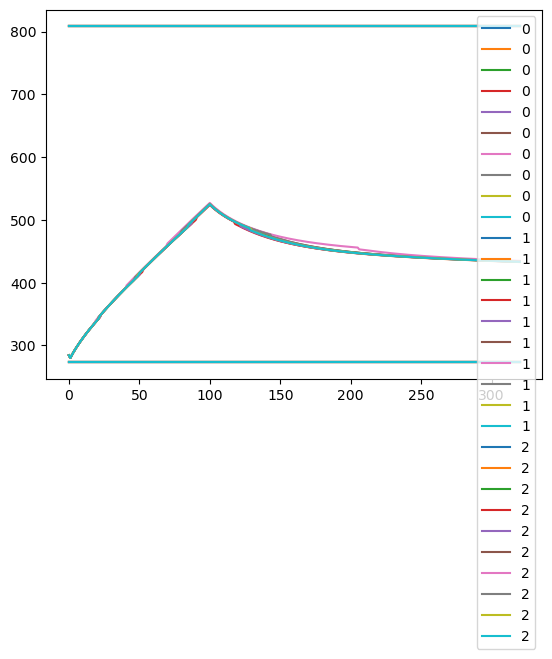

In [52]:
for i in range(3):
    plt.plot(f.concentration[:,0,:,i],label = i)
plt.legend()

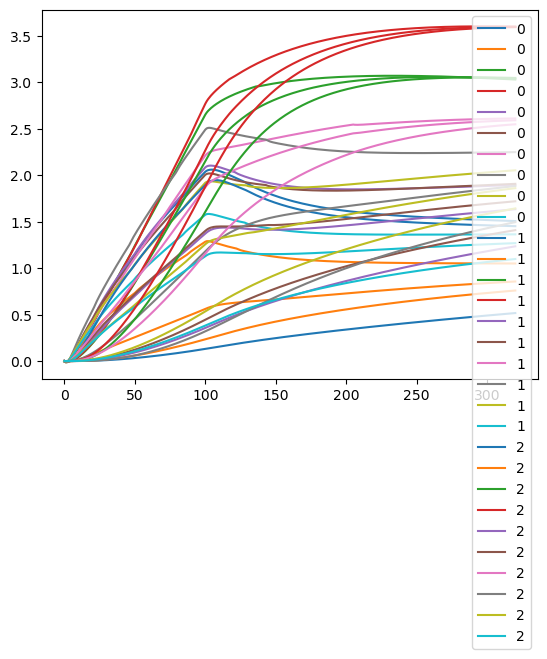

In [53]:
for i in range(3):
        plt.plot(f.temperature[:,0,:,i],label = i)
plt.legend()

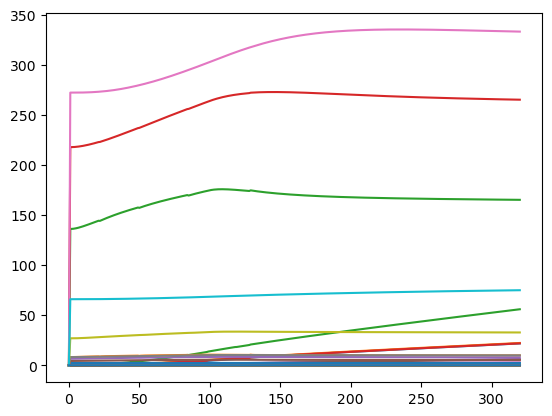

In [34]:
plt.plot(f.co2_partitions[:,0,0,0,:])

In [ ]:
f.concentration.specie

In [ ]:
# plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20c.colors)
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20c.colors)

for i in range(7,31):
    plt.plot(f.co2_partitions[:,0,0,0,i],label = pool_names[i])
# plt.plot(f.concentration[:,0,0,0], label = 0)
plt.legend(bbox_to_anchor = (1,1))
plt.show();plt.close()

In [ ]:
f.timebounds

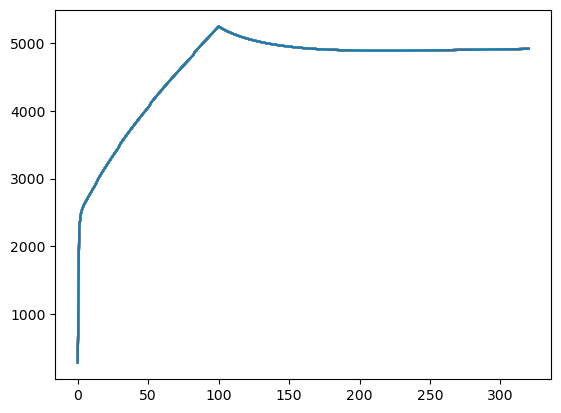

In [25]:
for i in range(31):
    plt.plot(np.squeeze(f.concentration.sel(specie='CO2')))

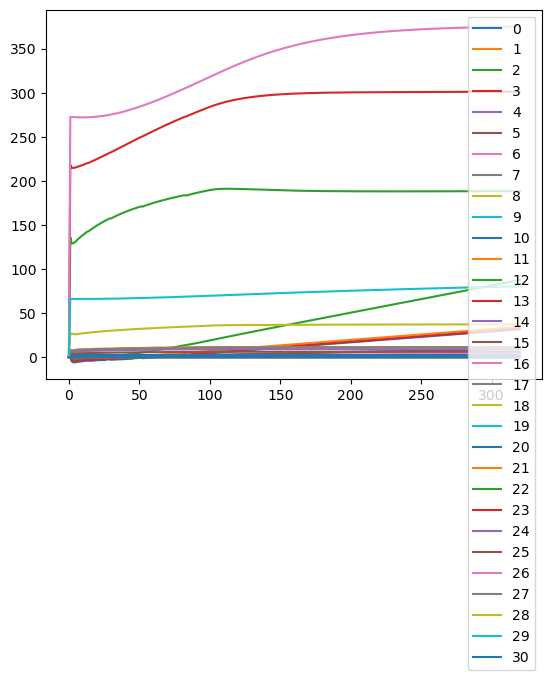

In [26]:
for i in range(31):
    plt.plot(np.squeeze(f.co2_partitions.isel(specie=0)[:,:,:,i]), label = i)
plt.legend()

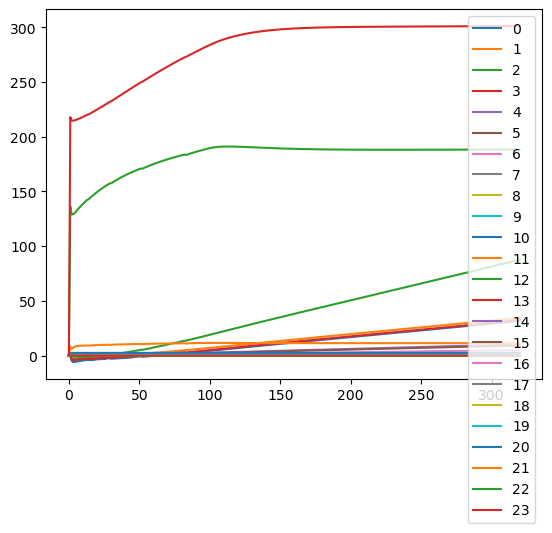

In [29]:
for i in range(24):
    plt.plot(np.squeeze(f.co2_partitions[:,:,:,0,i]), label = i);
plt.legend();plt.show();plt.close()

In [ ]:
for i in range(4):
    f.co2_partitions.sel(se)

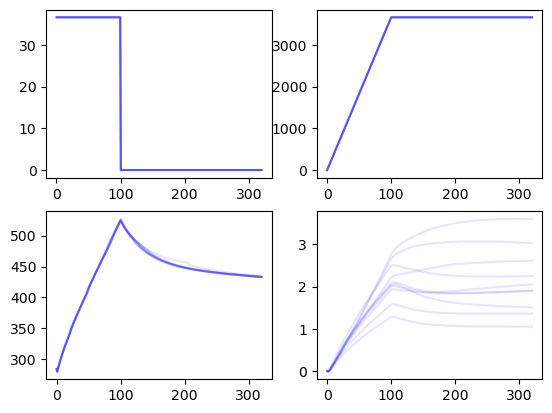

In [54]:
fig, ax = plt.subplots(2, 2)
# ax[0,0].plot(f.timepoints[:150], f.emissions.loc[dict(specie="CO2", scenario="esm-flat10", timepoints=np.arange(0.5, 150))], color='k', alpha=0.1);
ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[0,1].plot(np.arange(0, 151), f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,0].plot(np.arange(0, 151), f.concentration.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,1].plot(np.arange(0, 151), f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');

In [ ]:
plt.plot(np.arange(0, 151), f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
plt.plot(f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
plt.plot(np.arange(0, 291), f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timebounds=np.arange(0, 291))], color='r', alpha=0.1, ls=':');

In [ ]:
df = pd.DataFrame(
    {
        "tcre": tcre,
        "zec50": zec50,
        "zec100": zec100,
        "zec200": zec200,
        "tr1000": tr1000,
        "tr0": tr0,
        "tpw": tpw,
    },
    index = f.configs
)

In [ ]:
# TCRE is just warming at year 100
tcre = f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=100)]

# ZEC50 is just warming at year 150 minus year 100
zec50 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=150)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# ZEC100 is just warming at year 200 minus year 100
zec100 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=200)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# ZEC200 is just warming at year 300 minus year 100
zec200 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=300)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# # TNZ can be calculated as a 20 year average around year 150 in esm-flat10-cdr minus a 20 year average around year 125 in esm-flat10
# tnz = (
#     f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=150)] - 
#     f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=125)]
# )

# TR1000 can be calculated as a 20 year average around year 200 in esm-flat10-cdr minus a 20 year average around year 100 in esm-flat10
tr1000 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=200)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=100)]
)

# TR0 can be calculated as a 20 year average around year 310 in esm-flat10-cdr
tr0 = f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=310)]

# Time to Peak Warming (tPW) can be calculated as the time difference between the peak value of 20-year smoothed global mean 
# temperatures and the point that net zero is achieved in esm-flat10-cdr (year 150)
tpw = f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr")].argmax(axis=0) - 150

In [ ]:
sns.pairplot(
    df,
    corner=True,
    plot_kws={"alpha": 0.5},
    height=1,
)

In [ ]:
os.makedirs('../output/', exist_ok=True)
df.to_csv('../output/flat10_key-metrics_fair2.1.2_cal1.2.0.csv')

In [ ]:
ds = xr.Dataset(
    data_vars=dict(
        temperature=(["time", "scenario", "config"], f.temperature.loc[dict(layer=0)].data),
        co2_concentration=(["time", "scenario", "config"], f.concentration.loc[dict(specie="CO2")].data),
        airborne_fraction=(["time", "scenario", "config"], f.airborne_fraction.loc[dict(specie="CO2")].data),
        ecs=(["config"], f.ebms.ecs.data),
        tcr=(["config"], f.ebms.tcr.data),
        tcre=(["config"], tcre.data),
        zec50=(["config"], zec50.data),
        zec100=(["config"], zec100.data),
        zec200=(["config"], zec200.data),
        tr1000=(["config"], tr1000.data),
        tr0=(["config"], tr0.data),
        tpw=(["config"], tpw.data),
    ),
    coords=dict(
        time=np.arange(321),
        config=list(cal_1_2_0_df.index),
        scenario=scenarios
    ),
)

In [ ]:
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=0))
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=1))
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=2))

In [ ]:
# ds.to_netcdf('../output/flat10_all-output_fair2.1.2_cal1.2.0.nc')